# Dense Channel Aggregation and Reconstruction Network

In [1]:
import numpy as np
import pandas as pd
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"  # Select the GPU index
import scipy.io
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from collections import namedtuple
import scipy.io as sio
import math
import thop

from PIL import Image
from collections import OrderedDict
import torchvision.transforms as T
import matplotlib.pyplot as plt
import time
from scipy.io import savemat
import dill as pickle
from torch.optim.lr_scheduler import _LRScheduler
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
#Parameters
num_epochs=2500
patience=15
data_dir='../data/' 
scenario='out'
batch_size=200 
workers=5
reduction=16
expansion=1
seed=None
pin_memory=True
schedulertype = 'cosine'
weight_path=f'Experiments/table1/cr{reduction}/{expansion}x_{scenario}/epochs{num_epochs}/'
lr_init = 3e-3
val_freq=10
test_freq=10

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
class PreFetcher:
    r""" Data pre-fetcher to accelerate the data loading
    """

    def __init__(self, loader):
        self.ori_loader = loader
        self.len = len(loader)
        self.stream = torch.cuda.Stream()
        self.next_input = None

    def preload(self):
        try:
            self.next_input = next(self.loader)
        except StopIteration:
            self.next_input = None
            return

        with torch.cuda.stream(self.stream):
            for idx, tensor in enumerate(self.next_input):
                self.next_input[idx] = tensor.cuda(non_blocking=True)

    def __len__(self):
        return self.len

    def __iter__(self):
        self.loader = iter(self.ori_loader)
        self.preload()
        return self

    def __next__(self):
        torch.cuda.current_stream().wait_stream(self.stream)
        input = self.next_input
        if input is None:
            raise StopIteration
        for tensor in input:
            tensor.record_stream(torch.cuda.current_stream())
        self.preload()
        return input


In [5]:


class Cost2100DataLoader(object):
    r""" PyTorch DataLoader for COST2100 dataset.
    """

    def __init__(self, root, batch_size, num_workers, pin_memory, scenario):
        
        assert scenario in {"in", "out"}
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.pin_memory = pin_memory

        dir_train = os.path.join(root, f"DATA_Htrain{scenario}.mat")
        dir_val = os.path.join(root, f"DATA_Hval{scenario}.mat")
        dir_test = os.path.join(root, f"DATA_Htest{scenario}.mat")
        dir_raw = os.path.join(root, f"DATA_HtestF{scenario}_all.mat")
        channel, nt, nc, nc_expand = 2, 32, 32, 125

        # Training data loading
        data_train = sio.loadmat(dir_train)['HT']
        data_train = torch.tensor(data_train, dtype=torch.float32).view(
            data_train.shape[0], channel, nt, nc)
        self.train_dataset = TensorDataset(data_train)

        # Validation data loading
        data_val = sio.loadmat(dir_val)['HT']
        data_val = torch.tensor(data_val, dtype=torch.float32).view(
            data_val.shape[0], channel, nt, nc)
        self.val_dataset = TensorDataset(data_val)

        # Test data loading, including the sparse data and the raw data
        data_test = sio.loadmat(dir_test)['HT']
        data_test = torch.tensor(data_test, dtype=torch.float32).view(
            data_test.shape[0], channel, nt, nc)

        raw_test = sio.loadmat(dir_raw)['HF_all']
        real = torch.tensor(np.real(raw_test), dtype=torch.float32)
        imag = torch.tensor(np.imag(raw_test), dtype=torch.float32)
        raw_test = torch.cat((real.view(raw_test.shape[0], nt, nc_expand, 1),
                              imag.view(raw_test.shape[0], nt, nc_expand, 1)), dim=3)
        self.test_dataset = TensorDataset(data_test, raw_test)

    def __call__(self):
        train_loader = DataLoader(self.train_dataset,
                                  batch_size=self.batch_size,
                                  num_workers=self.num_workers,
                                  pin_memory=self.pin_memory,
                                  shuffle=True)
        val_loader = DataLoader(self.val_dataset,
                                batch_size=self.batch_size,
                                num_workers=self.num_workers,
                                pin_memory=self.pin_memory,
                                shuffle=False)
        test_loader = DataLoader(self.test_dataset,
                                 batch_size=self.batch_size,
                                 num_workers=self.num_workers,
                                 pin_memory=self.pin_memory,
                                 shuffle=False)

        # Accelerate CUDA data loading with pre-fetcher if GPU is used.
        if self.pin_memory is True:
            train_loader = PreFetcher(train_loader)
            val_loader = PreFetcher(val_loader)
            test_loader = PreFetcher(test_loader)

        return train_loader, val_loader, test_loader


In [6]:
# Create the data loader
train_loader, val_loader, test_loader = Cost2100DataLoader(
        root=data_dir,
        batch_size=batch_size,
        num_workers=workers,
        pin_memory=pin_memory,
        scenario=scenario)()

In [7]:
train_iter=iter(train_loader)

In [8]:
x=next(train_iter)

In [9]:
len(x)

1

In [10]:
x[0].shape

torch.Size([200, 2, 32, 32])

In [11]:
len(train_loader)

500

In [12]:
len(test_loader)

100

In [13]:
len(val_loader)

150

In [14]:
def cal_model_parameters(model):
    total_param  = []
    for p1 in model.parameters():
        total_param.append(int(p1.numel()))
    return sum(total_param)

In [15]:
def NMSE_cal(x_hat, x):
    x_real = torch.reshape(torch.real(x), (x.shape[0], -1))
    x_imag = torch.reshape(torch.imag(x), (x.shape[0], -1))
    x_hat_real = torch.reshape(torch.real(x_hat), (x.shape[0], -1))
    x_hat_imag = torch.reshape(torch.imag(x_hat), (x.shape[0], -1))
    power = torch.sum((x_real - 0.5) ** 2 + (x_imag - 0.5) ** 2, dim=1)
    mse = torch.sum((x_real - x_hat_real) ** 2 + (x_imag - x_hat_imag) ** 2, dim=1)
    nmse = torch.mean(mse / power)
    return nmse

In [16]:
class ConvBN(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, groups=1):
        if not isinstance(kernel_size, int):
            padding = [(i - 1) // 2 for i in kernel_size]
        else:
            padding = (kernel_size - 1) // 2
        super(ConvBN, self).__init__(OrderedDict([
            ('conv', nn.Conv2d(in_channels=in_planes,
                               out_channels=out_planes,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding,
                               groups=groups,
                               bias=False)),
            ('bn', nn.BatchNorm2d(out_planes))
        ]))

In [17]:
class DCARNDecoderBlock(nn.Module):
  
    def __init__(self, expansion):
        super().__init__()
        width = 10 * expansion
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)

        return x3

In [18]:
class DCARNEncoderBlock(nn.Module):
    def __init__(self):
        super(DCARNEncoderBlock, self).__init__()
        width = 2
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)
        return x3

In [19]:
class DCARN(nn.Module):
    def __init__(self,
                 in_channels=2,
                 reduction=4,
                 expansion=1):
        super(DCARN, self).__init__()
        
        total_size, w, h = 2048, 32, 32

        self.encoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(in_channels, 2, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNEncoderBlock", DCARNEncoderBlock()),
            
        ]))
        
        self.encoder_fc = nn.Linear(total_size, total_size // reduction)

        self.decoder_fc = nn.Linear(total_size // reduction, total_size)
        
        self.decoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(2, in_channels, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNDecoderBlock1", DCARNDecoderBlock(expansion=expansion)),
            ("DCARNDecoderBlock2", DCARNDecoderBlock(expansion=expansion)),
            ("sigmoid", nn.Sigmoid())
        ]))

        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        n, c, h, w = x.detach().size()
        out = self.encoder_feature(x)
        out = self.encoder_fc(out.view(n, -1))
        out = self.decoder_fc(out)
        out = self.decoder_feature(out.view(n, c, h, w))
        return out

In [20]:
model = DCARN(in_channels=2, reduction=reduction, expansion=expansion).to(device)

In [21]:
if seed is not None:
    random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [22]:
cal_model_parameters(model)

528650

In [23]:
# Define loss function
criterion = nn.MSELoss().to(device)

In [24]:
class WarmUpCosineAnnealingLR(_LRScheduler):
    def __init__(self, optimizer, T_max, T_warmup, eta_min=0, last_epoch=-1):
        self.T_max = T_max
        self.T_warmup = T_warmup
        self.eta_min = eta_min
        super(WarmUpCosineAnnealingLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        if self.last_epoch < self.T_warmup:
            return [base_lr * self.last_epoch / self.T_warmup for base_lr in self.base_lrs]
        else:
            k = 1 + math.cos(math.pi * (self.last_epoch - self.T_warmup) / (self.T_max - self.T_warmup))
            return [self.eta_min + (base_lr - self.eta_min) * k / 2 for base_lr in self.base_lrs]


class FakeLR(_LRScheduler):
    def __init__(self, optimizer):
        super(FakeLR, self).__init__(optimizer=optimizer)

    def get_lr(self):
        return self.base_lrs


In [25]:
# Define optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr_init, betas=(0.9, 0.999))
if schedulertype == 'const':
    scheduler = FakeLR(optimizer=optimizer)

else:
    scheduler = WarmUpCosineAnnealingLR(optimizer=optimizer,
                                        T_max=num_epochs* len(train_loader),
                                        T_warmup=100 * len(train_loader),
                                        eta_min=5e-7)

In [26]:
field = ('nmse', 'rho', 'epoch')
Result = namedtuple('Result', field, defaults=(None,) * len(field))


In [27]:
class AverageMeter(object):
    r"""Computes and stores the average and current value
       Imported from https://github.com/pytorch/examples/blob/master/imagenet/main.py#L247-L262
    """
    def __init__(self, name):
        self.reset()
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
        self.name = name

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __repr__(self):
        return f"==> For {self.name}: sum={self.sum}; avg={self.avg}"




In [28]:
def evaluator(sparse_pred, sparse_gt, raw_gt):
    r""" Evaluation of decoding implemented in PyTorch Tensor
         Computes normalized mean square error (NMSE) and rho.
    """

    with torch.no_grad():
        # Basic params
        nt = 32
        nc = 32
        nc_expand = 257

        # De-centralize
        sparse_gt = sparse_gt - 0.5
        sparse_pred = sparse_pred - 0.5

        # Calculate the NMSE
        power_gt = sparse_gt[:, 0, :, :] ** 2 + sparse_gt[:, 1, :, :] ** 2
        difference = sparse_gt - sparse_pred
        mse = difference[:, 0, :, :] ** 2 + difference[:, 1, :, :] ** 2
        nmse = (mse.sum(dim=[1, 2]) / power_gt.sum(dim=[1, 2])).mean()

        # Calculate the Rho
        n = sparse_pred.size(0)
        sparse_pred = sparse_pred.permute(0, 2, 3, 1)  # Move the real/imaginary dim to the last
        zeros = sparse_pred.new_zeros((n, nt, nc_expand - nc, 2))
        sparse_pred = torch.cat((sparse_pred, zeros), dim=2)
        raw_pred = torch.fft.fft(sparse_pred, dim=1)[:, :, :125, :]

        norm_pred = raw_pred[..., 0] ** 2 + raw_pred[..., 1] ** 2
        norm_pred = torch.sqrt(norm_pred.sum(dim=1))

        norm_gt = raw_gt[..., 0] ** 2 + raw_gt[..., 1] ** 2
        norm_gt = torch.sqrt(norm_gt.sum(dim=1))

        real_cross = raw_pred[..., 0] * raw_gt[..., 0] + raw_pred[..., 1] * raw_gt[..., 1]
        real_cross = real_cross.sum(dim=1)
        imag_cross = raw_pred[..., 0] * raw_gt[..., 1] - raw_pred[..., 1] * raw_gt[..., 0]
        imag_cross = imag_cross.sum(dim=1)
        norm_cross = torch.sqrt(real_cross ** 2 + imag_cross ** 2)

        rho = (norm_cross / (norm_pred * norm_gt)).mean()

        return rho, nmse


In [29]:
class Tester:
    r""" The testing interface for classification
    """

    def __init__(self, model, device, criterion, print_freq=20):
        self.model = model
        self.device = device
        self.criterion = criterion
        self.print_freq = print_freq

    def __call__(self, test_data, verbose=True):
        r""" Runs the testing procedure.

        Args:
            test_data (DataLoader): Data loader for validation data.
        """

        self.model.eval()
        with torch.no_grad():
            loss, rho, nmse = self._iteration(test_data)
        if verbose:
            print(f'\n=> Test result: \nloss: {loss:.3e}'
                  f'    rho: {rho:.3e}    NMSE: {nmse:.3e}\n')
        return loss, rho, nmse

    def _iteration(self, data_loader):
        r""" protected function which test the model on given data loader for one epoch.
        """

        iter_rho = AverageMeter('Iter rho')
        iter_nmse = AverageMeter('Iter nmse')
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, raw_gt) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)
            rho, nmse = evaluator(sparse_pred, sparse_gt, raw_gt)

            # Log and visdom update
            iter_loss.update(loss)
            iter_rho.update(rho)
            iter_nmse.update(nmse)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'loss: {iter_loss.avg:.3e} | rho: {iter_rho.avg:.3e} | '
                            f'NMSE: {10 * torch.log10(iter_nmse.avg):.3e} | time: {iter_time.avg:.3f}')
        
        nmse = 10 * torch.log10(iter_nmse.avg)  # global NMSE in dB
        print(f'=> Test rho:{iter_rho.avg:.3e}  NMSE: {nmse:.3e}\n')
        return iter_loss.avg, iter_rho.avg, nmse


In [30]:
val_losses = torch.empty(num_epochs//val_freq)
train_losses = torch.empty(num_epochs)
test_losses = torch.empty(num_epochs//test_freq)
alphas = torch.zeros(num_epochs)
test_nmses = torch.zeros(num_epochs//test_freq)

if not os.path.exists(weight_path + "losses/"):
    os.makedirs(weight_path + "losses/")

In [31]:
class Trainer:
    r""" The training pipeline for encoder-decoder architecture
    """

    def __init__(self, model, device, optimizer, criterion, scheduler, resume=None,
                 save_path=weight_path, print_freq=10, val_freq = val_freq, test_freq = test_freq):

        # Basic arguments
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion
        self.scheduler = scheduler
        self.device = device

        # Verbose arguments
        self.resume_file = resume
        self.save_path = save_path
        self.print_freq = print_freq
        self.val_freq = val_freq
        self.test_freq = test_freq
        

        # Pipeline arguments
        self.cur_epoch = 1
        self.all_epoch = None
        self.train_loss = None
        self.val_loss = None
        self.test_loss = None
        self.best_rho = Result()
        self.best_nmse = Result()
        
        self.tester = Tester(model, device, criterion, print_freq)
        self.test_loader = None

    def loop(self, epochs, train_loader, val_loader, test_loader):
        r""" The main loop function which runs training and validation iteratively.

        Args:
            epochs (int): The total epoch for training
            train_loader (DataLoader): Data loader for training data.
            val_loader (DataLoader): Data loader for validation data.
            test_loader (DataLoader): Data loader for test data.
        """

        self.all_epoch = epochs
        self._resume()
        vn=0
        tn=0
        for ep in range(self.cur_epoch, epochs + 1):
            self.cur_epoch = ep

            # conduct training, validation and test
            self.train_loss = self.train(train_loader)
            train_losses[ep-1] = self.train_loss.detach()
            if ep % self.val_freq == 0:
                self.val_loss = self.val(val_loader)
                val_losses[vn] = self.val_loss.detach()
                vn=vn+1
            # Save alpha 
            alphas_ep = []
            for m in self.model.modules():
                if isinstance(m, nn.PReLU):
                    alphas_ep.append(m.weight[0])
            alphas[ep-1] = torch.stack(alphas_ep).mean().detach()
            
            if ep % self.test_freq == 0:
                self.test_loss, rho, nmse = self.test(test_loader)
                test_losses[tn] = self.test_loss.detach()
                test_nmses[tn] = nmse.detach()
                tn=tn+1
            else:
                rho, nmse = None, None
            # conduct saving, visualization and log printing
            self._loop_postprocessing(rho, nmse)

    def train(self, train_loader):
        r""" train the model on the given data loader for one epoch.

        Args:
            train_loader (DataLoader): the training data loader
        """

        self.model.train()
        with torch.enable_grad():
            return self._iteration(train_loader)

    def val(self, val_loader):
        r""" exam the model with validation set.

        Args:
            val_loader: (DataLoader): the validation data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self._iteration(val_loader)

    def test(self, test_loader):
        r""" Truly test the model on the test dataset for one epoch.

        Args:
            test_loader (DataLoader): the test data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self.tester(test_loader, verbose=False)

    def _iteration(self, data_loader):
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, ) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)

            # Scheduler update, backward pass and optimization
            if self.model.training:
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                self.scheduler.step()

            # Log and visdom update
            iter_loss.update(loss)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'Epoch: [{self.cur_epoch}/{self.all_epoch}]'
                            f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'lr: {self.scheduler.get_lr()[0]:.2e} | '
                            f'MSE loss: {iter_loss.avg:.3e} | '
                            f'time: {iter_time.avg:.3f}')
                

        mode = 'Train' if self.model.training else 'Val'
        print(f' {mode}  Loss: {iter_loss.avg:.3e}\n')

        return iter_loss.avg

    def _save(self, state, name):
        if self.save_path is None:
            print('No path to save checkpoints.')
            return
        
        os.makedirs(self.save_path, exist_ok=True)
        torch.save(state, os.path.join(self.save_path, name))

    def _resume(self):
        r""" protected function which resume from checkpoint at the beginning of training.
        """

        if self.resume_file is None:
            return None
        assert os.path.isfile(self.resume_file)
        print(f' loading checkpoint {self.resume_file}')
        checkpoint = torch.load(self.resume_file)
        self.cur_epoch = checkpoint['epoch']
        self.model.load_state_dict(checkpoint['state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer'])
        self.scheduler.load_state_dict(checkpoint['scheduler'])
        self.best_rho = checkpoint['best_rho']
        self.best_nmse = checkpoint['best_nmse']
        self.cur_epoch += 1  # start from the next epoch

        print(f' successfully loaded checkpoint {self.resume_file} '
                    f'from epoch {checkpoint["epoch"]}.\n')

    def _loop_postprocessing(self, rho, nmse):
        r""" private function which makes loop() function neater.
        """

        # save state generate
        state = {
            'epoch': self.cur_epoch,
            'state_dict': self.model.state_dict(),
            'optimizer': self.optimizer.state_dict(),
            'scheduler': self.scheduler.state_dict(),
            'best_rho': self.best_rho,
            'best_nmse': self.best_nmse
        }

        # save model with best rho and nmse
        if rho is not None:
            if self.best_rho.rho is None or abs(self.best_rho.rho) < abs(rho):
                self.best_rho = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_rho'] = self.best_rho
                self._save(state, name=f"best_rho.pth")
            if self.best_nmse.nmse is None or self.best_nmse.nmse > nmse:
                self.best_nmse = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_nmse'] = self.best_nmse
                self._save(state, name=f"best_nmse.pth")

        self._save(state, name='last.pth')

        # print current best results
        if self.best_rho.rho is not None:
            print(f'\n=! Best rho: {self.best_rho.rho:.3e} ('
                  f'Corresponding nmse={self.best_rho.nmse:.3e}; '
                  f'epoch={self.best_rho.epoch})'
                  f'\n   Best NMSE: {self.best_nmse.nmse:.3e} ('
                  f'Corresponding rho={self.best_nmse.rho:.3e};  '
                  f'epoch={self.best_nmse.epoch})\n')
            

In [32]:
# Define the training pipeline
trainer = Trainer(model=model,
                  device=device,
                  optimizer=optimizer,
                  criterion=criterion,
                  scheduler=scheduler)

# Start training
trainer.loop(num_epochs, train_loader, val_loader, test_loader)

Epoch: [1/2500][10/500] lr: 6.00e-07 | MSE loss: 5.064e-02 | time: 0.409
Epoch: [1/2500][20/500] lr: 1.20e-06 | MSE loss: 5.059e-02 | time: 0.210
Epoch: [1/2500][30/500] lr: 1.80e-06 | MSE loss: 5.050e-02 | time: 0.144
Epoch: [1/2500][40/500] lr: 2.40e-06 | MSE loss: 5.038e-02 | time: 0.110
Epoch: [1/2500][50/500] lr: 3.00e-06 | MSE loss: 5.022e-02 | time: 0.090
Epoch: [1/2500][60/500] lr: 3.60e-06 | MSE loss: 5.003e-02 | time: 0.077
Epoch: [1/2500][70/500] lr: 4.20e-06 | MSE loss: 4.981e-02 | time: 0.067
Epoch: [1/2500][80/500] lr: 4.80e-06 | MSE loss: 4.955e-02 | time: 0.060
Epoch: [1/2500][90/500] lr: 5.40e-06 | MSE loss: 4.926e-02 | time: 0.055
Epoch: [1/2500][100/500] lr: 6.00e-06 | MSE loss: 4.894e-02 | time: 0.050
Epoch: [1/2500][110/500] lr: 6.60e-06 | MSE loss: 4.859e-02 | time: 0.047
Epoch: [1/2500][120/500] lr: 7.20e-06 | MSE loss: 4.820e-02 | time: 0.044
Epoch: [1/2500][130/500] lr: 7.80e-06 | MSE loss: 4.779e-02 | time: 0.041
Epoch: [1/2500][140/500] lr: 8.40e-06 | MSE los

Epoch: [3/2500][120/500] lr: 6.72e-05 | MSE loss: 3.380e-03 | time: 0.017
Epoch: [3/2500][130/500] lr: 6.78e-05 | MSE loss: 3.365e-03 | time: 0.016
Epoch: [3/2500][140/500] lr: 6.84e-05 | MSE loss: 3.350e-03 | time: 0.016
Epoch: [3/2500][150/500] lr: 6.90e-05 | MSE loss: 3.335e-03 | time: 0.015
Epoch: [3/2500][160/500] lr: 6.96e-05 | MSE loss: 3.322e-03 | time: 0.015
Epoch: [3/2500][170/500] lr: 7.02e-05 | MSE loss: 3.309e-03 | time: 0.015
Epoch: [3/2500][180/500] lr: 7.08e-05 | MSE loss: 3.295e-03 | time: 0.015
Epoch: [3/2500][190/500] lr: 7.14e-05 | MSE loss: 3.283e-03 | time: 0.014
Epoch: [3/2500][200/500] lr: 7.20e-05 | MSE loss: 3.270e-03 | time: 0.014
Epoch: [3/2500][210/500] lr: 7.26e-05 | MSE loss: 3.258e-03 | time: 0.014
Epoch: [3/2500][220/500] lr: 7.32e-05 | MSE loss: 3.247e-03 | time: 0.014
Epoch: [3/2500][230/500] lr: 7.38e-05 | MSE loss: 3.236e-03 | time: 0.014
Epoch: [3/2500][240/500] lr: 7.44e-05 | MSE loss: 3.224e-03 | time: 0.014
Epoch: [3/2500][250/500] lr: 7.50e-05 

Epoch: [5/2500][240/500] lr: 1.34e-04 | MSE loss: 1.669e-03 | time: 0.013
Epoch: [5/2500][250/500] lr: 1.35e-04 | MSE loss: 1.669e-03 | time: 0.013
Epoch: [5/2500][260/500] lr: 1.36e-04 | MSE loss: 1.668e-03 | time: 0.013
Epoch: [5/2500][270/500] lr: 1.36e-04 | MSE loss: 1.669e-03 | time: 0.013
Epoch: [5/2500][280/500] lr: 1.37e-04 | MSE loss: 1.668e-03 | time: 0.013
Epoch: [5/2500][290/500] lr: 1.37e-04 | MSE loss: 1.668e-03 | time: 0.013
Epoch: [5/2500][300/500] lr: 1.38e-04 | MSE loss: 1.668e-03 | time: 0.013
Epoch: [5/2500][310/500] lr: 1.39e-04 | MSE loss: 1.668e-03 | time: 0.013
Epoch: [5/2500][320/500] lr: 1.39e-04 | MSE loss: 1.668e-03 | time: 0.013
Epoch: [5/2500][330/500] lr: 1.40e-04 | MSE loss: 1.667e-03 | time: 0.013
Epoch: [5/2500][340/500] lr: 1.40e-04 | MSE loss: 1.667e-03 | time: 0.013
Epoch: [5/2500][350/500] lr: 1.41e-04 | MSE loss: 1.667e-03 | time: 0.013
Epoch: [5/2500][360/500] lr: 1.42e-04 | MSE loss: 1.667e-03 | time: 0.013
Epoch: [5/2500][370/500] lr: 1.42e-04 

Epoch: [7/2500][360/500] lr: 2.02e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][370/500] lr: 2.02e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][380/500] lr: 2.03e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][390/500] lr: 2.03e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][400/500] lr: 2.04e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][410/500] lr: 2.05e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][420/500] lr: 2.05e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][430/500] lr: 2.06e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][440/500] lr: 2.06e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][450/500] lr: 2.07e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][460/500] lr: 2.08e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][470/500] lr: 2.08e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][480/500] lr: 2.09e-04 | MSE loss: 1.293e-03 | time: 0.013
Epoch: [7/2500][490/500] lr: 2.09e-04 

Epoch: [9/2500][470/500] lr: 2.68e-04 | MSE loss: 1.286e-03 | time: 0.013
Epoch: [9/2500][480/500] lr: 2.69e-04 | MSE loss: 1.286e-03 | time: 0.013
Epoch: [9/2500][490/500] lr: 2.69e-04 | MSE loss: 1.286e-03 | time: 0.013
Epoch: [9/2500][500/500] lr: 2.70e-04 | MSE loss: 1.286e-03 | time: 0.013
 Train  Loss: 1.286e-03

Epoch: [10/2500][10/500] lr: 2.71e-04 | MSE loss: 1.295e-03 | time: 0.071
Epoch: [10/2500][20/500] lr: 2.71e-04 | MSE loss: 1.288e-03 | time: 0.041
Epoch: [10/2500][30/500] lr: 2.72e-04 | MSE loss: 1.289e-03 | time: 0.031
Epoch: [10/2500][40/500] lr: 2.72e-04 | MSE loss: 1.289e-03 | time: 0.026
Epoch: [10/2500][50/500] lr: 2.73e-04 | MSE loss: 1.288e-03 | time: 0.023
Epoch: [10/2500][60/500] lr: 2.74e-04 | MSE loss: 1.287e-03 | time: 0.021
Epoch: [10/2500][70/500] lr: 2.74e-04 | MSE loss: 1.287e-03 | time: 0.019
Epoch: [10/2500][80/500] lr: 2.75e-04 | MSE loss: 1.287e-03 | time: 0.018
Epoch: [10/2500][90/500] lr: 2.75e-04 | MSE loss: 1.286e-03 | time: 0.018
Epoch: [10/25

Epoch: [11/2500][290/500] lr: 3.17e-04 | MSE loss: 1.272e-03 | time: 0.014
Epoch: [11/2500][300/500] lr: 3.18e-04 | MSE loss: 1.272e-03 | time: 0.014
Epoch: [11/2500][310/500] lr: 3.19e-04 | MSE loss: 1.271e-03 | time: 0.014
Epoch: [11/2500][320/500] lr: 3.19e-04 | MSE loss: 1.271e-03 | time: 0.014
Epoch: [11/2500][330/500] lr: 3.20e-04 | MSE loss: 1.271e-03 | time: 0.013
Epoch: [11/2500][340/500] lr: 3.20e-04 | MSE loss: 1.271e-03 | time: 0.013
Epoch: [11/2500][350/500] lr: 3.21e-04 | MSE loss: 1.271e-03 | time: 0.013
Epoch: [11/2500][360/500] lr: 3.22e-04 | MSE loss: 1.271e-03 | time: 0.013
Epoch: [11/2500][370/500] lr: 3.22e-04 | MSE loss: 1.271e-03 | time: 0.013
Epoch: [11/2500][380/500] lr: 3.23e-04 | MSE loss: 1.271e-03 | time: 0.013
Epoch: [11/2500][390/500] lr: 3.23e-04 | MSE loss: 1.270e-03 | time: 0.013
Epoch: [11/2500][400/500] lr: 3.24e-04 | MSE loss: 1.270e-03 | time: 0.013
Epoch: [11/2500][410/500] lr: 3.25e-04 | MSE loss: 1.270e-03 | time: 0.013
Epoch: [11/2500][420/500]

Epoch: [13/2500][350/500] lr: 3.81e-04 | MSE loss: 1.230e-03 | time: 0.013
Epoch: [13/2500][360/500] lr: 3.82e-04 | MSE loss: 1.230e-03 | time: 0.013
Epoch: [13/2500][370/500] lr: 3.82e-04 | MSE loss: 1.229e-03 | time: 0.013
Epoch: [13/2500][380/500] lr: 3.83e-04 | MSE loss: 1.229e-03 | time: 0.013
Epoch: [13/2500][390/500] lr: 3.83e-04 | MSE loss: 1.228e-03 | time: 0.013
Epoch: [13/2500][400/500] lr: 3.84e-04 | MSE loss: 1.228e-03 | time: 0.013
Epoch: [13/2500][410/500] lr: 3.85e-04 | MSE loss: 1.227e-03 | time: 0.013
Epoch: [13/2500][420/500] lr: 3.85e-04 | MSE loss: 1.227e-03 | time: 0.013
Epoch: [13/2500][430/500] lr: 3.86e-04 | MSE loss: 1.227e-03 | time: 0.013
Epoch: [13/2500][440/500] lr: 3.86e-04 | MSE loss: 1.227e-03 | time: 0.013
Epoch: [13/2500][450/500] lr: 3.87e-04 | MSE loss: 1.227e-03 | time: 0.013
Epoch: [13/2500][460/500] lr: 3.88e-04 | MSE loss: 1.226e-03 | time: 0.013
Epoch: [13/2500][470/500] lr: 3.88e-04 | MSE loss: 1.226e-03 | time: 0.013
Epoch: [13/2500][480/500]

Epoch: [15/2500][430/500] lr: 4.46e-04 | MSE loss: 1.171e-03 | time: 0.013
Epoch: [15/2500][440/500] lr: 4.46e-04 | MSE loss: 1.171e-03 | time: 0.013
Epoch: [15/2500][450/500] lr: 4.47e-04 | MSE loss: 1.171e-03 | time: 0.013
Epoch: [15/2500][460/500] lr: 4.48e-04 | MSE loss: 1.171e-03 | time: 0.013
Epoch: [15/2500][470/500] lr: 4.48e-04 | MSE loss: 1.170e-03 | time: 0.013
Epoch: [15/2500][480/500] lr: 4.49e-04 | MSE loss: 1.170e-03 | time: 0.013
Epoch: [15/2500][490/500] lr: 4.49e-04 | MSE loss: 1.170e-03 | time: 0.013
Epoch: [15/2500][500/500] lr: 4.50e-04 | MSE loss: 1.170e-03 | time: 0.013
 Train  Loss: 1.170e-03


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: 2.483e+00 (Corresponding rho=nan+nanj;  epoch=10)

Epoch: [16/2500][10/500] lr: 4.51e-04 | MSE loss: 1.159e-03 | time: 0.082
Epoch: [16/2500][20/500] lr: 4.51e-04 | MSE loss: 1.156e-03 | time: 0.048
Epoch: [16/2500][30/500] lr: 4.52e-04 | MSE loss: 1.154e-03 | time: 0.035
Epoch: [16/2500][40/500]

Epoch: [17/2500][500/500] lr: 5.10e-04 | MSE loss: 1.123e-03 | time: 0.013
 Train  Loss: 1.123e-03


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: 2.483e+00 (Corresponding rho=nan+nanj;  epoch=10)

Epoch: [18/2500][10/500] lr: 5.11e-04 | MSE loss: 1.109e-03 | time: 0.071
Epoch: [18/2500][20/500] lr: 5.11e-04 | MSE loss: 1.107e-03 | time: 0.041
Epoch: [18/2500][30/500] lr: 5.12e-04 | MSE loss: 1.104e-03 | time: 0.031
Epoch: [18/2500][40/500] lr: 5.12e-04 | MSE loss: 1.103e-03 | time: 0.027
Epoch: [18/2500][50/500] lr: 5.13e-04 | MSE loss: 1.103e-03 | time: 0.024
Epoch: [18/2500][60/500] lr: 5.14e-04 | MSE loss: 1.104e-03 | time: 0.021
Epoch: [18/2500][70/500] lr: 5.14e-04 | MSE loss: 1.104e-03 | time: 0.020
Epoch: [18/2500][80/500] lr: 5.15e-04 | MSE loss: 1.104e-03 | time: 0.019
Epoch: [18/2500][90/500] lr: 5.15e-04 | MSE loss: 1.104e-03 | time: 0.018
Epoch: [18/2500][100/500] lr: 5.16e-04 | MSE loss: 1.105e-03 | time: 0.018
Epoch: [18/2500][110/500] lr: 

Epoch: [20/2500][50/500] lr: 5.73e-04 | MSE loss: 9.318e-04 | time: 0.023
Epoch: [20/2500][60/500] lr: 5.74e-04 | MSE loss: 9.310e-04 | time: 0.021
Epoch: [20/2500][70/500] lr: 5.74e-04 | MSE loss: 9.300e-04 | time: 0.020
Epoch: [20/2500][80/500] lr: 5.75e-04 | MSE loss: 9.299e-04 | time: 0.019
Epoch: [20/2500][90/500] lr: 5.75e-04 | MSE loss: 9.302e-04 | time: 0.018
Epoch: [20/2500][100/500] lr: 5.76e-04 | MSE loss: 9.295e-04 | time: 0.017
Epoch: [20/2500][110/500] lr: 5.77e-04 | MSE loss: 9.298e-04 | time: 0.017
Epoch: [20/2500][120/500] lr: 5.77e-04 | MSE loss: 9.291e-04 | time: 0.016
Epoch: [20/2500][130/500] lr: 5.78e-04 | MSE loss: 9.297e-04 | time: 0.016
Epoch: [20/2500][140/500] lr: 5.78e-04 | MSE loss: 9.309e-04 | time: 0.016
Epoch: [20/2500][150/500] lr: 5.79e-04 | MSE loss: 9.303e-04 | time: 0.015
Epoch: [20/2500][160/500] lr: 5.80e-04 | MSE loss: 9.302e-04 | time: 0.015
Epoch: [20/2500][170/500] lr: 5.80e-04 | MSE loss: 9.299e-04 | time: 0.015
Epoch: [20/2500][180/500] lr: 

Epoch: [21/2500][370/500] lr: 6.22e-04 | MSE loss: 7.741e-04 | time: 0.013
Epoch: [21/2500][380/500] lr: 6.23e-04 | MSE loss: 7.739e-04 | time: 0.013
Epoch: [21/2500][390/500] lr: 6.23e-04 | MSE loss: 7.734e-04 | time: 0.013
Epoch: [21/2500][400/500] lr: 6.24e-04 | MSE loss: 7.730e-04 | time: 0.013
Epoch: [21/2500][410/500] lr: 6.25e-04 | MSE loss: 7.726e-04 | time: 0.013
Epoch: [21/2500][420/500] lr: 6.25e-04 | MSE loss: 7.722e-04 | time: 0.013
Epoch: [21/2500][430/500] lr: 6.26e-04 | MSE loss: 7.721e-04 | time: 0.013
Epoch: [21/2500][440/500] lr: 6.26e-04 | MSE loss: 7.720e-04 | time: 0.013
Epoch: [21/2500][450/500] lr: 6.27e-04 | MSE loss: 7.717e-04 | time: 0.013
Epoch: [21/2500][460/500] lr: 6.28e-04 | MSE loss: 7.715e-04 | time: 0.013
Epoch: [21/2500][470/500] lr: 6.28e-04 | MSE loss: 7.711e-04 | time: 0.013
Epoch: [21/2500][480/500] lr: 6.29e-04 | MSE loss: 7.709e-04 | time: 0.013
Epoch: [21/2500][490/500] lr: 6.29e-04 | MSE loss: 7.706e-04 | time: 0.013
Epoch: [21/2500][500/500]

Epoch: [23/2500][430/500] lr: 6.86e-04 | MSE loss: 6.988e-04 | time: 0.013
Epoch: [23/2500][440/500] lr: 6.86e-04 | MSE loss: 6.986e-04 | time: 0.013
Epoch: [23/2500][450/500] lr: 6.87e-04 | MSE loss: 6.981e-04 | time: 0.013
Epoch: [23/2500][460/500] lr: 6.88e-04 | MSE loss: 6.976e-04 | time: 0.013
Epoch: [23/2500][470/500] lr: 6.88e-04 | MSE loss: 6.973e-04 | time: 0.013
Epoch: [23/2500][480/500] lr: 6.89e-04 | MSE loss: 6.965e-04 | time: 0.013
Epoch: [23/2500][490/500] lr: 6.89e-04 | MSE loss: 6.962e-04 | time: 0.013
Epoch: [23/2500][500/500] lr: 6.90e-04 | MSE loss: 6.961e-04 | time: 0.013
 Train  Loss: 6.961e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: 2.642e-01 (Corresponding rho=nan+nanj;  epoch=20)

Epoch: [24/2500][10/500] lr: 6.91e-04 | MSE loss: 6.866e-04 | time: 0.073
Epoch: [24/2500][20/500] lr: 6.91e-04 | MSE loss: 6.863e-04 | time: 0.043
Epoch: [24/2500][30/500] lr: 6.92e-04 | MSE loss: 6.832e-04 | time: 0.032
Epoch: [24/2500][40/500]

Epoch: [25/2500][490/500] lr: 7.49e-04 | MSE loss: 6.416e-04 | time: 0.012
Epoch: [25/2500][500/500] lr: 7.50e-04 | MSE loss: 6.416e-04 | time: 0.013
 Train  Loss: 6.416e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: 2.642e-01 (Corresponding rho=nan+nanj;  epoch=20)

Epoch: [26/2500][10/500] lr: 7.51e-04 | MSE loss: 6.337e-04 | time: 0.074
Epoch: [26/2500][20/500] lr: 7.51e-04 | MSE loss: 6.334e-04 | time: 0.044
Epoch: [26/2500][30/500] lr: 7.52e-04 | MSE loss: 6.313e-04 | time: 0.034
Epoch: [26/2500][40/500] lr: 7.52e-04 | MSE loss: 6.322e-04 | time: 0.029
Epoch: [26/2500][50/500] lr: 7.53e-04 | MSE loss: 6.319e-04 | time: 0.026
Epoch: [26/2500][60/500] lr: 7.54e-04 | MSE loss: 6.312e-04 | time: 0.023
Epoch: [26/2500][70/500] lr: 7.54e-04 | MSE loss: 6.311e-04 | time: 0.022
Epoch: [26/2500][80/500] lr: 7.55e-04 | MSE loss: 6.318e-04 | time: 0.020
Epoch: [26/2500][90/500] lr: 7.55e-04 | MSE loss: 6.318e-04 | time: 0.020
Epoch: [26/2500][100/500] lr: 

Epoch: [28/2500][30/500] lr: 8.12e-04 | MSE loss: 6.016e-04 | time: 0.033
Epoch: [28/2500][40/500] lr: 8.12e-04 | MSE loss: 6.066e-04 | time: 0.028
Epoch: [28/2500][50/500] lr: 8.13e-04 | MSE loss: 6.073e-04 | time: 0.024
Epoch: [28/2500][60/500] lr: 8.14e-04 | MSE loss: 6.063e-04 | time: 0.022
Epoch: [28/2500][70/500] lr: 8.14e-04 | MSE loss: 6.072e-04 | time: 0.020
Epoch: [28/2500][80/500] lr: 8.15e-04 | MSE loss: 6.068e-04 | time: 0.019
Epoch: [28/2500][90/500] lr: 8.15e-04 | MSE loss: 6.079e-04 | time: 0.018
Epoch: [28/2500][100/500] lr: 8.16e-04 | MSE loss: 6.084e-04 | time: 0.018
Epoch: [28/2500][110/500] lr: 8.17e-04 | MSE loss: 6.088e-04 | time: 0.017
Epoch: [28/2500][120/500] lr: 8.17e-04 | MSE loss: 6.084e-04 | time: 0.017
Epoch: [28/2500][130/500] lr: 8.18e-04 | MSE loss: 6.083e-04 | time: 0.016
Epoch: [28/2500][140/500] lr: 8.18e-04 | MSE loss: 6.078e-04 | time: 0.016
Epoch: [28/2500][150/500] lr: 8.19e-04 | MSE loss: 6.083e-04 | time: 0.016
Epoch: [28/2500][160/500] lr: 8.

Epoch: [30/2500][90/500] lr: 8.75e-04 | MSE loss: 5.931e-04 | time: 0.020
Epoch: [30/2500][100/500] lr: 8.76e-04 | MSE loss: 5.938e-04 | time: 0.019
Epoch: [30/2500][110/500] lr: 8.77e-04 | MSE loss: 5.930e-04 | time: 0.018
Epoch: [30/2500][120/500] lr: 8.77e-04 | MSE loss: 5.923e-04 | time: 0.017
Epoch: [30/2500][130/500] lr: 8.78e-04 | MSE loss: 5.928e-04 | time: 0.017
Epoch: [30/2500][140/500] lr: 8.78e-04 | MSE loss: 5.932e-04 | time: 0.017
Epoch: [30/2500][150/500] lr: 8.79e-04 | MSE loss: 5.926e-04 | time: 0.016
Epoch: [30/2500][160/500] lr: 8.80e-04 | MSE loss: 5.922e-04 | time: 0.016
Epoch: [30/2500][170/500] lr: 8.80e-04 | MSE loss: 5.915e-04 | time: 0.016
Epoch: [30/2500][180/500] lr: 8.81e-04 | MSE loss: 5.915e-04 | time: 0.015
Epoch: [30/2500][190/500] lr: 8.81e-04 | MSE loss: 5.916e-04 | time: 0.015
Epoch: [30/2500][200/500] lr: 8.82e-04 | MSE loss: 5.919e-04 | time: 0.015
Epoch: [30/2500][210/500] lr: 8.83e-04 | MSE loss: 5.924e-04 | time: 0.015
Epoch: [30/2500][220/500] 

Epoch: [31/2500][420/500] lr: 9.25e-04 | MSE loss: 5.854e-04 | time: 0.013
Epoch: [31/2500][430/500] lr: 9.26e-04 | MSE loss: 5.856e-04 | time: 0.013
Epoch: [31/2500][440/500] lr: 9.26e-04 | MSE loss: 5.853e-04 | time: 0.013
Epoch: [31/2500][450/500] lr: 9.27e-04 | MSE loss: 5.854e-04 | time: 0.013
Epoch: [31/2500][460/500] lr: 9.28e-04 | MSE loss: 5.853e-04 | time: 0.013
Epoch: [31/2500][470/500] lr: 9.28e-04 | MSE loss: 5.853e-04 | time: 0.013
Epoch: [31/2500][480/500] lr: 9.29e-04 | MSE loss: 5.850e-04 | time: 0.012
Epoch: [31/2500][490/500] lr: 9.29e-04 | MSE loss: 5.849e-04 | time: 0.013
Epoch: [31/2500][500/500] lr: 9.30e-04 | MSE loss: 5.850e-04 | time: 0.013
 Train  Loss: 5.850e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -9.595e-01 (Corresponding rho=nan+nanj;  epoch=30)

Epoch: [32/2500][10/500] lr: 9.31e-04 | MSE loss: 5.795e-04 | time: 0.079
Epoch: [32/2500][20/500] lr: 9.31e-04 | MSE loss: 5.794e-04 | time: 0.045
Epoch: [32/2500][30/50

Epoch: [33/2500][490/500] lr: 9.89e-04 | MSE loss: 5.753e-04 | time: 0.013
Epoch: [33/2500][500/500] lr: 9.90e-04 | MSE loss: 5.753e-04 | time: 0.013
 Train  Loss: 5.753e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -9.595e-01 (Corresponding rho=nan+nanj;  epoch=30)

Epoch: [34/2500][10/500] lr: 9.91e-04 | MSE loss: 5.365e-04 | time: 0.076
Epoch: [34/2500][20/500] lr: 9.91e-04 | MSE loss: 5.046e-04 | time: 0.044
Epoch: [34/2500][30/500] lr: 9.92e-04 | MSE loss: 4.875e-04 | time: 0.033
Epoch: [34/2500][40/500] lr: 9.92e-04 | MSE loss: 4.800e-04 | time: 0.027
Epoch: [34/2500][50/500] lr: 9.93e-04 | MSE loss: 4.750e-04 | time: 0.024
Epoch: [34/2500][60/500] lr: 9.94e-04 | MSE loss: 4.711e-04 | time: 0.022
Epoch: [34/2500][70/500] lr: 9.94e-04 | MSE loss: 4.677e-04 | time: 0.021
Epoch: [34/2500][80/500] lr: 9.95e-04 | MSE loss: 4.661e-04 | time: 0.020
Epoch: [34/2500][90/500] lr: 9.95e-04 | MSE loss: 4.645e-04 | time: 0.019
Epoch: [34/2500][100/500] lr:

Epoch: [36/2500][30/500] lr: 1.05e-03 | MSE loss: 4.399e-04 | time: 0.034
Epoch: [36/2500][40/500] lr: 1.05e-03 | MSE loss: 4.413e-04 | time: 0.029
Epoch: [36/2500][50/500] lr: 1.05e-03 | MSE loss: 4.415e-04 | time: 0.025
Epoch: [36/2500][60/500] lr: 1.05e-03 | MSE loss: 4.409e-04 | time: 0.023
Epoch: [36/2500][70/500] lr: 1.05e-03 | MSE loss: 4.411e-04 | time: 0.022
Epoch: [36/2500][80/500] lr: 1.05e-03 | MSE loss: 4.407e-04 | time: 0.021
Epoch: [36/2500][90/500] lr: 1.06e-03 | MSE loss: 4.401e-04 | time: 0.020
Epoch: [36/2500][100/500] lr: 1.06e-03 | MSE loss: 4.398e-04 | time: 0.019
Epoch: [36/2500][110/500] lr: 1.06e-03 | MSE loss: 4.391e-04 | time: 0.018
Epoch: [36/2500][120/500] lr: 1.06e-03 | MSE loss: 4.396e-04 | time: 0.018
Epoch: [36/2500][130/500] lr: 1.06e-03 | MSE loss: 4.396e-04 | time: 0.017
Epoch: [36/2500][140/500] lr: 1.06e-03 | MSE loss: 4.405e-04 | time: 0.017
Epoch: [36/2500][150/500] lr: 1.06e-03 | MSE loss: 4.409e-04 | time: 0.016
Epoch: [36/2500][160/500] lr: 1.

Epoch: [38/2500][90/500] lr: 1.12e-03 | MSE loss: 4.371e-04 | time: 0.018
Epoch: [38/2500][100/500] lr: 1.12e-03 | MSE loss: 4.369e-04 | time: 0.018
Epoch: [38/2500][110/500] lr: 1.12e-03 | MSE loss: 4.369e-04 | time: 0.017
Epoch: [38/2500][120/500] lr: 1.12e-03 | MSE loss: 4.370e-04 | time: 0.017
Epoch: [38/2500][130/500] lr: 1.12e-03 | MSE loss: 4.375e-04 | time: 0.016
Epoch: [38/2500][140/500] lr: 1.12e-03 | MSE loss: 4.376e-04 | time: 0.016
Epoch: [38/2500][150/500] lr: 1.12e-03 | MSE loss: 4.371e-04 | time: 0.016
Epoch: [38/2500][160/500] lr: 1.12e-03 | MSE loss: 4.372e-04 | time: 0.015
Epoch: [38/2500][170/500] lr: 1.12e-03 | MSE loss: 4.376e-04 | time: 0.015
Epoch: [38/2500][180/500] lr: 1.12e-03 | MSE loss: 4.379e-04 | time: 0.015
Epoch: [38/2500][190/500] lr: 1.12e-03 | MSE loss: 4.375e-04 | time: 0.015
Epoch: [38/2500][200/500] lr: 1.12e-03 | MSE loss: 4.370e-04 | time: 0.015
Epoch: [38/2500][210/500] lr: 1.12e-03 | MSE loss: 4.375e-04 | time: 0.014
Epoch: [38/2500][220/500] 

Epoch: [40/2500][150/500] lr: 1.18e-03 | MSE loss: 4.331e-04 | time: 0.016
Epoch: [40/2500][160/500] lr: 1.18e-03 | MSE loss: 4.328e-04 | time: 0.016
Epoch: [40/2500][170/500] lr: 1.18e-03 | MSE loss: 4.330e-04 | time: 0.016
Epoch: [40/2500][180/500] lr: 1.18e-03 | MSE loss: 4.330e-04 | time: 0.016
Epoch: [40/2500][190/500] lr: 1.18e-03 | MSE loss: 4.327e-04 | time: 0.016
Epoch: [40/2500][200/500] lr: 1.18e-03 | MSE loss: 4.326e-04 | time: 0.015
Epoch: [40/2500][210/500] lr: 1.18e-03 | MSE loss: 4.327e-04 | time: 0.015
Epoch: [40/2500][220/500] lr: 1.18e-03 | MSE loss: 4.327e-04 | time: 0.015
Epoch: [40/2500][230/500] lr: 1.18e-03 | MSE loss: 4.328e-04 | time: 0.015
Epoch: [40/2500][240/500] lr: 1.18e-03 | MSE loss: 4.329e-04 | time: 0.015
Epoch: [40/2500][250/500] lr: 1.19e-03 | MSE loss: 4.326e-04 | time: 0.015
Epoch: [40/2500][260/500] lr: 1.19e-03 | MSE loss: 4.328e-04 | time: 0.014
Epoch: [40/2500][270/500] lr: 1.19e-03 | MSE loss: 4.328e-04 | time: 0.014
Epoch: [40/2500][280/500]

Epoch: [41/2500][470/500] lr: 1.23e-03 | MSE loss: 4.307e-04 | time: 0.013
Epoch: [41/2500][480/500] lr: 1.23e-03 | MSE loss: 4.307e-04 | time: 0.013
Epoch: [41/2500][490/500] lr: 1.23e-03 | MSE loss: 4.308e-04 | time: 0.013
Epoch: [41/2500][500/500] lr: 1.23e-03 | MSE loss: 4.310e-04 | time: 0.013
 Train  Loss: 4.310e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -2.473e+00 (Corresponding rho=nan+nanj;  epoch=40)

Epoch: [42/2500][10/500] lr: 1.23e-03 | MSE loss: 4.327e-04 | time: 0.074
Epoch: [42/2500][20/500] lr: 1.23e-03 | MSE loss: 4.286e-04 | time: 0.042
Epoch: [42/2500][30/500] lr: 1.23e-03 | MSE loss: 4.271e-04 | time: 0.032
Epoch: [42/2500][40/500] lr: 1.23e-03 | MSE loss: 4.287e-04 | time: 0.027
Epoch: [42/2500][50/500] lr: 1.23e-03 | MSE loss: 4.285e-04 | time: 0.024
Epoch: [42/2500][60/500] lr: 1.23e-03 | MSE loss: 4.285e-04 | time: 0.021
Epoch: [42/2500][70/500] lr: 1.23e-03 | MSE loss: 4.272e-04 | time: 0.020
Epoch: [42/2500][80/500] lr

Epoch: [44/2500][10/500] lr: 1.29e-03 | MSE loss: 4.237e-04 | time: 0.069
Epoch: [44/2500][20/500] lr: 1.29e-03 | MSE loss: 4.228e-04 | time: 0.039
Epoch: [44/2500][30/500] lr: 1.29e-03 | MSE loss: 4.248e-04 | time: 0.030
Epoch: [44/2500][40/500] lr: 1.29e-03 | MSE loss: 4.248e-04 | time: 0.025
Epoch: [44/2500][50/500] lr: 1.29e-03 | MSE loss: 4.242e-04 | time: 0.023
Epoch: [44/2500][60/500] lr: 1.29e-03 | MSE loss: 4.252e-04 | time: 0.021
Epoch: [44/2500][70/500] lr: 1.29e-03 | MSE loss: 4.243e-04 | time: 0.019
Epoch: [44/2500][80/500] lr: 1.29e-03 | MSE loss: 4.247e-04 | time: 0.018
Epoch: [44/2500][90/500] lr: 1.30e-03 | MSE loss: 4.256e-04 | time: 0.018
Epoch: [44/2500][100/500] lr: 1.30e-03 | MSE loss: 4.243e-04 | time: 0.017
Epoch: [44/2500][110/500] lr: 1.30e-03 | MSE loss: 4.240e-04 | time: 0.016
Epoch: [44/2500][120/500] lr: 1.30e-03 | MSE loss: 4.241e-04 | time: 0.016
Epoch: [44/2500][130/500] lr: 1.30e-03 | MSE loss: 4.243e-04 | time: 0.016
Epoch: [44/2500][140/500] lr: 1.30

Epoch: [46/2500][80/500] lr: 1.35e-03 | MSE loss: 4.226e-04 | time: 0.018
Epoch: [46/2500][90/500] lr: 1.36e-03 | MSE loss: 4.228e-04 | time: 0.018
Epoch: [46/2500][100/500] lr: 1.36e-03 | MSE loss: 4.226e-04 | time: 0.017
Epoch: [46/2500][110/500] lr: 1.36e-03 | MSE loss: 4.222e-04 | time: 0.017
Epoch: [46/2500][120/500] lr: 1.36e-03 | MSE loss: 4.214e-04 | time: 0.016
Epoch: [46/2500][130/500] lr: 1.36e-03 | MSE loss: 4.212e-04 | time: 0.016
Epoch: [46/2500][140/500] lr: 1.36e-03 | MSE loss: 4.206e-04 | time: 0.016
Epoch: [46/2500][150/500] lr: 1.36e-03 | MSE loss: 4.211e-04 | time: 0.015
Epoch: [46/2500][160/500] lr: 1.36e-03 | MSE loss: 4.211e-04 | time: 0.015
Epoch: [46/2500][170/500] lr: 1.36e-03 | MSE loss: 4.212e-04 | time: 0.015
Epoch: [46/2500][180/500] lr: 1.36e-03 | MSE loss: 4.209e-04 | time: 0.015
Epoch: [46/2500][190/500] lr: 1.36e-03 | MSE loss: 4.211e-04 | time: 0.014
Epoch: [46/2500][200/500] lr: 1.36e-03 | MSE loss: 4.211e-04 | time: 0.014
Epoch: [46/2500][210/500] l

Epoch: [48/2500][150/500] lr: 1.42e-03 | MSE loss: 4.163e-04 | time: 0.016
Epoch: [48/2500][160/500] lr: 1.42e-03 | MSE loss: 4.169e-04 | time: 0.015
Epoch: [48/2500][170/500] lr: 1.42e-03 | MSE loss: 4.166e-04 | time: 0.015
Epoch: [48/2500][180/500] lr: 1.42e-03 | MSE loss: 4.166e-04 | time: 0.015
Epoch: [48/2500][190/500] lr: 1.42e-03 | MSE loss: 4.165e-04 | time: 0.015
Epoch: [48/2500][200/500] lr: 1.42e-03 | MSE loss: 4.167e-04 | time: 0.015
Epoch: [48/2500][210/500] lr: 1.42e-03 | MSE loss: 4.169e-04 | time: 0.014
Epoch: [48/2500][220/500] lr: 1.42e-03 | MSE loss: 4.168e-04 | time: 0.014
Epoch: [48/2500][230/500] lr: 1.42e-03 | MSE loss: 4.169e-04 | time: 0.014
Epoch: [48/2500][240/500] lr: 1.42e-03 | MSE loss: 4.170e-04 | time: 0.014
Epoch: [48/2500][250/500] lr: 1.43e-03 | MSE loss: 4.169e-04 | time: 0.014
Epoch: [48/2500][260/500] lr: 1.43e-03 | MSE loss: 4.173e-04 | time: 0.014
Epoch: [48/2500][270/500] lr: 1.43e-03 | MSE loss: 4.174e-04 | time: 0.013
Epoch: [48/2500][280/500]

Epoch: [50/2500][210/500] lr: 1.48e-03 | MSE loss: 4.161e-04 | time: 0.015
Epoch: [50/2500][220/500] lr: 1.48e-03 | MSE loss: 4.162e-04 | time: 0.015
Epoch: [50/2500][230/500] lr: 1.48e-03 | MSE loss: 4.166e-04 | time: 0.015
Epoch: [50/2500][240/500] lr: 1.48e-03 | MSE loss: 4.166e-04 | time: 0.014
Epoch: [50/2500][250/500] lr: 1.48e-03 | MSE loss: 4.167e-04 | time: 0.014
Epoch: [50/2500][260/500] lr: 1.49e-03 | MSE loss: 4.167e-04 | time: 0.014
Epoch: [50/2500][270/500] lr: 1.49e-03 | MSE loss: 4.167e-04 | time: 0.014
Epoch: [50/2500][280/500] lr: 1.49e-03 | MSE loss: 4.168e-04 | time: 0.014
Epoch: [50/2500][290/500] lr: 1.49e-03 | MSE loss: 4.169e-04 | time: 0.014
Epoch: [50/2500][300/500] lr: 1.49e-03 | MSE loss: 4.170e-04 | time: 0.014
Epoch: [50/2500][310/500] lr: 1.49e-03 | MSE loss: 4.170e-04 | time: 0.014
Epoch: [50/2500][320/500] lr: 1.49e-03 | MSE loss: 4.172e-04 | time: 0.014
Epoch: [50/2500][330/500] lr: 1.49e-03 | MSE loss: 4.171e-04 | time: 0.014
Epoch: [50/2500][340/500]

Epoch: [52/2500][10/500] lr: 1.53e-03 | MSE loss: 4.132e-04 | time: 0.076
Epoch: [52/2500][20/500] lr: 1.53e-03 | MSE loss: 4.122e-04 | time: 0.044
Epoch: [52/2500][30/500] lr: 1.53e-03 | MSE loss: 4.146e-04 | time: 0.034
Epoch: [52/2500][40/500] lr: 1.53e-03 | MSE loss: 4.160e-04 | time: 0.029
Epoch: [52/2500][50/500] lr: 1.53e-03 | MSE loss: 4.154e-04 | time: 0.026
Epoch: [52/2500][60/500] lr: 1.53e-03 | MSE loss: 4.148e-04 | time: 0.024
Epoch: [52/2500][70/500] lr: 1.53e-03 | MSE loss: 4.138e-04 | time: 0.022
Epoch: [52/2500][80/500] lr: 1.53e-03 | MSE loss: 4.138e-04 | time: 0.021
Epoch: [52/2500][90/500] lr: 1.54e-03 | MSE loss: 4.145e-04 | time: 0.020
Epoch: [52/2500][100/500] lr: 1.54e-03 | MSE loss: 4.147e-04 | time: 0.019
Epoch: [52/2500][110/500] lr: 1.54e-03 | MSE loss: 4.137e-04 | time: 0.018
Epoch: [52/2500][120/500] lr: 1.54e-03 | MSE loss: 4.135e-04 | time: 0.017
Epoch: [52/2500][130/500] lr: 1.54e-03 | MSE loss: 4.138e-04 | time: 0.017
Epoch: [52/2500][140/500] lr: 1.54

Epoch: [54/2500][70/500] lr: 1.59e-03 | MSE loss: 4.090e-04 | time: 0.021
Epoch: [54/2500][80/500] lr: 1.59e-03 | MSE loss: 4.099e-04 | time: 0.019
Epoch: [54/2500][90/500] lr: 1.60e-03 | MSE loss: 4.101e-04 | time: 0.018
Epoch: [54/2500][100/500] lr: 1.60e-03 | MSE loss: 4.103e-04 | time: 0.018
Epoch: [54/2500][110/500] lr: 1.60e-03 | MSE loss: 4.105e-04 | time: 0.017
Epoch: [54/2500][120/500] lr: 1.60e-03 | MSE loss: 4.106e-04 | time: 0.016
Epoch: [54/2500][130/500] lr: 1.60e-03 | MSE loss: 4.110e-04 | time: 0.016
Epoch: [54/2500][140/500] lr: 1.60e-03 | MSE loss: 4.108e-04 | time: 0.016
Epoch: [54/2500][150/500] lr: 1.60e-03 | MSE loss: 4.104e-04 | time: 0.015
Epoch: [54/2500][160/500] lr: 1.60e-03 | MSE loss: 4.102e-04 | time: 0.015
Epoch: [54/2500][170/500] lr: 1.60e-03 | MSE loss: 4.104e-04 | time: 0.015
Epoch: [54/2500][180/500] lr: 1.60e-03 | MSE loss: 4.103e-04 | time: 0.015
Epoch: [54/2500][190/500] lr: 1.60e-03 | MSE loss: 4.108e-04 | time: 0.014
Epoch: [54/2500][200/500] lr

Epoch: [56/2500][130/500] lr: 1.66e-03 | MSE loss: 4.102e-04 | time: 0.017
Epoch: [56/2500][140/500] lr: 1.66e-03 | MSE loss: 4.100e-04 | time: 0.016
Epoch: [56/2500][150/500] lr: 1.66e-03 | MSE loss: 4.105e-04 | time: 0.016
Epoch: [56/2500][160/500] lr: 1.66e-03 | MSE loss: 4.109e-04 | time: 0.016
Epoch: [56/2500][170/500] lr: 1.66e-03 | MSE loss: 4.108e-04 | time: 0.016
Epoch: [56/2500][180/500] lr: 1.66e-03 | MSE loss: 4.109e-04 | time: 0.015
Epoch: [56/2500][190/500] lr: 1.66e-03 | MSE loss: 4.105e-04 | time: 0.015
Epoch: [56/2500][200/500] lr: 1.66e-03 | MSE loss: 4.105e-04 | time: 0.015
Epoch: [56/2500][210/500] lr: 1.66e-03 | MSE loss: 4.107e-04 | time: 0.015
Epoch: [56/2500][220/500] lr: 1.66e-03 | MSE loss: 4.105e-04 | time: 0.015
Epoch: [56/2500][230/500] lr: 1.66e-03 | MSE loss: 4.105e-04 | time: 0.014
Epoch: [56/2500][240/500] lr: 1.66e-03 | MSE loss: 4.102e-04 | time: 0.014
Epoch: [56/2500][250/500] lr: 1.67e-03 | MSE loss: 4.103e-04 | time: 0.014
Epoch: [56/2500][260/500]

Epoch: [58/2500][190/500] lr: 1.72e-03 | MSE loss: 4.082e-04 | time: 0.015
Epoch: [58/2500][200/500] lr: 1.72e-03 | MSE loss: 4.083e-04 | time: 0.015
Epoch: [58/2500][210/500] lr: 1.72e-03 | MSE loss: 4.086e-04 | time: 0.015
Epoch: [58/2500][220/500] lr: 1.72e-03 | MSE loss: 4.085e-04 | time: 0.014
Epoch: [58/2500][230/500] lr: 1.72e-03 | MSE loss: 4.086e-04 | time: 0.014
Epoch: [58/2500][240/500] lr: 1.72e-03 | MSE loss: 4.084e-04 | time: 0.014
Epoch: [58/2500][250/500] lr: 1.72e-03 | MSE loss: 4.082e-04 | time: 0.014
Epoch: [58/2500][260/500] lr: 1.73e-03 | MSE loss: 4.086e-04 | time: 0.014
Epoch: [58/2500][270/500] lr: 1.73e-03 | MSE loss: 4.090e-04 | time: 0.014
Epoch: [58/2500][280/500] lr: 1.73e-03 | MSE loss: 4.089e-04 | time: 0.014
Epoch: [58/2500][290/500] lr: 1.73e-03 | MSE loss: 4.091e-04 | time: 0.014
Epoch: [58/2500][300/500] lr: 1.73e-03 | MSE loss: 4.091e-04 | time: 0.013
Epoch: [58/2500][310/500] lr: 1.73e-03 | MSE loss: 4.088e-04 | time: 0.013
Epoch: [58/2500][320/500]

Epoch: [60/2500][250/500] lr: 1.78e-03 | MSE loss: 4.061e-04 | time: 0.015
Epoch: [60/2500][260/500] lr: 1.79e-03 | MSE loss: 4.062e-04 | time: 0.015
Epoch: [60/2500][270/500] lr: 1.79e-03 | MSE loss: 4.062e-04 | time: 0.015
Epoch: [60/2500][280/500] lr: 1.79e-03 | MSE loss: 4.061e-04 | time: 0.014
Epoch: [60/2500][290/500] lr: 1.79e-03 | MSE loss: 4.060e-04 | time: 0.014
Epoch: [60/2500][300/500] lr: 1.79e-03 | MSE loss: 4.061e-04 | time: 0.014
Epoch: [60/2500][310/500] lr: 1.79e-03 | MSE loss: 4.060e-04 | time: 0.014
Epoch: [60/2500][320/500] lr: 1.79e-03 | MSE loss: 4.060e-04 | time: 0.014
Epoch: [60/2500][330/500] lr: 1.79e-03 | MSE loss: 4.064e-04 | time: 0.014
Epoch: [60/2500][340/500] lr: 1.79e-03 | MSE loss: 4.066e-04 | time: 0.014
Epoch: [60/2500][350/500] lr: 1.79e-03 | MSE loss: 4.067e-04 | time: 0.014
Epoch: [60/2500][360/500] lr: 1.79e-03 | MSE loss: 4.069e-04 | time: 0.014
Epoch: [60/2500][370/500] lr: 1.79e-03 | MSE loss: 4.070e-04 | time: 0.014
Epoch: [60/2500][380/500]

Epoch: [62/2500][60/500] lr: 1.83e-03 | MSE loss: 4.030e-04 | time: 0.022
Epoch: [62/2500][70/500] lr: 1.83e-03 | MSE loss: 4.034e-04 | time: 0.021
Epoch: [62/2500][80/500] lr: 1.83e-03 | MSE loss: 4.039e-04 | time: 0.019
Epoch: [62/2500][90/500] lr: 1.84e-03 | MSE loss: 4.045e-04 | time: 0.019
Epoch: [62/2500][100/500] lr: 1.84e-03 | MSE loss: 4.045e-04 | time: 0.018
Epoch: [62/2500][110/500] lr: 1.84e-03 | MSE loss: 4.043e-04 | time: 0.017
Epoch: [62/2500][120/500] lr: 1.84e-03 | MSE loss: 4.050e-04 | time: 0.017
Epoch: [62/2500][130/500] lr: 1.84e-03 | MSE loss: 4.051e-04 | time: 0.016
Epoch: [62/2500][140/500] lr: 1.84e-03 | MSE loss: 4.051e-04 | time: 0.016
Epoch: [62/2500][150/500] lr: 1.84e-03 | MSE loss: 4.050e-04 | time: 0.015
Epoch: [62/2500][160/500] lr: 1.84e-03 | MSE loss: 4.048e-04 | time: 0.015
Epoch: [62/2500][170/500] lr: 1.84e-03 | MSE loss: 4.052e-04 | time: 0.015
Epoch: [62/2500][180/500] lr: 1.84e-03 | MSE loss: 4.051e-04 | time: 0.015
Epoch: [62/2500][190/500] lr:

Epoch: [64/2500][130/500] lr: 1.90e-03 | MSE loss: 2.845e-04 | time: 0.016
Epoch: [64/2500][140/500] lr: 1.90e-03 | MSE loss: 2.843e-04 | time: 0.016
Epoch: [64/2500][150/500] lr: 1.90e-03 | MSE loss: 2.842e-04 | time: 0.015
Epoch: [64/2500][160/500] lr: 1.90e-03 | MSE loss: 2.840e-04 | time: 0.015
Epoch: [64/2500][170/500] lr: 1.90e-03 | MSE loss: 2.838e-04 | time: 0.015
Epoch: [64/2500][180/500] lr: 1.90e-03 | MSE loss: 2.838e-04 | time: 0.015
Epoch: [64/2500][190/500] lr: 1.90e-03 | MSE loss: 2.838e-04 | time: 0.014
Epoch: [64/2500][200/500] lr: 1.90e-03 | MSE loss: 2.837e-04 | time: 0.014
Epoch: [64/2500][210/500] lr: 1.90e-03 | MSE loss: 2.834e-04 | time: 0.014
Epoch: [64/2500][220/500] lr: 1.90e-03 | MSE loss: 2.833e-04 | time: 0.014
Epoch: [64/2500][230/500] lr: 1.90e-03 | MSE loss: 2.833e-04 | time: 0.014
Epoch: [64/2500][240/500] lr: 1.90e-03 | MSE loss: 2.834e-04 | time: 0.014
Epoch: [64/2500][250/500] lr: 1.91e-03 | MSE loss: 2.837e-04 | time: 0.014
Epoch: [64/2500][260/500]

Epoch: [66/2500][200/500] lr: 1.96e-03 | MSE loss: 2.808e-04 | time: 0.015
Epoch: [66/2500][210/500] lr: 1.96e-03 | MSE loss: 2.807e-04 | time: 0.015
Epoch: [66/2500][220/500] lr: 1.96e-03 | MSE loss: 2.806e-04 | time: 0.014
Epoch: [66/2500][230/500] lr: 1.96e-03 | MSE loss: 2.810e-04 | time: 0.014
Epoch: [66/2500][240/500] lr: 1.96e-03 | MSE loss: 2.809e-04 | time: 0.014
Epoch: [66/2500][250/500] lr: 1.97e-03 | MSE loss: 2.808e-04 | time: 0.014
Epoch: [66/2500][260/500] lr: 1.97e-03 | MSE loss: 2.810e-04 | time: 0.014
Epoch: [66/2500][270/500] lr: 1.97e-03 | MSE loss: 2.808e-04 | time: 0.014
Epoch: [66/2500][280/500] lr: 1.97e-03 | MSE loss: 2.810e-04 | time: 0.014
Epoch: [66/2500][290/500] lr: 1.97e-03 | MSE loss: 2.809e-04 | time: 0.014
Epoch: [66/2500][300/500] lr: 1.97e-03 | MSE loss: 2.809e-04 | time: 0.013
Epoch: [66/2500][310/500] lr: 1.97e-03 | MSE loss: 2.809e-04 | time: 0.013
Epoch: [66/2500][320/500] lr: 1.97e-03 | MSE loss: 2.810e-04 | time: 0.013
Epoch: [66/2500][330/500]

Epoch: [68/2500][270/500] lr: 2.03e-03 | MSE loss: 2.778e-04 | time: 0.014
Epoch: [68/2500][280/500] lr: 2.03e-03 | MSE loss: 2.776e-04 | time: 0.014
Epoch: [68/2500][290/500] lr: 2.03e-03 | MSE loss: 2.777e-04 | time: 0.014
Epoch: [68/2500][300/500] lr: 2.03e-03 | MSE loss: 2.779e-04 | time: 0.014
Epoch: [68/2500][310/500] lr: 2.03e-03 | MSE loss: 2.780e-04 | time: 0.014
Epoch: [68/2500][320/500] lr: 2.03e-03 | MSE loss: 2.782e-04 | time: 0.014
Epoch: [68/2500][330/500] lr: 2.03e-03 | MSE loss: 2.780e-04 | time: 0.014
Epoch: [68/2500][340/500] lr: 2.03e-03 | MSE loss: 2.781e-04 | time: 0.013
Epoch: [68/2500][350/500] lr: 2.03e-03 | MSE loss: 2.779e-04 | time: 0.013
Epoch: [68/2500][360/500] lr: 2.03e-03 | MSE loss: 2.778e-04 | time: 0.013
Epoch: [68/2500][370/500] lr: 2.03e-03 | MSE loss: 2.779e-04 | time: 0.013
Epoch: [68/2500][380/500] lr: 2.03e-03 | MSE loss: 2.779e-04 | time: 0.013
Epoch: [68/2500][390/500] lr: 2.03e-03 | MSE loss: 2.779e-04 | time: 0.013
Epoch: [68/2500][400/500]

Epoch: [70/2500][350/500] lr: 2.09e-03 | MSE loss: 2.767e-04 | time: 0.013
Epoch: [70/2500][360/500] lr: 2.09e-03 | MSE loss: 2.768e-04 | time: 0.013
Epoch: [70/2500][370/500] lr: 2.09e-03 | MSE loss: 2.769e-04 | time: 0.013
Epoch: [70/2500][380/500] lr: 2.09e-03 | MSE loss: 2.767e-04 | time: 0.013
Epoch: [70/2500][390/500] lr: 2.09e-03 | MSE loss: 2.767e-04 | time: 0.012
Epoch: [70/2500][400/500] lr: 2.09e-03 | MSE loss: 2.767e-04 | time: 0.012
Epoch: [70/2500][410/500] lr: 2.09e-03 | MSE loss: 2.768e-04 | time: 0.012
Epoch: [70/2500][420/500] lr: 2.10e-03 | MSE loss: 2.770e-04 | time: 0.012
Epoch: [70/2500][430/500] lr: 2.10e-03 | MSE loss: 2.770e-04 | time: 0.012
Epoch: [70/2500][440/500] lr: 2.10e-03 | MSE loss: 2.772e-04 | time: 0.012
Epoch: [70/2500][450/500] lr: 2.10e-03 | MSE loss: 2.771e-04 | time: 0.012
Epoch: [70/2500][460/500] lr: 2.10e-03 | MSE loss: 2.769e-04 | time: 0.012
Epoch: [70/2500][470/500] lr: 2.10e-03 | MSE loss: 2.770e-04 | time: 0.012
Epoch: [70/2500][480/500]

Epoch: [72/2500][150/500] lr: 2.14e-03 | MSE loss: 2.747e-04 | time: 0.016
Epoch: [72/2500][160/500] lr: 2.14e-03 | MSE loss: 2.745e-04 | time: 0.015
Epoch: [72/2500][170/500] lr: 2.14e-03 | MSE loss: 2.745e-04 | time: 0.015
Epoch: [72/2500][180/500] lr: 2.14e-03 | MSE loss: 2.747e-04 | time: 0.015
Epoch: [72/2500][190/500] lr: 2.14e-03 | MSE loss: 2.746e-04 | time: 0.015
Epoch: [72/2500][200/500] lr: 2.14e-03 | MSE loss: 2.748e-04 | time: 0.015
Epoch: [72/2500][210/500] lr: 2.14e-03 | MSE loss: 2.748e-04 | time: 0.014
Epoch: [72/2500][220/500] lr: 2.14e-03 | MSE loss: 2.752e-04 | time: 0.014
Epoch: [72/2500][230/500] lr: 2.14e-03 | MSE loss: 2.753e-04 | time: 0.014
Epoch: [72/2500][240/500] lr: 2.14e-03 | MSE loss: 2.754e-04 | time: 0.014
Epoch: [72/2500][250/500] lr: 2.15e-03 | MSE loss: 2.756e-04 | time: 0.014
Epoch: [72/2500][260/500] lr: 2.15e-03 | MSE loss: 2.756e-04 | time: 0.014
Epoch: [72/2500][270/500] lr: 2.15e-03 | MSE loss: 2.757e-04 | time: 0.014
Epoch: [72/2500][280/500]

Epoch: [74/2500][210/500] lr: 2.20e-03 | MSE loss: 2.734e-04 | time: 0.015
Epoch: [74/2500][220/500] lr: 2.20e-03 | MSE loss: 2.736e-04 | time: 0.015
Epoch: [74/2500][230/500] lr: 2.20e-03 | MSE loss: 2.740e-04 | time: 0.015
Epoch: [74/2500][240/500] lr: 2.20e-03 | MSE loss: 2.742e-04 | time: 0.015
Epoch: [74/2500][250/500] lr: 2.20e-03 | MSE loss: 2.740e-04 | time: 0.014
Epoch: [74/2500][260/500] lr: 2.21e-03 | MSE loss: 2.742e-04 | time: 0.014
Epoch: [74/2500][270/500] lr: 2.21e-03 | MSE loss: 2.742e-04 | time: 0.014
Epoch: [74/2500][280/500] lr: 2.21e-03 | MSE loss: 2.739e-04 | time: 0.014
Epoch: [74/2500][290/500] lr: 2.21e-03 | MSE loss: 2.738e-04 | time: 0.014
Epoch: [74/2500][300/500] lr: 2.21e-03 | MSE loss: 2.738e-04 | time: 0.014
Epoch: [74/2500][310/500] lr: 2.21e-03 | MSE loss: 2.739e-04 | time: 0.014
Epoch: [74/2500][320/500] lr: 2.21e-03 | MSE loss: 2.739e-04 | time: 0.014
Epoch: [74/2500][330/500] lr: 2.21e-03 | MSE loss: 2.741e-04 | time: 0.014
Epoch: [74/2500][340/500]

Epoch: [76/2500][270/500] lr: 2.27e-03 | MSE loss: 2.734e-04 | time: 0.014
Epoch: [76/2500][280/500] lr: 2.27e-03 | MSE loss: 2.729e-04 | time: 0.014
Epoch: [76/2500][290/500] lr: 2.27e-03 | MSE loss: 2.731e-04 | time: 0.014
Epoch: [76/2500][300/500] lr: 2.27e-03 | MSE loss: 2.732e-04 | time: 0.014
Epoch: [76/2500][310/500] lr: 2.27e-03 | MSE loss: 2.732e-04 | time: 0.014
Epoch: [76/2500][320/500] lr: 2.27e-03 | MSE loss: 2.731e-04 | time: 0.014
Epoch: [76/2500][330/500] lr: 2.27e-03 | MSE loss: 2.730e-04 | time: 0.014
Epoch: [76/2500][340/500] lr: 2.27e-03 | MSE loss: 2.731e-04 | time: 0.014
Epoch: [76/2500][350/500] lr: 2.27e-03 | MSE loss: 2.729e-04 | time: 0.014
Epoch: [76/2500][360/500] lr: 2.27e-03 | MSE loss: 2.730e-04 | time: 0.014
Epoch: [76/2500][370/500] lr: 2.27e-03 | MSE loss: 2.730e-04 | time: 0.014
Epoch: [76/2500][380/500] lr: 2.27e-03 | MSE loss: 2.733e-04 | time: 0.014
Epoch: [76/2500][390/500] lr: 2.27e-03 | MSE loss: 2.733e-04 | time: 0.013
Epoch: [76/2500][400/500]

Epoch: [78/2500][330/500] lr: 2.33e-03 | MSE loss: 2.718e-04 | time: 0.014
Epoch: [78/2500][340/500] lr: 2.33e-03 | MSE loss: 2.718e-04 | time: 0.013
Epoch: [78/2500][350/500] lr: 2.33e-03 | MSE loss: 2.719e-04 | time: 0.013
Epoch: [78/2500][360/500] lr: 2.33e-03 | MSE loss: 2.718e-04 | time: 0.013
Epoch: [78/2500][370/500] lr: 2.33e-03 | MSE loss: 2.716e-04 | time: 0.013
Epoch: [78/2500][380/500] lr: 2.33e-03 | MSE loss: 2.716e-04 | time: 0.013
Epoch: [78/2500][390/500] lr: 2.33e-03 | MSE loss: 2.716e-04 | time: 0.013
Epoch: [78/2500][400/500] lr: 2.33e-03 | MSE loss: 2.717e-04 | time: 0.013
Epoch: [78/2500][410/500] lr: 2.33e-03 | MSE loss: 2.716e-04 | time: 0.013
Epoch: [78/2500][420/500] lr: 2.34e-03 | MSE loss: 2.715e-04 | time: 0.013
Epoch: [78/2500][430/500] lr: 2.34e-03 | MSE loss: 2.714e-04 | time: 0.013
Epoch: [78/2500][440/500] lr: 2.34e-03 | MSE loss: 2.715e-04 | time: 0.013
Epoch: [78/2500][450/500] lr: 2.34e-03 | MSE loss: 2.715e-04 | time: 0.013
Epoch: [78/2500][460/500]

Epoch: [80/2500][390/500] lr: 2.39e-03 | MSE loss: 2.703e-04 | time: 0.013
Epoch: [80/2500][400/500] lr: 2.39e-03 | MSE loss: 2.704e-04 | time: 0.013
Epoch: [80/2500][410/500] lr: 2.39e-03 | MSE loss: 2.703e-04 | time: 0.013
Epoch: [80/2500][420/500] lr: 2.40e-03 | MSE loss: 2.704e-04 | time: 0.013
Epoch: [80/2500][430/500] lr: 2.40e-03 | MSE loss: 2.704e-04 | time: 0.013
Epoch: [80/2500][440/500] lr: 2.40e-03 | MSE loss: 2.705e-04 | time: 0.013
Epoch: [80/2500][450/500] lr: 2.40e-03 | MSE loss: 2.704e-04 | time: 0.013
Epoch: [80/2500][460/500] lr: 2.40e-03 | MSE loss: 2.705e-04 | time: 0.013
Epoch: [80/2500][470/500] lr: 2.40e-03 | MSE loss: 2.705e-04 | time: 0.013
Epoch: [80/2500][480/500] lr: 2.40e-03 | MSE loss: 2.707e-04 | time: 0.013
Epoch: [80/2500][490/500] lr: 2.40e-03 | MSE loss: 2.705e-04 | time: 0.013
Epoch: [80/2500][500/500] lr: 2.40e-03 | MSE loss: 2.705e-04 | time: 0.013
 Train  Loss: 2.705e-04

Epoch: [80/2500][10/150] lr: 2.40e-03 | MSE loss: 2.723e-04 | time: 0.054
E

Epoch: [82/2500][200/500] lr: 2.44e-03 | MSE loss: 2.701e-04 | time: 0.015
Epoch: [82/2500][210/500] lr: 2.44e-03 | MSE loss: 2.700e-04 | time: 0.015
Epoch: [82/2500][220/500] lr: 2.44e-03 | MSE loss: 2.699e-04 | time: 0.014
Epoch: [82/2500][230/500] lr: 2.44e-03 | MSE loss: 2.696e-04 | time: 0.014
Epoch: [82/2500][240/500] lr: 2.44e-03 | MSE loss: 2.695e-04 | time: 0.014
Epoch: [82/2500][250/500] lr: 2.45e-03 | MSE loss: 2.694e-04 | time: 0.014
Epoch: [82/2500][260/500] lr: 2.45e-03 | MSE loss: 2.695e-04 | time: 0.014
Epoch: [82/2500][270/500] lr: 2.45e-03 | MSE loss: 2.694e-04 | time: 0.014
Epoch: [82/2500][280/500] lr: 2.45e-03 | MSE loss: 2.695e-04 | time: 0.014
Epoch: [82/2500][290/500] lr: 2.45e-03 | MSE loss: 2.694e-04 | time: 0.014
Epoch: [82/2500][300/500] lr: 2.45e-03 | MSE loss: 2.694e-04 | time: 0.014
Epoch: [82/2500][310/500] lr: 2.45e-03 | MSE loss: 2.693e-04 | time: 0.013
Epoch: [82/2500][320/500] lr: 2.45e-03 | MSE loss: 2.694e-04 | time: 0.013
Epoch: [82/2500][330/500]

Epoch: [84/2500][270/500] lr: 2.51e-03 | MSE loss: 2.679e-04 | time: 0.014
Epoch: [84/2500][280/500] lr: 2.51e-03 | MSE loss: 2.679e-04 | time: 0.014
Epoch: [84/2500][290/500] lr: 2.51e-03 | MSE loss: 2.678e-04 | time: 0.014
Epoch: [84/2500][300/500] lr: 2.51e-03 | MSE loss: 2.678e-04 | time: 0.014
Epoch: [84/2500][310/500] lr: 2.51e-03 | MSE loss: 2.681e-04 | time: 0.014
Epoch: [84/2500][320/500] lr: 2.51e-03 | MSE loss: 2.684e-04 | time: 0.014
Epoch: [84/2500][330/500] lr: 2.51e-03 | MSE loss: 2.683e-04 | time: 0.014
Epoch: [84/2500][340/500] lr: 2.51e-03 | MSE loss: 2.685e-04 | time: 0.014
Epoch: [84/2500][350/500] lr: 2.51e-03 | MSE loss: 2.684e-04 | time: 0.013
Epoch: [84/2500][360/500] lr: 2.51e-03 | MSE loss: 2.685e-04 | time: 0.013
Epoch: [84/2500][370/500] lr: 2.51e-03 | MSE loss: 2.687e-04 | time: 0.013
Epoch: [84/2500][380/500] lr: 2.51e-03 | MSE loss: 2.687e-04 | time: 0.013
Epoch: [84/2500][390/500] lr: 2.51e-03 | MSE loss: 2.686e-04 | time: 0.013
Epoch: [84/2500][400/500]

Epoch: [86/2500][330/500] lr: 2.57e-03 | MSE loss: 2.673e-04 | time: 0.014
Epoch: [86/2500][340/500] lr: 2.57e-03 | MSE loss: 2.675e-04 | time: 0.014
Epoch: [86/2500][350/500] lr: 2.57e-03 | MSE loss: 2.677e-04 | time: 0.014
Epoch: [86/2500][360/500] lr: 2.57e-03 | MSE loss: 2.676e-04 | time: 0.014
Epoch: [86/2500][370/500] lr: 2.57e-03 | MSE loss: 2.675e-04 | time: 0.014
Epoch: [86/2500][380/500] lr: 2.57e-03 | MSE loss: 2.675e-04 | time: 0.014
Epoch: [86/2500][390/500] lr: 2.57e-03 | MSE loss: 2.674e-04 | time: 0.014
Epoch: [86/2500][400/500] lr: 2.57e-03 | MSE loss: 2.674e-04 | time: 0.014
Epoch: [86/2500][410/500] lr: 2.57e-03 | MSE loss: 2.675e-04 | time: 0.014
Epoch: [86/2500][420/500] lr: 2.58e-03 | MSE loss: 2.678e-04 | time: 0.014
Epoch: [86/2500][430/500] lr: 2.58e-03 | MSE loss: 2.679e-04 | time: 0.013
Epoch: [86/2500][440/500] lr: 2.58e-03 | MSE loss: 2.678e-04 | time: 0.013
Epoch: [86/2500][450/500] lr: 2.58e-03 | MSE loss: 2.678e-04 | time: 0.013
Epoch: [86/2500][460/500]

Epoch: [88/2500][390/500] lr: 2.63e-03 | MSE loss: 2.666e-04 | time: 0.013
Epoch: [88/2500][400/500] lr: 2.63e-03 | MSE loss: 2.667e-04 | time: 0.013
Epoch: [88/2500][410/500] lr: 2.63e-03 | MSE loss: 2.667e-04 | time: 0.013
Epoch: [88/2500][420/500] lr: 2.64e-03 | MSE loss: 2.668e-04 | time: 0.013
Epoch: [88/2500][430/500] lr: 2.64e-03 | MSE loss: 2.669e-04 | time: 0.013
Epoch: [88/2500][440/500] lr: 2.64e-03 | MSE loss: 2.668e-04 | time: 0.013
Epoch: [88/2500][450/500] lr: 2.64e-03 | MSE loss: 2.669e-04 | time: 0.013
Epoch: [88/2500][460/500] lr: 2.64e-03 | MSE loss: 2.669e-04 | time: 0.013
Epoch: [88/2500][470/500] lr: 2.64e-03 | MSE loss: 2.669e-04 | time: 0.013
Epoch: [88/2500][480/500] lr: 2.64e-03 | MSE loss: 2.670e-04 | time: 0.013
Epoch: [88/2500][490/500] lr: 2.64e-03 | MSE loss: 2.672e-04 | time: 0.013
Epoch: [88/2500][500/500] lr: 2.64e-03 | MSE loss: 2.671e-04 | time: 0.013
 Train  Loss: 2.671e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMS

Epoch: [90/2500][450/500] lr: 2.70e-03 | MSE loss: 2.659e-04 | time: 0.013
Epoch: [90/2500][460/500] lr: 2.70e-03 | MSE loss: 2.659e-04 | time: 0.013
Epoch: [90/2500][470/500] lr: 2.70e-03 | MSE loss: 2.661e-04 | time: 0.013
Epoch: [90/2500][480/500] lr: 2.70e-03 | MSE loss: 2.660e-04 | time: 0.013
Epoch: [90/2500][490/500] lr: 2.70e-03 | MSE loss: 2.661e-04 | time: 0.013
Epoch: [90/2500][500/500] lr: 2.70e-03 | MSE loss: 2.662e-04 | time: 0.013
 Train  Loss: 2.662e-04

Epoch: [90/2500][10/150] lr: 2.70e-03 | MSE loss: 2.657e-04 | time: 0.058
Epoch: [90/2500][20/150] lr: 2.70e-03 | MSE loss: 2.666e-04 | time: 0.030
Epoch: [90/2500][30/150] lr: 2.70e-03 | MSE loss: 2.667e-04 | time: 0.021
Epoch: [90/2500][40/150] lr: 2.70e-03 | MSE loss: 2.649e-04 | time: 0.017
Epoch: [90/2500][50/150] lr: 2.70e-03 | MSE loss: 2.654e-04 | time: 0.014
Epoch: [90/2500][60/150] lr: 2.70e-03 | MSE loss: 2.655e-04 | time: 0.012
Epoch: [90/2500][70/150] lr: 2.70e-03 | MSE loss: 2.657e-04 | time: 0.011
Epoch: 

Epoch: [92/2500][250/500] lr: 2.75e-03 | MSE loss: 2.663e-04 | time: 0.014
Epoch: [92/2500][260/500] lr: 2.75e-03 | MSE loss: 2.663e-04 | time: 0.014
Epoch: [92/2500][270/500] lr: 2.75e-03 | MSE loss: 2.663e-04 | time: 0.014
Epoch: [92/2500][280/500] lr: 2.75e-03 | MSE loss: 2.665e-04 | time: 0.014
Epoch: [92/2500][290/500] lr: 2.75e-03 | MSE loss: 2.664e-04 | time: 0.014
Epoch: [92/2500][300/500] lr: 2.75e-03 | MSE loss: 2.663e-04 | time: 0.014
Epoch: [92/2500][310/500] lr: 2.75e-03 | MSE loss: 2.661e-04 | time: 0.014
Epoch: [92/2500][320/500] lr: 2.75e-03 | MSE loss: 2.661e-04 | time: 0.013
Epoch: [92/2500][330/500] lr: 2.75e-03 | MSE loss: 2.660e-04 | time: 0.013
Epoch: [92/2500][340/500] lr: 2.75e-03 | MSE loss: 2.660e-04 | time: 0.013
Epoch: [92/2500][350/500] lr: 2.75e-03 | MSE loss: 2.656e-04 | time: 0.013
Epoch: [92/2500][360/500] lr: 2.75e-03 | MSE loss: 2.656e-04 | time: 0.013
Epoch: [92/2500][370/500] lr: 2.75e-03 | MSE loss: 2.654e-04 | time: 0.013
Epoch: [92/2500][380/500]

Epoch: [94/2500][310/500] lr: 2.81e-03 | MSE loss: 2.649e-04 | time: 0.014
Epoch: [94/2500][320/500] lr: 2.81e-03 | MSE loss: 2.648e-04 | time: 0.014
Epoch: [94/2500][330/500] lr: 2.81e-03 | MSE loss: 2.647e-04 | time: 0.013
Epoch: [94/2500][340/500] lr: 2.81e-03 | MSE loss: 2.649e-04 | time: 0.013
Epoch: [94/2500][350/500] lr: 2.81e-03 | MSE loss: 2.647e-04 | time: 0.013
Epoch: [94/2500][360/500] lr: 2.81e-03 | MSE loss: 2.647e-04 | time: 0.013
Epoch: [94/2500][370/500] lr: 2.81e-03 | MSE loss: 2.645e-04 | time: 0.013
Epoch: [94/2500][380/500] lr: 2.81e-03 | MSE loss: 2.645e-04 | time: 0.013
Epoch: [94/2500][390/500] lr: 2.81e-03 | MSE loss: 2.647e-04 | time: 0.013
Epoch: [94/2500][400/500] lr: 2.81e-03 | MSE loss: 2.647e-04 | time: 0.013
Epoch: [94/2500][410/500] lr: 2.81e-03 | MSE loss: 2.646e-04 | time: 0.013
Epoch: [94/2500][420/500] lr: 2.82e-03 | MSE loss: 2.646e-04 | time: 0.013
Epoch: [94/2500][430/500] lr: 2.82e-03 | MSE loss: 2.646e-04 | time: 0.013
Epoch: [94/2500][440/500]

Epoch: [96/2500][370/500] lr: 2.87e-03 | MSE loss: 2.638e-04 | time: 0.013
Epoch: [96/2500][380/500] lr: 2.87e-03 | MSE loss: 2.640e-04 | time: 0.013
Epoch: [96/2500][390/500] lr: 2.87e-03 | MSE loss: 2.641e-04 | time: 0.013
Epoch: [96/2500][400/500] lr: 2.87e-03 | MSE loss: 2.642e-04 | time: 0.013
Epoch: [96/2500][410/500] lr: 2.87e-03 | MSE loss: 2.644e-04 | time: 0.013
Epoch: [96/2500][420/500] lr: 2.88e-03 | MSE loss: 2.645e-04 | time: 0.013
Epoch: [96/2500][430/500] lr: 2.88e-03 | MSE loss: 2.644e-04 | time: 0.013
Epoch: [96/2500][440/500] lr: 2.88e-03 | MSE loss: 2.645e-04 | time: 0.013
Epoch: [96/2500][450/500] lr: 2.88e-03 | MSE loss: 2.645e-04 | time: 0.013
Epoch: [96/2500][460/500] lr: 2.88e-03 | MSE loss: 2.645e-04 | time: 0.012
Epoch: [96/2500][470/500] lr: 2.88e-03 | MSE loss: 2.645e-04 | time: 0.012
Epoch: [96/2500][480/500] lr: 2.88e-03 | MSE loss: 2.645e-04 | time: 0.012
Epoch: [96/2500][490/500] lr: 2.88e-03 | MSE loss: 2.644e-04 | time: 0.012
Epoch: [96/2500][500/500]

Epoch: [98/2500][430/500] lr: 2.94e-03 | MSE loss: 2.639e-04 | time: 0.013
Epoch: [98/2500][440/500] lr: 2.94e-03 | MSE loss: 2.639e-04 | time: 0.013
Epoch: [98/2500][450/500] lr: 2.94e-03 | MSE loss: 2.640e-04 | time: 0.013
Epoch: [98/2500][460/500] lr: 2.94e-03 | MSE loss: 2.641e-04 | time: 0.013
Epoch: [98/2500][470/500] lr: 2.94e-03 | MSE loss: 2.640e-04 | time: 0.013
Epoch: [98/2500][480/500] lr: 2.94e-03 | MSE loss: 2.640e-04 | time: 0.013
Epoch: [98/2500][490/500] lr: 2.94e-03 | MSE loss: 2.640e-04 | time: 0.013
Epoch: [98/2500][500/500] lr: 2.94e-03 | MSE loss: 2.639e-04 | time: 0.014
 Train  Loss: 2.639e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -4.898e+00 (Corresponding rho=nan+nanj;  epoch=90)

Epoch: [99/2500][10/500] lr: 2.94e-03 | MSE loss: 2.633e-04 | time: 0.074
Epoch: [99/2500][20/500] lr: 2.94e-03 | MSE loss: 2.619e-04 | time: 0.044
Epoch: [99/2500][30/500] lr: 2.94e-03 | MSE loss: 2.602e-04 | time: 0.033
Epoch: [99/2500][40/500

Epoch: [100/2500][490/500] lr: 3.00e-03 | MSE loss: 2.633e-04 | time: 0.013
Epoch: [100/2500][500/500] lr: 3.00e-03 | MSE loss: 2.634e-04 | time: 0.013
 Train  Loss: 2.634e-04

Epoch: [100/2500][10/150] lr: 3.00e-03 | MSE loss: 2.680e-04 | time: 0.057
Epoch: [100/2500][20/150] lr: 3.00e-03 | MSE loss: 2.687e-04 | time: 0.030
Epoch: [100/2500][30/150] lr: 3.00e-03 | MSE loss: 2.688e-04 | time: 0.021
Epoch: [100/2500][40/150] lr: 3.00e-03 | MSE loss: 2.671e-04 | time: 0.017
Epoch: [100/2500][50/150] lr: 3.00e-03 | MSE loss: 2.676e-04 | time: 0.014
Epoch: [100/2500][60/150] lr: 3.00e-03 | MSE loss: 2.677e-04 | time: 0.012
Epoch: [100/2500][70/150] lr: 3.00e-03 | MSE loss: 2.679e-04 | time: 0.011
Epoch: [100/2500][80/150] lr: 3.00e-03 | MSE loss: 2.680e-04 | time: 0.010
Epoch: [100/2500][90/150] lr: 3.00e-03 | MSE loss: 2.674e-04 | time: 0.009
Epoch: [100/2500][100/150] lr: 3.00e-03 | MSE loss: 2.676e-04 | time: 0.009
Epoch: [100/2500][110/150] lr: 3.00e-03 | MSE loss: 2.676e-04 | time: 0.

Epoch: [102/2500][290/500] lr: 3.00e-03 | MSE loss: 2.634e-04 | time: 0.014
Epoch: [102/2500][300/500] lr: 3.00e-03 | MSE loss: 2.632e-04 | time: 0.014
Epoch: [102/2500][310/500] lr: 3.00e-03 | MSE loss: 2.632e-04 | time: 0.014
Epoch: [102/2500][320/500] lr: 3.00e-03 | MSE loss: 2.629e-04 | time: 0.014
Epoch: [102/2500][330/500] lr: 3.00e-03 | MSE loss: 2.630e-04 | time: 0.014
Epoch: [102/2500][340/500] lr: 3.00e-03 | MSE loss: 2.630e-04 | time: 0.014
Epoch: [102/2500][350/500] lr: 3.00e-03 | MSE loss: 2.629e-04 | time: 0.014
Epoch: [102/2500][360/500] lr: 3.00e-03 | MSE loss: 2.628e-04 | time: 0.014
Epoch: [102/2500][370/500] lr: 3.00e-03 | MSE loss: 2.629e-04 | time: 0.014
Epoch: [102/2500][380/500] lr: 3.00e-03 | MSE loss: 2.629e-04 | time: 0.014
Epoch: [102/2500][390/500] lr: 3.00e-03 | MSE loss: 2.629e-04 | time: 0.014
Epoch: [102/2500][400/500] lr: 3.00e-03 | MSE loss: 2.629e-04 | time: 0.014
Epoch: [102/2500][410/500] lr: 3.00e-03 | MSE loss: 2.630e-04 | time: 0.014
Epoch: [102/

Epoch: [104/2500][330/500] lr: 3.00e-03 | MSE loss: 2.626e-04 | time: 0.014
Epoch: [104/2500][340/500] lr: 3.00e-03 | MSE loss: 2.627e-04 | time: 0.014
Epoch: [104/2500][350/500] lr: 3.00e-03 | MSE loss: 2.625e-04 | time: 0.014
Epoch: [104/2500][360/500] lr: 3.00e-03 | MSE loss: 2.625e-04 | time: 0.014
Epoch: [104/2500][370/500] lr: 3.00e-03 | MSE loss: 2.624e-04 | time: 0.014
Epoch: [104/2500][380/500] lr: 3.00e-03 | MSE loss: 2.624e-04 | time: 0.014
Epoch: [104/2500][390/500] lr: 3.00e-03 | MSE loss: 2.624e-04 | time: 0.014
Epoch: [104/2500][400/500] lr: 3.00e-03 | MSE loss: 2.623e-04 | time: 0.014
Epoch: [104/2500][410/500] lr: 3.00e-03 | MSE loss: 2.624e-04 | time: 0.014
Epoch: [104/2500][420/500] lr: 3.00e-03 | MSE loss: 2.623e-04 | time: 0.013
Epoch: [104/2500][430/500] lr: 3.00e-03 | MSE loss: 2.622e-04 | time: 0.013
Epoch: [104/2500][440/500] lr: 3.00e-03 | MSE loss: 2.622e-04 | time: 0.013
Epoch: [104/2500][450/500] lr: 3.00e-03 | MSE loss: 2.621e-04 | time: 0.013
Epoch: [104/

Epoch: [106/2500][370/500] lr: 3.00e-03 | MSE loss: 2.608e-04 | time: 0.014
Epoch: [106/2500][380/500] lr: 3.00e-03 | MSE loss: 2.610e-04 | time: 0.014
Epoch: [106/2500][390/500] lr: 3.00e-03 | MSE loss: 2.613e-04 | time: 0.014
Epoch: [106/2500][400/500] lr: 3.00e-03 | MSE loss: 2.613e-04 | time: 0.014
Epoch: [106/2500][410/500] lr: 3.00e-03 | MSE loss: 2.614e-04 | time: 0.014
Epoch: [106/2500][420/500] lr: 3.00e-03 | MSE loss: 2.613e-04 | time: 0.013
Epoch: [106/2500][430/500] lr: 3.00e-03 | MSE loss: 2.613e-04 | time: 0.013
Epoch: [106/2500][440/500] lr: 3.00e-03 | MSE loss: 2.613e-04 | time: 0.013
Epoch: [106/2500][450/500] lr: 3.00e-03 | MSE loss: 2.612e-04 | time: 0.013
Epoch: [106/2500][460/500] lr: 3.00e-03 | MSE loss: 2.610e-04 | time: 0.013
Epoch: [106/2500][470/500] lr: 3.00e-03 | MSE loss: 2.609e-04 | time: 0.013
Epoch: [106/2500][480/500] lr: 3.00e-03 | MSE loss: 2.610e-04 | time: 0.013
Epoch: [106/2500][490/500] lr: 3.00e-03 | MSE loss: 2.611e-04 | time: 0.013
Epoch: [106/

Epoch: [108/2500][420/500] lr: 3.00e-03 | MSE loss: 2.610e-04 | time: 0.013
Epoch: [108/2500][430/500] lr: 3.00e-03 | MSE loss: 2.610e-04 | time: 0.013
Epoch: [108/2500][440/500] lr: 3.00e-03 | MSE loss: 2.607e-04 | time: 0.013
Epoch: [108/2500][450/500] lr: 3.00e-03 | MSE loss: 2.608e-04 | time: 0.013
Epoch: [108/2500][460/500] lr: 3.00e-03 | MSE loss: 2.607e-04 | time: 0.013
Epoch: [108/2500][470/500] lr: 3.00e-03 | MSE loss: 2.606e-04 | time: 0.013
Epoch: [108/2500][480/500] lr: 3.00e-03 | MSE loss: 2.608e-04 | time: 0.013
Epoch: [108/2500][490/500] lr: 3.00e-03 | MSE loss: 2.607e-04 | time: 0.013
Epoch: [108/2500][500/500] lr: 3.00e-03 | MSE loss: 2.606e-04 | time: 0.013
 Train  Loss: 2.606e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -4.898e+00 (Corresponding rho=nan+nanj;  epoch=90)

Epoch: [109/2500][10/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.074
Epoch: [109/2500][20/500] lr: 3.00e-03 | MSE loss: 2.610e-04 | time: 0.044
Epoch: [109

Epoch: [110/2500][460/500] lr: 3.00e-03 | MSE loss: 2.600e-04 | time: 0.013
Epoch: [110/2500][470/500] lr: 3.00e-03 | MSE loss: 2.600e-04 | time: 0.013
Epoch: [110/2500][480/500] lr: 3.00e-03 | MSE loss: 2.599e-04 | time: 0.013
Epoch: [110/2500][490/500] lr: 3.00e-03 | MSE loss: 2.600e-04 | time: 0.013
Epoch: [110/2500][500/500] lr: 3.00e-03 | MSE loss: 2.601e-04 | time: 0.013
 Train  Loss: 2.601e-04

Epoch: [110/2500][10/150] lr: 3.00e-03 | MSE loss: 2.604e-04 | time: 0.058
Epoch: [110/2500][20/150] lr: 3.00e-03 | MSE loss: 2.614e-04 | time: 0.030
Epoch: [110/2500][30/150] lr: 3.00e-03 | MSE loss: 2.614e-04 | time: 0.021
Epoch: [110/2500][40/150] lr: 3.00e-03 | MSE loss: 2.597e-04 | time: 0.017
Epoch: [110/2500][50/150] lr: 3.00e-03 | MSE loss: 2.601e-04 | time: 0.014
Epoch: [110/2500][60/150] lr: 3.00e-03 | MSE loss: 2.602e-04 | time: 0.012
Epoch: [110/2500][70/150] lr: 3.00e-03 | MSE loss: 2.605e-04 | time: 0.011
Epoch: [110/2500][80/150] lr: 3.00e-03 | MSE loss: 2.605e-04 | time: 0

Epoch: [112/2500][260/500] lr: 3.00e-03 | MSE loss: 2.581e-04 | time: 0.014
Epoch: [112/2500][270/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.014
Epoch: [112/2500][280/500] lr: 3.00e-03 | MSE loss: 2.586e-04 | time: 0.014
Epoch: [112/2500][290/500] lr: 3.00e-03 | MSE loss: 2.587e-04 | time: 0.014
Epoch: [112/2500][300/500] lr: 3.00e-03 | MSE loss: 2.586e-04 | time: 0.014
Epoch: [112/2500][310/500] lr: 3.00e-03 | MSE loss: 2.586e-04 | time: 0.014
Epoch: [112/2500][320/500] lr: 3.00e-03 | MSE loss: 2.585e-04 | time: 0.014
Epoch: [112/2500][330/500] lr: 3.00e-03 | MSE loss: 2.587e-04 | time: 0.014
Epoch: [112/2500][340/500] lr: 3.00e-03 | MSE loss: 2.588e-04 | time: 0.014
Epoch: [112/2500][350/500] lr: 3.00e-03 | MSE loss: 2.590e-04 | time: 0.013
Epoch: [112/2500][360/500] lr: 3.00e-03 | MSE loss: 2.590e-04 | time: 0.013
Epoch: [112/2500][370/500] lr: 3.00e-03 | MSE loss: 2.591e-04 | time: 0.013
Epoch: [112/2500][380/500] lr: 3.00e-03 | MSE loss: 2.590e-04 | time: 0.013
Epoch: [112/

Epoch: [114/2500][310/500] lr: 3.00e-03 | MSE loss: 2.579e-04 | time: 0.014
Epoch: [114/2500][320/500] lr: 3.00e-03 | MSE loss: 2.579e-04 | time: 0.014
Epoch: [114/2500][330/500] lr: 3.00e-03 | MSE loss: 2.577e-04 | time: 0.014
Epoch: [114/2500][340/500] lr: 3.00e-03 | MSE loss: 2.580e-04 | time: 0.014
Epoch: [114/2500][350/500] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.014
Epoch: [114/2500][360/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.013
Epoch: [114/2500][370/500] lr: 3.00e-03 | MSE loss: 2.585e-04 | time: 0.013
Epoch: [114/2500][380/500] lr: 3.00e-03 | MSE loss: 2.585e-04 | time: 0.013
Epoch: [114/2500][390/500] lr: 3.00e-03 | MSE loss: 2.585e-04 | time: 0.013
Epoch: [114/2500][400/500] lr: 3.00e-03 | MSE loss: 2.586e-04 | time: 0.013
Epoch: [114/2500][410/500] lr: 3.00e-03 | MSE loss: 2.586e-04 | time: 0.013
Epoch: [114/2500][420/500] lr: 3.00e-03 | MSE loss: 2.587e-04 | time: 0.013
Epoch: [114/2500][430/500] lr: 3.00e-03 | MSE loss: 2.588e-04 | time: 0.013
Epoch: [114/

Epoch: [116/2500][360/500] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.014
Epoch: [116/2500][370/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.014
Epoch: [116/2500][380/500] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.014
Epoch: [116/2500][390/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.014
Epoch: [116/2500][400/500] lr: 3.00e-03 | MSE loss: 2.585e-04 | time: 0.014
Epoch: [116/2500][410/500] lr: 3.00e-03 | MSE loss: 2.585e-04 | time: 0.014
Epoch: [116/2500][420/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.014
Epoch: [116/2500][430/500] lr: 3.00e-03 | MSE loss: 2.587e-04 | time: 0.014
Epoch: [116/2500][440/500] lr: 3.00e-03 | MSE loss: 2.589e-04 | time: 0.014
Epoch: [116/2500][450/500] lr: 3.00e-03 | MSE loss: 2.590e-04 | time: 0.014
Epoch: [116/2500][460/500] lr: 3.00e-03 | MSE loss: 2.591e-04 | time: 0.014
Epoch: [116/2500][470/500] lr: 3.00e-03 | MSE loss: 2.590e-04 | time: 0.013
Epoch: [116/2500][480/500] lr: 3.00e-03 | MSE loss: 2.588e-04 | time: 0.013
Epoch: [116/

Epoch: [118/2500][410/500] lr: 3.00e-03 | MSE loss: 2.581e-04 | time: 0.013
Epoch: [118/2500][420/500] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.013
Epoch: [118/2500][430/500] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.013
Epoch: [118/2500][440/500] lr: 3.00e-03 | MSE loss: 2.581e-04 | time: 0.013
Epoch: [118/2500][450/500] lr: 3.00e-03 | MSE loss: 2.582e-04 | time: 0.013
Epoch: [118/2500][460/500] lr: 3.00e-03 | MSE loss: 2.582e-04 | time: 0.013
Epoch: [118/2500][470/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.013
Epoch: [118/2500][480/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.013
Epoch: [118/2500][490/500] lr: 3.00e-03 | MSE loss: 2.584e-04 | time: 0.013
Epoch: [118/2500][500/500] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.013
 Train  Loss: 2.583e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -4.971e+00 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [119/2500][10/500] lr: 3.00e-03 | MSE loss: 2.550e-04 | time: 0.076
Epoch: [1

Epoch: [120/2500][460/500] lr: 3.00e-03 | MSE loss: 2.577e-04 | time: 0.013
Epoch: [120/2500][470/500] lr: 3.00e-03 | MSE loss: 2.577e-04 | time: 0.013
Epoch: [120/2500][480/500] lr: 3.00e-03 | MSE loss: 2.576e-04 | time: 0.013
Epoch: [120/2500][490/500] lr: 3.00e-03 | MSE loss: 2.578e-04 | time: 0.013
Epoch: [120/2500][500/500] lr: 3.00e-03 | MSE loss: 2.577e-04 | time: 0.013
 Train  Loss: 2.577e-04

Epoch: [120/2500][10/150] lr: 3.00e-03 | MSE loss: 2.572e-04 | time: 0.055
Epoch: [120/2500][20/150] lr: 3.00e-03 | MSE loss: 2.581e-04 | time: 0.029
Epoch: [120/2500][30/150] lr: 3.00e-03 | MSE loss: 2.583e-04 | time: 0.021
Epoch: [120/2500][40/150] lr: 3.00e-03 | MSE loss: 2.566e-04 | time: 0.017
Epoch: [120/2500][50/150] lr: 3.00e-03 | MSE loss: 2.571e-04 | time: 0.014
Epoch: [120/2500][60/150] lr: 3.00e-03 | MSE loss: 2.571e-04 | time: 0.012
Epoch: [120/2500][70/150] lr: 3.00e-03 | MSE loss: 2.574e-04 | time: 0.011
Epoch: [120/2500][80/150] lr: 3.00e-03 | MSE loss: 2.575e-04 | time: 0

Epoch: [122/2500][250/500] lr: 3.00e-03 | MSE loss: 2.562e-04 | time: 0.015
Epoch: [122/2500][260/500] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.014
Epoch: [122/2500][270/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.014
Epoch: [122/2500][280/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.014
Epoch: [122/2500][290/500] lr: 3.00e-03 | MSE loss: 2.562e-04 | time: 0.014
Epoch: [122/2500][300/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.014
Epoch: [122/2500][310/500] lr: 3.00e-03 | MSE loss: 2.565e-04 | time: 0.014
Epoch: [122/2500][320/500] lr: 3.00e-03 | MSE loss: 2.565e-04 | time: 0.014
Epoch: [122/2500][330/500] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.014
Epoch: [122/2500][340/500] lr: 3.00e-03 | MSE loss: 2.566e-04 | time: 0.014
Epoch: [122/2500][350/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.014
Epoch: [122/2500][360/500] lr: 3.00e-03 | MSE loss: 2.571e-04 | time: 0.013
Epoch: [122/2500][370/500] lr: 3.00e-03 | MSE loss: 2.572e-04 | time: 0.013
Epoch: [122/

Epoch: [124/2500][290/500] lr: 3.00e-03 | MSE loss: 2.571e-04 | time: 0.014
Epoch: [124/2500][300/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.014
Epoch: [124/2500][310/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.014
Epoch: [124/2500][320/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.014
Epoch: [124/2500][330/500] lr: 3.00e-03 | MSE loss: 2.567e-04 | time: 0.014
Epoch: [124/2500][340/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.014
Epoch: [124/2500][350/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.014
Epoch: [124/2500][360/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.014
Epoch: [124/2500][370/500] lr: 3.00e-03 | MSE loss: 2.567e-04 | time: 0.014
Epoch: [124/2500][380/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.014
Epoch: [124/2500][390/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.014
Epoch: [124/2500][400/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.013
Epoch: [124/2500][410/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.013
Epoch: [124/

Epoch: [126/2500][330/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.014
Epoch: [126/2500][340/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.014
Epoch: [126/2500][350/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.013
Epoch: [126/2500][360/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.013
Epoch: [126/2500][370/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.013
Epoch: [126/2500][380/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.013
Epoch: [126/2500][390/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.013
Epoch: [126/2500][400/500] lr: 3.00e-03 | MSE loss: 2.569e-04 | time: 0.013
Epoch: [126/2500][410/500] lr: 3.00e-03 | MSE loss: 2.570e-04 | time: 0.013
Epoch: [126/2500][420/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.013
Epoch: [126/2500][430/500] lr: 3.00e-03 | MSE loss: 2.567e-04 | time: 0.013
Epoch: [126/2500][440/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.013
Epoch: [126/2500][450/500] lr: 3.00e-03 | MSE loss: 2.567e-04 | time: 0.013
Epoch: [126/

Epoch: [128/2500][370/500] lr: 3.00e-03 | MSE loss: 2.568e-04 | time: 0.013
Epoch: [128/2500][380/500] lr: 3.00e-03 | MSE loss: 2.565e-04 | time: 0.013
Epoch: [128/2500][390/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/2500][400/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/2500][410/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/2500][420/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/2500][430/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/2500][440/500] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.013
Epoch: [128/2500][450/500] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.013
Epoch: [128/2500][460/500] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.013
Epoch: [128/2500][470/500] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.013
Epoch: [128/2500][480/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/2500][490/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.013
Epoch: [128/

Epoch: [130/2500][420/500] lr: 3.00e-03 | MSE loss: 2.559e-04 | time: 0.013
Epoch: [130/2500][430/500] lr: 3.00e-03 | MSE loss: 2.557e-04 | time: 0.013
Epoch: [130/2500][440/500] lr: 3.00e-03 | MSE loss: 2.556e-04 | time: 0.013
Epoch: [130/2500][450/500] lr: 3.00e-03 | MSE loss: 2.557e-04 | time: 0.013
Epoch: [130/2500][460/500] lr: 3.00e-03 | MSE loss: 2.556e-04 | time: 0.013
Epoch: [130/2500][470/500] lr: 3.00e-03 | MSE loss: 2.556e-04 | time: 0.013
Epoch: [130/2500][480/500] lr: 3.00e-03 | MSE loss: 2.558e-04 | time: 0.013
Epoch: [130/2500][490/500] lr: 3.00e-03 | MSE loss: 2.559e-04 | time: 0.013
Epoch: [130/2500][500/500] lr: 3.00e-03 | MSE loss: 2.560e-04 | time: 0.014
 Train  Loss: 2.560e-04

Epoch: [130/2500][10/150] lr: 3.00e-03 | MSE loss: 2.552e-04 | time: 0.066
Epoch: [130/2500][20/150] lr: 3.00e-03 | MSE loss: 2.562e-04 | time: 0.035
Epoch: [130/2500][30/150] lr: 3.00e-03 | MSE loss: 2.564e-04 | time: 0.024
Epoch: [130/2500][40/150] lr: 3.00e-03 | MSE loss: 2.547e-04 | tim

Epoch: [132/2500][210/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.015
Epoch: [132/2500][220/500] lr: 3.00e-03 | MSE loss: 2.563e-04 | time: 0.015
Epoch: [132/2500][230/500] lr: 3.00e-03 | MSE loss: 2.561e-04 | time: 0.015
Epoch: [132/2500][240/500] lr: 3.00e-03 | MSE loss: 2.560e-04 | time: 0.015
Epoch: [132/2500][250/500] lr: 3.00e-03 | MSE loss: 2.560e-04 | time: 0.015
Epoch: [132/2500][260/500] lr: 3.00e-03 | MSE loss: 2.558e-04 | time: 0.014
Epoch: [132/2500][270/500] lr: 3.00e-03 | MSE loss: 2.559e-04 | time: 0.014
Epoch: [132/2500][280/500] lr: 3.00e-03 | MSE loss: 2.559e-04 | time: 0.014
Epoch: [132/2500][290/500] lr: 3.00e-03 | MSE loss: 2.557e-04 | time: 0.014
Epoch: [132/2500][300/500] lr: 3.00e-03 | MSE loss: 2.557e-04 | time: 0.014
Epoch: [132/2500][310/500] lr: 3.00e-03 | MSE loss: 2.557e-04 | time: 0.014
Epoch: [132/2500][320/500] lr: 3.00e-03 | MSE loss: 2.556e-04 | time: 0.014
Epoch: [132/2500][330/500] lr: 3.00e-03 | MSE loss: 2.556e-04 | time: 0.014
Epoch: [132/

Epoch: [134/2500][250/500] lr: 3.00e-03 | MSE loss: 2.543e-04 | time: 0.015
Epoch: [134/2500][260/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.015
Epoch: [134/2500][270/500] lr: 3.00e-03 | MSE loss: 2.542e-04 | time: 0.015
Epoch: [134/2500][280/500] lr: 3.00e-03 | MSE loss: 2.542e-04 | time: 0.015
Epoch: [134/2500][290/500] lr: 3.00e-03 | MSE loss: 2.543e-04 | time: 0.014
Epoch: [134/2500][300/500] lr: 3.00e-03 | MSE loss: 2.543e-04 | time: 0.014
Epoch: [134/2500][310/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.014
Epoch: [134/2500][320/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.014
Epoch: [134/2500][330/500] lr: 3.00e-03 | MSE loss: 2.546e-04 | time: 0.014
Epoch: [134/2500][340/500] lr: 3.00e-03 | MSE loss: 2.548e-04 | time: 0.014
Epoch: [134/2500][350/500] lr: 3.00e-03 | MSE loss: 2.548e-04 | time: 0.014
Epoch: [134/2500][360/500] lr: 3.00e-03 | MSE loss: 2.548e-04 | time: 0.014
Epoch: [134/2500][370/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.014
Epoch: [134/

Epoch: [136/2500][290/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.014
Epoch: [136/2500][300/500] lr: 3.00e-03 | MSE loss: 2.546e-04 | time: 0.014
Epoch: [136/2500][310/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.013
Epoch: [136/2500][320/500] lr: 3.00e-03 | MSE loss: 2.546e-04 | time: 0.013
Epoch: [136/2500][330/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [136/2500][340/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.013
Epoch: [136/2500][350/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.013
Epoch: [136/2500][360/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.013
Epoch: [136/2500][370/500] lr: 3.00e-03 | MSE loss: 2.546e-04 | time: 0.013
Epoch: [136/2500][380/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.013
Epoch: [136/2500][390/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.013
Epoch: [136/2500][400/500] lr: 3.00e-03 | MSE loss: 2.548e-04 | time: 0.013
Epoch: [136/2500][410/500] lr: 3.00e-03 | MSE loss: 2.546e-04 | time: 0.013
Epoch: [136/

Epoch: [138/2500][330/500] lr: 3.00e-03 | MSE loss: 2.533e-04 | time: 0.014
Epoch: [138/2500][340/500] lr: 3.00e-03 | MSE loss: 2.536e-04 | time: 0.014
Epoch: [138/2500][350/500] lr: 3.00e-03 | MSE loss: 2.536e-04 | time: 0.014
Epoch: [138/2500][360/500] lr: 3.00e-03 | MSE loss: 2.538e-04 | time: 0.014
Epoch: [138/2500][370/500] lr: 3.00e-03 | MSE loss: 2.540e-04 | time: 0.014
Epoch: [138/2500][380/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.014
Epoch: [138/2500][390/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.014
Epoch: [138/2500][400/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.014
Epoch: [138/2500][410/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.014
Epoch: [138/2500][420/500] lr: 3.00e-03 | MSE loss: 2.544e-04 | time: 0.014
Epoch: [138/2500][430/500] lr: 3.00e-03 | MSE loss: 2.544e-04 | time: 0.014
Epoch: [138/2500][440/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.014
Epoch: [138/2500][450/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [138/

Epoch: [140/2500][370/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/2500][380/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/2500][390/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/2500][400/500] lr: 3.00e-03 | MSE loss: 2.543e-04 | time: 0.013
Epoch: [140/2500][410/500] lr: 3.00e-03 | MSE loss: 2.543e-04 | time: 0.013
Epoch: [140/2500][420/500] lr: 3.00e-03 | MSE loss: 2.542e-04 | time: 0.013
Epoch: [140/2500][430/500] lr: 3.00e-03 | MSE loss: 2.544e-04 | time: 0.013
Epoch: [140/2500][440/500] lr: 3.00e-03 | MSE loss: 2.544e-04 | time: 0.013
Epoch: [140/2500][450/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/2500][460/500] lr: 3.00e-03 | MSE loss: 2.546e-04 | time: 0.013
Epoch: [140/2500][470/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/2500][480/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/2500][490/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.013
Epoch: [140/

Epoch: [142/2500][170/500] lr: 3.00e-03 | MSE loss: 2.540e-04 | time: 0.016
Epoch: [142/2500][180/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.016
Epoch: [142/2500][190/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.015
Epoch: [142/2500][200/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.015
Epoch: [142/2500][210/500] lr: 3.00e-03 | MSE loss: 2.542e-04 | time: 0.015
Epoch: [142/2500][220/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.015
Epoch: [142/2500][230/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.015
Epoch: [142/2500][240/500] lr: 3.00e-03 | MSE loss: 2.539e-04 | time: 0.014
Epoch: [142/2500][250/500] lr: 3.00e-03 | MSE loss: 2.539e-04 | time: 0.014
Epoch: [142/2500][260/500] lr: 3.00e-03 | MSE loss: 2.540e-04 | time: 0.014
Epoch: [142/2500][270/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.014
Epoch: [142/2500][280/500] lr: 3.00e-03 | MSE loss: 2.540e-04 | time: 0.014
Epoch: [142/2500][290/500] lr: 3.00e-03 | MSE loss: 2.542e-04 | time: 0.014
Epoch: [142/

Epoch: [144/2500][210/500] lr: 3.00e-03 | MSE loss: 2.541e-04 | time: 0.015
Epoch: [144/2500][220/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.015
Epoch: [144/2500][230/500] lr: 3.00e-03 | MSE loss: 2.544e-04 | time: 0.015
Epoch: [144/2500][240/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.015
Epoch: [144/2500][250/500] lr: 3.00e-03 | MSE loss: 2.544e-04 | time: 0.014
Epoch: [144/2500][260/500] lr: 3.00e-03 | MSE loss: 2.547e-04 | time: 0.014
Epoch: [144/2500][270/500] lr: 3.00e-03 | MSE loss: 2.545e-04 | time: 0.014
Epoch: [144/2500][280/500] lr: 3.00e-03 | MSE loss: 2.540e-04 | time: 0.014
Epoch: [144/2500][290/500] lr: 3.00e-03 | MSE loss: 2.538e-04 | time: 0.014
Epoch: [144/2500][300/500] lr: 3.00e-03 | MSE loss: 2.538e-04 | time: 0.014
Epoch: [144/2500][310/500] lr: 3.00e-03 | MSE loss: 2.536e-04 | time: 0.014
Epoch: [144/2500][320/500] lr: 3.00e-03 | MSE loss: 2.536e-04 | time: 0.014
Epoch: [144/2500][330/500] lr: 3.00e-03 | MSE loss: 2.535e-04 | time: 0.014
Epoch: [144/

Epoch: [146/2500][250/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.015
Epoch: [146/2500][260/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.014
Epoch: [146/2500][270/500] lr: 3.00e-03 | MSE loss: 2.528e-04 | time: 0.014
Epoch: [146/2500][280/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.014
Epoch: [146/2500][290/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.014
Epoch: [146/2500][300/500] lr: 3.00e-03 | MSE loss: 2.529e-04 | time: 0.014
Epoch: [146/2500][310/500] lr: 3.00e-03 | MSE loss: 2.530e-04 | time: 0.014
Epoch: [146/2500][320/500] lr: 3.00e-03 | MSE loss: 2.529e-04 | time: 0.014
Epoch: [146/2500][330/500] lr: 3.00e-03 | MSE loss: 2.530e-04 | time: 0.014
Epoch: [146/2500][340/500] lr: 3.00e-03 | MSE loss: 2.530e-04 | time: 0.014
Epoch: [146/2500][350/500] lr: 3.00e-03 | MSE loss: 2.531e-04 | time: 0.014
Epoch: [146/2500][360/500] lr: 3.00e-03 | MSE loss: 2.532e-04 | time: 0.014
Epoch: [146/2500][370/500] lr: 3.00e-03 | MSE loss: 2.532e-04 | time: 0.014
Epoch: [146/

Epoch: [148/2500][290/500] lr: 3.00e-03 | MSE loss: 2.521e-04 | time: 0.014
Epoch: [148/2500][300/500] lr: 3.00e-03 | MSE loss: 2.521e-04 | time: 0.014
Epoch: [148/2500][310/500] lr: 3.00e-03 | MSE loss: 2.522e-04 | time: 0.014
Epoch: [148/2500][320/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.014
Epoch: [148/2500][330/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.014
Epoch: [148/2500][340/500] lr: 3.00e-03 | MSE loss: 2.525e-04 | time: 0.013
Epoch: [148/2500][350/500] lr: 3.00e-03 | MSE loss: 2.526e-04 | time: 0.013
Epoch: [148/2500][360/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.013
Epoch: [148/2500][370/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.013
Epoch: [148/2500][380/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.013
Epoch: [148/2500][390/500] lr: 3.00e-03 | MSE loss: 2.528e-04 | time: 0.013
Epoch: [148/2500][400/500] lr: 3.00e-03 | MSE loss: 2.528e-04 | time: 0.013
Epoch: [148/2500][410/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.013
Epoch: [148/

Epoch: [150/2500][330/500] lr: 3.00e-03 | MSE loss: 2.535e-04 | time: 0.013
Epoch: [150/2500][340/500] lr: 3.00e-03 | MSE loss: 2.534e-04 | time: 0.013
Epoch: [150/2500][350/500] lr: 3.00e-03 | MSE loss: 2.533e-04 | time: 0.013
Epoch: [150/2500][360/500] lr: 3.00e-03 | MSE loss: 2.532e-04 | time: 0.013
Epoch: [150/2500][370/500] lr: 3.00e-03 | MSE loss: 2.533e-04 | time: 0.013
Epoch: [150/2500][380/500] lr: 3.00e-03 | MSE loss: 2.532e-04 | time: 0.013
Epoch: [150/2500][390/500] lr: 3.00e-03 | MSE loss: 2.532e-04 | time: 0.013
Epoch: [150/2500][400/500] lr: 3.00e-03 | MSE loss: 2.533e-04 | time: 0.013
Epoch: [150/2500][410/500] lr: 3.00e-03 | MSE loss: 2.534e-04 | time: 0.013
Epoch: [150/2500][420/500] lr: 3.00e-03 | MSE loss: 2.534e-04 | time: 0.013
Epoch: [150/2500][430/500] lr: 3.00e-03 | MSE loss: 2.533e-04 | time: 0.013
Epoch: [150/2500][440/500] lr: 3.00e-03 | MSE loss: 2.532e-04 | time: 0.012
Epoch: [150/2500][450/500] lr: 3.00e-03 | MSE loss: 2.533e-04 | time: 0.012
Epoch: [150/

Epoch: [152/2500][120/500] lr: 3.00e-03 | MSE loss: 2.514e-04 | time: 0.017
Epoch: [152/2500][130/500] lr: 3.00e-03 | MSE loss: 2.516e-04 | time: 0.016
Epoch: [152/2500][140/500] lr: 3.00e-03 | MSE loss: 2.518e-04 | time: 0.016
Epoch: [152/2500][150/500] lr: 3.00e-03 | MSE loss: 2.515e-04 | time: 0.016
Epoch: [152/2500][160/500] lr: 3.00e-03 | MSE loss: 2.513e-04 | time: 0.015
Epoch: [152/2500][170/500] lr: 3.00e-03 | MSE loss: 2.516e-04 | time: 0.015
Epoch: [152/2500][180/500] lr: 3.00e-03 | MSE loss: 2.515e-04 | time: 0.015
Epoch: [152/2500][190/500] lr: 3.00e-03 | MSE loss: 2.517e-04 | time: 0.014
Epoch: [152/2500][200/500] lr: 3.00e-03 | MSE loss: 2.517e-04 | time: 0.014
Epoch: [152/2500][210/500] lr: 3.00e-03 | MSE loss: 2.519e-04 | time: 0.014
Epoch: [152/2500][220/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.014
Epoch: [152/2500][230/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.014
Epoch: [152/2500][240/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.014
Epoch: [152/

Epoch: [154/2500][170/500] lr: 3.00e-03 | MSE loss: 2.518e-04 | time: 0.016
Epoch: [154/2500][180/500] lr: 3.00e-03 | MSE loss: 2.516e-04 | time: 0.015
Epoch: [154/2500][190/500] lr: 3.00e-03 | MSE loss: 2.518e-04 | time: 0.015
Epoch: [154/2500][200/500] lr: 3.00e-03 | MSE loss: 2.518e-04 | time: 0.015
Epoch: [154/2500][210/500] lr: 3.00e-03 | MSE loss: 2.517e-04 | time: 0.015
Epoch: [154/2500][220/500] lr: 3.00e-03 | MSE loss: 2.515e-04 | time: 0.015
Epoch: [154/2500][230/500] lr: 3.00e-03 | MSE loss: 2.512e-04 | time: 0.015
Epoch: [154/2500][240/500] lr: 3.00e-03 | MSE loss: 2.511e-04 | time: 0.015
Epoch: [154/2500][250/500] lr: 3.00e-03 | MSE loss: 2.511e-04 | time: 0.014
Epoch: [154/2500][260/500] lr: 3.00e-03 | MSE loss: 2.513e-04 | time: 0.014
Epoch: [154/2500][270/500] lr: 3.00e-03 | MSE loss: 2.515e-04 | time: 0.014
Epoch: [154/2500][280/500] lr: 3.00e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [154/2500][290/500] lr: 3.00e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [154/

Epoch: [156/2500][210/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.015
Epoch: [156/2500][220/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.015
Epoch: [156/2500][230/500] lr: 3.00e-03 | MSE loss: 2.526e-04 | time: 0.015
Epoch: [156/2500][240/500] lr: 3.00e-03 | MSE loss: 2.526e-04 | time: 0.015
Epoch: [156/2500][250/500] lr: 3.00e-03 | MSE loss: 2.525e-04 | time: 0.015
Epoch: [156/2500][260/500] lr: 3.00e-03 | MSE loss: 2.527e-04 | time: 0.014
Epoch: [156/2500][270/500] lr: 3.00e-03 | MSE loss: 2.530e-04 | time: 0.014
Epoch: [156/2500][280/500] lr: 3.00e-03 | MSE loss: 2.530e-04 | time: 0.014
Epoch: [156/2500][290/500] lr: 3.00e-03 | MSE loss: 2.531e-04 | time: 0.014
Epoch: [156/2500][300/500] lr: 3.00e-03 | MSE loss: 2.529e-04 | time: 0.014
Epoch: [156/2500][310/500] lr: 3.00e-03 | MSE loss: 2.529e-04 | time: 0.014
Epoch: [156/2500][320/500] lr: 3.00e-03 | MSE loss: 2.529e-04 | time: 0.014
Epoch: [156/2500][330/500] lr: 3.00e-03 | MSE loss: 2.531e-04 | time: 0.014
Epoch: [156/

Epoch: [158/2500][250/500] lr: 3.00e-03 | MSE loss: 2.515e-04 | time: 0.014
Epoch: [158/2500][260/500] lr: 3.00e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [158/2500][270/500] lr: 3.00e-03 | MSE loss: 2.518e-04 | time: 0.014
Epoch: [158/2500][280/500] lr: 3.00e-03 | MSE loss: 2.519e-04 | time: 0.014
Epoch: [158/2500][290/500] lr: 3.00e-03 | MSE loss: 2.518e-04 | time: 0.014
Epoch: [158/2500][300/500] lr: 3.00e-03 | MSE loss: 2.520e-04 | time: 0.014
Epoch: [158/2500][310/500] lr: 3.00e-03 | MSE loss: 2.521e-04 | time: 0.014
Epoch: [158/2500][320/500] lr: 3.00e-03 | MSE loss: 2.521e-04 | time: 0.014
Epoch: [158/2500][330/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.014
Epoch: [158/2500][340/500] lr: 3.00e-03 | MSE loss: 2.522e-04 | time: 0.014
Epoch: [158/2500][350/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.014
Epoch: [158/2500][360/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [158/2500][370/500] lr: 3.00e-03 | MSE loss: 2.522e-04 | time: 0.013
Epoch: [158/

Epoch: [160/2500][300/500] lr: 3.00e-03 | MSE loss: 2.525e-04 | time: 0.013
Epoch: [160/2500][310/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][320/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][330/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][340/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][350/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][360/500] lr: 3.00e-03 | MSE loss: 2.521e-04 | time: 0.013
Epoch: [160/2500][370/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][380/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][390/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][400/500] lr: 3.00e-03 | MSE loss: 2.523e-04 | time: 0.013
Epoch: [160/2500][410/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.013
Epoch: [160/2500][420/500] lr: 3.00e-03 | MSE loss: 2.524e-04 | time: 0.013
Epoch: [160/

Epoch: [162/2500][90/500] lr: 3.00e-03 | MSE loss: 2.497e-04 | time: 0.018
Epoch: [162/2500][100/500] lr: 3.00e-03 | MSE loss: 2.497e-04 | time: 0.018
Epoch: [162/2500][110/500] lr: 3.00e-03 | MSE loss: 2.499e-04 | time: 0.017
Epoch: [162/2500][120/500] lr: 3.00e-03 | MSE loss: 2.497e-04 | time: 0.016
Epoch: [162/2500][130/500] lr: 3.00e-03 | MSE loss: 2.496e-04 | time: 0.016
Epoch: [162/2500][140/500] lr: 3.00e-03 | MSE loss: 2.494e-04 | time: 0.016
Epoch: [162/2500][150/500] lr: 3.00e-03 | MSE loss: 2.497e-04 | time: 0.016
Epoch: [162/2500][160/500] lr: 3.00e-03 | MSE loss: 2.502e-04 | time: 0.016
Epoch: [162/2500][170/500] lr: 3.00e-03 | MSE loss: 2.504e-04 | time: 0.015
Epoch: [162/2500][180/500] lr: 3.00e-03 | MSE loss: 2.505e-04 | time: 0.015
Epoch: [162/2500][190/500] lr: 3.00e-03 | MSE loss: 2.510e-04 | time: 0.015
Epoch: [162/2500][200/500] lr: 3.00e-03 | MSE loss: 2.509e-04 | time: 0.015
Epoch: [162/2500][210/500] lr: 3.00e-03 | MSE loss: 2.511e-04 | time: 0.015
Epoch: [162/2

Epoch: [164/2500][130/500] lr: 2.99e-03 | MSE loss: 2.523e-04 | time: 0.016
Epoch: [164/2500][140/500] lr: 2.99e-03 | MSE loss: 2.523e-04 | time: 0.016
Epoch: [164/2500][150/500] lr: 2.99e-03 | MSE loss: 2.527e-04 | time: 0.015
Epoch: [164/2500][160/500] lr: 2.99e-03 | MSE loss: 2.524e-04 | time: 0.015
Epoch: [164/2500][170/500] lr: 2.99e-03 | MSE loss: 2.519e-04 | time: 0.015
Epoch: [164/2500][180/500] lr: 2.99e-03 | MSE loss: 2.517e-04 | time: 0.015
Epoch: [164/2500][190/500] lr: 2.99e-03 | MSE loss: 2.517e-04 | time: 0.014
Epoch: [164/2500][200/500] lr: 2.99e-03 | MSE loss: 2.517e-04 | time: 0.014
Epoch: [164/2500][210/500] lr: 2.99e-03 | MSE loss: 2.518e-04 | time: 0.014
Epoch: [164/2500][220/500] lr: 2.99e-03 | MSE loss: 2.518e-04 | time: 0.014
Epoch: [164/2500][230/500] lr: 2.99e-03 | MSE loss: 2.518e-04 | time: 0.014
Epoch: [164/2500][240/500] lr: 2.99e-03 | MSE loss: 2.522e-04 | time: 0.014
Epoch: [164/2500][250/500] lr: 2.99e-03 | MSE loss: 2.522e-04 | time: 0.014
Epoch: [164/

Epoch: [166/2500][170/500] lr: 2.99e-03 | MSE loss: 2.509e-04 | time: 0.016
Epoch: [166/2500][180/500] lr: 2.99e-03 | MSE loss: 2.513e-04 | time: 0.015
Epoch: [166/2500][190/500] lr: 2.99e-03 | MSE loss: 2.513e-04 | time: 0.015
Epoch: [166/2500][200/500] lr: 2.99e-03 | MSE loss: 2.513e-04 | time: 0.015
Epoch: [166/2500][210/500] lr: 2.99e-03 | MSE loss: 2.515e-04 | time: 0.015
Epoch: [166/2500][220/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.015
Epoch: [166/2500][230/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.015
Epoch: [166/2500][240/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.014
Epoch: [166/2500][250/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.014
Epoch: [166/2500][260/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [166/2500][270/500] lr: 2.99e-03 | MSE loss: 2.515e-04 | time: 0.014
Epoch: [166/2500][280/500] lr: 2.99e-03 | MSE loss: 2.513e-04 | time: 0.014
Epoch: [166/2500][290/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.014
Epoch: [166/

Epoch: [168/2500][210/500] lr: 2.99e-03 | MSE loss: 2.520e-04 | time: 0.015
Epoch: [168/2500][220/500] lr: 2.99e-03 | MSE loss: 2.521e-04 | time: 0.015
Epoch: [168/2500][230/500] lr: 2.99e-03 | MSE loss: 2.521e-04 | time: 0.015
Epoch: [168/2500][240/500] lr: 2.99e-03 | MSE loss: 2.521e-04 | time: 0.015
Epoch: [168/2500][250/500] lr: 2.99e-03 | MSE loss: 2.517e-04 | time: 0.015
Epoch: [168/2500][260/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.015
Epoch: [168/2500][270/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [168/2500][280/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [168/2500][290/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [168/2500][300/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [168/2500][310/500] lr: 2.99e-03 | MSE loss: 2.516e-04 | time: 0.014
Epoch: [168/2500][320/500] lr: 2.99e-03 | MSE loss: 2.515e-04 | time: 0.014
Epoch: [168/2500][330/500] lr: 2.99e-03 | MSE loss: 2.515e-04 | time: 0.014
Epoch: [168/

Epoch: [170/2500][250/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.014
Epoch: [170/2500][260/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.014
Epoch: [170/2500][270/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.014
Epoch: [170/2500][280/500] lr: 2.99e-03 | MSE loss: 2.506e-04 | time: 0.014
Epoch: [170/2500][290/500] lr: 2.99e-03 | MSE loss: 2.506e-04 | time: 0.014
Epoch: [170/2500][300/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.014
Epoch: [170/2500][310/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.014
Epoch: [170/2500][320/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.014
Epoch: [170/2500][330/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.014
Epoch: [170/2500][340/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.013
Epoch: [170/2500][350/500] lr: 2.99e-03 | MSE loss: 2.509e-04 | time: 0.013
Epoch: [170/2500][360/500] lr: 2.99e-03 | MSE loss: 2.508e-04 | time: 0.013
Epoch: [170/2500][370/500] lr: 2.99e-03 | MSE loss: 2.510e-04 | time: 0.013
Epoch: [170/

Epoch: [172/2500][50/500] lr: 2.99e-03 | MSE loss: 2.539e-04 | time: 0.026
Epoch: [172/2500][60/500] lr: 2.99e-03 | MSE loss: 2.532e-04 | time: 0.024
Epoch: [172/2500][70/500] lr: 2.99e-03 | MSE loss: 2.530e-04 | time: 0.022
Epoch: [172/2500][80/500] lr: 2.99e-03 | MSE loss: 2.530e-04 | time: 0.021
Epoch: [172/2500][90/500] lr: 2.99e-03 | MSE loss: 2.524e-04 | time: 0.020
Epoch: [172/2500][100/500] lr: 2.99e-03 | MSE loss: 2.525e-04 | time: 0.019
Epoch: [172/2500][110/500] lr: 2.99e-03 | MSE loss: 2.520e-04 | time: 0.018
Epoch: [172/2500][120/500] lr: 2.99e-03 | MSE loss: 2.521e-04 | time: 0.018
Epoch: [172/2500][130/500] lr: 2.99e-03 | MSE loss: 2.520e-04 | time: 0.017
Epoch: [172/2500][140/500] lr: 2.99e-03 | MSE loss: 2.518e-04 | time: 0.017
Epoch: [172/2500][150/500] lr: 2.99e-03 | MSE loss: 2.520e-04 | time: 0.017
Epoch: [172/2500][160/500] lr: 2.99e-03 | MSE loss: 2.520e-04 | time: 0.017
Epoch: [172/2500][170/500] lr: 2.99e-03 | MSE loss: 2.515e-04 | time: 0.017
Epoch: [172/2500]

Epoch: [174/2500][90/500] lr: 2.99e-03 | MSE loss: 2.483e-04 | time: 0.019
Epoch: [174/2500][100/500] lr: 2.99e-03 | MSE loss: 2.484e-04 | time: 0.018
Epoch: [174/2500][110/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.017
Epoch: [174/2500][120/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.017
Epoch: [174/2500][130/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.017
Epoch: [174/2500][140/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.016
Epoch: [174/2500][150/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.016
Epoch: [174/2500][160/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.016
Epoch: [174/2500][170/500] lr: 2.99e-03 | MSE loss: 2.485e-04 | time: 0.016
Epoch: [174/2500][180/500] lr: 2.99e-03 | MSE loss: 2.483e-04 | time: 0.016
Epoch: [174/2500][190/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.016
Epoch: [174/2500][200/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.015
Epoch: [174/2500][210/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.015
Epoch: [174/2

Epoch: [176/2500][130/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.016
Epoch: [176/2500][140/500] lr: 2.99e-03 | MSE loss: 2.515e-04 | time: 0.016
Epoch: [176/2500][150/500] lr: 2.99e-03 | MSE loss: 2.511e-04 | time: 0.016
Epoch: [176/2500][160/500] lr: 2.99e-03 | MSE loss: 2.510e-04 | time: 0.016
Epoch: [176/2500][170/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.015
Epoch: [176/2500][180/500] lr: 2.99e-03 | MSE loss: 2.514e-04 | time: 0.015
Epoch: [176/2500][190/500] lr: 2.99e-03 | MSE loss: 2.512e-04 | time: 0.015
Epoch: [176/2500][200/500] lr: 2.99e-03 | MSE loss: 2.513e-04 | time: 0.015
Epoch: [176/2500][210/500] lr: 2.99e-03 | MSE loss: 2.511e-04 | time: 0.015
Epoch: [176/2500][220/500] lr: 2.99e-03 | MSE loss: 2.512e-04 | time: 0.014
Epoch: [176/2500][230/500] lr: 2.99e-03 | MSE loss: 2.512e-04 | time: 0.014
Epoch: [176/2500][240/500] lr: 2.99e-03 | MSE loss: 2.512e-04 | time: 0.014
Epoch: [176/2500][250/500] lr: 2.99e-03 | MSE loss: 2.511e-04 | time: 0.014
Epoch: [176/

Epoch: [178/2500][170/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.015
Epoch: [178/2500][180/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.015
Epoch: [178/2500][190/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.015
Epoch: [178/2500][200/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.015
Epoch: [178/2500][210/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.015
Epoch: [178/2500][220/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.014
Epoch: [178/2500][230/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.014
Epoch: [178/2500][240/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.014
Epoch: [178/2500][250/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.014
Epoch: [178/2500][260/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.014
Epoch: [178/2500][270/500] lr: 2.99e-03 | MSE loss: 2.509e-04 | time: 0.014
Epoch: [178/2500][280/500] lr: 2.99e-03 | MSE loss: 2.506e-04 | time: 0.014
Epoch: [178/2500][290/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.014
Epoch: [178/

Epoch: [180/2500][210/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.015
Epoch: [180/2500][220/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.015
Epoch: [180/2500][230/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.015
Epoch: [180/2500][240/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.014
Epoch: [180/2500][250/500] lr: 2.99e-03 | MSE loss: 2.498e-04 | time: 0.014
Epoch: [180/2500][260/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.014
Epoch: [180/2500][270/500] lr: 2.99e-03 | MSE loss: 2.497e-04 | time: 0.014
Epoch: [180/2500][280/500] lr: 2.99e-03 | MSE loss: 2.498e-04 | time: 0.014
Epoch: [180/2500][290/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.014
Epoch: [180/2500][300/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.014
Epoch: [180/2500][310/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.014
Epoch: [180/2500][320/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.014
Epoch: [180/2500][330/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.014
Epoch: [180/

Epoch: [182/2500][10/500] lr: 2.99e-03 | MSE loss: 2.475e-04 | time: 0.073
Epoch: [182/2500][20/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.043
Epoch: [182/2500][30/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.033
Epoch: [182/2500][40/500] lr: 2.99e-03 | MSE loss: 2.480e-04 | time: 0.027
Epoch: [182/2500][50/500] lr: 2.99e-03 | MSE loss: 2.484e-04 | time: 0.024
Epoch: [182/2500][60/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.022
Epoch: [182/2500][70/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.020
Epoch: [182/2500][80/500] lr: 2.99e-03 | MSE loss: 2.498e-04 | time: 0.019
Epoch: [182/2500][90/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.018
Epoch: [182/2500][100/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.017
Epoch: [182/2500][110/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.017
Epoch: [182/2500][120/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.016
Epoch: [182/2500][130/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.016
Epoch: [182/2500][140

Epoch: [184/2500][60/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.022
Epoch: [184/2500][70/500] lr: 2.99e-03 | MSE loss: 2.489e-04 | time: 0.020
Epoch: [184/2500][80/500] lr: 2.99e-03 | MSE loss: 2.485e-04 | time: 0.019
Epoch: [184/2500][90/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.018
Epoch: [184/2500][100/500] lr: 2.99e-03 | MSE loss: 2.498e-04 | time: 0.017
Epoch: [184/2500][110/500] lr: 2.99e-03 | MSE loss: 2.498e-04 | time: 0.016
Epoch: [184/2500][120/500] lr: 2.99e-03 | MSE loss: 2.497e-04 | time: 0.016
Epoch: [184/2500][130/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.015
Epoch: [184/2500][140/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.015
Epoch: [184/2500][150/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.015
Epoch: [184/2500][160/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.015
Epoch: [184/2500][170/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.015
Epoch: [184/2500][180/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.014
Epoch: [184/2500

Epoch: [186/2500][110/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.017
Epoch: [186/2500][120/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.017
Epoch: [186/2500][130/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.016
Epoch: [186/2500][140/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.016
Epoch: [186/2500][150/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.016
Epoch: [186/2500][160/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.016
Epoch: [186/2500][170/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.015
Epoch: [186/2500][180/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.015
Epoch: [186/2500][190/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.015
Epoch: [186/2500][200/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.015
Epoch: [186/2500][210/500] lr: 2.99e-03 | MSE loss: 2.485e-04 | time: 0.015
Epoch: [186/2500][220/500] lr: 2.99e-03 | MSE loss: 2.485e-04 | time: 0.015
Epoch: [186/2500][230/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.014
Epoch: [186/

Epoch: [188/2500][150/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.016
Epoch: [188/2500][160/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.016
Epoch: [188/2500][170/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.016
Epoch: [188/2500][180/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.016
Epoch: [188/2500][190/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.016
Epoch: [188/2500][200/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.015
Epoch: [188/2500][210/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.015
Epoch: [188/2500][220/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.015
Epoch: [188/2500][230/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.015
Epoch: [188/2500][240/500] lr: 2.99e-03 | MSE loss: 2.502e-04 | time: 0.015
Epoch: [188/2500][250/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.015
Epoch: [188/2500][260/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.014
Epoch: [188/2500][270/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.014
Epoch: [188/

Epoch: [190/2500][190/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.016
Epoch: [190/2500][200/500] lr: 2.99e-03 | MSE loss: 2.509e-04 | time: 0.015
Epoch: [190/2500][210/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.015
Epoch: [190/2500][220/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.015
Epoch: [190/2500][230/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.015
Epoch: [190/2500][240/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.015
Epoch: [190/2500][250/500] lr: 2.99e-03 | MSE loss: 2.507e-04 | time: 0.014
Epoch: [190/2500][260/500] lr: 2.99e-03 | MSE loss: 2.505e-04 | time: 0.014
Epoch: [190/2500][270/500] lr: 2.99e-03 | MSE loss: 2.504e-04 | time: 0.014
Epoch: [190/2500][280/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.014
Epoch: [190/2500][290/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.014
Epoch: [190/2500][300/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.014
Epoch: [190/2500][310/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.014
Epoch: [190/

Epoch: [191/2500][500/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.013
 Train  Loss: 2.500e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.154e+00 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [192/2500][10/500] lr: 2.99e-03 | MSE loss: 2.467e-04 | time: 0.080
Epoch: [192/2500][20/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.047
Epoch: [192/2500][30/500] lr: 2.99e-03 | MSE loss: 2.468e-04 | time: 0.037
Epoch: [192/2500][40/500] lr: 2.99e-03 | MSE loss: 2.463e-04 | time: 0.031
Epoch: [192/2500][50/500] lr: 2.99e-03 | MSE loss: 2.473e-04 | time: 0.027
Epoch: [192/2500][60/500] lr: 2.99e-03 | MSE loss: 2.474e-04 | time: 0.024
Epoch: [192/2500][70/500] lr: 2.99e-03 | MSE loss: 2.481e-04 | time: 0.022
Epoch: [192/2500][80/500] lr: 2.99e-03 | MSE loss: 2.482e-04 | time: 0.021
Epoch: [192/2500][90/500] lr: 2.99e-03 | MSE loss: 2.481e-04 | time: 0.020
Epoch: [192/2500][100/500] lr: 2.99e-03 | MSE loss: 2.482e-04 | time: 0.019
Epoch: [192/2500]

Epoch: [194/2500][30/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.032
Epoch: [194/2500][40/500] lr: 2.99e-03 | MSE loss: 2.489e-04 | time: 0.027
Epoch: [194/2500][50/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.024
Epoch: [194/2500][60/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.022
Epoch: [194/2500][70/500] lr: 2.99e-03 | MSE loss: 2.482e-04 | time: 0.020
Epoch: [194/2500][80/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.019
Epoch: [194/2500][90/500] lr: 2.99e-03 | MSE loss: 2.480e-04 | time: 0.018
Epoch: [194/2500][100/500] lr: 2.99e-03 | MSE loss: 2.481e-04 | time: 0.017
Epoch: [194/2500][110/500] lr: 2.99e-03 | MSE loss: 2.485e-04 | time: 0.017
Epoch: [194/2500][120/500] lr: 2.99e-03 | MSE loss: 2.483e-04 | time: 0.016
Epoch: [194/2500][130/500] lr: 2.99e-03 | MSE loss: 2.481e-04 | time: 0.016
Epoch: [194/2500][140/500] lr: 2.99e-03 | MSE loss: 2.482e-04 | time: 0.015
Epoch: [194/2500][150/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.015
Epoch: [194/2500][1

Epoch: [196/2500][70/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.023
Epoch: [196/2500][80/500] lr: 2.99e-03 | MSE loss: 2.501e-04 | time: 0.021
Epoch: [196/2500][90/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.020
Epoch: [196/2500][100/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.019
Epoch: [196/2500][110/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.019
Epoch: [196/2500][120/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.018
Epoch: [196/2500][130/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.018
Epoch: [196/2500][140/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.017
Epoch: [196/2500][150/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.017
Epoch: [196/2500][160/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.017
Epoch: [196/2500][170/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.017
Epoch: [196/2500][180/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.016
Epoch: [196/2500][190/500] lr: 2.99e-03 | MSE loss: 2.497e-04 | time: 0.016
Epoch: [196/250

Epoch: [198/2500][110/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.019
Epoch: [198/2500][120/500] lr: 2.99e-03 | MSE loss: 2.498e-04 | time: 0.018
Epoch: [198/2500][130/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.018
Epoch: [198/2500][140/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.017
Epoch: [198/2500][150/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.017
Epoch: [198/2500][160/500] lr: 2.99e-03 | MSE loss: 2.489e-04 | time: 0.017
Epoch: [198/2500][170/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.016
Epoch: [198/2500][180/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.016
Epoch: [198/2500][190/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.016
Epoch: [198/2500][200/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.016
Epoch: [198/2500][210/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.015
Epoch: [198/2500][220/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.015
Epoch: [198/2500][230/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.015
Epoch: [198/

Epoch: [200/2500][150/500] lr: 2.99e-03 | MSE loss: 2.486e-04 | time: 0.017
Epoch: [200/2500][160/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.016
Epoch: [200/2500][170/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.016
Epoch: [200/2500][180/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.016
Epoch: [200/2500][190/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.015
Epoch: [200/2500][200/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.015
Epoch: [200/2500][210/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.015
Epoch: [200/2500][220/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.015
Epoch: [200/2500][230/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.015
Epoch: [200/2500][240/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.014
Epoch: [200/2500][250/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.014
Epoch: [200/2500][260/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.014
Epoch: [200/2500][270/500] lr: 2.99e-03 | MSE loss: 2.497e-04 | time: 0.014
Epoch: [200/

Epoch: [201/2500][470/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.013
Epoch: [201/2500][480/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.013
Epoch: [201/2500][490/500] lr: 2.99e-03 | MSE loss: 2.497e-04 | time: 0.013
Epoch: [201/2500][500/500] lr: 2.99e-03 | MSE loss: 2.497e-04 | time: 0.013
 Train  Loss: 2.497e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.154e+00 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [202/2500][10/500] lr: 2.99e-03 | MSE loss: 2.456e-04 | time: 0.083
Epoch: [202/2500][20/500] lr: 2.99e-03 | MSE loss: 2.474e-04 | time: 0.047
Epoch: [202/2500][30/500] lr: 2.99e-03 | MSE loss: 2.476e-04 | time: 0.035
Epoch: [202/2500][40/500] lr: 2.99e-03 | MSE loss: 2.455e-04 | time: 0.029
Epoch: [202/2500][50/500] lr: 2.99e-03 | MSE loss: 2.462e-04 | time: 0.026
Epoch: [202/2500][60/500] lr: 2.99e-03 | MSE loss: 2.467e-04 | time: 0.023
Epoch: [202/2500][70/500] lr: 2.99e-03 | MSE loss: 2.480e-04 | time: 0.021
Epoch: [202/250

Epoch: [204/2500][10/500] lr: 2.99e-03 | MSE loss: 2.571e-04 | time: 0.092
Epoch: [204/2500][20/500] lr: 2.99e-03 | MSE loss: 2.503e-04 | time: 0.053
Epoch: [204/2500][30/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.039
Epoch: [204/2500][40/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.032
Epoch: [204/2500][50/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.028
Epoch: [204/2500][60/500] lr: 2.99e-03 | MSE loss: 2.500e-04 | time: 0.025
Epoch: [204/2500][70/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.024
Epoch: [204/2500][80/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.022
Epoch: [204/2500][90/500] lr: 2.99e-03 | MSE loss: 2.499e-04 | time: 0.021
Epoch: [204/2500][100/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.020
Epoch: [204/2500][110/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.019
Epoch: [204/2500][120/500] lr: 2.99e-03 | MSE loss: 2.485e-04 | time: 0.019
Epoch: [204/2500][130/500] lr: 2.99e-03 | MSE loss: 2.487e-04 | time: 0.018
Epoch: [204/2500][140

Epoch: [206/2500][50/500] lr: 2.99e-03 | MSE loss: 2.480e-04 | time: 0.027
Epoch: [206/2500][60/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.025
Epoch: [206/2500][70/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.023
Epoch: [206/2500][80/500] lr: 2.99e-03 | MSE loss: 2.484e-04 | time: 0.021
Epoch: [206/2500][90/500] lr: 2.99e-03 | MSE loss: 2.488e-04 | time: 0.020
Epoch: [206/2500][100/500] lr: 2.99e-03 | MSE loss: 2.489e-04 | time: 0.019
Epoch: [206/2500][110/500] lr: 2.99e-03 | MSE loss: 2.476e-04 | time: 0.019
Epoch: [206/2500][120/500] lr: 2.99e-03 | MSE loss: 2.476e-04 | time: 0.018
Epoch: [206/2500][130/500] lr: 2.99e-03 | MSE loss: 2.479e-04 | time: 0.018
Epoch: [206/2500][140/500] lr: 2.99e-03 | MSE loss: 2.474e-04 | time: 0.017
Epoch: [206/2500][150/500] lr: 2.99e-03 | MSE loss: 2.475e-04 | time: 0.017
Epoch: [206/2500][160/500] lr: 2.99e-03 | MSE loss: 2.475e-04 | time: 0.016
Epoch: [206/2500][170/500] lr: 2.99e-03 | MSE loss: 2.477e-04 | time: 0.016
Epoch: [206/2500]

Epoch: [208/2500][100/500] lr: 2.99e-03 | MSE loss: 2.496e-04 | time: 0.019
Epoch: [208/2500][110/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.018
Epoch: [208/2500][120/500] lr: 2.99e-03 | MSE loss: 2.493e-04 | time: 0.018
Epoch: [208/2500][130/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.017
Epoch: [208/2500][140/500] lr: 2.99e-03 | MSE loss: 2.495e-04 | time: 0.017
Epoch: [208/2500][150/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.016
Epoch: [208/2500][160/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.016
Epoch: [208/2500][170/500] lr: 2.99e-03 | MSE loss: 2.490e-04 | time: 0.016
Epoch: [208/2500][180/500] lr: 2.99e-03 | MSE loss: 2.491e-04 | time: 0.015
Epoch: [208/2500][190/500] lr: 2.99e-03 | MSE loss: 2.492e-04 | time: 0.015
Epoch: [208/2500][200/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.015
Epoch: [208/2500][210/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.015
Epoch: [208/2500][220/500] lr: 2.99e-03 | MSE loss: 2.494e-04 | time: 0.015
Epoch: [208/

Epoch: [210/2500][150/500] lr: 2.98e-03 | MSE loss: 2.487e-04 | time: 0.016
Epoch: [210/2500][160/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.016
Epoch: [210/2500][170/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.016
Epoch: [210/2500][180/500] lr: 2.98e-03 | MSE loss: 2.488e-04 | time: 0.016
Epoch: [210/2500][190/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.015
Epoch: [210/2500][200/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.015
Epoch: [210/2500][210/500] lr: 2.98e-03 | MSE loss: 2.487e-04 | time: 0.015
Epoch: [210/2500][220/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.015
Epoch: [210/2500][230/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.015
Epoch: [210/2500][240/500] lr: 2.98e-03 | MSE loss: 2.484e-04 | time: 0.015
Epoch: [210/2500][250/500] lr: 2.98e-03 | MSE loss: 2.483e-04 | time: 0.014
Epoch: [210/2500][260/500] lr: 2.98e-03 | MSE loss: 2.484e-04 | time: 0.014
Epoch: [210/2500][270/500] lr: 2.98e-03 | MSE loss: 2.484e-04 | time: 0.014
Epoch: [210/

Epoch: [211/2500][470/500] lr: 2.98e-03 | MSE loss: 2.488e-04 | time: 0.013
Epoch: [211/2500][480/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.013
Epoch: [211/2500][490/500] lr: 2.98e-03 | MSE loss: 2.488e-04 | time: 0.013
Epoch: [211/2500][500/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.013
 Train  Loss: 2.489e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.163e+00 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [212/2500][10/500] lr: 2.98e-03 | MSE loss: 2.484e-04 | time: 0.084
Epoch: [212/2500][20/500] lr: 2.98e-03 | MSE loss: 2.492e-04 | time: 0.048
Epoch: [212/2500][30/500] lr: 2.98e-03 | MSE loss: 2.471e-04 | time: 0.036
Epoch: [212/2500][40/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.030
Epoch: [212/2500][50/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.026
Epoch: [212/2500][60/500] lr: 2.98e-03 | MSE loss: 2.483e-04 | time: 0.024
Epoch: [212/2500][70/500] lr: 2.98e-03 | MSE loss: 2.477e-04 | time: 0.022
Epoch: [212/250

Epoch: [214/2500][10/500] lr: 2.98e-03 | MSE loss: 2.533e-04 | time: 0.087
Epoch: [214/2500][20/500] lr: 2.98e-03 | MSE loss: 2.500e-04 | time: 0.050
Epoch: [214/2500][30/500] lr: 2.98e-03 | MSE loss: 2.500e-04 | time: 0.038
Epoch: [214/2500][40/500] lr: 2.98e-03 | MSE loss: 2.507e-04 | time: 0.031
Epoch: [214/2500][50/500] lr: 2.98e-03 | MSE loss: 2.502e-04 | time: 0.027
Epoch: [214/2500][60/500] lr: 2.98e-03 | MSE loss: 2.497e-04 | time: 0.025
Epoch: [214/2500][70/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.023
Epoch: [214/2500][80/500] lr: 2.98e-03 | MSE loss: 2.487e-04 | time: 0.021
Epoch: [214/2500][90/500] lr: 2.98e-03 | MSE loss: 2.477e-04 | time: 0.020
Epoch: [214/2500][100/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.019
Epoch: [214/2500][110/500] lr: 2.98e-03 | MSE loss: 2.483e-04 | time: 0.018
Epoch: [214/2500][120/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.018
Epoch: [214/2500][130/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.017
Epoch: [214/2500][140

Epoch: [216/2500][50/500] lr: 2.98e-03 | MSE loss: 2.527e-04 | time: 0.025
Epoch: [216/2500][60/500] lr: 2.98e-03 | MSE loss: 2.526e-04 | time: 0.023
Epoch: [216/2500][70/500] lr: 2.98e-03 | MSE loss: 2.504e-04 | time: 0.021
Epoch: [216/2500][80/500] lr: 2.98e-03 | MSE loss: 2.497e-04 | time: 0.020
Epoch: [216/2500][90/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.019
Epoch: [216/2500][100/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.018
Epoch: [216/2500][110/500] lr: 2.98e-03 | MSE loss: 2.487e-04 | time: 0.018
Epoch: [216/2500][120/500] lr: 2.98e-03 | MSE loss: 2.483e-04 | time: 0.017
Epoch: [216/2500][130/500] lr: 2.98e-03 | MSE loss: 2.488e-04 | time: 0.017
Epoch: [216/2500][140/500] lr: 2.98e-03 | MSE loss: 2.488e-04 | time: 0.016
Epoch: [216/2500][150/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.016
Epoch: [216/2500][160/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.016
Epoch: [216/2500][170/500] lr: 2.98e-03 | MSE loss: 2.488e-04 | time: 0.015
Epoch: [216/2500]

Epoch: [218/2500][90/500] lr: 2.98e-03 | MSE loss: 2.490e-04 | time: 0.019
Epoch: [218/2500][100/500] lr: 2.98e-03 | MSE loss: 2.490e-04 | time: 0.018
Epoch: [218/2500][110/500] lr: 2.98e-03 | MSE loss: 2.496e-04 | time: 0.017
Epoch: [218/2500][120/500] lr: 2.98e-03 | MSE loss: 2.499e-04 | time: 0.017
Epoch: [218/2500][130/500] lr: 2.98e-03 | MSE loss: 2.501e-04 | time: 0.016
Epoch: [218/2500][140/500] lr: 2.98e-03 | MSE loss: 2.499e-04 | time: 0.016
Epoch: [218/2500][150/500] lr: 2.98e-03 | MSE loss: 2.497e-04 | time: 0.016
Epoch: [218/2500][160/500] lr: 2.98e-03 | MSE loss: 2.497e-04 | time: 0.015
Epoch: [218/2500][170/500] lr: 2.98e-03 | MSE loss: 2.495e-04 | time: 0.015
Epoch: [218/2500][180/500] lr: 2.98e-03 | MSE loss: 2.495e-04 | time: 0.015
Epoch: [218/2500][190/500] lr: 2.98e-03 | MSE loss: 2.495e-04 | time: 0.015
Epoch: [218/2500][200/500] lr: 2.98e-03 | MSE loss: 2.498e-04 | time: 0.015
Epoch: [218/2500][210/500] lr: 2.98e-03 | MSE loss: 2.498e-04 | time: 0.014
Epoch: [218/2

Epoch: [220/2500][130/500] lr: 2.98e-03 | MSE loss: 2.473e-04 | time: 0.016
Epoch: [220/2500][140/500] lr: 2.98e-03 | MSE loss: 2.470e-04 | time: 0.016
Epoch: [220/2500][150/500] lr: 2.98e-03 | MSE loss: 2.469e-04 | time: 0.016
Epoch: [220/2500][160/500] lr: 2.98e-03 | MSE loss: 2.470e-04 | time: 0.015
Epoch: [220/2500][170/500] lr: 2.98e-03 | MSE loss: 2.476e-04 | time: 0.015
Epoch: [220/2500][180/500] lr: 2.98e-03 | MSE loss: 2.475e-04 | time: 0.015
Epoch: [220/2500][190/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.015
Epoch: [220/2500][200/500] lr: 2.98e-03 | MSE loss: 2.481e-04 | time: 0.015
Epoch: [220/2500][210/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.015
Epoch: [220/2500][220/500] lr: 2.98e-03 | MSE loss: 2.481e-04 | time: 0.014
Epoch: [220/2500][230/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.014
Epoch: [220/2500][240/500] lr: 2.98e-03 | MSE loss: 2.483e-04 | time: 0.014
Epoch: [220/2500][250/500] lr: 2.98e-03 | MSE loss: 2.483e-04 | time: 0.014
Epoch: [220/

Epoch: [221/2500][450/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.014
Epoch: [221/2500][460/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.014
Epoch: [221/2500][470/500] lr: 2.98e-03 | MSE loss: 2.487e-04 | time: 0.014
Epoch: [221/2500][480/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.014
Epoch: [221/2500][490/500] lr: 2.98e-03 | MSE loss: 2.486e-04 | time: 0.014
Epoch: [221/2500][500/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.014
 Train  Loss: 2.485e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [222/2500][10/500] lr: 2.98e-03 | MSE loss: 2.431e-04 | time: 0.086
Epoch: [222/2500][20/500] lr: 2.98e-03 | MSE loss: 2.441e-04 | time: 0.049
Epoch: [222/2500][30/500] lr: 2.98e-03 | MSE loss: 2.440e-04 | time: 0.037
Epoch: [222/2500][40/500] lr: 2.98e-03 | MSE loss: 2.454e-04 | time: 0.031
Epoch: [222/2500][50/500] lr: 2.98e-03 | MSE loss: 2.452e-04 | time: 0.028
Epoch: [222/2

Epoch: [223/2500][490/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.013
Epoch: [223/2500][500/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.013
 Train  Loss: 2.485e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [224/2500][10/500] lr: 2.98e-03 | MSE loss: 2.501e-04 | time: 0.079
Epoch: [224/2500][20/500] lr: 2.98e-03 | MSE loss: 2.465e-04 | time: 0.046
Epoch: [224/2500][30/500] lr: 2.98e-03 | MSE loss: 2.474e-04 | time: 0.035
Epoch: [224/2500][40/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.029
Epoch: [224/2500][50/500] lr: 2.98e-03 | MSE loss: 2.454e-04 | time: 0.026
Epoch: [224/2500][60/500] lr: 2.98e-03 | MSE loss: 2.452e-04 | time: 0.024
Epoch: [224/2500][70/500] lr: 2.98e-03 | MSE loss: 2.465e-04 | time: 0.022
Epoch: [224/2500][80/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.021
Epoch: [224/2500][90/500] lr: 2.98e-03 | MSE loss: 2.463e-04 | time: 0.020
Epoch: [224/2500]

Epoch: [226/2500][10/500] lr: 2.98e-03 | MSE loss: 2.416e-04 | time: 0.072
Epoch: [226/2500][20/500] lr: 2.98e-03 | MSE loss: 2.441e-04 | time: 0.042
Epoch: [226/2500][30/500] lr: 2.98e-03 | MSE loss: 2.451e-04 | time: 0.033
Epoch: [226/2500][40/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.028
Epoch: [226/2500][50/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.024
Epoch: [226/2500][60/500] lr: 2.98e-03 | MSE loss: 2.466e-04 | time: 0.022
Epoch: [226/2500][70/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.021
Epoch: [226/2500][80/500] lr: 2.98e-03 | MSE loss: 2.467e-04 | time: 0.020
Epoch: [226/2500][90/500] lr: 2.98e-03 | MSE loss: 2.466e-04 | time: 0.019
Epoch: [226/2500][100/500] lr: 2.98e-03 | MSE loss: 2.468e-04 | time: 0.018
Epoch: [226/2500][110/500] lr: 2.98e-03 | MSE loss: 2.472e-04 | time: 0.017
Epoch: [226/2500][120/500] lr: 2.98e-03 | MSE loss: 2.474e-04 | time: 0.017
Epoch: [226/2500][130/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.017
Epoch: [226/2500][140

Epoch: [228/2500][50/500] lr: 2.98e-03 | MSE loss: 2.456e-04 | time: 0.025
Epoch: [228/2500][60/500] lr: 2.98e-03 | MSE loss: 2.462e-04 | time: 0.023
Epoch: [228/2500][70/500] lr: 2.98e-03 | MSE loss: 2.459e-04 | time: 0.022
Epoch: [228/2500][80/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.020
Epoch: [228/2500][90/500] lr: 2.98e-03 | MSE loss: 2.467e-04 | time: 0.019
Epoch: [228/2500][100/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.018
Epoch: [228/2500][110/500] lr: 2.98e-03 | MSE loss: 2.462e-04 | time: 0.018
Epoch: [228/2500][120/500] lr: 2.98e-03 | MSE loss: 2.466e-04 | time: 0.017
Epoch: [228/2500][130/500] lr: 2.98e-03 | MSE loss: 2.468e-04 | time: 0.017
Epoch: [228/2500][140/500] lr: 2.98e-03 | MSE loss: 2.471e-04 | time: 0.016
Epoch: [228/2500][150/500] lr: 2.98e-03 | MSE loss: 2.470e-04 | time: 0.016
Epoch: [228/2500][160/500] lr: 2.98e-03 | MSE loss: 2.474e-04 | time: 0.016
Epoch: [228/2500][170/500] lr: 2.98e-03 | MSE loss: 2.474e-04 | time: 0.016
Epoch: [228/2500]

Epoch: [230/2500][90/500] lr: 2.98e-03 | MSE loss: 2.468e-04 | time: 0.019
Epoch: [230/2500][100/500] lr: 2.98e-03 | MSE loss: 2.471e-04 | time: 0.018
Epoch: [230/2500][110/500] lr: 2.98e-03 | MSE loss: 2.471e-04 | time: 0.018
Epoch: [230/2500][120/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.017
Epoch: [230/2500][130/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.017
Epoch: [230/2500][140/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.017
Epoch: [230/2500][150/500] lr: 2.98e-03 | MSE loss: 2.481e-04 | time: 0.016
Epoch: [230/2500][160/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.016
Epoch: [230/2500][170/500] lr: 2.98e-03 | MSE loss: 2.485e-04 | time: 0.016
Epoch: [230/2500][180/500] lr: 2.98e-03 | MSE loss: 2.489e-04 | time: 0.015
Epoch: [230/2500][190/500] lr: 2.98e-03 | MSE loss: 2.491e-04 | time: 0.015
Epoch: [230/2500][200/500] lr: 2.98e-03 | MSE loss: 2.492e-04 | time: 0.015
Epoch: [230/2500][210/500] lr: 2.98e-03 | MSE loss: 2.490e-04 | time: 0.015
Epoch: [230/2

Epoch: [231/2500][410/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.013
Epoch: [231/2500][420/500] lr: 2.98e-03 | MSE loss: 2.477e-04 | time: 0.013
Epoch: [231/2500][430/500] lr: 2.98e-03 | MSE loss: 2.477e-04 | time: 0.013
Epoch: [231/2500][440/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.013
Epoch: [231/2500][450/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.013
Epoch: [231/2500][460/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [231/2500][470/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [231/2500][480/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [231/2500][490/500] lr: 2.98e-03 | MSE loss: 2.481e-04 | time: 0.013
Epoch: [231/2500][500/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.014
 Train  Loss: 2.482e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [232/2500][10/500] lr: 2.98e-03 | MSE loss: 2.408e-04 | time: 0.089
Epoch: [2

Epoch: [233/2500][450/500] lr: 2.98e-03 | MSE loss: 2.481e-04 | time: 0.013
Epoch: [233/2500][460/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.013
Epoch: [233/2500][470/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [233/2500][480/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [233/2500][490/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [233/2500][500/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.013
 Train  Loss: 2.482e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [234/2500][10/500] lr: 2.98e-03 | MSE loss: 2.406e-04 | time: 0.076
Epoch: [234/2500][20/500] lr: 2.98e-03 | MSE loss: 2.421e-04 | time: 0.044
Epoch: [234/2500][30/500] lr: 2.98e-03 | MSE loss: 2.410e-04 | time: 0.034
Epoch: [234/2500][40/500] lr: 2.98e-03 | MSE loss: 2.443e-04 | time: 0.029
Epoch: [234/2500][50/500] lr: 2.98e-03 | MSE loss: 2.456e-04 | time: 0.025
Epoch: [234/2

Epoch: [235/2500][490/500] lr: 2.98e-03 | MSE loss: 2.480e-04 | time: 0.013
Epoch: [235/2500][500/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.013
 Train  Loss: 2.479e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [236/2500][10/500] lr: 2.98e-03 | MSE loss: 2.407e-04 | time: 0.084
Epoch: [236/2500][20/500] lr: 2.98e-03 | MSE loss: 2.457e-04 | time: 0.048
Epoch: [236/2500][30/500] lr: 2.98e-03 | MSE loss: 2.477e-04 | time: 0.035
Epoch: [236/2500][40/500] lr: 2.98e-03 | MSE loss: 2.465e-04 | time: 0.030
Epoch: [236/2500][50/500] lr: 2.98e-03 | MSE loss: 2.470e-04 | time: 0.026
Epoch: [236/2500][60/500] lr: 2.98e-03 | MSE loss: 2.476e-04 | time: 0.024
Epoch: [236/2500][70/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.022
Epoch: [236/2500][80/500] lr: 2.98e-03 | MSE loss: 2.469e-04 | time: 0.021
Epoch: [236/2500][90/500] lr: 2.98e-03 | MSE loss: 2.470e-04 | time: 0.019
Epoch: [236/2500]

Epoch: [238/2500][10/500] lr: 2.98e-03 | MSE loss: 2.520e-04 | time: 0.076
Epoch: [238/2500][20/500] lr: 2.98e-03 | MSE loss: 2.494e-04 | time: 0.044
Epoch: [238/2500][30/500] lr: 2.98e-03 | MSE loss: 2.482e-04 | time: 0.033
Epoch: [238/2500][40/500] lr: 2.98e-03 | MSE loss: 2.474e-04 | time: 0.028
Epoch: [238/2500][50/500] lr: 2.98e-03 | MSE loss: 2.461e-04 | time: 0.025
Epoch: [238/2500][60/500] lr: 2.98e-03 | MSE loss: 2.467e-04 | time: 0.022
Epoch: [238/2500][70/500] lr: 2.98e-03 | MSE loss: 2.458e-04 | time: 0.021
Epoch: [238/2500][80/500] lr: 2.98e-03 | MSE loss: 2.466e-04 | time: 0.020
Epoch: [238/2500][90/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.019
Epoch: [238/2500][100/500] lr: 2.98e-03 | MSE loss: 2.475e-04 | time: 0.018
Epoch: [238/2500][110/500] lr: 2.98e-03 | MSE loss: 2.477e-04 | time: 0.018
Epoch: [238/2500][120/500] lr: 2.98e-03 | MSE loss: 2.476e-04 | time: 0.017
Epoch: [238/2500][130/500] lr: 2.98e-03 | MSE loss: 2.479e-04 | time: 0.017
Epoch: [238/2500][140

Epoch: [240/2500][50/500] lr: 2.98e-03 | MSE loss: 2.460e-04 | time: 0.026
Epoch: [240/2500][60/500] lr: 2.98e-03 | MSE loss: 2.455e-04 | time: 0.023
Epoch: [240/2500][70/500] lr: 2.98e-03 | MSE loss: 2.447e-04 | time: 0.022
Epoch: [240/2500][80/500] lr: 2.98e-03 | MSE loss: 2.451e-04 | time: 0.020
Epoch: [240/2500][90/500] lr: 2.98e-03 | MSE loss: 2.452e-04 | time: 0.019
Epoch: [240/2500][100/500] lr: 2.98e-03 | MSE loss: 2.461e-04 | time: 0.019
Epoch: [240/2500][110/500] lr: 2.98e-03 | MSE loss: 2.462e-04 | time: 0.018
Epoch: [240/2500][120/500] lr: 2.98e-03 | MSE loss: 2.464e-04 | time: 0.018
Epoch: [240/2500][130/500] lr: 2.98e-03 | MSE loss: 2.468e-04 | time: 0.017
Epoch: [240/2500][140/500] lr: 2.98e-03 | MSE loss: 2.474e-04 | time: 0.017
Epoch: [240/2500][150/500] lr: 2.98e-03 | MSE loss: 2.475e-04 | time: 0.016
Epoch: [240/2500][160/500] lr: 2.98e-03 | MSE loss: 2.476e-04 | time: 0.016
Epoch: [240/2500][170/500] lr: 2.98e-03 | MSE loss: 2.478e-04 | time: 0.016
Epoch: [240/2500]

Epoch: [241/2500][360/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [241/2500][370/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [241/2500][380/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][390/500] lr: 2.97e-03 | MSE loss: 2.477e-04 | time: 0.013
Epoch: [241/2500][400/500] lr: 2.97e-03 | MSE loss: 2.477e-04 | time: 0.013
Epoch: [241/2500][410/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][420/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][430/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][440/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][450/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][460/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [241/2500][470/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/2500][480/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [241/

Epoch: [243/2500][410/500] lr: 2.97e-03 | MSE loss: 2.473e-04 | time: 0.013
Epoch: [243/2500][420/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [243/2500][430/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [243/2500][440/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [243/2500][450/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [243/2500][460/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [243/2500][470/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [243/2500][480/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [243/2500][490/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [243/2500][500/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
 Train  Loss: 2.476e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [244/2500][10/500] lr: 2.97e-03 | MSE loss: 2.502e-04 | time: 0.081
Epoch: [2

Epoch: [245/2500][450/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.014
Epoch: [245/2500][460/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.014
Epoch: [245/2500][470/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.014
Epoch: [245/2500][480/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.014
Epoch: [245/2500][490/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.014
Epoch: [245/2500][500/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.014
 Train  Loss: 2.476e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [246/2500][10/500] lr: 2.97e-03 | MSE loss: 2.512e-04 | time: 0.082
Epoch: [246/2500][20/500] lr: 2.97e-03 | MSE loss: 2.502e-04 | time: 0.047
Epoch: [246/2500][30/500] lr: 2.97e-03 | MSE loss: 2.501e-04 | time: 0.035
Epoch: [246/2500][40/500] lr: 2.97e-03 | MSE loss: 2.500e-04 | time: 0.029
Epoch: [246/2500][50/500] lr: 2.97e-03 | MSE loss: 2.487e-04 | time: 0.026
Epoch: [246/2

Epoch: [247/2500][500/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
 Train  Loss: 2.476e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [248/2500][10/500] lr: 2.97e-03 | MSE loss: 2.486e-04 | time: 0.081
Epoch: [248/2500][20/500] lr: 2.97e-03 | MSE loss: 2.438e-04 | time: 0.047
Epoch: [248/2500][30/500] lr: 2.97e-03 | MSE loss: 2.462e-04 | time: 0.035
Epoch: [248/2500][40/500] lr: 2.97e-03 | MSE loss: 2.453e-04 | time: 0.029
Epoch: [248/2500][50/500] lr: 2.97e-03 | MSE loss: 2.448e-04 | time: 0.026
Epoch: [248/2500][60/500] lr: 2.97e-03 | MSE loss: 2.444e-04 | time: 0.024
Epoch: [248/2500][70/500] lr: 2.97e-03 | MSE loss: 2.454e-04 | time: 0.022
Epoch: [248/2500][80/500] lr: 2.97e-03 | MSE loss: 2.463e-04 | time: 0.021
Epoch: [248/2500][90/500] lr: 2.97e-03 | MSE loss: 2.460e-04 | time: 0.020
Epoch: [248/2500][100/500] lr: 2.97e-03 | MSE loss: 2.460e-04 | time: 0.019
Epoch: [248/2500]

Epoch: [250/2500][30/500] lr: 2.97e-03 | MSE loss: 2.455e-04 | time: 0.035
Epoch: [250/2500][40/500] lr: 2.97e-03 | MSE loss: 2.463e-04 | time: 0.030
Epoch: [250/2500][50/500] lr: 2.97e-03 | MSE loss: 2.449e-04 | time: 0.027
Epoch: [250/2500][60/500] lr: 2.97e-03 | MSE loss: 2.453e-04 | time: 0.024
Epoch: [250/2500][70/500] lr: 2.97e-03 | MSE loss: 2.458e-04 | time: 0.023
Epoch: [250/2500][80/500] lr: 2.97e-03 | MSE loss: 2.454e-04 | time: 0.021
Epoch: [250/2500][90/500] lr: 2.97e-03 | MSE loss: 2.450e-04 | time: 0.020
Epoch: [250/2500][100/500] lr: 2.97e-03 | MSE loss: 2.455e-04 | time: 0.020
Epoch: [250/2500][110/500] lr: 2.97e-03 | MSE loss: 2.456e-04 | time: 0.019
Epoch: [250/2500][120/500] lr: 2.97e-03 | MSE loss: 2.456e-04 | time: 0.018
Epoch: [250/2500][130/500] lr: 2.97e-03 | MSE loss: 2.454e-04 | time: 0.018
Epoch: [250/2500][140/500] lr: 2.97e-03 | MSE loss: 2.455e-04 | time: 0.017
Epoch: [250/2500][150/500] lr: 2.97e-03 | MSE loss: 2.453e-04 | time: 0.017
Epoch: [250/2500][1

Epoch: [251/2500][350/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.014
Epoch: [251/2500][360/500] lr: 2.97e-03 | MSE loss: 2.469e-04 | time: 0.014
Epoch: [251/2500][370/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.014
Epoch: [251/2500][380/500] lr: 2.97e-03 | MSE loss: 2.470e-04 | time: 0.014
Epoch: [251/2500][390/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.014
Epoch: [251/2500][400/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.014
Epoch: [251/2500][410/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.014
Epoch: [251/2500][420/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [251/2500][430/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.014
Epoch: [251/2500][440/500] lr: 2.97e-03 | MSE loss: 2.473e-04 | time: 0.014
Epoch: [251/2500][450/500] lr: 2.97e-03 | MSE loss: 2.473e-04 | time: 0.013
Epoch: [251/2500][460/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [251/2500][470/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [251/

Epoch: [253/2500][390/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [253/2500][400/500] lr: 2.97e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [253/2500][410/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [253/2500][420/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [253/2500][430/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [253/2500][440/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [253/2500][450/500] lr: 2.97e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [253/2500][460/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [253/2500][470/500] lr: 2.97e-03 | MSE loss: 2.473e-04 | time: 0.013
Epoch: [253/2500][480/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [253/2500][490/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [253/2500][500/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
 Train  Loss: 2.474e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)

Epoch: [255/2500][440/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [255/2500][450/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [255/2500][460/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [255/2500][470/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [255/2500][480/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [255/2500][490/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [255/2500][500/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
 Train  Loss: 2.472e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [256/2500][10/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.074
Epoch: [256/2500][20/500] lr: 2.97e-03 | MSE loss: 2.445e-04 | time: 0.043
Epoch: [256/2500][30/500] lr: 2.97e-03 | MSE loss: 2.450e-04 | time: 0.032
Epoch: [256/2500][40/500] lr: 2.97e-03 | MSE loss: 2.441e-04 | time: 0.027
Epoch: [256/

Epoch: [257/2500][490/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [257/2500][500/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
 Train  Loss: 2.472e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.165e+00 (Corresponding rho=nan+nanj;  epoch=220)

Epoch: [258/2500][10/500] lr: 2.97e-03 | MSE loss: 2.383e-04 | time: 0.083
Epoch: [258/2500][20/500] lr: 2.97e-03 | MSE loss: 2.409e-04 | time: 0.049
Epoch: [258/2500][30/500] lr: 2.97e-03 | MSE loss: 2.429e-04 | time: 0.037
Epoch: [258/2500][40/500] lr: 2.97e-03 | MSE loss: 2.436e-04 | time: 0.031
Epoch: [258/2500][50/500] lr: 2.97e-03 | MSE loss: 2.444e-04 | time: 0.027
Epoch: [258/2500][60/500] lr: 2.97e-03 | MSE loss: 2.447e-04 | time: 0.025
Epoch: [258/2500][70/500] lr: 2.97e-03 | MSE loss: 2.447e-04 | time: 0.023
Epoch: [258/2500][80/500] lr: 2.97e-03 | MSE loss: 2.449e-04 | time: 0.021
Epoch: [258/2500][90/500] lr: 2.97e-03 | MSE loss: 2.454e-04 | time: 0.020
Epoch: [258/2500]

Epoch: [260/2500][10/500] lr: 2.97e-03 | MSE loss: 2.455e-04 | time: 0.081
Epoch: [260/2500][20/500] lr: 2.97e-03 | MSE loss: 2.469e-04 | time: 0.047
Epoch: [260/2500][30/500] lr: 2.97e-03 | MSE loss: 2.469e-04 | time: 0.036
Epoch: [260/2500][40/500] lr: 2.97e-03 | MSE loss: 2.464e-04 | time: 0.030
Epoch: [260/2500][50/500] lr: 2.97e-03 | MSE loss: 2.466e-04 | time: 0.027
Epoch: [260/2500][60/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.024
Epoch: [260/2500][70/500] lr: 2.97e-03 | MSE loss: 2.470e-04 | time: 0.023
Epoch: [260/2500][80/500] lr: 2.97e-03 | MSE loss: 2.470e-04 | time: 0.021
Epoch: [260/2500][90/500] lr: 2.97e-03 | MSE loss: 2.465e-04 | time: 0.020
Epoch: [260/2500][100/500] lr: 2.97e-03 | MSE loss: 2.464e-04 | time: 0.020
Epoch: [260/2500][110/500] lr: 2.97e-03 | MSE loss: 2.462e-04 | time: 0.019
Epoch: [260/2500][120/500] lr: 2.97e-03 | MSE loss: 2.465e-04 | time: 0.019
Epoch: [260/2500][130/500] lr: 2.97e-03 | MSE loss: 2.463e-04 | time: 0.018
Epoch: [260/2500][140

Epoch: [261/2500][330/500] lr: 2.97e-03 | MSE loss: 2.478e-04 | time: 0.014
Epoch: [261/2500][340/500] lr: 2.97e-03 | MSE loss: 2.477e-04 | time: 0.014
Epoch: [261/2500][350/500] lr: 2.97e-03 | MSE loss: 2.478e-04 | time: 0.014
Epoch: [261/2500][360/500] lr: 2.97e-03 | MSE loss: 2.477e-04 | time: 0.014
Epoch: [261/2500][370/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.014
Epoch: [261/2500][380/500] lr: 2.97e-03 | MSE loss: 2.476e-04 | time: 0.013
Epoch: [261/2500][390/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [261/2500][400/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [261/2500][410/500] lr: 2.97e-03 | MSE loss: 2.473e-04 | time: 0.013
Epoch: [261/2500][420/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [261/2500][430/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [261/2500][440/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [261/2500][450/500] lr: 2.97e-03 | MSE loss: 2.473e-04 | time: 0.013
Epoch: [261/

Epoch: [263/2500][370/500] lr: 2.97e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [263/2500][380/500] lr: 2.97e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [263/2500][390/500] lr: 2.97e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [263/2500][400/500] lr: 2.97e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [263/2500][410/500] lr: 2.97e-03 | MSE loss: 2.465e-04 | time: 0.014
Epoch: [263/2500][420/500] lr: 2.97e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [263/2500][430/500] lr: 2.97e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [263/2500][440/500] lr: 2.97e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [263/2500][450/500] lr: 2.97e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [263/2500][460/500] lr: 2.97e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [263/2500][470/500] lr: 2.97e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [263/2500][480/500] lr: 2.97e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [263/2500][490/500] lr: 2.97e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [263/

Epoch: [265/2500][410/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [265/2500][420/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [265/2500][430/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [265/2500][440/500] lr: 2.97e-03 | MSE loss: 2.475e-04 | time: 0.013
Epoch: [265/2500][450/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [265/2500][460/500] lr: 2.97e-03 | MSE loss: 2.474e-04 | time: 0.013
Epoch: [265/2500][470/500] lr: 2.97e-03 | MSE loss: 2.472e-04 | time: 0.013
Epoch: [265/2500][480/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [265/2500][490/500] lr: 2.97e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [265/2500][500/500] lr: 2.97e-03 | MSE loss: 2.470e-04 | time: 0.013
 Train  Loss: 2.470e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.169e+00 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [266/2500][10/500] lr: 2.97e-03 | MSE loss: 2.507e-04 | time: 0.079
Epoch: [2

Epoch: [267/2500][450/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [267/2500][460/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [267/2500][470/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [267/2500][480/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.013
Epoch: [267/2500][490/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [267/2500][500/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.014
 Train  Loss: 2.471e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.169e+00 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [268/2500][10/500] lr: 2.96e-03 | MSE loss: 2.488e-04 | time: 0.086
Epoch: [268/2500][20/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.049
Epoch: [268/2500][30/500] lr: 2.96e-03 | MSE loss: 2.458e-04 | time: 0.037
Epoch: [268/2500][40/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.031
Epoch: [268/2500][50/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.027
Epoch: [268/2

Epoch: [269/2500][490/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.013
Epoch: [269/2500][500/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.014
 Train  Loss: 2.469e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.169e+00 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [270/2500][10/500] lr: 2.96e-03 | MSE loss: 2.446e-04 | time: 0.081
Epoch: [270/2500][20/500] lr: 2.96e-03 | MSE loss: 2.438e-04 | time: 0.047
Epoch: [270/2500][30/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.036
Epoch: [270/2500][40/500] lr: 2.96e-03 | MSE loss: 2.483e-04 | time: 0.030
Epoch: [270/2500][50/500] lr: 2.96e-03 | MSE loss: 2.490e-04 | time: 0.027
Epoch: [270/2500][60/500] lr: 2.96e-03 | MSE loss: 2.481e-04 | time: 0.024
Epoch: [270/2500][70/500] lr: 2.96e-03 | MSE loss: 2.472e-04 | time: 0.023
Epoch: [270/2500][80/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.021
Epoch: [270/2500][90/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.020
Epoch: [270/2500]

Epoch: [271/2500][290/500] lr: 2.96e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [271/2500][300/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [271/2500][310/500] lr: 2.96e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [271/2500][320/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [271/2500][330/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [271/2500][340/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.014
Epoch: [271/2500][350/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.014
Epoch: [271/2500][360/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [271/2500][370/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [271/2500][380/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.013
Epoch: [271/2500][390/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [271/2500][400/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [271/2500][410/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.013
Epoch: [271/

Epoch: [273/2500][330/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.014
Epoch: [273/2500][340/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.014
Epoch: [273/2500][350/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.014
Epoch: [273/2500][360/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.014
Epoch: [273/2500][370/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.014
Epoch: [273/2500][380/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.014
Epoch: [273/2500][390/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.014
Epoch: [273/2500][400/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.014
Epoch: [273/2500][410/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.014
Epoch: [273/2500][420/500] lr: 2.96e-03 | MSE loss: 2.471e-04 | time: 0.013
Epoch: [273/2500][430/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [273/2500][440/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [273/2500][450/500] lr: 2.96e-03 | MSE loss: 2.470e-04 | time: 0.013
Epoch: [273/

Epoch: [275/2500][370/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [275/2500][380/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [275/2500][390/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [275/2500][400/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [275/2500][410/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [275/2500][420/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [275/2500][430/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [275/2500][440/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [275/2500][450/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [275/2500][460/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [275/2500][470/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [275/2500][480/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [275/2500][490/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [275/

Epoch: [277/2500][410/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [277/2500][420/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [277/2500][430/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [277/2500][440/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [277/2500][450/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [277/2500][460/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [277/2500][470/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [277/2500][480/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [277/2500][490/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [277/2500][500/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.014
 Train  Loss: 2.466e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.192e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [278/2500][10/500] lr: 2.96e-03 | MSE loss: 2.430e-04 | time: 0.080
Epoch: [2

Epoch: [279/2500][450/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [279/2500][460/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [279/2500][470/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [279/2500][480/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [279/2500][490/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [279/2500][500/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
 Train  Loss: 2.466e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.192e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [280/2500][10/500] lr: 2.96e-03 | MSE loss: 2.452e-04 | time: 0.079
Epoch: [280/2500][20/500] lr: 2.96e-03 | MSE loss: 2.455e-04 | time: 0.046
Epoch: [280/2500][30/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.035
Epoch: [280/2500][40/500] lr: 2.96e-03 | MSE loss: 2.483e-04 | time: 0.029
Epoch: [280/2500][50/500] lr: 2.96e-03 | MSE loss: 2.490e-04 | time: 0.025
Epoch: [280/2

Epoch: [281/2500][250/500] lr: 2.96e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [281/2500][260/500] lr: 2.96e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [281/2500][270/500] lr: 2.96e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [281/2500][280/500] lr: 2.96e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [281/2500][290/500] lr: 2.96e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [281/2500][300/500] lr: 2.96e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [281/2500][310/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [281/2500][320/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [281/2500][330/500] lr: 2.96e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [281/2500][340/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [281/2500][350/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [281/2500][360/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.014
Epoch: [281/2500][370/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [281/

Epoch: [283/2500][290/500] lr: 2.96e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [283/2500][300/500] lr: 2.96e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [283/2500][310/500] lr: 2.96e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [283/2500][320/500] lr: 2.96e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [283/2500][330/500] lr: 2.96e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [283/2500][340/500] lr: 2.96e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [283/2500][350/500] lr: 2.96e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [283/2500][360/500] lr: 2.96e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [283/2500][370/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [283/2500][380/500] lr: 2.96e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [283/2500][390/500] lr: 2.96e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [283/2500][400/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [283/2500][410/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [283/

Epoch: [285/2500][330/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [285/2500][340/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [285/2500][350/500] lr: 2.96e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [285/2500][360/500] lr: 2.96e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [285/2500][370/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [285/2500][380/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [285/2500][390/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [285/2500][400/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [285/2500][410/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [285/2500][420/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [285/2500][430/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [285/2500][440/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [285/2500][450/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [285/

Epoch: [287/2500][370/500] lr: 2.96e-03 | MSE loss: 2.466e-04 | time: 0.014
Epoch: [287/2500][380/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [287/2500][390/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [287/2500][400/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [287/2500][410/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [287/2500][420/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [287/2500][430/500] lr: 2.96e-03 | MSE loss: 2.469e-04 | time: 0.013
Epoch: [287/2500][440/500] lr: 2.96e-03 | MSE loss: 2.468e-04 | time: 0.013
Epoch: [287/2500][450/500] lr: 2.96e-03 | MSE loss: 2.467e-04 | time: 0.013
Epoch: [287/2500][460/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [287/2500][470/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [287/2500][480/500] lr: 2.96e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [287/2500][490/500] lr: 2.96e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [287/

Epoch: [289/2500][420/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [289/2500][430/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [289/2500][440/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [289/2500][450/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [289/2500][460/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [289/2500][470/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [289/2500][480/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [289/2500][490/500] lr: 2.95e-03 | MSE loss: 2.465e-04 | time: 0.013
Epoch: [289/2500][500/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.013
 Train  Loss: 2.464e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.192e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [290/2500][10/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.074
Epoch: [290/2500][20/500] lr: 2.95e-03 | MSE loss: 2.439e-04 | time: 0.043
Epoch: [29

Epoch: [291/2500][210/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.015
Epoch: [291/2500][220/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.015
Epoch: [291/2500][230/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.015
Epoch: [291/2500][240/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.015
Epoch: [291/2500][250/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.015
Epoch: [291/2500][260/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.015
Epoch: [291/2500][270/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [291/2500][280/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [291/2500][290/500] lr: 2.95e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [291/2500][300/500] lr: 2.95e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [291/2500][310/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [291/2500][320/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [291/2500][330/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [291/

Epoch: [293/2500][260/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [293/2500][270/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [293/2500][280/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [293/2500][290/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [293/2500][300/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [293/2500][310/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [293/2500][320/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [293/2500][330/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [293/2500][340/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [293/2500][350/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [293/2500][360/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [293/2500][370/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [293/2500][380/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [293/

Epoch: [295/2500][310/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [295/2500][320/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [295/2500][330/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [295/2500][340/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [295/2500][350/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [295/2500][360/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [295/2500][370/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [295/2500][380/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [295/2500][390/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [295/2500][400/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [295/2500][410/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [295/2500][420/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [295/2500][430/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [295/

Epoch: [297/2500][350/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [297/2500][360/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [297/2500][370/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [297/2500][380/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [297/2500][390/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [297/2500][400/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [297/2500][410/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [297/2500][420/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [297/2500][430/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [297/2500][440/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [297/2500][450/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [297/2500][460/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [297/2500][470/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [297/

Epoch: [299/2500][390/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][400/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][410/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][420/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [299/2500][430/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][440/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][450/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [299/2500][460/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [299/2500][470/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [299/2500][480/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][490/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [299/2500][500/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
 Train  Loss: 2.461e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)

Epoch: [301/2500][190/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.015
Epoch: [301/2500][200/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.015
Epoch: [301/2500][210/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [301/2500][220/500] lr: 2.95e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [301/2500][230/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.014
Epoch: [301/2500][240/500] lr: 2.95e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [301/2500][250/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.014
Epoch: [301/2500][260/500] lr: 2.95e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [301/2500][270/500] lr: 2.95e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [301/2500][280/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [301/2500][290/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [301/2500][300/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [301/2500][310/500] lr: 2.95e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [301/

Epoch: [303/2500][230/500] lr: 2.95e-03 | MSE loss: 2.442e-04 | time: 0.015
Epoch: [303/2500][240/500] lr: 2.95e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [303/2500][250/500] lr: 2.95e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [303/2500][260/500] lr: 2.95e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [303/2500][270/500] lr: 2.95e-03 | MSE loss: 2.447e-04 | time: 0.014
Epoch: [303/2500][280/500] lr: 2.95e-03 | MSE loss: 2.447e-04 | time: 0.014
Epoch: [303/2500][290/500] lr: 2.95e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [303/2500][300/500] lr: 2.95e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [303/2500][310/500] lr: 2.95e-03 | MSE loss: 2.452e-04 | time: 0.014
Epoch: [303/2500][320/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [303/2500][330/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [303/2500][340/500] lr: 2.95e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [303/2500][350/500] lr: 2.95e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [303/

Epoch: [305/2500][280/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [305/2500][290/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [305/2500][300/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [305/2500][310/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [305/2500][320/500] lr: 2.95e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [305/2500][330/500] lr: 2.95e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [305/2500][340/500] lr: 2.95e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [305/2500][350/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [305/2500][360/500] lr: 2.95e-03 | MSE loss: 2.463e-04 | time: 0.013
Epoch: [305/2500][370/500] lr: 2.95e-03 | MSE loss: 2.462e-04 | time: 0.013
Epoch: [305/2500][380/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [305/2500][390/500] lr: 2.95e-03 | MSE loss: 2.464e-04 | time: 0.013
Epoch: [305/2500][400/500] lr: 2.95e-03 | MSE loss: 2.466e-04 | time: 0.013
Epoch: [305/

Epoch: [307/2500][330/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [307/2500][340/500] lr: 2.95e-03 | MSE loss: 2.452e-04 | time: 0.014
Epoch: [307/2500][350/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [307/2500][360/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [307/2500][370/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [307/2500][380/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [307/2500][390/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.014
Epoch: [307/2500][400/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.014
Epoch: [307/2500][410/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [307/2500][420/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [307/2500][430/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.013
Epoch: [307/2500][440/500] lr: 2.95e-03 | MSE loss: 2.453e-04 | time: 0.013
Epoch: [307/2500][450/500] lr: 2.95e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [307/

Epoch: [309/2500][380/500] lr: 2.94e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [309/2500][390/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.013
Epoch: [309/2500][400/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.013
Epoch: [309/2500][410/500] lr: 2.94e-03 | MSE loss: 2.455e-04 | time: 0.013
Epoch: [309/2500][420/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [309/2500][430/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [309/2500][440/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [309/2500][450/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [309/2500][460/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [309/2500][470/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [309/2500][480/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [309/2500][490/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [309/2500][500/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.013
 Train  Loss

Epoch: [311/2500][170/500] lr: 2.94e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [311/2500][180/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [311/2500][190/500] lr: 2.94e-03 | MSE loss: 2.447e-04 | time: 0.015
Epoch: [311/2500][200/500] lr: 2.94e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [311/2500][210/500] lr: 2.94e-03 | MSE loss: 2.447e-04 | time: 0.015
Epoch: [311/2500][220/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [311/2500][230/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [311/2500][240/500] lr: 2.94e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [311/2500][250/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [311/2500][260/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [311/2500][270/500] lr: 2.94e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [311/2500][280/500] lr: 2.94e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [311/2500][290/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [311/

Epoch: [313/2500][210/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.015
Epoch: [313/2500][220/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.015
Epoch: [313/2500][230/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.015
Epoch: [313/2500][240/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.015
Epoch: [313/2500][250/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.015
Epoch: [313/2500][260/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.015
Epoch: [313/2500][270/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [313/2500][280/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [313/2500][290/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [313/2500][300/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [313/2500][310/500] lr: 2.94e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [313/2500][320/500] lr: 2.94e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [313/2500][330/500] lr: 2.94e-03 | MSE loss: 2.464e-04 | time: 0.014
Epoch: [313/

Epoch: [315/2500][250/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [315/2500][260/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.014
Epoch: [315/2500][270/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][280/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][290/500] lr: 2.94e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [315/2500][300/500] lr: 2.94e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [315/2500][310/500] lr: 2.94e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [315/2500][320/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][330/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][340/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][350/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][360/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/2500][370/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [315/

Epoch: [317/2500][290/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [317/2500][300/500] lr: 2.94e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [317/2500][310/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [317/2500][320/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [317/2500][330/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [317/2500][340/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [317/2500][350/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [317/2500][360/500] lr: 2.94e-03 | MSE loss: 2.452e-04 | time: 0.013
Epoch: [317/2500][370/500] lr: 2.94e-03 | MSE loss: 2.451e-04 | time: 0.013
Epoch: [317/2500][380/500] lr: 2.94e-03 | MSE loss: 2.451e-04 | time: 0.013
Epoch: [317/2500][390/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.013
Epoch: [317/2500][400/500] lr: 2.94e-03 | MSE loss: 2.452e-04 | time: 0.013
Epoch: [317/2500][410/500] lr: 2.94e-03 | MSE loss: 2.453e-04 | time: 0.013
Epoch: [317/

Epoch: [319/2500][330/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [319/2500][340/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [319/2500][350/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [319/2500][360/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [319/2500][370/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/2500][380/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/2500][390/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/2500][400/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/2500][410/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/2500][420/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [319/2500][430/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [319/2500][440/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/2500][450/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.013
Epoch: [319/

Epoch: [321/2500][130/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.017
Epoch: [321/2500][140/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.016
Epoch: [321/2500][150/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.016
Epoch: [321/2500][160/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.016
Epoch: [321/2500][170/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.016
Epoch: [321/2500][180/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.015
Epoch: [321/2500][190/500] lr: 2.94e-03 | MSE loss: 2.463e-04 | time: 0.015
Epoch: [321/2500][200/500] lr: 2.94e-03 | MSE loss: 2.464e-04 | time: 0.015
Epoch: [321/2500][210/500] lr: 2.94e-03 | MSE loss: 2.463e-04 | time: 0.015
Epoch: [321/2500][220/500] lr: 2.94e-03 | MSE loss: 2.464e-04 | time: 0.015
Epoch: [321/2500][230/500] lr: 2.94e-03 | MSE loss: 2.465e-04 | time: 0.015
Epoch: [321/2500][240/500] lr: 2.94e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [321/2500][250/500] lr: 2.94e-03 | MSE loss: 2.463e-04 | time: 0.014
Epoch: [321/

Epoch: [323/2500][170/500] lr: 2.94e-03 | MSE loss: 2.451e-04 | time: 0.016
Epoch: [323/2500][180/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [323/2500][190/500] lr: 2.94e-03 | MSE loss: 2.450e-04 | time: 0.015
Epoch: [323/2500][200/500] lr: 2.94e-03 | MSE loss: 2.449e-04 | time: 0.015
Epoch: [323/2500][210/500] lr: 2.94e-03 | MSE loss: 2.447e-04 | time: 0.015
Epoch: [323/2500][220/500] lr: 2.94e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [323/2500][230/500] lr: 2.94e-03 | MSE loss: 2.455e-04 | time: 0.015
Epoch: [323/2500][240/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [323/2500][250/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [323/2500][260/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [323/2500][270/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [323/2500][280/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [323/2500][290/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [323/

Epoch: [325/2500][210/500] lr: 2.94e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [325/2500][220/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [325/2500][230/500] lr: 2.94e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [325/2500][240/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [325/2500][250/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [325/2500][260/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [325/2500][270/500] lr: 2.94e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [325/2500][280/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [325/2500][290/500] lr: 2.94e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [325/2500][300/500] lr: 2.94e-03 | MSE loss: 2.461e-04 | time: 0.013
Epoch: [325/2500][310/500] lr: 2.94e-03 | MSE loss: 2.459e-04 | time: 0.013
Epoch: [325/2500][320/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [325/2500][330/500] lr: 2.94e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [325/

Epoch: [327/2500][250/500] lr: 2.93e-03 | MSE loss: 2.447e-04 | time: 0.014
Epoch: [327/2500][260/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [327/2500][270/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [327/2500][280/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [327/2500][290/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [327/2500][300/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [327/2500][310/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [327/2500][320/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [327/2500][330/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [327/2500][340/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [327/2500][350/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.014
Epoch: [327/2500][360/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [327/2500][370/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.013
Epoch: [327/

Epoch: [329/2500][290/500] lr: 2.93e-03 | MSE loss: 2.447e-04 | time: 0.014
Epoch: [329/2500][300/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [329/2500][310/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [329/2500][320/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [329/2500][330/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [329/2500][340/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [329/2500][350/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [329/2500][360/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [329/2500][370/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.013
Epoch: [329/2500][380/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.013
Epoch: [329/2500][390/500] lr: 2.93e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [329/2500][400/500] lr: 2.93e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [329/2500][410/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.013
Epoch: [329/

Epoch: [331/2500][80/500] lr: 2.93e-03 | MSE loss: 2.447e-04 | time: 0.020
Epoch: [331/2500][90/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.019
Epoch: [331/2500][100/500] lr: 2.93e-03 | MSE loss: 2.456e-04 | time: 0.018
Epoch: [331/2500][110/500] lr: 2.93e-03 | MSE loss: 2.461e-04 | time: 0.018
Epoch: [331/2500][120/500] lr: 2.93e-03 | MSE loss: 2.458e-04 | time: 0.017
Epoch: [331/2500][130/500] lr: 2.93e-03 | MSE loss: 2.460e-04 | time: 0.017
Epoch: [331/2500][140/500] lr: 2.93e-03 | MSE loss: 2.456e-04 | time: 0.016
Epoch: [331/2500][150/500] lr: 2.93e-03 | MSE loss: 2.455e-04 | time: 0.016
Epoch: [331/2500][160/500] lr: 2.93e-03 | MSE loss: 2.457e-04 | time: 0.015
Epoch: [331/2500][170/500] lr: 2.93e-03 | MSE loss: 2.459e-04 | time: 0.015
Epoch: [331/2500][180/500] lr: 2.93e-03 | MSE loss: 2.461e-04 | time: 0.015
Epoch: [331/2500][190/500] lr: 2.93e-03 | MSE loss: 2.460e-04 | time: 0.015
Epoch: [331/2500][200/500] lr: 2.93e-03 | MSE loss: 2.462e-04 | time: 0.014
Epoch: [331/25

Epoch: [333/2500][130/500] lr: 2.93e-03 | MSE loss: 2.456e-04 | time: 0.018
Epoch: [333/2500][140/500] lr: 2.93e-03 | MSE loss: 2.456e-04 | time: 0.017
Epoch: [333/2500][150/500] lr: 2.93e-03 | MSE loss: 2.454e-04 | time: 0.017
Epoch: [333/2500][160/500] lr: 2.93e-03 | MSE loss: 2.456e-04 | time: 0.016
Epoch: [333/2500][170/500] lr: 2.93e-03 | MSE loss: 2.460e-04 | time: 0.016
Epoch: [333/2500][180/500] lr: 2.93e-03 | MSE loss: 2.462e-04 | time: 0.016
Epoch: [333/2500][190/500] lr: 2.93e-03 | MSE loss: 2.466e-04 | time: 0.016
Epoch: [333/2500][200/500] lr: 2.93e-03 | MSE loss: 2.465e-04 | time: 0.016
Epoch: [333/2500][210/500] lr: 2.93e-03 | MSE loss: 2.463e-04 | time: 0.015
Epoch: [333/2500][220/500] lr: 2.93e-03 | MSE loss: 2.461e-04 | time: 0.015
Epoch: [333/2500][230/500] lr: 2.93e-03 | MSE loss: 2.463e-04 | time: 0.015
Epoch: [333/2500][240/500] lr: 2.93e-03 | MSE loss: 2.464e-04 | time: 0.015
Epoch: [333/2500][250/500] lr: 2.93e-03 | MSE loss: 2.463e-04 | time: 0.015
Epoch: [333/

Epoch: [335/2500][170/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [335/2500][180/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.015
Epoch: [335/2500][190/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.015
Epoch: [335/2500][200/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.015
Epoch: [335/2500][210/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.015
Epoch: [335/2500][220/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.015
Epoch: [335/2500][230/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.015
Epoch: [335/2500][240/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.015
Epoch: [335/2500][250/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [335/2500][260/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.014
Epoch: [335/2500][270/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [335/2500][280/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [335/2500][290/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [335/

Epoch: [337/2500][210/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.015
Epoch: [337/2500][220/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.015
Epoch: [337/2500][230/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.015
Epoch: [337/2500][240/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.015
Epoch: [337/2500][250/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.015
Epoch: [337/2500][260/500] lr: 2.93e-03 | MSE loss: 2.455e-04 | time: 0.015
Epoch: [337/2500][270/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [337/2500][280/500] lr: 2.93e-03 | MSE loss: 2.454e-04 | time: 0.014
Epoch: [337/2500][290/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [337/2500][300/500] lr: 2.93e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [337/2500][310/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.014
Epoch: [337/2500][320/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [337/2500][330/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [337/

Epoch: [339/2500][250/500] lr: 2.93e-03 | MSE loss: 2.443e-04 | time: 0.015
Epoch: [339/2500][260/500] lr: 2.93e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [339/2500][270/500] lr: 2.93e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [339/2500][280/500] lr: 2.93e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [339/2500][290/500] lr: 2.93e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [339/2500][300/500] lr: 2.93e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [339/2500][310/500] lr: 2.93e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [339/2500][320/500] lr: 2.93e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [339/2500][330/500] lr: 2.93e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [339/2500][340/500] lr: 2.93e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [339/2500][350/500] lr: 2.93e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [339/2500][360/500] lr: 2.93e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [339/2500][370/500] lr: 2.93e-03 | MSE loss: 2.447e-04 | time: 0.014
Epoch: [339/

Epoch: [341/2500][50/500] lr: 2.93e-03 | MSE loss: 2.430e-04 | time: 0.025
Epoch: [341/2500][60/500] lr: 2.93e-03 | MSE loss: 2.416e-04 | time: 0.023
Epoch: [341/2500][70/500] lr: 2.93e-03 | MSE loss: 2.421e-04 | time: 0.021
Epoch: [341/2500][80/500] lr: 2.93e-03 | MSE loss: 2.427e-04 | time: 0.020
Epoch: [341/2500][90/500] lr: 2.93e-03 | MSE loss: 2.432e-04 | time: 0.019
Epoch: [341/2500][100/500] lr: 2.93e-03 | MSE loss: 2.431e-04 | time: 0.018
Epoch: [341/2500][110/500] lr: 2.93e-03 | MSE loss: 2.430e-04 | time: 0.017
Epoch: [341/2500][120/500] lr: 2.93e-03 | MSE loss: 2.436e-04 | time: 0.017
Epoch: [341/2500][130/500] lr: 2.93e-03 | MSE loss: 2.438e-04 | time: 0.017
Epoch: [341/2500][140/500] lr: 2.93e-03 | MSE loss: 2.443e-04 | time: 0.016
Epoch: [341/2500][150/500] lr: 2.93e-03 | MSE loss: 2.444e-04 | time: 0.016
Epoch: [341/2500][160/500] lr: 2.93e-03 | MSE loss: 2.444e-04 | time: 0.016
Epoch: [341/2500][170/500] lr: 2.93e-03 | MSE loss: 2.445e-04 | time: 0.016
Epoch: [341/2500]

Epoch: [343/2500][90/500] lr: 2.93e-03 | MSE loss: 2.454e-04 | time: 0.019
Epoch: [343/2500][100/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.018
Epoch: [343/2500][110/500] lr: 2.93e-03 | MSE loss: 2.451e-04 | time: 0.018
Epoch: [343/2500][120/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.017
Epoch: [343/2500][130/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.017
Epoch: [343/2500][140/500] lr: 2.93e-03 | MSE loss: 2.449e-04 | time: 0.017
Epoch: [343/2500][150/500] lr: 2.93e-03 | MSE loss: 2.447e-04 | time: 0.016
Epoch: [343/2500][160/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [343/2500][170/500] lr: 2.93e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [343/2500][180/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.016
Epoch: [343/2500][190/500] lr: 2.93e-03 | MSE loss: 2.456e-04 | time: 0.015
Epoch: [343/2500][200/500] lr: 2.93e-03 | MSE loss: 2.454e-04 | time: 0.015
Epoch: [343/2500][210/500] lr: 2.93e-03 | MSE loss: 2.452e-04 | time: 0.015
Epoch: [343/2

Epoch: [345/2500][130/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.016
Epoch: [345/2500][140/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [345/2500][150/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.015
Epoch: [345/2500][160/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.015
Epoch: [345/2500][170/500] lr: 2.92e-03 | MSE loss: 2.452e-04 | time: 0.015
Epoch: [345/2500][180/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.015
Epoch: [345/2500][190/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [345/2500][200/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [345/2500][210/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [345/2500][220/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [345/2500][230/500] lr: 2.92e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [345/2500][240/500] lr: 2.92e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [345/2500][250/500] lr: 2.92e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [345/

Epoch: [347/2500][180/500] lr: 2.92e-03 | MSE loss: 2.456e-04 | time: 0.015
Epoch: [347/2500][190/500] lr: 2.92e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [347/2500][200/500] lr: 2.92e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [347/2500][210/500] lr: 2.92e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [347/2500][220/500] lr: 2.92e-03 | MSE loss: 2.459e-04 | time: 0.014
Epoch: [347/2500][230/500] lr: 2.92e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [347/2500][240/500] lr: 2.92e-03 | MSE loss: 2.461e-04 | time: 0.014
Epoch: [347/2500][250/500] lr: 2.92e-03 | MSE loss: 2.460e-04 | time: 0.013
Epoch: [347/2500][260/500] lr: 2.92e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [347/2500][270/500] lr: 2.92e-03 | MSE loss: 2.458e-04 | time: 0.013
Epoch: [347/2500][280/500] lr: 2.92e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [347/2500][290/500] lr: 2.92e-03 | MSE loss: 2.456e-04 | time: 0.013
Epoch: [347/2500][300/500] lr: 2.92e-03 | MSE loss: 2.456e-04 | time: 0.013
Epoch: [347/

Epoch: [349/2500][230/500] lr: 2.92e-03 | MSE loss: 2.442e-04 | time: 0.014
Epoch: [349/2500][240/500] lr: 2.92e-03 | MSE loss: 2.440e-04 | time: 0.014
Epoch: [349/2500][250/500] lr: 2.92e-03 | MSE loss: 2.441e-04 | time: 0.014
Epoch: [349/2500][260/500] lr: 2.92e-03 | MSE loss: 2.441e-04 | time: 0.014
Epoch: [349/2500][270/500] lr: 2.92e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [349/2500][280/500] lr: 2.92e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [349/2500][290/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [349/2500][300/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [349/2500][310/500] lr: 2.92e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [349/2500][320/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.014
Epoch: [349/2500][330/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.013
Epoch: [349/2500][340/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.013
Epoch: [349/2500][350/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.013
Epoch: [349/

Epoch: [351/2500][30/500] lr: 2.92e-03 | MSE loss: 2.457e-04 | time: 0.035
Epoch: [351/2500][40/500] lr: 2.92e-03 | MSE loss: 2.461e-04 | time: 0.029
Epoch: [351/2500][50/500] lr: 2.92e-03 | MSE loss: 2.461e-04 | time: 0.026
Epoch: [351/2500][60/500] lr: 2.92e-03 | MSE loss: 2.459e-04 | time: 0.023
Epoch: [351/2500][70/500] lr: 2.92e-03 | MSE loss: 2.463e-04 | time: 0.022
Epoch: [351/2500][80/500] lr: 2.92e-03 | MSE loss: 2.459e-04 | time: 0.021
Epoch: [351/2500][90/500] lr: 2.92e-03 | MSE loss: 2.455e-04 | time: 0.019
Epoch: [351/2500][100/500] lr: 2.92e-03 | MSE loss: 2.455e-04 | time: 0.019
Epoch: [351/2500][110/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.018
Epoch: [351/2500][120/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.018
Epoch: [351/2500][130/500] lr: 2.92e-03 | MSE loss: 2.453e-04 | time: 0.017
Epoch: [351/2500][140/500] lr: 2.92e-03 | MSE loss: 2.453e-04 | time: 0.017
Epoch: [351/2500][150/500] lr: 2.92e-03 | MSE loss: 2.453e-04 | time: 0.017
Epoch: [351/2500][1

Epoch: [353/2500][70/500] lr: 2.92e-03 | MSE loss: 2.435e-04 | time: 0.023
Epoch: [353/2500][80/500] lr: 2.92e-03 | MSE loss: 2.434e-04 | time: 0.021
Epoch: [353/2500][90/500] lr: 2.92e-03 | MSE loss: 2.437e-04 | time: 0.020
Epoch: [353/2500][100/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.019
Epoch: [353/2500][110/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.019
Epoch: [353/2500][120/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.018
Epoch: [353/2500][130/500] lr: 2.92e-03 | MSE loss: 2.443e-04 | time: 0.018
Epoch: [353/2500][140/500] lr: 2.92e-03 | MSE loss: 2.442e-04 | time: 0.017
Epoch: [353/2500][150/500] lr: 2.92e-03 | MSE loss: 2.441e-04 | time: 0.017
Epoch: [353/2500][160/500] lr: 2.92e-03 | MSE loss: 2.443e-04 | time: 0.017
Epoch: [353/2500][170/500] lr: 2.92e-03 | MSE loss: 2.445e-04 | time: 0.016
Epoch: [353/2500][180/500] lr: 2.92e-03 | MSE loss: 2.445e-04 | time: 0.016
Epoch: [353/2500][190/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.016
Epoch: [353/250

Epoch: [355/2500][110/500] lr: 2.92e-03 | MSE loss: 2.454e-04 | time: 0.019
Epoch: [355/2500][120/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.018
Epoch: [355/2500][130/500] lr: 2.92e-03 | MSE loss: 2.445e-04 | time: 0.018
Epoch: [355/2500][140/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.017
Epoch: [355/2500][150/500] lr: 2.92e-03 | MSE loss: 2.447e-04 | time: 0.017
Epoch: [355/2500][160/500] lr: 2.92e-03 | MSE loss: 2.448e-04 | time: 0.017
Epoch: [355/2500][170/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [355/2500][180/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.016
Epoch: [355/2500][190/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [355/2500][200/500] lr: 2.92e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [355/2500][210/500] lr: 2.92e-03 | MSE loss: 2.452e-04 | time: 0.016
Epoch: [355/2500][220/500] lr: 2.92e-03 | MSE loss: 2.454e-04 | time: 0.015
Epoch: [355/2500][230/500] lr: 2.92e-03 | MSE loss: 2.452e-04 | time: 0.015
Epoch: [355/

Epoch: [357/2500][150/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.018
Epoch: [357/2500][160/500] lr: 2.92e-03 | MSE loss: 2.452e-04 | time: 0.018
Epoch: [357/2500][170/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.018
Epoch: [357/2500][180/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.017
Epoch: [357/2500][190/500] lr: 2.92e-03 | MSE loss: 2.447e-04 | time: 0.017
Epoch: [357/2500][200/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.017
Epoch: [357/2500][210/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.016
Epoch: [357/2500][220/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.016
Epoch: [357/2500][230/500] lr: 2.92e-03 | MSE loss: 2.451e-04 | time: 0.016
Epoch: [357/2500][240/500] lr: 2.92e-03 | MSE loss: 2.449e-04 | time: 0.016
Epoch: [357/2500][250/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.016
Epoch: [357/2500][260/500] lr: 2.92e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [357/2500][270/500] lr: 2.92e-03 | MSE loss: 2.444e-04 | time: 0.015
Epoch: [357/

Epoch: [359/2500][190/500] lr: 2.92e-03 | MSE loss: 2.436e-04 | time: 0.015
Epoch: [359/2500][200/500] lr: 2.92e-03 | MSE loss: 2.441e-04 | time: 0.015
Epoch: [359/2500][210/500] lr: 2.92e-03 | MSE loss: 2.439e-04 | time: 0.015
Epoch: [359/2500][220/500] lr: 2.91e-03 | MSE loss: 2.437e-04 | time: 0.014
Epoch: [359/2500][230/500] lr: 2.91e-03 | MSE loss: 2.440e-04 | time: 0.014
Epoch: [359/2500][240/500] lr: 2.91e-03 | MSE loss: 2.441e-04 | time: 0.014
Epoch: [359/2500][250/500] lr: 2.91e-03 | MSE loss: 2.441e-04 | time: 0.014
Epoch: [359/2500][260/500] lr: 2.91e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [359/2500][270/500] lr: 2.91e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [359/2500][280/500] lr: 2.91e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [359/2500][290/500] lr: 2.91e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [359/2500][300/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [359/2500][310/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [359/

[100/100] loss: 2.475e-04 | rho: nan+nanj | NMSE: -5.156e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.156e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.223e+00 (Corresponding rho=nan+nanj;  epoch=350)

Epoch: [361/2500][10/500] lr: 2.91e-03 | MSE loss: 2.420e-04 | time: 0.077
Epoch: [361/2500][20/500] lr: 2.91e-03 | MSE loss: 2.412e-04 | time: 0.045
Epoch: [361/2500][30/500] lr: 2.91e-03 | MSE loss: 2.405e-04 | time: 0.034
Epoch: [361/2500][40/500] lr: 2.91e-03 | MSE loss: 2.423e-04 | time: 0.028
Epoch: [361/2500][50/500] lr: 2.91e-03 | MSE loss: 2.419e-04 | time: 0.024
Epoch: [361/2500][60/500] lr: 2.91e-03 | MSE loss: 2.410e-04 | time: 0.022
Epoch: [361/2500][70/500] lr: 2.91e-03 | MSE loss: 2.422e-04 | time: 0.020
Epoch: [361/2500][80/500] lr: 2.91e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [361/2500][90/500] lr: 2.91e-03 | MSE loss: 2.432e-04 | time: 0.018
Epoch: [361/2500][100/500] lr: 2.91e-03 | MSE loss: 2.428e-04 | time: 0.018
Epo

Epoch: [363/2500][30/500] lr: 2.91e-03 | MSE loss: 2.408e-04 | time: 0.030
Epoch: [363/2500][40/500] lr: 2.91e-03 | MSE loss: 2.409e-04 | time: 0.025
Epoch: [363/2500][50/500] lr: 2.91e-03 | MSE loss: 2.412e-04 | time: 0.022
Epoch: [363/2500][60/500] lr: 2.91e-03 | MSE loss: 2.415e-04 | time: 0.021
Epoch: [363/2500][70/500] lr: 2.91e-03 | MSE loss: 2.415e-04 | time: 0.019
Epoch: [363/2500][80/500] lr: 2.91e-03 | MSE loss: 2.416e-04 | time: 0.018
Epoch: [363/2500][90/500] lr: 2.91e-03 | MSE loss: 2.422e-04 | time: 0.017
Epoch: [363/2500][100/500] lr: 2.91e-03 | MSE loss: 2.421e-04 | time: 0.016
Epoch: [363/2500][110/500] lr: 2.91e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [363/2500][120/500] lr: 2.91e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [363/2500][130/500] lr: 2.91e-03 | MSE loss: 2.431e-04 | time: 0.015
Epoch: [363/2500][140/500] lr: 2.91e-03 | MSE loss: 2.433e-04 | time: 0.015
Epoch: [363/2500][150/500] lr: 2.91e-03 | MSE loss: 2.434e-04 | time: 0.015
Epoch: [363/2500][1

Epoch: [365/2500][80/500] lr: 2.91e-03 | MSE loss: 2.434e-04 | time: 0.019
Epoch: [365/2500][90/500] lr: 2.91e-03 | MSE loss: 2.438e-04 | time: 0.018
Epoch: [365/2500][100/500] lr: 2.91e-03 | MSE loss: 2.439e-04 | time: 0.017
Epoch: [365/2500][110/500] lr: 2.91e-03 | MSE loss: 2.437e-04 | time: 0.017
Epoch: [365/2500][120/500] lr: 2.91e-03 | MSE loss: 2.433e-04 | time: 0.016
Epoch: [365/2500][130/500] lr: 2.91e-03 | MSE loss: 2.436e-04 | time: 0.016
Epoch: [365/2500][140/500] lr: 2.91e-03 | MSE loss: 2.436e-04 | time: 0.015
Epoch: [365/2500][150/500] lr: 2.91e-03 | MSE loss: 2.440e-04 | time: 0.015
Epoch: [365/2500][160/500] lr: 2.91e-03 | MSE loss: 2.441e-04 | time: 0.015
Epoch: [365/2500][170/500] lr: 2.91e-03 | MSE loss: 2.441e-04 | time: 0.015
Epoch: [365/2500][180/500] lr: 2.91e-03 | MSE loss: 2.440e-04 | time: 0.015
Epoch: [365/2500][190/500] lr: 2.91e-03 | MSE loss: 2.439e-04 | time: 0.014
Epoch: [365/2500][200/500] lr: 2.91e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [365/25

Epoch: [367/2500][130/500] lr: 2.91e-03 | MSE loss: 2.438e-04 | time: 0.017
Epoch: [367/2500][140/500] lr: 2.91e-03 | MSE loss: 2.440e-04 | time: 0.016
Epoch: [367/2500][150/500] lr: 2.91e-03 | MSE loss: 2.439e-04 | time: 0.016
Epoch: [367/2500][160/500] lr: 2.91e-03 | MSE loss: 2.442e-04 | time: 0.015
Epoch: [367/2500][170/500] lr: 2.91e-03 | MSE loss: 2.442e-04 | time: 0.015
Epoch: [367/2500][180/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [367/2500][190/500] lr: 2.91e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [367/2500][200/500] lr: 2.91e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [367/2500][210/500] lr: 2.91e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [367/2500][220/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [367/2500][230/500] lr: 2.91e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [367/2500][240/500] lr: 2.91e-03 | MSE loss: 2.447e-04 | time: 0.014
Epoch: [367/2500][250/500] lr: 2.91e-03 | MSE loss: 2.446e-04 | time: 0.014
Epoch: [367/

Epoch: [369/2500][180/500] lr: 2.91e-03 | MSE loss: 2.457e-04 | time: 0.015
Epoch: [369/2500][190/500] lr: 2.91e-03 | MSE loss: 2.457e-04 | time: 0.015
Epoch: [369/2500][200/500] lr: 2.91e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [369/2500][210/500] lr: 2.91e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [369/2500][220/500] lr: 2.91e-03 | MSE loss: 2.458e-04 | time: 0.014
Epoch: [369/2500][230/500] lr: 2.91e-03 | MSE loss: 2.457e-04 | time: 0.014
Epoch: [369/2500][240/500] lr: 2.91e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [369/2500][250/500] lr: 2.91e-03 | MSE loss: 2.453e-04 | time: 0.014
Epoch: [369/2500][260/500] lr: 2.91e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [369/2500][270/500] lr: 2.91e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [369/2500][280/500] lr: 2.91e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [369/2500][290/500] lr: 2.91e-03 | MSE loss: 2.455e-04 | time: 0.013
Epoch: [369/2500][300/500] lr: 2.91e-03 | MSE loss: 2.454e-04 | time: 0.013
Epoch: [369/

[100/100] loss: 2.489e-04 | rho: nan+nanj | NMSE: -5.133e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.133e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.223e+00 (Corresponding rho=nan+nanj;  epoch=350)

Epoch: [371/2500][10/500] lr: 2.91e-03 | MSE loss: 2.413e-04 | time: 0.079
Epoch: [371/2500][20/500] lr: 2.91e-03 | MSE loss: 2.455e-04 | time: 0.046
Epoch: [371/2500][30/500] lr: 2.91e-03 | MSE loss: 2.454e-04 | time: 0.034
Epoch: [371/2500][40/500] lr: 2.91e-03 | MSE loss: 2.443e-04 | time: 0.028
Epoch: [371/2500][50/500] lr: 2.91e-03 | MSE loss: 2.450e-04 | time: 0.024
Epoch: [371/2500][60/500] lr: 2.91e-03 | MSE loss: 2.442e-04 | time: 0.022
Epoch: [371/2500][70/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.020
Epoch: [371/2500][80/500] lr: 2.91e-03 | MSE loss: 2.442e-04 | time: 0.019
Epoch: [371/2500][90/500] lr: 2.91e-03 | MSE loss: 2.438e-04 | time: 0.018
Epoch: [371/2500][100/500] lr: 2.91e-03 | MSE loss: 2.437e-04 | time: 0.017
Epo

Epoch: [373/2500][30/500] lr: 2.91e-03 | MSE loss: 2.461e-04 | time: 0.030
Epoch: [373/2500][40/500] lr: 2.91e-03 | MSE loss: 2.453e-04 | time: 0.025
Epoch: [373/2500][50/500] lr: 2.91e-03 | MSE loss: 2.442e-04 | time: 0.022
Epoch: [373/2500][60/500] lr: 2.91e-03 | MSE loss: 2.438e-04 | time: 0.020
Epoch: [373/2500][70/500] lr: 2.91e-03 | MSE loss: 2.440e-04 | time: 0.019
Epoch: [373/2500][80/500] lr: 2.91e-03 | MSE loss: 2.437e-04 | time: 0.017
Epoch: [373/2500][90/500] lr: 2.91e-03 | MSE loss: 2.431e-04 | time: 0.017
Epoch: [373/2500][100/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.016
Epoch: [373/2500][110/500] lr: 2.91e-03 | MSE loss: 2.440e-04 | time: 0.016
Epoch: [373/2500][120/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [373/2500][130/500] lr: 2.91e-03 | MSE loss: 2.447e-04 | time: 0.015
Epoch: [373/2500][140/500] lr: 2.91e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [373/2500][150/500] lr: 2.91e-03 | MSE loss: 2.448e-04 | time: 0.014
Epoch: [373/2500][1

Epoch: [375/2500][70/500] lr: 2.90e-03 | MSE loss: 2.430e-04 | time: 0.022
Epoch: [375/2500][80/500] lr: 2.90e-03 | MSE loss: 2.438e-04 | time: 0.020
Epoch: [375/2500][90/500] lr: 2.90e-03 | MSE loss: 2.445e-04 | time: 0.019
Epoch: [375/2500][100/500] lr: 2.90e-03 | MSE loss: 2.440e-04 | time: 0.019
Epoch: [375/2500][110/500] lr: 2.90e-03 | MSE loss: 2.438e-04 | time: 0.018
Epoch: [375/2500][120/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.017
Epoch: [375/2500][130/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.017
Epoch: [375/2500][140/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.016
Epoch: [375/2500][150/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.016
Epoch: [375/2500][160/500] lr: 2.90e-03 | MSE loss: 2.446e-04 | time: 0.016
Epoch: [375/2500][170/500] lr: 2.90e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [375/2500][180/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.015
Epoch: [375/2500][190/500] lr: 2.90e-03 | MSE loss: 2.449e-04 | time: 0.015
Epoch: [375/250

Epoch: [377/2500][110/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.018
Epoch: [377/2500][120/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.017
Epoch: [377/2500][130/500] lr: 2.90e-03 | MSE loss: 2.441e-04 | time: 0.017
Epoch: [377/2500][140/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.016
Epoch: [377/2500][150/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.016
Epoch: [377/2500][160/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.016
Epoch: [377/2500][170/500] lr: 2.90e-03 | MSE loss: 2.441e-04 | time: 0.016
Epoch: [377/2500][180/500] lr: 2.90e-03 | MSE loss: 2.436e-04 | time: 0.015
Epoch: [377/2500][190/500] lr: 2.90e-03 | MSE loss: 2.438e-04 | time: 0.015
Epoch: [377/2500][200/500] lr: 2.90e-03 | MSE loss: 2.439e-04 | time: 0.015
Epoch: [377/2500][210/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.015
Epoch: [377/2500][220/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.015
Epoch: [377/2500][230/500] lr: 2.90e-03 | MSE loss: 2.439e-04 | time: 0.015
Epoch: [377/

Epoch: [379/2500][150/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.016
Epoch: [379/2500][160/500] lr: 2.90e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [379/2500][170/500] lr: 2.90e-03 | MSE loss: 2.448e-04 | time: 0.015
Epoch: [379/2500][180/500] lr: 2.90e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [379/2500][190/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.015
Epoch: [379/2500][200/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.015
Epoch: [379/2500][210/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [379/2500][220/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [379/2500][230/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.014
Epoch: [379/2500][240/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [379/2500][250/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [379/2500][260/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [379/2500][270/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [379/

[90/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.230e+00 | time: 0.011
[100/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.230e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.230e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.230e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [381/2500][10/500] lr: 2.90e-03 | MSE loss: 2.418e-04 | time: 0.079
Epoch: [381/2500][20/500] lr: 2.90e-03 | MSE loss: 2.400e-04 | time: 0.046
Epoch: [381/2500][30/500] lr: 2.90e-03 | MSE loss: 2.404e-04 | time: 0.034
Epoch: [381/2500][40/500] lr: 2.90e-03 | MSE loss: 2.416e-04 | time: 0.028
Epoch: [381/2500][50/500] lr: 2.90e-03 | MSE loss: 2.410e-04 | time: 0.024
Epoch: [381/2500][60/500] lr: 2.90e-03 | MSE loss: 2.408e-04 | time: 0.022
Epoch: [381/2500][70/500] lr: 2.90e-03 | MSE loss: 2.412e-04 | time: 0.020
Epoch: [381/2500][80/500] lr: 2.90e-03 | MSE loss: 2.417e-04 | time: 0.019
Epoch: [381/2500][90/500] lr: 2.90e-03 | MSE loss: 2.423e-04 | time: 0.018
Epoch

Epoch: [383/2500][10/500] lr: 2.90e-03 | MSE loss: 2.416e-04 | time: 0.077
Epoch: [383/2500][20/500] lr: 2.90e-03 | MSE loss: 2.485e-04 | time: 0.044
Epoch: [383/2500][30/500] lr: 2.90e-03 | MSE loss: 2.468e-04 | time: 0.033
Epoch: [383/2500][40/500] lr: 2.90e-03 | MSE loss: 2.457e-04 | time: 0.028
Epoch: [383/2500][50/500] lr: 2.90e-03 | MSE loss: 2.456e-04 | time: 0.024
Epoch: [383/2500][60/500] lr: 2.90e-03 | MSE loss: 2.452e-04 | time: 0.022
Epoch: [383/2500][70/500] lr: 2.90e-03 | MSE loss: 2.450e-04 | time: 0.021
Epoch: [383/2500][80/500] lr: 2.90e-03 | MSE loss: 2.446e-04 | time: 0.020
Epoch: [383/2500][90/500] lr: 2.90e-03 | MSE loss: 2.441e-04 | time: 0.019
Epoch: [383/2500][100/500] lr: 2.90e-03 | MSE loss: 2.433e-04 | time: 0.018
Epoch: [383/2500][110/500] lr: 2.90e-03 | MSE loss: 2.428e-04 | time: 0.017
Epoch: [383/2500][120/500] lr: 2.90e-03 | MSE loss: 2.428e-04 | time: 0.017
Epoch: [383/2500][130/500] lr: 2.90e-03 | MSE loss: 2.424e-04 | time: 0.016
Epoch: [383/2500][140

Epoch: [385/2500][50/500] lr: 2.90e-03 | MSE loss: 2.447e-04 | time: 0.025
Epoch: [385/2500][60/500] lr: 2.90e-03 | MSE loss: 2.435e-04 | time: 0.023
Epoch: [385/2500][70/500] lr: 2.90e-03 | MSE loss: 2.436e-04 | time: 0.021
Epoch: [385/2500][80/500] lr: 2.90e-03 | MSE loss: 2.430e-04 | time: 0.020
Epoch: [385/2500][90/500] lr: 2.90e-03 | MSE loss: 2.430e-04 | time: 0.019
Epoch: [385/2500][100/500] lr: 2.90e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [385/2500][110/500] lr: 2.90e-03 | MSE loss: 2.434e-04 | time: 0.017
Epoch: [385/2500][120/500] lr: 2.90e-03 | MSE loss: 2.434e-04 | time: 0.017
Epoch: [385/2500][130/500] lr: 2.90e-03 | MSE loss: 2.433e-04 | time: 0.016
Epoch: [385/2500][140/500] lr: 2.90e-03 | MSE loss: 2.439e-04 | time: 0.016
Epoch: [385/2500][150/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.015
Epoch: [385/2500][160/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.015
Epoch: [385/2500][170/500] lr: 2.90e-03 | MSE loss: 2.443e-04 | time: 0.015
Epoch: [385/2500]

Epoch: [387/2500][100/500] lr: 2.90e-03 | MSE loss: 2.453e-04 | time: 0.017
Epoch: [387/2500][110/500] lr: 2.90e-03 | MSE loss: 2.450e-04 | time: 0.017
Epoch: [387/2500][120/500] lr: 2.90e-03 | MSE loss: 2.453e-04 | time: 0.016
Epoch: [387/2500][130/500] lr: 2.90e-03 | MSE loss: 2.451e-04 | time: 0.016
Epoch: [387/2500][140/500] lr: 2.90e-03 | MSE loss: 2.446e-04 | time: 0.016
Epoch: [387/2500][150/500] lr: 2.90e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [387/2500][160/500] lr: 2.90e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [387/2500][170/500] lr: 2.90e-03 | MSE loss: 2.441e-04 | time: 0.015
Epoch: [387/2500][180/500] lr: 2.90e-03 | MSE loss: 2.441e-04 | time: 0.014
Epoch: [387/2500][190/500] lr: 2.90e-03 | MSE loss: 2.441e-04 | time: 0.014
Epoch: [387/2500][200/500] lr: 2.90e-03 | MSE loss: 2.442e-04 | time: 0.014
Epoch: [387/2500][210/500] lr: 2.90e-03 | MSE loss: 2.445e-04 | time: 0.014
Epoch: [387/2500][220/500] lr: 2.90e-03 | MSE loss: 2.444e-04 | time: 0.014
Epoch: [387/

Epoch: [389/2500][140/500] lr: 2.89e-03 | MSE loss: 2.453e-04 | time: 0.016
Epoch: [389/2500][150/500] lr: 2.89e-03 | MSE loss: 2.455e-04 | time: 0.015
Epoch: [389/2500][160/500] lr: 2.89e-03 | MSE loss: 2.455e-04 | time: 0.015
Epoch: [389/2500][170/500] lr: 2.89e-03 | MSE loss: 2.460e-04 | time: 0.015
Epoch: [389/2500][180/500] lr: 2.89e-03 | MSE loss: 2.456e-04 | time: 0.015
Epoch: [389/2500][190/500] lr: 2.89e-03 | MSE loss: 2.456e-04 | time: 0.014
Epoch: [389/2500][200/500] lr: 2.89e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [389/2500][210/500] lr: 2.89e-03 | MSE loss: 2.454e-04 | time: 0.014
Epoch: [389/2500][220/500] lr: 2.89e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [389/2500][230/500] lr: 2.89e-03 | MSE loss: 2.455e-04 | time: 0.014
Epoch: [389/2500][240/500] lr: 2.89e-03 | MSE loss: 2.451e-04 | time: 0.014
Epoch: [389/2500][250/500] lr: 2.89e-03 | MSE loss: 2.446e-04 | time: 0.013
Epoch: [389/2500][260/500] lr: 2.89e-03 | MSE loss: 2.448e-04 | time: 0.013
Epoch: [389/

[50/100] loss: 2.456e-04 | rho: nan+nanj | NMSE: -5.190e+00 | time: 0.016
[60/100] loss: 2.456e-04 | rho: nan+nanj | NMSE: -5.180e+00 | time: 0.015
[70/100] loss: 2.458e-04 | rho: nan+nanj | NMSE: -5.183e+00 | time: 0.014
[80/100] loss: 2.459e-04 | rho: nan+nanj | NMSE: -5.188e+00 | time: 0.013
[90/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.191e+00 | time: 0.012
[100/100] loss: 2.456e-04 | rho: nan+nanj | NMSE: -5.190e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.190e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.230e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [391/2500][10/500] lr: 2.89e-03 | MSE loss: 2.504e-04 | time: 0.086
Epoch: [391/2500][20/500] lr: 2.89e-03 | MSE loss: 2.454e-04 | time: 0.049
Epoch: [391/2500][30/500] lr: 2.89e-03 | MSE loss: 2.451e-04 | time: 0.036
Epoch: [391/2500][40/500] lr: 2.89e-03 | MSE loss: 2.457e-04 | time: 0.031
Epoch: [391/2500][50/500] lr: 2.89e-03 | MSE loss: 2.448e-04 | time: 0.026
Epoch: [3

Epoch: [392/2500][490/500] lr: 2.89e-03 | MSE loss: 2.446e-04 | time: 0.013
Epoch: [392/2500][500/500] lr: 2.89e-03 | MSE loss: 2.445e-04 | time: 0.013
 Train  Loss: 2.445e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.230e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [393/2500][10/500] lr: 2.89e-03 | MSE loss: 2.418e-04 | time: 0.078
Epoch: [393/2500][20/500] lr: 2.89e-03 | MSE loss: 2.415e-04 | time: 0.045
Epoch: [393/2500][30/500] lr: 2.89e-03 | MSE loss: 2.421e-04 | time: 0.033
Epoch: [393/2500][40/500] lr: 2.89e-03 | MSE loss: 2.441e-04 | time: 0.028
Epoch: [393/2500][50/500] lr: 2.89e-03 | MSE loss: 2.433e-04 | time: 0.024
Epoch: [393/2500][60/500] lr: 2.89e-03 | MSE loss: 2.433e-04 | time: 0.022
Epoch: [393/2500][70/500] lr: 2.89e-03 | MSE loss: 2.428e-04 | time: 0.021
Epoch: [393/2500][80/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.020
Epoch: [393/2500][90/500] lr: 2.89e-03 | MSE loss: 2.430e-04 | time: 0.019
Epoch: [393/2500]

Epoch: [395/2500][10/500] lr: 2.89e-03 | MSE loss: 2.479e-04 | time: 0.073
Epoch: [395/2500][20/500] lr: 2.89e-03 | MSE loss: 2.445e-04 | time: 0.042
Epoch: [395/2500][30/500] lr: 2.89e-03 | MSE loss: 2.417e-04 | time: 0.032
Epoch: [395/2500][40/500] lr: 2.89e-03 | MSE loss: 2.434e-04 | time: 0.027
Epoch: [395/2500][50/500] lr: 2.89e-03 | MSE loss: 2.428e-04 | time: 0.024
Epoch: [395/2500][60/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.021
Epoch: [395/2500][70/500] lr: 2.89e-03 | MSE loss: 2.432e-04 | time: 0.020
Epoch: [395/2500][80/500] lr: 2.89e-03 | MSE loss: 2.438e-04 | time: 0.019
Epoch: [395/2500][90/500] lr: 2.89e-03 | MSE loss: 2.436e-04 | time: 0.018
Epoch: [395/2500][100/500] lr: 2.89e-03 | MSE loss: 2.437e-04 | time: 0.017
Epoch: [395/2500][110/500] lr: 2.89e-03 | MSE loss: 2.438e-04 | time: 0.016
Epoch: [395/2500][120/500] lr: 2.89e-03 | MSE loss: 2.437e-04 | time: 0.016
Epoch: [395/2500][130/500] lr: 2.89e-03 | MSE loss: 2.434e-04 | time: 0.016
Epoch: [395/2500][140

Epoch: [397/2500][50/500] lr: 2.89e-03 | MSE loss: 2.446e-04 | time: 0.023
Epoch: [397/2500][60/500] lr: 2.89e-03 | MSE loss: 2.447e-04 | time: 0.021
Epoch: [397/2500][70/500] lr: 2.89e-03 | MSE loss: 2.438e-04 | time: 0.020
Epoch: [397/2500][80/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.018
Epoch: [397/2500][90/500] lr: 2.89e-03 | MSE loss: 2.430e-04 | time: 0.018
Epoch: [397/2500][100/500] lr: 2.89e-03 | MSE loss: 2.429e-04 | time: 0.017
Epoch: [397/2500][110/500] lr: 2.89e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [397/2500][120/500] lr: 2.89e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [397/2500][130/500] lr: 2.89e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [397/2500][140/500] lr: 2.89e-03 | MSE loss: 2.427e-04 | time: 0.015
Epoch: [397/2500][150/500] lr: 2.89e-03 | MSE loss: 2.430e-04 | time: 0.015
Epoch: [397/2500][160/500] lr: 2.89e-03 | MSE loss: 2.429e-04 | time: 0.015
Epoch: [397/2500][170/500] lr: 2.89e-03 | MSE loss: 2.433e-04 | time: 0.014
Epoch: [397/2500]

Epoch: [399/2500][100/500] lr: 2.89e-03 | MSE loss: 2.429e-04 | time: 0.017
Epoch: [399/2500][110/500] lr: 2.89e-03 | MSE loss: 2.429e-04 | time: 0.016
Epoch: [399/2500][120/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.016
Epoch: [399/2500][130/500] lr: 2.89e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [399/2500][140/500] lr: 2.89e-03 | MSE loss: 2.436e-04 | time: 0.015
Epoch: [399/2500][150/500] lr: 2.89e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [399/2500][160/500] lr: 2.89e-03 | MSE loss: 2.433e-04 | time: 0.014
Epoch: [399/2500][170/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.014
Epoch: [399/2500][180/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.014
Epoch: [399/2500][190/500] lr: 2.89e-03 | MSE loss: 2.433e-04 | time: 0.014
Epoch: [399/2500][200/500] lr: 2.89e-03 | MSE loss: 2.435e-04 | time: 0.014
Epoch: [399/2500][210/500] lr: 2.89e-03 | MSE loss: 2.436e-04 | time: 0.013
Epoch: [399/2500][220/500] lr: 2.89e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [399/

[10/100] loss: 2.475e-04 | rho: nan+nanj | NMSE: -5.100e+00 | time: 0.058
[20/100] loss: 2.480e-04 | rho: nan+nanj | NMSE: -5.139e+00 | time: 0.032
[30/100] loss: 2.479e-04 | rho: nan+nanj | NMSE: -5.157e+00 | time: 0.023
[40/100] loss: 2.465e-04 | rho: nan+nanj | NMSE: -5.165e+00 | time: 0.019
[50/100] loss: 2.470e-04 | rho: nan+nanj | NMSE: -5.163e+00 | time: 0.016
[60/100] loss: 2.471e-04 | rho: nan+nanj | NMSE: -5.153e+00 | time: 0.014
[70/100] loss: 2.473e-04 | rho: nan+nanj | NMSE: -5.156e+00 | time: 0.013
[80/100] loss: 2.473e-04 | rho: nan+nanj | NMSE: -5.161e+00 | time: 0.012
[90/100] loss: 2.468e-04 | rho: nan+nanj | NMSE: -5.164e+00 | time: 0.012
[100/100] loss: 2.470e-04 | rho: nan+nanj | NMSE: -5.163e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.163e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.230e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [401/2500][10/500] lr: 2.89e-03 | MSE loss: 2.394e-04 | time: 0.078
Epoch: [401/2

Epoch: [402/2500][460/500] lr: 2.88e-03 | MSE loss: 2.444e-04 | time: 0.013
Epoch: [402/2500][470/500] lr: 2.88e-03 | MSE loss: 2.443e-04 | time: 0.013
Epoch: [402/2500][480/500] lr: 2.88e-03 | MSE loss: 2.444e-04 | time: 0.013
Epoch: [402/2500][490/500] lr: 2.88e-03 | MSE loss: 2.443e-04 | time: 0.012
Epoch: [402/2500][500/500] lr: 2.88e-03 | MSE loss: 2.443e-04 | time: 0.013
 Train  Loss: 2.443e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.230e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [403/2500][10/500] lr: 2.88e-03 | MSE loss: 2.417e-04 | time: 0.080
Epoch: [403/2500][20/500] lr: 2.88e-03 | MSE loss: 2.425e-04 | time: 0.047
Epoch: [403/2500][30/500] lr: 2.88e-03 | MSE loss: 2.413e-04 | time: 0.035
Epoch: [403/2500][40/500] lr: 2.88e-03 | MSE loss: 2.419e-04 | time: 0.029
Epoch: [403/2500][50/500] lr: 2.88e-03 | MSE loss: 2.437e-04 | time: 0.025
Epoch: [403/2500][60/500] lr: 2.88e-03 | MSE loss: 2.439e-04 | time: 0.023
Epoch: [403/25

Epoch: [404/2500][500/500] lr: 2.88e-03 | MSE loss: 2.442e-04 | time: 0.013
 Train  Loss: 2.442e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.230e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [405/2500][10/500] lr: 2.88e-03 | MSE loss: 2.412e-04 | time: 0.076
Epoch: [405/2500][20/500] lr: 2.88e-03 | MSE loss: 2.416e-04 | time: 0.043
Epoch: [405/2500][30/500] lr: 2.88e-03 | MSE loss: 2.425e-04 | time: 0.032
Epoch: [405/2500][40/500] lr: 2.88e-03 | MSE loss: 2.449e-04 | time: 0.027
Epoch: [405/2500][50/500] lr: 2.88e-03 | MSE loss: 2.449e-04 | time: 0.024
Epoch: [405/2500][60/500] lr: 2.88e-03 | MSE loss: 2.449e-04 | time: 0.022
Epoch: [405/2500][70/500] lr: 2.88e-03 | MSE loss: 2.439e-04 | time: 0.020
Epoch: [405/2500][80/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.019
Epoch: [405/2500][90/500] lr: 2.88e-03 | MSE loss: 2.448e-04 | time: 0.018
Epoch: [405/2500][100/500] lr: 2.88e-03 | MSE loss: 2.450e-04 | time: 0.017
Epoch: [405/2500]

Epoch: [407/2500][30/500] lr: 2.88e-03 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [407/2500][40/500] lr: 2.88e-03 | MSE loss: 2.439e-04 | time: 0.027
Epoch: [407/2500][50/500] lr: 2.88e-03 | MSE loss: 2.448e-04 | time: 0.024
Epoch: [407/2500][60/500] lr: 2.88e-03 | MSE loss: 2.446e-04 | time: 0.022
Epoch: [407/2500][70/500] lr: 2.88e-03 | MSE loss: 2.443e-04 | time: 0.020
Epoch: [407/2500][80/500] lr: 2.88e-03 | MSE loss: 2.443e-04 | time: 0.019
Epoch: [407/2500][90/500] lr: 2.88e-03 | MSE loss: 2.447e-04 | time: 0.018
Epoch: [407/2500][100/500] lr: 2.88e-03 | MSE loss: 2.450e-04 | time: 0.017
Epoch: [407/2500][110/500] lr: 2.88e-03 | MSE loss: 2.454e-04 | time: 0.017
Epoch: [407/2500][120/500] lr: 2.88e-03 | MSE loss: 2.457e-04 | time: 0.016
Epoch: [407/2500][130/500] lr: 2.88e-03 | MSE loss: 2.453e-04 | time: 0.016
Epoch: [407/2500][140/500] lr: 2.88e-03 | MSE loss: 2.451e-04 | time: 0.016
Epoch: [407/2500][150/500] lr: 2.88e-03 | MSE loss: 2.453e-04 | time: 0.016
Epoch: [407/2500][1

Epoch: [409/2500][70/500] lr: 2.88e-03 | MSE loss: 2.450e-04 | time: 0.022
Epoch: [409/2500][80/500] lr: 2.88e-03 | MSE loss: 2.444e-04 | time: 0.021
Epoch: [409/2500][90/500] lr: 2.88e-03 | MSE loss: 2.446e-04 | time: 0.019
Epoch: [409/2500][100/500] lr: 2.88e-03 | MSE loss: 2.449e-04 | time: 0.018
Epoch: [409/2500][110/500] lr: 2.88e-03 | MSE loss: 2.448e-04 | time: 0.018
Epoch: [409/2500][120/500] lr: 2.88e-03 | MSE loss: 2.444e-04 | time: 0.017
Epoch: [409/2500][130/500] lr: 2.88e-03 | MSE loss: 2.440e-04 | time: 0.017
Epoch: [409/2500][140/500] lr: 2.88e-03 | MSE loss: 2.440e-04 | time: 0.016
Epoch: [409/2500][150/500] lr: 2.88e-03 | MSE loss: 2.437e-04 | time: 0.016
Epoch: [409/2500][160/500] lr: 2.88e-03 | MSE loss: 2.437e-04 | time: 0.016
Epoch: [409/2500][170/500] lr: 2.88e-03 | MSE loss: 2.436e-04 | time: 0.015
Epoch: [409/2500][180/500] lr: 2.88e-03 | MSE loss: 2.435e-04 | time: 0.015
Epoch: [409/2500][190/500] lr: 2.88e-03 | MSE loss: 2.435e-04 | time: 0.015
Epoch: [409/250

Epoch: [410/2500][150/150] lr: 2.88e-03 | MSE loss: 2.427e-04 | time: 0.008
 Val  Loss: 2.427e-04

[10/100] loss: 2.431e-04 | rho: nan+nanj | NMSE: -5.175e+00 | time: 0.063
[20/100] loss: 2.437e-04 | rho: nan+nanj | NMSE: -5.214e+00 | time: 0.034
[30/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.232e+00 | time: 0.025
[40/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.239e+00 | time: 0.020
[50/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.017
[60/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.227e+00 | time: 0.015
[70/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.230e+00 | time: 0.013
[80/100] loss: 2.431e-04 | rho: nan+nanj | NMSE: -5.235e+00 | time: 0.012
[90/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.238e+00 | time: 0.012
[100/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.237e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  e

Epoch: [412/2500][460/500] lr: 2.88e-03 | MSE loss: 2.440e-04 | time: 0.013
Epoch: [412/2500][470/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.013
Epoch: [412/2500][480/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.013
Epoch: [412/2500][490/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.013
Epoch: [412/2500][500/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.014
 Train  Loss: 2.441e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [413/2500][10/500] lr: 2.88e-03 | MSE loss: 2.447e-04 | time: 0.086
Epoch: [413/2500][20/500] lr: 2.88e-03 | MSE loss: 2.450e-04 | time: 0.049
Epoch: [413/2500][30/500] lr: 2.88e-03 | MSE loss: 2.449e-04 | time: 0.037
Epoch: [413/2500][40/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.030
Epoch: [413/2500][50/500] lr: 2.88e-03 | MSE loss: 2.434e-04 | time: 0.027
Epoch: [413/2500][60/500] lr: 2.88e-03 | MSE loss: 2.431e-04 | time: 0.024
Epoch: [413/25

Epoch: [414/2500][500/500] lr: 2.88e-03 | MSE loss: 2.441e-04 | time: 0.013
 Train  Loss: 2.441e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [415/2500][10/500] lr: 2.88e-03 | MSE loss: 2.430e-04 | time: 0.078
Epoch: [415/2500][20/500] lr: 2.88e-03 | MSE loss: 2.428e-04 | time: 0.045
Epoch: [415/2500][30/500] lr: 2.88e-03 | MSE loss: 2.401e-04 | time: 0.034
Epoch: [415/2500][40/500] lr: 2.88e-03 | MSE loss: 2.419e-04 | time: 0.028
Epoch: [415/2500][50/500] lr: 2.88e-03 | MSE loss: 2.423e-04 | time: 0.025
Epoch: [415/2500][60/500] lr: 2.87e-03 | MSE loss: 2.429e-04 | time: 0.023
Epoch: [415/2500][70/500] lr: 2.87e-03 | MSE loss: 2.434e-04 | time: 0.021
Epoch: [415/2500][80/500] lr: 2.87e-03 | MSE loss: 2.439e-04 | time: 0.020
Epoch: [415/2500][90/500] lr: 2.87e-03 | MSE loss: 2.437e-04 | time: 0.019
Epoch: [415/2500][100/500] lr: 2.87e-03 | MSE loss: 2.439e-04 | time: 0.018
Epoch: [415/2500]

Epoch: [417/2500][30/500] lr: 2.87e-03 | MSE loss: 2.428e-04 | time: 0.034
Epoch: [417/2500][40/500] lr: 2.87e-03 | MSE loss: 2.442e-04 | time: 0.028
Epoch: [417/2500][50/500] lr: 2.87e-03 | MSE loss: 2.431e-04 | time: 0.025
Epoch: [417/2500][60/500] lr: 2.87e-03 | MSE loss: 2.434e-04 | time: 0.022
Epoch: [417/2500][70/500] lr: 2.87e-03 | MSE loss: 2.426e-04 | time: 0.021
Epoch: [417/2500][80/500] lr: 2.87e-03 | MSE loss: 2.436e-04 | time: 0.020
Epoch: [417/2500][90/500] lr: 2.87e-03 | MSE loss: 2.430e-04 | time: 0.018
Epoch: [417/2500][100/500] lr: 2.87e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [417/2500][110/500] lr: 2.87e-03 | MSE loss: 2.428e-04 | time: 0.017
Epoch: [417/2500][120/500] lr: 2.87e-03 | MSE loss: 2.423e-04 | time: 0.017
Epoch: [417/2500][130/500] lr: 2.87e-03 | MSE loss: 2.421e-04 | time: 0.016
Epoch: [417/2500][140/500] lr: 2.87e-03 | MSE loss: 2.422e-04 | time: 0.016
Epoch: [417/2500][150/500] lr: 2.87e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [417/2500][1

Epoch: [419/2500][70/500] lr: 2.87e-03 | MSE loss: 2.451e-04 | time: 0.022
Epoch: [419/2500][80/500] lr: 2.87e-03 | MSE loss: 2.440e-04 | time: 0.020
Epoch: [419/2500][90/500] lr: 2.87e-03 | MSE loss: 2.442e-04 | time: 0.019
Epoch: [419/2500][100/500] lr: 2.87e-03 | MSE loss: 2.437e-04 | time: 0.019
Epoch: [419/2500][110/500] lr: 2.87e-03 | MSE loss: 2.438e-04 | time: 0.018
Epoch: [419/2500][120/500] lr: 2.87e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [419/2500][130/500] lr: 2.87e-03 | MSE loss: 2.428e-04 | time: 0.017
Epoch: [419/2500][140/500] lr: 2.87e-03 | MSE loss: 2.430e-04 | time: 0.017
Epoch: [419/2500][150/500] lr: 2.87e-03 | MSE loss: 2.433e-04 | time: 0.016
Epoch: [419/2500][160/500] lr: 2.87e-03 | MSE loss: 2.434e-04 | time: 0.016
Epoch: [419/2500][170/500] lr: 2.87e-03 | MSE loss: 2.432e-04 | time: 0.016
Epoch: [419/2500][180/500] lr: 2.87e-03 | MSE loss: 2.433e-04 | time: 0.016
Epoch: [419/2500][190/500] lr: 2.87e-03 | MSE loss: 2.431e-04 | time: 0.016
Epoch: [419/250

Epoch: [420/2500][140/150] lr: 2.87e-03 | MSE loss: 2.503e-04 | time: 0.007
Epoch: [420/2500][150/150] lr: 2.87e-03 | MSE loss: 2.505e-04 | time: 0.008
 Val  Loss: 2.505e-04

[10/100] loss: 2.508e-04 | rho: nan+nanj | NMSE: -5.035e+00 | time: 0.060
[20/100] loss: 2.514e-04 | rho: nan+nanj | NMSE: -5.074e+00 | time: 0.033
[30/100] loss: 2.514e-04 | rho: nan+nanj | NMSE: -5.091e+00 | time: 0.024
[40/100] loss: 2.500e-04 | rho: nan+nanj | NMSE: -5.098e+00 | time: 0.019
[50/100] loss: 2.505e-04 | rho: nan+nanj | NMSE: -5.096e+00 | time: 0.017
[60/100] loss: 2.506e-04 | rho: nan+nanj | NMSE: -5.086e+00 | time: 0.015
[70/100] loss: 2.508e-04 | rho: nan+nanj | NMSE: -5.090e+00 | time: 0.014
[80/100] loss: 2.508e-04 | rho: nan+nanj | NMSE: -5.094e+00 | time: 0.013
[90/100] loss: 2.503e-04 | rho: nan+nanj | NMSE: -5.097e+00 | time: 0.012
[100/100] loss: 2.505e-04 | rho: nan+nanj | NMSE: -5.096e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.096e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [422/2500][430/500] lr: 2.87e-03 | MSE loss: 2.441e-04 | time: 0.013
Epoch: [422/2500][440/500] lr: 2.87e-03 | MSE loss: 2.442e-04 | time: 0.013
Epoch: [422/2500][450/500] lr: 2.87e-03 | MSE loss: 2.442e-04 | time: 0.013
Epoch: [422/2500][460/500] lr: 2.87e-03 | MSE loss: 2.444e-04 | time: 0.013
Epoch: [422/2500][470/500] lr: 2.87e-03 | MSE loss: 2.443e-04 | time: 0.013
Epoch: [422/2500][480/500] lr: 2.87e-03 | MSE loss: 2.442e-04 | time: 0.013
Epoch: [422/2500][490/500] lr: 2.87e-03 | MSE loss: 2.441e-04 | time: 0.013
Epoch: [422/2500][500/500] lr: 2.87e-03 | MSE loss: 2.440e-04 | time: 0.013
 Train  Loss: 2.440e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [423/2500][10/500] lr: 2.87e-03 | MSE loss: 2.453e-04 | time: 0.077
Epoch: [423/2500][20/500] lr: 2.87e-03 | MSE loss: 2.410e-04 | time: 0.044
Epoch: [423/2500][30/500] lr: 2.87e-03 | MSE loss: 2.421e-04 | time: 0.033
Epoch: [423

Epoch: [424/2500][470/500] lr: 2.87e-03 | MSE loss: 2.439e-04 | time: 0.012
Epoch: [424/2500][480/500] lr: 2.87e-03 | MSE loss: 2.438e-04 | time: 0.012
Epoch: [424/2500][490/500] lr: 2.87e-03 | MSE loss: 2.439e-04 | time: 0.012
Epoch: [424/2500][500/500] lr: 2.87e-03 | MSE loss: 2.440e-04 | time: 0.013
 Train  Loss: 2.440e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [425/2500][10/500] lr: 2.87e-03 | MSE loss: 2.404e-04 | time: 0.077
Epoch: [425/2500][20/500] lr: 2.87e-03 | MSE loss: 2.390e-04 | time: 0.045
Epoch: [425/2500][30/500] lr: 2.87e-03 | MSE loss: 2.391e-04 | time: 0.034
Epoch: [425/2500][40/500] lr: 2.87e-03 | MSE loss: 2.398e-04 | time: 0.028
Epoch: [425/2500][50/500] lr: 2.87e-03 | MSE loss: 2.400e-04 | time: 0.025
Epoch: [425/2500][60/500] lr: 2.87e-03 | MSE loss: 2.404e-04 | time: 0.023
Epoch: [425/2500][70/500] lr: 2.87e-03 | MSE loss: 2.411e-04 | time: 0.021
Epoch: [425/250

Epoch: [427/2500][10/500] lr: 2.87e-03 | MSE loss: 2.461e-04 | time: 0.078
Epoch: [427/2500][20/500] lr: 2.87e-03 | MSE loss: 2.420e-04 | time: 0.045
Epoch: [427/2500][30/500] lr: 2.87e-03 | MSE loss: 2.427e-04 | time: 0.034
Epoch: [427/2500][40/500] lr: 2.87e-03 | MSE loss: 2.438e-04 | time: 0.028
Epoch: [427/2500][50/500] lr: 2.87e-03 | MSE loss: 2.443e-04 | time: 0.024
Epoch: [427/2500][60/500] lr: 2.87e-03 | MSE loss: 2.434e-04 | time: 0.022
Epoch: [427/2500][70/500] lr: 2.87e-03 | MSE loss: 2.438e-04 | time: 0.020
Epoch: [427/2500][80/500] lr: 2.87e-03 | MSE loss: 2.436e-04 | time: 0.019
Epoch: [427/2500][90/500] lr: 2.87e-03 | MSE loss: 2.432e-04 | time: 0.018
Epoch: [427/2500][100/500] lr: 2.87e-03 | MSE loss: 2.436e-04 | time: 0.017
Epoch: [427/2500][110/500] lr: 2.87e-03 | MSE loss: 2.433e-04 | time: 0.017
Epoch: [427/2500][120/500] lr: 2.87e-03 | MSE loss: 2.435e-04 | time: 0.016
Epoch: [427/2500][130/500] lr: 2.87e-03 | MSE loss: 2.433e-04 | time: 0.016
Epoch: [427/2500][140

Epoch: [429/2500][50/500] lr: 2.86e-03 | MSE loss: 2.434e-04 | time: 0.024
Epoch: [429/2500][60/500] lr: 2.86e-03 | MSE loss: 2.437e-04 | time: 0.022
Epoch: [429/2500][70/500] lr: 2.86e-03 | MSE loss: 2.437e-04 | time: 0.020
Epoch: [429/2500][80/500] lr: 2.86e-03 | MSE loss: 2.442e-04 | time: 0.019
Epoch: [429/2500][90/500] lr: 2.86e-03 | MSE loss: 2.433e-04 | time: 0.018
Epoch: [429/2500][100/500] lr: 2.86e-03 | MSE loss: 2.431e-04 | time: 0.018
Epoch: [429/2500][110/500] lr: 2.86e-03 | MSE loss: 2.435e-04 | time: 0.017
Epoch: [429/2500][120/500] lr: 2.86e-03 | MSE loss: 2.432e-04 | time: 0.016
Epoch: [429/2500][130/500] lr: 2.86e-03 | MSE loss: 2.431e-04 | time: 0.016
Epoch: [429/2500][140/500] lr: 2.86e-03 | MSE loss: 2.434e-04 | time: 0.015
Epoch: [429/2500][150/500] lr: 2.86e-03 | MSE loss: 2.434e-04 | time: 0.015
Epoch: [429/2500][160/500] lr: 2.86e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [429/2500][170/500] lr: 2.86e-03 | MSE loss: 2.433e-04 | time: 0.015
Epoch: [429/2500]

Epoch: [430/2500][130/150] lr: 2.86e-03 | MSE loss: 2.448e-04 | time: 0.008
Epoch: [430/2500][140/150] lr: 2.86e-03 | MSE loss: 2.445e-04 | time: 0.008
Epoch: [430/2500][150/150] lr: 2.86e-03 | MSE loss: 2.446e-04 | time: 0.009
 Val  Loss: 2.446e-04

[10/100] loss: 2.450e-04 | rho: nan+nanj | NMSE: -5.137e+00 | time: 0.066
[20/100] loss: 2.456e-04 | rho: nan+nanj | NMSE: -5.176e+00 | time: 0.037
[30/100] loss: 2.455e-04 | rho: nan+nanj | NMSE: -5.194e+00 | time: 0.026
[40/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.201e+00 | time: 0.022
[50/100] loss: 2.446e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.018
[60/100] loss: 2.447e-04 | rho: nan+nanj | NMSE: -5.189e+00 | time: 0.017
[70/100] loss: 2.449e-04 | rho: nan+nanj | NMSE: -5.192e+00 | time: 0.015
[80/100] loss: 2.449e-04 | rho: nan+nanj | NMSE: -5.197e+00 | time: 0.014
[90/100] loss: 2.444e-04 | rho: nan+nanj | NMSE: -5.200e+00 | time: 0.013
[100/100] loss: 2.446e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.014
=> Test 

Epoch: [432/2500][430/500] lr: 2.86e-03 | MSE loss: 2.438e-04 | time: 0.012
Epoch: [432/2500][440/500] lr: 2.86e-03 | MSE loss: 2.438e-04 | time: 0.012
Epoch: [432/2500][450/500] lr: 2.86e-03 | MSE loss: 2.439e-04 | time: 0.012
Epoch: [432/2500][460/500] lr: 2.86e-03 | MSE loss: 2.440e-04 | time: 0.012
Epoch: [432/2500][470/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.012
Epoch: [432/2500][480/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.012
Epoch: [432/2500][490/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.012
Epoch: [432/2500][500/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.013
 Train  Loss: 2.441e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [433/2500][10/500] lr: 2.86e-03 | MSE loss: 2.397e-04 | time: 0.082
Epoch: [433/2500][20/500] lr: 2.86e-03 | MSE loss: 2.423e-04 | time: 0.047
Epoch: [433/2500][30/500] lr: 2.86e-03 | MSE loss: 2.412e-04 | time: 0.035
Epoch: [433

Epoch: [434/2500][480/500] lr: 2.86e-03 | MSE loss: 2.439e-04 | time: 0.012
Epoch: [434/2500][490/500] lr: 2.86e-03 | MSE loss: 2.439e-04 | time: 0.012
Epoch: [434/2500][500/500] lr: 2.86e-03 | MSE loss: 2.440e-04 | time: 0.013
 Train  Loss: 2.440e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.237e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [435/2500][10/500] lr: 2.86e-03 | MSE loss: 2.430e-04 | time: 0.075
Epoch: [435/2500][20/500] lr: 2.86e-03 | MSE loss: 2.416e-04 | time: 0.044
Epoch: [435/2500][30/500] lr: 2.86e-03 | MSE loss: 2.443e-04 | time: 0.033
Epoch: [435/2500][40/500] lr: 2.86e-03 | MSE loss: 2.437e-04 | time: 0.027
Epoch: [435/2500][50/500] lr: 2.86e-03 | MSE loss: 2.448e-04 | time: 0.024
Epoch: [435/2500][60/500] lr: 2.86e-03 | MSE loss: 2.457e-04 | time: 0.022
Epoch: [435/2500][70/500] lr: 2.86e-03 | MSE loss: 2.462e-04 | time: 0.020
Epoch: [435/2500][80/500] lr: 2.86e-03 | MSE loss: 2.465e-04 | time: 0.019
Epoch: [435/2500

Epoch: [437/2500][10/500] lr: 2.86e-03 | MSE loss: 2.445e-04 | time: 0.080
Epoch: [437/2500][20/500] lr: 2.86e-03 | MSE loss: 2.422e-04 | time: 0.046
Epoch: [437/2500][30/500] lr: 2.86e-03 | MSE loss: 2.423e-04 | time: 0.034
Epoch: [437/2500][40/500] lr: 2.86e-03 | MSE loss: 2.413e-04 | time: 0.028
Epoch: [437/2500][50/500] lr: 2.86e-03 | MSE loss: 2.415e-04 | time: 0.025
Epoch: [437/2500][60/500] lr: 2.86e-03 | MSE loss: 2.424e-04 | time: 0.022
Epoch: [437/2500][70/500] lr: 2.86e-03 | MSE loss: 2.433e-04 | time: 0.021
Epoch: [437/2500][80/500] lr: 2.86e-03 | MSE loss: 2.432e-04 | time: 0.020
Epoch: [437/2500][90/500] lr: 2.86e-03 | MSE loss: 2.431e-04 | time: 0.019
Epoch: [437/2500][100/500] lr: 2.86e-03 | MSE loss: 2.437e-04 | time: 0.018
Epoch: [437/2500][110/500] lr: 2.86e-03 | MSE loss: 2.439e-04 | time: 0.017
Epoch: [437/2500][120/500] lr: 2.86e-03 | MSE loss: 2.444e-04 | time: 0.017
Epoch: [437/2500][130/500] lr: 2.86e-03 | MSE loss: 2.439e-04 | time: 0.016
Epoch: [437/2500][140

Epoch: [439/2500][50/500] lr: 2.86e-03 | MSE loss: 2.419e-04 | time: 0.025
Epoch: [439/2500][60/500] lr: 2.86e-03 | MSE loss: 2.425e-04 | time: 0.023
Epoch: [439/2500][70/500] lr: 2.86e-03 | MSE loss: 2.429e-04 | time: 0.021
Epoch: [439/2500][80/500] lr: 2.86e-03 | MSE loss: 2.434e-04 | time: 0.020
Epoch: [439/2500][90/500] lr: 2.86e-03 | MSE loss: 2.434e-04 | time: 0.019
Epoch: [439/2500][100/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.018
Epoch: [439/2500][110/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.017
Epoch: [439/2500][120/500] lr: 2.86e-03 | MSE loss: 2.445e-04 | time: 0.017
Epoch: [439/2500][130/500] lr: 2.86e-03 | MSE loss: 2.445e-04 | time: 0.016
Epoch: [439/2500][140/500] lr: 2.86e-03 | MSE loss: 2.443e-04 | time: 0.016
Epoch: [439/2500][150/500] lr: 2.86e-03 | MSE loss: 2.441e-04 | time: 0.016
Epoch: [439/2500][160/500] lr: 2.86e-03 | MSE loss: 2.440e-04 | time: 0.015
Epoch: [439/2500][170/500] lr: 2.86e-03 | MSE loss: 2.440e-04 | time: 0.015
Epoch: [439/2500]

Epoch: [440/2500][150/150] lr: 2.85e-03 | MSE loss: 2.423e-04 | time: 0.009
 Val  Loss: 2.423e-04

[10/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.182e+00 | time: 0.059
[20/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.220e+00 | time: 0.033
[30/100] loss: 2.431e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.024
[40/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.244e+00 | time: 0.020
[50/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.243e+00 | time: 0.017
[60/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.233e+00 | time: 0.015
[70/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.236e+00 | time: 0.014
[80/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.240e+00 | time: 0.012
[90/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.243e+00 | time: 0.012
[100/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.243e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.243e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  e

Epoch: [442/2500][440/500] lr: 2.85e-03 | MSE loss: 2.440e-04 | time: 0.013
Epoch: [442/2500][450/500] lr: 2.85e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [442/2500][460/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.013
Epoch: [442/2500][470/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.013
Epoch: [442/2500][480/500] lr: 2.85e-03 | MSE loss: 2.440e-04 | time: 0.013
Epoch: [442/2500][490/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.013
Epoch: [442/2500][500/500] lr: 2.85e-03 | MSE loss: 2.438e-04 | time: 0.013
 Train  Loss: 2.438e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [443/2500][10/500] lr: 2.85e-03 | MSE loss: 2.357e-04 | time: 0.080
Epoch: [443/2500][20/500] lr: 2.85e-03 | MSE loss: 2.415e-04 | time: 0.046
Epoch: [443/2500][30/500] lr: 2.85e-03 | MSE loss: 2.427e-04 | time: 0.035
Epoch: [443/2500][40/500] lr: 2.85e-03 | MSE loss: 2.418e-04 | time: 0.029
Epoch: [443/

Epoch: [444/2500][480/500] lr: 2.85e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [444/2500][490/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.013
Epoch: [444/2500][500/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.013
 Train  Loss: 2.439e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [445/2500][10/500] lr: 2.85e-03 | MSE loss: 2.527e-04 | time: 0.074
Epoch: [445/2500][20/500] lr: 2.85e-03 | MSE loss: 2.502e-04 | time: 0.043
Epoch: [445/2500][30/500] lr: 2.85e-03 | MSE loss: 2.462e-04 | time: 0.033
Epoch: [445/2500][40/500] lr: 2.85e-03 | MSE loss: 2.463e-04 | time: 0.027
Epoch: [445/2500][50/500] lr: 2.85e-03 | MSE loss: 2.461e-04 | time: 0.024
Epoch: [445/2500][60/500] lr: 2.85e-03 | MSE loss: 2.451e-04 | time: 0.022
Epoch: [445/2500][70/500] lr: 2.85e-03 | MSE loss: 2.449e-04 | time: 0.020
Epoch: [445/2500][80/500] lr: 2.85e-03 | MSE loss: 2.444e-04 | time: 0.019
Epoch: [445/2500

Epoch: [447/2500][10/500] lr: 2.85e-03 | MSE loss: 2.427e-04 | time: 0.074
Epoch: [447/2500][20/500] lr: 2.85e-03 | MSE loss: 2.452e-04 | time: 0.044
Epoch: [447/2500][30/500] lr: 2.85e-03 | MSE loss: 2.422e-04 | time: 0.033
Epoch: [447/2500][40/500] lr: 2.85e-03 | MSE loss: 2.432e-04 | time: 0.028
Epoch: [447/2500][50/500] lr: 2.85e-03 | MSE loss: 2.426e-04 | time: 0.025
Epoch: [447/2500][60/500] lr: 2.85e-03 | MSE loss: 2.431e-04 | time: 0.023
Epoch: [447/2500][70/500] lr: 2.85e-03 | MSE loss: 2.430e-04 | time: 0.021
Epoch: [447/2500][80/500] lr: 2.85e-03 | MSE loss: 2.429e-04 | time: 0.020
Epoch: [447/2500][90/500] lr: 2.85e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [447/2500][100/500] lr: 2.85e-03 | MSE loss: 2.425e-04 | time: 0.018
Epoch: [447/2500][110/500] lr: 2.85e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [447/2500][120/500] lr: 2.85e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [447/2500][130/500] lr: 2.85e-03 | MSE loss: 2.423e-04 | time: 0.017
Epoch: [447/2500][140

Epoch: [449/2500][50/500] lr: 2.85e-03 | MSE loss: 2.428e-04 | time: 0.026
Epoch: [449/2500][60/500] lr: 2.85e-03 | MSE loss: 2.437e-04 | time: 0.024
Epoch: [449/2500][70/500] lr: 2.85e-03 | MSE loss: 2.446e-04 | time: 0.022
Epoch: [449/2500][80/500] lr: 2.85e-03 | MSE loss: 2.445e-04 | time: 0.021
Epoch: [449/2500][90/500] lr: 2.85e-03 | MSE loss: 2.445e-04 | time: 0.020
Epoch: [449/2500][100/500] lr: 2.85e-03 | MSE loss: 2.450e-04 | time: 0.019
Epoch: [449/2500][110/500] lr: 2.85e-03 | MSE loss: 2.443e-04 | time: 0.018
Epoch: [449/2500][120/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.018
Epoch: [449/2500][130/500] lr: 2.85e-03 | MSE loss: 2.440e-04 | time: 0.017
Epoch: [449/2500][140/500] lr: 2.85e-03 | MSE loss: 2.442e-04 | time: 0.017
Epoch: [449/2500][150/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.017
Epoch: [449/2500][160/500] lr: 2.85e-03 | MSE loss: 2.440e-04 | time: 0.016
Epoch: [449/2500][170/500] lr: 2.85e-03 | MSE loss: 2.439e-04 | time: 0.016
Epoch: [449/2500]

Epoch: [450/2500][140/150] lr: 2.85e-03 | MSE loss: 2.430e-04 | time: 0.008
Epoch: [450/2500][150/150] lr: 2.85e-03 | MSE loss: 2.432e-04 | time: 0.008
 Val  Loss: 2.432e-04

[10/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.166e+00 | time: 0.058
[20/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.031
[30/100] loss: 2.440e-04 | rho: nan+nanj | NMSE: -5.222e+00 | time: 0.022
[40/100] loss: 2.427e-04 | rho: nan+nanj | NMSE: -5.228e+00 | time: 0.018
[50/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.016
[60/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.216e+00 | time: 0.014
[70/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.220e+00 | time: 0.013
[80/100] loss: 2.435e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.012
[90/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.227e+00 | time: 0.011
[100/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.226e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [452/2500][440/500] lr: 2.84e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [452/2500][450/500] lr: 2.84e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [452/2500][460/500] lr: 2.84e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [452/2500][470/500] lr: 2.84e-03 | MSE loss: 2.438e-04 | time: 0.013
Epoch: [452/2500][480/500] lr: 2.84e-03 | MSE loss: 2.439e-04 | time: 0.013
Epoch: [452/2500][490/500] lr: 2.84e-03 | MSE loss: 2.437e-04 | time: 0.013
Epoch: [452/2500][500/500] lr: 2.84e-03 | MSE loss: 2.438e-04 | time: 0.013
 Train  Loss: 2.438e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [453/2500][10/500] lr: 2.84e-03 | MSE loss: 2.459e-04 | time: 0.076
Epoch: [453/2500][20/500] lr: 2.84e-03 | MSE loss: 2.446e-04 | time: 0.043
Epoch: [453/2500][30/500] lr: 2.84e-03 | MSE loss: 2.436e-04 | time: 0.033
Epoch: [453/2500][40/500] lr: 2.84e-03 | MSE loss: 2.442e-04 | time: 0.028
Epoch: [453/

Epoch: [454/2500][490/500] lr: 2.84e-03 | MSE loss: 2.434e-04 | time: 0.013
Epoch: [454/2500][500/500] lr: 2.84e-03 | MSE loss: 2.436e-04 | time: 0.013
 Train  Loss: 2.436e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [455/2500][10/500] lr: 2.84e-03 | MSE loss: 2.400e-04 | time: 0.074
Epoch: [455/2500][20/500] lr: 2.84e-03 | MSE loss: 2.420e-04 | time: 0.043
Epoch: [455/2500][30/500] lr: 2.84e-03 | MSE loss: 2.413e-04 | time: 0.032
Epoch: [455/2500][40/500] lr: 2.84e-03 | MSE loss: 2.418e-04 | time: 0.027
Epoch: [455/2500][50/500] lr: 2.84e-03 | MSE loss: 2.428e-04 | time: 0.024
Epoch: [455/2500][60/500] lr: 2.84e-03 | MSE loss: 2.440e-04 | time: 0.022
Epoch: [455/2500][70/500] lr: 2.84e-03 | MSE loss: 2.432e-04 | time: 0.021
Epoch: [455/2500][80/500] lr: 2.84e-03 | MSE loss: 2.427e-04 | time: 0.019
Epoch: [455/2500][90/500] lr: 2.84e-03 | MSE loss: 2.421e-04 | time: 0.018
Epoch: [455/2500]

Epoch: [457/2500][10/500] lr: 2.84e-03 | MSE loss: 2.390e-04 | time: 0.069
Epoch: [457/2500][20/500] lr: 2.84e-03 | MSE loss: 2.427e-04 | time: 0.040
Epoch: [457/2500][30/500] lr: 2.84e-03 | MSE loss: 2.428e-04 | time: 0.030
Epoch: [457/2500][40/500] lr: 2.84e-03 | MSE loss: 2.433e-04 | time: 0.025
Epoch: [457/2500][50/500] lr: 2.84e-03 | MSE loss: 2.433e-04 | time: 0.022
Epoch: [457/2500][60/500] lr: 2.84e-03 | MSE loss: 2.427e-04 | time: 0.020
Epoch: [457/2500][70/500] lr: 2.84e-03 | MSE loss: 2.424e-04 | time: 0.019
Epoch: [457/2500][80/500] lr: 2.84e-03 | MSE loss: 2.426e-04 | time: 0.018
Epoch: [457/2500][90/500] lr: 2.84e-03 | MSE loss: 2.427e-04 | time: 0.017
Epoch: [457/2500][100/500] lr: 2.84e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [457/2500][110/500] lr: 2.84e-03 | MSE loss: 2.431e-04 | time: 0.016
Epoch: [457/2500][120/500] lr: 2.84e-03 | MSE loss: 2.435e-04 | time: 0.015
Epoch: [457/2500][130/500] lr: 2.84e-03 | MSE loss: 2.439e-04 | time: 0.015
Epoch: [457/2500][140

Epoch: [459/2500][50/500] lr: 2.84e-03 | MSE loss: 2.442e-04 | time: 0.025
Epoch: [459/2500][60/500] lr: 2.84e-03 | MSE loss: 2.451e-04 | time: 0.022
Epoch: [459/2500][70/500] lr: 2.84e-03 | MSE loss: 2.454e-04 | time: 0.020
Epoch: [459/2500][80/500] lr: 2.84e-03 | MSE loss: 2.450e-04 | time: 0.019
Epoch: [459/2500][90/500] lr: 2.84e-03 | MSE loss: 2.443e-04 | time: 0.018
Epoch: [459/2500][100/500] lr: 2.84e-03 | MSE loss: 2.445e-04 | time: 0.017
Epoch: [459/2500][110/500] lr: 2.84e-03 | MSE loss: 2.447e-04 | time: 0.017
Epoch: [459/2500][120/500] lr: 2.84e-03 | MSE loss: 2.450e-04 | time: 0.016
Epoch: [459/2500][130/500] lr: 2.84e-03 | MSE loss: 2.448e-04 | time: 0.016
Epoch: [459/2500][140/500] lr: 2.84e-03 | MSE loss: 2.453e-04 | time: 0.016
Epoch: [459/2500][150/500] lr: 2.84e-03 | MSE loss: 2.450e-04 | time: 0.015
Epoch: [459/2500][160/500] lr: 2.84e-03 | MSE loss: 2.446e-04 | time: 0.015
Epoch: [459/2500][170/500] lr: 2.84e-03 | MSE loss: 2.445e-04 | time: 0.015
Epoch: [459/2500]

Epoch: [460/2500][150/150] lr: 2.84e-03 | MSE loss: 2.425e-04 | time: 0.008
 Val  Loss: 2.425e-04

[10/100] loss: 2.427e-04 | rho: nan+nanj | NMSE: -5.182e+00 | time: 0.062
[20/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.220e+00 | time: 0.034
[30/100] loss: 2.433e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.024
[40/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.244e+00 | time: 0.020
[50/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.017
[60/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.232e+00 | time: 0.015
[70/100] loss: 2.427e-04 | rho: nan+nanj | NMSE: -5.236e+00 | time: 0.014
[80/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.240e+00 | time: 0.013
[90/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.243e+00 | time: 0.012
[100/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.242e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  e

Epoch: [462/2500][450/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [462/2500][460/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [462/2500][470/500] lr: 2.83e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [462/2500][480/500] lr: 2.83e-03 | MSE loss: 2.435e-04 | time: 0.012
Epoch: [462/2500][490/500] lr: 2.83e-03 | MSE loss: 2.435e-04 | time: 0.012
Epoch: [462/2500][500/500] lr: 2.83e-03 | MSE loss: 2.435e-04 | time: 0.013
 Train  Loss: 2.435e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [463/2500][10/500] lr: 2.83e-03 | MSE loss: 2.442e-04 | time: 0.079
Epoch: [463/2500][20/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.044
Epoch: [463/2500][30/500] lr: 2.83e-03 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [463/2500][40/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.027
Epoch: [463/2500][50/500] lr: 2.83e-03 | MSE loss: 2.430e-04 | time: 0.023
Epoch: [463/2

Epoch: [464/2500][500/500] lr: 2.83e-03 | MSE loss: 2.435e-04 | time: 0.013
 Train  Loss: 2.435e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [465/2500][10/500] lr: 2.83e-03 | MSE loss: 2.478e-04 | time: 0.075
Epoch: [465/2500][20/500] lr: 2.83e-03 | MSE loss: 2.448e-04 | time: 0.043
Epoch: [465/2500][30/500] lr: 2.83e-03 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [465/2500][40/500] lr: 2.83e-03 | MSE loss: 2.419e-04 | time: 0.028
Epoch: [465/2500][50/500] lr: 2.83e-03 | MSE loss: 2.411e-04 | time: 0.025
Epoch: [465/2500][60/500] lr: 2.83e-03 | MSE loss: 2.411e-04 | time: 0.023
Epoch: [465/2500][70/500] lr: 2.83e-03 | MSE loss: 2.424e-04 | time: 0.021
Epoch: [465/2500][80/500] lr: 2.83e-03 | MSE loss: 2.426e-04 | time: 0.020
Epoch: [465/2500][90/500] lr: 2.83e-03 | MSE loss: 2.431e-04 | time: 0.019
Epoch: [465/2500][100/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.018
Epoch: [465/2500]

Epoch: [467/2500][30/500] lr: 2.83e-03 | MSE loss: 2.429e-04 | time: 0.034
Epoch: [467/2500][40/500] lr: 2.83e-03 | MSE loss: 2.418e-04 | time: 0.028
Epoch: [467/2500][50/500] lr: 2.83e-03 | MSE loss: 2.412e-04 | time: 0.025
Epoch: [467/2500][60/500] lr: 2.83e-03 | MSE loss: 2.413e-04 | time: 0.022
Epoch: [467/2500][70/500] lr: 2.83e-03 | MSE loss: 2.412e-04 | time: 0.021
Epoch: [467/2500][80/500] lr: 2.83e-03 | MSE loss: 2.421e-04 | time: 0.019
Epoch: [467/2500][90/500] lr: 2.83e-03 | MSE loss: 2.420e-04 | time: 0.019
Epoch: [467/2500][100/500] lr: 2.83e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [467/2500][110/500] lr: 2.83e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [467/2500][120/500] lr: 2.83e-03 | MSE loss: 2.425e-04 | time: 0.017
Epoch: [467/2500][130/500] lr: 2.83e-03 | MSE loss: 2.429e-04 | time: 0.016
Epoch: [467/2500][140/500] lr: 2.83e-03 | MSE loss: 2.432e-04 | time: 0.016
Epoch: [467/2500][150/500] lr: 2.83e-03 | MSE loss: 2.429e-04 | time: 0.015
Epoch: [467/2500][1

Epoch: [469/2500][70/500] lr: 2.83e-03 | MSE loss: 2.408e-04 | time: 0.022
Epoch: [469/2500][80/500] lr: 2.83e-03 | MSE loss: 2.411e-04 | time: 0.021
Epoch: [469/2500][90/500] lr: 2.83e-03 | MSE loss: 2.419e-04 | time: 0.020
Epoch: [469/2500][100/500] lr: 2.83e-03 | MSE loss: 2.424e-04 | time: 0.019
Epoch: [469/2500][110/500] lr: 2.83e-03 | MSE loss: 2.424e-04 | time: 0.018
Epoch: [469/2500][120/500] lr: 2.83e-03 | MSE loss: 2.428e-04 | time: 0.018
Epoch: [469/2500][130/500] lr: 2.83e-03 | MSE loss: 2.436e-04 | time: 0.017
Epoch: [469/2500][140/500] lr: 2.83e-03 | MSE loss: 2.441e-04 | time: 0.017
Epoch: [469/2500][150/500] lr: 2.83e-03 | MSE loss: 2.438e-04 | time: 0.016
Epoch: [469/2500][160/500] lr: 2.83e-03 | MSE loss: 2.434e-04 | time: 0.016
Epoch: [469/2500][170/500] lr: 2.83e-03 | MSE loss: 2.434e-04 | time: 0.016
Epoch: [469/2500][180/500] lr: 2.83e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [469/2500][190/500] lr: 2.83e-03 | MSE loss: 2.431e-04 | time: 0.015
Epoch: [469/250

Epoch: [470/2500][150/150] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.008
 Val  Loss: 2.433e-04

[10/100] loss: 2.437e-04 | rho: nan+nanj | NMSE: -5.164e+00 | time: 0.064
[20/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.202e+00 | time: 0.034
[30/100] loss: 2.442e-04 | rho: nan+nanj | NMSE: -5.219e+00 | time: 0.024
[40/100] loss: 2.429e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.020
[50/100] loss: 2.433e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.017
[60/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.215e+00 | time: 0.015
[70/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.219e+00 | time: 0.013
[80/100] loss: 2.437e-04 | rho: nan+nanj | NMSE: -5.223e+00 | time: 0.012
[90/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.011
[100/100] loss: 2.433e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.225e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  e

Epoch: [472/2500][440/500] lr: 2.83e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [472/2500][450/500] lr: 2.83e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [472/2500][460/500] lr: 2.83e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [472/2500][470/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.013
Epoch: [472/2500][480/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [472/2500][490/500] lr: 2.83e-03 | MSE loss: 2.432e-04 | time: 0.012
Epoch: [472/2500][500/500] lr: 2.83e-03 | MSE loss: 2.433e-04 | time: 0.013
 Train  Loss: 2.433e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [473/2500][10/500] lr: 2.83e-03 | MSE loss: 2.428e-04 | time: 0.081
Epoch: [473/2500][20/500] lr: 2.83e-03 | MSE loss: 2.491e-04 | time: 0.046
Epoch: [473/2500][30/500] lr: 2.83e-03 | MSE loss: 2.480e-04 | time: 0.035
Epoch: [473/2500][40/500] lr: 2.83e-03 | MSE loss: 2.458e-04 | time: 0.029
Epoch: [473/

Epoch: [474/2500][490/500] lr: 2.82e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [474/2500][500/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
 Train  Loss: 2.434e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [475/2500][10/500] lr: 2.82e-03 | MSE loss: 2.364e-04 | time: 0.075
Epoch: [475/2500][20/500] lr: 2.82e-03 | MSE loss: 2.407e-04 | time: 0.045
Epoch: [475/2500][30/500] lr: 2.82e-03 | MSE loss: 2.417e-04 | time: 0.034
Epoch: [475/2500][40/500] lr: 2.82e-03 | MSE loss: 2.416e-04 | time: 0.029
Epoch: [475/2500][50/500] lr: 2.82e-03 | MSE loss: 2.413e-04 | time: 0.025
Epoch: [475/2500][60/500] lr: 2.82e-03 | MSE loss: 2.420e-04 | time: 0.023
Epoch: [475/2500][70/500] lr: 2.82e-03 | MSE loss: 2.423e-04 | time: 0.021
Epoch: [475/2500][80/500] lr: 2.82e-03 | MSE loss: 2.429e-04 | time: 0.020
Epoch: [475/2500][90/500] lr: 2.82e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [475/2500]

Epoch: [477/2500][10/500] lr: 2.82e-03 | MSE loss: 2.339e-04 | time: 0.075
Epoch: [477/2500][20/500] lr: 2.82e-03 | MSE loss: 2.410e-04 | time: 0.044
Epoch: [477/2500][30/500] lr: 2.82e-03 | MSE loss: 2.403e-04 | time: 0.033
Epoch: [477/2500][40/500] lr: 2.82e-03 | MSE loss: 2.406e-04 | time: 0.028
Epoch: [477/2500][50/500] lr: 2.82e-03 | MSE loss: 2.401e-04 | time: 0.024
Epoch: [477/2500][60/500] lr: 2.82e-03 | MSE loss: 2.403e-04 | time: 0.022
Epoch: [477/2500][70/500] lr: 2.82e-03 | MSE loss: 2.407e-04 | time: 0.021
Epoch: [477/2500][80/500] lr: 2.82e-03 | MSE loss: 2.412e-04 | time: 0.019
Epoch: [477/2500][90/500] lr: 2.82e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [477/2500][100/500] lr: 2.82e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [477/2500][110/500] lr: 2.82e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [477/2500][120/500] lr: 2.82e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [477/2500][130/500] lr: 2.82e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [477/2500][140

Epoch: [479/2500][50/500] lr: 2.82e-03 | MSE loss: 2.428e-04 | time: 0.024
Epoch: [479/2500][60/500] lr: 2.82e-03 | MSE loss: 2.421e-04 | time: 0.022
Epoch: [479/2500][70/500] lr: 2.82e-03 | MSE loss: 2.425e-04 | time: 0.021
Epoch: [479/2500][80/500] lr: 2.82e-03 | MSE loss: 2.428e-04 | time: 0.020
Epoch: [479/2500][90/500] lr: 2.82e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [479/2500][100/500] lr: 2.82e-03 | MSE loss: 2.427e-04 | time: 0.018
Epoch: [479/2500][110/500] lr: 2.82e-03 | MSE loss: 2.429e-04 | time: 0.017
Epoch: [479/2500][120/500] lr: 2.82e-03 | MSE loss: 2.424e-04 | time: 0.017
Epoch: [479/2500][130/500] lr: 2.82e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [479/2500][140/500] lr: 2.82e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [479/2500][150/500] lr: 2.82e-03 | MSE loss: 2.429e-04 | time: 0.015
Epoch: [479/2500][160/500] lr: 2.82e-03 | MSE loss: 2.430e-04 | time: 0.015
Epoch: [479/2500][170/500] lr: 2.82e-03 | MSE loss: 2.430e-04 | time: 0.015
Epoch: [479/2500]

Epoch: [480/2500][140/150] lr: 2.82e-03 | MSE loss: 2.442e-04 | time: 0.008
Epoch: [480/2500][150/150] lr: 2.82e-03 | MSE loss: 2.444e-04 | time: 0.008
 Val  Loss: 2.444e-04

[10/100] loss: 2.446e-04 | rho: nan+nanj | NMSE: -5.145e+00 | time: 0.061
[20/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.183e+00 | time: 0.033
[30/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.200e+00 | time: 0.023
[40/100] loss: 2.439e-04 | rho: nan+nanj | NMSE: -5.207e+00 | time: 0.019
[50/100] loss: 2.444e-04 | rho: nan+nanj | NMSE: -5.206e+00 | time: 0.016
[60/100] loss: 2.444e-04 | rho: nan+nanj | NMSE: -5.196e+00 | time: 0.014
[70/100] loss: 2.446e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.013
[80/100] loss: 2.447e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.012
[90/100] loss: 2.442e-04 | rho: nan+nanj | NMSE: -5.207e+00 | time: 0.011
[100/100] loss: 2.444e-04 | rho: nan+nanj | NMSE: -5.206e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.206e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [482/2500][440/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [482/2500][450/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [482/2500][460/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [482/2500][470/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [482/2500][480/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [482/2500][490/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.012
Epoch: [482/2500][500/500] lr: 2.82e-03 | MSE loss: 2.434e-04 | time: 0.013
 Train  Loss: 2.434e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [483/2500][10/500] lr: 2.82e-03 | MSE loss: 2.436e-04 | time: 0.080
Epoch: [483/2500][20/500] lr: 2.82e-03 | MSE loss: 2.444e-04 | time: 0.046
Epoch: [483/2500][30/500] lr: 2.82e-03 | MSE loss: 2.438e-04 | time: 0.035
Epoch: [483/2500][40/500] lr: 2.82e-03 | MSE loss: 2.441e-04 | time: 0.029
Epoch: [483/

Epoch: [484/2500][480/500] lr: 2.81e-03 | MSE loss: 2.436e-04 | time: 0.013
Epoch: [484/2500][490/500] lr: 2.81e-03 | MSE loss: 2.435e-04 | time: 0.013
Epoch: [484/2500][500/500] lr: 2.81e-03 | MSE loss: 2.434e-04 | time: 0.013
 Train  Loss: 2.434e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.243e+00 (Corresponding rho=nan+nanj;  epoch=440)

Epoch: [485/2500][10/500] lr: 2.81e-03 | MSE loss: 2.464e-04 | time: 0.077
Epoch: [485/2500][20/500] lr: 2.81e-03 | MSE loss: 2.430e-04 | time: 0.044
Epoch: [485/2500][30/500] lr: 2.81e-03 | MSE loss: 2.437e-04 | time: 0.033
Epoch: [485/2500][40/500] lr: 2.81e-03 | MSE loss: 2.445e-04 | time: 0.027
Epoch: [485/2500][50/500] lr: 2.81e-03 | MSE loss: 2.434e-04 | time: 0.024
Epoch: [485/2500][60/500] lr: 2.81e-03 | MSE loss: 2.420e-04 | time: 0.022
Epoch: [485/2500][70/500] lr: 2.81e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [485/2500][80/500] lr: 2.81e-03 | MSE loss: 2.423e-04 | time: 0.019
Epoch: [485/2500

Epoch: [487/2500][10/500] lr: 2.81e-03 | MSE loss: 2.426e-04 | time: 0.073
Epoch: [487/2500][20/500] lr: 2.81e-03 | MSE loss: 2.438e-04 | time: 0.043
Epoch: [487/2500][30/500] lr: 2.81e-03 | MSE loss: 2.441e-04 | time: 0.032
Epoch: [487/2500][40/500] lr: 2.81e-03 | MSE loss: 2.437e-04 | time: 0.027
Epoch: [487/2500][50/500] lr: 2.81e-03 | MSE loss: 2.438e-04 | time: 0.024
Epoch: [487/2500][60/500] lr: 2.81e-03 | MSE loss: 2.439e-04 | time: 0.022
Epoch: [487/2500][70/500] lr: 2.81e-03 | MSE loss: 2.440e-04 | time: 0.020
Epoch: [487/2500][80/500] lr: 2.81e-03 | MSE loss: 2.440e-04 | time: 0.019
Epoch: [487/2500][90/500] lr: 2.81e-03 | MSE loss: 2.437e-04 | time: 0.018
Epoch: [487/2500][100/500] lr: 2.81e-03 | MSE loss: 2.430e-04 | time: 0.018
Epoch: [487/2500][110/500] lr: 2.81e-03 | MSE loss: 2.429e-04 | time: 0.017
Epoch: [487/2500][120/500] lr: 2.81e-03 | MSE loss: 2.427e-04 | time: 0.017
Epoch: [487/2500][130/500] lr: 2.81e-03 | MSE loss: 2.427e-04 | time: 0.016
Epoch: [487/2500][140

Epoch: [489/2500][50/500] lr: 2.81e-03 | MSE loss: 2.432e-04 | time: 0.025
Epoch: [489/2500][60/500] lr: 2.81e-03 | MSE loss: 2.440e-04 | time: 0.022
Epoch: [489/2500][70/500] lr: 2.81e-03 | MSE loss: 2.435e-04 | time: 0.021
Epoch: [489/2500][80/500] lr: 2.81e-03 | MSE loss: 2.431e-04 | time: 0.019
Epoch: [489/2500][90/500] lr: 2.81e-03 | MSE loss: 2.436e-04 | time: 0.019
Epoch: [489/2500][100/500] lr: 2.81e-03 | MSE loss: 2.440e-04 | time: 0.018
Epoch: [489/2500][110/500] lr: 2.81e-03 | MSE loss: 2.438e-04 | time: 0.017
Epoch: [489/2500][120/500] lr: 2.81e-03 | MSE loss: 2.438e-04 | time: 0.016
Epoch: [489/2500][130/500] lr: 2.81e-03 | MSE loss: 2.440e-04 | time: 0.016
Epoch: [489/2500][140/500] lr: 2.81e-03 | MSE loss: 2.436e-04 | time: 0.015
Epoch: [489/2500][150/500] lr: 2.81e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [489/2500][160/500] lr: 2.81e-03 | MSE loss: 2.430e-04 | time: 0.015
Epoch: [489/2500][170/500] lr: 2.81e-03 | MSE loss: 2.434e-04 | time: 0.015
Epoch: [489/2500]

Epoch: [490/2500][150/150] lr: 2.81e-03 | MSE loss: 2.421e-04 | time: 0.008
 Val  Loss: 2.421e-04

[10/100] loss: 2.424e-04 | rho: nan+nanj | NMSE: -5.187e+00 | time: 0.061
[20/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.034
[30/100] loss: 2.429e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.024
[40/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.019
[50/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.016
[60/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.015
[70/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.241e+00 | time: 0.013
[80/100] loss: 2.424e-04 | rho: nan+nanj | NMSE: -5.246e+00 | time: 0.012
[90/100] loss: 2.419e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.012
[100/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.248e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  e

Epoch: [492/2500][450/500] lr: 2.81e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [492/2500][460/500] lr: 2.81e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [492/2500][470/500] lr: 2.81e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [492/2500][480/500] lr: 2.81e-03 | MSE loss: 2.432e-04 | time: 0.012
Epoch: [492/2500][490/500] lr: 2.81e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [492/2500][500/500] lr: 2.81e-03 | MSE loss: 2.433e-04 | time: 0.013
 Train  Loss: 2.433e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [493/2500][10/500] lr: 2.81e-03 | MSE loss: 2.393e-04 | time: 0.080
Epoch: [493/2500][20/500] lr: 2.81e-03 | MSE loss: 2.420e-04 | time: 0.046
Epoch: [493/2500][30/500] lr: 2.81e-03 | MSE loss: 2.441e-04 | time: 0.035
Epoch: [493/2500][40/500] lr: 2.81e-03 | MSE loss: 2.451e-04 | time: 0.029
Epoch: [493/2500][50/500] lr: 2.81e-03 | MSE loss: 2.442e-04 | time: 0.025
Epoch: [493/2

Epoch: [494/2500][500/500] lr: 2.80e-03 | MSE loss: 2.432e-04 | time: 0.013
 Train  Loss: 2.432e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [495/2500][10/500] lr: 2.80e-03 | MSE loss: 2.465e-04 | time: 0.076
Epoch: [495/2500][20/500] lr: 2.80e-03 | MSE loss: 2.460e-04 | time: 0.044
Epoch: [495/2500][30/500] lr: 2.80e-03 | MSE loss: 2.431e-04 | time: 0.032
Epoch: [495/2500][40/500] lr: 2.80e-03 | MSE loss: 2.437e-04 | time: 0.027
Epoch: [495/2500][50/500] lr: 2.80e-03 | MSE loss: 2.424e-04 | time: 0.024
Epoch: [495/2500][60/500] lr: 2.80e-03 | MSE loss: 2.430e-04 | time: 0.022
Epoch: [495/2500][70/500] lr: 2.80e-03 | MSE loss: 2.439e-04 | time: 0.020
Epoch: [495/2500][80/500] lr: 2.80e-03 | MSE loss: 2.436e-04 | time: 0.019
Epoch: [495/2500][90/500] lr: 2.80e-03 | MSE loss: 2.433e-04 | time: 0.018
Epoch: [495/2500][100/500] lr: 2.80e-03 | MSE loss: 2.435e-04 | time: 0.017
Epoch: [495/2500]

Epoch: [497/2500][30/500] lr: 2.80e-03 | MSE loss: 2.367e-04 | time: 0.033
Epoch: [497/2500][40/500] lr: 2.80e-03 | MSE loss: 2.385e-04 | time: 0.027
Epoch: [497/2500][50/500] lr: 2.80e-03 | MSE loss: 2.384e-04 | time: 0.024
Epoch: [497/2500][60/500] lr: 2.80e-03 | MSE loss: 2.379e-04 | time: 0.022
Epoch: [497/2500][70/500] lr: 2.80e-03 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [497/2500][80/500] lr: 2.80e-03 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [497/2500][90/500] lr: 2.80e-03 | MSE loss: 2.393e-04 | time: 0.018
Epoch: [497/2500][100/500] lr: 2.80e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [497/2500][110/500] lr: 2.80e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [497/2500][120/500] lr: 2.80e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [497/2500][130/500] lr: 2.80e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [497/2500][140/500] lr: 2.80e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [497/2500][150/500] lr: 2.80e-03 | MSE loss: 2.409e-04 | time: 0.016
Epoch: [497/2500][1

Epoch: [499/2500][70/500] lr: 2.80e-03 | MSE loss: 2.427e-04 | time: 0.021
Epoch: [499/2500][80/500] lr: 2.80e-03 | MSE loss: 2.429e-04 | time: 0.019
Epoch: [499/2500][90/500] lr: 2.80e-03 | MSE loss: 2.421e-04 | time: 0.018
Epoch: [499/2500][100/500] lr: 2.80e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [499/2500][110/500] lr: 2.80e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [499/2500][120/500] lr: 2.80e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [499/2500][130/500] lr: 2.80e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [499/2500][140/500] lr: 2.80e-03 | MSE loss: 2.423e-04 | time: 0.016
Epoch: [499/2500][150/500] lr: 2.80e-03 | MSE loss: 2.416e-04 | time: 0.015
Epoch: [499/2500][160/500] lr: 2.80e-03 | MSE loss: 2.417e-04 | time: 0.015
Epoch: [499/2500][170/500] lr: 2.80e-03 | MSE loss: 2.415e-04 | time: 0.015
Epoch: [499/2500][180/500] lr: 2.80e-03 | MSE loss: 2.413e-04 | time: 0.015
Epoch: [499/2500][190/500] lr: 2.80e-03 | MSE loss: 2.415e-04 | time: 0.015
Epoch: [499/250

Epoch: [500/2500][140/150] lr: 2.80e-03 | MSE loss: 2.449e-04 | time: 0.007
Epoch: [500/2500][150/150] lr: 2.80e-03 | MSE loss: 2.450e-04 | time: 0.008
 Val  Loss: 2.450e-04

[10/100] loss: 2.454e-04 | rho: nan+nanj | NMSE: -5.133e+00 | time: 0.062
[20/100] loss: 2.459e-04 | rho: nan+nanj | NMSE: -5.173e+00 | time: 0.034
[30/100] loss: 2.458e-04 | rho: nan+nanj | NMSE: -5.190e+00 | time: 0.025
[40/100] loss: 2.445e-04 | rho: nan+nanj | NMSE: -5.197e+00 | time: 0.020
[50/100] loss: 2.450e-04 | rho: nan+nanj | NMSE: -5.195e+00 | time: 0.017
[60/100] loss: 2.451e-04 | rho: nan+nanj | NMSE: -5.185e+00 | time: 0.015
[70/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.189e+00 | time: 0.014
[80/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.194e+00 | time: 0.013
[90/100] loss: 2.448e-04 | rho: nan+nanj | NMSE: -5.196e+00 | time: 0.012
[100/100] loss: 2.450e-04 | rho: nan+nanj | NMSE: -5.195e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.195e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [502/2500][440/500] lr: 2.80e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [502/2500][450/500] lr: 2.80e-03 | MSE loss: 2.431e-04 | time: 0.013
Epoch: [502/2500][460/500] lr: 2.80e-03 | MSE loss: 2.430e-04 | time: 0.013
Epoch: [502/2500][470/500] lr: 2.80e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [502/2500][480/500] lr: 2.80e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [502/2500][490/500] lr: 2.80e-03 | MSE loss: 2.431e-04 | time: 0.013
Epoch: [502/2500][500/500] lr: 2.80e-03 | MSE loss: 2.431e-04 | time: 0.013
 Train  Loss: 2.431e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [503/2500][10/500] lr: 2.80e-03 | MSE loss: 2.410e-04 | time: 0.074
Epoch: [503/2500][20/500] lr: 2.80e-03 | MSE loss: 2.416e-04 | time: 0.043
Epoch: [503/2500][30/500] lr: 2.80e-03 | MSE loss: 2.416e-04 | time: 0.032
Epoch: [503/2500][40/500] lr: 2.80e-03 | MSE loss: 2.415e-04 | time: 0.027
Epoch: [503/

Epoch: [504/2500][490/500] lr: 2.80e-03 | MSE loss: 2.430e-04 | time: 0.013
Epoch: [504/2500][500/500] lr: 2.80e-03 | MSE loss: 2.432e-04 | time: 0.013
 Train  Loss: 2.432e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [505/2500][10/500] lr: 2.80e-03 | MSE loss: 2.387e-04 | time: 0.073
Epoch: [505/2500][20/500] lr: 2.80e-03 | MSE loss: 2.424e-04 | time: 0.044
Epoch: [505/2500][30/500] lr: 2.80e-03 | MSE loss: 2.419e-04 | time: 0.034
Epoch: [505/2500][40/500] lr: 2.80e-03 | MSE loss: 2.421e-04 | time: 0.028
Epoch: [505/2500][50/500] lr: 2.80e-03 | MSE loss: 2.413e-04 | time: 0.025
Epoch: [505/2500][60/500] lr: 2.80e-03 | MSE loss: 2.406e-04 | time: 0.023
Epoch: [505/2500][70/500] lr: 2.79e-03 | MSE loss: 2.410e-04 | time: 0.021
Epoch: [505/2500][80/500] lr: 2.79e-03 | MSE loss: 2.417e-04 | time: 0.020
Epoch: [505/2500][90/500] lr: 2.79e-03 | MSE loss: 2.408e-04 | time: 0.019
Epoch: [505/2500]

Epoch: [507/2500][10/500] lr: 2.79e-03 | MSE loss: 2.414e-04 | time: 0.081
Epoch: [507/2500][20/500] lr: 2.79e-03 | MSE loss: 2.419e-04 | time: 0.047
Epoch: [507/2500][30/500] lr: 2.79e-03 | MSE loss: 2.415e-04 | time: 0.035
Epoch: [507/2500][40/500] lr: 2.79e-03 | MSE loss: 2.420e-04 | time: 0.029
Epoch: [507/2500][50/500] lr: 2.79e-03 | MSE loss: 2.420e-04 | time: 0.025
Epoch: [507/2500][60/500] lr: 2.79e-03 | MSE loss: 2.431e-04 | time: 0.023
Epoch: [507/2500][70/500] lr: 2.79e-03 | MSE loss: 2.428e-04 | time: 0.021
Epoch: [507/2500][80/500] lr: 2.79e-03 | MSE loss: 2.428e-04 | time: 0.020
Epoch: [507/2500][90/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.019
Epoch: [507/2500][100/500] lr: 2.79e-03 | MSE loss: 2.430e-04 | time: 0.018
Epoch: [507/2500][110/500] lr: 2.79e-03 | MSE loss: 2.426e-04 | time: 0.017
Epoch: [507/2500][120/500] lr: 2.79e-03 | MSE loss: 2.427e-04 | time: 0.017
Epoch: [507/2500][130/500] lr: 2.79e-03 | MSE loss: 2.424e-04 | time: 0.016
Epoch: [507/2500][140

Epoch: [509/2500][60/500] lr: 2.79e-03 | MSE loss: 2.433e-04 | time: 0.022
Epoch: [509/2500][70/500] lr: 2.79e-03 | MSE loss: 2.434e-04 | time: 0.020
Epoch: [509/2500][80/500] lr: 2.79e-03 | MSE loss: 2.440e-04 | time: 0.019
Epoch: [509/2500][90/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.018
Epoch: [509/2500][100/500] lr: 2.79e-03 | MSE loss: 2.428e-04 | time: 0.017
Epoch: [509/2500][110/500] lr: 2.79e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [509/2500][120/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.016
Epoch: [509/2500][130/500] lr: 2.79e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [509/2500][140/500] lr: 2.79e-03 | MSE loss: 2.427e-04 | time: 0.015
Epoch: [509/2500][150/500] lr: 2.79e-03 | MSE loss: 2.430e-04 | time: 0.015
Epoch: [509/2500][160/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [509/2500][170/500] lr: 2.79e-03 | MSE loss: 2.431e-04 | time: 0.014
Epoch: [509/2500][180/500] lr: 2.79e-03 | MSE loss: 2.429e-04 | time: 0.014
Epoch: [509/2500

Epoch: [510/2500][150/150] lr: 2.79e-03 | MSE loss: 2.438e-04 | time: 0.008
 Val  Loss: 2.438e-04

[10/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.155e+00 | time: 0.066
[20/100] loss: 2.447e-04 | rho: nan+nanj | NMSE: -5.194e+00 | time: 0.035
[30/100] loss: 2.446e-04 | rho: nan+nanj | NMSE: -5.212e+00 | time: 0.025
[40/100] loss: 2.433e-04 | rho: nan+nanj | NMSE: -5.218e+00 | time: 0.020
[50/100] loss: 2.438e-04 | rho: nan+nanj | NMSE: -5.215e+00 | time: 0.017
[60/100] loss: 2.439e-04 | rho: nan+nanj | NMSE: -5.205e+00 | time: 0.015
[70/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.209e+00 | time: 0.014
[80/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.214e+00 | time: 0.013
[90/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.216e+00 | time: 0.012
[100/100] loss: 2.438e-04 | rho: nan+nanj | NMSE: -5.215e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.215e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  e

Epoch: [512/2500][440/500] lr: 2.79e-03 | MSE loss: 2.434e-04 | time: 0.013
Epoch: [512/2500][450/500] lr: 2.79e-03 | MSE loss: 2.433e-04 | time: 0.013
Epoch: [512/2500][460/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.013
Epoch: [512/2500][470/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.012
Epoch: [512/2500][480/500] lr: 2.79e-03 | MSE loss: 2.433e-04 | time: 0.012
Epoch: [512/2500][490/500] lr: 2.79e-03 | MSE loss: 2.432e-04 | time: 0.012
Epoch: [512/2500][500/500] lr: 2.79e-03 | MSE loss: 2.431e-04 | time: 0.013
 Train  Loss: 2.431e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [513/2500][10/500] lr: 2.79e-03 | MSE loss: 2.498e-04 | time: 0.086
Epoch: [513/2500][20/500] lr: 2.79e-03 | MSE loss: 2.450e-04 | time: 0.048
Epoch: [513/2500][30/500] lr: 2.79e-03 | MSE loss: 2.444e-04 | time: 0.036
Epoch: [513/2500][40/500] lr: 2.79e-03 | MSE loss: 2.435e-04 | time: 0.030
Epoch: [513/

Epoch: [514/2500][490/500] lr: 2.79e-03 | MSE loss: 2.430e-04 | time: 0.013
Epoch: [514/2500][500/500] lr: 2.79e-03 | MSE loss: 2.430e-04 | time: 0.013
 Train  Loss: 2.430e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [515/2500][10/500] lr: 2.79e-03 | MSE loss: 2.447e-04 | time: 0.089
Epoch: [515/2500][20/500] lr: 2.79e-03 | MSE loss: 2.451e-04 | time: 0.050
Epoch: [515/2500][30/500] lr: 2.79e-03 | MSE loss: 2.439e-04 | time: 0.037
Epoch: [515/2500][40/500] lr: 2.79e-03 | MSE loss: 2.424e-04 | time: 0.030
Epoch: [515/2500][50/500] lr: 2.79e-03 | MSE loss: 2.433e-04 | time: 0.027
Epoch: [515/2500][60/500] lr: 2.78e-03 | MSE loss: 2.435e-04 | time: 0.024
Epoch: [515/2500][70/500] lr: 2.78e-03 | MSE loss: 2.440e-04 | time: 0.022
Epoch: [515/2500][80/500] lr: 2.78e-03 | MSE loss: 2.445e-04 | time: 0.021
Epoch: [515/2500][90/500] lr: 2.78e-03 | MSE loss: 2.441e-04 | time: 0.020
Epoch: [515/2500]

Epoch: [517/2500][10/500] lr: 2.78e-03 | MSE loss: 2.458e-04 | time: 0.073
Epoch: [517/2500][20/500] lr: 2.78e-03 | MSE loss: 2.397e-04 | time: 0.043
Epoch: [517/2500][30/500] lr: 2.78e-03 | MSE loss: 2.409e-04 | time: 0.031
Epoch: [517/2500][40/500] lr: 2.78e-03 | MSE loss: 2.417e-04 | time: 0.026
Epoch: [517/2500][50/500] lr: 2.78e-03 | MSE loss: 2.421e-04 | time: 0.022
Epoch: [517/2500][60/500] lr: 2.78e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [517/2500][70/500] lr: 2.78e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [517/2500][80/500] lr: 2.78e-03 | MSE loss: 2.424e-04 | time: 0.018
Epoch: [517/2500][90/500] lr: 2.78e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [517/2500][100/500] lr: 2.78e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [517/2500][110/500] lr: 2.78e-03 | MSE loss: 2.422e-04 | time: 0.016
Epoch: [517/2500][120/500] lr: 2.78e-03 | MSE loss: 2.423e-04 | time: 0.016
Epoch: [517/2500][130/500] lr: 2.78e-03 | MSE loss: 2.422e-04 | time: 0.015
Epoch: [517/2500][140

Epoch: [519/2500][50/500] lr: 2.78e-03 | MSE loss: 2.426e-04 | time: 0.024
Epoch: [519/2500][60/500] lr: 2.78e-03 | MSE loss: 2.432e-04 | time: 0.022
Epoch: [519/2500][70/500] lr: 2.78e-03 | MSE loss: 2.424e-04 | time: 0.020
Epoch: [519/2500][80/500] lr: 2.78e-03 | MSE loss: 2.423e-04 | time: 0.019
Epoch: [519/2500][90/500] lr: 2.78e-03 | MSE loss: 2.424e-04 | time: 0.018
Epoch: [519/2500][100/500] lr: 2.78e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [519/2500][110/500] lr: 2.78e-03 | MSE loss: 2.418e-04 | time: 0.017
Epoch: [519/2500][120/500] lr: 2.78e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [519/2500][130/500] lr: 2.78e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [519/2500][140/500] lr: 2.78e-03 | MSE loss: 2.424e-04 | time: 0.015
Epoch: [519/2500][150/500] lr: 2.78e-03 | MSE loss: 2.425e-04 | time: 0.015
Epoch: [519/2500][160/500] lr: 2.78e-03 | MSE loss: 2.425e-04 | time: 0.015
Epoch: [519/2500][170/500] lr: 2.78e-03 | MSE loss: 2.423e-04 | time: 0.015
Epoch: [519/2500]

Epoch: [520/2500][150/150] lr: 2.78e-03 | MSE loss: 2.445e-04 | time: 0.008
 Val  Loss: 2.445e-04

[10/100] loss: 2.447e-04 | rho: nan+nanj | NMSE: -5.143e+00 | time: 0.058
[20/100] loss: 2.454e-04 | rho: nan+nanj | NMSE: -5.182e+00 | time: 0.032
[30/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.023
[40/100] loss: 2.440e-04 | rho: nan+nanj | NMSE: -5.206e+00 | time: 0.019
[50/100] loss: 2.445e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.016
[60/100] loss: 2.445e-04 | rho: nan+nanj | NMSE: -5.194e+00 | time: 0.014
[70/100] loss: 2.447e-04 | rho: nan+nanj | NMSE: -5.198e+00 | time: 0.013
[80/100] loss: 2.448e-04 | rho: nan+nanj | NMSE: -5.202e+00 | time: 0.012
[90/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.205e+00 | time: 0.011
[100/100] loss: 2.445e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.204e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  e

Epoch: [522/2500][450/500] lr: 2.78e-03 | MSE loss: 2.428e-04 | time: 0.013
Epoch: [522/2500][460/500] lr: 2.78e-03 | MSE loss: 2.429e-04 | time: 0.013
Epoch: [522/2500][470/500] lr: 2.78e-03 | MSE loss: 2.430e-04 | time: 0.012
Epoch: [522/2500][480/500] lr: 2.78e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [522/2500][490/500] lr: 2.78e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [522/2500][500/500] lr: 2.78e-03 | MSE loss: 2.429e-04 | time: 0.013
 Train  Loss: 2.429e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [523/2500][10/500] lr: 2.78e-03 | MSE loss: 2.444e-04 | time: 0.081
Epoch: [523/2500][20/500] lr: 2.78e-03 | MSE loss: 2.422e-04 | time: 0.047
Epoch: [523/2500][30/500] lr: 2.78e-03 | MSE loss: 2.436e-04 | time: 0.035
Epoch: [523/2500][40/500] lr: 2.78e-03 | MSE loss: 2.441e-04 | time: 0.029
Epoch: [523/2500][50/500] lr: 2.78e-03 | MSE loss: 2.442e-04 | time: 0.026
Epoch: [523/2

Epoch: [524/2500][490/500] lr: 2.77e-03 | MSE loss: 2.430e-04 | time: 0.012
Epoch: [524/2500][500/500] lr: 2.77e-03 | MSE loss: 2.430e-04 | time: 0.013
 Train  Loss: 2.430e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.248e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [525/2500][10/500] lr: 2.77e-03 | MSE loss: 2.429e-04 | time: 0.076
Epoch: [525/2500][20/500] lr: 2.77e-03 | MSE loss: 2.386e-04 | time: 0.045
Epoch: [525/2500][30/500] lr: 2.77e-03 | MSE loss: 2.392e-04 | time: 0.034
Epoch: [525/2500][40/500] lr: 2.77e-03 | MSE loss: 2.409e-04 | time: 0.028
Epoch: [525/2500][50/500] lr: 2.77e-03 | MSE loss: 2.418e-04 | time: 0.025
Epoch: [525/2500][60/500] lr: 2.77e-03 | MSE loss: 2.419e-04 | time: 0.023
Epoch: [525/2500][70/500] lr: 2.77e-03 | MSE loss: 2.412e-04 | time: 0.021
Epoch: [525/2500][80/500] lr: 2.77e-03 | MSE loss: 2.420e-04 | time: 0.020
Epoch: [525/2500][90/500] lr: 2.77e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [525/2500]

Epoch: [527/2500][10/500] lr: 2.77e-03 | MSE loss: 2.451e-04 | time: 0.080
Epoch: [527/2500][20/500] lr: 2.77e-03 | MSE loss: 2.423e-04 | time: 0.046
Epoch: [527/2500][30/500] lr: 2.77e-03 | MSE loss: 2.430e-04 | time: 0.034
Epoch: [527/2500][40/500] lr: 2.77e-03 | MSE loss: 2.419e-04 | time: 0.029
Epoch: [527/2500][50/500] lr: 2.77e-03 | MSE loss: 2.420e-04 | time: 0.025
Epoch: [527/2500][60/500] lr: 2.77e-03 | MSE loss: 2.417e-04 | time: 0.023
Epoch: [527/2500][70/500] lr: 2.77e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [527/2500][80/500] lr: 2.77e-03 | MSE loss: 2.410e-04 | time: 0.020
Epoch: [527/2500][90/500] lr: 2.77e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [527/2500][100/500] lr: 2.77e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [527/2500][110/500] lr: 2.77e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [527/2500][120/500] lr: 2.77e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [527/2500][130/500] lr: 2.77e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [527/2500][140

Epoch: [529/2500][50/500] lr: 2.77e-03 | MSE loss: 2.412e-04 | time: 0.024
Epoch: [529/2500][60/500] lr: 2.77e-03 | MSE loss: 2.423e-04 | time: 0.022
Epoch: [529/2500][70/500] lr: 2.77e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [529/2500][80/500] lr: 2.77e-03 | MSE loss: 2.423e-04 | time: 0.019
Epoch: [529/2500][90/500] lr: 2.77e-03 | MSE loss: 2.424e-04 | time: 0.019
Epoch: [529/2500][100/500] lr: 2.77e-03 | MSE loss: 2.428e-04 | time: 0.018
Epoch: [529/2500][110/500] lr: 2.77e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [529/2500][120/500] lr: 2.77e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [529/2500][130/500] lr: 2.77e-03 | MSE loss: 2.422e-04 | time: 0.016
Epoch: [529/2500][140/500] lr: 2.77e-03 | MSE loss: 2.422e-04 | time: 0.016
Epoch: [529/2500][150/500] lr: 2.77e-03 | MSE loss: 2.422e-04 | time: 0.016
Epoch: [529/2500][160/500] lr: 2.77e-03 | MSE loss: 2.421e-04 | time: 0.015
Epoch: [529/2500][170/500] lr: 2.77e-03 | MSE loss: 2.422e-04 | time: 0.015
Epoch: [529/2500]

Epoch: [530/2500][140/150] lr: 2.77e-03 | MSE loss: 2.416e-04 | time: 0.007
Epoch: [530/2500][150/150] lr: 2.77e-03 | MSE loss: 2.417e-04 | time: 0.008
 Val  Loss: 2.417e-04

[10/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.190e+00 | time: 0.056
[20/100] loss: 2.427e-04 | rho: nan+nanj | NMSE: -5.228e+00 | time: 0.031
[30/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.246e+00 | time: 0.022
[40/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.253e+00 | time: 0.018
[50/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.015
[60/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.241e+00 | time: 0.014
[70/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.245e+00 | time: 0.012
[80/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.012
[90/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.011
[100/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.252e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [532/2500][440/500] lr: 2.77e-03 | MSE loss: 2.430e-04 | time: 0.013
Epoch: [532/2500][450/500] lr: 2.77e-03 | MSE loss: 2.431e-04 | time: 0.012
Epoch: [532/2500][460/500] lr: 2.77e-03 | MSE loss: 2.430e-04 | time: 0.012
Epoch: [532/2500][470/500] lr: 2.77e-03 | MSE loss: 2.430e-04 | time: 0.012
Epoch: [532/2500][480/500] lr: 2.77e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [532/2500][490/500] lr: 2.77e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [532/2500][500/500] lr: 2.77e-03 | MSE loss: 2.429e-04 | time: 0.013
 Train  Loss: 2.429e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.252e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: [533/2500][10/500] lr: 2.77e-03 | MSE loss: 2.478e-04 | time: 0.078
Epoch: [533/2500][20/500] lr: 2.77e-03 | MSE loss: 2.461e-04 | time: 0.045
Epoch: [533/2500][30/500] lr: 2.77e-03 | MSE loss: 2.461e-04 | time: 0.035
Epoch: [533/2500][40/500] lr: 2.77e-03 | MSE loss: 2.453e-04 | time: 0.029
Epoch: [533/

Epoch: [534/2500][490/500] lr: 2.76e-03 | MSE loss: 2.430e-04 | time: 0.013
Epoch: [534/2500][500/500] lr: 2.76e-03 | MSE loss: 2.430e-04 | time: 0.013
 Train  Loss: 2.430e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.252e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: [535/2500][10/500] lr: 2.76e-03 | MSE loss: 2.388e-04 | time: 0.081
Epoch: [535/2500][20/500] lr: 2.76e-03 | MSE loss: 2.423e-04 | time: 0.046
Epoch: [535/2500][30/500] lr: 2.76e-03 | MSE loss: 2.429e-04 | time: 0.034
Epoch: [535/2500][40/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.028
Epoch: [535/2500][50/500] lr: 2.76e-03 | MSE loss: 2.407e-04 | time: 0.025
Epoch: [535/2500][60/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.022
Epoch: [535/2500][70/500] lr: 2.76e-03 | MSE loss: 2.418e-04 | time: 0.021
Epoch: [535/2500][80/500] lr: 2.76e-03 | MSE loss: 2.424e-04 | time: 0.019
Epoch: [535/2500][90/500] lr: 2.76e-03 | MSE loss: 2.421e-04 | time: 0.018
Epoch: [535/2500]

Epoch: [537/2500][10/500] lr: 2.76e-03 | MSE loss: 2.414e-04 | time: 0.075
Epoch: [537/2500][20/500] lr: 2.76e-03 | MSE loss: 2.415e-04 | time: 0.043
Epoch: [537/2500][30/500] lr: 2.76e-03 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [537/2500][40/500] lr: 2.76e-03 | MSE loss: 2.433e-04 | time: 0.027
Epoch: [537/2500][50/500] lr: 2.76e-03 | MSE loss: 2.414e-04 | time: 0.024
Epoch: [537/2500][60/500] lr: 2.76e-03 | MSE loss: 2.418e-04 | time: 0.022
Epoch: [537/2500][70/500] lr: 2.76e-03 | MSE loss: 2.417e-04 | time: 0.021
Epoch: [537/2500][80/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.020
Epoch: [537/2500][90/500] lr: 2.76e-03 | MSE loss: 2.410e-04 | time: 0.019
Epoch: [537/2500][100/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [537/2500][110/500] lr: 2.76e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [537/2500][120/500] lr: 2.76e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [537/2500][130/500] lr: 2.76e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [537/2500][140

Epoch: [539/2500][50/500] lr: 2.76e-03 | MSE loss: 2.396e-04 | time: 0.024
Epoch: [539/2500][60/500] lr: 2.76e-03 | MSE loss: 2.404e-04 | time: 0.022
Epoch: [539/2500][70/500] lr: 2.76e-03 | MSE loss: 2.401e-04 | time: 0.020
Epoch: [539/2500][80/500] lr: 2.76e-03 | MSE loss: 2.397e-04 | time: 0.019
Epoch: [539/2500][90/500] lr: 2.76e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [539/2500][100/500] lr: 2.76e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [539/2500][110/500] lr: 2.76e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [539/2500][120/500] lr: 2.76e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [539/2500][130/500] lr: 2.76e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [539/2500][140/500] lr: 2.76e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [539/2500][150/500] lr: 2.76e-03 | MSE loss: 2.412e-04 | time: 0.016
Epoch: [539/2500][160/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.015
Epoch: [539/2500][170/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.015
Epoch: [539/2500]

Epoch: [540/2500][150/150] lr: 2.76e-03 | MSE loss: 2.433e-04 | time: 0.008
 Val  Loss: 2.433e-04

[10/100] loss: 2.435e-04 | rho: nan+nanj | NMSE: -5.167e+00 | time: 0.058
[20/100] loss: 2.442e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.032
[30/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.221e+00 | time: 0.023
[40/100] loss: 2.429e-04 | rho: nan+nanj | NMSE: -5.228e+00 | time: 0.019
[50/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.017
[60/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.216e+00 | time: 0.015
[70/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.220e+00 | time: 0.014
[80/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.224e+00 | time: 0.013
[90/100] loss: 2.431e-04 | rho: nan+nanj | NMSE: -5.227e+00 | time: 0.012
[100/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.226e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.252e+00 (Corresponding rho=nan+nanj;  e

Epoch: [542/2500][460/500] lr: 2.76e-03 | MSE loss: 2.427e-04 | time: 0.013
Epoch: [542/2500][470/500] lr: 2.76e-03 | MSE loss: 2.427e-04 | time: 0.013
Epoch: [542/2500][480/500] lr: 2.76e-03 | MSE loss: 2.428e-04 | time: 0.013
Epoch: [542/2500][490/500] lr: 2.76e-03 | MSE loss: 2.428e-04 | time: 0.013
Epoch: [542/2500][500/500] lr: 2.76e-03 | MSE loss: 2.429e-04 | time: 0.013
 Train  Loss: 2.429e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.252e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: [543/2500][10/500] lr: 2.76e-03 | MSE loss: 2.395e-04 | time: 0.076
Epoch: [543/2500][20/500] lr: 2.76e-03 | MSE loss: 2.394e-04 | time: 0.043
Epoch: [543/2500][30/500] lr: 2.76e-03 | MSE loss: 2.413e-04 | time: 0.033
Epoch: [543/2500][40/500] lr: 2.76e-03 | MSE loss: 2.408e-04 | time: 0.027
Epoch: [543/2500][50/500] lr: 2.76e-03 | MSE loss: 2.416e-04 | time: 0.025
Epoch: [543/2500][60/500] lr: 2.76e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [543/25

Epoch: [544/2500][500/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.013
 Train  Loss: 2.428e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.252e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: [545/2500][10/500] lr: 2.75e-03 | MSE loss: 2.393e-04 | time: 0.078
Epoch: [545/2500][20/500] lr: 2.75e-03 | MSE loss: 2.402e-04 | time: 0.046
Epoch: [545/2500][30/500] lr: 2.75e-03 | MSE loss: 2.406e-04 | time: 0.034
Epoch: [545/2500][40/500] lr: 2.75e-03 | MSE loss: 2.398e-04 | time: 0.028
Epoch: [545/2500][50/500] lr: 2.75e-03 | MSE loss: 2.399e-04 | time: 0.025
Epoch: [545/2500][60/500] lr: 2.75e-03 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [545/2500][70/500] lr: 2.75e-03 | MSE loss: 2.406e-04 | time: 0.021
Epoch: [545/2500][80/500] lr: 2.75e-03 | MSE loss: 2.412e-04 | time: 0.019
Epoch: [545/2500][90/500] lr: 2.75e-03 | MSE loss: 2.405e-04 | time: 0.019
Epoch: [545/2500][100/500] lr: 2.75e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [545/2500]

Epoch: [547/2500][30/500] lr: 2.75e-03 | MSE loss: 2.414e-04 | time: 0.034
Epoch: [547/2500][40/500] lr: 2.75e-03 | MSE loss: 2.418e-04 | time: 0.028
Epoch: [547/2500][50/500] lr: 2.75e-03 | MSE loss: 2.418e-04 | time: 0.025
Epoch: [547/2500][60/500] lr: 2.75e-03 | MSE loss: 2.422e-04 | time: 0.023
Epoch: [547/2500][70/500] lr: 2.75e-03 | MSE loss: 2.420e-04 | time: 0.021
Epoch: [547/2500][80/500] lr: 2.75e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [547/2500][90/500] lr: 2.75e-03 | MSE loss: 2.419e-04 | time: 0.019
Epoch: [547/2500][100/500] lr: 2.75e-03 | MSE loss: 2.421e-04 | time: 0.018
Epoch: [547/2500][110/500] lr: 2.75e-03 | MSE loss: 2.422e-04 | time: 0.017
Epoch: [547/2500][120/500] lr: 2.75e-03 | MSE loss: 2.427e-04 | time: 0.017
Epoch: [547/2500][130/500] lr: 2.75e-03 | MSE loss: 2.430e-04 | time: 0.017
Epoch: [547/2500][140/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.016
Epoch: [547/2500][150/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.016
Epoch: [547/2500][1

Epoch: [549/2500][70/500] lr: 2.75e-03 | MSE loss: 2.430e-04 | time: 0.020
Epoch: [549/2500][80/500] lr: 2.75e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [549/2500][90/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.018
Epoch: [549/2500][100/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.018
Epoch: [549/2500][110/500] lr: 2.75e-03 | MSE loss: 2.426e-04 | time: 0.017
Epoch: [549/2500][120/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.016
Epoch: [549/2500][130/500] lr: 2.75e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [549/2500][140/500] lr: 2.75e-03 | MSE loss: 2.427e-04 | time: 0.016
Epoch: [549/2500][150/500] lr: 2.75e-03 | MSE loss: 2.425e-04 | time: 0.016
Epoch: [549/2500][160/500] lr: 2.75e-03 | MSE loss: 2.423e-04 | time: 0.015
Epoch: [549/2500][170/500] lr: 2.75e-03 | MSE loss: 2.421e-04 | time: 0.015
Epoch: [549/2500][180/500] lr: 2.75e-03 | MSE loss: 2.417e-04 | time: 0.015
Epoch: [549/2500][190/500] lr: 2.75e-03 | MSE loss: 2.418e-04 | time: 0.015
Epoch: [549/250

Epoch: [550/2500][150/150] lr: 2.75e-03 | MSE loss: 2.413e-04 | time: 0.008
 Val  Loss: 2.413e-04

[10/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.200e+00 | time: 0.059
[20/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.240e+00 | time: 0.032
[30/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.023
[40/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.019
[50/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.017
[60/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.015
[70/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.014
[80/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.013
[90/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.012
[100/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.261e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  e

Epoch: [552/2500][440/500] lr: 2.75e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [552/2500][450/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [552/2500][460/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [552/2500][470/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [552/2500][480/500] lr: 2.75e-03 | MSE loss: 2.427e-04 | time: 0.012
Epoch: [552/2500][490/500] lr: 2.75e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [552/2500][500/500] lr: 2.75e-03 | MSE loss: 2.428e-04 | time: 0.013
 Train  Loss: 2.428e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  epoch=550)

Epoch: [553/2500][10/500] lr: 2.75e-03 | MSE loss: 2.391e-04 | time: 0.078
Epoch: [553/2500][20/500] lr: 2.75e-03 | MSE loss: 2.423e-04 | time: 0.045
Epoch: [553/2500][30/500] lr: 2.74e-03 | MSE loss: 2.415e-04 | time: 0.033
Epoch: [553/2500][40/500] lr: 2.74e-03 | MSE loss: 2.396e-04 | time: 0.028
Epoch: [553/

Epoch: [554/2500][480/500] lr: 2.74e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [554/2500][490/500] lr: 2.74e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [554/2500][500/500] lr: 2.74e-03 | MSE loss: 2.427e-04 | time: 0.013
 Train  Loss: 2.427e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  epoch=550)

Epoch: [555/2500][10/500] lr: 2.74e-03 | MSE loss: 2.438e-04 | time: 0.076
Epoch: [555/2500][20/500] lr: 2.74e-03 | MSE loss: 2.407e-04 | time: 0.043
Epoch: [555/2500][30/500] lr: 2.74e-03 | MSE loss: 2.393e-04 | time: 0.032
Epoch: [555/2500][40/500] lr: 2.74e-03 | MSE loss: 2.402e-04 | time: 0.027
Epoch: [555/2500][50/500] lr: 2.74e-03 | MSE loss: 2.409e-04 | time: 0.024
Epoch: [555/2500][60/500] lr: 2.74e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [555/2500][70/500] lr: 2.74e-03 | MSE loss: 2.416e-04 | time: 0.020
Epoch: [555/2500][80/500] lr: 2.74e-03 | MSE loss: 2.415e-04 | time: 0.019
Epoch: [555/2500

Epoch: [557/2500][10/500] lr: 2.74e-03 | MSE loss: 2.362e-04 | time: 0.078
Epoch: [557/2500][20/500] lr: 2.74e-03 | MSE loss: 2.365e-04 | time: 0.045
Epoch: [557/2500][30/500] lr: 2.74e-03 | MSE loss: 2.383e-04 | time: 0.034
Epoch: [557/2500][40/500] lr: 2.74e-03 | MSE loss: 2.387e-04 | time: 0.028
Epoch: [557/2500][50/500] lr: 2.74e-03 | MSE loss: 2.409e-04 | time: 0.025
Epoch: [557/2500][60/500] lr: 2.74e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [557/2500][70/500] lr: 2.74e-03 | MSE loss: 2.414e-04 | time: 0.021
Epoch: [557/2500][80/500] lr: 2.74e-03 | MSE loss: 2.410e-04 | time: 0.020
Epoch: [557/2500][90/500] lr: 2.74e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [557/2500][100/500] lr: 2.74e-03 | MSE loss: 2.419e-04 | time: 0.018
Epoch: [557/2500][110/500] lr: 2.74e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [557/2500][120/500] lr: 2.74e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [557/2500][130/500] lr: 2.74e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [557/2500][140

Epoch: [559/2500][50/500] lr: 2.74e-03 | MSE loss: 2.407e-04 | time: 0.025
Epoch: [559/2500][60/500] lr: 2.74e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [559/2500][70/500] lr: 2.74e-03 | MSE loss: 2.415e-04 | time: 0.021
Epoch: [559/2500][80/500] lr: 2.74e-03 | MSE loss: 2.420e-04 | time: 0.019
Epoch: [559/2500][90/500] lr: 2.74e-03 | MSE loss: 2.413e-04 | time: 0.019
Epoch: [559/2500][100/500] lr: 2.74e-03 | MSE loss: 2.417e-04 | time: 0.018
Epoch: [559/2500][110/500] lr: 2.74e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [559/2500][120/500] lr: 2.74e-03 | MSE loss: 2.415e-04 | time: 0.016
Epoch: [559/2500][130/500] lr: 2.74e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [559/2500][140/500] lr: 2.74e-03 | MSE loss: 2.421e-04 | time: 0.016
Epoch: [559/2500][150/500] lr: 2.74e-03 | MSE loss: 2.417e-04 | time: 0.015
Epoch: [559/2500][160/500] lr: 2.74e-03 | MSE loss: 2.421e-04 | time: 0.015
Epoch: [559/2500][170/500] lr: 2.74e-03 | MSE loss: 2.416e-04 | time: 0.015
Epoch: [559/2500]

Epoch: [560/2500][150/150] lr: 2.74e-03 | MSE loss: 2.430e-04 | time: 0.008
 Val  Loss: 2.430e-04

[10/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.171e+00 | time: 0.054
[20/100] loss: 2.439e-04 | rho: nan+nanj | NMSE: -5.209e+00 | time: 0.030
[30/100] loss: 2.438e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.022
[40/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.232e+00 | time: 0.018
[50/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.231e+00 | time: 0.016
[60/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.221e+00 | time: 0.014
[70/100] loss: 2.432e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.013
[80/100] loss: 2.433e-04 | rho: nan+nanj | NMSE: -5.229e+00 | time: 0.012
[90/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.232e+00 | time: 0.012
[100/100] loss: 2.430e-04 | rho: nan+nanj | NMSE: -5.231e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.231e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  e

Epoch: [562/2500][440/500] lr: 2.73e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [562/2500][450/500] lr: 2.73e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [562/2500][460/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.012
Epoch: [562/2500][470/500] lr: 2.73e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [562/2500][480/500] lr: 2.73e-03 | MSE loss: 2.429e-04 | time: 0.012
Epoch: [562/2500][490/500] lr: 2.73e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [562/2500][500/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.013
 Train  Loss: 2.427e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  epoch=550)

Epoch: [563/2500][10/500] lr: 2.73e-03 | MSE loss: 2.391e-04 | time: 0.079
Epoch: [563/2500][20/500] lr: 2.73e-03 | MSE loss: 2.381e-04 | time: 0.045
Epoch: [563/2500][30/500] lr: 2.73e-03 | MSE loss: 2.398e-04 | time: 0.033
Epoch: [563/2500][40/500] lr: 2.73e-03 | MSE loss: 2.410e-04 | time: 0.028
Epoch: [563/

Epoch: [564/2500][490/500] lr: 2.73e-03 | MSE loss: 2.428e-04 | time: 0.012
Epoch: [564/2500][500/500] lr: 2.73e-03 | MSE loss: 2.428e-04 | time: 0.013
 Train  Loss: 2.428e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  epoch=550)

Epoch: [565/2500][10/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.080
Epoch: [565/2500][20/500] lr: 2.73e-03 | MSE loss: 2.415e-04 | time: 0.046
Epoch: [565/2500][30/500] lr: 2.73e-03 | MSE loss: 2.404e-04 | time: 0.034
Epoch: [565/2500][40/500] lr: 2.73e-03 | MSE loss: 2.419e-04 | time: 0.028
Epoch: [565/2500][50/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.025
Epoch: [565/2500][60/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.023
Epoch: [565/2500][70/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.021
Epoch: [565/2500][80/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.020
Epoch: [565/2500][90/500] lr: 2.73e-03 | MSE loss: 2.427e-04 | time: 0.019
Epoch: [565/2500]

Epoch: [567/2500][10/500] lr: 2.73e-03 | MSE loss: 2.364e-04 | time: 0.073
Epoch: [567/2500][20/500] lr: 2.73e-03 | MSE loss: 2.380e-04 | time: 0.042
Epoch: [567/2500][30/500] lr: 2.73e-03 | MSE loss: 2.381e-04 | time: 0.032
Epoch: [567/2500][40/500] lr: 2.73e-03 | MSE loss: 2.389e-04 | time: 0.027
Epoch: [567/2500][50/500] lr: 2.73e-03 | MSE loss: 2.399e-04 | time: 0.024
Epoch: [567/2500][60/500] lr: 2.73e-03 | MSE loss: 2.400e-04 | time: 0.022
Epoch: [567/2500][70/500] lr: 2.73e-03 | MSE loss: 2.396e-04 | time: 0.020
Epoch: [567/2500][80/500] lr: 2.73e-03 | MSE loss: 2.401e-04 | time: 0.019
Epoch: [567/2500][90/500] lr: 2.73e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [567/2500][100/500] lr: 2.73e-03 | MSE loss: 2.414e-04 | time: 0.018
Epoch: [567/2500][110/500] lr: 2.73e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [567/2500][120/500] lr: 2.73e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [567/2500][130/500] lr: 2.73e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [567/2500][140

Epoch: [569/2500][50/500] lr: 2.73e-03 | MSE loss: 2.403e-04 | time: 0.025
Epoch: [569/2500][60/500] lr: 2.73e-03 | MSE loss: 2.419e-04 | time: 0.023
Epoch: [569/2500][70/500] lr: 2.73e-03 | MSE loss: 2.419e-04 | time: 0.021
Epoch: [569/2500][80/500] lr: 2.73e-03 | MSE loss: 2.415e-04 | time: 0.019
Epoch: [569/2500][90/500] lr: 2.73e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [569/2500][100/500] lr: 2.73e-03 | MSE loss: 2.406e-04 | time: 0.018
Epoch: [569/2500][110/500] lr: 2.73e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [569/2500][120/500] lr: 2.73e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [569/2500][130/500] lr: 2.73e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [569/2500][140/500] lr: 2.73e-03 | MSE loss: 2.420e-04 | time: 0.016
Epoch: [569/2500][150/500] lr: 2.73e-03 | MSE loss: 2.422e-04 | time: 0.015
Epoch: [569/2500][160/500] lr: 2.73e-03 | MSE loss: 2.424e-04 | time: 0.015
Epoch: [569/2500][170/500] lr: 2.73e-03 | MSE loss: 2.423e-04 | time: 0.015
Epoch: [569/2500]

Epoch: [570/2500][150/150] lr: 2.73e-03 | MSE loss: 2.414e-04 | time: 0.008
 Val  Loss: 2.414e-04

[10/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.064
[20/100] loss: 2.422e-04 | rho: nan+nanj | NMSE: -5.238e+00 | time: 0.034
[30/100] loss: 2.422e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.025
[40/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.020
[50/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.259e+00 | time: 0.017
[60/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.015
[70/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.253e+00 | time: 0.013
[80/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.012
[90/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.011
[100/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.259e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.259e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  e

Epoch: [572/2500][450/500] lr: 2.72e-03 | MSE loss: 2.424e-04 | time: 0.013
Epoch: [572/2500][460/500] lr: 2.72e-03 | MSE loss: 2.425e-04 | time: 0.013
Epoch: [572/2500][470/500] lr: 2.72e-03 | MSE loss: 2.425e-04 | time: 0.013
Epoch: [572/2500][480/500] lr: 2.72e-03 | MSE loss: 2.425e-04 | time: 0.013
Epoch: [572/2500][490/500] lr: 2.72e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [572/2500][500/500] lr: 2.72e-03 | MSE loss: 2.425e-04 | time: 0.013
 Train  Loss: 2.425e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  epoch=550)

Epoch: [573/2500][10/500] lr: 2.72e-03 | MSE loss: 2.380e-04 | time: 0.073
Epoch: [573/2500][20/500] lr: 2.72e-03 | MSE loss: 2.411e-04 | time: 0.042
Epoch: [573/2500][30/500] lr: 2.72e-03 | MSE loss: 2.424e-04 | time: 0.032
Epoch: [573/2500][40/500] lr: 2.72e-03 | MSE loss: 2.423e-04 | time: 0.026
Epoch: [573/2500][50/500] lr: 2.72e-03 | MSE loss: 2.415e-04 | time: 0.023
Epoch: [573/2

Epoch: [574/2500][500/500] lr: 2.72e-03 | MSE loss: 2.426e-04 | time: 0.013
 Train  Loss: 2.426e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.261e+00 (Corresponding rho=nan+nanj;  epoch=550)

Epoch: [575/2500][10/500] lr: 2.72e-03 | MSE loss: 2.411e-04 | time: 0.083
Epoch: [575/2500][20/500] lr: 2.72e-03 | MSE loss: 2.377e-04 | time: 0.047
Epoch: [575/2500][30/500] lr: 2.72e-03 | MSE loss: 2.398e-04 | time: 0.035
Epoch: [575/2500][40/500] lr: 2.72e-03 | MSE loss: 2.410e-04 | time: 0.029
Epoch: [575/2500][50/500] lr: 2.72e-03 | MSE loss: 2.419e-04 | time: 0.025
Epoch: [575/2500][60/500] lr: 2.72e-03 | MSE loss: 2.418e-04 | time: 0.023
Epoch: [575/2500][70/500] lr: 2.72e-03 | MSE loss: 2.417e-04 | time: 0.021
Epoch: [575/2500][80/500] lr: 2.72e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [575/2500][90/500] lr: 2.72e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [575/2500][100/500] lr: 2.72e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [575/2500]

Epoch: [577/2500][30/500] lr: 2.72e-03 | MSE loss: 2.426e-04 | time: 0.034
Epoch: [577/2500][40/500] lr: 2.72e-03 | MSE loss: 2.419e-04 | time: 0.029
Epoch: [577/2500][50/500] lr: 2.72e-03 | MSE loss: 2.424e-04 | time: 0.025
Epoch: [577/2500][60/500] lr: 2.72e-03 | MSE loss: 2.427e-04 | time: 0.023
Epoch: [577/2500][70/500] lr: 2.72e-03 | MSE loss: 2.422e-04 | time: 0.021
Epoch: [577/2500][80/500] lr: 2.72e-03 | MSE loss: 2.422e-04 | time: 0.020
Epoch: [577/2500][90/500] lr: 2.72e-03 | MSE loss: 2.422e-04 | time: 0.019
Epoch: [577/2500][100/500] lr: 2.72e-03 | MSE loss: 2.426e-04 | time: 0.018
Epoch: [577/2500][110/500] lr: 2.72e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [577/2500][120/500] lr: 2.72e-03 | MSE loss: 2.430e-04 | time: 0.017
Epoch: [577/2500][130/500] lr: 2.72e-03 | MSE loss: 2.430e-04 | time: 0.017
Epoch: [577/2500][140/500] lr: 2.72e-03 | MSE loss: 2.427e-04 | time: 0.016
Epoch: [577/2500][150/500] lr: 2.72e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [577/2500][1

Epoch: [579/2500][70/500] lr: 2.72e-03 | MSE loss: 2.430e-04 | time: 0.022
Epoch: [579/2500][80/500] lr: 2.72e-03 | MSE loss: 2.426e-04 | time: 0.020
Epoch: [579/2500][90/500] lr: 2.72e-03 | MSE loss: 2.421e-04 | time: 0.019
Epoch: [579/2500][100/500] lr: 2.72e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [579/2500][110/500] lr: 2.72e-03 | MSE loss: 2.416e-04 | time: 0.018
Epoch: [579/2500][120/500] lr: 2.72e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [579/2500][130/500] lr: 2.72e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [579/2500][140/500] lr: 2.72e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [579/2500][150/500] lr: 2.72e-03 | MSE loss: 2.413e-04 | time: 0.016
Epoch: [579/2500][160/500] lr: 2.72e-03 | MSE loss: 2.414e-04 | time: 0.016
Epoch: [579/2500][170/500] lr: 2.72e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [579/2500][180/500] lr: 2.72e-03 | MSE loss: 2.414e-04 | time: 0.015
Epoch: [579/2500][190/500] lr: 2.72e-03 | MSE loss: 2.411e-04 | time: 0.015
Epoch: [579/250

Epoch: [580/2500][150/150] lr: 2.71e-03 | MSE loss: 2.413e-04 | time: 0.008
 Val  Loss: 2.413e-04

[10/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.202e+00 | time: 0.057
[20/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.241e+00 | time: 0.031
[30/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.023
[40/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.018
[50/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.016
[60/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.014
[70/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.256e+00 | time: 0.013
[80/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.012
[90/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.011
[100/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.262e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.262e+00 (Corresponding rho=nan+nanj;  e

Epoch: [582/2500][450/500] lr: 2.71e-03 | MSE loss: 2.425e-04 | time: 0.013
Epoch: [582/2500][460/500] lr: 2.71e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [582/2500][470/500] lr: 2.71e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [582/2500][480/500] lr: 2.71e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [582/2500][490/500] lr: 2.71e-03 | MSE loss: 2.425e-04 | time: 0.013
Epoch: [582/2500][500/500] lr: 2.71e-03 | MSE loss: 2.425e-04 | time: 0.014
 Train  Loss: 2.425e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.262e+00 (Corresponding rho=nan+nanj;  epoch=580)

Epoch: [583/2500][10/500] lr: 2.71e-03 | MSE loss: 2.402e-04 | time: 0.082
Epoch: [583/2500][20/500] lr: 2.71e-03 | MSE loss: 2.427e-04 | time: 0.047
Epoch: [583/2500][30/500] lr: 2.71e-03 | MSE loss: 2.423e-04 | time: 0.036
Epoch: [583/2500][40/500] lr: 2.71e-03 | MSE loss: 2.416e-04 | time: 0.030
Epoch: [583/2500][50/500] lr: 2.71e-03 | MSE loss: 2.421e-04 | time: 0.026
Epoch: [583/2

Epoch: [584/2500][490/500] lr: 2.71e-03 | MSE loss: 2.426e-04 | time: 0.013
Epoch: [584/2500][500/500] lr: 2.71e-03 | MSE loss: 2.426e-04 | time: 0.014
 Train  Loss: 2.426e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.262e+00 (Corresponding rho=nan+nanj;  epoch=580)

Epoch: [585/2500][10/500] lr: 2.71e-03 | MSE loss: 2.458e-04 | time: 0.076
Epoch: [585/2500][20/500] lr: 2.71e-03 | MSE loss: 2.406e-04 | time: 0.044
Epoch: [585/2500][30/500] lr: 2.71e-03 | MSE loss: 2.403e-04 | time: 0.033
Epoch: [585/2500][40/500] lr: 2.71e-03 | MSE loss: 2.410e-04 | time: 0.028
Epoch: [585/2500][50/500] lr: 2.71e-03 | MSE loss: 2.408e-04 | time: 0.025
Epoch: [585/2500][60/500] lr: 2.71e-03 | MSE loss: 2.405e-04 | time: 0.023
Epoch: [585/2500][70/500] lr: 2.71e-03 | MSE loss: 2.404e-04 | time: 0.021
Epoch: [585/2500][80/500] lr: 2.71e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [585/2500][90/500] lr: 2.71e-03 | MSE loss: 2.409e-04 | time: 0.019
Epoch: [585/2500]

Epoch: [587/2500][10/500] lr: 2.71e-03 | MSE loss: 2.338e-04 | time: 0.072
Epoch: [587/2500][20/500] lr: 2.71e-03 | MSE loss: 2.416e-04 | time: 0.042
Epoch: [587/2500][30/500] lr: 2.71e-03 | MSE loss: 2.414e-04 | time: 0.032
Epoch: [587/2500][40/500] lr: 2.71e-03 | MSE loss: 2.422e-04 | time: 0.027
Epoch: [587/2500][50/500] lr: 2.71e-03 | MSE loss: 2.413e-04 | time: 0.024
Epoch: [587/2500][60/500] lr: 2.71e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [587/2500][70/500] lr: 2.71e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [587/2500][80/500] lr: 2.71e-03 | MSE loss: 2.419e-04 | time: 0.019
Epoch: [587/2500][90/500] lr: 2.71e-03 | MSE loss: 2.419e-04 | time: 0.018
Epoch: [587/2500][100/500] lr: 2.71e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [587/2500][110/500] lr: 2.71e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [587/2500][120/500] lr: 2.71e-03 | MSE loss: 2.405e-04 | time: 0.016
Epoch: [587/2500][130/500] lr: 2.71e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [587/2500][140

Epoch: [589/2500][50/500] lr: 2.70e-03 | MSE loss: 2.402e-04 | time: 0.025
Epoch: [589/2500][60/500] lr: 2.70e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [589/2500][70/500] lr: 2.70e-03 | MSE loss: 2.403e-04 | time: 0.021
Epoch: [589/2500][80/500] lr: 2.70e-03 | MSE loss: 2.405e-04 | time: 0.020
Epoch: [589/2500][90/500] lr: 2.70e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [589/2500][100/500] lr: 2.70e-03 | MSE loss: 2.418e-04 | time: 0.018
Epoch: [589/2500][110/500] lr: 2.70e-03 | MSE loss: 2.411e-04 | time: 0.017
Epoch: [589/2500][120/500] lr: 2.70e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [589/2500][130/500] lr: 2.70e-03 | MSE loss: 2.421e-04 | time: 0.016
Epoch: [589/2500][140/500] lr: 2.70e-03 | MSE loss: 2.421e-04 | time: 0.016
Epoch: [589/2500][150/500] lr: 2.70e-03 | MSE loss: 2.418e-04 | time: 0.015
Epoch: [589/2500][160/500] lr: 2.70e-03 | MSE loss: 2.418e-04 | time: 0.015
Epoch: [589/2500][170/500] lr: 2.70e-03 | MSE loss: 2.422e-04 | time: 0.015
Epoch: [589/2500]

Epoch: [590/2500][140/150] lr: 2.70e-03 | MSE loss: 2.409e-04 | time: 0.007
Epoch: [590/2500][150/150] lr: 2.70e-03 | MSE loss: 2.410e-04 | time: 0.008
 Val  Loss: 2.410e-04

[10/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.062
[20/100] loss: 2.419e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.034
[30/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.024
[40/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.020
[50/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.017
[60/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.015
[70/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.014
[80/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.013
[90/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.266e+00 | time: 0.012
[100/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.265e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [592/2500][430/500] lr: 2.70e-03 | MSE loss: 2.422e-04 | time: 0.013
Epoch: [592/2500][440/500] lr: 2.70e-03 | MSE loss: 2.423e-04 | time: 0.013
Epoch: [592/2500][450/500] lr: 2.70e-03 | MSE loss: 2.423e-04 | time: 0.013
Epoch: [592/2500][460/500] lr: 2.70e-03 | MSE loss: 2.423e-04 | time: 0.013
Epoch: [592/2500][470/500] lr: 2.70e-03 | MSE loss: 2.423e-04 | time: 0.013
Epoch: [592/2500][480/500] lr: 2.70e-03 | MSE loss: 2.422e-04 | time: 0.013
Epoch: [592/2500][490/500] lr: 2.70e-03 | MSE loss: 2.423e-04 | time: 0.013
Epoch: [592/2500][500/500] lr: 2.70e-03 | MSE loss: 2.423e-04 | time: 0.013
 Train  Loss: 2.423e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [593/2500][10/500] lr: 2.70e-03 | MSE loss: 2.405e-04 | time: 0.079
Epoch: [593/2500][20/500] lr: 2.70e-03 | MSE loss: 2.401e-04 | time: 0.045
Epoch: [593/2500][30/500] lr: 2.70e-03 | MSE loss: 2.403e-04 | time: 0.034
Epoch: [593

Epoch: [594/2500][470/500] lr: 2.70e-03 | MSE loss: 2.425e-04 | time: 0.012
Epoch: [594/2500][480/500] lr: 2.70e-03 | MSE loss: 2.424e-04 | time: 0.012
Epoch: [594/2500][490/500] lr: 2.70e-03 | MSE loss: 2.424e-04 | time: 0.012
Epoch: [594/2500][500/500] lr: 2.70e-03 | MSE loss: 2.424e-04 | time: 0.013
 Train  Loss: 2.424e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [595/2500][10/500] lr: 2.70e-03 | MSE loss: 2.438e-04 | time: 0.075
Epoch: [595/2500][20/500] lr: 2.70e-03 | MSE loss: 2.429e-04 | time: 0.046
Epoch: [595/2500][30/500] lr: 2.70e-03 | MSE loss: 2.452e-04 | time: 0.035
Epoch: [595/2500][40/500] lr: 2.70e-03 | MSE loss: 2.429e-04 | time: 0.029
Epoch: [595/2500][50/500] lr: 2.70e-03 | MSE loss: 2.434e-04 | time: 0.026
Epoch: [595/2500][60/500] lr: 2.70e-03 | MSE loss: 2.429e-04 | time: 0.023
Epoch: [595/2500][70/500] lr: 2.70e-03 | MSE loss: 2.431e-04 | time: 0.021
Epoch: [595/250

Epoch: [597/2500][10/500] lr: 2.69e-03 | MSE loss: 2.372e-04 | time: 0.077
Epoch: [597/2500][20/500] lr: 2.69e-03 | MSE loss: 2.400e-04 | time: 0.045
Epoch: [597/2500][30/500] lr: 2.69e-03 | MSE loss: 2.412e-04 | time: 0.034
Epoch: [597/2500][40/500] lr: 2.69e-03 | MSE loss: 2.426e-04 | time: 0.028
Epoch: [597/2500][50/500] lr: 2.69e-03 | MSE loss: 2.427e-04 | time: 0.024
Epoch: [597/2500][60/500] lr: 2.69e-03 | MSE loss: 2.434e-04 | time: 0.022
Epoch: [597/2500][70/500] lr: 2.69e-03 | MSE loss: 2.425e-04 | time: 0.020
Epoch: [597/2500][80/500] lr: 2.69e-03 | MSE loss: 2.429e-04 | time: 0.019
Epoch: [597/2500][90/500] lr: 2.69e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [597/2500][100/500] lr: 2.69e-03 | MSE loss: 2.428e-04 | time: 0.018
Epoch: [597/2500][110/500] lr: 2.69e-03 | MSE loss: 2.431e-04 | time: 0.017
Epoch: [597/2500][120/500] lr: 2.69e-03 | MSE loss: 2.429e-04 | time: 0.016
Epoch: [597/2500][130/500] lr: 2.69e-03 | MSE loss: 2.434e-04 | time: 0.016
Epoch: [597/2500][140

Epoch: [599/2500][50/500] lr: 2.69e-03 | MSE loss: 2.423e-04 | time: 0.026
Epoch: [599/2500][60/500] lr: 2.69e-03 | MSE loss: 2.421e-04 | time: 0.023
Epoch: [599/2500][70/500] lr: 2.69e-03 | MSE loss: 2.429e-04 | time: 0.022
Epoch: [599/2500][80/500] lr: 2.69e-03 | MSE loss: 2.431e-04 | time: 0.020
Epoch: [599/2500][90/500] lr: 2.69e-03 | MSE loss: 2.424e-04 | time: 0.020
Epoch: [599/2500][100/500] lr: 2.69e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [599/2500][110/500] lr: 2.69e-03 | MSE loss: 2.421e-04 | time: 0.018
Epoch: [599/2500][120/500] lr: 2.69e-03 | MSE loss: 2.422e-04 | time: 0.018
Epoch: [599/2500][130/500] lr: 2.69e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [599/2500][140/500] lr: 2.69e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [599/2500][150/500] lr: 2.69e-03 | MSE loss: 2.423e-04 | time: 0.017
Epoch: [599/2500][160/500] lr: 2.69e-03 | MSE loss: 2.424e-04 | time: 0.017
Epoch: [599/2500][170/500] lr: 2.69e-03 | MSE loss: 2.428e-04 | time: 0.016
Epoch: [599/2500]

Epoch: [600/2500][150/150] lr: 2.69e-03 | MSE loss: 2.411e-04 | time: 0.007
 Val  Loss: 2.411e-04

[10/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.201e+00 | time: 0.057
[20/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.240e+00 | time: 0.031
[30/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.023
[40/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.018
[50/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.016
[60/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.014
[70/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.256e+00 | time: 0.013
[80/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.012
[90/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.011
[100/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.263e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  e

Epoch: [602/2500][450/500] lr: 2.69e-03 | MSE loss: 2.420e-04 | time: 0.012
Epoch: [602/2500][460/500] lr: 2.69e-03 | MSE loss: 2.420e-04 | time: 0.012
Epoch: [602/2500][470/500] lr: 2.69e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [602/2500][480/500] lr: 2.69e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [602/2500][490/500] lr: 2.69e-03 | MSE loss: 2.422e-04 | time: 0.012
Epoch: [602/2500][500/500] lr: 2.69e-03 | MSE loss: 2.423e-04 | time: 0.013
 Train  Loss: 2.423e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [603/2500][10/500] lr: 2.69e-03 | MSE loss: 2.405e-04 | time: 0.073
Epoch: [603/2500][20/500] lr: 2.69e-03 | MSE loss: 2.415e-04 | time: 0.043
Epoch: [603/2500][30/500] lr: 2.69e-03 | MSE loss: 2.418e-04 | time: 0.033
Epoch: [603/2500][40/500] lr: 2.69e-03 | MSE loss: 2.411e-04 | time: 0.027
Epoch: [603/2500][50/500] lr: 2.69e-03 | MSE loss: 2.408e-04 | time: 0.024
Epoch: [603/2

Epoch: [604/2500][500/500] lr: 2.69e-03 | MSE loss: 2.423e-04 | time: 0.013
 Train  Loss: 2.423e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [605/2500][10/500] lr: 2.69e-03 | MSE loss: 2.374e-04 | time: 0.075
Epoch: [605/2500][20/500] lr: 2.69e-03 | MSE loss: 2.386e-04 | time: 0.043
Epoch: [605/2500][30/500] lr: 2.69e-03 | MSE loss: 2.395e-04 | time: 0.033
Epoch: [605/2500][40/500] lr: 2.69e-03 | MSE loss: 2.397e-04 | time: 0.027
Epoch: [605/2500][50/500] lr: 2.69e-03 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [605/2500][60/500] lr: 2.69e-03 | MSE loss: 2.397e-04 | time: 0.022
Epoch: [605/2500][70/500] lr: 2.69e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [605/2500][80/500] lr: 2.69e-03 | MSE loss: 2.402e-04 | time: 0.019
Epoch: [605/2500][90/500] lr: 2.69e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [605/2500][100/500] lr: 2.69e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [605/2500]

Epoch: [607/2500][30/500] lr: 2.68e-03 | MSE loss: 2.432e-04 | time: 0.032
Epoch: [607/2500][40/500] lr: 2.68e-03 | MSE loss: 2.437e-04 | time: 0.027
Epoch: [607/2500][50/500] lr: 2.68e-03 | MSE loss: 2.449e-04 | time: 0.024
Epoch: [607/2500][60/500] lr: 2.68e-03 | MSE loss: 2.450e-04 | time: 0.022
Epoch: [607/2500][70/500] lr: 2.68e-03 | MSE loss: 2.447e-04 | time: 0.021
Epoch: [607/2500][80/500] lr: 2.68e-03 | MSE loss: 2.437e-04 | time: 0.020
Epoch: [607/2500][90/500] lr: 2.68e-03 | MSE loss: 2.435e-04 | time: 0.019
Epoch: [607/2500][100/500] lr: 2.68e-03 | MSE loss: 2.428e-04 | time: 0.018
Epoch: [607/2500][110/500] lr: 2.68e-03 | MSE loss: 2.430e-04 | time: 0.017
Epoch: [607/2500][120/500] lr: 2.68e-03 | MSE loss: 2.425e-04 | time: 0.017
Epoch: [607/2500][130/500] lr: 2.68e-03 | MSE loss: 2.420e-04 | time: 0.016
Epoch: [607/2500][140/500] lr: 2.68e-03 | MSE loss: 2.417e-04 | time: 0.016
Epoch: [607/2500][150/500] lr: 2.68e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [607/2500][1

Epoch: [609/2500][70/500] lr: 2.68e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [609/2500][80/500] lr: 2.68e-03 | MSE loss: 2.420e-04 | time: 0.019
Epoch: [609/2500][90/500] lr: 2.68e-03 | MSE loss: 2.425e-04 | time: 0.018
Epoch: [609/2500][100/500] lr: 2.68e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [609/2500][110/500] lr: 2.68e-03 | MSE loss: 2.422e-04 | time: 0.017
Epoch: [609/2500][120/500] lr: 2.68e-03 | MSE loss: 2.424e-04 | time: 0.016
Epoch: [609/2500][130/500] lr: 2.68e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [609/2500][140/500] lr: 2.68e-03 | MSE loss: 2.432e-04 | time: 0.016
Epoch: [609/2500][150/500] lr: 2.68e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [609/2500][160/500] lr: 2.68e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [609/2500][170/500] lr: 2.68e-03 | MSE loss: 2.431e-04 | time: 0.015
Epoch: [609/2500][180/500] lr: 2.68e-03 | MSE loss: 2.426e-04 | time: 0.015
Epoch: [609/2500][190/500] lr: 2.68e-03 | MSE loss: 2.429e-04 | time: 0.015
Epoch: [609/250

Epoch: [610/2500][140/150] lr: 2.68e-03 | MSE loss: 2.413e-04 | time: 0.007
Epoch: [610/2500][150/150] lr: 2.68e-03 | MSE loss: 2.414e-04 | time: 0.008
 Val  Loss: 2.414e-04

[10/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.194e+00 | time: 0.058
[20/100] loss: 2.424e-04 | rho: nan+nanj | NMSE: -5.233e+00 | time: 0.032
[30/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.024
[40/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.019
[50/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.256e+00 | time: 0.016
[60/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.246e+00 | time: 0.015
[70/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.014
[80/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.254e+00 | time: 0.013
[90/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.012
[100/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.256e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.256e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [612/2500][430/500] lr: 2.68e-03 | MSE loss: 2.424e-04 | time: 0.013
Epoch: [612/2500][440/500] lr: 2.68e-03 | MSE loss: 2.424e-04 | time: 0.012
Epoch: [612/2500][450/500] lr: 2.68e-03 | MSE loss: 2.424e-04 | time: 0.012
Epoch: [612/2500][460/500] lr: 2.68e-03 | MSE loss: 2.423e-04 | time: 0.012
Epoch: [612/2500][470/500] lr: 2.68e-03 | MSE loss: 2.422e-04 | time: 0.012
Epoch: [612/2500][480/500] lr: 2.68e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [612/2500][490/500] lr: 2.68e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [612/2500][500/500] lr: 2.68e-03 | MSE loss: 2.422e-04 | time: 0.013
 Train  Loss: 2.422e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [613/2500][10/500] lr: 2.68e-03 | MSE loss: 2.370e-04 | time: 0.078
Epoch: [613/2500][20/500] lr: 2.68e-03 | MSE loss: 2.396e-04 | time: 0.045
Epoch: [613/2500][30/500] lr: 2.68e-03 | MSE loss: 2.399e-04 | time: 0.034
Epoch: [613

Epoch: [614/2500][470/500] lr: 2.67e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [614/2500][480/500] lr: 2.67e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [614/2500][490/500] lr: 2.67e-03 | MSE loss: 2.422e-04 | time: 0.013
Epoch: [614/2500][500/500] lr: 2.67e-03 | MSE loss: 2.423e-04 | time: 0.013
 Train  Loss: 2.423e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [615/2500][10/500] lr: 2.67e-03 | MSE loss: 2.427e-04 | time: 0.078
Epoch: [615/2500][20/500] lr: 2.67e-03 | MSE loss: 2.430e-04 | time: 0.045
Epoch: [615/2500][30/500] lr: 2.67e-03 | MSE loss: 2.411e-04 | time: 0.034
Epoch: [615/2500][40/500] lr: 2.67e-03 | MSE loss: 2.411e-04 | time: 0.028
Epoch: [615/2500][50/500] lr: 2.67e-03 | MSE loss: 2.418e-04 | time: 0.025
Epoch: [615/2500][60/500] lr: 2.67e-03 | MSE loss: 2.408e-04 | time: 0.022
Epoch: [615/2500][70/500] lr: 2.67e-03 | MSE loss: 2.405e-04 | time: 0.021
Epoch: [615/250

Epoch: [617/2500][10/500] lr: 2.67e-03 | MSE loss: 2.391e-04 | time: 0.074
Epoch: [617/2500][20/500] lr: 2.67e-03 | MSE loss: 2.381e-04 | time: 0.042
Epoch: [617/2500][30/500] lr: 2.67e-03 | MSE loss: 2.392e-04 | time: 0.032
Epoch: [617/2500][40/500] lr: 2.67e-03 | MSE loss: 2.388e-04 | time: 0.027
Epoch: [617/2500][50/500] lr: 2.67e-03 | MSE loss: 2.392e-04 | time: 0.024
Epoch: [617/2500][60/500] lr: 2.67e-03 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [617/2500][70/500] lr: 2.67e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [617/2500][80/500] lr: 2.67e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [617/2500][90/500] lr: 2.67e-03 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [617/2500][100/500] lr: 2.67e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [617/2500][110/500] lr: 2.67e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [617/2500][120/500] lr: 2.67e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [617/2500][130/500] lr: 2.67e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [617/2500][140

Epoch: [619/2500][50/500] lr: 2.67e-03 | MSE loss: 2.414e-04 | time: 0.029
Epoch: [619/2500][60/500] lr: 2.67e-03 | MSE loss: 2.413e-04 | time: 0.026
Epoch: [619/2500][70/500] lr: 2.67e-03 | MSE loss: 2.411e-04 | time: 0.024
Epoch: [619/2500][80/500] lr: 2.67e-03 | MSE loss: 2.414e-04 | time: 0.022
Epoch: [619/2500][90/500] lr: 2.67e-03 | MSE loss: 2.411e-04 | time: 0.021
Epoch: [619/2500][100/500] lr: 2.67e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [619/2500][110/500] lr: 2.67e-03 | MSE loss: 2.417e-04 | time: 0.019
Epoch: [619/2500][120/500] lr: 2.67e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [619/2500][130/500] lr: 2.67e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [619/2500][140/500] lr: 2.67e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [619/2500][150/500] lr: 2.67e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [619/2500][160/500] lr: 2.67e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [619/2500][170/500] lr: 2.67e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [619/2500]

Epoch: [620/2500][150/150] lr: 2.67e-03 | MSE loss: 2.411e-04 | time: 0.008
 Val  Loss: 2.411e-04

[10/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.198e+00 | time: 0.056
[20/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.238e+00 | time: 0.030
[30/100] loss: 2.419e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.022
[40/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.017
[50/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.015
[60/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.014
[70/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.254e+00 | time: 0.013
[80/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.259e+00 | time: 0.012
[90/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.011
[100/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.261e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  e

Epoch: [622/2500][440/500] lr: 2.66e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [622/2500][450/500] lr: 2.66e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [622/2500][460/500] lr: 2.66e-03 | MSE loss: 2.423e-04 | time: 0.012
Epoch: [622/2500][470/500] lr: 2.66e-03 | MSE loss: 2.422e-04 | time: 0.012
Epoch: [622/2500][480/500] lr: 2.66e-03 | MSE loss: 2.422e-04 | time: 0.012
Epoch: [622/2500][490/500] lr: 2.66e-03 | MSE loss: 2.423e-04 | time: 0.012
Epoch: [622/2500][500/500] lr: 2.66e-03 | MSE loss: 2.422e-04 | time: 0.013
 Train  Loss: 2.422e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [623/2500][10/500] lr: 2.66e-03 | MSE loss: 2.341e-04 | time: 0.078
Epoch: [623/2500][20/500] lr: 2.66e-03 | MSE loss: 2.375e-04 | time: 0.045
Epoch: [623/2500][30/500] lr: 2.66e-03 | MSE loss: 2.382e-04 | time: 0.034
Epoch: [623/2500][40/500] lr: 2.66e-03 | MSE loss: 2.402e-04 | time: 0.028
Epoch: [623/

Epoch: [624/2500][490/500] lr: 2.66e-03 | MSE loss: 2.422e-04 | time: 0.012
Epoch: [624/2500][500/500] lr: 2.66e-03 | MSE loss: 2.422e-04 | time: 0.013
 Train  Loss: 2.422e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [625/2500][10/500] lr: 2.66e-03 | MSE loss: 2.406e-04 | time: 0.081
Epoch: [625/2500][20/500] lr: 2.66e-03 | MSE loss: 2.418e-04 | time: 0.047
Epoch: [625/2500][30/500] lr: 2.66e-03 | MSE loss: 2.408e-04 | time: 0.035
Epoch: [625/2500][40/500] lr: 2.66e-03 | MSE loss: 2.416e-04 | time: 0.029
Epoch: [625/2500][50/500] lr: 2.66e-03 | MSE loss: 2.424e-04 | time: 0.025
Epoch: [625/2500][60/500] lr: 2.66e-03 | MSE loss: 2.417e-04 | time: 0.023
Epoch: [625/2500][70/500] lr: 2.66e-03 | MSE loss: 2.418e-04 | time: 0.021
Epoch: [625/2500][80/500] lr: 2.66e-03 | MSE loss: 2.415e-04 | time: 0.020
Epoch: [625/2500][90/500] lr: 2.66e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [625/2500]

Epoch: [627/2500][10/500] lr: 2.66e-03 | MSE loss: 2.425e-04 | time: 0.079
Epoch: [627/2500][20/500] lr: 2.66e-03 | MSE loss: 2.432e-04 | time: 0.045
Epoch: [627/2500][30/500] lr: 2.66e-03 | MSE loss: 2.409e-04 | time: 0.034
Epoch: [627/2500][40/500] lr: 2.66e-03 | MSE loss: 2.408e-04 | time: 0.028
Epoch: [627/2500][50/500] lr: 2.66e-03 | MSE loss: 2.413e-04 | time: 0.025
Epoch: [627/2500][60/500] lr: 2.66e-03 | MSE loss: 2.420e-04 | time: 0.022
Epoch: [627/2500][70/500] lr: 2.66e-03 | MSE loss: 2.419e-04 | time: 0.021
Epoch: [627/2500][80/500] lr: 2.66e-03 | MSE loss: 2.425e-04 | time: 0.020
Epoch: [627/2500][90/500] lr: 2.66e-03 | MSE loss: 2.426e-04 | time: 0.018
Epoch: [627/2500][100/500] lr: 2.66e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [627/2500][110/500] lr: 2.66e-03 | MSE loss: 2.421e-04 | time: 0.017
Epoch: [627/2500][120/500] lr: 2.66e-03 | MSE loss: 2.420e-04 | time: 0.016
Epoch: [627/2500][130/500] lr: 2.66e-03 | MSE loss: 2.415e-04 | time: 0.016
Epoch: [627/2500][140

Epoch: [629/2500][50/500] lr: 2.66e-03 | MSE loss: 2.427e-04 | time: 0.023
Epoch: [629/2500][60/500] lr: 2.66e-03 | MSE loss: 2.436e-04 | time: 0.021
Epoch: [629/2500][70/500] lr: 2.66e-03 | MSE loss: 2.435e-04 | time: 0.020
Epoch: [629/2500][80/500] lr: 2.66e-03 | MSE loss: 2.437e-04 | time: 0.019
Epoch: [629/2500][90/500] lr: 2.66e-03 | MSE loss: 2.436e-04 | time: 0.018
Epoch: [629/2500][100/500] lr: 2.66e-03 | MSE loss: 2.434e-04 | time: 0.017
Epoch: [629/2500][110/500] lr: 2.66e-03 | MSE loss: 2.428e-04 | time: 0.016
Epoch: [629/2500][120/500] lr: 2.66e-03 | MSE loss: 2.430e-04 | time: 0.016
Epoch: [629/2500][130/500] lr: 2.66e-03 | MSE loss: 2.432e-04 | time: 0.015
Epoch: [629/2500][140/500] lr: 2.66e-03 | MSE loss: 2.429e-04 | time: 0.015
Epoch: [629/2500][150/500] lr: 2.66e-03 | MSE loss: 2.429e-04 | time: 0.015
Epoch: [629/2500][160/500] lr: 2.66e-03 | MSE loss: 2.425e-04 | time: 0.015
Epoch: [629/2500][170/500] lr: 2.66e-03 | MSE loss: 2.426e-04 | time: 0.015
Epoch: [629/2500]

Epoch: [630/2500][150/150] lr: 2.65e-03 | MSE loss: 2.417e-04 | time: 0.008
 Val  Loss: 2.417e-04

[10/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.192e+00 | time: 0.058
[20/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.230e+00 | time: 0.032
[30/100] loss: 2.425e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.023
[40/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.254e+00 | time: 0.019
[50/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.016
[60/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.015
[70/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.246e+00 | time: 0.013
[80/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.012
[90/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.253e+00 | time: 0.011
[100/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.252e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  e

Epoch: [632/2500][450/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [632/2500][460/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [632/2500][470/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [632/2500][480/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [632/2500][490/500] lr: 2.65e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [632/2500][500/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.013
 Train  Loss: 2.421e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [633/2500][10/500] lr: 2.65e-03 | MSE loss: 2.441e-04 | time: 0.079
Epoch: [633/2500][20/500] lr: 2.65e-03 | MSE loss: 2.433e-04 | time: 0.045
Epoch: [633/2500][30/500] lr: 2.65e-03 | MSE loss: 2.416e-04 | time: 0.034
Epoch: [633/2500][40/500] lr: 2.65e-03 | MSE loss: 2.426e-04 | time: 0.029
Epoch: [633/2500][50/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.025
Epoch: [633/2

Epoch: [634/2500][490/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [634/2500][500/500] lr: 2.65e-03 | MSE loss: 2.421e-04 | time: 0.012
 Train  Loss: 2.421e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [635/2500][10/500] lr: 2.65e-03 | MSE loss: 2.365e-04 | time: 0.077
Epoch: [635/2500][20/500] lr: 2.65e-03 | MSE loss: 2.413e-04 | time: 0.045
Epoch: [635/2500][30/500] lr: 2.65e-03 | MSE loss: 2.435e-04 | time: 0.033
Epoch: [635/2500][40/500] lr: 2.65e-03 | MSE loss: 2.430e-04 | time: 0.027
Epoch: [635/2500][50/500] lr: 2.65e-03 | MSE loss: 2.442e-04 | time: 0.024
Epoch: [635/2500][60/500] lr: 2.65e-03 | MSE loss: 2.438e-04 | time: 0.022
Epoch: [635/2500][70/500] lr: 2.65e-03 | MSE loss: 2.440e-04 | time: 0.020
Epoch: [635/2500][80/500] lr: 2.65e-03 | MSE loss: 2.437e-04 | time: 0.019
Epoch: [635/2500][90/500] lr: 2.65e-03 | MSE loss: 2.439e-04 | time: 0.018
Epoch: [635/2500]

Epoch: [637/2500][10/500] lr: 2.65e-03 | MSE loss: 2.427e-04 | time: 0.079
Epoch: [637/2500][20/500] lr: 2.65e-03 | MSE loss: 2.402e-04 | time: 0.045
Epoch: [637/2500][30/500] lr: 2.65e-03 | MSE loss: 2.404e-04 | time: 0.035
Epoch: [637/2500][40/500] lr: 2.65e-03 | MSE loss: 2.396e-04 | time: 0.029
Epoch: [637/2500][50/500] lr: 2.65e-03 | MSE loss: 2.402e-04 | time: 0.025
Epoch: [637/2500][60/500] lr: 2.65e-03 | MSE loss: 2.397e-04 | time: 0.023
Epoch: [637/2500][70/500] lr: 2.65e-03 | MSE loss: 2.406e-04 | time: 0.021
Epoch: [637/2500][80/500] lr: 2.65e-03 | MSE loss: 2.401e-04 | time: 0.020
Epoch: [637/2500][90/500] lr: 2.65e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [637/2500][100/500] lr: 2.65e-03 | MSE loss: 2.407e-04 | time: 0.018
Epoch: [637/2500][110/500] lr: 2.65e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [637/2500][120/500] lr: 2.65e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [637/2500][130/500] lr: 2.65e-03 | MSE loss: 2.412e-04 | time: 0.016
Epoch: [637/2500][140

Epoch: [639/2500][50/500] lr: 2.64e-03 | MSE loss: 2.406e-04 | time: 0.024
Epoch: [639/2500][60/500] lr: 2.64e-03 | MSE loss: 2.400e-04 | time: 0.022
Epoch: [639/2500][70/500] lr: 2.64e-03 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [639/2500][80/500] lr: 2.64e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch: [639/2500][90/500] lr: 2.64e-03 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [639/2500][100/500] lr: 2.64e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [639/2500][110/500] lr: 2.64e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [639/2500][120/500] lr: 2.64e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [639/2500][130/500] lr: 2.64e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [639/2500][140/500] lr: 2.64e-03 | MSE loss: 2.414e-04 | time: 0.016
Epoch: [639/2500][150/500] lr: 2.64e-03 | MSE loss: 2.420e-04 | time: 0.015
Epoch: [639/2500][160/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.015
Epoch: [639/2500][170/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.015
Epoch: [639/2500]

Epoch: [640/2500][150/150] lr: 2.64e-03 | MSE loss: 2.426e-04 | time: 0.008
 Val  Loss: 2.426e-04

[10/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.175e+00 | time: 0.057
[20/100] loss: 2.435e-04 | rho: nan+nanj | NMSE: -5.213e+00 | time: 0.031
[30/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.230e+00 | time: 0.022
[40/100] loss: 2.422e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.018
[50/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.235e+00 | time: 0.016
[60/100] loss: 2.427e-04 | rho: nan+nanj | NMSE: -5.225e+00 | time: 0.014
[70/100] loss: 2.429e-04 | rho: nan+nanj | NMSE: -5.229e+00 | time: 0.013
[80/100] loss: 2.429e-04 | rho: nan+nanj | NMSE: -5.233e+00 | time: 0.012
[90/100] loss: 2.424e-04 | rho: nan+nanj | NMSE: -5.236e+00 | time: 0.011
[100/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.235e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.235e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  e

Epoch: [642/2500][440/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [642/2500][450/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [642/2500][460/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [642/2500][470/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [642/2500][480/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.012
Epoch: [642/2500][490/500] lr: 2.64e-03 | MSE loss: 2.420e-04 | time: 0.012
Epoch: [642/2500][500/500] lr: 2.64e-03 | MSE loss: 2.420e-04 | time: 0.012
 Train  Loss: 2.420e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [643/2500][10/500] lr: 2.64e-03 | MSE loss: 2.347e-04 | time: 0.084
Epoch: [643/2500][20/500] lr: 2.64e-03 | MSE loss: 2.357e-04 | time: 0.049
Epoch: [643/2500][30/500] lr: 2.64e-03 | MSE loss: 2.354e-04 | time: 0.036
Epoch: [643/2500][40/500] lr: 2.64e-03 | MSE loss: 2.368e-04 | time: 0.030
Epoch: [643/

Epoch: [644/2500][500/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.012
 Train  Loss: 2.421e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [645/2500][10/500] lr: 2.64e-03 | MSE loss: 2.392e-04 | time: 0.076
Epoch: [645/2500][20/500] lr: 2.64e-03 | MSE loss: 2.417e-04 | time: 0.044
Epoch: [645/2500][30/500] lr: 2.64e-03 | MSE loss: 2.399e-04 | time: 0.034
Epoch: [645/2500][40/500] lr: 2.64e-03 | MSE loss: 2.414e-04 | time: 0.028
Epoch: [645/2500][50/500] lr: 2.64e-03 | MSE loss: 2.419e-04 | time: 0.024
Epoch: [645/2500][60/500] lr: 2.64e-03 | MSE loss: 2.421e-04 | time: 0.022
Epoch: [645/2500][70/500] lr: 2.64e-03 | MSE loss: 2.429e-04 | time: 0.021
Epoch: [645/2500][80/500] lr: 2.64e-03 | MSE loss: 2.429e-04 | time: 0.019
Epoch: [645/2500][90/500] lr: 2.64e-03 | MSE loss: 2.434e-04 | time: 0.019
Epoch: [645/2500][100/500] lr: 2.64e-03 | MSE loss: 2.434e-04 | time: 0.018
Epoch: [645/2500]

Epoch: [647/2500][30/500] lr: 2.63e-03 | MSE loss: 2.405e-04 | time: 0.033
Epoch: [647/2500][40/500] lr: 2.63e-03 | MSE loss: 2.408e-04 | time: 0.027
Epoch: [647/2500][50/500] lr: 2.63e-03 | MSE loss: 2.418e-04 | time: 0.024
Epoch: [647/2500][60/500] lr: 2.63e-03 | MSE loss: 2.412e-04 | time: 0.022
Epoch: [647/2500][70/500] lr: 2.63e-03 | MSE loss: 2.409e-04 | time: 0.020
Epoch: [647/2500][80/500] lr: 2.63e-03 | MSE loss: 2.411e-04 | time: 0.019
Epoch: [647/2500][90/500] lr: 2.63e-03 | MSE loss: 2.406e-04 | time: 0.018
Epoch: [647/2500][100/500] lr: 2.63e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [647/2500][110/500] lr: 2.63e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [647/2500][120/500] lr: 2.63e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [647/2500][130/500] lr: 2.63e-03 | MSE loss: 2.418e-04 | time: 0.016
Epoch: [647/2500][140/500] lr: 2.63e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [647/2500][150/500] lr: 2.63e-03 | MSE loss: 2.418e-04 | time: 0.015
Epoch: [647/2500][1

Epoch: [649/2500][70/500] lr: 2.63e-03 | MSE loss: 2.410e-04 | time: 0.021
Epoch: [649/2500][80/500] lr: 2.63e-03 | MSE loss: 2.416e-04 | time: 0.020
Epoch: [649/2500][90/500] lr: 2.63e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [649/2500][100/500] lr: 2.63e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [649/2500][110/500] lr: 2.63e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [649/2500][120/500] lr: 2.63e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [649/2500][130/500] lr: 2.63e-03 | MSE loss: 2.409e-04 | time: 0.016
Epoch: [649/2500][140/500] lr: 2.63e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [649/2500][150/500] lr: 2.63e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [649/2500][160/500] lr: 2.63e-03 | MSE loss: 2.409e-04 | time: 0.015
Epoch: [649/2500][170/500] lr: 2.63e-03 | MSE loss: 2.411e-04 | time: 0.015
Epoch: [649/2500][180/500] lr: 2.63e-03 | MSE loss: 2.412e-04 | time: 0.015
Epoch: [649/2500][190/500] lr: 2.63e-03 | MSE loss: 2.413e-04 | time: 0.015
Epoch: [649/250

Epoch: [650/2500][150/150] lr: 2.63e-03 | MSE loss: 2.517e-04 | time: 0.008
 Val  Loss: 2.517e-04

[10/100] loss: 2.521e-04 | rho: nan+nanj | NMSE: -5.006e+00 | time: 0.061
[20/100] loss: 2.527e-04 | rho: nan+nanj | NMSE: -5.047e+00 | time: 0.033
[30/100] loss: 2.526e-04 | rho: nan+nanj | NMSE: -5.064e+00 | time: 0.024
[40/100] loss: 2.512e-04 | rho: nan+nanj | NMSE: -5.070e+00 | time: 0.019
[50/100] loss: 2.518e-04 | rho: nan+nanj | NMSE: -5.068e+00 | time: 0.016
[60/100] loss: 2.518e-04 | rho: nan+nanj | NMSE: -5.058e+00 | time: 0.015
[70/100] loss: 2.520e-04 | rho: nan+nanj | NMSE: -5.062e+00 | time: 0.013
[80/100] loss: 2.521e-04 | rho: nan+nanj | NMSE: -5.067e+00 | time: 0.012
[90/100] loss: 2.515e-04 | rho: nan+nanj | NMSE: -5.069e+00 | time: 0.012
[100/100] loss: 2.518e-04 | rho: nan+nanj | NMSE: -5.068e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.068e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  e

Epoch: [652/2500][450/500] lr: 2.63e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [652/2500][460/500] lr: 2.63e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [652/2500][470/500] lr: 2.63e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [652/2500][480/500] lr: 2.63e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [652/2500][490/500] lr: 2.63e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [652/2500][500/500] lr: 2.63e-03 | MSE loss: 2.422e-04 | time: 0.013
 Train  Loss: 2.422e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [653/2500][10/500] lr: 2.63e-03 | MSE loss: 2.395e-04 | time: 0.083
Epoch: [653/2500][20/500] lr: 2.63e-03 | MSE loss: 2.395e-04 | time: 0.047
Epoch: [653/2500][30/500] lr: 2.63e-03 | MSE loss: 2.411e-04 | time: 0.035
Epoch: [653/2500][40/500] lr: 2.63e-03 | MSE loss: 2.424e-04 | time: 0.029
Epoch: [653/2500][50/500] lr: 2.63e-03 | MSE loss: 2.415e-04 | time: 0.026
Epoch: [653/2

Epoch: [654/2500][490/500] lr: 2.62e-03 | MSE loss: 2.420e-04 | time: 0.012
Epoch: [654/2500][500/500] lr: 2.62e-03 | MSE loss: 2.420e-04 | time: 0.013
 Train  Loss: 2.420e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [655/2500][10/500] lr: 2.62e-03 | MSE loss: 2.389e-04 | time: 0.076
Epoch: [655/2500][20/500] lr: 2.62e-03 | MSE loss: 2.425e-04 | time: 0.046
Epoch: [655/2500][30/500] lr: 2.62e-03 | MSE loss: 2.430e-04 | time: 0.034
Epoch: [655/2500][40/500] lr: 2.62e-03 | MSE loss: 2.423e-04 | time: 0.028
Epoch: [655/2500][50/500] lr: 2.62e-03 | MSE loss: 2.417e-04 | time: 0.025
Epoch: [655/2500][60/500] lr: 2.62e-03 | MSE loss: 2.417e-04 | time: 0.023
Epoch: [655/2500][70/500] lr: 2.62e-03 | MSE loss: 2.418e-04 | time: 0.021
Epoch: [655/2500][80/500] lr: 2.62e-03 | MSE loss: 2.425e-04 | time: 0.020
Epoch: [655/2500][90/500] lr: 2.62e-03 | MSE loss: 2.422e-04 | time: 0.019
Epoch: [655/2500]

Epoch: [657/2500][10/500] lr: 2.62e-03 | MSE loss: 2.437e-04 | time: 0.078
Epoch: [657/2500][20/500] lr: 2.62e-03 | MSE loss: 2.423e-04 | time: 0.045
Epoch: [657/2500][30/500] lr: 2.62e-03 | MSE loss: 2.434e-04 | time: 0.034
Epoch: [657/2500][40/500] lr: 2.62e-03 | MSE loss: 2.429e-04 | time: 0.028
Epoch: [657/2500][50/500] lr: 2.62e-03 | MSE loss: 2.422e-04 | time: 0.025
Epoch: [657/2500][60/500] lr: 2.62e-03 | MSE loss: 2.442e-04 | time: 0.023
Epoch: [657/2500][70/500] lr: 2.62e-03 | MSE loss: 2.438e-04 | time: 0.021
Epoch: [657/2500][80/500] lr: 2.62e-03 | MSE loss: 2.435e-04 | time: 0.020
Epoch: [657/2500][90/500] lr: 2.62e-03 | MSE loss: 2.435e-04 | time: 0.019
Epoch: [657/2500][100/500] lr: 2.62e-03 | MSE loss: 2.435e-04 | time: 0.018
Epoch: [657/2500][110/500] lr: 2.62e-03 | MSE loss: 2.436e-04 | time: 0.017
Epoch: [657/2500][120/500] lr: 2.62e-03 | MSE loss: 2.433e-04 | time: 0.017
Epoch: [657/2500][130/500] lr: 2.62e-03 | MSE loss: 2.431e-04 | time: 0.017
Epoch: [657/2500][140

Epoch: [659/2500][50/500] lr: 2.62e-03 | MSE loss: 2.430e-04 | time: 0.024
Epoch: [659/2500][60/500] lr: 2.62e-03 | MSE loss: 2.426e-04 | time: 0.022
Epoch: [659/2500][70/500] lr: 2.62e-03 | MSE loss: 2.428e-04 | time: 0.020
Epoch: [659/2500][80/500] lr: 2.62e-03 | MSE loss: 2.429e-04 | time: 0.019
Epoch: [659/2500][90/500] lr: 2.62e-03 | MSE loss: 2.430e-04 | time: 0.018
Epoch: [659/2500][100/500] lr: 2.62e-03 | MSE loss: 2.426e-04 | time: 0.017
Epoch: [659/2500][110/500] lr: 2.62e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [659/2500][120/500] lr: 2.62e-03 | MSE loss: 2.425e-04 | time: 0.016
Epoch: [659/2500][130/500] lr: 2.62e-03 | MSE loss: 2.424e-04 | time: 0.015
Epoch: [659/2500][140/500] lr: 2.62e-03 | MSE loss: 2.423e-04 | time: 0.015
Epoch: [659/2500][150/500] lr: 2.62e-03 | MSE loss: 2.422e-04 | time: 0.015
Epoch: [659/2500][160/500] lr: 2.62e-03 | MSE loss: 2.422e-04 | time: 0.015
Epoch: [659/2500][170/500] lr: 2.62e-03 | MSE loss: 2.423e-04 | time: 0.014
Epoch: [659/2500]

Epoch: [660/2500][150/150] lr: 2.61e-03 | MSE loss: 2.418e-04 | time: 0.007
 Val  Loss: 2.418e-04

[10/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.187e+00 | time: 0.054
[20/100] loss: 2.427e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.030
[30/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.244e+00 | time: 0.022
[40/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.018
[50/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.015
[60/100] loss: 2.419e-04 | rho: nan+nanj | NMSE: -5.238e+00 | time: 0.014
[70/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.012
[80/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.247e+00 | time: 0.011
[90/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.011
[100/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.249e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  e

Epoch: [662/2500][450/500] lr: 2.61e-03 | MSE loss: 2.418e-04 | time: 0.012
Epoch: [662/2500][460/500] lr: 2.61e-03 | MSE loss: 2.418e-04 | time: 0.012
Epoch: [662/2500][470/500] lr: 2.61e-03 | MSE loss: 2.418e-04 | time: 0.012
Epoch: [662/2500][480/500] lr: 2.61e-03 | MSE loss: 2.419e-04 | time: 0.012
Epoch: [662/2500][490/500] lr: 2.61e-03 | MSE loss: 2.419e-04 | time: 0.012
Epoch: [662/2500][500/500] lr: 2.61e-03 | MSE loss: 2.419e-04 | time: 0.013
 Train  Loss: 2.419e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [663/2500][10/500] lr: 2.61e-03 | MSE loss: 2.338e-04 | time: 0.072
Epoch: [663/2500][20/500] lr: 2.61e-03 | MSE loss: 2.357e-04 | time: 0.042
Epoch: [663/2500][30/500] lr: 2.61e-03 | MSE loss: 2.392e-04 | time: 0.032
Epoch: [663/2500][40/500] lr: 2.61e-03 | MSE loss: 2.385e-04 | time: 0.027
Epoch: [663/2500][50/500] lr: 2.61e-03 | MSE loss: 2.392e-04 | time: 0.024
Epoch: [663/2

Epoch: [664/2500][490/500] lr: 2.61e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [664/2500][500/500] lr: 2.61e-03 | MSE loss: 2.419e-04 | time: 0.013
 Train  Loss: 2.419e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [665/2500][10/500] lr: 2.61e-03 | MSE loss: 2.408e-04 | time: 0.079
Epoch: [665/2500][20/500] lr: 2.61e-03 | MSE loss: 2.396e-04 | time: 0.044
Epoch: [665/2500][30/500] lr: 2.61e-03 | MSE loss: 2.412e-04 | time: 0.033
Epoch: [665/2500][40/500] lr: 2.61e-03 | MSE loss: 2.415e-04 | time: 0.027
Epoch: [665/2500][50/500] lr: 2.61e-03 | MSE loss: 2.428e-04 | time: 0.024
Epoch: [665/2500][60/500] lr: 2.61e-03 | MSE loss: 2.429e-04 | time: 0.022
Epoch: [665/2500][70/500] lr: 2.61e-03 | MSE loss: 2.429e-04 | time: 0.020
Epoch: [665/2500][80/500] lr: 2.61e-03 | MSE loss: 2.426e-04 | time: 0.019
Epoch: [665/2500][90/500] lr: 2.61e-03 | MSE loss: 2.431e-04 | time: 0.018
Epoch: [665/2500]

Epoch: [667/2500][10/500] lr: 2.61e-03 | MSE loss: 2.454e-04 | time: 0.079
Epoch: [667/2500][20/500] lr: 2.61e-03 | MSE loss: 2.426e-04 | time: 0.046
Epoch: [667/2500][30/500] lr: 2.61e-03 | MSE loss: 2.415e-04 | time: 0.034
Epoch: [667/2500][40/500] lr: 2.61e-03 | MSE loss: 2.416e-04 | time: 0.028
Epoch: [667/2500][50/500] lr: 2.61e-03 | MSE loss: 2.427e-04 | time: 0.025
Epoch: [667/2500][60/500] lr: 2.61e-03 | MSE loss: 2.418e-04 | time: 0.022
Epoch: [667/2500][70/500] lr: 2.61e-03 | MSE loss: 2.417e-04 | time: 0.021
Epoch: [667/2500][80/500] lr: 2.61e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [667/2500][90/500] lr: 2.61e-03 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [667/2500][100/500] lr: 2.61e-03 | MSE loss: 2.404e-04 | time: 0.018
Epoch: [667/2500][110/500] lr: 2.61e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [667/2500][120/500] lr: 2.61e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [667/2500][130/500] lr: 2.61e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [667/2500][140

Epoch: [669/2500][50/500] lr: 2.60e-03 | MSE loss: 2.382e-04 | time: 0.026
Epoch: [669/2500][60/500] lr: 2.60e-03 | MSE loss: 2.394e-04 | time: 0.024
Epoch: [669/2500][70/500] lr: 2.60e-03 | MSE loss: 2.408e-04 | time: 0.022
Epoch: [669/2500][80/500] lr: 2.60e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [669/2500][90/500] lr: 2.60e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [669/2500][100/500] lr: 2.60e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [669/2500][110/500] lr: 2.60e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [669/2500][120/500] lr: 2.60e-03 | MSE loss: 2.414e-04 | time: 0.017
Epoch: [669/2500][130/500] lr: 2.60e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [669/2500][140/500] lr: 2.60e-03 | MSE loss: 2.412e-04 | time: 0.016
Epoch: [669/2500][150/500] lr: 2.60e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [669/2500][160/500] lr: 2.60e-03 | MSE loss: 2.412e-04 | time: 0.016
Epoch: [669/2500][170/500] lr: 2.60e-03 | MSE loss: 2.411e-04 | time: 0.015
Epoch: [669/2500]

Epoch: [670/2500][130/150] lr: 2.60e-03 | MSE loss: 2.411e-04 | time: 0.008
Epoch: [670/2500][140/150] lr: 2.60e-03 | MSE loss: 2.408e-04 | time: 0.007
Epoch: [670/2500][150/150] lr: 2.60e-03 | MSE loss: 2.409e-04 | time: 0.008
 Val  Loss: 2.409e-04

[10/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.065
[20/100] loss: 2.419e-04 | rho: nan+nanj | NMSE: -5.243e+00 | time: 0.035
[30/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.026
[40/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.021
[50/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.018
[60/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.016
[70/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.014
[80/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.013
[90/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.266e+00 | time: 0.012
[100/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.013
=> Test 

Epoch: [672/2500][420/500] lr: 2.60e-03 | MSE loss: 2.418e-04 | time: 0.013
Epoch: [672/2500][430/500] lr: 2.60e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [672/2500][440/500] lr: 2.60e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [672/2500][450/500] lr: 2.60e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [672/2500][460/500] lr: 2.60e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [672/2500][470/500] lr: 2.60e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [672/2500][480/500] lr: 2.60e-03 | MSE loss: 2.418e-04 | time: 0.013
Epoch: [672/2500][490/500] lr: 2.60e-03 | MSE loss: 2.419e-04 | time: 0.013
Epoch: [672/2500][500/500] lr: 2.60e-03 | MSE loss: 2.419e-04 | time: 0.013
 Train  Loss: 2.419e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [673/2500][10/500] lr: 2.60e-03 | MSE loss: 2.383e-04 | time: 0.074
Epoch: [673/2500][20/500] lr: 2.60e-03 | MSE loss: 2.385e-04 | time: 0.043
Epoch: [67

Epoch: [674/2500][470/500] lr: 2.60e-03 | MSE loss: 2.418e-04 | time: 0.013
Epoch: [674/2500][480/500] lr: 2.60e-03 | MSE loss: 2.419e-04 | time: 0.013
Epoch: [674/2500][490/500] lr: 2.60e-03 | MSE loss: 2.419e-04 | time: 0.013
Epoch: [674/2500][500/500] lr: 2.60e-03 | MSE loss: 2.418e-04 | time: 0.013
 Train  Loss: 2.418e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.265e+00 (Corresponding rho=nan+nanj;  epoch=590)

Epoch: [675/2500][10/500] lr: 2.60e-03 | MSE loss: 2.394e-04 | time: 0.078
Epoch: [675/2500][20/500] lr: 2.60e-03 | MSE loss: 2.391e-04 | time: 0.045
Epoch: [675/2500][30/500] lr: 2.60e-03 | MSE loss: 2.412e-04 | time: 0.034
Epoch: [675/2500][40/500] lr: 2.60e-03 | MSE loss: 2.399e-04 | time: 0.029
Epoch: [675/2500][50/500] lr: 2.60e-03 | MSE loss: 2.411e-04 | time: 0.025
Epoch: [675/2500][60/500] lr: 2.60e-03 | MSE loss: 2.415e-04 | time: 0.023
Epoch: [675/2500][70/500] lr: 2.60e-03 | MSE loss: 2.421e-04 | time: 0.021
Epoch: [675/250

Epoch: [677/2500][10/500] lr: 2.59e-03 | MSE loss: 2.406e-04 | time: 0.075
Epoch: [677/2500][20/500] lr: 2.59e-03 | MSE loss: 2.427e-04 | time: 0.044
Epoch: [677/2500][30/500] lr: 2.59e-03 | MSE loss: 2.424e-04 | time: 0.033
Epoch: [677/2500][40/500] lr: 2.59e-03 | MSE loss: 2.423e-04 | time: 0.028
Epoch: [677/2500][50/500] lr: 2.59e-03 | MSE loss: 2.417e-04 | time: 0.025
Epoch: [677/2500][60/500] lr: 2.59e-03 | MSE loss: 2.420e-04 | time: 0.022
Epoch: [677/2500][70/500] lr: 2.59e-03 | MSE loss: 2.417e-04 | time: 0.021
Epoch: [677/2500][80/500] lr: 2.59e-03 | MSE loss: 2.413e-04 | time: 0.020
Epoch: [677/2500][90/500] lr: 2.59e-03 | MSE loss: 2.416e-04 | time: 0.019
Epoch: [677/2500][100/500] lr: 2.59e-03 | MSE loss: 2.416e-04 | time: 0.018
Epoch: [677/2500][110/500] lr: 2.59e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [677/2500][120/500] lr: 2.59e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [677/2500][130/500] lr: 2.59e-03 | MSE loss: 2.414e-04 | time: 0.016
Epoch: [677/2500][140

Epoch: [679/2500][50/500] lr: 2.59e-03 | MSE loss: 2.400e-04 | time: 0.025
Epoch: [679/2500][60/500] lr: 2.59e-03 | MSE loss: 2.404e-04 | time: 0.023
Epoch: [679/2500][70/500] lr: 2.59e-03 | MSE loss: 2.399e-04 | time: 0.021
Epoch: [679/2500][80/500] lr: 2.59e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [679/2500][90/500] lr: 2.59e-03 | MSE loss: 2.408e-04 | time: 0.019
Epoch: [679/2500][100/500] lr: 2.59e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [679/2500][110/500] lr: 2.59e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [679/2500][120/500] lr: 2.59e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [679/2500][130/500] lr: 2.59e-03 | MSE loss: 2.411e-04 | time: 0.017
Epoch: [679/2500][140/500] lr: 2.59e-03 | MSE loss: 2.412e-04 | time: 0.016
Epoch: [679/2500][150/500] lr: 2.59e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [679/2500][160/500] lr: 2.59e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [679/2500][170/500] lr: 2.59e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [679/2500]

Epoch: [680/2500][130/150] lr: 2.59e-03 | MSE loss: 2.403e-04 | time: 0.008
Epoch: [680/2500][140/150] lr: 2.59e-03 | MSE loss: 2.400e-04 | time: 0.007
Epoch: [680/2500][150/150] lr: 2.59e-03 | MSE loss: 2.402e-04 | time: 0.008
 Val  Loss: 2.402e-04

[10/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.219e+00 | time: 0.064
[20/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.035
[30/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.025
[40/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.020
[50/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.018
[60/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.016
[70/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.015
[80/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.014
[90/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.013
[100/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.014
=> Test 

Epoch: [682/2500][420/500] lr: 2.59e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [682/2500][430/500] lr: 2.59e-03 | MSE loss: 2.419e-04 | time: 0.013
Epoch: [682/2500][440/500] lr: 2.59e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [682/2500][450/500] lr: 2.59e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [682/2500][460/500] lr: 2.59e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [682/2500][470/500] lr: 2.59e-03 | MSE loss: 2.420e-04 | time: 0.013
Epoch: [682/2500][480/500] lr: 2.59e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [682/2500][490/500] lr: 2.59e-03 | MSE loss: 2.421e-04 | time: 0.013
Epoch: [682/2500][500/500] lr: 2.59e-03 | MSE loss: 2.420e-04 | time: 0.013
 Train  Loss: 2.420e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [683/2500][10/500] lr: 2.59e-03 | MSE loss: 2.449e-04 | time: 0.084
Epoch: [683/2500][20/500] lr: 2.59e-03 | MSE loss: 2.430e-04 | time: 0.048
Epoch: [68

Epoch: [684/2500][470/500] lr: 2.58e-03 | MSE loss: 2.419e-04 | time: 0.013
Epoch: [684/2500][480/500] lr: 2.58e-03 | MSE loss: 2.418e-04 | time: 0.013
Epoch: [684/2500][490/500] lr: 2.58e-03 | MSE loss: 2.419e-04 | time: 0.013
Epoch: [684/2500][500/500] lr: 2.58e-03 | MSE loss: 2.418e-04 | time: 0.014
 Train  Loss: 2.418e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [685/2500][10/500] lr: 2.58e-03 | MSE loss: 2.377e-04 | time: 0.077
Epoch: [685/2500][20/500] lr: 2.58e-03 | MSE loss: 2.410e-04 | time: 0.044
Epoch: [685/2500][30/500] lr: 2.58e-03 | MSE loss: 2.420e-04 | time: 0.034
Epoch: [685/2500][40/500] lr: 2.58e-03 | MSE loss: 2.402e-04 | time: 0.028
Epoch: [685/2500][50/500] lr: 2.58e-03 | MSE loss: 2.413e-04 | time: 0.025
Epoch: [685/2500][60/500] lr: 2.58e-03 | MSE loss: 2.425e-04 | time: 0.023
Epoch: [685/2500][70/500] lr: 2.58e-03 | MSE loss: 2.421e-04 | time: 0.021
Epoch: [685/250

Epoch: [687/2500][10/500] lr: 2.58e-03 | MSE loss: 2.407e-04 | time: 0.079
Epoch: [687/2500][20/500] lr: 2.58e-03 | MSE loss: 2.405e-04 | time: 0.046
Epoch: [687/2500][30/500] lr: 2.58e-03 | MSE loss: 2.411e-04 | time: 0.034
Epoch: [687/2500][40/500] lr: 2.58e-03 | MSE loss: 2.430e-04 | time: 0.029
Epoch: [687/2500][50/500] lr: 2.58e-03 | MSE loss: 2.439e-04 | time: 0.026
Epoch: [687/2500][60/500] lr: 2.58e-03 | MSE loss: 2.431e-04 | time: 0.024
Epoch: [687/2500][70/500] lr: 2.58e-03 | MSE loss: 2.423e-04 | time: 0.022
Epoch: [687/2500][80/500] lr: 2.58e-03 | MSE loss: 2.423e-04 | time: 0.021
Epoch: [687/2500][90/500] lr: 2.58e-03 | MSE loss: 2.417e-04 | time: 0.020
Epoch: [687/2500][100/500] lr: 2.58e-03 | MSE loss: 2.416e-04 | time: 0.019
Epoch: [687/2500][110/500] lr: 2.58e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [687/2500][120/500] lr: 2.58e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [687/2500][130/500] lr: 2.58e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [687/2500][140

Epoch: [689/2500][50/500] lr: 2.58e-03 | MSE loss: 2.392e-04 | time: 0.024
Epoch: [689/2500][60/500] lr: 2.58e-03 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [689/2500][70/500] lr: 2.58e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [689/2500][80/500] lr: 2.58e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [689/2500][90/500] lr: 2.58e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [689/2500][100/500] lr: 2.58e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [689/2500][110/500] lr: 2.58e-03 | MSE loss: 2.414e-04 | time: 0.017
Epoch: [689/2500][120/500] lr: 2.58e-03 | MSE loss: 2.413e-04 | time: 0.016
Epoch: [689/2500][130/500] lr: 2.58e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [689/2500][140/500] lr: 2.58e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [689/2500][150/500] lr: 2.58e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [689/2500][160/500] lr: 2.58e-03 | MSE loss: 2.411e-04 | time: 0.015
Epoch: [689/2500][170/500] lr: 2.58e-03 | MSE loss: 2.409e-04 | time: 0.015
Epoch: [689/2500]

Epoch: [690/2500][140/150] lr: 2.57e-03 | MSE loss: 2.409e-04 | time: 0.007
Epoch: [690/2500][150/150] lr: 2.57e-03 | MSE loss: 2.410e-04 | time: 0.008
 Val  Loss: 2.410e-04

[10/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.202e+00 | time: 0.057
[20/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.240e+00 | time: 0.031
[30/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.259e+00 | time: 0.023
[40/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.019
[50/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.016
[60/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.253e+00 | time: 0.014
[70/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.013
[80/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.012
[90/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.012
[100/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.263e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [692/2500][430/500] lr: 2.57e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [692/2500][440/500] lr: 2.57e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [692/2500][450/500] lr: 2.57e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [692/2500][460/500] lr: 2.57e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [692/2500][470/500] lr: 2.57e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [692/2500][480/500] lr: 2.57e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [692/2500][490/500] lr: 2.57e-03 | MSE loss: 2.418e-04 | time: 0.013
Epoch: [692/2500][500/500] lr: 2.57e-03 | MSE loss: 2.419e-04 | time: 0.013
 Train  Loss: 2.419e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [693/2500][10/500] lr: 2.57e-03 | MSE loss: 2.408e-04 | time: 0.080
Epoch: [693/2500][20/500] lr: 2.57e-03 | MSE loss: 2.390e-04 | time: 0.046
Epoch: [693/2500][30/500] lr: 2.57e-03 | MSE loss: 2.407e-04 | time: 0.034
Epoch: [693

Epoch: [694/2500][470/500] lr: 2.57e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [694/2500][480/500] lr: 2.57e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [694/2500][490/500] lr: 2.57e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [694/2500][500/500] lr: 2.57e-03 | MSE loss: 2.416e-04 | time: 0.013
 Train  Loss: 2.416e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [695/2500][10/500] lr: 2.57e-03 | MSE loss: 2.414e-04 | time: 0.079
Epoch: [695/2500][20/500] lr: 2.57e-03 | MSE loss: 2.448e-04 | time: 0.046
Epoch: [695/2500][30/500] lr: 2.57e-03 | MSE loss: 2.432e-04 | time: 0.034
Epoch: [695/2500][40/500] lr: 2.57e-03 | MSE loss: 2.445e-04 | time: 0.029
Epoch: [695/2500][50/500] lr: 2.57e-03 | MSE loss: 2.440e-04 | time: 0.025
Epoch: [695/2500][60/500] lr: 2.57e-03 | MSE loss: 2.428e-04 | time: 0.023
Epoch: [695/2500][70/500] lr: 2.57e-03 | MSE loss: 2.427e-04 | time: 0.021
Epoch: [695/250

Epoch: [697/2500][10/500] lr: 2.57e-03 | MSE loss: 2.390e-04 | time: 0.075
Epoch: [697/2500][20/500] lr: 2.57e-03 | MSE loss: 2.380e-04 | time: 0.043
Epoch: [697/2500][30/500] lr: 2.57e-03 | MSE loss: 2.401e-04 | time: 0.033
Epoch: [697/2500][40/500] lr: 2.57e-03 | MSE loss: 2.397e-04 | time: 0.028
Epoch: [697/2500][50/500] lr: 2.57e-03 | MSE loss: 2.411e-04 | time: 0.025
Epoch: [697/2500][60/500] lr: 2.57e-03 | MSE loss: 2.415e-04 | time: 0.023
Epoch: [697/2500][70/500] lr: 2.57e-03 | MSE loss: 2.424e-04 | time: 0.021
Epoch: [697/2500][80/500] lr: 2.57e-03 | MSE loss: 2.421e-04 | time: 0.020
Epoch: [697/2500][90/500] lr: 2.57e-03 | MSE loss: 2.419e-04 | time: 0.019
Epoch: [697/2500][100/500] lr: 2.57e-03 | MSE loss: 2.417e-04 | time: 0.018
Epoch: [697/2500][110/500] lr: 2.57e-03 | MSE loss: 2.416e-04 | time: 0.018
Epoch: [697/2500][120/500] lr: 2.57e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [697/2500][130/500] lr: 2.57e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [697/2500][140

Epoch: [699/2500][50/500] lr: 2.56e-03 | MSE loss: 2.417e-04 | time: 0.025
Epoch: [699/2500][60/500] lr: 2.56e-03 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [699/2500][70/500] lr: 2.56e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [699/2500][80/500] lr: 2.56e-03 | MSE loss: 2.417e-04 | time: 0.020
Epoch: [699/2500][90/500] lr: 2.56e-03 | MSE loss: 2.408e-04 | time: 0.019
Epoch: [699/2500][100/500] lr: 2.56e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [699/2500][110/500] lr: 2.56e-03 | MSE loss: 2.414e-04 | time: 0.018
Epoch: [699/2500][120/500] lr: 2.56e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [699/2500][130/500] lr: 2.56e-03 | MSE loss: 2.419e-04 | time: 0.017
Epoch: [699/2500][140/500] lr: 2.56e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [699/2500][150/500] lr: 2.56e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [699/2500][160/500] lr: 2.56e-03 | MSE loss: 2.426e-04 | time: 0.016
Epoch: [699/2500][170/500] lr: 2.56e-03 | MSE loss: 2.426e-04 | time: 0.015
Epoch: [699/2500]

Epoch: [700/2500][140/150] lr: 2.56e-03 | MSE loss: 2.439e-04 | time: 0.008
Epoch: [700/2500][150/150] lr: 2.56e-03 | MSE loss: 2.440e-04 | time: 0.008
 Val  Loss: 2.440e-04

[10/100] loss: 2.444e-04 | rho: nan+nanj | NMSE: -5.143e+00 | time: 0.059
[20/100] loss: 2.449e-04 | rho: nan+nanj | NMSE: -5.182e+00 | time: 0.032
[30/100] loss: 2.448e-04 | rho: nan+nanj | NMSE: -5.200e+00 | time: 0.023
[40/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.206e+00 | time: 0.019
[50/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.016
[60/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.194e+00 | time: 0.014
[70/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.198e+00 | time: 0.013
[80/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.203e+00 | time: 0.012
[90/100] loss: 2.438e-04 | rho: nan+nanj | NMSE: -5.205e+00 | time: 0.011
[100/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.204e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [702/2500][440/500] lr: 2.56e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [702/2500][450/500] lr: 2.56e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [702/2500][460/500] lr: 2.56e-03 | MSE loss: 2.418e-04 | time: 0.013
Epoch: [702/2500][470/500] lr: 2.56e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [702/2500][480/500] lr: 2.56e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [702/2500][490/500] lr: 2.56e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [702/2500][500/500] lr: 2.56e-03 | MSE loss: 2.417e-04 | time: 0.013
 Train  Loss: 2.417e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [703/2500][10/500] lr: 2.56e-03 | MSE loss: 2.474e-04 | time: 0.088
Epoch: [703/2500][20/500] lr: 2.56e-03 | MSE loss: 2.432e-04 | time: 0.050
Epoch: [703/2500][30/500] lr: 2.56e-03 | MSE loss: 2.426e-04 | time: 0.037
Epoch: [703/2500][40/500] lr: 2.56e-03 | MSE loss: 2.423e-04 | time: 0.030
Epoch: [703/

Epoch: [704/2500][480/500] lr: 2.56e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [704/2500][490/500] lr: 2.56e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [704/2500][500/500] lr: 2.56e-03 | MSE loss: 2.417e-04 | time: 0.013
 Train  Loss: 2.417e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [705/2500][10/500] lr: 2.56e-03 | MSE loss: 2.473e-04 | time: 0.083
Epoch: [705/2500][20/500] lr: 2.56e-03 | MSE loss: 2.455e-04 | time: 0.048
Epoch: [705/2500][30/500] lr: 2.56e-03 | MSE loss: 2.432e-04 | time: 0.036
Epoch: [705/2500][40/500] lr: 2.56e-03 | MSE loss: 2.418e-04 | time: 0.030
Epoch: [705/2500][50/500] lr: 2.56e-03 | MSE loss: 2.414e-04 | time: 0.027
Epoch: [705/2500][60/500] lr: 2.55e-03 | MSE loss: 2.421e-04 | time: 0.024
Epoch: [705/2500][70/500] lr: 2.55e-03 | MSE loss: 2.416e-04 | time: 0.022
Epoch: [705/2500][80/500] lr: 2.55e-03 | MSE loss: 2.414e-04 | time: 0.021
Epoch: [705/2500

Epoch: [707/2500][10/500] lr: 2.55e-03 | MSE loss: 2.381e-04 | time: 0.076
Epoch: [707/2500][20/500] lr: 2.55e-03 | MSE loss: 2.421e-04 | time: 0.044
Epoch: [707/2500][30/500] lr: 2.55e-03 | MSE loss: 2.413e-04 | time: 0.033
Epoch: [707/2500][40/500] lr: 2.55e-03 | MSE loss: 2.404e-04 | time: 0.028
Epoch: [707/2500][50/500] lr: 2.55e-03 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [707/2500][60/500] lr: 2.55e-03 | MSE loss: 2.389e-04 | time: 0.023
Epoch: [707/2500][70/500] lr: 2.55e-03 | MSE loss: 2.402e-04 | time: 0.021
Epoch: [707/2500][80/500] lr: 2.55e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [707/2500][90/500] lr: 2.55e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [707/2500][100/500] lr: 2.55e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [707/2500][110/500] lr: 2.55e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [707/2500][120/500] lr: 2.55e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [707/2500][130/500] lr: 2.55e-03 | MSE loss: 2.411e-04 | time: 0.017
Epoch: [707/2500][140

Epoch: [709/2500][50/500] lr: 2.55e-03 | MSE loss: 2.424e-04 | time: 0.025
Epoch: [709/2500][60/500] lr: 2.55e-03 | MSE loss: 2.431e-04 | time: 0.023
Epoch: [709/2500][70/500] lr: 2.55e-03 | MSE loss: 2.429e-04 | time: 0.021
Epoch: [709/2500][80/500] lr: 2.55e-03 | MSE loss: 2.425e-04 | time: 0.020
Epoch: [709/2500][90/500] lr: 2.55e-03 | MSE loss: 2.424e-04 | time: 0.019
Epoch: [709/2500][100/500] lr: 2.55e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [709/2500][110/500] lr: 2.55e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [709/2500][120/500] lr: 2.55e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [709/2500][130/500] lr: 2.55e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [709/2500][140/500] lr: 2.55e-03 | MSE loss: 2.418e-04 | time: 0.017
Epoch: [709/2500][150/500] lr: 2.55e-03 | MSE loss: 2.422e-04 | time: 0.016
Epoch: [709/2500][160/500] lr: 2.55e-03 | MSE loss: 2.421e-04 | time: 0.016
Epoch: [709/2500][170/500] lr: 2.55e-03 | MSE loss: 2.420e-04 | time: 0.016
Epoch: [709/2500]

Epoch: [710/2500][140/150] lr: 2.55e-03 | MSE loss: 2.400e-04 | time: 0.008
Epoch: [710/2500][150/150] lr: 2.55e-03 | MSE loss: 2.401e-04 | time: 0.008
 Val  Loss: 2.401e-04

[10/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.218e+00 | time: 0.059
[20/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.032
[30/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.023
[40/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.019
[50/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.016
[60/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.014
[70/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.013
[80/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.012
[90/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.012
[100/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.279e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [712/2500][430/500] lr: 2.54e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [712/2500][440/500] lr: 2.54e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [712/2500][450/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [712/2500][460/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.012
Epoch: [712/2500][470/500] lr: 2.54e-03 | MSE loss: 2.417e-04 | time: 0.012
Epoch: [712/2500][480/500] lr: 2.54e-03 | MSE loss: 2.415e-04 | time: 0.012
Epoch: [712/2500][490/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.012
Epoch: [712/2500][500/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.013
 Train  Loss: 2.416e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [713/2500][10/500] lr: 2.54e-03 | MSE loss: 2.431e-04 | time: 0.085
Epoch: [713/2500][20/500] lr: 2.54e-03 | MSE loss: 2.425e-04 | time: 0.049
Epoch: [713/2500][30/500] lr: 2.54e-03 | MSE loss: 2.406e-04 | time: 0.036
Epoch: [713

Epoch: [714/2500][470/500] lr: 2.54e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [714/2500][480/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [714/2500][490/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [714/2500][500/500] lr: 2.54e-03 | MSE loss: 2.416e-04 | time: 0.014
 Train  Loss: 2.416e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [715/2500][10/500] lr: 2.54e-03 | MSE loss: 2.463e-04 | time: 0.083
Epoch: [715/2500][20/500] lr: 2.54e-03 | MSE loss: 2.414e-04 | time: 0.047
Epoch: [715/2500][30/500] lr: 2.54e-03 | MSE loss: 2.418e-04 | time: 0.035
Epoch: [715/2500][40/500] lr: 2.54e-03 | MSE loss: 2.410e-04 | time: 0.029
Epoch: [715/2500][50/500] lr: 2.54e-03 | MSE loss: 2.408e-04 | time: 0.026
Epoch: [715/2500][60/500] lr: 2.54e-03 | MSE loss: 2.415e-04 | time: 0.023
Epoch: [715/2500][70/500] lr: 2.54e-03 | MSE loss: 2.410e-04 | time: 0.022
Epoch: [715/250

Epoch: [717/2500][10/500] lr: 2.54e-03 | MSE loss: 2.471e-04 | time: 0.076
Epoch: [717/2500][20/500] lr: 2.54e-03 | MSE loss: 2.422e-04 | time: 0.044
Epoch: [717/2500][30/500] lr: 2.54e-03 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [717/2500][40/500] lr: 2.54e-03 | MSE loss: 2.422e-04 | time: 0.028
Epoch: [717/2500][50/500] lr: 2.54e-03 | MSE loss: 2.425e-04 | time: 0.025
Epoch: [717/2500][60/500] lr: 2.54e-03 | MSE loss: 2.432e-04 | time: 0.022
Epoch: [717/2500][70/500] lr: 2.54e-03 | MSE loss: 2.435e-04 | time: 0.021
Epoch: [717/2500][80/500] lr: 2.54e-03 | MSE loss: 2.432e-04 | time: 0.020
Epoch: [717/2500][90/500] lr: 2.54e-03 | MSE loss: 2.430e-04 | time: 0.019
Epoch: [717/2500][100/500] lr: 2.54e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [717/2500][110/500] lr: 2.54e-03 | MSE loss: 2.426e-04 | time: 0.018
Epoch: [717/2500][120/500] lr: 2.54e-03 | MSE loss: 2.425e-04 | time: 0.017
Epoch: [717/2500][130/500] lr: 2.54e-03 | MSE loss: 2.423e-04 | time: 0.017
Epoch: [717/2500][140

Epoch: [719/2500][50/500] lr: 2.54e-03 | MSE loss: 2.397e-04 | time: 0.024
Epoch: [719/2500][60/500] lr: 2.54e-03 | MSE loss: 2.392e-04 | time: 0.023
Epoch: [719/2500][70/500] lr: 2.54e-03 | MSE loss: 2.398e-04 | time: 0.021
Epoch: [719/2500][80/500] lr: 2.54e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [719/2500][90/500] lr: 2.54e-03 | MSE loss: 2.411e-04 | time: 0.019
Epoch: [719/2500][100/500] lr: 2.54e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [719/2500][110/500] lr: 2.54e-03 | MSE loss: 2.407e-04 | time: 0.017
Epoch: [719/2500][120/500] lr: 2.54e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [719/2500][130/500] lr: 2.54e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [719/2500][140/500] lr: 2.54e-03 | MSE loss: 2.412e-04 | time: 0.016
Epoch: [719/2500][150/500] lr: 2.54e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [719/2500][160/500] lr: 2.53e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [719/2500][170/500] lr: 2.53e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [719/2500]

Epoch: [720/2500][130/150] lr: 2.53e-03 | MSE loss: 2.405e-04 | time: 0.008
Epoch: [720/2500][140/150] lr: 2.53e-03 | MSE loss: 2.402e-04 | time: 0.008
Epoch: [720/2500][150/150] lr: 2.53e-03 | MSE loss: 2.404e-04 | time: 0.009
 Val  Loss: 2.404e-04

[10/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.212e+00 | time: 0.064
[20/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.035
[30/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.025
[40/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.020
[50/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.017
[60/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.015
[70/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.014
[80/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.270e+00 | time: 0.013
[90/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.012
[100/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.014
=> Test 

Epoch: [722/2500][430/500] lr: 2.53e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [722/2500][440/500] lr: 2.53e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [722/2500][450/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [722/2500][460/500] lr: 2.53e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [722/2500][470/500] lr: 2.53e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [722/2500][480/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [722/2500][490/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [722/2500][500/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
 Train  Loss: 2.415e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [723/2500][10/500] lr: 2.53e-03 | MSE loss: 2.385e-04 | time: 0.076
Epoch: [723/2500][20/500] lr: 2.53e-03 | MSE loss: 2.399e-04 | time: 0.044
Epoch: [723/2500][30/500] lr: 2.53e-03 | MSE loss: 2.394e-04 | time: 0.034
Epoch: [723

Epoch: [724/2500][470/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [724/2500][480/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [724/2500][490/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [724/2500][500/500] lr: 2.53e-03 | MSE loss: 2.415e-04 | time: 0.013
 Train  Loss: 2.415e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [725/2500][10/500] lr: 2.53e-03 | MSE loss: 2.426e-04 | time: 0.077
Epoch: [725/2500][20/500] lr: 2.53e-03 | MSE loss: 2.417e-04 | time: 0.045
Epoch: [725/2500][30/500] lr: 2.53e-03 | MSE loss: 2.436e-04 | time: 0.034
Epoch: [725/2500][40/500] lr: 2.53e-03 | MSE loss: 2.435e-04 | time: 0.028
Epoch: [725/2500][50/500] lr: 2.53e-03 | MSE loss: 2.432e-04 | time: 0.025
Epoch: [725/2500][60/500] lr: 2.53e-03 | MSE loss: 2.425e-04 | time: 0.022
Epoch: [725/2500][70/500] lr: 2.53e-03 | MSE loss: 2.419e-04 | time: 0.021
Epoch: [725/250

Epoch: [727/2500][10/500] lr: 2.52e-03 | MSE loss: 2.407e-04 | time: 0.081
Epoch: [727/2500][20/500] lr: 2.52e-03 | MSE loss: 2.387e-04 | time: 0.047
Epoch: [727/2500][30/500] lr: 2.52e-03 | MSE loss: 2.413e-04 | time: 0.035
Epoch: [727/2500][40/500] lr: 2.52e-03 | MSE loss: 2.414e-04 | time: 0.029
Epoch: [727/2500][50/500] lr: 2.52e-03 | MSE loss: 2.412e-04 | time: 0.025
Epoch: [727/2500][60/500] lr: 2.52e-03 | MSE loss: 2.413e-04 | time: 0.023
Epoch: [727/2500][70/500] lr: 2.52e-03 | MSE loss: 2.417e-04 | time: 0.021
Epoch: [727/2500][80/500] lr: 2.52e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [727/2500][90/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.019
Epoch: [727/2500][100/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [727/2500][110/500] lr: 2.52e-03 | MSE loss: 2.419e-04 | time: 0.018
Epoch: [727/2500][120/500] lr: 2.52e-03 | MSE loss: 2.418e-04 | time: 0.017
Epoch: [727/2500][130/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [727/2500][140

Epoch: [729/2500][50/500] lr: 2.52e-03 | MSE loss: 2.378e-04 | time: 0.027
Epoch: [729/2500][60/500] lr: 2.52e-03 | MSE loss: 2.385e-04 | time: 0.024
Epoch: [729/2500][70/500] lr: 2.52e-03 | MSE loss: 2.392e-04 | time: 0.022
Epoch: [729/2500][80/500] lr: 2.52e-03 | MSE loss: 2.390e-04 | time: 0.021
Epoch: [729/2500][90/500] lr: 2.52e-03 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [729/2500][100/500] lr: 2.52e-03 | MSE loss: 2.393e-04 | time: 0.019
Epoch: [729/2500][110/500] lr: 2.52e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch: [729/2500][120/500] lr: 2.52e-03 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [729/2500][130/500] lr: 2.52e-03 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [729/2500][140/500] lr: 2.52e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [729/2500][150/500] lr: 2.52e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [729/2500][160/500] lr: 2.52e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [729/2500][170/500] lr: 2.52e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [729/2500]

Epoch: [730/2500][130/150] lr: 2.52e-03 | MSE loss: 2.460e-04 | time: 0.009
Epoch: [730/2500][140/150] lr: 2.52e-03 | MSE loss: 2.456e-04 | time: 0.008
Epoch: [730/2500][150/150] lr: 2.52e-03 | MSE loss: 2.458e-04 | time: 0.009
 Val  Loss: 2.458e-04

[10/100] loss: 2.462e-04 | rho: nan+nanj | NMSE: -5.116e+00 | time: 0.062
[20/100] loss: 2.468e-04 | rho: nan+nanj | NMSE: -5.155e+00 | time: 0.034
[30/100] loss: 2.466e-04 | rho: nan+nanj | NMSE: -5.172e+00 | time: 0.024
[40/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.180e+00 | time: 0.020
[50/100] loss: 2.458e-04 | rho: nan+nanj | NMSE: -5.178e+00 | time: 0.017
[60/100] loss: 2.458e-04 | rho: nan+nanj | NMSE: -5.168e+00 | time: 0.015
[70/100] loss: 2.461e-04 | rho: nan+nanj | NMSE: -5.171e+00 | time: 0.014
[80/100] loss: 2.461e-04 | rho: nan+nanj | NMSE: -5.176e+00 | time: 0.013
[90/100] loss: 2.456e-04 | rho: nan+nanj | NMSE: -5.179e+00 | time: 0.012
[100/100] loss: 2.458e-04 | rho: nan+nanj | NMSE: -5.178e+00 | time: 0.014
=> Test 

Epoch: [732/2500][430/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [732/2500][440/500] lr: 2.52e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [732/2500][450/500] lr: 2.52e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [732/2500][460/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [732/2500][470/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [732/2500][480/500] lr: 2.52e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [732/2500][490/500] lr: 2.52e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [732/2500][500/500] lr: 2.52e-03 | MSE loss: 2.416e-04 | time: 0.013
 Train  Loss: 2.416e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [733/2500][10/500] lr: 2.52e-03 | MSE loss: 2.428e-04 | time: 0.083
Epoch: [733/2500][20/500] lr: 2.52e-03 | MSE loss: 2.426e-04 | time: 0.049
Epoch: [733/2500][30/500] lr: 2.52e-03 | MSE loss: 2.422e-04 | time: 0.036
Epoch: [733

Epoch: [734/2500][470/500] lr: 2.51e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [734/2500][480/500] lr: 2.51e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [734/2500][490/500] lr: 2.51e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [734/2500][500/500] lr: 2.51e-03 | MSE loss: 2.414e-04 | time: 0.013
 Train  Loss: 2.414e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [735/2500][10/500] lr: 2.51e-03 | MSE loss: 2.448e-04 | time: 0.079
Epoch: [735/2500][20/500] lr: 2.51e-03 | MSE loss: 2.419e-04 | time: 0.045
Epoch: [735/2500][30/500] lr: 2.51e-03 | MSE loss: 2.428e-04 | time: 0.034
Epoch: [735/2500][40/500] lr: 2.51e-03 | MSE loss: 2.415e-04 | time: 0.028
Epoch: [735/2500][50/500] lr: 2.51e-03 | MSE loss: 2.408e-04 | time: 0.025
Epoch: [735/2500][60/500] lr: 2.51e-03 | MSE loss: 2.411e-04 | time: 0.022
Epoch: [735/2500][70/500] lr: 2.51e-03 | MSE loss: 2.403e-04 | time: 0.021
Epoch: [735/250

Epoch: [737/2500][10/500] lr: 2.51e-03 | MSE loss: 2.447e-04 | time: 0.080
Epoch: [737/2500][20/500] lr: 2.51e-03 | MSE loss: 2.435e-04 | time: 0.047
Epoch: [737/2500][30/500] lr: 2.51e-03 | MSE loss: 2.430e-04 | time: 0.035
Epoch: [737/2500][40/500] lr: 2.51e-03 | MSE loss: 2.410e-04 | time: 0.029
Epoch: [737/2500][50/500] lr: 2.51e-03 | MSE loss: 2.403e-04 | time: 0.026
Epoch: [737/2500][60/500] lr: 2.51e-03 | MSE loss: 2.404e-04 | time: 0.023
Epoch: [737/2500][70/500] lr: 2.51e-03 | MSE loss: 2.411e-04 | time: 0.022
Epoch: [737/2500][80/500] lr: 2.51e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [737/2500][90/500] lr: 2.51e-03 | MSE loss: 2.405e-04 | time: 0.020
Epoch: [737/2500][100/500] lr: 2.51e-03 | MSE loss: 2.410e-04 | time: 0.019
Epoch: [737/2500][110/500] lr: 2.51e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [737/2500][120/500] lr: 2.51e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [737/2500][130/500] lr: 2.51e-03 | MSE loss: 2.411e-04 | time: 0.017
Epoch: [737/2500][140

Epoch: [739/2500][50/500] lr: 2.51e-03 | MSE loss: 2.395e-04 | time: 0.025
Epoch: [739/2500][60/500] lr: 2.51e-03 | MSE loss: 2.397e-04 | time: 0.023
Epoch: [739/2500][70/500] lr: 2.51e-03 | MSE loss: 2.401e-04 | time: 0.021
Epoch: [739/2500][80/500] lr: 2.51e-03 | MSE loss: 2.394e-04 | time: 0.020
Epoch: [739/2500][90/500] lr: 2.51e-03 | MSE loss: 2.398e-04 | time: 0.019
Epoch: [739/2500][100/500] lr: 2.51e-03 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [739/2500][110/500] lr: 2.51e-03 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [739/2500][120/500] lr: 2.51e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [739/2500][130/500] lr: 2.51e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [739/2500][140/500] lr: 2.51e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [739/2500][150/500] lr: 2.51e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [739/2500][160/500] lr: 2.51e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [739/2500][170/500] lr: 2.51e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [739/2500]

Epoch: [740/2500][150/150] lr: 2.50e-03 | MSE loss: 2.415e-04 | time: 0.008
 Val  Loss: 2.415e-04

[10/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.191e+00 | time: 0.055
[20/100] loss: 2.424e-04 | rho: nan+nanj | NMSE: -5.228e+00 | time: 0.030
[30/100] loss: 2.423e-04 | rho: nan+nanj | NMSE: -5.246e+00 | time: 0.022
[40/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.018
[50/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.015
[60/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.241e+00 | time: 0.014
[70/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.244e+00 | time: 0.013
[80/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.249e+00 | time: 0.012
[90/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.011
[100/100] loss: 2.415e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.251e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  e

Epoch: [742/2500][440/500] lr: 2.50e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [742/2500][450/500] lr: 2.50e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [742/2500][460/500] lr: 2.50e-03 | MSE loss: 2.417e-04 | time: 0.013
Epoch: [742/2500][470/500] lr: 2.50e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [742/2500][480/500] lr: 2.50e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [742/2500][490/500] lr: 2.50e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [742/2500][500/500] lr: 2.50e-03 | MSE loss: 2.414e-04 | time: 0.014
 Train  Loss: 2.414e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [743/2500][10/500] lr: 2.50e-03 | MSE loss: 2.441e-04 | time: 0.075
Epoch: [743/2500][20/500] lr: 2.50e-03 | MSE loss: 2.405e-04 | time: 0.044
Epoch: [743/2500][30/500] lr: 2.50e-03 | MSE loss: 2.381e-04 | time: 0.033
Epoch: [743/2500][40/500] lr: 2.50e-03 | MSE loss: 2.391e-04 | time: 0.028
Epoch: [743/

Epoch: [744/2500][490/500] lr: 2.50e-03 | MSE loss: 2.415e-04 | time: 0.014
Epoch: [744/2500][500/500] lr: 2.50e-03 | MSE loss: 2.414e-04 | time: 0.015
 Train  Loss: 2.414e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.279e+00 (Corresponding rho=nan+nanj;  epoch=680)

Epoch: [745/2500][10/500] lr: 2.50e-03 | MSE loss: 2.381e-04 | time: 0.072
Epoch: [745/2500][20/500] lr: 2.50e-03 | MSE loss: 2.398e-04 | time: 0.042
Epoch: [745/2500][30/500] lr: 2.50e-03 | MSE loss: 2.407e-04 | time: 0.032
Epoch: [745/2500][40/500] lr: 2.50e-03 | MSE loss: 2.398e-04 | time: 0.027
Epoch: [745/2500][50/500] lr: 2.50e-03 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [745/2500][60/500] lr: 2.50e-03 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [745/2500][70/500] lr: 2.50e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [745/2500][80/500] lr: 2.50e-03 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [745/2500][90/500] lr: 2.50e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [745/2500]

Epoch: [747/2500][10/500] lr: 2.49e-03 | MSE loss: 2.368e-04 | time: 0.086
Epoch: [747/2500][20/500] lr: 2.49e-03 | MSE loss: 2.385e-04 | time: 0.049
Epoch: [747/2500][30/500] lr: 2.49e-03 | MSE loss: 2.385e-04 | time: 0.037
Epoch: [747/2500][40/500] lr: 2.49e-03 | MSE loss: 2.410e-04 | time: 0.031
Epoch: [747/2500][50/500] lr: 2.49e-03 | MSE loss: 2.401e-04 | time: 0.027
Epoch: [747/2500][60/500] lr: 2.49e-03 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [747/2500][70/500] lr: 2.49e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [747/2500][80/500] lr: 2.49e-03 | MSE loss: 2.407e-04 | time: 0.021
Epoch: [747/2500][90/500] lr: 2.49e-03 | MSE loss: 2.411e-04 | time: 0.020
Epoch: [747/2500][100/500] lr: 2.49e-03 | MSE loss: 2.415e-04 | time: 0.019
Epoch: [747/2500][110/500] lr: 2.49e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [747/2500][120/500] lr: 2.49e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [747/2500][130/500] lr: 2.49e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [747/2500][140

Epoch: [749/2500][50/500] lr: 2.49e-03 | MSE loss: 2.419e-04 | time: 0.027
Epoch: [749/2500][60/500] lr: 2.49e-03 | MSE loss: 2.413e-04 | time: 0.024
Epoch: [749/2500][70/500] lr: 2.49e-03 | MSE loss: 2.399e-04 | time: 0.022
Epoch: [749/2500][80/500] lr: 2.49e-03 | MSE loss: 2.402e-04 | time: 0.021
Epoch: [749/2500][90/500] lr: 2.49e-03 | MSE loss: 2.402e-04 | time: 0.020
Epoch: [749/2500][100/500] lr: 2.49e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [749/2500][110/500] lr: 2.49e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [749/2500][120/500] lr: 2.49e-03 | MSE loss: 2.412e-04 | time: 0.018
Epoch: [749/2500][130/500] lr: 2.49e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [749/2500][140/500] lr: 2.49e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [749/2500][150/500] lr: 2.49e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [749/2500][160/500] lr: 2.49e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [749/2500][170/500] lr: 2.49e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [749/2500]

Epoch: [750/2500][140/150] lr: 2.49e-03 | MSE loss: 2.397e-04 | time: 0.007
Epoch: [750/2500][150/150] lr: 2.49e-03 | MSE loss: 2.399e-04 | time: 0.008
 Val  Loss: 2.399e-04

[10/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.224e+00 | time: 0.058
[20/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.032
[30/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.041
[40/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.286e+00 | time: 0.032
[50/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.027
[60/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.023
[70/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.021
[80/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.282e+00 | time: 0.019
[90/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.285e+00 | time: 0.017
[100/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.018
=> Test rho:nan+nanj  NMSE: -5.284e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [752/2500][440/500] lr: 2.49e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [752/2500][450/500] lr: 2.49e-03 | MSE loss: 2.414e-04 | time: 0.014
Epoch: [752/2500][460/500] lr: 2.49e-03 | MSE loss: 2.415e-04 | time: 0.014
Epoch: [752/2500][470/500] lr: 2.49e-03 | MSE loss: 2.415e-04 | time: 0.014
Epoch: [752/2500][480/500] lr: 2.49e-03 | MSE loss: 2.414e-04 | time: 0.014
Epoch: [752/2500][490/500] lr: 2.49e-03 | MSE loss: 2.414e-04 | time: 0.014
Epoch: [752/2500][500/500] lr: 2.49e-03 | MSE loss: 2.414e-04 | time: 0.014
 Train  Loss: 2.414e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [753/2500][10/500] lr: 2.49e-03 | MSE loss: 2.416e-04 | time: 0.082
Epoch: [753/2500][20/500] lr: 2.49e-03 | MSE loss: 2.401e-04 | time: 0.048
Epoch: [753/2500][30/500] lr: 2.49e-03 | MSE loss: 2.389e-04 | time: 0.040
Epoch: [753/2500][40/500] lr: 2.49e-03 | MSE loss: 2.392e-04 | time: 0.033
Epoch: [753/

Epoch: [754/2500][480/500] lr: 2.48e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [754/2500][490/500] lr: 2.48e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [754/2500][500/500] lr: 2.48e-03 | MSE loss: 2.415e-04 | time: 0.014
 Train  Loss: 2.415e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [755/2500][10/500] lr: 2.48e-03 | MSE loss: 2.412e-04 | time: 0.105
Epoch: [755/2500][20/500] lr: 2.48e-03 | MSE loss: 2.401e-04 | time: 0.058
Epoch: [755/2500][30/500] lr: 2.48e-03 | MSE loss: 2.400e-04 | time: 0.043
Epoch: [755/2500][40/500] lr: 2.48e-03 | MSE loss: 2.408e-04 | time: 0.035
Epoch: [755/2500][50/500] lr: 2.48e-03 | MSE loss: 2.401e-04 | time: 0.030
Epoch: [755/2500][60/500] lr: 2.48e-03 | MSE loss: 2.397e-04 | time: 0.027
Epoch: [755/2500][70/500] lr: 2.48e-03 | MSE loss: 2.391e-04 | time: 0.024
Epoch: [755/2500][80/500] lr: 2.48e-03 | MSE loss: 2.395e-04 | time: 0.023
Epoch: [755/2500

Epoch: [757/2500][10/500] lr: 2.48e-03 | MSE loss: 2.418e-04 | time: 0.082
Epoch: [757/2500][20/500] lr: 2.48e-03 | MSE loss: 2.434e-04 | time: 0.047
Epoch: [757/2500][30/500] lr: 2.48e-03 | MSE loss: 2.412e-04 | time: 0.035
Epoch: [757/2500][40/500] lr: 2.48e-03 | MSE loss: 2.414e-04 | time: 0.030
Epoch: [757/2500][50/500] lr: 2.48e-03 | MSE loss: 2.411e-04 | time: 0.026
Epoch: [757/2500][60/500] lr: 2.48e-03 | MSE loss: 2.400e-04 | time: 0.024
Epoch: [757/2500][70/500] lr: 2.48e-03 | MSE loss: 2.408e-04 | time: 0.022
Epoch: [757/2500][80/500] lr: 2.48e-03 | MSE loss: 2.422e-04 | time: 0.020
Epoch: [757/2500][90/500] lr: 2.48e-03 | MSE loss: 2.424e-04 | time: 0.019
Epoch: [757/2500][100/500] lr: 2.48e-03 | MSE loss: 2.417e-04 | time: 0.019
Epoch: [757/2500][110/500] lr: 2.48e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [757/2500][120/500] lr: 2.48e-03 | MSE loss: 2.417e-04 | time: 0.017
Epoch: [757/2500][130/500] lr: 2.48e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [757/2500][140

Epoch: [759/2500][50/500] lr: 2.48e-03 | MSE loss: 2.422e-04 | time: 0.027
Epoch: [759/2500][60/500] lr: 2.48e-03 | MSE loss: 2.426e-04 | time: 0.025
Epoch: [759/2500][70/500] lr: 2.48e-03 | MSE loss: 2.435e-04 | time: 0.023
Epoch: [759/2500][80/500] lr: 2.48e-03 | MSE loss: 2.436e-04 | time: 0.021
Epoch: [759/2500][90/500] lr: 2.48e-03 | MSE loss: 2.426e-04 | time: 0.020
Epoch: [759/2500][100/500] lr: 2.48e-03 | MSE loss: 2.420e-04 | time: 0.019
Epoch: [759/2500][110/500] lr: 2.48e-03 | MSE loss: 2.416e-04 | time: 0.018
Epoch: [759/2500][120/500] lr: 2.48e-03 | MSE loss: 2.414e-04 | time: 0.017
Epoch: [759/2500][130/500] lr: 2.48e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [759/2500][140/500] lr: 2.48e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [759/2500][150/500] lr: 2.48e-03 | MSE loss: 2.409e-04 | time: 0.016
Epoch: [759/2500][160/500] lr: 2.48e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [759/2500][170/500] lr: 2.48e-03 | MSE loss: 2.407e-04 | time: 0.015
Epoch: [759/2500]

Epoch: [760/2500][130/150] lr: 2.47e-03 | MSE loss: 2.410e-04 | time: 0.008
Epoch: [760/2500][140/150] lr: 2.47e-03 | MSE loss: 2.407e-04 | time: 0.008
Epoch: [760/2500][150/150] lr: 2.47e-03 | MSE loss: 2.408e-04 | time: 0.008
 Val  Loss: 2.408e-04

[10/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.206e+00 | time: 0.060
[20/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.245e+00 | time: 0.034
[30/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.025
[40/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.020
[50/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.017
[60/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.015
[70/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.014
[80/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.013
[90/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.012
[100/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.013
=> Test 

Epoch: [762/2500][430/500] lr: 2.47e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [762/2500][440/500] lr: 2.47e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [762/2500][450/500] lr: 2.47e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [762/2500][460/500] lr: 2.47e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [762/2500][470/500] lr: 2.47e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [762/2500][480/500] lr: 2.47e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [762/2500][490/500] lr: 2.47e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [762/2500][500/500] lr: 2.47e-03 | MSE loss: 2.414e-04 | time: 0.014
 Train  Loss: 2.414e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [763/2500][10/500] lr: 2.47e-03 | MSE loss: 2.401e-04 | time: 0.072
Epoch: [763/2500][20/500] lr: 2.47e-03 | MSE loss: 2.410e-04 | time: 0.042
Epoch: [763/2500][30/500] lr: 2.47e-03 | MSE loss: 2.436e-04 | time: 0.032
Epoch: [763

Epoch: [764/2500][470/500] lr: 2.47e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [764/2500][480/500] lr: 2.47e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [764/2500][490/500] lr: 2.47e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [764/2500][500/500] lr: 2.47e-03 | MSE loss: 2.414e-04 | time: 0.014
 Train  Loss: 2.414e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [765/2500][10/500] lr: 2.47e-03 | MSE loss: 2.363e-04 | time: 0.074
Epoch: [765/2500][20/500] lr: 2.47e-03 | MSE loss: 2.415e-04 | time: 0.044
Epoch: [765/2500][30/500] lr: 2.47e-03 | MSE loss: 2.430e-04 | time: 0.033
Epoch: [765/2500][40/500] lr: 2.47e-03 | MSE loss: 2.429e-04 | time: 0.028
Epoch: [765/2500][50/500] lr: 2.47e-03 | MSE loss: 2.426e-04 | time: 0.024
Epoch: [765/2500][60/500] lr: 2.47e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [765/2500][70/500] lr: 2.47e-03 | MSE loss: 2.415e-04 | time: 0.021
Epoch: [765/250

Epoch: [767/2500][10/500] lr: 2.47e-03 | MSE loss: 2.399e-04 | time: 0.074
Epoch: [767/2500][20/500] lr: 2.47e-03 | MSE loss: 2.425e-04 | time: 0.044
Epoch: [767/2500][30/500] lr: 2.47e-03 | MSE loss: 2.411e-04 | time: 0.033
Epoch: [767/2500][40/500] lr: 2.47e-03 | MSE loss: 2.410e-04 | time: 0.028
Epoch: [767/2500][50/500] lr: 2.47e-03 | MSE loss: 2.414e-04 | time: 0.025
Epoch: [767/2500][60/500] lr: 2.47e-03 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [767/2500][70/500] lr: 2.47e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [767/2500][80/500] lr: 2.47e-03 | MSE loss: 2.420e-04 | time: 0.020
Epoch: [767/2500][90/500] lr: 2.47e-03 | MSE loss: 2.416e-04 | time: 0.019
Epoch: [767/2500][100/500] lr: 2.46e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [767/2500][110/500] lr: 2.46e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [767/2500][120/500] lr: 2.46e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [767/2500][130/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [767/2500][140

Epoch: [769/2500][50/500] lr: 2.46e-03 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [769/2500][60/500] lr: 2.46e-03 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [769/2500][70/500] lr: 2.46e-03 | MSE loss: 2.388e-04 | time: 0.021
Epoch: [769/2500][80/500] lr: 2.46e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [769/2500][90/500] lr: 2.46e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [769/2500][100/500] lr: 2.46e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [769/2500][110/500] lr: 2.46e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [769/2500][120/500] lr: 2.46e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [769/2500][130/500] lr: 2.46e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [769/2500][140/500] lr: 2.46e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [769/2500][150/500] lr: 2.46e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [769/2500][160/500] lr: 2.46e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [769/2500][170/500] lr: 2.46e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [769/2500]

Epoch: [770/2500][140/150] lr: 2.46e-03 | MSE loss: 2.408e-04 | time: 0.007
Epoch: [770/2500][150/150] lr: 2.46e-03 | MSE loss: 2.410e-04 | time: 0.008
 Val  Loss: 2.410e-04

[10/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.064
[20/100] loss: 2.418e-04 | rho: nan+nanj | NMSE: -5.239e+00 | time: 0.035
[30/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.256e+00 | time: 0.025
[40/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.020
[50/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.018
[60/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.015
[70/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.014
[80/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.013
[90/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.012
[100/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.262e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [772/2500][430/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [772/2500][440/500] lr: 2.46e-03 | MSE loss: 2.412e-04 | time: 0.014
Epoch: [772/2500][450/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [772/2500][460/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [772/2500][470/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [772/2500][480/500] lr: 2.46e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [772/2500][490/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [772/2500][500/500] lr: 2.46e-03 | MSE loss: 2.413e-04 | time: 0.014
 Train  Loss: 2.413e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [773/2500][10/500] lr: 2.46e-03 | MSE loss: 2.425e-04 | time: 0.079
Epoch: [773/2500][20/500] lr: 2.46e-03 | MSE loss: 2.398e-04 | time: 0.045
Epoch: [773/2500][30/500] lr: 2.46e-03 | MSE loss: 2.389e-04 | time: 0.034
Epoch: [773

Epoch: [774/2500][470/500] lr: 2.45e-03 | MSE loss: 2.412e-04 | time: 0.014
Epoch: [774/2500][480/500] lr: 2.45e-03 | MSE loss: 2.412e-04 | time: 0.014
Epoch: [774/2500][490/500] lr: 2.45e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [774/2500][500/500] lr: 2.45e-03 | MSE loss: 2.413e-04 | time: 0.014
 Train  Loss: 2.413e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [775/2500][10/500] lr: 2.45e-03 | MSE loss: 2.371e-04 | time: 0.071
Epoch: [775/2500][20/500] lr: 2.45e-03 | MSE loss: 2.352e-04 | time: 0.042
Epoch: [775/2500][30/500] lr: 2.45e-03 | MSE loss: 2.374e-04 | time: 0.032
Epoch: [775/2500][40/500] lr: 2.45e-03 | MSE loss: 2.399e-04 | time: 0.027
Epoch: [775/2500][50/500] lr: 2.45e-03 | MSE loss: 2.396e-04 | time: 0.024
Epoch: [775/2500][60/500] lr: 2.45e-03 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [775/2500][70/500] lr: 2.45e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [775/250

Epoch: [777/2500][10/500] lr: 2.45e-03 | MSE loss: 2.398e-04 | time: 0.080
Epoch: [777/2500][20/500] lr: 2.45e-03 | MSE loss: 2.426e-04 | time: 0.046
Epoch: [777/2500][30/500] lr: 2.45e-03 | MSE loss: 2.424e-04 | time: 0.035
Epoch: [777/2500][40/500] lr: 2.45e-03 | MSE loss: 2.414e-04 | time: 0.029
Epoch: [777/2500][50/500] lr: 2.45e-03 | MSE loss: 2.411e-04 | time: 0.026
Epoch: [777/2500][60/500] lr: 2.45e-03 | MSE loss: 2.411e-04 | time: 0.023
Epoch: [777/2500][70/500] lr: 2.45e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [777/2500][80/500] lr: 2.45e-03 | MSE loss: 2.417e-04 | time: 0.020
Epoch: [777/2500][90/500] lr: 2.45e-03 | MSE loss: 2.415e-04 | time: 0.020
Epoch: [777/2500][100/500] lr: 2.45e-03 | MSE loss: 2.412e-04 | time: 0.019
Epoch: [777/2500][110/500] lr: 2.45e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [777/2500][120/500] lr: 2.45e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [777/2500][130/500] lr: 2.45e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [777/2500][140

Epoch: [779/2500][50/500] lr: 2.45e-03 | MSE loss: 2.424e-04 | time: 0.026
Epoch: [779/2500][60/500] lr: 2.45e-03 | MSE loss: 2.410e-04 | time: 0.024
Epoch: [779/2500][70/500] lr: 2.45e-03 | MSE loss: 2.411e-04 | time: 0.022
Epoch: [779/2500][80/500] lr: 2.45e-03 | MSE loss: 2.409e-04 | time: 0.021
Epoch: [779/2500][90/500] lr: 2.45e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [779/2500][100/500] lr: 2.45e-03 | MSE loss: 2.404e-04 | time: 0.019
Epoch: [779/2500][110/500] lr: 2.45e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [779/2500][120/500] lr: 2.45e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [779/2500][130/500] lr: 2.45e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [779/2500][140/500] lr: 2.45e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [779/2500][150/500] lr: 2.45e-03 | MSE loss: 2.400e-04 | time: 0.017
Epoch: [779/2500][160/500] lr: 2.45e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [779/2500][170/500] lr: 2.45e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [779/2500]

Epoch: [780/2500][130/150] lr: 2.44e-03 | MSE loss: 2.404e-04 | time: 0.009
Epoch: [780/2500][140/150] lr: 2.44e-03 | MSE loss: 2.401e-04 | time: 0.008
Epoch: [780/2500][150/150] lr: 2.44e-03 | MSE loss: 2.402e-04 | time: 0.009
 Val  Loss: 2.402e-04

[10/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.216e+00 | time: 0.060
[20/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.034
[30/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.024
[40/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.020
[50/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.017
[60/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.015
[70/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.271e+00 | time: 0.014
[80/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.013
[90/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.012
[100/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.013
=> Test 

Epoch: [782/2500][430/500] lr: 2.44e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [782/2500][440/500] lr: 2.44e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [782/2500][450/500] lr: 2.44e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [782/2500][460/500] lr: 2.44e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [782/2500][470/500] lr: 2.44e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [782/2500][480/500] lr: 2.44e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [782/2500][490/500] lr: 2.44e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [782/2500][500/500] lr: 2.44e-03 | MSE loss: 2.412e-04 | time: 0.013
 Train  Loss: 2.412e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [783/2500][10/500] lr: 2.44e-03 | MSE loss: 2.329e-04 | time: 0.074
Epoch: [783/2500][20/500] lr: 2.44e-03 | MSE loss: 2.361e-04 | time: 0.043
Epoch: [783/2500][30/500] lr: 2.44e-03 | MSE loss: 2.396e-04 | time: 0.033
Epoch: [783

Epoch: [784/2500][470/500] lr: 2.44e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [784/2500][480/500] lr: 2.44e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [784/2500][490/500] lr: 2.44e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [784/2500][500/500] lr: 2.44e-03 | MSE loss: 2.412e-04 | time: 0.013
 Train  Loss: 2.412e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [785/2500][10/500] lr: 2.44e-03 | MSE loss: 2.467e-04 | time: 0.075
Epoch: [785/2500][20/500] lr: 2.44e-03 | MSE loss: 2.437e-04 | time: 0.044
Epoch: [785/2500][30/500] lr: 2.44e-03 | MSE loss: 2.434e-04 | time: 0.033
Epoch: [785/2500][40/500] lr: 2.44e-03 | MSE loss: 2.426e-04 | time: 0.028
Epoch: [785/2500][50/500] lr: 2.44e-03 | MSE loss: 2.424e-04 | time: 0.025
Epoch: [785/2500][60/500] lr: 2.44e-03 | MSE loss: 2.427e-04 | time: 0.023
Epoch: [785/2500][70/500] lr: 2.44e-03 | MSE loss: 2.422e-04 | time: 0.021
Epoch: [785/250

Epoch: [787/2500][10/500] lr: 2.43e-03 | MSE loss: 2.417e-04 | time: 0.076
Epoch: [787/2500][20/500] lr: 2.43e-03 | MSE loss: 2.418e-04 | time: 0.044
Epoch: [787/2500][30/500] lr: 2.43e-03 | MSE loss: 2.415e-04 | time: 0.034
Epoch: [787/2500][40/500] lr: 2.43e-03 | MSE loss: 2.407e-04 | time: 0.028
Epoch: [787/2500][50/500] lr: 2.43e-03 | MSE loss: 2.413e-04 | time: 0.024
Epoch: [787/2500][60/500] lr: 2.43e-03 | MSE loss: 2.411e-04 | time: 0.022
Epoch: [787/2500][70/500] lr: 2.43e-03 | MSE loss: 2.415e-04 | time: 0.020
Epoch: [787/2500][80/500] lr: 2.43e-03 | MSE loss: 2.419e-04 | time: 0.019
Epoch: [787/2500][90/500] lr: 2.43e-03 | MSE loss: 2.418e-04 | time: 0.018
Epoch: [787/2500][100/500] lr: 2.43e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [787/2500][110/500] lr: 2.43e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [787/2500][120/500] lr: 2.43e-03 | MSE loss: 2.414e-04 | time: 0.017
Epoch: [787/2500][130/500] lr: 2.43e-03 | MSE loss: 2.414e-04 | time: 0.016
Epoch: [787/2500][140

Epoch: [789/2500][50/500] lr: 2.43e-03 | MSE loss: 2.405e-04 | time: 0.025
Epoch: [789/2500][60/500] lr: 2.43e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [789/2500][70/500] lr: 2.43e-03 | MSE loss: 2.404e-04 | time: 0.022
Epoch: [789/2500][80/500] lr: 2.43e-03 | MSE loss: 2.408e-04 | time: 0.020
Epoch: [789/2500][90/500] lr: 2.43e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [789/2500][100/500] lr: 2.43e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [789/2500][110/500] lr: 2.43e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [789/2500][120/500] lr: 2.43e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [789/2500][130/500] lr: 2.43e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [789/2500][140/500] lr: 2.43e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [789/2500][150/500] lr: 2.43e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [789/2500][160/500] lr: 2.43e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [789/2500][170/500] lr: 2.43e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [789/2500]

Epoch: [790/2500][130/150] lr: 2.43e-03 | MSE loss: 2.405e-04 | time: 0.008
Epoch: [790/2500][140/150] lr: 2.43e-03 | MSE loss: 2.402e-04 | time: 0.007
Epoch: [790/2500][150/150] lr: 2.43e-03 | MSE loss: 2.403e-04 | time: 0.008
 Val  Loss: 2.403e-04

[10/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.214e+00 | time: 0.057
[20/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.031
[30/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.023
[40/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.019
[50/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.016
[60/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.014
[70/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.013
[80/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.012
[90/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.011
[100/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.012
=> Test 

Epoch: [792/2500][420/500] lr: 2.43e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [792/2500][430/500] lr: 2.43e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [792/2500][440/500] lr: 2.43e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [792/2500][450/500] lr: 2.43e-03 | MSE loss: 2.416e-04 | time: 0.013
Epoch: [792/2500][460/500] lr: 2.43e-03 | MSE loss: 2.415e-04 | time: 0.013
Epoch: [792/2500][470/500] lr: 2.43e-03 | MSE loss: 2.414e-04 | time: 0.013
Epoch: [792/2500][480/500] lr: 2.43e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [792/2500][490/500] lr: 2.43e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [792/2500][500/500] lr: 2.43e-03 | MSE loss: 2.412e-04 | time: 0.013
 Train  Loss: 2.412e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [793/2500][10/500] lr: 2.43e-03 | MSE loss: 2.535e-04 | time: 0.076
Epoch: [793/2500][20/500] lr: 2.43e-03 | MSE loss: 2.447e-04 | time: 0.044
Epoch: [79

Epoch: [794/2500][470/500] lr: 2.42e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [794/2500][480/500] lr: 2.42e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [794/2500][490/500] lr: 2.42e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [794/2500][500/500] lr: 2.42e-03 | MSE loss: 2.412e-04 | time: 0.013
 Train  Loss: 2.412e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [795/2500][10/500] lr: 2.42e-03 | MSE loss: 2.442e-04 | time: 0.071
Epoch: [795/2500][20/500] lr: 2.42e-03 | MSE loss: 2.433e-04 | time: 0.042
Epoch: [795/2500][30/500] lr: 2.42e-03 | MSE loss: 2.420e-04 | time: 0.032
Epoch: [795/2500][40/500] lr: 2.42e-03 | MSE loss: 2.406e-04 | time: 0.027
Epoch: [795/2500][50/500] lr: 2.42e-03 | MSE loss: 2.388e-04 | time: 0.024
Epoch: [795/2500][60/500] lr: 2.42e-03 | MSE loss: 2.396e-04 | time: 0.022
Epoch: [795/2500][70/500] lr: 2.42e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [795/250

Epoch: [797/2500][10/500] lr: 2.42e-03 | MSE loss: 2.459e-04 | time: 0.082
Epoch: [797/2500][20/500] lr: 2.42e-03 | MSE loss: 2.440e-04 | time: 0.047
Epoch: [797/2500][30/500] lr: 2.42e-03 | MSE loss: 2.415e-04 | time: 0.036
Epoch: [797/2500][40/500] lr: 2.42e-03 | MSE loss: 2.434e-04 | time: 0.030
Epoch: [797/2500][50/500] lr: 2.42e-03 | MSE loss: 2.410e-04 | time: 0.026
Epoch: [797/2500][60/500] lr: 2.42e-03 | MSE loss: 2.414e-04 | time: 0.024
Epoch: [797/2500][70/500] lr: 2.42e-03 | MSE loss: 2.413e-04 | time: 0.022
Epoch: [797/2500][80/500] lr: 2.42e-03 | MSE loss: 2.410e-04 | time: 0.021
Epoch: [797/2500][90/500] lr: 2.42e-03 | MSE loss: 2.417e-04 | time: 0.020
Epoch: [797/2500][100/500] lr: 2.42e-03 | MSE loss: 2.409e-04 | time: 0.019
Epoch: [797/2500][110/500] lr: 2.42e-03 | MSE loss: 2.409e-04 | time: 0.019
Epoch: [797/2500][120/500] lr: 2.42e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [797/2500][130/500] lr: 2.42e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [797/2500][140

Epoch: [799/2500][50/500] lr: 2.42e-03 | MSE loss: 2.414e-04 | time: 0.025
Epoch: [799/2500][60/500] lr: 2.42e-03 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [799/2500][70/500] lr: 2.42e-03 | MSE loss: 2.406e-04 | time: 0.022
Epoch: [799/2500][80/500] lr: 2.42e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [799/2500][90/500] lr: 2.42e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [799/2500][100/500] lr: 2.42e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [799/2500][110/500] lr: 2.42e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [799/2500][120/500] lr: 2.42e-03 | MSE loss: 2.400e-04 | time: 0.017
Epoch: [799/2500][130/500] lr: 2.42e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [799/2500][140/500] lr: 2.42e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [799/2500][150/500] lr: 2.42e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [799/2500][160/500] lr: 2.42e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [799/2500][170/500] lr: 2.42e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [799/2500]

Epoch: [800/2500][130/150] lr: 2.41e-03 | MSE loss: 2.400e-04 | time: 0.008
Epoch: [800/2500][140/150] lr: 2.41e-03 | MSE loss: 2.397e-04 | time: 0.007
Epoch: [800/2500][150/150] lr: 2.41e-03 | MSE loss: 2.398e-04 | time: 0.008
 Val  Loss: 2.398e-04

[10/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.222e+00 | time: 0.063
[20/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.035
[30/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.025
[40/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.020
[50/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.282e+00 | time: 0.017
[60/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.015
[70/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.276e+00 | time: 0.014
[80/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.013
[90/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.283e+00 | time: 0.012
[100/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.282e+00 | time: 0.013
=> Test 

Epoch: [802/2500][430/500] lr: 2.41e-03 | MSE loss: 2.413e-04 | time: 0.014
Epoch: [802/2500][440/500] lr: 2.41e-03 | MSE loss: 2.412e-04 | time: 0.014
Epoch: [802/2500][450/500] lr: 2.41e-03 | MSE loss: 2.411e-04 | time: 0.014
Epoch: [802/2500][460/500] lr: 2.41e-03 | MSE loss: 2.409e-04 | time: 0.014
Epoch: [802/2500][470/500] lr: 2.41e-03 | MSE loss: 2.411e-04 | time: 0.014
Epoch: [802/2500][480/500] lr: 2.41e-03 | MSE loss: 2.411e-04 | time: 0.014
Epoch: [802/2500][490/500] lr: 2.41e-03 | MSE loss: 2.411e-04 | time: 0.014
Epoch: [802/2500][500/500] lr: 2.41e-03 | MSE loss: 2.411e-04 | time: 0.014
 Train  Loss: 2.411e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [803/2500][10/500] lr: 2.41e-03 | MSE loss: 2.452e-04 | time: 0.078
Epoch: [803/2500][20/500] lr: 2.41e-03 | MSE loss: 2.448e-04 | time: 0.045
Epoch: [803/2500][30/500] lr: 2.41e-03 | MSE loss: 2.443e-04 | time: 0.034
Epoch: [803

Epoch: [804/2500][470/500] lr: 2.41e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [804/2500][480/500] lr: 2.41e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [804/2500][490/500] lr: 2.41e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [804/2500][500/500] lr: 2.41e-03 | MSE loss: 2.411e-04 | time: 0.013
 Train  Loss: 2.411e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [805/2500][10/500] lr: 2.41e-03 | MSE loss: 2.426e-04 | time: 0.082
Epoch: [805/2500][20/500] lr: 2.41e-03 | MSE loss: 2.393e-04 | time: 0.047
Epoch: [805/2500][30/500] lr: 2.41e-03 | MSE loss: 2.428e-04 | time: 0.035
Epoch: [805/2500][40/500] lr: 2.41e-03 | MSE loss: 2.431e-04 | time: 0.030
Epoch: [805/2500][50/500] lr: 2.41e-03 | MSE loss: 2.420e-04 | time: 0.026
Epoch: [805/2500][60/500] lr: 2.41e-03 | MSE loss: 2.414e-04 | time: 0.024
Epoch: [805/2500][70/500] lr: 2.41e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [805/250

Epoch: [807/2500][10/500] lr: 2.40e-03 | MSE loss: 2.441e-04 | time: 0.088
Epoch: [807/2500][20/500] lr: 2.40e-03 | MSE loss: 2.432e-04 | time: 0.050
Epoch: [807/2500][30/500] lr: 2.40e-03 | MSE loss: 2.427e-04 | time: 0.037
Epoch: [807/2500][40/500] lr: 2.40e-03 | MSE loss: 2.429e-04 | time: 0.031
Epoch: [807/2500][50/500] lr: 2.40e-03 | MSE loss: 2.423e-04 | time: 0.027
Epoch: [807/2500][60/500] lr: 2.40e-03 | MSE loss: 2.423e-04 | time: 0.025
Epoch: [807/2500][70/500] lr: 2.40e-03 | MSE loss: 2.415e-04 | time: 0.023
Epoch: [807/2500][80/500] lr: 2.40e-03 | MSE loss: 2.416e-04 | time: 0.022
Epoch: [807/2500][90/500] lr: 2.40e-03 | MSE loss: 2.414e-04 | time: 0.021
Epoch: [807/2500][100/500] lr: 2.40e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [807/2500][110/500] lr: 2.40e-03 | MSE loss: 2.414e-04 | time: 0.019
Epoch: [807/2500][120/500] lr: 2.40e-03 | MSE loss: 2.418e-04 | time: 0.018
Epoch: [807/2500][130/500] lr: 2.40e-03 | MSE loss: 2.423e-04 | time: 0.018
Epoch: [807/2500][140

Epoch: [809/2500][50/500] lr: 2.40e-03 | MSE loss: 2.391e-04 | time: 0.024
Epoch: [809/2500][60/500] lr: 2.40e-03 | MSE loss: 2.391e-04 | time: 0.022
Epoch: [809/2500][70/500] lr: 2.40e-03 | MSE loss: 2.390e-04 | time: 0.021
Epoch: [809/2500][80/500] lr: 2.40e-03 | MSE loss: 2.387e-04 | time: 0.019
Epoch: [809/2500][90/500] lr: 2.40e-03 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [809/2500][100/500] lr: 2.40e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [809/2500][110/500] lr: 2.40e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [809/2500][120/500] lr: 2.40e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [809/2500][130/500] lr: 2.40e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [809/2500][140/500] lr: 2.40e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [809/2500][150/500] lr: 2.40e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [809/2500][160/500] lr: 2.40e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [809/2500][170/500] lr: 2.40e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [809/2500]

Epoch: [810/2500][150/150] lr: 2.40e-03 | MSE loss: 2.452e-04 | time: 0.008
 Val  Loss: 2.452e-04

[10/100] loss: 2.454e-04 | rho: nan+nanj | NMSE: -5.127e+00 | time: 0.058
[20/100] loss: 2.461e-04 | rho: nan+nanj | NMSE: -5.166e+00 | time: 0.032
[30/100] loss: 2.461e-04 | rho: nan+nanj | NMSE: -5.182e+00 | time: 0.023
[40/100] loss: 2.448e-04 | rho: nan+nanj | NMSE: -5.189e+00 | time: 0.019
[50/100] loss: 2.452e-04 | rho: nan+nanj | NMSE: -5.187e+00 | time: 0.016
[60/100] loss: 2.453e-04 | rho: nan+nanj | NMSE: -5.177e+00 | time: 0.014
[70/100] loss: 2.455e-04 | rho: nan+nanj | NMSE: -5.181e+00 | time: 0.013
[80/100] loss: 2.456e-04 | rho: nan+nanj | NMSE: -5.185e+00 | time: 0.012
[90/100] loss: 2.450e-04 | rho: nan+nanj | NMSE: -5.188e+00 | time: 0.012
[100/100] loss: 2.452e-04 | rho: nan+nanj | NMSE: -5.187e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.187e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  e

Epoch: [812/2500][450/500] lr: 2.39e-03 | MSE loss: 2.411e-04 | time: 0.014
Epoch: [812/2500][460/500] lr: 2.39e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [812/2500][470/500] lr: 2.39e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [812/2500][480/500] lr: 2.39e-03 | MSE loss: 2.413e-04 | time: 0.013
Epoch: [812/2500][490/500] lr: 2.39e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [812/2500][500/500] lr: 2.39e-03 | MSE loss: 2.412e-04 | time: 0.014
 Train  Loss: 2.412e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [813/2500][10/500] lr: 2.39e-03 | MSE loss: 2.424e-04 | time: 0.076
Epoch: [813/2500][20/500] lr: 2.39e-03 | MSE loss: 2.418e-04 | time: 0.045
Epoch: [813/2500][30/500] lr: 2.39e-03 | MSE loss: 2.419e-04 | time: 0.034
Epoch: [813/2500][40/500] lr: 2.39e-03 | MSE loss: 2.410e-04 | time: 0.028
Epoch: [813/2500][50/500] lr: 2.39e-03 | MSE loss: 2.399e-04 | time: 0.025
Epoch: [813/2

Epoch: [814/2500][490/500] lr: 2.39e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [814/2500][500/500] lr: 2.39e-03 | MSE loss: 2.411e-04 | time: 0.013
 Train  Loss: 2.411e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [815/2500][10/500] lr: 2.39e-03 | MSE loss: 2.406e-04 | time: 0.082
Epoch: [815/2500][20/500] lr: 2.39e-03 | MSE loss: 2.418e-04 | time: 0.048
Epoch: [815/2500][30/500] lr: 2.39e-03 | MSE loss: 2.406e-04 | time: 0.036
Epoch: [815/2500][40/500] lr: 2.39e-03 | MSE loss: 2.380e-04 | time: 0.030
Epoch: [815/2500][50/500] lr: 2.39e-03 | MSE loss: 2.372e-04 | time: 0.027
Epoch: [815/2500][60/500] lr: 2.39e-03 | MSE loss: 2.377e-04 | time: 0.024
Epoch: [815/2500][70/500] lr: 2.39e-03 | MSE loss: 2.393e-04 | time: 0.023
Epoch: [815/2500][80/500] lr: 2.39e-03 | MSE loss: 2.398e-04 | time: 0.021
Epoch: [815/2500][90/500] lr: 2.39e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [815/2500]

Epoch: [817/2500][10/500] lr: 2.39e-03 | MSE loss: 2.443e-04 | time: 0.073
Epoch: [817/2500][20/500] lr: 2.39e-03 | MSE loss: 2.431e-04 | time: 0.043
Epoch: [817/2500][30/500] lr: 2.39e-03 | MSE loss: 2.407e-04 | time: 0.032
Epoch: [817/2500][40/500] lr: 2.39e-03 | MSE loss: 2.411e-04 | time: 0.027
Epoch: [817/2500][50/500] lr: 2.39e-03 | MSE loss: 2.409e-04 | time: 0.024
Epoch: [817/2500][60/500] lr: 2.39e-03 | MSE loss: 2.406e-04 | time: 0.022
Epoch: [817/2500][70/500] lr: 2.39e-03 | MSE loss: 2.391e-04 | time: 0.020
Epoch: [817/2500][80/500] lr: 2.39e-03 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [817/2500][90/500] lr: 2.39e-03 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [817/2500][100/500] lr: 2.39e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [817/2500][110/500] lr: 2.39e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [817/2500][120/500] lr: 2.39e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [817/2500][130/500] lr: 2.39e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [817/2500][140

Epoch: [819/2500][50/500] lr: 2.38e-03 | MSE loss: 2.400e-04 | time: 0.025
Epoch: [819/2500][60/500] lr: 2.38e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [819/2500][70/500] lr: 2.38e-03 | MSE loss: 2.407e-04 | time: 0.022
Epoch: [819/2500][80/500] lr: 2.38e-03 | MSE loss: 2.416e-04 | time: 0.020
Epoch: [819/2500][90/500] lr: 2.38e-03 | MSE loss: 2.412e-04 | time: 0.019
Epoch: [819/2500][100/500] lr: 2.38e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [819/2500][110/500] lr: 2.38e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [819/2500][120/500] lr: 2.38e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [819/2500][130/500] lr: 2.38e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [819/2500][140/500] lr: 2.38e-03 | MSE loss: 2.409e-04 | time: 0.016
Epoch: [819/2500][150/500] lr: 2.38e-03 | MSE loss: 2.409e-04 | time: 0.016
Epoch: [819/2500][160/500] lr: 2.38e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [819/2500][170/500] lr: 2.38e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [819/2500]

Epoch: [820/2500][130/150] lr: 2.38e-03 | MSE loss: 2.404e-04 | time: 0.008
Epoch: [820/2500][140/150] lr: 2.38e-03 | MSE loss: 2.401e-04 | time: 0.008
Epoch: [820/2500][150/150] lr: 2.38e-03 | MSE loss: 2.402e-04 | time: 0.009
 Val  Loss: 2.402e-04

[10/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.216e+00 | time: 0.061
[20/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.033
[30/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.024
[40/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.019
[50/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.017
[60/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.016
[70/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.271e+00 | time: 0.014
[80/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.013
[90/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.012
[100/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.013
=> Test 

Epoch: [822/2500][430/500] lr: 2.38e-03 | MSE loss: 2.410e-04 | time: 0.014
Epoch: [822/2500][440/500] lr: 2.38e-03 | MSE loss: 2.410e-04 | time: 0.014
Epoch: [822/2500][450/500] lr: 2.38e-03 | MSE loss: 2.412e-04 | time: 0.014
Epoch: [822/2500][460/500] lr: 2.38e-03 | MSE loss: 2.411e-04 | time: 0.014
Epoch: [822/2500][470/500] lr: 2.38e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [822/2500][480/500] lr: 2.38e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [822/2500][490/500] lr: 2.38e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [822/2500][500/500] lr: 2.38e-03 | MSE loss: 2.411e-04 | time: 0.014
 Train  Loss: 2.411e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [823/2500][10/500] lr: 2.38e-03 | MSE loss: 2.386e-04 | time: 0.076
Epoch: [823/2500][20/500] lr: 2.38e-03 | MSE loss: 2.386e-04 | time: 0.045
Epoch: [823/2500][30/500] lr: 2.38e-03 | MSE loss: 2.412e-04 | time: 0.034
Epoch: [823

Epoch: [824/2500][470/500] lr: 2.38e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [824/2500][480/500] lr: 2.38e-03 | MSE loss: 2.412e-04 | time: 0.013
Epoch: [824/2500][490/500] lr: 2.38e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [824/2500][500/500] lr: 2.38e-03 | MSE loss: 2.411e-04 | time: 0.014
 Train  Loss: 2.411e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [825/2500][10/500] lr: 2.38e-03 | MSE loss: 2.348e-04 | time: 0.072
Epoch: [825/2500][20/500] lr: 2.38e-03 | MSE loss: 2.395e-04 | time: 0.042
Epoch: [825/2500][30/500] lr: 2.38e-03 | MSE loss: 2.423e-04 | time: 0.032
Epoch: [825/2500][40/500] lr: 2.38e-03 | MSE loss: 2.419e-04 | time: 0.027
Epoch: [825/2500][50/500] lr: 2.38e-03 | MSE loss: 2.405e-04 | time: 0.024
Epoch: [825/2500][60/500] lr: 2.38e-03 | MSE loss: 2.391e-04 | time: 0.022
Epoch: [825/2500][70/500] lr: 2.38e-03 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [825/250

Epoch: [827/2500][10/500] lr: 2.37e-03 | MSE loss: 2.352e-04 | time: 0.079
Epoch: [827/2500][20/500] lr: 2.37e-03 | MSE loss: 2.373e-04 | time: 0.046
Epoch: [827/2500][30/500] lr: 2.37e-03 | MSE loss: 2.390e-04 | time: 0.035
Epoch: [827/2500][40/500] lr: 2.37e-03 | MSE loss: 2.395e-04 | time: 0.029
Epoch: [827/2500][50/500] lr: 2.37e-03 | MSE loss: 2.391e-04 | time: 0.026
Epoch: [827/2500][60/500] lr: 2.37e-03 | MSE loss: 2.403e-04 | time: 0.024
Epoch: [827/2500][70/500] lr: 2.37e-03 | MSE loss: 2.401e-04 | time: 0.022
Epoch: [827/2500][80/500] lr: 2.37e-03 | MSE loss: 2.403e-04 | time: 0.021
Epoch: [827/2500][90/500] lr: 2.37e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [827/2500][100/500] lr: 2.37e-03 | MSE loss: 2.398e-04 | time: 0.019
Epoch: [827/2500][110/500] lr: 2.37e-03 | MSE loss: 2.395e-04 | time: 0.019
Epoch: [827/2500][120/500] lr: 2.37e-03 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [827/2500][130/500] lr: 2.37e-03 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [827/2500][140

Epoch: [829/2500][50/500] lr: 2.37e-03 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [829/2500][60/500] lr: 2.37e-03 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [829/2500][70/500] lr: 2.37e-03 | MSE loss: 2.407e-04 | time: 0.021
Epoch: [829/2500][80/500] lr: 2.37e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [829/2500][90/500] lr: 2.37e-03 | MSE loss: 2.416e-04 | time: 0.019
Epoch: [829/2500][100/500] lr: 2.37e-03 | MSE loss: 2.424e-04 | time: 0.018
Epoch: [829/2500][110/500] lr: 2.37e-03 | MSE loss: 2.428e-04 | time: 0.017
Epoch: [829/2500][120/500] lr: 2.37e-03 | MSE loss: 2.423e-04 | time: 0.017
Epoch: [829/2500][130/500] lr: 2.37e-03 | MSE loss: 2.422e-04 | time: 0.017
Epoch: [829/2500][140/500] lr: 2.37e-03 | MSE loss: 2.420e-04 | time: 0.016
Epoch: [829/2500][150/500] lr: 2.37e-03 | MSE loss: 2.419e-04 | time: 0.016
Epoch: [829/2500][160/500] lr: 2.37e-03 | MSE loss: 2.417e-04 | time: 0.016
Epoch: [829/2500][170/500] lr: 2.37e-03 | MSE loss: 2.417e-04 | time: 0.015
Epoch: [829/2500]

Epoch: [830/2500][130/150] lr: 2.37e-03 | MSE loss: 2.405e-04 | time: 0.008
Epoch: [830/2500][140/150] lr: 2.37e-03 | MSE loss: 2.402e-04 | time: 0.007
Epoch: [830/2500][150/150] lr: 2.37e-03 | MSE loss: 2.403e-04 | time: 0.008
 Val  Loss: 2.403e-04

[10/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.212e+00 | time: 0.063
[20/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.034
[30/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.025
[40/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.020
[50/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.017
[60/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.015
[70/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.014
[80/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.271e+00 | time: 0.013
[90/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.012
[100/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.013
=> Test 

Epoch: [832/2500][430/500] lr: 2.36e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [832/2500][440/500] lr: 2.36e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [832/2500][450/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [832/2500][460/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [832/2500][470/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [832/2500][480/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [832/2500][490/500] lr: 2.36e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [832/2500][500/500] lr: 2.36e-03 | MSE loss: 2.410e-04 | time: 0.013
 Train  Loss: 2.410e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [833/2500][10/500] lr: 2.36e-03 | MSE loss: 2.397e-04 | time: 0.082
Epoch: [833/2500][20/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.048
Epoch: [833/2500][30/500] lr: 2.36e-03 | MSE loss: 2.399e-04 | time: 0.037
Epoch: [833

Epoch: [834/2500][470/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [834/2500][480/500] lr: 2.36e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [834/2500][490/500] lr: 2.36e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [834/2500][500/500] lr: 2.36e-03 | MSE loss: 2.409e-04 | time: 0.014
 Train  Loss: 2.409e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [835/2500][10/500] lr: 2.36e-03 | MSE loss: 2.380e-04 | time: 0.077
Epoch: [835/2500][20/500] lr: 2.36e-03 | MSE loss: 2.373e-04 | time: 0.045
Epoch: [835/2500][30/500] lr: 2.36e-03 | MSE loss: 2.379e-04 | time: 0.034
Epoch: [835/2500][40/500] lr: 2.36e-03 | MSE loss: 2.384e-04 | time: 0.029
Epoch: [835/2500][50/500] lr: 2.36e-03 | MSE loss: 2.406e-04 | time: 0.026
Epoch: [835/2500][60/500] lr: 2.36e-03 | MSE loss: 2.411e-04 | time: 0.023
Epoch: [835/2500][70/500] lr: 2.36e-03 | MSE loss: 2.408e-04 | time: 0.022
Epoch: [835/250

Epoch: [837/2500][10/500] lr: 2.36e-03 | MSE loss: 2.391e-04 | time: 0.076
Epoch: [837/2500][20/500] lr: 2.36e-03 | MSE loss: 2.415e-04 | time: 0.044
Epoch: [837/2500][30/500] lr: 2.36e-03 | MSE loss: 2.401e-04 | time: 0.033
Epoch: [837/2500][40/500] lr: 2.36e-03 | MSE loss: 2.409e-04 | time: 0.028
Epoch: [837/2500][50/500] lr: 2.36e-03 | MSE loss: 2.407e-04 | time: 0.025
Epoch: [837/2500][60/500] lr: 2.36e-03 | MSE loss: 2.395e-04 | time: 0.023
Epoch: [837/2500][70/500] lr: 2.36e-03 | MSE loss: 2.383e-04 | time: 0.021
Epoch: [837/2500][80/500] lr: 2.36e-03 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [837/2500][90/500] lr: 2.36e-03 | MSE loss: 2.392e-04 | time: 0.019
Epoch: [837/2500][100/500] lr: 2.36e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [837/2500][110/500] lr: 2.36e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [837/2500][120/500] lr: 2.36e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [837/2500][130/500] lr: 2.36e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [837/2500][140

Epoch: [839/2500][50/500] lr: 2.35e-03 | MSE loss: 2.394e-04 | time: 0.026
Epoch: [839/2500][60/500] lr: 2.35e-03 | MSE loss: 2.392e-04 | time: 0.024
Epoch: [839/2500][70/500] lr: 2.35e-03 | MSE loss: 2.391e-04 | time: 0.022
Epoch: [839/2500][80/500] lr: 2.35e-03 | MSE loss: 2.390e-04 | time: 0.021
Epoch: [839/2500][90/500] lr: 2.35e-03 | MSE loss: 2.400e-04 | time: 0.020
Epoch: [839/2500][100/500] lr: 2.35e-03 | MSE loss: 2.399e-04 | time: 0.019
Epoch: [839/2500][110/500] lr: 2.35e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [839/2500][120/500] lr: 2.35e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [839/2500][130/500] lr: 2.35e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [839/2500][140/500] lr: 2.35e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [839/2500][150/500] lr: 2.35e-03 | MSE loss: 2.406e-04 | time: 0.017
Epoch: [839/2500][160/500] lr: 2.35e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [839/2500][170/500] lr: 2.35e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [839/2500]

Epoch: [840/2500][130/150] lr: 2.35e-03 | MSE loss: 2.400e-04 | time: 0.008
Epoch: [840/2500][140/150] lr: 2.35e-03 | MSE loss: 2.397e-04 | time: 0.007
Epoch: [840/2500][150/150] lr: 2.35e-03 | MSE loss: 2.398e-04 | time: 0.008
 Val  Loss: 2.398e-04

[10/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.224e+00 | time: 0.062
[20/100] loss: 2.407e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.034
[30/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.025
[40/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.285e+00 | time: 0.020
[50/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.283e+00 | time: 0.018
[60/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.016
[70/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.014
[80/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.281e+00 | time: 0.013
[90/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.012
[100/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.283e+00 | time: 0.013
=> Test 

Epoch: [842/2500][430/500] lr: 2.35e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [842/2500][440/500] lr: 2.35e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [842/2500][450/500] lr: 2.35e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [842/2500][460/500] lr: 2.35e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [842/2500][470/500] lr: 2.35e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [842/2500][480/500] lr: 2.35e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [842/2500][490/500] lr: 2.35e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [842/2500][500/500] lr: 2.35e-03 | MSE loss: 2.409e-04 | time: 0.013
 Train  Loss: 2.409e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [843/2500][10/500] lr: 2.35e-03 | MSE loss: 2.453e-04 | time: 0.082
Epoch: [843/2500][20/500] lr: 2.35e-03 | MSE loss: 2.461e-04 | time: 0.047
Epoch: [843/2500][30/500] lr: 2.35e-03 | MSE loss: 2.438e-04 | time: 0.036
Epoch: [843

Epoch: [844/2500][470/500] lr: 2.34e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [844/2500][480/500] lr: 2.34e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [844/2500][490/500] lr: 2.34e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [844/2500][500/500] lr: 2.34e-03 | MSE loss: 2.409e-04 | time: 0.013
 Train  Loss: 2.409e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [845/2500][10/500] lr: 2.34e-03 | MSE loss: 2.441e-04 | time: 0.082
Epoch: [845/2500][20/500] lr: 2.34e-03 | MSE loss: 2.427e-04 | time: 0.047
Epoch: [845/2500][30/500] lr: 2.34e-03 | MSE loss: 2.415e-04 | time: 0.035
Epoch: [845/2500][40/500] lr: 2.34e-03 | MSE loss: 2.418e-04 | time: 0.030
Epoch: [845/2500][50/500] lr: 2.34e-03 | MSE loss: 2.402e-04 | time: 0.026
Epoch: [845/2500][60/500] lr: 2.34e-03 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [845/2500][70/500] lr: 2.34e-03 | MSE loss: 2.403e-04 | time: 0.022
Epoch: [845/250

Epoch: [847/2500][10/500] lr: 2.34e-03 | MSE loss: 2.370e-04 | time: 0.076
Epoch: [847/2500][20/500] lr: 2.34e-03 | MSE loss: 2.387e-04 | time: 0.045
Epoch: [847/2500][30/500] lr: 2.34e-03 | MSE loss: 2.413e-04 | time: 0.033
Epoch: [847/2500][40/500] lr: 2.34e-03 | MSE loss: 2.416e-04 | time: 0.028
Epoch: [847/2500][50/500] lr: 2.34e-03 | MSE loss: 2.412e-04 | time: 0.024
Epoch: [847/2500][60/500] lr: 2.34e-03 | MSE loss: 2.416e-04 | time: 0.022
Epoch: [847/2500][70/500] lr: 2.34e-03 | MSE loss: 2.416e-04 | time: 0.021
Epoch: [847/2500][80/500] lr: 2.34e-03 | MSE loss: 2.409e-04 | time: 0.020
Epoch: [847/2500][90/500] lr: 2.34e-03 | MSE loss: 2.408e-04 | time: 0.019
Epoch: [847/2500][100/500] lr: 2.34e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [847/2500][110/500] lr: 2.34e-03 | MSE loss: 2.414e-04 | time: 0.017
Epoch: [847/2500][120/500] lr: 2.34e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [847/2500][130/500] lr: 2.34e-03 | MSE loss: 2.408e-04 | time: 0.016
Epoch: [847/2500][140

Epoch: [849/2500][50/500] lr: 2.34e-03 | MSE loss: 2.397e-04 | time: 0.028
Epoch: [849/2500][60/500] lr: 2.34e-03 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [849/2500][70/500] lr: 2.34e-03 | MSE loss: 2.389e-04 | time: 0.023
Epoch: [849/2500][80/500] lr: 2.34e-03 | MSE loss: 2.383e-04 | time: 0.022
Epoch: [849/2500][90/500] lr: 2.34e-03 | MSE loss: 2.382e-04 | time: 0.021
Epoch: [849/2500][100/500] lr: 2.34e-03 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [849/2500][110/500] lr: 2.34e-03 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [849/2500][120/500] lr: 2.34e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [849/2500][130/500] lr: 2.34e-03 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [849/2500][140/500] lr: 2.34e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [849/2500][150/500] lr: 2.34e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [849/2500][160/500] lr: 2.34e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [849/2500][170/500] lr: 2.34e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [849/2500]

Epoch: [850/2500][130/150] lr: 2.33e-03 | MSE loss: 2.410e-04 | time: 0.008
Epoch: [850/2500][140/150] lr: 2.33e-03 | MSE loss: 2.407e-04 | time: 0.008
Epoch: [850/2500][150/150] lr: 2.33e-03 | MSE loss: 2.408e-04 | time: 0.008
 Val  Loss: 2.408e-04

[10/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.201e+00 | time: 0.068
[20/100] loss: 2.417e-04 | rho: nan+nanj | NMSE: -5.239e+00 | time: 0.037
[30/100] loss: 2.416e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.027
[40/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.022
[50/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.019
[60/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.016
[70/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.015
[80/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.014
[90/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.013
[100/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.261e+00 | time: 0.014
=> Test 

Epoch: [852/2500][430/500] lr: 2.33e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [852/2500][440/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [852/2500][450/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [852/2500][460/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [852/2500][470/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [852/2500][480/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [852/2500][490/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [852/2500][500/500] lr: 2.33e-03 | MSE loss: 2.408e-04 | time: 0.013
 Train  Loss: 2.408e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [853/2500][10/500] lr: 2.33e-03 | MSE loss: 2.473e-04 | time: 0.076
Epoch: [853/2500][20/500] lr: 2.33e-03 | MSE loss: 2.419e-04 | time: 0.044
Epoch: [853/2500][30/500] lr: 2.33e-03 | MSE loss: 2.431e-04 | time: 0.034
Epoch: [853

Epoch: [854/2500][470/500] lr: 2.33e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [854/2500][480/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [854/2500][490/500] lr: 2.33e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [854/2500][500/500] lr: 2.33e-03 | MSE loss: 2.409e-04 | time: 0.013
 Train  Loss: 2.409e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [855/2500][10/500] lr: 2.33e-03 | MSE loss: 2.404e-04 | time: 0.078
Epoch: [855/2500][20/500] lr: 2.33e-03 | MSE loss: 2.374e-04 | time: 0.046
Epoch: [855/2500][30/500] lr: 2.33e-03 | MSE loss: 2.372e-04 | time: 0.035
Epoch: [855/2500][40/500] lr: 2.33e-03 | MSE loss: 2.375e-04 | time: 0.028
Epoch: [855/2500][50/500] lr: 2.33e-03 | MSE loss: 2.377e-04 | time: 0.025
Epoch: [855/2500][60/500] lr: 2.33e-03 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [855/2500][70/500] lr: 2.33e-03 | MSE loss: 2.393e-04 | time: 0.021
Epoch: [855/250

Epoch: [857/2500][10/500] lr: 2.32e-03 | MSE loss: 2.427e-04 | time: 0.077
Epoch: [857/2500][20/500] lr: 2.32e-03 | MSE loss: 2.435e-04 | time: 0.045
Epoch: [857/2500][30/500] lr: 2.32e-03 | MSE loss: 2.422e-04 | time: 0.035
Epoch: [857/2500][40/500] lr: 2.32e-03 | MSE loss: 2.408e-04 | time: 0.029
Epoch: [857/2500][50/500] lr: 2.32e-03 | MSE loss: 2.413e-04 | time: 0.026
Epoch: [857/2500][60/500] lr: 2.32e-03 | MSE loss: 2.416e-04 | time: 0.024
Epoch: [857/2500][70/500] lr: 2.32e-03 | MSE loss: 2.419e-04 | time: 0.022
Epoch: [857/2500][80/500] lr: 2.32e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [857/2500][90/500] lr: 2.32e-03 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [857/2500][100/500] lr: 2.32e-03 | MSE loss: 2.405e-04 | time: 0.019
Epoch: [857/2500][110/500] lr: 2.32e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [857/2500][120/500] lr: 2.32e-03 | MSE loss: 2.405e-04 | time: 0.018
Epoch: [857/2500][130/500] lr: 2.32e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [857/2500][140

Epoch: [859/2500][50/500] lr: 2.32e-03 | MSE loss: 2.378e-04 | time: 0.025
Epoch: [859/2500][60/500] lr: 2.32e-03 | MSE loss: 2.391e-04 | time: 0.022
Epoch: [859/2500][70/500] lr: 2.32e-03 | MSE loss: 2.405e-04 | time: 0.021
Epoch: [859/2500][80/500] lr: 2.32e-03 | MSE loss: 2.408e-04 | time: 0.019
Epoch: [859/2500][90/500] lr: 2.32e-03 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [859/2500][100/500] lr: 2.32e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [859/2500][110/500] lr: 2.32e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [859/2500][120/500] lr: 2.32e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [859/2500][130/500] lr: 2.32e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [859/2500][140/500] lr: 2.32e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [859/2500][150/500] lr: 2.32e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [859/2500][160/500] lr: 2.32e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [859/2500][170/500] lr: 2.32e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [859/2500]

Epoch: [860/2500][130/150] lr: 2.32e-03 | MSE loss: 2.413e-04 | time: 0.008
Epoch: [860/2500][140/150] lr: 2.32e-03 | MSE loss: 2.410e-04 | time: 0.008
Epoch: [860/2500][150/150] lr: 2.32e-03 | MSE loss: 2.411e-04 | time: 0.009
 Val  Loss: 2.411e-04

[10/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.198e+00 | time: 0.067
[20/100] loss: 2.420e-04 | rho: nan+nanj | NMSE: -5.236e+00 | time: 0.036
[30/100] loss: 2.419e-04 | rho: nan+nanj | NMSE: -5.253e+00 | time: 0.026
[40/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.021
[50/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.018
[60/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.016
[70/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.014
[80/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.256e+00 | time: 0.013
[90/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.259e+00 | time: 0.012
[100/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.013
=> Test 

Epoch: [862/2500][430/500] lr: 2.31e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [862/2500][440/500] lr: 2.31e-03 | MSE loss: 2.411e-04 | time: 0.013
Epoch: [862/2500][450/500] lr: 2.31e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [862/2500][460/500] lr: 2.31e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [862/2500][470/500] lr: 2.31e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [862/2500][480/500] lr: 2.31e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [862/2500][490/500] lr: 2.31e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [862/2500][500/500] lr: 2.31e-03 | MSE loss: 2.409e-04 | time: 0.013
 Train  Loss: 2.409e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [863/2500][10/500] lr: 2.31e-03 | MSE loss: 2.421e-04 | time: 0.074
Epoch: [863/2500][20/500] lr: 2.31e-03 | MSE loss: 2.373e-04 | time: 0.044
Epoch: [863/2500][30/500] lr: 2.31e-03 | MSE loss: 2.394e-04 | time: 0.033
Epoch: [863

Epoch: [864/2500][470/500] lr: 2.31e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [864/2500][480/500] lr: 2.31e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [864/2500][490/500] lr: 2.31e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [864/2500][500/500] lr: 2.31e-03 | MSE loss: 2.409e-04 | time: 0.013
 Train  Loss: 2.409e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [865/2500][10/500] lr: 2.31e-03 | MSE loss: 2.347e-04 | time: 0.074
Epoch: [865/2500][20/500] lr: 2.31e-03 | MSE loss: 2.374e-04 | time: 0.044
Epoch: [865/2500][30/500] lr: 2.31e-03 | MSE loss: 2.375e-04 | time: 0.034
Epoch: [865/2500][40/500] lr: 2.31e-03 | MSE loss: 2.400e-04 | time: 0.028
Epoch: [865/2500][50/500] lr: 2.31e-03 | MSE loss: 2.401e-04 | time: 0.025
Epoch: [865/2500][60/500] lr: 2.31e-03 | MSE loss: 2.394e-04 | time: 0.022
Epoch: [865/2500][70/500] lr: 2.31e-03 | MSE loss: 2.403e-04 | time: 0.021
Epoch: [865/250

Epoch: [867/2500][10/500] lr: 2.31e-03 | MSE loss: 2.374e-04 | time: 0.077
Epoch: [867/2500][20/500] lr: 2.31e-03 | MSE loss: 2.399e-04 | time: 0.044
Epoch: [867/2500][30/500] lr: 2.31e-03 | MSE loss: 2.420e-04 | time: 0.034
Epoch: [867/2500][40/500] lr: 2.31e-03 | MSE loss: 2.409e-04 | time: 0.028
Epoch: [867/2500][50/500] lr: 2.31e-03 | MSE loss: 2.416e-04 | time: 0.025
Epoch: [867/2500][60/500] lr: 2.31e-03 | MSE loss: 2.424e-04 | time: 0.023
Epoch: [867/2500][70/500] lr: 2.31e-03 | MSE loss: 2.429e-04 | time: 0.021
Epoch: [867/2500][80/500] lr: 2.31e-03 | MSE loss: 2.427e-04 | time: 0.020
Epoch: [867/2500][90/500] lr: 2.31e-03 | MSE loss: 2.423e-04 | time: 0.019
Epoch: [867/2500][100/500] lr: 2.31e-03 | MSE loss: 2.417e-04 | time: 0.019
Epoch: [867/2500][110/500] lr: 2.31e-03 | MSE loss: 2.421e-04 | time: 0.018
Epoch: [867/2500][120/500] lr: 2.31e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [867/2500][130/500] lr: 2.31e-03 | MSE loss: 2.420e-04 | time: 0.017
Epoch: [867/2500][140

Epoch: [869/2500][50/500] lr: 2.30e-03 | MSE loss: 2.379e-04 | time: 0.025
Epoch: [869/2500][60/500] lr: 2.30e-03 | MSE loss: 2.389e-04 | time: 0.023
Epoch: [869/2500][70/500] lr: 2.30e-03 | MSE loss: 2.405e-04 | time: 0.021
Epoch: [869/2500][80/500] lr: 2.30e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [869/2500][90/500] lr: 2.30e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [869/2500][100/500] lr: 2.30e-03 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [869/2500][110/500] lr: 2.30e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [869/2500][120/500] lr: 2.30e-03 | MSE loss: 2.398e-04 | time: 0.017
Epoch: [869/2500][130/500] lr: 2.30e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [869/2500][140/500] lr: 2.30e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [869/2500][150/500] lr: 2.30e-03 | MSE loss: 2.405e-04 | time: 0.016
Epoch: [869/2500][160/500] lr: 2.30e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [869/2500][170/500] lr: 2.30e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [869/2500]

Epoch: [870/2500][150/150] lr: 2.30e-03 | MSE loss: 2.406e-04 | time: 0.008
 Val  Loss: 2.406e-04

[10/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.209e+00 | time: 0.055
[20/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.247e+00 | time: 0.031
[30/100] loss: 2.414e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.022
[40/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.271e+00 | time: 0.018
[50/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.016
[60/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.259e+00 | time: 0.014
[70/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.262e+00 | time: 0.013
[80/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.012
[90/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.011
[100/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.269e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  e

Epoch: [872/2500][450/500] lr: 2.30e-03 | MSE loss: 2.408e-04 | time: 0.014
Epoch: [872/2500][460/500] lr: 2.30e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [872/2500][470/500] lr: 2.30e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [872/2500][480/500] lr: 2.30e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [872/2500][490/500] lr: 2.30e-03 | MSE loss: 2.409e-04 | time: 0.013
Epoch: [872/2500][500/500] lr: 2.30e-03 | MSE loss: 2.408e-04 | time: 0.014
 Train  Loss: 2.408e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [873/2500][10/500] lr: 2.30e-03 | MSE loss: 2.421e-04 | time: 0.083
Epoch: [873/2500][20/500] lr: 2.30e-03 | MSE loss: 2.403e-04 | time: 0.048
Epoch: [873/2500][30/500] lr: 2.30e-03 | MSE loss: 2.412e-04 | time: 0.036
Epoch: [873/2500][40/500] lr: 2.30e-03 | MSE loss: 2.396e-04 | time: 0.031
Epoch: [873/2500][50/500] lr: 2.30e-03 | MSE loss: 2.407e-04 | time: 0.027
Epoch: [873/2

Epoch: [874/2500][500/500] lr: 2.29e-03 | MSE loss: 2.410e-04 | time: 0.013
 Train  Loss: 2.410e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.284e+00 (Corresponding rho=nan+nanj;  epoch=750)

Epoch: [875/2500][10/500] lr: 2.29e-03 | MSE loss: 2.425e-04 | time: 0.078
Epoch: [875/2500][20/500] lr: 2.29e-03 | MSE loss: 2.420e-04 | time: 0.045
Epoch: [875/2500][30/500] lr: 2.29e-03 | MSE loss: 2.428e-04 | time: 0.034
Epoch: [875/2500][40/500] lr: 2.29e-03 | MSE loss: 2.430e-04 | time: 0.029
Epoch: [875/2500][50/500] lr: 2.29e-03 | MSE loss: 2.419e-04 | time: 0.026
Epoch: [875/2500][60/500] lr: 2.29e-03 | MSE loss: 2.420e-04 | time: 0.024
Epoch: [875/2500][70/500] lr: 2.29e-03 | MSE loss: 2.420e-04 | time: 0.022
Epoch: [875/2500][80/500] lr: 2.29e-03 | MSE loss: 2.420e-04 | time: 0.021
Epoch: [875/2500][90/500] lr: 2.29e-03 | MSE loss: 2.429e-04 | time: 0.020
Epoch: [875/2500][100/500] lr: 2.29e-03 | MSE loss: 2.429e-04 | time: 0.019
Epoch: [875/2500]

Epoch: [877/2500][30/500] lr: 2.29e-03 | MSE loss: 2.379e-04 | time: 0.034
Epoch: [877/2500][40/500] lr: 2.29e-03 | MSE loss: 2.397e-04 | time: 0.029
Epoch: [877/2500][50/500] lr: 2.29e-03 | MSE loss: 2.388e-04 | time: 0.025
Epoch: [877/2500][60/500] lr: 2.29e-03 | MSE loss: 2.398e-04 | time: 0.023
Epoch: [877/2500][70/500] lr: 2.29e-03 | MSE loss: 2.395e-04 | time: 0.021
Epoch: [877/2500][80/500] lr: 2.29e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [877/2500][90/500] lr: 2.29e-03 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [877/2500][100/500] lr: 2.29e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [877/2500][110/500] lr: 2.29e-03 | MSE loss: 2.414e-04 | time: 0.018
Epoch: [877/2500][120/500] lr: 2.29e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [877/2500][130/500] lr: 2.29e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [877/2500][140/500] lr: 2.29e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [877/2500][150/500] lr: 2.29e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [877/2500][1

Epoch: [879/2500][70/500] lr: 2.29e-03 | MSE loss: 2.409e-04 | time: 0.022
Epoch: [879/2500][80/500] lr: 2.29e-03 | MSE loss: 2.401e-04 | time: 0.020
Epoch: [879/2500][90/500] lr: 2.29e-03 | MSE loss: 2.395e-04 | time: 0.019
Epoch: [879/2500][100/500] lr: 2.29e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [879/2500][110/500] lr: 2.29e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [879/2500][120/500] lr: 2.29e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [879/2500][130/500] lr: 2.29e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [879/2500][140/500] lr: 2.29e-03 | MSE loss: 2.403e-04 | time: 0.016
Epoch: [879/2500][150/500] lr: 2.29e-03 | MSE loss: 2.405e-04 | time: 0.016
Epoch: [879/2500][160/500] lr: 2.29e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [879/2500][170/500] lr: 2.29e-03 | MSE loss: 2.410e-04 | time: 0.015
Epoch: [879/2500][180/500] lr: 2.29e-03 | MSE loss: 2.408e-04 | time: 0.015
Epoch: [879/2500][190/500] lr: 2.29e-03 | MSE loss: 2.406e-04 | time: 0.015
Epoch: [879/250

Epoch: [880/2500][140/150] lr: 2.28e-03 | MSE loss: 2.393e-04 | time: 0.007
Epoch: [880/2500][150/150] lr: 2.28e-03 | MSE loss: 2.395e-04 | time: 0.008
 Val  Loss: 2.395e-04

[10/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.228e+00 | time: 0.064
[20/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.035
[30/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.282e+00 | time: 0.026
[40/100] loss: 2.390e-04 | rho: nan+nanj | NMSE: -5.289e+00 | time: 0.021
[50/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.018
[60/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.016
[70/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.281e+00 | time: 0.015
[80/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.286e+00 | time: 0.014
[90/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.013
[100/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.288e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [882/2500][440/500] lr: 2.28e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [882/2500][450/500] lr: 2.28e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [882/2500][460/500] lr: 2.28e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [882/2500][470/500] lr: 2.28e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [882/2500][480/500] lr: 2.28e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [882/2500][490/500] lr: 2.28e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [882/2500][500/500] lr: 2.28e-03 | MSE loss: 2.408e-04 | time: 0.013
 Train  Loss: 2.408e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [883/2500][10/500] lr: 2.28e-03 | MSE loss: 2.443e-04 | time: 0.084
Epoch: [883/2500][20/500] lr: 2.28e-03 | MSE loss: 2.435e-04 | time: 0.048
Epoch: [883/2500][30/500] lr: 2.28e-03 | MSE loss: 2.427e-04 | time: 0.036
Epoch: [883/2500][40/500] lr: 2.28e-03 | MSE loss: 2.422e-04 | time: 0.030
Epoch: [883/

Epoch: [884/2500][490/500] lr: 2.28e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [884/2500][500/500] lr: 2.28e-03 | MSE loss: 2.408e-04 | time: 0.013
 Train  Loss: 2.408e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [885/2500][10/500] lr: 2.28e-03 | MSE loss: 2.449e-04 | time: 0.077
Epoch: [885/2500][20/500] lr: 2.28e-03 | MSE loss: 2.433e-04 | time: 0.045
Epoch: [885/2500][30/500] lr: 2.28e-03 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [885/2500][40/500] lr: 2.28e-03 | MSE loss: 2.403e-04 | time: 0.028
Epoch: [885/2500][50/500] lr: 2.28e-03 | MSE loss: 2.410e-04 | time: 0.025
Epoch: [885/2500][60/500] lr: 2.28e-03 | MSE loss: 2.405e-04 | time: 0.023
Epoch: [885/2500][70/500] lr: 2.28e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [885/2500][80/500] lr: 2.28e-03 | MSE loss: 2.411e-04 | time: 0.020
Epoch: [885/2500][90/500] lr: 2.28e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [885/2500]

Epoch: [887/2500][10/500] lr: 2.27e-03 | MSE loss: 2.400e-04 | time: 0.077
Epoch: [887/2500][20/500] lr: 2.27e-03 | MSE loss: 2.402e-04 | time: 0.045
Epoch: [887/2500][30/500] lr: 2.27e-03 | MSE loss: 2.392e-04 | time: 0.034
Epoch: [887/2500][40/500] lr: 2.27e-03 | MSE loss: 2.391e-04 | time: 0.029
Epoch: [887/2500][50/500] lr: 2.27e-03 | MSE loss: 2.397e-04 | time: 0.026
Epoch: [887/2500][60/500] lr: 2.27e-03 | MSE loss: 2.395e-04 | time: 0.023
Epoch: [887/2500][70/500] lr: 2.27e-03 | MSE loss: 2.396e-04 | time: 0.022
Epoch: [887/2500][80/500] lr: 2.27e-03 | MSE loss: 2.394e-04 | time: 0.020
Epoch: [887/2500][90/500] lr: 2.27e-03 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [887/2500][100/500] lr: 2.27e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [887/2500][110/500] lr: 2.27e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [887/2500][120/500] lr: 2.27e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [887/2500][130/500] lr: 2.27e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [887/2500][140

Epoch: [889/2500][50/500] lr: 2.27e-03 | MSE loss: 2.418e-04 | time: 0.027
Epoch: [889/2500][60/500] lr: 2.27e-03 | MSE loss: 2.414e-04 | time: 0.024
Epoch: [889/2500][70/500] lr: 2.27e-03 | MSE loss: 2.409e-04 | time: 0.023
Epoch: [889/2500][80/500] lr: 2.27e-03 | MSE loss: 2.407e-04 | time: 0.021
Epoch: [889/2500][90/500] lr: 2.27e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [889/2500][100/500] lr: 2.27e-03 | MSE loss: 2.410e-04 | time: 0.019
Epoch: [889/2500][110/500] lr: 2.27e-03 | MSE loss: 2.410e-04 | time: 0.019
Epoch: [889/2500][120/500] lr: 2.27e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [889/2500][130/500] lr: 2.27e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [889/2500][140/500] lr: 2.27e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [889/2500][150/500] lr: 2.27e-03 | MSE loss: 2.413e-04 | time: 0.017
Epoch: [889/2500][160/500] lr: 2.27e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [889/2500][170/500] lr: 2.27e-03 | MSE loss: 2.413e-04 | time: 0.016
Epoch: [889/2500]

Epoch: [890/2500][130/150] lr: 2.27e-03 | MSE loss: 2.405e-04 | time: 0.008
Epoch: [890/2500][140/150] lr: 2.27e-03 | MSE loss: 2.402e-04 | time: 0.008
Epoch: [890/2500][150/150] lr: 2.27e-03 | MSE loss: 2.403e-04 | time: 0.009
 Val  Loss: 2.403e-04

[10/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.213e+00 | time: 0.063
[20/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.034
[30/100] loss: 2.411e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.025
[40/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.020
[50/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.017
[60/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.015
[70/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.014
[80/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.271e+00 | time: 0.013
[90/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.012
[100/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.013
=> Test 

Epoch: [892/2500][430/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [892/2500][440/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [892/2500][450/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [892/2500][460/500] lr: 2.26e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [892/2500][470/500] lr: 2.26e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [892/2500][480/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [892/2500][490/500] lr: 2.26e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [892/2500][500/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.014
 Train  Loss: 2.407e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [893/2500][10/500] lr: 2.26e-03 | MSE loss: 2.307e-04 | time: 0.080
Epoch: [893/2500][20/500] lr: 2.26e-03 | MSE loss: 2.368e-04 | time: 0.045
Epoch: [893/2500][30/500] lr: 2.26e-03 | MSE loss: 2.394e-04 | time: 0.034
Epoch: [893

Epoch: [894/2500][480/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [894/2500][490/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [894/2500][500/500] lr: 2.26e-03 | MSE loss: 2.408e-04 | time: 0.013
 Train  Loss: 2.408e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [895/2500][10/500] lr: 2.26e-03 | MSE loss: 2.369e-04 | time: 0.073
Epoch: [895/2500][20/500] lr: 2.26e-03 | MSE loss: 2.339e-04 | time: 0.042
Epoch: [895/2500][30/500] lr: 2.26e-03 | MSE loss: 2.370e-04 | time: 0.032
Epoch: [895/2500][40/500] lr: 2.26e-03 | MSE loss: 2.380e-04 | time: 0.027
Epoch: [895/2500][50/500] lr: 2.26e-03 | MSE loss: 2.381e-04 | time: 0.024
Epoch: [895/2500][60/500] lr: 2.26e-03 | MSE loss: 2.393e-04 | time: 0.022
Epoch: [895/2500][70/500] lr: 2.26e-03 | MSE loss: 2.395e-04 | time: 0.021
Epoch: [895/2500][80/500] lr: 2.26e-03 | MSE loss: 2.396e-04 | time: 0.020
Epoch: [895/2500

Epoch: [897/2500][10/500] lr: 2.26e-03 | MSE loss: 2.359e-04 | time: 0.071
Epoch: [897/2500][20/500] lr: 2.26e-03 | MSE loss: 2.373e-04 | time: 0.041
Epoch: [897/2500][30/500] lr: 2.26e-03 | MSE loss: 2.375e-04 | time: 0.032
Epoch: [897/2500][40/500] lr: 2.26e-03 | MSE loss: 2.395e-04 | time: 0.027
Epoch: [897/2500][50/500] lr: 2.26e-03 | MSE loss: 2.400e-04 | time: 0.024
Epoch: [897/2500][60/500] lr: 2.26e-03 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [897/2500][70/500] lr: 2.26e-03 | MSE loss: 2.410e-04 | time: 0.020
Epoch: [897/2500][80/500] lr: 2.26e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [897/2500][90/500] lr: 2.26e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [897/2500][100/500] lr: 2.26e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [897/2500][110/500] lr: 2.26e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [897/2500][120/500] lr: 2.26e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [897/2500][130/500] lr: 2.26e-03 | MSE loss: 2.414e-04 | time: 0.016
Epoch: [897/2500][140

Epoch: [899/2500][50/500] lr: 2.25e-03 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [899/2500][60/500] lr: 2.25e-03 | MSE loss: 2.404e-04 | time: 0.022
Epoch: [899/2500][70/500] lr: 2.25e-03 | MSE loss: 2.404e-04 | time: 0.021
Epoch: [899/2500][80/500] lr: 2.25e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [899/2500][90/500] lr: 2.25e-03 | MSE loss: 2.408e-04 | time: 0.019
Epoch: [899/2500][100/500] lr: 2.25e-03 | MSE loss: 2.404e-04 | time: 0.018
Epoch: [899/2500][110/500] lr: 2.25e-03 | MSE loss: 2.407e-04 | time: 0.017
Epoch: [899/2500][120/500] lr: 2.25e-03 | MSE loss: 2.409e-04 | time: 0.017
Epoch: [899/2500][130/500] lr: 2.25e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [899/2500][140/500] lr: 2.25e-03 | MSE loss: 2.411e-04 | time: 0.016
Epoch: [899/2500][150/500] lr: 2.25e-03 | MSE loss: 2.413e-04 | time: 0.016
Epoch: [899/2500][160/500] lr: 2.25e-03 | MSE loss: 2.412e-04 | time: 0.015
Epoch: [899/2500][170/500] lr: 2.25e-03 | MSE loss: 2.411e-04 | time: 0.015
Epoch: [899/2500]

Epoch: [900/2500][130/150] lr: 2.25e-03 | MSE loss: 2.399e-04 | time: 0.008
Epoch: [900/2500][140/150] lr: 2.25e-03 | MSE loss: 2.396e-04 | time: 0.008
Epoch: [900/2500][150/150] lr: 2.25e-03 | MSE loss: 2.397e-04 | time: 0.009
 Val  Loss: 2.397e-04

[10/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.223e+00 | time: 0.069
[20/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.038
[30/100] loss: 2.405e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.027
[40/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.022
[50/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.282e+00 | time: 0.018
[60/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.016
[70/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.276e+00 | time: 0.015
[80/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.281e+00 | time: 0.013
[90/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.283e+00 | time: 0.012
[100/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.282e+00 | time: 0.013
=> Test 

Epoch: [902/2500][430/500] lr: 2.25e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [902/2500][440/500] lr: 2.25e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [902/2500][450/500] lr: 2.25e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [902/2500][460/500] lr: 2.25e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [902/2500][470/500] lr: 2.25e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [902/2500][480/500] lr: 2.25e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [902/2500][490/500] lr: 2.25e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [902/2500][500/500] lr: 2.25e-03 | MSE loss: 2.406e-04 | time: 0.013
 Train  Loss: 2.406e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [903/2500][10/500] lr: 2.25e-03 | MSE loss: 2.327e-04 | time: 0.070
Epoch: [903/2500][20/500] lr: 2.25e-03 | MSE loss: 2.333e-04 | time: 0.041
Epoch: [903/2500][30/500] lr: 2.25e-03 | MSE loss: 2.341e-04 | time: 0.031
Epoch: [903

Epoch: [904/2500][470/500] lr: 2.24e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [904/2500][480/500] lr: 2.24e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [904/2500][490/500] lr: 2.24e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [904/2500][500/500] lr: 2.24e-03 | MSE loss: 2.405e-04 | time: 0.014
 Train  Loss: 2.405e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [905/2500][10/500] lr: 2.24e-03 | MSE loss: 2.385e-04 | time: 0.075
Epoch: [905/2500][20/500] lr: 2.24e-03 | MSE loss: 2.419e-04 | time: 0.043
Epoch: [905/2500][30/500] lr: 2.24e-03 | MSE loss: 2.410e-04 | time: 0.033
Epoch: [905/2500][40/500] lr: 2.24e-03 | MSE loss: 2.407e-04 | time: 0.027
Epoch: [905/2500][50/500] lr: 2.24e-03 | MSE loss: 2.401e-04 | time: 0.024
Epoch: [905/2500][60/500] lr: 2.24e-03 | MSE loss: 2.395e-04 | time: 0.022
Epoch: [905/2500][70/500] lr: 2.24e-03 | MSE loss: 2.400e-04 | time: 0.021
Epoch: [905/250

Epoch: [907/2500][10/500] lr: 2.24e-03 | MSE loss: 2.438e-04 | time: 0.077
Epoch: [907/2500][20/500] lr: 2.24e-03 | MSE loss: 2.433e-04 | time: 0.044
Epoch: [907/2500][30/500] lr: 2.24e-03 | MSE loss: 2.409e-04 | time: 0.033
Epoch: [907/2500][40/500] lr: 2.24e-03 | MSE loss: 2.411e-04 | time: 0.028
Epoch: [907/2500][50/500] lr: 2.24e-03 | MSE loss: 2.405e-04 | time: 0.025
Epoch: [907/2500][60/500] lr: 2.24e-03 | MSE loss: 2.405e-04 | time: 0.023
Epoch: [907/2500][70/500] lr: 2.24e-03 | MSE loss: 2.409e-04 | time: 0.021
Epoch: [907/2500][80/500] lr: 2.24e-03 | MSE loss: 2.396e-04 | time: 0.020
Epoch: [907/2500][90/500] lr: 2.24e-03 | MSE loss: 2.403e-04 | time: 0.019
Epoch: [907/2500][100/500] lr: 2.24e-03 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [907/2500][110/500] lr: 2.24e-03 | MSE loss: 2.403e-04 | time: 0.017
Epoch: [907/2500][120/500] lr: 2.24e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [907/2500][130/500] lr: 2.24e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [907/2500][140

Epoch: [909/2500][50/500] lr: 2.24e-03 | MSE loss: 2.432e-04 | time: 0.026
Epoch: [909/2500][60/500] lr: 2.24e-03 | MSE loss: 2.433e-04 | time: 0.023
Epoch: [909/2500][70/500] lr: 2.24e-03 | MSE loss: 2.419e-04 | time: 0.022
Epoch: [909/2500][80/500] lr: 2.24e-03 | MSE loss: 2.419e-04 | time: 0.020
Epoch: [909/2500][90/500] lr: 2.24e-03 | MSE loss: 2.421e-04 | time: 0.019
Epoch: [909/2500][100/500] lr: 2.24e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [909/2500][110/500] lr: 2.24e-03 | MSE loss: 2.420e-04 | time: 0.018
Epoch: [909/2500][120/500] lr: 2.24e-03 | MSE loss: 2.415e-04 | time: 0.017
Epoch: [909/2500][130/500] lr: 2.24e-03 | MSE loss: 2.414e-04 | time: 0.017
Epoch: [909/2500][140/500] lr: 2.24e-03 | MSE loss: 2.416e-04 | time: 0.016
Epoch: [909/2500][150/500] lr: 2.24e-03 | MSE loss: 2.416e-04 | time: 0.016
Epoch: [909/2500][160/500] lr: 2.24e-03 | MSE loss: 2.413e-04 | time: 0.016
Epoch: [909/2500][170/500] lr: 2.24e-03 | MSE loss: 2.411e-04 | time: 0.015
Epoch: [909/2500]

Epoch: [910/2500][140/150] lr: 2.23e-03 | MSE loss: 2.399e-04 | time: 0.007
Epoch: [910/2500][150/150] lr: 2.23e-03 | MSE loss: 2.401e-04 | time: 0.008
 Val  Loss: 2.401e-04

[10/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.213e+00 | time: 0.064
[20/100] loss: 2.410e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.035
[30/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.026
[40/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.021
[50/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.018
[60/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.264e+00 | time: 0.016
[70/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.015
[80/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.014
[90/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.013
[100/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.274e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.274e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [912/2500][430/500] lr: 2.23e-03 | MSE loss: 2.407e-04 | time: 0.014
Epoch: [912/2500][440/500] lr: 2.23e-03 | MSE loss: 2.406e-04 | time: 0.014
Epoch: [912/2500][450/500] lr: 2.23e-03 | MSE loss: 2.406e-04 | time: 0.014
Epoch: [912/2500][460/500] lr: 2.23e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [912/2500][470/500] lr: 2.23e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [912/2500][480/500] lr: 2.23e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [912/2500][490/500] lr: 2.23e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [912/2500][500/500] lr: 2.23e-03 | MSE loss: 2.406e-04 | time: 0.014
 Train  Loss: 2.406e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [913/2500][10/500] lr: 2.23e-03 | MSE loss: 2.446e-04 | time: 0.079
Epoch: [913/2500][20/500] lr: 2.23e-03 | MSE loss: 2.411e-04 | time: 0.046
Epoch: [913/2500][30/500] lr: 2.23e-03 | MSE loss: 2.394e-04 | time: 0.034
Epoch: [913

Epoch: [914/2500][470/500] lr: 2.23e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [914/2500][480/500] lr: 2.23e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [914/2500][490/500] lr: 2.23e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [914/2500][500/500] lr: 2.23e-03 | MSE loss: 2.408e-04 | time: 0.014
 Train  Loss: 2.408e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.288e+00 (Corresponding rho=nan+nanj;  epoch=880)

Epoch: [915/2500][10/500] lr: 2.23e-03 | MSE loss: 2.417e-04 | time: 0.084
Epoch: [915/2500][20/500] lr: 2.23e-03 | MSE loss: 2.414e-04 | time: 0.048
Epoch: [915/2500][30/500] lr: 2.23e-03 | MSE loss: 2.388e-04 | time: 0.036
Epoch: [915/2500][40/500] lr: 2.23e-03 | MSE loss: 2.388e-04 | time: 0.030
Epoch: [915/2500][50/500] lr: 2.23e-03 | MSE loss: 2.375e-04 | time: 0.027
Epoch: [915/2500][60/500] lr: 2.23e-03 | MSE loss: 2.378e-04 | time: 0.025
Epoch: [915/2500][70/500] lr: 2.23e-03 | MSE loss: 2.387e-04 | time: 0.023
Epoch: [915/250

Epoch: [917/2500][10/500] lr: 2.22e-03 | MSE loss: 2.317e-04 | time: 0.081
Epoch: [917/2500][20/500] lr: 2.22e-03 | MSE loss: 2.375e-04 | time: 0.048
Epoch: [917/2500][30/500] lr: 2.22e-03 | MSE loss: 2.381e-04 | time: 0.036
Epoch: [917/2500][40/500] lr: 2.22e-03 | MSE loss: 2.383e-04 | time: 0.030
Epoch: [917/2500][50/500] lr: 2.22e-03 | MSE loss: 2.386e-04 | time: 0.027
Epoch: [917/2500][60/500] lr: 2.22e-03 | MSE loss: 2.385e-04 | time: 0.024
Epoch: [917/2500][70/500] lr: 2.22e-03 | MSE loss: 2.398e-04 | time: 0.023
Epoch: [917/2500][80/500] lr: 2.22e-03 | MSE loss: 2.406e-04 | time: 0.021
Epoch: [917/2500][90/500] lr: 2.22e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [917/2500][100/500] lr: 2.22e-03 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [917/2500][110/500] lr: 2.22e-03 | MSE loss: 2.405e-04 | time: 0.019
Epoch: [917/2500][120/500] lr: 2.22e-03 | MSE loss: 2.408e-04 | time: 0.018
Epoch: [917/2500][130/500] lr: 2.22e-03 | MSE loss: 2.407e-04 | time: 0.018
Epoch: [917/2500][140

Epoch: [919/2500][50/500] lr: 2.22e-03 | MSE loss: 2.366e-04 | time: 0.025
Epoch: [919/2500][60/500] lr: 2.22e-03 | MSE loss: 2.374e-04 | time: 0.023
Epoch: [919/2500][70/500] lr: 2.22e-03 | MSE loss: 2.371e-04 | time: 0.021
Epoch: [919/2500][80/500] lr: 2.22e-03 | MSE loss: 2.379e-04 | time: 0.020
Epoch: [919/2500][90/500] lr: 2.22e-03 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [919/2500][100/500] lr: 2.22e-03 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [919/2500][110/500] lr: 2.22e-03 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [919/2500][120/500] lr: 2.22e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [919/2500][130/500] lr: 2.22e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [919/2500][140/500] lr: 2.22e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [919/2500][150/500] lr: 2.22e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [919/2500][160/500] lr: 2.22e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [919/2500][170/500] lr: 2.22e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [919/2500]

Epoch: [920/2500][140/150] lr: 2.22e-03 | MSE loss: 2.392e-04 | time: 0.007
Epoch: [920/2500][150/150] lr: 2.22e-03 | MSE loss: 2.393e-04 | time: 0.008
 Val  Loss: 2.393e-04

[10/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.229e+00 | time: 0.059
[20/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.267e+00 | time: 0.032
[30/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.285e+00 | time: 0.023
[40/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.291e+00 | time: 0.019
[50/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.289e+00 | time: 0.016
[60/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.014
[70/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.283e+00 | time: 0.013
[80/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.012
[90/100] loss: 2.392e-04 | rho: nan+nanj | NMSE: -5.290e+00 | time: 0.011
[100/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.289e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.289e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [922/2500][430/500] lr: 2.21e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [922/2500][440/500] lr: 2.21e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [922/2500][450/500] lr: 2.21e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [922/2500][460/500] lr: 2.21e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [922/2500][470/500] lr: 2.21e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [922/2500][480/500] lr: 2.21e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [922/2500][490/500] lr: 2.21e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [922/2500][500/500] lr: 2.21e-03 | MSE loss: 2.406e-04 | time: 0.014
 Train  Loss: 2.406e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.289e+00 (Corresponding rho=nan+nanj;  epoch=920)

Epoch: [923/2500][10/500] lr: 2.21e-03 | MSE loss: 2.372e-04 | time: 0.080
Epoch: [923/2500][20/500] lr: 2.21e-03 | MSE loss: 2.376e-04 | time: 0.046
Epoch: [923/2500][30/500] lr: 2.21e-03 | MSE loss: 2.392e-04 | time: 0.035
Epoch: [923

Epoch: [924/2500][470/500] lr: 2.21e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [924/2500][480/500] lr: 2.21e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [924/2500][490/500] lr: 2.21e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [924/2500][500/500] lr: 2.21e-03 | MSE loss: 2.406e-04 | time: 0.013
 Train  Loss: 2.406e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.289e+00 (Corresponding rho=nan+nanj;  epoch=920)

Epoch: [925/2500][10/500] lr: 2.21e-03 | MSE loss: 2.421e-04 | time: 0.083
Epoch: [925/2500][20/500] lr: 2.21e-03 | MSE loss: 2.427e-04 | time: 0.048
Epoch: [925/2500][30/500] lr: 2.21e-03 | MSE loss: 2.399e-04 | time: 0.036
Epoch: [925/2500][40/500] lr: 2.21e-03 | MSE loss: 2.400e-04 | time: 0.030
Epoch: [925/2500][50/500] lr: 2.21e-03 | MSE loss: 2.398e-04 | time: 0.026
Epoch: [925/2500][60/500] lr: 2.21e-03 | MSE loss: 2.393e-04 | time: 0.024
Epoch: [925/2500][70/500] lr: 2.21e-03 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [925/250

Epoch: [927/2500][10/500] lr: 2.21e-03 | MSE loss: 2.459e-04 | time: 0.087
Epoch: [927/2500][20/500] lr: 2.21e-03 | MSE loss: 2.400e-04 | time: 0.050
Epoch: [927/2500][30/500] lr: 2.21e-03 | MSE loss: 2.384e-04 | time: 0.038
Epoch: [927/2500][40/500] lr: 2.21e-03 | MSE loss: 2.394e-04 | time: 0.032
Epoch: [927/2500][50/500] lr: 2.21e-03 | MSE loss: 2.390e-04 | time: 0.028
Epoch: [927/2500][60/500] lr: 2.21e-03 | MSE loss: 2.393e-04 | time: 0.025
Epoch: [927/2500][70/500] lr: 2.21e-03 | MSE loss: 2.396e-04 | time: 0.023
Epoch: [927/2500][80/500] lr: 2.21e-03 | MSE loss: 2.390e-04 | time: 0.022
Epoch: [927/2500][90/500] lr: 2.21e-03 | MSE loss: 2.386e-04 | time: 0.021
Epoch: [927/2500][100/500] lr: 2.21e-03 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [927/2500][110/500] lr: 2.21e-03 | MSE loss: 2.394e-04 | time: 0.019
Epoch: [927/2500][120/500] lr: 2.21e-03 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [927/2500][130/500] lr: 2.21e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [927/2500][140

Epoch: [929/2500][50/500] lr: 2.20e-03 | MSE loss: 2.420e-04 | time: 0.026
Epoch: [929/2500][60/500] lr: 2.20e-03 | MSE loss: 2.412e-04 | time: 0.023
Epoch: [929/2500][70/500] lr: 2.20e-03 | MSE loss: 2.422e-04 | time: 0.022
Epoch: [929/2500][80/500] lr: 2.20e-03 | MSE loss: 2.414e-04 | time: 0.021
Epoch: [929/2500][90/500] lr: 2.20e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [929/2500][100/500] lr: 2.20e-03 | MSE loss: 2.416e-04 | time: 0.019
Epoch: [929/2500][110/500] lr: 2.20e-03 | MSE loss: 2.415e-04 | time: 0.018
Epoch: [929/2500][120/500] lr: 2.20e-03 | MSE loss: 2.414e-04 | time: 0.018
Epoch: [929/2500][130/500] lr: 2.20e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [929/2500][140/500] lr: 2.20e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [929/2500][150/500] lr: 2.20e-03 | MSE loss: 2.412e-04 | time: 0.017
Epoch: [929/2500][160/500] lr: 2.20e-03 | MSE loss: 2.410e-04 | time: 0.016
Epoch: [929/2500][170/500] lr: 2.20e-03 | MSE loss: 2.409e-04 | time: 0.016
Epoch: [929/2500]

Epoch: [930/2500][130/150] lr: 2.20e-03 | MSE loss: 2.395e-04 | time: 0.008
Epoch: [930/2500][140/150] lr: 2.20e-03 | MSE loss: 2.392e-04 | time: 0.008
Epoch: [930/2500][150/150] lr: 2.20e-03 | MSE loss: 2.393e-04 | time: 0.008
 Val  Loss: 2.393e-04

[10/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.229e+00 | time: 0.060
[20/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.033
[30/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.024
[40/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.291e+00 | time: 0.019
[50/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.290e+00 | time: 0.016
[60/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.014
[70/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.283e+00 | time: 0.013
[80/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.012
[90/100] loss: 2.391e-04 | rho: nan+nanj | NMSE: -5.291e+00 | time: 0.011
[100/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.290e+00 | time: 0.012
=> Test 

Epoch: [932/2500][430/500] lr: 2.20e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [932/2500][440/500] lr: 2.20e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [932/2500][450/500] lr: 2.20e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [932/2500][460/500] lr: 2.20e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [932/2500][470/500] lr: 2.20e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [932/2500][480/500] lr: 2.20e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [932/2500][490/500] lr: 2.20e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [932/2500][500/500] lr: 2.20e-03 | MSE loss: 2.405e-04 | time: 0.014
 Train  Loss: 2.405e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [933/2500][10/500] lr: 2.20e-03 | MSE loss: 2.431e-04 | time: 0.078
Epoch: [933/2500][20/500] lr: 2.20e-03 | MSE loss: 2.449e-04 | time: 0.045
Epoch: [933/2500][30/500] lr: 2.19e-03 | MSE loss: 2.441e-04 | time: 0.034
Epoch: [933

Epoch: [934/2500][470/500] lr: 2.19e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [934/2500][480/500] lr: 2.19e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [934/2500][490/500] lr: 2.19e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [934/2500][500/500] lr: 2.19e-03 | MSE loss: 2.405e-04 | time: 0.014
 Train  Loss: 2.405e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [935/2500][10/500] lr: 2.19e-03 | MSE loss: 2.465e-04 | time: 0.073
Epoch: [935/2500][20/500] lr: 2.19e-03 | MSE loss: 2.431e-04 | time: 0.043
Epoch: [935/2500][30/500] lr: 2.19e-03 | MSE loss: 2.434e-04 | time: 0.033
Epoch: [935/2500][40/500] lr: 2.19e-03 | MSE loss: 2.414e-04 | time: 0.027
Epoch: [935/2500][50/500] lr: 2.19e-03 | MSE loss: 2.415e-04 | time: 0.024
Epoch: [935/2500][60/500] lr: 2.19e-03 | MSE loss: 2.406e-04 | time: 0.022
Epoch: [935/2500][70/500] lr: 2.19e-03 | MSE loss: 2.409e-04 | time: 0.020
Epoch: [935/250

Epoch: [937/2500][10/500] lr: 2.19e-03 | MSE loss: 2.438e-04 | time: 0.081
Epoch: [937/2500][20/500] lr: 2.19e-03 | MSE loss: 2.422e-04 | time: 0.046
Epoch: [937/2500][30/500] lr: 2.19e-03 | MSE loss: 2.405e-04 | time: 0.035
Epoch: [937/2500][40/500] lr: 2.19e-03 | MSE loss: 2.397e-04 | time: 0.029
Epoch: [937/2500][50/500] lr: 2.19e-03 | MSE loss: 2.393e-04 | time: 0.025
Epoch: [937/2500][60/500] lr: 2.19e-03 | MSE loss: 2.401e-04 | time: 0.023
Epoch: [937/2500][70/500] lr: 2.19e-03 | MSE loss: 2.399e-04 | time: 0.021
Epoch: [937/2500][80/500] lr: 2.19e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [937/2500][90/500] lr: 2.19e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [937/2500][100/500] lr: 2.19e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [937/2500][110/500] lr: 2.19e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [937/2500][120/500] lr: 2.19e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [937/2500][130/500] lr: 2.19e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [937/2500][140

Epoch: [939/2500][50/500] lr: 2.18e-03 | MSE loss: 2.382e-04 | time: 0.026
Epoch: [939/2500][60/500] lr: 2.18e-03 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [939/2500][70/500] lr: 2.18e-03 | MSE loss: 2.382e-04 | time: 0.022
Epoch: [939/2500][80/500] lr: 2.18e-03 | MSE loss: 2.388e-04 | time: 0.020
Epoch: [939/2500][90/500] lr: 2.18e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [939/2500][100/500] lr: 2.18e-03 | MSE loss: 2.395e-04 | time: 0.019
Epoch: [939/2500][110/500] lr: 2.18e-03 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [939/2500][120/500] lr: 2.18e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [939/2500][130/500] lr: 2.18e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [939/2500][140/500] lr: 2.18e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [939/2500][150/500] lr: 2.18e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [939/2500][160/500] lr: 2.18e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [939/2500][170/500] lr: 2.18e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [939/2500]

Epoch: [940/2500][140/150] lr: 2.18e-03 | MSE loss: 2.398e-04 | time: 0.008
Epoch: [940/2500][150/150] lr: 2.18e-03 | MSE loss: 2.400e-04 | time: 0.009
 Val  Loss: 2.400e-04

[10/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.217e+00 | time: 0.061
[20/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.034
[30/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.025
[40/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.020
[50/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.017
[60/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.015
[70/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.014
[80/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.276e+00 | time: 0.013
[90/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.012
[100/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.278e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [942/2500][440/500] lr: 2.18e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [942/2500][450/500] lr: 2.18e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [942/2500][460/500] lr: 2.18e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [942/2500][470/500] lr: 2.18e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [942/2500][480/500] lr: 2.18e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [942/2500][490/500] lr: 2.18e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [942/2500][500/500] lr: 2.18e-03 | MSE loss: 2.406e-04 | time: 0.013
 Train  Loss: 2.406e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [943/2500][10/500] lr: 2.18e-03 | MSE loss: 2.401e-04 | time: 0.077
Epoch: [943/2500][20/500] lr: 2.18e-03 | MSE loss: 2.424e-04 | time: 0.045
Epoch: [943/2500][30/500] lr: 2.18e-03 | MSE loss: 2.424e-04 | time: 0.035
Epoch: [943/2500][40/500] lr: 2.18e-03 | MSE loss: 2.430e-04 | time: 0.029
Epoch: [943/

Epoch: [944/2500][490/500] lr: 2.17e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [944/2500][500/500] lr: 2.17e-03 | MSE loss: 2.406e-04 | time: 0.013
 Train  Loss: 2.406e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [945/2500][10/500] lr: 2.17e-03 | MSE loss: 2.371e-04 | time: 0.080
Epoch: [945/2500][20/500] lr: 2.17e-03 | MSE loss: 2.363e-04 | time: 0.047
Epoch: [945/2500][30/500] lr: 2.17e-03 | MSE loss: 2.378e-04 | time: 0.036
Epoch: [945/2500][40/500] lr: 2.17e-03 | MSE loss: 2.406e-04 | time: 0.030
Epoch: [945/2500][50/500] lr: 2.17e-03 | MSE loss: 2.409e-04 | time: 0.026
Epoch: [945/2500][60/500] lr: 2.17e-03 | MSE loss: 2.418e-04 | time: 0.024
Epoch: [945/2500][70/500] lr: 2.17e-03 | MSE loss: 2.413e-04 | time: 0.022
Epoch: [945/2500][80/500] lr: 2.17e-03 | MSE loss: 2.412e-04 | time: 0.021
Epoch: [945/2500][90/500] lr: 2.17e-03 | MSE loss: 2.411e-04 | time: 0.020
Epoch: [945/2500]

Epoch: [947/2500][10/500] lr: 2.17e-03 | MSE loss: 2.438e-04 | time: 0.087
Epoch: [947/2500][20/500] lr: 2.17e-03 | MSE loss: 2.393e-04 | time: 0.050
Epoch: [947/2500][30/500] lr: 2.17e-03 | MSE loss: 2.413e-04 | time: 0.037
Epoch: [947/2500][40/500] lr: 2.17e-03 | MSE loss: 2.422e-04 | time: 0.031
Epoch: [947/2500][50/500] lr: 2.17e-03 | MSE loss: 2.416e-04 | time: 0.027
Epoch: [947/2500][60/500] lr: 2.17e-03 | MSE loss: 2.414e-04 | time: 0.024
Epoch: [947/2500][70/500] lr: 2.17e-03 | MSE loss: 2.412e-04 | time: 0.023
Epoch: [947/2500][80/500] lr: 2.17e-03 | MSE loss: 2.415e-04 | time: 0.021
Epoch: [947/2500][90/500] lr: 2.17e-03 | MSE loss: 2.418e-04 | time: 0.020
Epoch: [947/2500][100/500] lr: 2.17e-03 | MSE loss: 2.411e-04 | time: 0.019
Epoch: [947/2500][110/500] lr: 2.17e-03 | MSE loss: 2.412e-04 | time: 0.019
Epoch: [947/2500][120/500] lr: 2.17e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [947/2500][130/500] lr: 2.17e-03 | MSE loss: 2.419e-04 | time: 0.018
Epoch: [947/2500][140

Epoch: [949/2500][50/500] lr: 2.17e-03 | MSE loss: 2.408e-04 | time: 0.025
Epoch: [949/2500][60/500] lr: 2.17e-03 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [949/2500][70/500] lr: 2.17e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [949/2500][80/500] lr: 2.17e-03 | MSE loss: 2.402e-04 | time: 0.020
Epoch: [949/2500][90/500] lr: 2.17e-03 | MSE loss: 2.401e-04 | time: 0.019
Epoch: [949/2500][100/500] lr: 2.17e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [949/2500][110/500] lr: 2.17e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [949/2500][120/500] lr: 2.17e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [949/2500][130/500] lr: 2.17e-03 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [949/2500][140/500] lr: 2.17e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [949/2500][150/500] lr: 2.17e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [949/2500][160/500] lr: 2.17e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [949/2500][170/500] lr: 2.17e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [949/2500]

Epoch: [950/2500][130/150] lr: 2.16e-03 | MSE loss: 2.442e-04 | time: 0.008
Epoch: [950/2500][140/150] lr: 2.16e-03 | MSE loss: 2.439e-04 | time: 0.008
Epoch: [950/2500][150/150] lr: 2.16e-03 | MSE loss: 2.440e-04 | time: 0.008
 Val  Loss: 2.440e-04

[10/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.142e+00 | time: 0.064
[20/100] loss: 2.449e-04 | rho: nan+nanj | NMSE: -5.181e+00 | time: 0.035
[30/100] loss: 2.448e-04 | rho: nan+nanj | NMSE: -5.198e+00 | time: 0.026
[40/100] loss: 2.435e-04 | rho: nan+nanj | NMSE: -5.205e+00 | time: 0.021
[50/100] loss: 2.440e-04 | rho: nan+nanj | NMSE: -5.203e+00 | time: 0.018
[60/100] loss: 2.441e-04 | rho: nan+nanj | NMSE: -5.193e+00 | time: 0.016
[70/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.197e+00 | time: 0.014
[80/100] loss: 2.443e-04 | rho: nan+nanj | NMSE: -5.201e+00 | time: 0.013
[90/100] loss: 2.438e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.012
[100/100] loss: 2.440e-04 | rho: nan+nanj | NMSE: -5.203e+00 | time: 0.013
=> Test 

Epoch: [952/2500][430/500] lr: 2.16e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [952/2500][440/500] lr: 2.16e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [952/2500][450/500] lr: 2.16e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [952/2500][460/500] lr: 2.16e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [952/2500][470/500] lr: 2.16e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [952/2500][480/500] lr: 2.16e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [952/2500][490/500] lr: 2.16e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [952/2500][500/500] lr: 2.16e-03 | MSE loss: 2.405e-04 | time: 0.014
 Train  Loss: 2.405e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [953/2500][10/500] lr: 2.16e-03 | MSE loss: 2.474e-04 | time: 0.079
Epoch: [953/2500][20/500] lr: 2.16e-03 | MSE loss: 2.446e-04 | time: 0.046
Epoch: [953/2500][30/500] lr: 2.16e-03 | MSE loss: 2.404e-04 | time: 0.035
Epoch: [953

Epoch: [954/2500][470/500] lr: 2.16e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [954/2500][480/500] lr: 2.16e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [954/2500][490/500] lr: 2.16e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [954/2500][500/500] lr: 2.16e-03 | MSE loss: 2.404e-04 | time: 0.014
 Train  Loss: 2.404e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [955/2500][10/500] lr: 2.16e-03 | MSE loss: 2.445e-04 | time: 0.086
Epoch: [955/2500][20/500] lr: 2.16e-03 | MSE loss: 2.425e-04 | time: 0.049
Epoch: [955/2500][30/500] lr: 2.16e-03 | MSE loss: 2.440e-04 | time: 0.037
Epoch: [955/2500][40/500] lr: 2.16e-03 | MSE loss: 2.431e-04 | time: 0.031
Epoch: [955/2500][50/500] lr: 2.16e-03 | MSE loss: 2.428e-04 | time: 0.027
Epoch: [955/2500][60/500] lr: 2.16e-03 | MSE loss: 2.434e-04 | time: 0.025
Epoch: [955/2500][70/500] lr: 2.16e-03 | MSE loss: 2.434e-04 | time: 0.023
Epoch: [955/250

Epoch: [957/2500][10/500] lr: 2.15e-03 | MSE loss: 2.386e-04 | time: 0.078
Epoch: [957/2500][20/500] lr: 2.15e-03 | MSE loss: 2.383e-04 | time: 0.046
Epoch: [957/2500][30/500] lr: 2.15e-03 | MSE loss: 2.395e-04 | time: 0.035
Epoch: [957/2500][40/500] lr: 2.15e-03 | MSE loss: 2.408e-04 | time: 0.029
Epoch: [957/2500][50/500] lr: 2.15e-03 | MSE loss: 2.403e-04 | time: 0.025
Epoch: [957/2500][60/500] lr: 2.15e-03 | MSE loss: 2.408e-04 | time: 0.024
Epoch: [957/2500][70/500] lr: 2.15e-03 | MSE loss: 2.412e-04 | time: 0.022
Epoch: [957/2500][80/500] lr: 2.15e-03 | MSE loss: 2.411e-04 | time: 0.021
Epoch: [957/2500][90/500] lr: 2.15e-03 | MSE loss: 2.403e-04 | time: 0.020
Epoch: [957/2500][100/500] lr: 2.15e-03 | MSE loss: 2.402e-04 | time: 0.019
Epoch: [957/2500][110/500] lr: 2.15e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [957/2500][120/500] lr: 2.15e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [957/2500][130/500] lr: 2.15e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [957/2500][140

Epoch: [959/2500][50/500] lr: 2.15e-03 | MSE loss: 2.381e-04 | time: 0.025
Epoch: [959/2500][60/500] lr: 2.15e-03 | MSE loss: 2.385e-04 | time: 0.023
Epoch: [959/2500][70/500] lr: 2.15e-03 | MSE loss: 2.381e-04 | time: 0.022
Epoch: [959/2500][80/500] lr: 2.15e-03 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [959/2500][90/500] lr: 2.15e-03 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [959/2500][100/500] lr: 2.15e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [959/2500][110/500] lr: 2.15e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [959/2500][120/500] lr: 2.15e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [959/2500][130/500] lr: 2.15e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [959/2500][140/500] lr: 2.15e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [959/2500][150/500] lr: 2.15e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [959/2500][160/500] lr: 2.15e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [959/2500][170/500] lr: 2.15e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [959/2500]

Epoch: [960/2500][150/150] lr: 2.15e-03 | MSE loss: 2.436e-04 | time: 0.008
 Val  Loss: 2.436e-04

[10/100] loss: 2.440e-04 | rho: nan+nanj | NMSE: -5.146e+00 | time: 0.060
[20/100] loss: 2.445e-04 | rho: nan+nanj | NMSE: -5.186e+00 | time: 0.034
[30/100] loss: 2.444e-04 | rho: nan+nanj | NMSE: -5.204e+00 | time: 0.025
[40/100] loss: 2.431e-04 | rho: nan+nanj | NMSE: -5.211e+00 | time: 0.020
[50/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.209e+00 | time: 0.017
[60/100] loss: 2.437e-04 | rho: nan+nanj | NMSE: -5.199e+00 | time: 0.015
[70/100] loss: 2.439e-04 | rho: nan+nanj | NMSE: -5.203e+00 | time: 0.014
[80/100] loss: 2.439e-04 | rho: nan+nanj | NMSE: -5.207e+00 | time: 0.013
[90/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.210e+00 | time: 0.012
[100/100] loss: 2.436e-04 | rho: nan+nanj | NMSE: -5.209e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.209e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  e

Epoch: [962/2500][450/500] lr: 2.14e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [962/2500][460/500] lr: 2.14e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [962/2500][470/500] lr: 2.14e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [962/2500][480/500] lr: 2.14e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [962/2500][490/500] lr: 2.14e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [962/2500][500/500] lr: 2.14e-03 | MSE loss: 2.404e-04 | time: 0.013
 Train  Loss: 2.404e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [963/2500][10/500] lr: 2.14e-03 | MSE loss: 2.386e-04 | time: 0.080
Epoch: [963/2500][20/500] lr: 2.14e-03 | MSE loss: 2.409e-04 | time: 0.046
Epoch: [963/2500][30/500] lr: 2.14e-03 | MSE loss: 2.413e-04 | time: 0.034
Epoch: [963/2500][40/500] lr: 2.14e-03 | MSE loss: 2.409e-04 | time: 0.028
Epoch: [963/2500][50/500] lr: 2.14e-03 | MSE loss: 2.401e-04 | time: 0.025
Epoch: [963/2

Epoch: [964/2500][490/500] lr: 2.14e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [964/2500][500/500] lr: 2.14e-03 | MSE loss: 2.404e-04 | time: 0.013
 Train  Loss: 2.404e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.290e+00 (Corresponding rho=nan+nanj;  epoch=930)

Epoch: [965/2500][10/500] lr: 2.14e-03 | MSE loss: 2.374e-04 | time: 0.088
Epoch: [965/2500][20/500] lr: 2.14e-03 | MSE loss: 2.403e-04 | time: 0.049
Epoch: [965/2500][30/500] lr: 2.14e-03 | MSE loss: 2.396e-04 | time: 0.036
Epoch: [965/2500][40/500] lr: 2.14e-03 | MSE loss: 2.409e-04 | time: 0.031
Epoch: [965/2500][50/500] lr: 2.14e-03 | MSE loss: 2.391e-04 | time: 0.027
Epoch: [965/2500][60/500] lr: 2.14e-03 | MSE loss: 2.400e-04 | time: 0.024
Epoch: [965/2500][70/500] lr: 2.14e-03 | MSE loss: 2.400e-04 | time: 0.022
Epoch: [965/2500][80/500] lr: 2.14e-03 | MSE loss: 2.407e-04 | time: 0.021
Epoch: [965/2500][90/500] lr: 2.14e-03 | MSE loss: 2.402e-04 | time: 0.020
Epoch: [965/2500]

Epoch: [967/2500][10/500] lr: 2.14e-03 | MSE loss: 2.434e-04 | time: 0.084
Epoch: [967/2500][20/500] lr: 2.14e-03 | MSE loss: 2.427e-04 | time: 0.048
Epoch: [967/2500][30/500] lr: 2.14e-03 | MSE loss: 2.428e-04 | time: 0.036
Epoch: [967/2500][40/500] lr: 2.14e-03 | MSE loss: 2.418e-04 | time: 0.030
Epoch: [967/2500][50/500] lr: 2.14e-03 | MSE loss: 2.414e-04 | time: 0.026
Epoch: [967/2500][60/500] lr: 2.14e-03 | MSE loss: 2.414e-04 | time: 0.024
Epoch: [967/2500][70/500] lr: 2.14e-03 | MSE loss: 2.420e-04 | time: 0.022
Epoch: [967/2500][80/500] lr: 2.13e-03 | MSE loss: 2.421e-04 | time: 0.021
Epoch: [967/2500][90/500] lr: 2.13e-03 | MSE loss: 2.423e-04 | time: 0.020
Epoch: [967/2500][100/500] lr: 2.13e-03 | MSE loss: 2.418e-04 | time: 0.019
Epoch: [967/2500][110/500] lr: 2.13e-03 | MSE loss: 2.413e-04 | time: 0.018
Epoch: [967/2500][120/500] lr: 2.13e-03 | MSE loss: 2.407e-04 | time: 0.018
Epoch: [967/2500][130/500] lr: 2.13e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [967/2500][140

Epoch: [969/2500][50/500] lr: 2.13e-03 | MSE loss: 2.395e-04 | time: 0.025
Epoch: [969/2500][60/500] lr: 2.13e-03 | MSE loss: 2.399e-04 | time: 0.023
Epoch: [969/2500][70/500] lr: 2.13e-03 | MSE loss: 2.405e-04 | time: 0.021
Epoch: [969/2500][80/500] lr: 2.13e-03 | MSE loss: 2.400e-04 | time: 0.020
Epoch: [969/2500][90/500] lr: 2.13e-03 | MSE loss: 2.404e-04 | time: 0.019
Epoch: [969/2500][100/500] lr: 2.13e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [969/2500][110/500] lr: 2.13e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [969/2500][120/500] lr: 2.13e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [969/2500][130/500] lr: 2.13e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [969/2500][140/500] lr: 2.13e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [969/2500][150/500] lr: 2.13e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [969/2500][160/500] lr: 2.13e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [969/2500][170/500] lr: 2.13e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [969/2500]

Epoch: [970/2500][150/150] lr: 2.13e-03 | MSE loss: 2.391e-04 | time: 0.008
 Val  Loss: 2.391e-04

[10/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.232e+00 | time: 0.056
[20/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.271e+00 | time: 0.031
[30/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.289e+00 | time: 0.023
[40/100] loss: 2.386e-04 | rho: nan+nanj | NMSE: -5.296e+00 | time: 0.018
[50/100] loss: 2.391e-04 | rho: nan+nanj | NMSE: -5.294e+00 | time: 0.016
[60/100] loss: 2.391e-04 | rho: nan+nanj | NMSE: -5.284e+00 | time: 0.014
[70/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.013
[80/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.292e+00 | time: 0.012
[90/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.295e+00 | time: 0.011
[100/100] loss: 2.391e-04 | rho: nan+nanj | NMSE: -5.294e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.294e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  e

Epoch: [972/2500][450/500] lr: 2.12e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [972/2500][460/500] lr: 2.12e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [972/2500][470/500] lr: 2.12e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [972/2500][480/500] lr: 2.12e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [972/2500][490/500] lr: 2.12e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [972/2500][500/500] lr: 2.12e-03 | MSE loss: 2.404e-04 | time: 0.014
 Train  Loss: 2.404e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [973/2500][10/500] lr: 2.12e-03 | MSE loss: 2.427e-04 | time: 0.075
Epoch: [973/2500][20/500] lr: 2.12e-03 | MSE loss: 2.449e-04 | time: 0.045
Epoch: [973/2500][30/500] lr: 2.12e-03 | MSE loss: 2.426e-04 | time: 0.033
Epoch: [973/2500][40/500] lr: 2.12e-03 | MSE loss: 2.426e-04 | time: 0.028
Epoch: [973/2500][50/500] lr: 2.12e-03 | MSE loss: 2.418e-04 | time: 0.025
Epoch: [973/2

Epoch: [974/2500][490/500] lr: 2.12e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [974/2500][500/500] lr: 2.12e-03 | MSE loss: 2.403e-04 | time: 0.014
 Train  Loss: 2.403e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [975/2500][10/500] lr: 2.12e-03 | MSE loss: 2.401e-04 | time: 0.087
Epoch: [975/2500][20/500] lr: 2.12e-03 | MSE loss: 2.420e-04 | time: 0.050
Epoch: [975/2500][30/500] lr: 2.12e-03 | MSE loss: 2.431e-04 | time: 0.037
Epoch: [975/2500][40/500] lr: 2.12e-03 | MSE loss: 2.417e-04 | time: 0.031
Epoch: [975/2500][50/500] lr: 2.12e-03 | MSE loss: 2.413e-04 | time: 0.027
Epoch: [975/2500][60/500] lr: 2.12e-03 | MSE loss: 2.408e-04 | time: 0.025
Epoch: [975/2500][70/500] lr: 2.12e-03 | MSE loss: 2.405e-04 | time: 0.023
Epoch: [975/2500][80/500] lr: 2.12e-03 | MSE loss: 2.405e-04 | time: 0.021
Epoch: [975/2500][90/500] lr: 2.12e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [975/2500]

Epoch: [977/2500][10/500] lr: 2.12e-03 | MSE loss: 2.430e-04 | time: 0.088
Epoch: [977/2500][20/500] lr: 2.12e-03 | MSE loss: 2.387e-04 | time: 0.050
Epoch: [977/2500][30/500] lr: 2.12e-03 | MSE loss: 2.374e-04 | time: 0.038
Epoch: [977/2500][40/500] lr: 2.12e-03 | MSE loss: 2.368e-04 | time: 0.031
Epoch: [977/2500][50/500] lr: 2.12e-03 | MSE loss: 2.376e-04 | time: 0.027
Epoch: [977/2500][60/500] lr: 2.12e-03 | MSE loss: 2.377e-04 | time: 0.025
Epoch: [977/2500][70/500] lr: 2.12e-03 | MSE loss: 2.387e-04 | time: 0.023
Epoch: [977/2500][80/500] lr: 2.12e-03 | MSE loss: 2.388e-04 | time: 0.021
Epoch: [977/2500][90/500] lr: 2.12e-03 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [977/2500][100/500] lr: 2.12e-03 | MSE loss: 2.398e-04 | time: 0.019
Epoch: [977/2500][110/500] lr: 2.12e-03 | MSE loss: 2.397e-04 | time: 0.019
Epoch: [977/2500][120/500] lr: 2.12e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [977/2500][130/500] lr: 2.12e-03 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [977/2500][140

Epoch: [979/2500][50/500] lr: 2.11e-03 | MSE loss: 2.400e-04 | time: 0.024
Epoch: [979/2500][60/500] lr: 2.11e-03 | MSE loss: 2.405e-04 | time: 0.022
Epoch: [979/2500][70/500] lr: 2.11e-03 | MSE loss: 2.398e-04 | time: 0.021
Epoch: [979/2500][80/500] lr: 2.11e-03 | MSE loss: 2.403e-04 | time: 0.020
Epoch: [979/2500][90/500] lr: 2.11e-03 | MSE loss: 2.399e-04 | time: 0.019
Epoch: [979/2500][100/500] lr: 2.11e-03 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [979/2500][110/500] lr: 2.11e-03 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [979/2500][120/500] lr: 2.11e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [979/2500][130/500] lr: 2.11e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [979/2500][140/500] lr: 2.11e-03 | MSE loss: 2.405e-04 | time: 0.016
Epoch: [979/2500][150/500] lr: 2.11e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [979/2500][160/500] lr: 2.11e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [979/2500][170/500] lr: 2.11e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [979/2500]

Epoch: [980/2500][140/150] lr: 2.11e-03 | MSE loss: 2.424e-04 | time: 0.007
Epoch: [980/2500][150/150] lr: 2.11e-03 | MSE loss: 2.426e-04 | time: 0.008
 Val  Loss: 2.426e-04

[10/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.172e+00 | time: 0.064
[20/100] loss: 2.435e-04 | rho: nan+nanj | NMSE: -5.210e+00 | time: 0.035
[30/100] loss: 2.434e-04 | rho: nan+nanj | NMSE: -5.227e+00 | time: 0.025
[40/100] loss: 2.421e-04 | rho: nan+nanj | NMSE: -5.234e+00 | time: 0.020
[50/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.233e+00 | time: 0.018
[60/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.222e+00 | time: 0.015
[70/100] loss: 2.428e-04 | rho: nan+nanj | NMSE: -5.226e+00 | time: 0.014
[80/100] loss: 2.429e-04 | rho: nan+nanj | NMSE: -5.231e+00 | time: 0.013
[90/100] loss: 2.424e-04 | rho: nan+nanj | NMSE: -5.233e+00 | time: 0.012
[100/100] loss: 2.426e-04 | rho: nan+nanj | NMSE: -5.233e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.233e+00


=! Best rho: nan+nanj (Corresponding nmse=2

Epoch: [982/2500][430/500] lr: 2.11e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [982/2500][440/500] lr: 2.11e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [982/2500][450/500] lr: 2.11e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [982/2500][460/500] lr: 2.11e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [982/2500][470/500] lr: 2.11e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [982/2500][480/500] lr: 2.11e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [982/2500][490/500] lr: 2.11e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [982/2500][500/500] lr: 2.11e-03 | MSE loss: 2.404e-04 | time: 0.014
 Train  Loss: 2.404e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [983/2500][10/500] lr: 2.11e-03 | MSE loss: 2.344e-04 | time: 0.076
Epoch: [983/2500][20/500] lr: 2.11e-03 | MSE loss: 2.385e-04 | time: 0.044
Epoch: [983/2500][30/500] lr: 2.11e-03 | MSE loss: 2.384e-04 | time: 0.033
Epoch: [983

Epoch: [984/2500][470/500] lr: 2.10e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [984/2500][480/500] lr: 2.10e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [984/2500][490/500] lr: 2.10e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [984/2500][500/500] lr: 2.10e-03 | MSE loss: 2.404e-04 | time: 0.013
 Train  Loss: 2.404e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [985/2500][10/500] lr: 2.10e-03 | MSE loss: 2.389e-04 | time: 0.071
Epoch: [985/2500][20/500] lr: 2.10e-03 | MSE loss: 2.389e-04 | time: 0.042
Epoch: [985/2500][30/500] lr: 2.10e-03 | MSE loss: 2.405e-04 | time: 0.032
Epoch: [985/2500][40/500] lr: 2.10e-03 | MSE loss: 2.406e-04 | time: 0.027
Epoch: [985/2500][50/500] lr: 2.10e-03 | MSE loss: 2.417e-04 | time: 0.024
Epoch: [985/2500][60/500] lr: 2.10e-03 | MSE loss: 2.417e-04 | time: 0.022
Epoch: [985/2500][70/500] lr: 2.10e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [985/250

Epoch: [987/2500][10/500] lr: 2.10e-03 | MSE loss: 2.413e-04 | time: 0.078
Epoch: [987/2500][20/500] lr: 2.10e-03 | MSE loss: 2.441e-04 | time: 0.044
Epoch: [987/2500][30/500] lr: 2.10e-03 | MSE loss: 2.438e-04 | time: 0.033
Epoch: [987/2500][40/500] lr: 2.10e-03 | MSE loss: 2.431e-04 | time: 0.028
Epoch: [987/2500][50/500] lr: 2.10e-03 | MSE loss: 2.430e-04 | time: 0.025
Epoch: [987/2500][60/500] lr: 2.10e-03 | MSE loss: 2.416e-04 | time: 0.022
Epoch: [987/2500][70/500] lr: 2.10e-03 | MSE loss: 2.415e-04 | time: 0.021
Epoch: [987/2500][80/500] lr: 2.10e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [987/2500][90/500] lr: 2.10e-03 | MSE loss: 2.410e-04 | time: 0.019
Epoch: [987/2500][100/500] lr: 2.10e-03 | MSE loss: 2.407e-04 | time: 0.018
Epoch: [987/2500][110/500] lr: 2.10e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [987/2500][120/500] lr: 2.10e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [987/2500][130/500] lr: 2.10e-03 | MSE loss: 2.403e-04 | time: 0.016
Epoch: [987/2500][140

Epoch: [989/2500][50/500] lr: 2.10e-03 | MSE loss: 2.396e-04 | time: 0.026
Epoch: [989/2500][60/500] lr: 2.10e-03 | MSE loss: 2.388e-04 | time: 0.024
Epoch: [989/2500][70/500] lr: 2.10e-03 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [989/2500][80/500] lr: 2.10e-03 | MSE loss: 2.383e-04 | time: 0.021
Epoch: [989/2500][90/500] lr: 2.10e-03 | MSE loss: 2.382e-04 | time: 0.020
Epoch: [989/2500][100/500] lr: 2.10e-03 | MSE loss: 2.382e-04 | time: 0.019
Epoch: [989/2500][110/500] lr: 2.10e-03 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [989/2500][120/500] lr: 2.10e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [989/2500][130/500] lr: 2.10e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [989/2500][140/500] lr: 2.10e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [989/2500][150/500] lr: 2.10e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [989/2500][160/500] lr: 2.10e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [989/2500][170/500] lr: 2.10e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [989/2500]

Epoch: [990/2500][120/150] lr: 2.09e-03 | MSE loss: 2.396e-04 | time: 0.009
Epoch: [990/2500][130/150] lr: 2.09e-03 | MSE loss: 2.396e-04 | time: 0.009
Epoch: [990/2500][140/150] lr: 2.09e-03 | MSE loss: 2.393e-04 | time: 0.008
Epoch: [990/2500][150/150] lr: 2.09e-03 | MSE loss: 2.394e-04 | time: 0.009
 Val  Loss: 2.394e-04

[10/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.224e+00 | time: 0.059
[20/100] loss: 2.404e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.032
[30/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.281e+00 | time: 0.023
[40/100] loss: 2.390e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.019
[50/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.287e+00 | time: 0.016
[60/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.276e+00 | time: 0.014
[70/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.280e+00 | time: 0.013
[80/100] loss: 2.397e-04 | rho: nan+nanj | NMSE: -5.285e+00 | time: 0.012
[90/100] loss: 2.392e-04 | rho: nan+nanj | NMSE: -5.288e+00 | time: 0.012
[100/10

Epoch: [992/2500][410/500] lr: 2.09e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [992/2500][420/500] lr: 2.09e-03 | MSE loss: 2.406e-04 | time: 0.013
Epoch: [992/2500][430/500] lr: 2.09e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [992/2500][440/500] lr: 2.09e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [992/2500][450/500] lr: 2.09e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [992/2500][460/500] lr: 2.09e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [992/2500][470/500] lr: 2.09e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [992/2500][480/500] lr: 2.09e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [992/2500][490/500] lr: 2.09e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [992/2500][500/500] lr: 2.09e-03 | MSE loss: 2.402e-04 | time: 0.014
 Train  Loss: 2.402e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [993/2500][10/500] lr: 2.09e-03 | MSE loss: 2.404e-04 | time: 0.078
Epoch: [9

Epoch: [994/2500][460/500] lr: 2.09e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [994/2500][470/500] lr: 2.09e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [994/2500][480/500] lr: 2.09e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [994/2500][490/500] lr: 2.09e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [994/2500][500/500] lr: 2.09e-03 | MSE loss: 2.402e-04 | time: 0.014
 Train  Loss: 2.402e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [995/2500][10/500] lr: 2.09e-03 | MSE loss: 2.388e-04 | time: 0.079
Epoch: [995/2500][20/500] lr: 2.08e-03 | MSE loss: 2.385e-04 | time: 0.046
Epoch: [995/2500][30/500] lr: 2.08e-03 | MSE loss: 2.402e-04 | time: 0.036
Epoch: [995/2500][40/500] lr: 2.08e-03 | MSE loss: 2.395e-04 | time: 0.030
Epoch: [995/2500][50/500] lr: 2.08e-03 | MSE loss: 2.402e-04 | time: 0.026
Epoch: [995/2500][60/500] lr: 2.08e-03 | MSE loss: 2.399e-04 | time: 0.024
Epoch: [995/25

Epoch: [996/2500][500/500] lr: 2.08e-03 | MSE loss: 2.402e-04 | time: 0.014
 Train  Loss: 2.402e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [997/2500][10/500] lr: 2.08e-03 | MSE loss: 2.443e-04 | time: 0.080
Epoch: [997/2500][20/500] lr: 2.08e-03 | MSE loss: 2.410e-04 | time: 0.047
Epoch: [997/2500][30/500] lr: 2.08e-03 | MSE loss: 2.409e-04 | time: 0.036
Epoch: [997/2500][40/500] lr: 2.08e-03 | MSE loss: 2.405e-04 | time: 0.030
Epoch: [997/2500][50/500] lr: 2.08e-03 | MSE loss: 2.407e-04 | time: 0.027
Epoch: [997/2500][60/500] lr: 2.08e-03 | MSE loss: 2.423e-04 | time: 0.024
Epoch: [997/2500][70/500] lr: 2.08e-03 | MSE loss: 2.417e-04 | time: 0.023
Epoch: [997/2500][80/500] lr: 2.08e-03 | MSE loss: 2.414e-04 | time: 0.021
Epoch: [997/2500][90/500] lr: 2.08e-03 | MSE loss: 2.414e-04 | time: 0.020
Epoch: [997/2500][100/500] lr: 2.08e-03 | MSE loss: 2.418e-04 | time: 0.019
Epoch: [997/2500]

Epoch: [999/2500][30/500] lr: 2.08e-03 | MSE loss: 2.410e-04 | time: 0.035
Epoch: [999/2500][40/500] lr: 2.08e-03 | MSE loss: 2.406e-04 | time: 0.029
Epoch: [999/2500][50/500] lr: 2.08e-03 | MSE loss: 2.398e-04 | time: 0.026
Epoch: [999/2500][60/500] lr: 2.08e-03 | MSE loss: 2.393e-04 | time: 0.024
Epoch: [999/2500][70/500] lr: 2.08e-03 | MSE loss: 2.394e-04 | time: 0.022
Epoch: [999/2500][80/500] lr: 2.08e-03 | MSE loss: 2.399e-04 | time: 0.021
Epoch: [999/2500][90/500] lr: 2.08e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [999/2500][100/500] lr: 2.08e-03 | MSE loss: 2.403e-04 | time: 0.019
Epoch: [999/2500][110/500] lr: 2.08e-03 | MSE loss: 2.405e-04 | time: 0.018
Epoch: [999/2500][120/500] lr: 2.08e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [999/2500][130/500] lr: 2.08e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [999/2500][140/500] lr: 2.08e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [999/2500][150/500] lr: 2.08e-03 | MSE loss: 2.403e-04 | time: 0.017
Epoch: [999/2500][1

Epoch: [1000/2500][130/150] lr: 2.07e-03 | MSE loss: 2.402e-04 | time: 0.008
Epoch: [1000/2500][140/150] lr: 2.07e-03 | MSE loss: 2.399e-04 | time: 0.007
Epoch: [1000/2500][150/150] lr: 2.07e-03 | MSE loss: 2.400e-04 | time: 0.008
 Val  Loss: 2.400e-04

[10/100] loss: 2.402e-04 | rho: nan+nanj | NMSE: -5.216e+00 | time: 0.060
[20/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.254e+00 | time: 0.033
[30/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.024
[40/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.020
[50/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.017
[60/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.266e+00 | time: 0.015
[70/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.270e+00 | time: 0.014
[80/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.013
[90/100] loss: 2.398e-04 | rho: nan+nanj | NMSE: -5.278e+00 | time: 0.012
[100/100] loss: 2.400e-04 | rho: nan+nanj | NMSE: -5.277e+00 | time: 0.013
=> Te

Epoch: [1002/2500][410/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1002/2500][420/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1002/2500][430/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1002/2500][440/500] lr: 2.07e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1002/2500][450/500] lr: 2.07e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1002/2500][460/500] lr: 2.07e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1002/2500][470/500] lr: 2.07e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1002/2500][480/500] lr: 2.07e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1002/2500][490/500] lr: 2.07e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1002/2500][500/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
 Train  Loss: 2.403e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1003/2500][10/500] lr: 2.07e-03 | MSE loss: 2.436e-04 | time: 0.07

Epoch: [1004/2500][450/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1004/2500][460/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1004/2500][470/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1004/2500][480/500] lr: 2.07e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1004/2500][490/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1004/2500][500/500] lr: 2.07e-03 | MSE loss: 2.403e-04 | time: 0.013
 Train  Loss: 2.403e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1005/2500][10/500] lr: 2.07e-03 | MSE loss: 2.383e-04 | time: 0.080
Epoch: [1005/2500][20/500] lr: 2.07e-03 | MSE loss: 2.401e-04 | time: 0.046
Epoch: [1005/2500][30/500] lr: 2.07e-03 | MSE loss: 2.424e-04 | time: 0.035
Epoch: [1005/2500][40/500] lr: 2.07e-03 | MSE loss: 2.417e-04 | time: 0.029
Epoch: [1005/2500][50/500] lr: 2.07e-03 | MSE loss: 2.417e-04 | time: 0.026
Ep

Epoch: [1006/2500][490/500] lr: 2.06e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1006/2500][500/500] lr: 2.06e-03 | MSE loss: 2.403e-04 | time: 0.014
 Train  Loss: 2.403e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1007/2500][10/500] lr: 2.06e-03 | MSE loss: 2.475e-04 | time: 0.077
Epoch: [1007/2500][20/500] lr: 2.06e-03 | MSE loss: 2.403e-04 | time: 0.045
Epoch: [1007/2500][30/500] lr: 2.06e-03 | MSE loss: 2.388e-04 | time: 0.034
Epoch: [1007/2500][40/500] lr: 2.06e-03 | MSE loss: 2.394e-04 | time: 0.029
Epoch: [1007/2500][50/500] lr: 2.06e-03 | MSE loss: 2.391e-04 | time: 0.025
Epoch: [1007/2500][60/500] lr: 2.06e-03 | MSE loss: 2.395e-04 | time: 0.023
Epoch: [1007/2500][70/500] lr: 2.06e-03 | MSE loss: 2.395e-04 | time: 0.021
Epoch: [1007/2500][80/500] lr: 2.06e-03 | MSE loss: 2.390e-04 | time: 0.020
Epoch: [1007/2500][90/500] lr: 2.06e-03 | MSE loss: 2.390e-04 | time: 0.019
Epoch:

Epoch: [1009/2500][10/500] lr: 2.06e-03 | MSE loss: 2.345e-04 | time: 0.078
Epoch: [1009/2500][20/500] lr: 2.06e-03 | MSE loss: 2.370e-04 | time: 0.045
Epoch: [1009/2500][30/500] lr: 2.06e-03 | MSE loss: 2.406e-04 | time: 0.034
Epoch: [1009/2500][40/500] lr: 2.06e-03 | MSE loss: 2.407e-04 | time: 0.028
Epoch: [1009/2500][50/500] lr: 2.06e-03 | MSE loss: 2.405e-04 | time: 0.025
Epoch: [1009/2500][60/500] lr: 2.06e-03 | MSE loss: 2.410e-04 | time: 0.023
Epoch: [1009/2500][70/500] lr: 2.06e-03 | MSE loss: 2.415e-04 | time: 0.021
Epoch: [1009/2500][80/500] lr: 2.06e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [1009/2500][90/500] lr: 2.06e-03 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [1009/2500][100/500] lr: 2.06e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [1009/2500][110/500] lr: 2.06e-03 | MSE loss: 2.406e-04 | time: 0.018
Epoch: [1009/2500][120/500] lr: 2.06e-03 | MSE loss: 2.406e-04 | time: 0.017
Epoch: [1009/2500][130/500] lr: 2.06e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [

Epoch: [1010/2500][70/150] lr: 2.06e-03 | MSE loss: 2.400e-04 | time: 0.011
Epoch: [1010/2500][80/150] lr: 2.06e-03 | MSE loss: 2.400e-04 | time: 0.010
Epoch: [1010/2500][90/150] lr: 2.06e-03 | MSE loss: 2.395e-04 | time: 0.010
Epoch: [1010/2500][100/150] lr: 2.06e-03 | MSE loss: 2.397e-04 | time: 0.009
Epoch: [1010/2500][110/150] lr: 2.06e-03 | MSE loss: 2.398e-04 | time: 0.008
Epoch: [1010/2500][120/150] lr: 2.06e-03 | MSE loss: 2.399e-04 | time: 0.008
Epoch: [1010/2500][130/150] lr: 2.06e-03 | MSE loss: 2.399e-04 | time: 0.008
Epoch: [1010/2500][140/150] lr: 2.06e-03 | MSE loss: 2.396e-04 | time: 0.008
Epoch: [1010/2500][150/150] lr: 2.06e-03 | MSE loss: 2.397e-04 | time: 0.008
 Val  Loss: 2.397e-04

[10/100] loss: 2.401e-04 | rho: nan+nanj | NMSE: -5.219e+00 | time: 0.058
[20/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.258e+00 | time: 0.032
[30/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.024
[40/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.283e+00 | tim

Epoch: [1012/2500][350/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1012/2500][360/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1012/2500][370/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1012/2500][380/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1012/2500][390/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1012/2500][400/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1012/2500][410/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1012/2500][420/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1012/2500][430/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1012/2500][440/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1012/2500][450/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1012/2500][460/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1012/2500][470/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013

Epoch: [1014/2500][390/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1014/2500][400/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1014/2500][410/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1014/2500][420/500] lr: 2.05e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1014/2500][430/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1014/2500][440/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1014/2500][450/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1014/2500][460/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1014/2500][470/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1014/2500][480/500] lr: 2.05e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1014/2500][490/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1014/2500][500/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
 Train  Loss: 2.403e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1016/2500][430/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1016/2500][440/500] lr: 2.05e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1016/2500][450/500] lr: 2.05e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1016/2500][460/500] lr: 2.05e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1016/2500][470/500] lr: 2.05e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1016/2500][480/500] lr: 2.05e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1016/2500][490/500] lr: 2.05e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1016/2500][500/500] lr: 2.05e-03 | MSE loss: 2.402e-04 | time: 0.014
 Train  Loss: 2.402e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1017/2500][10/500] lr: 2.04e-03 | MSE loss: 2.392e-04 | time: 0.082
Epoch: [1017/2500][20/500] lr: 2.04e-03 | MSE loss: 2.391e-04 | time: 0.047
Epoch: [1017/2500][30/500] lr: 2.04e-03 | MSE loss: 2.401e-04 | time: 0.036


Epoch: [1018/2500][470/500] lr: 2.04e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1018/2500][480/500] lr: 2.04e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1018/2500][490/500] lr: 2.04e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1018/2500][500/500] lr: 2.04e-03 | MSE loss: 2.402e-04 | time: 0.014
 Train  Loss: 2.402e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1019/2500][10/500] lr: 2.04e-03 | MSE loss: 2.418e-04 | time: 0.079
Epoch: [1019/2500][20/500] lr: 2.04e-03 | MSE loss: 2.409e-04 | time: 0.045
Epoch: [1019/2500][30/500] lr: 2.04e-03 | MSE loss: 2.404e-04 | time: 0.034
Epoch: [1019/2500][40/500] lr: 2.04e-03 | MSE loss: 2.401e-04 | time: 0.028
Epoch: [1019/2500][50/500] lr: 2.04e-03 | MSE loss: 2.404e-04 | time: 0.025
Epoch: [1019/2500][60/500] lr: 2.04e-03 | MSE loss: 2.396e-04 | time: 0.023
Epoch: [1019/2500][70/500] lr: 2.04e-03 | MSE loss: 2.389e-04 | time: 0.021
Epoc

Epoch: [1020/2500][500/500] lr: 2.04e-03 | MSE loss: 2.402e-04 | time: 0.013
 Train  Loss: 2.402e-04

Epoch: [1020/2500][10/150] lr: 2.04e-03 | MSE loss: 2.396e-04 | time: 0.060
Epoch: [1020/2500][20/150] lr: 2.04e-03 | MSE loss: 2.403e-04 | time: 0.032
Epoch: [1020/2500][30/150] lr: 2.04e-03 | MSE loss: 2.404e-04 | time: 0.023
Epoch: [1020/2500][40/150] lr: 2.04e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1020/2500][50/150] lr: 2.04e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1020/2500][60/150] lr: 2.04e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1020/2500][70/150] lr: 2.04e-03 | MSE loss: 2.397e-04 | time: 0.012
Epoch: [1020/2500][80/150] lr: 2.04e-03 | MSE loss: 2.397e-04 | time: 0.011
Epoch: [1020/2500][90/150] lr: 2.04e-03 | MSE loss: 2.392e-04 | time: 0.010
Epoch: [1020/2500][100/150] lr: 2.04e-03 | MSE loss: 2.394e-04 | time: 0.009
Epoch: [1020/2500][110/150] lr: 2.04e-03 | MSE loss: 2.395e-04 | time: 0.009
Epoch: [1020/2500][120/150] lr: 2.04e-03 | MSE loss: 2.396e-

Epoch: [1022/2500][290/500] lr: 2.03e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1022/2500][300/500] lr: 2.03e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1022/2500][310/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1022/2500][320/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1022/2500][330/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1022/2500][340/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1022/2500][350/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1022/2500][360/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1022/2500][370/500] lr: 2.03e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1022/2500][380/500] lr: 2.03e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1022/2500][390/500] lr: 2.03e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1022/2500][400/500] lr: 2.03e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1022/2500][410/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.014

Epoch: [1024/2500][330/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1024/2500][340/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1024/2500][350/500] lr: 2.03e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1024/2500][360/500] lr: 2.03e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1024/2500][370/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1024/2500][380/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1024/2500][390/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1024/2500][400/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1024/2500][410/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1024/2500][420/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1024/2500][430/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1024/2500][440/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1024/2500][450/500] lr: 2.03e-03 | MSE loss: 2.401e-04 | time: 0.013

Epoch: [1026/2500][370/500] lr: 2.03e-03 | MSE loss: 2.406e-04 | time: 0.014
Epoch: [1026/2500][380/500] lr: 2.03e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1026/2500][390/500] lr: 2.03e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1026/2500][400/500] lr: 2.03e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1026/2500][410/500] lr: 2.03e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1026/2500][420/500] lr: 2.03e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1026/2500][430/500] lr: 2.03e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1026/2500][440/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1026/2500][450/500] lr: 2.03e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1026/2500][460/500] lr: 2.03e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1026/2500][470/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1026/2500][480/500] lr: 2.03e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1026/2500][490/500] lr: 2.03e-03 | MSE loss: 2.403e-04 | time: 0.013

Epoch: [1028/2500][410/500] lr: 2.02e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1028/2500][420/500] lr: 2.02e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1028/2500][430/500] lr: 2.02e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1028/2500][440/500] lr: 2.02e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1028/2500][450/500] lr: 2.02e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1028/2500][460/500] lr: 2.02e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1028/2500][470/500] lr: 2.02e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1028/2500][480/500] lr: 2.02e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1028/2500][490/500] lr: 2.02e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1028/2500][500/500] lr: 2.02e-03 | MSE loss: 2.403e-04 | time: 0.014
 Train  Loss: 2.403e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.294e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1029/2500][10/500] lr: 2.02e-03 | MSE loss: 2.436e-04 | time: 0.08

Epoch: [1030/2500][450/500] lr: 2.02e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1030/2500][460/500] lr: 2.02e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1030/2500][470/500] lr: 2.02e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1030/2500][480/500] lr: 2.02e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1030/2500][490/500] lr: 2.02e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1030/2500][500/500] lr: 2.02e-03 | MSE loss: 2.403e-04 | time: 0.013
 Train  Loss: 2.403e-04

Epoch: [1030/2500][10/150] lr: 2.02e-03 | MSE loss: 2.434e-04 | time: 0.060
Epoch: [1030/2500][20/150] lr: 2.02e-03 | MSE loss: 2.442e-04 | time: 0.032
Epoch: [1030/2500][30/150] lr: 2.02e-03 | MSE loss: 2.444e-04 | time: 0.022
Epoch: [1030/2500][40/150] lr: 2.02e-03 | MSE loss: 2.429e-04 | time: 0.018
Epoch: [1030/2500][50/150] lr: 2.02e-03 | MSE loss: 2.433e-04 | time: 0.015
Epoch: [1030/2500][60/150] lr: 2.02e-03 | MSE loss: 2.434e-04 | time: 0.013
Epoch: [1030/2500][70/150] lr: 2.02e-03 | MSE loss: 2.436

Epoch: [1032/2500][230/500] lr: 2.02e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1032/2500][240/500] lr: 2.02e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1032/2500][250/500] lr: 2.02e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1032/2500][260/500] lr: 2.02e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1032/2500][270/500] lr: 2.02e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1032/2500][280/500] lr: 2.02e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1032/2500][290/500] lr: 2.02e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1032/2500][300/500] lr: 2.02e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1032/2500][310/500] lr: 2.02e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1032/2500][320/500] lr: 2.02e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1032/2500][330/500] lr: 2.02e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1032/2500][340/500] lr: 2.02e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1032/2500][350/500] lr: 2.02e-03 | MSE loss: 2.394e-04 | time: 0.013

Epoch: [1034/2500][270/500] lr: 2.01e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1034/2500][280/500] lr: 2.01e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1034/2500][290/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1034/2500][300/500] lr: 2.01e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1034/2500][310/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1034/2500][320/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1034/2500][330/500] lr: 2.01e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1034/2500][340/500] lr: 2.01e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1034/2500][350/500] lr: 2.01e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1034/2500][360/500] lr: 2.01e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1034/2500][370/500] lr: 2.01e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1034/2500][380/500] lr: 2.01e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1034/2500][390/500] lr: 2.01e-03 | MSE loss: 2.397e-04 | time: 0.014

Epoch: [1036/2500][310/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1036/2500][320/500] lr: 2.01e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1036/2500][330/500] lr: 2.01e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1036/2500][340/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1036/2500][350/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1036/2500][360/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1036/2500][370/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1036/2500][380/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1036/2500][390/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1036/2500][400/500] lr: 2.01e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1036/2500][410/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1036/2500][420/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1036/2500][430/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.013

Epoch: [1038/2500][350/500] lr: 2.01e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1038/2500][360/500] lr: 2.01e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1038/2500][370/500] lr: 2.01e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1038/2500][380/500] lr: 2.01e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1038/2500][390/500] lr: 2.00e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1038/2500][400/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1038/2500][410/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1038/2500][420/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1038/2500][430/500] lr: 2.00e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1038/2500][440/500] lr: 2.00e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1038/2500][450/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1038/2500][460/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1038/2500][470/500] lr: 2.00e-03 | MSE loss: 2.400e-04 | time: 0.013

Epoch: [1040/2500][390/500] lr: 2.00e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1040/2500][400/500] lr: 2.00e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1040/2500][410/500] lr: 2.00e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1040/2500][420/500] lr: 2.00e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1040/2500][430/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1040/2500][440/500] lr: 2.00e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1040/2500][450/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1040/2500][460/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1040/2500][470/500] lr: 2.00e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1040/2500][480/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1040/2500][490/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1040/2500][500/500] lr: 2.00e-03 | MSE loss: 2.401e-04 | time: 0.014
 Train  Loss: 2.401e-04

Epoch: [1040/2500][10/150] lr: 2.00e-03 | MSE loss:

Epoch: [1042/2500][170/500] lr: 2.00e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [1042/2500][180/500] lr: 2.00e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [1042/2500][190/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1042/2500][200/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1042/2500][210/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1042/2500][220/500] lr: 2.00e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1042/2500][230/500] lr: 2.00e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [1042/2500][240/500] lr: 2.00e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [1042/2500][250/500] lr: 2.00e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1042/2500][260/500] lr: 2.00e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1042/2500][270/500] lr: 2.00e-03 | MSE loss: 2.407e-04 | time: 0.014
Epoch: [1042/2500][280/500] lr: 2.00e-03 | MSE loss: 2.409e-04 | time: 0.014
Epoch: [1042/2500][290/500] lr: 2.00e-03 | MSE loss: 2.412e-04 | time: 0.014

Epoch: [1044/2500][210/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1044/2500][220/500] lr: 1.99e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1044/2500][230/500] lr: 1.99e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1044/2500][240/500] lr: 1.99e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1044/2500][250/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1044/2500][260/500] lr: 1.99e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1044/2500][270/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1044/2500][280/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1044/2500][290/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1044/2500][300/500] lr: 1.99e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1044/2500][310/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1044/2500][320/500] lr: 1.99e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1044/2500][330/500] lr: 1.99e-03 | MSE loss: 2.396e-04 | time: 0.014

Epoch: [1046/2500][250/500] lr: 1.99e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1046/2500][260/500] lr: 1.99e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1046/2500][270/500] lr: 1.99e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1046/2500][280/500] lr: 1.99e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1046/2500][290/500] lr: 1.99e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1046/2500][300/500] lr: 1.99e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1046/2500][310/500] lr: 1.99e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1046/2500][320/500] lr: 1.99e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1046/2500][330/500] lr: 1.99e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1046/2500][340/500] lr: 1.99e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1046/2500][350/500] lr: 1.99e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1046/2500][360/500] lr: 1.99e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1046/2500][370/500] lr: 1.99e-03 | MSE loss: 2.402e-04 | time: 0.013

Epoch: [1048/2500][290/500] lr: 1.99e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1048/2500][300/500] lr: 1.99e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1048/2500][310/500] lr: 1.99e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1048/2500][320/500] lr: 1.99e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1048/2500][330/500] lr: 1.99e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1048/2500][340/500] lr: 1.99e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1048/2500][350/500] lr: 1.99e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1048/2500][360/500] lr: 1.99e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1048/2500][370/500] lr: 1.99e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1048/2500][380/500] lr: 1.99e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1048/2500][390/500] lr: 1.99e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1048/2500][400/500] lr: 1.99e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1048/2500][410/500] lr: 1.99e-03 | MSE loss: 2.401e-04 | time: 0.014

Epoch: [1050/2500][320/500] lr: 1.98e-03 | MSE loss: 2.412e-04 | time: 0.014
Epoch: [1050/2500][330/500] lr: 1.98e-03 | MSE loss: 2.410e-04 | time: 0.013
Epoch: [1050/2500][340/500] lr: 1.98e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [1050/2500][350/500] lr: 1.98e-03 | MSE loss: 2.408e-04 | time: 0.013
Epoch: [1050/2500][360/500] lr: 1.98e-03 | MSE loss: 2.407e-04 | time: 0.013
Epoch: [1050/2500][370/500] lr: 1.98e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1050/2500][380/500] lr: 1.98e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1050/2500][390/500] lr: 1.98e-03 | MSE loss: 2.405e-04 | time: 0.013
Epoch: [1050/2500][400/500] lr: 1.98e-03 | MSE loss: 2.403e-04 | time: 0.013
Epoch: [1050/2500][410/500] lr: 1.98e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1050/2500][420/500] lr: 1.98e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1050/2500][430/500] lr: 1.98e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1050/2500][440/500] lr: 1.98e-03 | MSE loss: 2.400e-04 | time: 0.013

Epoch: [1052/2500][110/500] lr: 1.98e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1052/2500][120/500] lr: 1.98e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1052/2500][130/500] lr: 1.98e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1052/2500][140/500] lr: 1.98e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1052/2500][150/500] lr: 1.98e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1052/2500][160/500] lr: 1.98e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1052/2500][170/500] lr: 1.98e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1052/2500][180/500] lr: 1.98e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1052/2500][190/500] lr: 1.98e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1052/2500][200/500] lr: 1.98e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1052/2500][210/500] lr: 1.98e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1052/2500][220/500] lr: 1.98e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1052/2500][230/500] lr: 1.98e-03 | MSE loss: 2.405e-04 | time: 0.014

Epoch: [1054/2500][150/500] lr: 1.98e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1054/2500][160/500] lr: 1.98e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1054/2500][170/500] lr: 1.98e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1054/2500][180/500] lr: 1.98e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1054/2500][190/500] lr: 1.98e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1054/2500][200/500] lr: 1.98e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1054/2500][210/500] lr: 1.98e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1054/2500][220/500] lr: 1.98e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1054/2500][230/500] lr: 1.98e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1054/2500][240/500] lr: 1.98e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1054/2500][250/500] lr: 1.98e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1054/2500][260/500] lr: 1.98e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1054/2500][270/500] lr: 1.98e-03 | MSE loss: 2.399e-04 | time: 0.013

Epoch: [1056/2500][190/500] lr: 1.97e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1056/2500][200/500] lr: 1.97e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1056/2500][210/500] lr: 1.97e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1056/2500][220/500] lr: 1.97e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1056/2500][230/500] lr: 1.97e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1056/2500][240/500] lr: 1.97e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1056/2500][250/500] lr: 1.97e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1056/2500][260/500] lr: 1.97e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1056/2500][270/500] lr: 1.97e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1056/2500][280/500] lr: 1.97e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1056/2500][290/500] lr: 1.97e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1056/2500][300/500] lr: 1.97e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1056/2500][310/500] lr: 1.97e-03 | MSE loss: 2.399e-04 | time: 0.014

Epoch: [1058/2500][230/500] lr: 1.97e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1058/2500][240/500] lr: 1.97e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1058/2500][250/500] lr: 1.97e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1058/2500][260/500] lr: 1.97e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1058/2500][270/500] lr: 1.97e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1058/2500][280/500] lr: 1.97e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1058/2500][290/500] lr: 1.97e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1058/2500][300/500] lr: 1.97e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1058/2500][310/500] lr: 1.97e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1058/2500][320/500] lr: 1.97e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1058/2500][330/500] lr: 1.97e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1058/2500][340/500] lr: 1.97e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1058/2500][350/500] lr: 1.97e-03 | MSE loss: 2.396e-04 | time: 0.014

Epoch: [1060/2500][270/500] lr: 1.96e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [1060/2500][280/500] lr: 1.96e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1060/2500][290/500] lr: 1.96e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1060/2500][300/500] lr: 1.96e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1060/2500][310/500] lr: 1.96e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1060/2500][320/500] lr: 1.96e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1060/2500][330/500] lr: 1.96e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1060/2500][340/500] lr: 1.96e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1060/2500][350/500] lr: 1.96e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1060/2500][360/500] lr: 1.96e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1060/2500][370/500] lr: 1.96e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1060/2500][380/500] lr: 1.96e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1060/2500][390/500] lr: 1.96e-03 | MSE loss: 2.402e-04 | time: 0.014

Epoch: [1062/2500][50/500] lr: 1.96e-03 | MSE loss: 2.390e-04 | time: 0.025
Epoch: [1062/2500][60/500] lr: 1.96e-03 | MSE loss: 2.391e-04 | time: 0.023
Epoch: [1062/2500][70/500] lr: 1.96e-03 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [1062/2500][80/500] lr: 1.96e-03 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [1062/2500][90/500] lr: 1.96e-03 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [1062/2500][100/500] lr: 1.96e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1062/2500][110/500] lr: 1.96e-03 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1062/2500][120/500] lr: 1.96e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1062/2500][130/500] lr: 1.96e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1062/2500][140/500] lr: 1.96e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1062/2500][150/500] lr: 1.96e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1062/2500][160/500] lr: 1.96e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1062/2500][170/500] lr: 1.96e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoc

Epoch: [1064/2500][90/500] lr: 1.96e-03 | MSE loss: 2.398e-04 | time: 0.020
Epoch: [1064/2500][100/500] lr: 1.96e-03 | MSE loss: 2.398e-04 | time: 0.019
Epoch: [1064/2500][110/500] lr: 1.96e-03 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [1064/2500][120/500] lr: 1.96e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1064/2500][130/500] lr: 1.96e-03 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1064/2500][140/500] lr: 1.96e-03 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1064/2500][150/500] lr: 1.96e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1064/2500][160/500] lr: 1.96e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1064/2500][170/500] lr: 1.96e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1064/2500][180/500] lr: 1.96e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1064/2500][190/500] lr: 1.96e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1064/2500][200/500] lr: 1.96e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1064/2500][210/500] lr: 1.96e-03 | MSE loss: 2.394e-04 | time: 0.015


Epoch: [1066/2500][130/500] lr: 1.95e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1066/2500][140/500] lr: 1.95e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1066/2500][150/500] lr: 1.95e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1066/2500][160/500] lr: 1.95e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1066/2500][170/500] lr: 1.95e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1066/2500][180/500] lr: 1.95e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1066/2500][190/500] lr: 1.95e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1066/2500][200/500] lr: 1.95e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1066/2500][210/500] lr: 1.95e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1066/2500][220/500] lr: 1.95e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1066/2500][230/500] lr: 1.95e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1066/2500][240/500] lr: 1.95e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1066/2500][250/500] lr: 1.95e-03 | MSE loss: 2.393e-04 | time: 0.014

Epoch: [1068/2500][170/500] lr: 1.95e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1068/2500][180/500] lr: 1.95e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1068/2500][190/500] lr: 1.95e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1068/2500][200/500] lr: 1.95e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1068/2500][210/500] lr: 1.95e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1068/2500][220/500] lr: 1.95e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1068/2500][230/500] lr: 1.95e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1068/2500][240/500] lr: 1.95e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1068/2500][250/500] lr: 1.95e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1068/2500][260/500] lr: 1.95e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1068/2500][270/500] lr: 1.95e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1068/2500][280/500] lr: 1.95e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1068/2500][290/500] lr: 1.95e-03 | MSE loss: 2.394e-04 | time: 0.014

Epoch: [1070/2500][210/500] lr: 1.95e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1070/2500][220/500] lr: 1.95e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1070/2500][230/500] lr: 1.95e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1070/2500][240/500] lr: 1.95e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1070/2500][250/500] lr: 1.95e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1070/2500][260/500] lr: 1.95e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1070/2500][270/500] lr: 1.95e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1070/2500][280/500] lr: 1.95e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1070/2500][290/500] lr: 1.95e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1070/2500][300/500] lr: 1.95e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1070/2500][310/500] lr: 1.95e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1070/2500][320/500] lr: 1.95e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1070/2500][330/500] lr: 1.95e-03 | MSE loss: 2.401e-04 | time: 0.014

Epoch: [1072/2500][10/500] lr: 1.94e-03 | MSE loss: 2.374e-04 | time: 0.071
Epoch: [1072/2500][20/500] lr: 1.94e-03 | MSE loss: 2.358e-04 | time: 0.042
Epoch: [1072/2500][30/500] lr: 1.94e-03 | MSE loss: 2.377e-04 | time: 0.031
Epoch: [1072/2500][40/500] lr: 1.94e-03 | MSE loss: 2.377e-04 | time: 0.026
Epoch: [1072/2500][50/500] lr: 1.94e-03 | MSE loss: 2.378e-04 | time: 0.023
Epoch: [1072/2500][60/500] lr: 1.94e-03 | MSE loss: 2.391e-04 | time: 0.022
Epoch: [1072/2500][70/500] lr: 1.94e-03 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [1072/2500][80/500] lr: 1.94e-03 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1072/2500][90/500] lr: 1.94e-03 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1072/2500][100/500] lr: 1.94e-03 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [1072/2500][110/500] lr: 1.94e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1072/2500][120/500] lr: 1.94e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1072/2500][130/500] lr: 1.94e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [

Epoch: [1074/2500][50/500] lr: 1.94e-03 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [1074/2500][60/500] lr: 1.94e-03 | MSE loss: 2.383e-04 | time: 0.023
Epoch: [1074/2500][70/500] lr: 1.94e-03 | MSE loss: 2.386e-04 | time: 0.021
Epoch: [1074/2500][80/500] lr: 1.94e-03 | MSE loss: 2.381e-04 | time: 0.020
Epoch: [1074/2500][90/500] lr: 1.94e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1074/2500][100/500] lr: 1.94e-03 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1074/2500][110/500] lr: 1.94e-03 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1074/2500][120/500] lr: 1.94e-03 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1074/2500][130/500] lr: 1.94e-03 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1074/2500][140/500] lr: 1.94e-03 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1074/2500][150/500] lr: 1.94e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1074/2500][160/500] lr: 1.94e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1074/2500][170/500] lr: 1.94e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoc

Epoch: [1076/2500][90/500] lr: 1.94e-03 | MSE loss: 2.401e-04 | time: 0.019
Epoch: [1076/2500][100/500] lr: 1.94e-03 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [1076/2500][110/500] lr: 1.94e-03 | MSE loss: 2.405e-04 | time: 0.018
Epoch: [1076/2500][120/500] lr: 1.94e-03 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [1076/2500][130/500] lr: 1.94e-03 | MSE loss: 2.403e-04 | time: 0.017
Epoch: [1076/2500][140/500] lr: 1.94e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [1076/2500][150/500] lr: 1.94e-03 | MSE loss: 2.403e-04 | time: 0.017
Epoch: [1076/2500][160/500] lr: 1.94e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [1076/2500][170/500] lr: 1.93e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [1076/2500][180/500] lr: 1.93e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1076/2500][190/500] lr: 1.93e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1076/2500][200/500] lr: 1.93e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1076/2500][210/500] lr: 1.93e-03 | MSE loss: 2.404e-04 | time: 0.016


Epoch: [1078/2500][130/500] lr: 1.93e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1078/2500][140/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1078/2500][150/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1078/2500][160/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1078/2500][170/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1078/2500][180/500] lr: 1.93e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1078/2500][190/500] lr: 1.93e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1078/2500][200/500] lr: 1.93e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1078/2500][210/500] lr: 1.93e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1078/2500][220/500] lr: 1.93e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1078/2500][230/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1078/2500][240/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1078/2500][250/500] lr: 1.93e-03 | MSE loss: 2.393e-04 | time: 0.014

Epoch: [1080/2500][170/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1080/2500][180/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1080/2500][190/500] lr: 1.93e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1080/2500][200/500] lr: 1.93e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1080/2500][210/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1080/2500][220/500] lr: 1.93e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1080/2500][230/500] lr: 1.93e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1080/2500][240/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1080/2500][250/500] lr: 1.93e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1080/2500][260/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1080/2500][270/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1080/2500][280/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1080/2500][290/500] lr: 1.93e-03 | MSE loss: 2.395e-04 | time: 0.014

Epoch: [1081/2500][470/500] lr: 1.92e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1081/2500][480/500] lr: 1.92e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1081/2500][490/500] lr: 1.92e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1081/2500][500/500] lr: 1.92e-03 | MSE loss: 2.400e-04 | time: 0.013
 Train  Loss: 2.400e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.295e+00 (Corresponding rho=nan+nanj;  epoch=1070)

Epoch: [1082/2500][10/500] lr: 1.92e-03 | MSE loss: 2.396e-04 | time: 0.077
Epoch: [1082/2500][20/500] lr: 1.92e-03 | MSE loss: 2.385e-04 | time: 0.045
Epoch: [1082/2500][30/500] lr: 1.92e-03 | MSE loss: 2.389e-04 | time: 0.034
Epoch: [1082/2500][40/500] lr: 1.92e-03 | MSE loss: 2.401e-04 | time: 0.028
Epoch: [1082/2500][50/500] lr: 1.92e-03 | MSE loss: 2.405e-04 | time: 0.025
Epoch: [1082/2500][60/500] lr: 1.92e-03 | MSE loss: 2.399e-04 | time: 0.023
Epoch: [1082/2500][70/500] lr: 1.92e-03 | MSE loss: 2.402e-04 | time: 0.022
Epo

Epoch: [1083/2500][500/500] lr: 1.92e-03 | MSE loss: 2.401e-04 | time: 0.013
 Train  Loss: 2.401e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.295e+00 (Corresponding rho=nan+nanj;  epoch=1070)

Epoch: [1084/2500][10/500] lr: 1.92e-03 | MSE loss: 2.398e-04 | time: 0.079
Epoch: [1084/2500][20/500] lr: 1.92e-03 | MSE loss: 2.409e-04 | time: 0.047
Epoch: [1084/2500][30/500] lr: 1.92e-03 | MSE loss: 2.408e-04 | time: 0.035
Epoch: [1084/2500][40/500] lr: 1.92e-03 | MSE loss: 2.413e-04 | time: 0.030
Epoch: [1084/2500][50/500] lr: 1.92e-03 | MSE loss: 2.401e-04 | time: 0.026
Epoch: [1084/2500][60/500] lr: 1.92e-03 | MSE loss: 2.393e-04 | time: 0.024
Epoch: [1084/2500][70/500] lr: 1.92e-03 | MSE loss: 2.397e-04 | time: 0.022
Epoch: [1084/2500][80/500] lr: 1.92e-03 | MSE loss: 2.397e-04 | time: 0.021
Epoch: [1084/2500][90/500] lr: 1.92e-03 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [1084/2500][100/500] lr: 1.92e-03 | MSE loss: 2.399e-04 | time: 0.019
Epoch

Epoch: [1086/2500][10/500] lr: 1.92e-03 | MSE loss: 2.405e-04 | time: 0.083
Epoch: [1086/2500][20/500] lr: 1.92e-03 | MSE loss: 2.387e-04 | time: 0.047
Epoch: [1086/2500][30/500] lr: 1.92e-03 | MSE loss: 2.379e-04 | time: 0.035
Epoch: [1086/2500][40/500] lr: 1.92e-03 | MSE loss: 2.368e-04 | time: 0.029
Epoch: [1086/2500][50/500] lr: 1.92e-03 | MSE loss: 2.373e-04 | time: 0.025
Epoch: [1086/2500][60/500] lr: 1.92e-03 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [1086/2500][70/500] lr: 1.92e-03 | MSE loss: 2.379e-04 | time: 0.021
Epoch: [1086/2500][80/500] lr: 1.92e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1086/2500][90/500] lr: 1.92e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [1086/2500][100/500] lr: 1.92e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1086/2500][110/500] lr: 1.92e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1086/2500][120/500] lr: 1.92e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1086/2500][130/500] lr: 1.92e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [

Epoch: [1088/2500][50/500] lr: 1.91e-03 | MSE loss: 2.402e-04 | time: 0.024
Epoch: [1088/2500][60/500] lr: 1.91e-03 | MSE loss: 2.397e-04 | time: 0.022
Epoch: [1088/2500][70/500] lr: 1.91e-03 | MSE loss: 2.397e-04 | time: 0.020
Epoch: [1088/2500][80/500] lr: 1.91e-03 | MSE loss: 2.401e-04 | time: 0.019
Epoch: [1088/2500][90/500] lr: 1.91e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [1088/2500][100/500] lr: 1.91e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1088/2500][110/500] lr: 1.91e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1088/2500][120/500] lr: 1.91e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1088/2500][130/500] lr: 1.91e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1088/2500][140/500] lr: 1.91e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1088/2500][150/500] lr: 1.91e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1088/2500][160/500] lr: 1.91e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1088/2500][170/500] lr: 1.91e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoc

Epoch: [1090/2500][90/500] lr: 1.91e-03 | MSE loss: 2.379e-04 | time: 0.019
Epoch: [1090/2500][100/500] lr: 1.91e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1090/2500][110/500] lr: 1.91e-03 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [1090/2500][120/500] lr: 1.91e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1090/2500][130/500] lr: 1.91e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1090/2500][140/500] lr: 1.91e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1090/2500][150/500] lr: 1.91e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1090/2500][160/500] lr: 1.91e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1090/2500][170/500] lr: 1.91e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1090/2500][180/500] lr: 1.91e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1090/2500][190/500] lr: 1.91e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1090/2500][200/500] lr: 1.91e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1090/2500][210/500] lr: 1.91e-03 | MSE loss: 2.387e-04 | time: 0.015


Epoch: [1091/2500][390/500] lr: 1.91e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1091/2500][400/500] lr: 1.91e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1091/2500][410/500] lr: 1.91e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1091/2500][420/500] lr: 1.91e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1091/2500][430/500] lr: 1.91e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1091/2500][440/500] lr: 1.91e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1091/2500][450/500] lr: 1.91e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1091/2500][460/500] lr: 1.91e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1091/2500][470/500] lr: 1.91e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1091/2500][480/500] lr: 1.91e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1091/2500][490/500] lr: 1.91e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1091/2500][500/500] lr: 1.91e-03 | MSE loss: 2.400e-04 | time: 0.013
 Train  Loss: 2.400e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1093/2500][430/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1093/2500][440/500] lr: 1.90e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1093/2500][450/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1093/2500][460/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1093/2500][470/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1093/2500][480/500] lr: 1.90e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1093/2500][490/500] lr: 1.90e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1093/2500][500/500] lr: 1.90e-03 | MSE loss: 2.399e-04 | time: 0.014
 Train  Loss: 2.399e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.303e+00 (Corresponding rho=nan+nanj;  epoch=1090)

Epoch: [1094/2500][10/500] lr: 1.90e-03 | MSE loss: 2.405e-04 | time: 0.075
Epoch: [1094/2500][20/500] lr: 1.90e-03 | MSE loss: 2.348e-04 | time: 0.043
Epoch: [1094/2500][30/500] lr: 1.90e-03 | MSE loss: 2.376e-04 | time: 0.033

Epoch: [1095/2500][470/500] lr: 1.90e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1095/2500][480/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1095/2500][490/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1095/2500][500/500] lr: 1.90e-03 | MSE loss: 2.398e-04 | time: 0.014
 Train  Loss: 2.398e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.303e+00 (Corresponding rho=nan+nanj;  epoch=1090)

Epoch: [1096/2500][10/500] lr: 1.90e-03 | MSE loss: 2.458e-04 | time: 0.078
Epoch: [1096/2500][20/500] lr: 1.90e-03 | MSE loss: 2.406e-04 | time: 0.046
Epoch: [1096/2500][30/500] lr: 1.90e-03 | MSE loss: 2.413e-04 | time: 0.035
Epoch: [1096/2500][40/500] lr: 1.90e-03 | MSE loss: 2.416e-04 | time: 0.029
Epoch: [1096/2500][50/500] lr: 1.90e-03 | MSE loss: 2.415e-04 | time: 0.025
Epoch: [1096/2500][60/500] lr: 1.90e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [1096/2500][70/500] lr: 1.90e-03 | MSE loss: 2.395e-04 | time: 0.022
Epo

Epoch: [1097/2500][500/500] lr: 1.89e-03 | MSE loss: 2.399e-04 | time: 0.013
 Train  Loss: 2.399e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.303e+00 (Corresponding rho=nan+nanj;  epoch=1090)

Epoch: [1098/2500][10/500] lr: 1.89e-03 | MSE loss: 2.437e-04 | time: 0.079
Epoch: [1098/2500][20/500] lr: 1.89e-03 | MSE loss: 2.423e-04 | time: 0.046
Epoch: [1098/2500][30/500] lr: 1.89e-03 | MSE loss: 2.417e-04 | time: 0.035
Epoch: [1098/2500][40/500] lr: 1.89e-03 | MSE loss: 2.392e-04 | time: 0.029
Epoch: [1098/2500][50/500] lr: 1.89e-03 | MSE loss: 2.407e-04 | time: 0.026
Epoch: [1098/2500][60/500] lr: 1.89e-03 | MSE loss: 2.412e-04 | time: 0.023
Epoch: [1098/2500][70/500] lr: 1.89e-03 | MSE loss: 2.406e-04 | time: 0.021
Epoch: [1098/2500][80/500] lr: 1.89e-03 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [1098/2500][90/500] lr: 1.89e-03 | MSE loss: 2.410e-04 | time: 0.019
Epoch: [1098/2500][100/500] lr: 1.89e-03 | MSE loss: 2.405e-04 | time: 0.018
Epoch

Epoch: [1100/2500][10/500] lr: 1.89e-03 | MSE loss: 2.436e-04 | time: 0.076
Epoch: [1100/2500][20/500] lr: 1.89e-03 | MSE loss: 2.429e-04 | time: 0.044
Epoch: [1100/2500][30/500] lr: 1.89e-03 | MSE loss: 2.417e-04 | time: 0.033
Epoch: [1100/2500][40/500] lr: 1.89e-03 | MSE loss: 2.416e-04 | time: 0.028
Epoch: [1100/2500][50/500] lr: 1.89e-03 | MSE loss: 2.396e-04 | time: 0.025
Epoch: [1100/2500][60/500] lr: 1.89e-03 | MSE loss: 2.390e-04 | time: 0.023
Epoch: [1100/2500][70/500] lr: 1.89e-03 | MSE loss: 2.398e-04 | time: 0.021
Epoch: [1100/2500][80/500] lr: 1.89e-03 | MSE loss: 2.403e-04 | time: 0.020
Epoch: [1100/2500][90/500] lr: 1.89e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [1100/2500][100/500] lr: 1.89e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [1100/2500][110/500] lr: 1.89e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [1100/2500][120/500] lr: 1.89e-03 | MSE loss: 2.410e-04 | time: 0.017
Epoch: [1100/2500][130/500] lr: 1.89e-03 | MSE loss: 2.408e-04 | time: 0.017
Epoch: [

Epoch: [1101/2500][310/500] lr: 1.89e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1101/2500][320/500] lr: 1.89e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1101/2500][330/500] lr: 1.89e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1101/2500][340/500] lr: 1.89e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1101/2500][350/500] lr: 1.89e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1101/2500][360/500] lr: 1.89e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1101/2500][370/500] lr: 1.89e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1101/2500][380/500] lr: 1.89e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1101/2500][390/500] lr: 1.89e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1101/2500][400/500] lr: 1.89e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1101/2500][410/500] lr: 1.89e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1101/2500][420/500] lr: 1.89e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1101/2500][430/500] lr: 1.89e-03 | MSE loss: 2.398e-04 | time: 0.013

Epoch: [1103/2500][350/500] lr: 1.88e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1103/2500][360/500] lr: 1.88e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1103/2500][370/500] lr: 1.88e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1103/2500][380/500] lr: 1.88e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1103/2500][390/500] lr: 1.88e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1103/2500][400/500] lr: 1.88e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1103/2500][410/500] lr: 1.88e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1103/2500][420/500] lr: 1.88e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1103/2500][430/500] lr: 1.88e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1103/2500][440/500] lr: 1.88e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1103/2500][450/500] lr: 1.88e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1103/2500][460/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1103/2500][470/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013

Epoch: [1105/2500][380/500] lr: 1.88e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1105/2500][390/500] lr: 1.88e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1105/2500][400/500] lr: 1.88e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1105/2500][410/500] lr: 1.88e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1105/2500][420/500] lr: 1.88e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1105/2500][430/500] lr: 1.88e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1105/2500][440/500] lr: 1.88e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1105/2500][450/500] lr: 1.88e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1105/2500][460/500] lr: 1.88e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1105/2500][470/500] lr: 1.88e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1105/2500][480/500] lr: 1.88e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1105/2500][490/500] lr: 1.88e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1105/2500][500/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013

Epoch: [1107/2500][410/500] lr: 1.88e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1107/2500][420/500] lr: 1.88e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1107/2500][430/500] lr: 1.88e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1107/2500][440/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1107/2500][450/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1107/2500][460/500] lr: 1.88e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1107/2500][470/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1107/2500][480/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1107/2500][490/500] lr: 1.88e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1107/2500][500/500] lr: 1.88e-03 | MSE loss: 2.398e-04 | time: 0.013
 Train  Loss: 2.398e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.303e+00 (Corresponding rho=nan+nanj;  epoch=1090)

Epoch: [1108/2500][10/500] lr: 1.88e-03 | MSE loss: 2.361e-04 | time: 0.0

Epoch: [1109/2500][450/500] lr: 1.87e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1109/2500][460/500] lr: 1.87e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1109/2500][470/500] lr: 1.87e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1109/2500][480/500] lr: 1.87e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1109/2500][490/500] lr: 1.87e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1109/2500][500/500] lr: 1.87e-03 | MSE loss: 2.400e-04 | time: 0.013
 Train  Loss: 2.400e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.303e+00 (Corresponding rho=nan+nanj;  epoch=1090)

Epoch: [1110/2500][10/500] lr: 1.87e-03 | MSE loss: 2.463e-04 | time: 0.077
Epoch: [1110/2500][20/500] lr: 1.87e-03 | MSE loss: 2.413e-04 | time: 0.045
Epoch: [1110/2500][30/500] lr: 1.87e-03 | MSE loss: 2.405e-04 | time: 0.033
Epoch: [1110/2500][40/500] lr: 1.87e-03 | MSE loss: 2.411e-04 | time: 0.028
Epoch: [1110/2500][50/500] lr: 1.87e-03 | MSE loss: 2.408e-04 | time: 0.025
E

Epoch: [1111/2500][230/500] lr: 1.87e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1111/2500][240/500] lr: 1.87e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1111/2500][250/500] lr: 1.87e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [1111/2500][260/500] lr: 1.87e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [1111/2500][270/500] lr: 1.87e-03 | MSE loss: 2.407e-04 | time: 0.015
Epoch: [1111/2500][280/500] lr: 1.87e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [1111/2500][290/500] lr: 1.87e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1111/2500][300/500] lr: 1.87e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1111/2500][310/500] lr: 1.87e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1111/2500][320/500] lr: 1.87e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1111/2500][330/500] lr: 1.87e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1111/2500][340/500] lr: 1.87e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1111/2500][350/500] lr: 1.87e-03 | MSE loss: 2.400e-04 | time: 0.014

Epoch: [1113/2500][270/500] lr: 1.86e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1113/2500][280/500] lr: 1.86e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1113/2500][290/500] lr: 1.86e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1113/2500][300/500] lr: 1.86e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1113/2500][310/500] lr: 1.86e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1113/2500][320/500] lr: 1.86e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1113/2500][330/500] lr: 1.86e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1113/2500][340/500] lr: 1.86e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1113/2500][350/500] lr: 1.86e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1113/2500][360/500] lr: 1.86e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1113/2500][370/500] lr: 1.86e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1113/2500][380/500] lr: 1.86e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1113/2500][390/500] lr: 1.86e-03 | MSE loss: 2.393e-04 | time: 0.013

Epoch: [1115/2500][310/500] lr: 1.86e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1115/2500][320/500] lr: 1.86e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1115/2500][330/500] lr: 1.86e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1115/2500][340/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1115/2500][350/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1115/2500][360/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1115/2500][370/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1115/2500][380/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1115/2500][390/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1115/2500][400/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1115/2500][410/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1115/2500][420/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1115/2500][430/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.013

Epoch: [1117/2500][350/500] lr: 1.86e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1117/2500][360/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1117/2500][370/500] lr: 1.86e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1117/2500][380/500] lr: 1.86e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1117/2500][390/500] lr: 1.86e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1117/2500][400/500] lr: 1.86e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1117/2500][410/500] lr: 1.86e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1117/2500][420/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1117/2500][430/500] lr: 1.86e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1117/2500][440/500] lr: 1.86e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1117/2500][450/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1117/2500][460/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1117/2500][470/500] lr: 1.86e-03 | MSE loss: 2.400e-04 | time: 0.013

Epoch: [1119/2500][390/500] lr: 1.85e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1119/2500][400/500] lr: 1.85e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1119/2500][410/500] lr: 1.85e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1119/2500][420/500] lr: 1.85e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1119/2500][430/500] lr: 1.85e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1119/2500][440/500] lr: 1.85e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1119/2500][450/500] lr: 1.85e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1119/2500][460/500] lr: 1.85e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1119/2500][470/500] lr: 1.85e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1119/2500][480/500] lr: 1.85e-03 | MSE loss: 2.400e-04 | time: 0.013
Epoch: [1119/2500][490/500] lr: 1.85e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1119/2500][500/500] lr: 1.85e-03 | MSE loss: 2.399e-04 | time: 0.013
 Train  Loss: 2.399e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1121/2500][170/500] lr: 1.85e-03 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1121/2500][180/500] lr: 1.85e-03 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1121/2500][190/500] lr: 1.85e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1121/2500][200/500] lr: 1.85e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1121/2500][210/500] lr: 1.85e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1121/2500][220/500] lr: 1.85e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1121/2500][230/500] lr: 1.85e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1121/2500][240/500] lr: 1.85e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1121/2500][250/500] lr: 1.85e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1121/2500][260/500] lr: 1.85e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1121/2500][270/500] lr: 1.85e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1121/2500][280/500] lr: 1.85e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1121/2500][290/500] lr: 1.85e-03 | MSE loss: 2.389e-04 | time: 0.014

Epoch: [1123/2500][210/500] lr: 1.85e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1123/2500][220/500] lr: 1.85e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1123/2500][230/500] lr: 1.85e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1123/2500][240/500] lr: 1.85e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1123/2500][250/500] lr: 1.85e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1123/2500][260/500] lr: 1.85e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1123/2500][270/500] lr: 1.85e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1123/2500][280/500] lr: 1.85e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1123/2500][290/500] lr: 1.85e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1123/2500][300/500] lr: 1.85e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1123/2500][310/500] lr: 1.85e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1123/2500][320/500] lr: 1.85e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1123/2500][330/500] lr: 1.85e-03 | MSE loss: 2.394e-04 | time: 0.014

Epoch: [1125/2500][240/500] lr: 1.84e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1125/2500][250/500] lr: 1.84e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1125/2500][260/500] lr: 1.84e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1125/2500][270/500] lr: 1.84e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1125/2500][280/500] lr: 1.84e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1125/2500][290/500] lr: 1.84e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1125/2500][300/500] lr: 1.84e-03 | MSE loss: 2.405e-04 | time: 0.014
Epoch: [1125/2500][310/500] lr: 1.84e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1125/2500][320/500] lr: 1.84e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1125/2500][330/500] lr: 1.84e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1125/2500][340/500] lr: 1.84e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1125/2500][350/500] lr: 1.84e-03 | MSE loss: 2.404e-04 | time: 0.013
Epoch: [1125/2500][360/500] lr: 1.84e-03 | MSE loss: 2.405e-04 | time: 0.013

Epoch: [1127/2500][270/500] lr: 1.84e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1127/2500][280/500] lr: 1.84e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1127/2500][290/500] lr: 1.84e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1127/2500][300/500] lr: 1.84e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1127/2500][310/500] lr: 1.84e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1127/2500][320/500] lr: 1.84e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1127/2500][330/500] lr: 1.84e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1127/2500][340/500] lr: 1.84e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1127/2500][350/500] lr: 1.84e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1127/2500][360/500] lr: 1.84e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1127/2500][370/500] lr: 1.84e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1127/2500][380/500] lr: 1.84e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1127/2500][390/500] lr: 1.84e-03 | MSE loss: 2.395e-04 | time: 0.013

Epoch: [1129/2500][310/500] lr: 1.83e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1129/2500][320/500] lr: 1.83e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1129/2500][330/500] lr: 1.83e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1129/2500][340/500] lr: 1.83e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1129/2500][350/500] lr: 1.83e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1129/2500][360/500] lr: 1.83e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1129/2500][370/500] lr: 1.83e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1129/2500][380/500] lr: 1.83e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1129/2500][390/500] lr: 1.83e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1129/2500][400/500] lr: 1.83e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1129/2500][410/500] lr: 1.83e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1129/2500][420/500] lr: 1.83e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1129/2500][430/500] lr: 1.83e-03 | MSE loss: 2.395e-04 | time: 0.013

Epoch: [1131/2500][90/500] lr: 1.83e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1131/2500][100/500] lr: 1.83e-03 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1131/2500][110/500] lr: 1.83e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1131/2500][120/500] lr: 1.83e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1131/2500][130/500] lr: 1.83e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1131/2500][140/500] lr: 1.83e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1131/2500][150/500] lr: 1.83e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1131/2500][160/500] lr: 1.83e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1131/2500][170/500] lr: 1.83e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1131/2500][180/500] lr: 1.83e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1131/2500][190/500] lr: 1.83e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1131/2500][200/500] lr: 1.83e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1131/2500][210/500] lr: 1.83e-03 | MSE loss: 2.395e-04 | time: 0.014


Epoch: [1133/2500][130/500] lr: 1.83e-03 | MSE loss: 2.403e-04 | time: 0.016
Epoch: [1133/2500][140/500] lr: 1.83e-03 | MSE loss: 2.405e-04 | time: 0.016
Epoch: [1133/2500][150/500] lr: 1.83e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [1133/2500][160/500] lr: 1.83e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [1133/2500][170/500] lr: 1.83e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1133/2500][180/500] lr: 1.83e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1133/2500][190/500] lr: 1.83e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1133/2500][200/500] lr: 1.83e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1133/2500][210/500] lr: 1.83e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1133/2500][220/500] lr: 1.83e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1133/2500][230/500] lr: 1.83e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1133/2500][240/500] lr: 1.83e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1133/2500][250/500] lr: 1.83e-03 | MSE loss: 2.401e-04 | time: 0.014

Epoch: [1135/2500][170/500] lr: 1.82e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1135/2500][180/500] lr: 1.82e-03 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1135/2500][190/500] lr: 1.82e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1135/2500][200/500] lr: 1.82e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1135/2500][210/500] lr: 1.82e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1135/2500][220/500] lr: 1.82e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1135/2500][230/500] lr: 1.82e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1135/2500][240/500] lr: 1.82e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1135/2500][250/500] lr: 1.82e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1135/2500][260/500] lr: 1.82e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1135/2500][270/500] lr: 1.82e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1135/2500][280/500] lr: 1.82e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1135/2500][290/500] lr: 1.82e-03 | MSE loss: 2.393e-04 | time: 0.014

Epoch: [1137/2500][210/500] lr: 1.82e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1137/2500][220/500] lr: 1.82e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1137/2500][230/500] lr: 1.82e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1137/2500][240/500] lr: 1.82e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1137/2500][250/500] lr: 1.82e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1137/2500][260/500] lr: 1.82e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1137/2500][270/500] lr: 1.82e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1137/2500][280/500] lr: 1.82e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1137/2500][290/500] lr: 1.82e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1137/2500][300/500] lr: 1.82e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1137/2500][310/500] lr: 1.82e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1137/2500][320/500] lr: 1.82e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1137/2500][330/500] lr: 1.82e-03 | MSE loss: 2.396e-04 | time: 0.014

Epoch: [1139/2500][250/500] lr: 1.81e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1139/2500][260/500] lr: 1.81e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1139/2500][270/500] lr: 1.81e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1139/2500][280/500] lr: 1.81e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1139/2500][290/500] lr: 1.81e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1139/2500][300/500] lr: 1.81e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1139/2500][310/500] lr: 1.81e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1139/2500][320/500] lr: 1.81e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1139/2500][330/500] lr: 1.81e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1139/2500][340/500] lr: 1.81e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1139/2500][350/500] lr: 1.81e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1139/2500][360/500] lr: 1.81e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1139/2500][370/500] lr: 1.81e-03 | MSE loss: 2.400e-04 | time: 0.014

Epoch: [1141/2500][30/500] lr: 1.81e-03 | MSE loss: 2.379e-04 | time: 0.035
Epoch: [1141/2500][40/500] lr: 1.81e-03 | MSE loss: 2.401e-04 | time: 0.029
Epoch: [1141/2500][50/500] lr: 1.81e-03 | MSE loss: 2.406e-04 | time: 0.026
Epoch: [1141/2500][60/500] lr: 1.81e-03 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [1141/2500][70/500] lr: 1.81e-03 | MSE loss: 2.410e-04 | time: 0.022
Epoch: [1141/2500][80/500] lr: 1.81e-03 | MSE loss: 2.402e-04 | time: 0.021
Epoch: [1141/2500][90/500] lr: 1.81e-03 | MSE loss: 2.401e-04 | time: 0.020
Epoch: [1141/2500][100/500] lr: 1.81e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [1141/2500][110/500] lr: 1.81e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1141/2500][120/500] lr: 1.81e-03 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [1141/2500][130/500] lr: 1.81e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1141/2500][140/500] lr: 1.81e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1141/2500][150/500] lr: 1.81e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch:

Epoch: [1143/2500][70/500] lr: 1.81e-03 | MSE loss: 2.391e-04 | time: 0.021
Epoch: [1143/2500][80/500] lr: 1.81e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [1143/2500][90/500] lr: 1.81e-03 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [1143/2500][100/500] lr: 1.81e-03 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [1143/2500][110/500] lr: 1.81e-03 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [1143/2500][120/500] lr: 1.81e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1143/2500][130/500] lr: 1.81e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1143/2500][140/500] lr: 1.81e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1143/2500][150/500] lr: 1.81e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1143/2500][160/500] lr: 1.81e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1143/2500][170/500] lr: 1.81e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1143/2500][180/500] lr: 1.81e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1143/2500][190/500] lr: 1.81e-03 | MSE loss: 2.394e-04 | time: 0.015
Ep

Epoch: [1145/2500][110/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [1145/2500][120/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1145/2500][130/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1145/2500][140/500] lr: 1.80e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1145/2500][150/500] lr: 1.80e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1145/2500][160/500] lr: 1.80e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1145/2500][170/500] lr: 1.80e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1145/2500][180/500] lr: 1.80e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1145/2500][190/500] lr: 1.80e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [1145/2500][200/500] lr: 1.80e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1145/2500][210/500] lr: 1.80e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1145/2500][220/500] lr: 1.80e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1145/2500][230/500] lr: 1.80e-03 | MSE loss: 2.401e-04 | time: 0.015

Epoch: [1147/2500][150/500] lr: 1.80e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1147/2500][160/500] lr: 1.80e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1147/2500][170/500] lr: 1.80e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1147/2500][180/500] lr: 1.80e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1147/2500][190/500] lr: 1.80e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1147/2500][200/500] lr: 1.80e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1147/2500][210/500] lr: 1.80e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1147/2500][220/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1147/2500][230/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1147/2500][240/500] lr: 1.80e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1147/2500][250/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1147/2500][260/500] lr: 1.80e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1147/2500][270/500] lr: 1.80e-03 | MSE loss: 2.394e-04 | time: 0.015

Epoch: [1149/2500][180/500] lr: 1.80e-03 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1149/2500][190/500] lr: 1.80e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1149/2500][200/500] lr: 1.80e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1149/2500][210/500] lr: 1.80e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1149/2500][220/500] lr: 1.80e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1149/2500][230/500] lr: 1.80e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1149/2500][240/500] lr: 1.80e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1149/2500][250/500] lr: 1.80e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1149/2500][260/500] lr: 1.80e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1149/2500][270/500] lr: 1.80e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1149/2500][280/500] lr: 1.80e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1149/2500][290/500] lr: 1.80e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1149/2500][300/500] lr: 1.80e-03 | MSE loss: 2.388e-04 | time: 0.014

[90/100] loss: 2.387e-04 | rho: nan+nanj | NMSE: -5.299e+00 | time: 0.015
[100/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.298e+00 | time: 0.016
=> Test rho:nan+nanj  NMSE: -5.298e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.303e+00 (Corresponding rho=nan+nanj;  epoch=1090)

Epoch: [1151/2500][10/500] lr: 1.79e-03 | MSE loss: 2.465e-04 | time: 0.080
Epoch: [1151/2500][20/500] lr: 1.79e-03 | MSE loss: 2.428e-04 | time: 0.046
Epoch: [1151/2500][30/500] lr: 1.79e-03 | MSE loss: 2.400e-04 | time: 0.035
Epoch: [1151/2500][40/500] lr: 1.79e-03 | MSE loss: 2.399e-04 | time: 0.030
Epoch: [1151/2500][50/500] lr: 1.79e-03 | MSE loss: 2.405e-04 | time: 0.027
Epoch: [1151/2500][60/500] lr: 1.79e-03 | MSE loss: 2.395e-04 | time: 0.024
Epoch: [1151/2500][70/500] lr: 1.79e-03 | MSE loss: 2.396e-04 | time: 0.022
Epoch: [1151/2500][80/500] lr: 1.79e-03 | MSE loss: 2.396e-04 | time: 0.021
Epoch: [1151/2500][90/500] lr: 1.79e-03 | MSE loss: 2.391e-04 | time: 0

Epoch: [1153/2500][10/500] lr: 1.79e-03 | MSE loss: 2.361e-04 | time: 0.074
Epoch: [1153/2500][20/500] lr: 1.79e-03 | MSE loss: 2.363e-04 | time: 0.043
Epoch: [1153/2500][30/500] lr: 1.79e-03 | MSE loss: 2.371e-04 | time: 0.033
Epoch: [1153/2500][40/500] lr: 1.79e-03 | MSE loss: 2.382e-04 | time: 0.027
Epoch: [1153/2500][50/500] lr: 1.79e-03 | MSE loss: 2.376e-04 | time: 0.024
Epoch: [1153/2500][60/500] lr: 1.79e-03 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1153/2500][70/500] lr: 1.79e-03 | MSE loss: 2.387e-04 | time: 0.021
Epoch: [1153/2500][80/500] lr: 1.79e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [1153/2500][90/500] lr: 1.79e-03 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1153/2500][100/500] lr: 1.79e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1153/2500][110/500] lr: 1.79e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1153/2500][120/500] lr: 1.79e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1153/2500][130/500] lr: 1.79e-03 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [

Epoch: [1155/2500][50/500] lr: 1.78e-03 | MSE loss: 2.395e-04 | time: 0.025
Epoch: [1155/2500][60/500] lr: 1.78e-03 | MSE loss: 2.389e-04 | time: 0.023
Epoch: [1155/2500][70/500] lr: 1.78e-03 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1155/2500][80/500] lr: 1.78e-03 | MSE loss: 2.381e-04 | time: 0.021
Epoch: [1155/2500][90/500] lr: 1.78e-03 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [1155/2500][100/500] lr: 1.78e-03 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [1155/2500][110/500] lr: 1.78e-03 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1155/2500][120/500] lr: 1.78e-03 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1155/2500][130/500] lr: 1.78e-03 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1155/2500][140/500] lr: 1.78e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1155/2500][150/500] lr: 1.78e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1155/2500][160/500] lr: 1.78e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1155/2500][170/500] lr: 1.78e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoc

Epoch: [1157/2500][90/500] lr: 1.78e-03 | MSE loss: 2.393e-04 | time: 0.021
Epoch: [1157/2500][100/500] lr: 1.78e-03 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [1157/2500][110/500] lr: 1.78e-03 | MSE loss: 2.401e-04 | time: 0.020
Epoch: [1157/2500][120/500] lr: 1.78e-03 | MSE loss: 2.402e-04 | time: 0.019
Epoch: [1157/2500][130/500] lr: 1.78e-03 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [1157/2500][140/500] lr: 1.78e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [1157/2500][150/500] lr: 1.78e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [1157/2500][160/500] lr: 1.78e-03 | MSE loss: 2.400e-04 | time: 0.017
Epoch: [1157/2500][170/500] lr: 1.78e-03 | MSE loss: 2.404e-04 | time: 0.017
Epoch: [1157/2500][180/500] lr: 1.78e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [1157/2500][190/500] lr: 1.78e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1157/2500][200/500] lr: 1.78e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [1157/2500][210/500] lr: 1.78e-03 | MSE loss: 2.397e-04 | time: 0.016


Epoch: [1159/2500][130/500] lr: 1.78e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [1159/2500][140/500] lr: 1.78e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [1159/2500][150/500] lr: 1.78e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1159/2500][160/500] lr: 1.78e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1159/2500][170/500] lr: 1.78e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1159/2500][180/500] lr: 1.78e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1159/2500][190/500] lr: 1.78e-03 | MSE loss: 2.403e-04 | time: 0.016
Epoch: [1159/2500][200/500] lr: 1.78e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [1159/2500][210/500] lr: 1.78e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1159/2500][220/500] lr: 1.78e-03 | MSE loss: 2.403e-04 | time: 0.015
Epoch: [1159/2500][230/500] lr: 1.78e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1159/2500][240/500] lr: 1.78e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1159/2500][250/500] lr: 1.78e-03 | MSE loss: 2.402e-04 | time: 0.015

[50/100] loss: 2.385e-04 | rho: nan+nanj | NMSE: -5.305e+00 | time: 0.018
[60/100] loss: 2.385e-04 | rho: nan+nanj | NMSE: -5.294e+00 | time: 0.016
[70/100] loss: 2.387e-04 | rho: nan+nanj | NMSE: -5.298e+00 | time: 0.014
[80/100] loss: 2.388e-04 | rho: nan+nanj | NMSE: -5.303e+00 | time: 0.014
[90/100] loss: 2.383e-04 | rho: nan+nanj | NMSE: -5.305e+00 | time: 0.013
[100/100] loss: 2.385e-04 | rho: nan+nanj | NMSE: -5.305e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.305e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1161/2500][10/500] lr: 1.77e-03 | MSE loss: 2.390e-04 | time: 0.073
Epoch: [1161/2500][20/500] lr: 1.77e-03 | MSE loss: 2.429e-04 | time: 0.043
Epoch: [1161/2500][30/500] lr: 1.77e-03 | MSE loss: 2.407e-04 | time: 0.033
Epoch: [1161/2500][40/500] lr: 1.77e-03 | MSE loss: 2.417e-04 | time: 0.027
Epoch: [1161/2500][50/500] lr: 1.77e-03 | MSE loss: 2.421e-04 | time: 0.024
Epo

Epoch: [1162/2500][480/500] lr: 1.77e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1162/2500][490/500] lr: 1.77e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1162/2500][500/500] lr: 1.77e-03 | MSE loss: 2.397e-04 | time: 0.013
 Train  Loss: 2.397e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1163/2500][10/500] lr: 1.77e-03 | MSE loss: 2.336e-04 | time: 0.082
Epoch: [1163/2500][20/500] lr: 1.77e-03 | MSE loss: 2.381e-04 | time: 0.047
Epoch: [1163/2500][30/500] lr: 1.77e-03 | MSE loss: 2.373e-04 | time: 0.035
Epoch: [1163/2500][40/500] lr: 1.77e-03 | MSE loss: 2.364e-04 | time: 0.029
Epoch: [1163/2500][50/500] lr: 1.77e-03 | MSE loss: 2.372e-04 | time: 0.025
Epoch: [1163/2500][60/500] lr: 1.77e-03 | MSE loss: 2.377e-04 | time: 0.023
Epoch: [1163/2500][70/500] lr: 1.77e-03 | MSE loss: 2.374e-04 | time: 0.022
Epoch: [1163/2500][80/500] lr: 1.77e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoc

Epoch: [1165/2500][10/500] lr: 1.77e-03 | MSE loss: 2.399e-04 | time: 0.083
Epoch: [1165/2500][20/500] lr: 1.77e-03 | MSE loss: 2.397e-04 | time: 0.047
Epoch: [1165/2500][30/500] lr: 1.77e-03 | MSE loss: 2.389e-04 | time: 0.035
Epoch: [1165/2500][40/500] lr: 1.77e-03 | MSE loss: 2.391e-04 | time: 0.029
Epoch: [1165/2500][50/500] lr: 1.77e-03 | MSE loss: 2.379e-04 | time: 0.025
Epoch: [1165/2500][60/500] lr: 1.77e-03 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1165/2500][70/500] lr: 1.77e-03 | MSE loss: 2.389e-04 | time: 0.021
Epoch: [1165/2500][80/500] lr: 1.77e-03 | MSE loss: 2.386e-04 | time: 0.020
Epoch: [1165/2500][90/500] lr: 1.77e-03 | MSE loss: 2.390e-04 | time: 0.019
Epoch: [1165/2500][100/500] lr: 1.77e-03 | MSE loss: 2.393e-04 | time: 0.018
Epoch: [1165/2500][110/500] lr: 1.77e-03 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [1165/2500][120/500] lr: 1.77e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1165/2500][130/500] lr: 1.77e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [

Epoch: [1167/2500][50/500] lr: 1.76e-03 | MSE loss: 2.413e-04 | time: 0.025
Epoch: [1167/2500][60/500] lr: 1.76e-03 | MSE loss: 2.409e-04 | time: 0.023
Epoch: [1167/2500][70/500] lr: 1.76e-03 | MSE loss: 2.401e-04 | time: 0.021
Epoch: [1167/2500][80/500] lr: 1.76e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [1167/2500][90/500] lr: 1.76e-03 | MSE loss: 2.404e-04 | time: 0.019
Epoch: [1167/2500][100/500] lr: 1.76e-03 | MSE loss: 2.411e-04 | time: 0.018
Epoch: [1167/2500][110/500] lr: 1.76e-03 | MSE loss: 2.416e-04 | time: 0.017
Epoch: [1167/2500][120/500] lr: 1.76e-03 | MSE loss: 2.406e-04 | time: 0.017
Epoch: [1167/2500][130/500] lr: 1.76e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [1167/2500][140/500] lr: 1.76e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [1167/2500][150/500] lr: 1.76e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [1167/2500][160/500] lr: 1.76e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [1167/2500][170/500] lr: 1.76e-03 | MSE loss: 2.406e-04 | time: 0.015
Epoc

Epoch: [1169/2500][90/500] lr: 1.76e-03 | MSE loss: 2.402e-04 | time: 0.019
Epoch: [1169/2500][100/500] lr: 1.76e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1169/2500][110/500] lr: 1.76e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1169/2500][120/500] lr: 1.76e-03 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1169/2500][130/500] lr: 1.76e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1169/2500][140/500] lr: 1.76e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1169/2500][150/500] lr: 1.76e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1169/2500][160/500] lr: 1.76e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1169/2500][170/500] lr: 1.76e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1169/2500][180/500] lr: 1.76e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1169/2500][190/500] lr: 1.76e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1169/2500][200/500] lr: 1.76e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1169/2500][210/500] lr: 1.76e-03 | MSE loss: 2.395e-04 | time: 0.015


Epoch: [1170/2500][140/150] lr: 1.75e-03 | MSE loss: 2.384e-04 | time: 0.008
Epoch: [1170/2500][150/150] lr: 1.75e-03 | MSE loss: 2.385e-04 | time: 0.008
 Val  Loss: 2.385e-04

[10/100] loss: 2.388e-04 | rho: nan+nanj | NMSE: -5.242e+00 | time: 0.057
[20/100] loss: 2.394e-04 | rho: nan+nanj | NMSE: -5.279e+00 | time: 0.031
[30/100] loss: 2.393e-04 | rho: nan+nanj | NMSE: -5.297e+00 | time: 0.023
[40/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.304e+00 | time: 0.018
[50/100] loss: 2.385e-04 | rho: nan+nanj | NMSE: -5.302e+00 | time: 0.016
[60/100] loss: 2.386e-04 | rho: nan+nanj | NMSE: -5.292e+00 | time: 0.014
[70/100] loss: 2.388e-04 | rho: nan+nanj | NMSE: -5.296e+00 | time: 0.013
[80/100] loss: 2.388e-04 | rho: nan+nanj | NMSE: -5.300e+00 | time: 0.012
[90/100] loss: 2.383e-04 | rho: nan+nanj | NMSE: -5.303e+00 | time: 0.011
[100/100] loss: 2.385e-04 | rho: nan+nanj | NMSE: -5.302e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.302e+00


=! Best rho: nan+nanj (Corresponding nmse

Epoch: [1172/2500][420/500] lr: 1.75e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1172/2500][430/500] lr: 1.75e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1172/2500][440/500] lr: 1.75e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1172/2500][450/500] lr: 1.75e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1172/2500][460/500] lr: 1.75e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1172/2500][470/500] lr: 1.75e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1172/2500][480/500] lr: 1.75e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1172/2500][490/500] lr: 1.75e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1172/2500][500/500] lr: 1.75e-03 | MSE loss: 2.396e-04 | time: 0.014
 Train  Loss: 2.396e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1173/2500][10/500] lr: 1.75e-03 | MSE loss: 2.437e-04 | time: 0.076
Epoch: [1173/2500][20/500] lr: 1.75e-03 | MSE loss: 2.407e-04 | time: 0.04

Epoch: [1174/2500][460/500] lr: 1.75e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1174/2500][470/500] lr: 1.75e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1174/2500][480/500] lr: 1.75e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1174/2500][490/500] lr: 1.75e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1174/2500][500/500] lr: 1.75e-03 | MSE loss: 2.397e-04 | time: 0.014
 Train  Loss: 2.397e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1175/2500][10/500] lr: 1.75e-03 | MSE loss: 2.455e-04 | time: 0.078
Epoch: [1175/2500][20/500] lr: 1.75e-03 | MSE loss: 2.420e-04 | time: 0.046
Epoch: [1175/2500][30/500] lr: 1.75e-03 | MSE loss: 2.428e-04 | time: 0.035
Epoch: [1175/2500][40/500] lr: 1.75e-03 | MSE loss: 2.417e-04 | time: 0.029
Epoch: [1175/2500][50/500] lr: 1.75e-03 | MSE loss: 2.402e-04 | time: 0.026
Epoch: [1175/2500][60/500] lr: 1.75e-03 | MSE loss: 2.402e-04 | time: 0.023
Ep

Epoch: [1176/2500][490/500] lr: 1.74e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1176/2500][500/500] lr: 1.74e-03 | MSE loss: 2.397e-04 | time: 0.014
 Train  Loss: 2.397e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1177/2500][10/500] lr: 1.74e-03 | MSE loss: 2.396e-04 | time: 0.074
Epoch: [1177/2500][20/500] lr: 1.74e-03 | MSE loss: 2.418e-04 | time: 0.043
Epoch: [1177/2500][30/500] lr: 1.74e-03 | MSE loss: 2.415e-04 | time: 0.033
Epoch: [1177/2500][40/500] lr: 1.74e-03 | MSE loss: 2.409e-04 | time: 0.027
Epoch: [1177/2500][50/500] lr: 1.74e-03 | MSE loss: 2.415e-04 | time: 0.024
Epoch: [1177/2500][60/500] lr: 1.74e-03 | MSE loss: 2.407e-04 | time: 0.022
Epoch: [1177/2500][70/500] lr: 1.74e-03 | MSE loss: 2.410e-04 | time: 0.020
Epoch: [1177/2500][80/500] lr: 1.74e-03 | MSE loss: 2.403e-04 | time: 0.019
Epoch: [1177/2500][90/500] lr: 1.74e-03 | MSE loss: 2.404e-04 | time: 0.018
Epoch

Epoch: [1179/2500][10/500] lr: 1.74e-03 | MSE loss: 2.411e-04 | time: 0.081
Epoch: [1179/2500][20/500] lr: 1.74e-03 | MSE loss: 2.390e-04 | time: 0.047
Epoch: [1179/2500][30/500] lr: 1.74e-03 | MSE loss: 2.395e-04 | time: 0.035
Epoch: [1179/2500][40/500] lr: 1.74e-03 | MSE loss: 2.413e-04 | time: 0.029
Epoch: [1179/2500][50/500] lr: 1.74e-03 | MSE loss: 2.418e-04 | time: 0.026
Epoch: [1179/2500][60/500] lr: 1.74e-03 | MSE loss: 2.420e-04 | time: 0.023
Epoch: [1179/2500][70/500] lr: 1.74e-03 | MSE loss: 2.413e-04 | time: 0.022
Epoch: [1179/2500][80/500] lr: 1.74e-03 | MSE loss: 2.413e-04 | time: 0.021
Epoch: [1179/2500][90/500] lr: 1.74e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [1179/2500][100/500] lr: 1.74e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [1179/2500][110/500] lr: 1.74e-03 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [1179/2500][120/500] lr: 1.74e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [1179/2500][130/500] lr: 1.74e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [

Epoch: [1180/2500][70/150] lr: 1.73e-03 | MSE loss: 2.406e-04 | time: 0.011
Epoch: [1180/2500][80/150] lr: 1.73e-03 | MSE loss: 2.407e-04 | time: 0.010
Epoch: [1180/2500][90/150] lr: 1.73e-03 | MSE loss: 2.402e-04 | time: 0.010
Epoch: [1180/2500][100/150] lr: 1.73e-03 | MSE loss: 2.404e-04 | time: 0.009
Epoch: [1180/2500][110/150] lr: 1.73e-03 | MSE loss: 2.404e-04 | time: 0.009
Epoch: [1180/2500][120/150] lr: 1.73e-03 | MSE loss: 2.405e-04 | time: 0.008
Epoch: [1180/2500][130/150] lr: 1.73e-03 | MSE loss: 2.406e-04 | time: 0.008
Epoch: [1180/2500][140/150] lr: 1.73e-03 | MSE loss: 2.402e-04 | time: 0.008
Epoch: [1180/2500][150/150] lr: 1.73e-03 | MSE loss: 2.404e-04 | time: 0.009
 Val  Loss: 2.404e-04

[10/100] loss: 2.406e-04 | rho: nan+nanj | NMSE: -5.211e+00 | time: 0.061
[20/100] loss: 2.413e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.034
[30/100] loss: 2.412e-04 | rho: nan+nanj | NMSE: -5.265e+00 | time: 0.024
[40/100] loss: 2.399e-04 | rho: nan+nanj | NMSE: -5.272e+00 | tim

Epoch: [1182/2500][350/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1182/2500][360/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1182/2500][370/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1182/2500][380/500] lr: 1.73e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1182/2500][390/500] lr: 1.73e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1182/2500][400/500] lr: 1.73e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1182/2500][410/500] lr: 1.73e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1182/2500][420/500] lr: 1.73e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1182/2500][430/500] lr: 1.73e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1182/2500][440/500] lr: 1.73e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1182/2500][450/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1182/2500][460/500] lr: 1.73e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1182/2500][470/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.014

Epoch: [1184/2500][390/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1184/2500][400/500] lr: 1.73e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1184/2500][410/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1184/2500][420/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1184/2500][430/500] lr: 1.73e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1184/2500][440/500] lr: 1.73e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1184/2500][450/500] lr: 1.73e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1184/2500][460/500] lr: 1.73e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1184/2500][470/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1184/2500][480/500] lr: 1.73e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1184/2500][490/500] lr: 1.73e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1184/2500][500/500] lr: 1.73e-03 | MSE loss: 2.396e-04 | time: 0.014
 Train  Loss: 2.396e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1186/2500][430/500] lr: 1.72e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1186/2500][440/500] lr: 1.72e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1186/2500][450/500] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1186/2500][460/500] lr: 1.72e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1186/2500][470/500] lr: 1.72e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1186/2500][480/500] lr: 1.72e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1186/2500][490/500] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1186/2500][500/500] lr: 1.72e-03 | MSE loss: 2.396e-04 | time: 0.014
 Train  Loss: 2.396e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1187/2500][10/500] lr: 1.72e-03 | MSE loss: 2.384e-04 | time: 0.082
Epoch: [1187/2500][20/500] lr: 1.72e-03 | MSE loss: 2.402e-04 | time: 0.047
Epoch: [1187/2500][30/500] lr: 1.72e-03 | MSE loss: 2.401e-04 | time: 0.035

Epoch: [1188/2500][460/500] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1188/2500][470/500] lr: 1.72e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1188/2500][480/500] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1188/2500][490/500] lr: 1.72e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1188/2500][500/500] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.013
 Train  Loss: 2.397e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.305e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1189/2500][10/500] lr: 1.72e-03 | MSE loss: 2.359e-04 | time: 0.079
Epoch: [1189/2500][20/500] lr: 1.72e-03 | MSE loss: 2.342e-04 | time: 0.046
Epoch: [1189/2500][30/500] lr: 1.72e-03 | MSE loss: 2.349e-04 | time: 0.034
Epoch: [1189/2500][40/500] lr: 1.72e-03 | MSE loss: 2.367e-04 | time: 0.028
Epoch: [1189/2500][50/500] lr: 1.72e-03 | MSE loss: 2.384e-04 | time: 0.025
Epoch: [1189/2500][60/500] lr: 1.72e-03 | MSE loss: 2.389e-04 | time: 0.023
Ep

Epoch: [1190/2500][490/500] lr: 1.72e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1190/2500][500/500] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.014
 Train  Loss: 2.397e-04

Epoch: [1190/2500][10/150] lr: 1.72e-03 | MSE loss: 2.404e-04 | time: 0.059
Epoch: [1190/2500][20/150] lr: 1.72e-03 | MSE loss: 2.411e-04 | time: 0.031
Epoch: [1190/2500][30/150] lr: 1.72e-03 | MSE loss: 2.412e-04 | time: 0.022
Epoch: [1190/2500][40/150] lr: 1.72e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1190/2500][50/150] lr: 1.72e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1190/2500][60/150] lr: 1.72e-03 | MSE loss: 2.402e-04 | time: 0.013
Epoch: [1190/2500][70/150] lr: 1.72e-03 | MSE loss: 2.405e-04 | time: 0.011
Epoch: [1190/2500][80/150] lr: 1.72e-03 | MSE loss: 2.405e-04 | time: 0.010
Epoch: [1190/2500][90/150] lr: 1.72e-03 | MSE loss: 2.400e-04 | time: 0.009
Epoch: [1190/2500][100/150] lr: 1.72e-03 | MSE loss: 2.402e-04 | time: 0.009
Epoch: [1190/2500][110/150] lr: 1.72e-03 | MSE loss: 2.402e-

Epoch: [1192/2500][270/500] lr: 1.71e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1192/2500][280/500] lr: 1.71e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1192/2500][290/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1192/2500][300/500] lr: 1.71e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1192/2500][310/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1192/2500][320/500] lr: 1.71e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1192/2500][330/500] lr: 1.71e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1192/2500][340/500] lr: 1.71e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1192/2500][350/500] lr: 1.71e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1192/2500][360/500] lr: 1.71e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1192/2500][370/500] lr: 1.71e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1192/2500][380/500] lr: 1.71e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1192/2500][390/500] lr: 1.71e-03 | MSE loss: 2.391e-04 | time: 0.014

Epoch: [1194/2500][310/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1194/2500][320/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1194/2500][330/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1194/2500][340/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1194/2500][350/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1194/2500][360/500] lr: 1.71e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1194/2500][370/500] lr: 1.71e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1194/2500][380/500] lr: 1.71e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1194/2500][390/500] lr: 1.71e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1194/2500][400/500] lr: 1.71e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1194/2500][410/500] lr: 1.71e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1194/2500][420/500] lr: 1.71e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1194/2500][430/500] lr: 1.71e-03 | MSE loss: 2.393e-04 | time: 0.013

Epoch: [1196/2500][350/500] lr: 1.70e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1196/2500][360/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1196/2500][370/500] lr: 1.70e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1196/2500][380/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1196/2500][390/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1196/2500][400/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1196/2500][410/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1196/2500][420/500] lr: 1.70e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1196/2500][430/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1196/2500][440/500] lr: 1.70e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1196/2500][450/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1196/2500][460/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1196/2500][470/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013

Epoch: [1198/2500][390/500] lr: 1.70e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1198/2500][400/500] lr: 1.70e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1198/2500][410/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1198/2500][420/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1198/2500][430/500] lr: 1.70e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1198/2500][440/500] lr: 1.70e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1198/2500][450/500] lr: 1.70e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1198/2500][460/500] lr: 1.70e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1198/2500][470/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1198/2500][480/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1198/2500][490/500] lr: 1.70e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1198/2500][500/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.014
 Train  Loss: 2.396e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1200/2500][420/500] lr: 1.70e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1200/2500][430/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1200/2500][440/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1200/2500][450/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1200/2500][460/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1200/2500][470/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1200/2500][480/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1200/2500][490/500] lr: 1.70e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1200/2500][500/500] lr: 1.70e-03 | MSE loss: 2.396e-04 | time: 0.014
 Train  Loss: 2.396e-04

Epoch: [1200/2500][10/150] lr: 1.70e-03 | MSE loss: 2.385e-04 | time: 0.065
Epoch: [1200/2500][20/150] lr: 1.70e-03 | MSE loss: 2.392e-04 | time: 0.034
Epoch: [1200/2500][30/150] lr: 1.70e-03 | MSE loss: 2.393e-04 | time: 0.024
Epoch: [1200/2500][40/150] lr: 1.70e-03 | MSE loss: 2.

Epoch: [1202/2500][210/500] lr: 1.69e-03 | MSE loss: 2.405e-04 | time: 0.015
Epoch: [1202/2500][220/500] lr: 1.69e-03 | MSE loss: 2.409e-04 | time: 0.014
Epoch: [1202/2500][230/500] lr: 1.69e-03 | MSE loss: 2.409e-04 | time: 0.014
Epoch: [1202/2500][240/500] lr: 1.69e-03 | MSE loss: 2.407e-04 | time: 0.014
Epoch: [1202/2500][250/500] lr: 1.69e-03 | MSE loss: 2.407e-04 | time: 0.014
Epoch: [1202/2500][260/500] lr: 1.69e-03 | MSE loss: 2.406e-04 | time: 0.014
Epoch: [1202/2500][270/500] lr: 1.69e-03 | MSE loss: 2.406e-04 | time: 0.014
Epoch: [1202/2500][280/500] lr: 1.69e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1202/2500][290/500] lr: 1.69e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1202/2500][300/500] lr: 1.69e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1202/2500][310/500] lr: 1.69e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1202/2500][320/500] lr: 1.69e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1202/2500][330/500] lr: 1.69e-03 | MSE loss: 2.402e-04 | time: 0.014

Epoch: [1204/2500][250/500] lr: 1.69e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1204/2500][260/500] lr: 1.69e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1204/2500][270/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1204/2500][280/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1204/2500][290/500] lr: 1.69e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1204/2500][300/500] lr: 1.69e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1204/2500][310/500] lr: 1.69e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1204/2500][320/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1204/2500][330/500] lr: 1.69e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1204/2500][340/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1204/2500][350/500] lr: 1.69e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1204/2500][360/500] lr: 1.69e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1204/2500][370/500] lr: 1.69e-03 | MSE loss: 2.396e-04 | time: 0.014

Epoch: [1206/2500][280/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1206/2500][290/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1206/2500][300/500] lr: 1.69e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1206/2500][310/500] lr: 1.69e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1206/2500][320/500] lr: 1.69e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1206/2500][330/500] lr: 1.68e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1206/2500][340/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1206/2500][350/500] lr: 1.68e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1206/2500][360/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1206/2500][370/500] lr: 1.68e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1206/2500][380/500] lr: 1.68e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1206/2500][390/500] lr: 1.68e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1206/2500][400/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1208/2500][310/500] lr: 1.68e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1208/2500][320/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1208/2500][330/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1208/2500][340/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1208/2500][350/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1208/2500][360/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1208/2500][370/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1208/2500][380/500] lr: 1.68e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1208/2500][390/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1208/2500][400/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1208/2500][410/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1208/2500][420/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1208/2500][430/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1210/2500][350/500] lr: 1.68e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1210/2500][360/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1210/2500][370/500] lr: 1.68e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1210/2500][380/500] lr: 1.68e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1210/2500][390/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1210/2500][400/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1210/2500][410/500] lr: 1.68e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1210/2500][420/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1210/2500][430/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1210/2500][440/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1210/2500][450/500] lr: 1.68e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1210/2500][460/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1210/2500][470/500] lr: 1.68e-03 | MSE loss: 2.395e-04 | time: 0.013

Epoch: [1212/2500][130/500] lr: 1.67e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1212/2500][140/500] lr: 1.67e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1212/2500][150/500] lr: 1.67e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1212/2500][160/500] lr: 1.67e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1212/2500][170/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1212/2500][180/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1212/2500][190/500] lr: 1.67e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1212/2500][200/500] lr: 1.67e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1212/2500][210/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1212/2500][220/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1212/2500][230/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1212/2500][240/500] lr: 1.67e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1212/2500][250/500] lr: 1.67e-03 | MSE loss: 2.400e-04 | time: 0.014

Epoch: [1214/2500][170/500] lr: 1.67e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1214/2500][180/500] lr: 1.67e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1214/2500][190/500] lr: 1.67e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1214/2500][200/500] lr: 1.67e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1214/2500][210/500] lr: 1.67e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1214/2500][220/500] lr: 1.67e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1214/2500][230/500] lr: 1.67e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1214/2500][240/500] lr: 1.67e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1214/2500][250/500] lr: 1.67e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1214/2500][260/500] lr: 1.67e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1214/2500][270/500] lr: 1.67e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1214/2500][280/500] lr: 1.67e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1214/2500][290/500] lr: 1.67e-03 | MSE loss: 2.393e-04 | time: 0.014

Epoch: [1216/2500][200/500] lr: 1.67e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1216/2500][210/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1216/2500][220/500] lr: 1.67e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1216/2500][230/500] lr: 1.67e-03 | MSE loss: 2.400e-04 | time: 0.015
Epoch: [1216/2500][240/500] lr: 1.67e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1216/2500][250/500] lr: 1.67e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1216/2500][260/500] lr: 1.67e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1216/2500][270/500] lr: 1.67e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1216/2500][280/500] lr: 1.67e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1216/2500][290/500] lr: 1.67e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1216/2500][300/500] lr: 1.67e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1216/2500][310/500] lr: 1.67e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1216/2500][320/500] lr: 1.67e-03 | MSE loss: 2.395e-04 | time: 0.014

Epoch: [1218/2500][230/500] lr: 1.66e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1218/2500][240/500] lr: 1.66e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1218/2500][250/500] lr: 1.66e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1218/2500][260/500] lr: 1.66e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1218/2500][270/500] lr: 1.66e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1218/2500][280/500] lr: 1.66e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1218/2500][290/500] lr: 1.66e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1218/2500][300/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1218/2500][310/500] lr: 1.66e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1218/2500][320/500] lr: 1.66e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1218/2500][330/500] lr: 1.66e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1218/2500][340/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1218/2500][350/500] lr: 1.66e-03 | MSE loss: 2.391e-04 | time: 0.013

Epoch: [1220/2500][270/500] lr: 1.66e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1220/2500][280/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1220/2500][290/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1220/2500][300/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1220/2500][310/500] lr: 1.66e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1220/2500][320/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1220/2500][330/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1220/2500][340/500] lr: 1.66e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1220/2500][350/500] lr: 1.66e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1220/2500][360/500] lr: 1.66e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1220/2500][370/500] lr: 1.66e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1220/2500][380/500] lr: 1.66e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1220/2500][390/500] lr: 1.66e-03 | MSE loss: 2.392e-04 | time: 0.014

Epoch: [1222/2500][50/500] lr: 1.65e-03 | MSE loss: 2.399e-04 | time: 0.023
Epoch: [1222/2500][60/500] lr: 1.65e-03 | MSE loss: 2.406e-04 | time: 0.022
Epoch: [1222/2500][70/500] lr: 1.65e-03 | MSE loss: 2.398e-04 | time: 0.020
Epoch: [1222/2500][80/500] lr: 1.65e-03 | MSE loss: 2.398e-04 | time: 0.019
Epoch: [1222/2500][90/500] lr: 1.65e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [1222/2500][100/500] lr: 1.65e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1222/2500][110/500] lr: 1.65e-03 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1222/2500][120/500] lr: 1.65e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1222/2500][130/500] lr: 1.65e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1222/2500][140/500] lr: 1.65e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1222/2500][150/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1222/2500][160/500] lr: 1.65e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1222/2500][170/500] lr: 1.65e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoc

Epoch: [1224/2500][90/500] lr: 1.65e-03 | MSE loss: 2.397e-04 | time: 0.019
Epoch: [1224/2500][100/500] lr: 1.65e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1224/2500][110/500] lr: 1.65e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1224/2500][120/500] lr: 1.65e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1224/2500][130/500] lr: 1.65e-03 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1224/2500][140/500] lr: 1.65e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1224/2500][150/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1224/2500][160/500] lr: 1.65e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1224/2500][170/500] lr: 1.65e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1224/2500][180/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1224/2500][190/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1224/2500][200/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1224/2500][210/500] lr: 1.65e-03 | MSE loss: 2.390e-04 | time: 0.015


Epoch: [1226/2500][130/500] lr: 1.65e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1226/2500][140/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1226/2500][150/500] lr: 1.65e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1226/2500][160/500] lr: 1.65e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1226/2500][170/500] lr: 1.65e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1226/2500][180/500] lr: 1.65e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1226/2500][190/500] lr: 1.65e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1226/2500][200/500] lr: 1.65e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1226/2500][210/500] lr: 1.65e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1226/2500][220/500] lr: 1.65e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1226/2500][230/500] lr: 1.65e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1226/2500][240/500] lr: 1.65e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1226/2500][250/500] lr: 1.65e-03 | MSE loss: 2.394e-04 | time: 0.015

Epoch: [1228/2500][170/500] lr: 1.64e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1228/2500][180/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1228/2500][190/500] lr: 1.64e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1228/2500][200/500] lr: 1.64e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1228/2500][210/500] lr: 1.64e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1228/2500][220/500] lr: 1.64e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1228/2500][230/500] lr: 1.64e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1228/2500][240/500] lr: 1.64e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1228/2500][250/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1228/2500][260/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1228/2500][270/500] lr: 1.64e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1228/2500][280/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1228/2500][290/500] lr: 1.64e-03 | MSE loss: 2.392e-04 | time: 0.014

Epoch: [1230/2500][210/500] lr: 1.64e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1230/2500][220/500] lr: 1.64e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1230/2500][230/500] lr: 1.64e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1230/2500][240/500] lr: 1.64e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1230/2500][250/500] lr: 1.64e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1230/2500][260/500] lr: 1.64e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1230/2500][270/500] lr: 1.64e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1230/2500][280/500] lr: 1.64e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1230/2500][290/500] lr: 1.64e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1230/2500][300/500] lr: 1.64e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1230/2500][310/500] lr: 1.64e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1230/2500][320/500] lr: 1.64e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1230/2500][330/500] lr: 1.64e-03 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1232/2500][10/500] lr: 1.64e-03 | MSE loss: 2.372e-04 | time: 0.075
Epoch: [1232/2500][20/500] lr: 1.64e-03 | MSE loss: 2.400e-04 | time: 0.044
Epoch: [1232/2500][30/500] lr: 1.64e-03 | MSE loss: 2.402e-04 | time: 0.033
Epoch: [1232/2500][40/500] lr: 1.64e-03 | MSE loss: 2.384e-04 | time: 0.028
Epoch: [1232/2500][50/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.024
Epoch: [1232/2500][60/500] lr: 1.64e-03 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [1232/2500][70/500] lr: 1.64e-03 | MSE loss: 2.398e-04 | time: 0.021
Epoch: [1232/2500][80/500] lr: 1.64e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [1232/2500][90/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.019
Epoch: [1232/2500][100/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [1232/2500][110/500] lr: 1.64e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1232/2500][120/500] lr: 1.64e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1232/2500][130/500] lr: 1.64e-03 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [

Epoch: [1234/2500][50/500] lr: 1.63e-03 | MSE loss: 2.410e-04 | time: 0.027
Epoch: [1234/2500][60/500] lr: 1.63e-03 | MSE loss: 2.411e-04 | time: 0.025
Epoch: [1234/2500][70/500] lr: 1.63e-03 | MSE loss: 2.406e-04 | time: 0.023
Epoch: [1234/2500][80/500] lr: 1.63e-03 | MSE loss: 2.405e-04 | time: 0.022
Epoch: [1234/2500][90/500] lr: 1.63e-03 | MSE loss: 2.402e-04 | time: 0.021
Epoch: [1234/2500][100/500] lr: 1.63e-03 | MSE loss: 2.398e-04 | time: 0.020
Epoch: [1234/2500][110/500] lr: 1.63e-03 | MSE loss: 2.395e-04 | time: 0.019
Epoch: [1234/2500][120/500] lr: 1.63e-03 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [1234/2500][130/500] lr: 1.63e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1234/2500][140/500] lr: 1.63e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [1234/2500][150/500] lr: 1.63e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [1234/2500][160/500] lr: 1.63e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [1234/2500][170/500] lr: 1.63e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoc

Epoch: [1236/2500][90/500] lr: 1.63e-03 | MSE loss: 2.397e-04 | time: 0.019
Epoch: [1236/2500][100/500] lr: 1.63e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [1236/2500][110/500] lr: 1.63e-03 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [1236/2500][120/500] lr: 1.63e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1236/2500][130/500] lr: 1.63e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1236/2500][140/500] lr: 1.63e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1236/2500][150/500] lr: 1.63e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1236/2500][160/500] lr: 1.63e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1236/2500][170/500] lr: 1.63e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1236/2500][180/500] lr: 1.63e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1236/2500][190/500] lr: 1.63e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1236/2500][200/500] lr: 1.63e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1236/2500][210/500] lr: 1.63e-03 | MSE loss: 2.395e-04 | time: 0.014


Epoch: [1238/2500][130/500] lr: 1.62e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1238/2500][140/500] lr: 1.62e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1238/2500][150/500] lr: 1.62e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1238/2500][160/500] lr: 1.62e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1238/2500][170/500] lr: 1.62e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1238/2500][180/500] lr: 1.62e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1238/2500][190/500] lr: 1.62e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1238/2500][200/500] lr: 1.62e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1238/2500][210/500] lr: 1.62e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1238/2500][220/500] lr: 1.62e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1238/2500][230/500] lr: 1.62e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1238/2500][240/500] lr: 1.62e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1238/2500][250/500] lr: 1.62e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1240/2500][170/500] lr: 1.62e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1240/2500][180/500] lr: 1.62e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1240/2500][190/500] lr: 1.62e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1240/2500][200/500] lr: 1.62e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1240/2500][210/500] lr: 1.62e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1240/2500][220/500] lr: 1.62e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1240/2500][230/500] lr: 1.62e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1240/2500][240/500] lr: 1.62e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1240/2500][250/500] lr: 1.62e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1240/2500][260/500] lr: 1.62e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1240/2500][270/500] lr: 1.62e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1240/2500][280/500] lr: 1.62e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1240/2500][290/500] lr: 1.62e-03 | MSE loss: 2.390e-04 | time: 0.014

Epoch: [1241/2500][470/500] lr: 1.62e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1241/2500][480/500] lr: 1.62e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1241/2500][490/500] lr: 1.62e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1241/2500][500/500] lr: 1.62e-03 | MSE loss: 2.395e-04 | time: 0.013
 Train  Loss: 2.395e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.307e+00 (Corresponding rho=nan+nanj;  epoch=1200)

Epoch: [1242/2500][10/500] lr: 1.62e-03 | MSE loss: 2.423e-04 | time: 0.079
Epoch: [1242/2500][20/500] lr: 1.62e-03 | MSE loss: 2.382e-04 | time: 0.046
Epoch: [1242/2500][30/500] lr: 1.62e-03 | MSE loss: 2.385e-04 | time: 0.035
Epoch: [1242/2500][40/500] lr: 1.62e-03 | MSE loss: 2.376e-04 | time: 0.030
Epoch: [1242/2500][50/500] lr: 1.62e-03 | MSE loss: 2.377e-04 | time: 0.026
Epoch: [1242/2500][60/500] lr: 1.62e-03 | MSE loss: 2.373e-04 | time: 0.024
Epoch: [1242/2500][70/500] lr: 1.62e-03 | MSE loss: 2.380e-04 | time: 0.023
Epo

Epoch: [1243/2500][500/500] lr: 1.61e-03 | MSE loss: 2.394e-04 | time: 0.013
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.307e+00 (Corresponding rho=nan+nanj;  epoch=1200)

Epoch: [1244/2500][10/500] lr: 1.61e-03 | MSE loss: 2.485e-04 | time: 0.077
Epoch: [1244/2500][20/500] lr: 1.61e-03 | MSE loss: 2.422e-04 | time: 0.045
Epoch: [1244/2500][30/500] lr: 1.61e-03 | MSE loss: 2.414e-04 | time: 0.034
Epoch: [1244/2500][40/500] lr: 1.61e-03 | MSE loss: 2.403e-04 | time: 0.029
Epoch: [1244/2500][50/500] lr: 1.61e-03 | MSE loss: 2.405e-04 | time: 0.026
Epoch: [1244/2500][60/500] lr: 1.61e-03 | MSE loss: 2.398e-04 | time: 0.023
Epoch: [1244/2500][70/500] lr: 1.61e-03 | MSE loss: 2.399e-04 | time: 0.021
Epoch: [1244/2500][80/500] lr: 1.61e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [1244/2500][90/500] lr: 1.61e-03 | MSE loss: 2.404e-04 | time: 0.019
Epoch: [1244/2500][100/500] lr: 1.61e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch

Epoch: [1246/2500][10/500] lr: 1.61e-03 | MSE loss: 2.357e-04 | time: 0.077
Epoch: [1246/2500][20/500] lr: 1.61e-03 | MSE loss: 2.382e-04 | time: 0.045
Epoch: [1246/2500][30/500] lr: 1.61e-03 | MSE loss: 2.388e-04 | time: 0.034
Epoch: [1246/2500][40/500] lr: 1.61e-03 | MSE loss: 2.384e-04 | time: 0.029
Epoch: [1246/2500][50/500] lr: 1.61e-03 | MSE loss: 2.381e-04 | time: 0.026
Epoch: [1246/2500][60/500] lr: 1.61e-03 | MSE loss: 2.388e-04 | time: 0.024
Epoch: [1246/2500][70/500] lr: 1.61e-03 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [1246/2500][80/500] lr: 1.61e-03 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1246/2500][90/500] lr: 1.61e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1246/2500][100/500] lr: 1.61e-03 | MSE loss: 2.392e-04 | time: 0.019
Epoch: [1246/2500][110/500] lr: 1.61e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1246/2500][120/500] lr: 1.61e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1246/2500][130/500] lr: 1.61e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [

Epoch: [1248/2500][50/500] lr: 1.60e-03 | MSE loss: 2.402e-04 | time: 0.026
Epoch: [1248/2500][60/500] lr: 1.60e-03 | MSE loss: 2.403e-04 | time: 0.023
Epoch: [1248/2500][70/500] lr: 1.60e-03 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [1248/2500][80/500] lr: 1.60e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [1248/2500][90/500] lr: 1.60e-03 | MSE loss: 2.405e-04 | time: 0.019
Epoch: [1248/2500][100/500] lr: 1.60e-03 | MSE loss: 2.410e-04 | time: 0.018
Epoch: [1248/2500][110/500] lr: 1.60e-03 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [1248/2500][120/500] lr: 1.60e-03 | MSE loss: 2.400e-04 | time: 0.017
Epoch: [1248/2500][130/500] lr: 1.60e-03 | MSE loss: 2.400e-04 | time: 0.017
Epoch: [1248/2500][140/500] lr: 1.60e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1248/2500][150/500] lr: 1.60e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1248/2500][160/500] lr: 1.60e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1248/2500][170/500] lr: 1.60e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoc

Epoch: [1250/2500][90/500] lr: 1.60e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1250/2500][100/500] lr: 1.60e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [1250/2500][110/500] lr: 1.60e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1250/2500][120/500] lr: 1.60e-03 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1250/2500][130/500] lr: 1.60e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1250/2500][140/500] lr: 1.60e-03 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1250/2500][150/500] lr: 1.60e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1250/2500][160/500] lr: 1.60e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1250/2500][170/500] lr: 1.60e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1250/2500][180/500] lr: 1.60e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1250/2500][190/500] lr: 1.60e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1250/2500][200/500] lr: 1.60e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1250/2500][210/500] lr: 1.60e-03 | MSE loss: 2.385e-04 | time: 0.015


Epoch: [1251/2500][410/500] lr: 1.60e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1251/2500][420/500] lr: 1.60e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1251/2500][430/500] lr: 1.60e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1251/2500][440/500] lr: 1.60e-03 | MSE loss: 2.393e-04 | time: 0.012
Epoch: [1251/2500][450/500] lr: 1.60e-03 | MSE loss: 2.393e-04 | time: 0.012
Epoch: [1251/2500][460/500] lr: 1.60e-03 | MSE loss: 2.392e-04 | time: 0.012
Epoch: [1251/2500][470/500] lr: 1.60e-03 | MSE loss: 2.392e-04 | time: 0.012
Epoch: [1251/2500][480/500] lr: 1.60e-03 | MSE loss: 2.393e-04 | time: 0.012
Epoch: [1251/2500][490/500] lr: 1.60e-03 | MSE loss: 2.393e-04 | time: 0.012
Epoch: [1251/2500][500/500] lr: 1.60e-03 | MSE loss: 2.394e-04 | time: 0.013
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.308e+00 (Corresponding rho=nan+nanj;  epoch=1250)

Epoch: [1252/2500][10/500] lr: 1.60e-03 | MSE loss: 2.426e-04 | time: 0.0

Epoch: [1253/2500][450/500] lr: 1.59e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1253/2500][460/500] lr: 1.59e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1253/2500][470/500] lr: 1.59e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1253/2500][480/500] lr: 1.59e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1253/2500][490/500] lr: 1.59e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1253/2500][500/500] lr: 1.59e-03 | MSE loss: 2.394e-04 | time: 0.014
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.308e+00 (Corresponding rho=nan+nanj;  epoch=1250)

Epoch: [1254/2500][10/500] lr: 1.59e-03 | MSE loss: 2.384e-04 | time: 0.084
Epoch: [1254/2500][20/500] lr: 1.59e-03 | MSE loss: 2.404e-04 | time: 0.048
Epoch: [1254/2500][30/500] lr: 1.59e-03 | MSE loss: 2.429e-04 | time: 0.036
Epoch: [1254/2500][40/500] lr: 1.59e-03 | MSE loss: 2.428e-04 | time: 0.030
Epoch: [1254/2500][50/500] lr: 1.59e-03 | MSE loss: 2.428e-04 | time: 0.027
E

Epoch: [1255/2500][490/500] lr: 1.59e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1255/2500][500/500] lr: 1.59e-03 | MSE loss: 2.394e-04 | time: 0.014
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.308e+00 (Corresponding rho=nan+nanj;  epoch=1250)

Epoch: [1256/2500][10/500] lr: 1.59e-03 | MSE loss: 2.437e-04 | time: 0.083
Epoch: [1256/2500][20/500] lr: 1.59e-03 | MSE loss: 2.422e-04 | time: 0.048
Epoch: [1256/2500][30/500] lr: 1.59e-03 | MSE loss: 2.417e-04 | time: 0.036
Epoch: [1256/2500][40/500] lr: 1.59e-03 | MSE loss: 2.422e-04 | time: 0.030
Epoch: [1256/2500][50/500] lr: 1.59e-03 | MSE loss: 2.413e-04 | time: 0.027
Epoch: [1256/2500][60/500] lr: 1.59e-03 | MSE loss: 2.403e-04 | time: 0.024
Epoch: [1256/2500][70/500] lr: 1.59e-03 | MSE loss: 2.407e-04 | time: 0.022
Epoch: [1256/2500][80/500] lr: 1.59e-03 | MSE loss: 2.397e-04 | time: 0.021
Epoch: [1256/2500][90/500] lr: 1.59e-03 | MSE loss: 2.406e-04 | time: 0.020
Epoch

Epoch: [1258/2500][10/500] lr: 1.58e-03 | MSE loss: 2.391e-04 | time: 0.083
Epoch: [1258/2500][20/500] lr: 1.58e-03 | MSE loss: 2.373e-04 | time: 0.047
Epoch: [1258/2500][30/500] lr: 1.58e-03 | MSE loss: 2.378e-04 | time: 0.036
Epoch: [1258/2500][40/500] lr: 1.58e-03 | MSE loss: 2.374e-04 | time: 0.030
Epoch: [1258/2500][50/500] lr: 1.58e-03 | MSE loss: 2.379e-04 | time: 0.026
Epoch: [1258/2500][60/500] lr: 1.58e-03 | MSE loss: 2.386e-04 | time: 0.024
Epoch: [1258/2500][70/500] lr: 1.58e-03 | MSE loss: 2.388e-04 | time: 0.022
Epoch: [1258/2500][80/500] lr: 1.58e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1258/2500][90/500] lr: 1.58e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1258/2500][100/500] lr: 1.58e-03 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [1258/2500][110/500] lr: 1.58e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1258/2500][120/500] lr: 1.58e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1258/2500][130/500] lr: 1.58e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [

Epoch: [1260/2500][60/500] lr: 1.58e-03 | MSE loss: 2.404e-04 | time: 0.023
Epoch: [1260/2500][70/500] lr: 1.58e-03 | MSE loss: 2.411e-04 | time: 0.021
Epoch: [1260/2500][80/500] lr: 1.58e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [1260/2500][90/500] lr: 1.58e-03 | MSE loss: 2.403e-04 | time: 0.019
Epoch: [1260/2500][100/500] lr: 1.58e-03 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [1260/2500][110/500] lr: 1.58e-03 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [1260/2500][120/500] lr: 1.58e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1260/2500][130/500] lr: 1.58e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1260/2500][140/500] lr: 1.58e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1260/2500][150/500] lr: 1.58e-03 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [1260/2500][160/500] lr: 1.58e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1260/2500][170/500] lr: 1.58e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1260/2500][180/500] lr: 1.58e-03 | MSE loss: 2.397e-04 | time: 0.015
Epo

Epoch: [1261/2500][370/500] lr: 1.58e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1261/2500][380/500] lr: 1.58e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1261/2500][390/500] lr: 1.58e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1261/2500][400/500] lr: 1.58e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1261/2500][410/500] lr: 1.58e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1261/2500][420/500] lr: 1.58e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1261/2500][430/500] lr: 1.58e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1261/2500][440/500] lr: 1.58e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1261/2500][450/500] lr: 1.58e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1261/2500][460/500] lr: 1.58e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1261/2500][470/500] lr: 1.58e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1261/2500][480/500] lr: 1.58e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1261/2500][490/500] lr: 1.58e-03 | MSE loss: 2.394e-04 | time: 0.013

Epoch: [1263/2500][410/500] lr: 1.57e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1263/2500][420/500] lr: 1.57e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1263/2500][430/500] lr: 1.57e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1263/2500][440/500] lr: 1.57e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1263/2500][450/500] lr: 1.57e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1263/2500][460/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1263/2500][470/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1263/2500][480/500] lr: 1.57e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1263/2500][490/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1263/2500][500/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.014
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.313e+00 (Corresponding rho=nan+nanj;  epoch=1260)

Epoch: [1264/2500][10/500] lr: 1.57e-03 | MSE loss: 2.381e-04 | time: 0.0

Epoch: [1265/2500][450/500] lr: 1.57e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1265/2500][460/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1265/2500][470/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1265/2500][480/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1265/2500][490/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1265/2500][500/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.013
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.313e+00 (Corresponding rho=nan+nanj;  epoch=1260)

Epoch: [1266/2500][10/500] lr: 1.57e-03 | MSE loss: 2.337e-04 | time: 0.091
Epoch: [1266/2500][20/500] lr: 1.57e-03 | MSE loss: 2.371e-04 | time: 0.052
Epoch: [1266/2500][30/500] lr: 1.57e-03 | MSE loss: 2.380e-04 | time: 0.039
Epoch: [1266/2500][40/500] lr: 1.57e-03 | MSE loss: 2.380e-04 | time: 0.032
Epoch: [1266/2500][50/500] lr: 1.57e-03 | MSE loss: 2.368e-04 | time: 0.028
E

Epoch: [1267/2500][490/500] lr: 1.57e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1267/2500][500/500] lr: 1.57e-03 | MSE loss: 2.394e-04 | time: 0.014
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.313e+00 (Corresponding rho=nan+nanj;  epoch=1260)

Epoch: [1268/2500][10/500] lr: 1.56e-03 | MSE loss: 2.396e-04 | time: 0.081
Epoch: [1268/2500][20/500] lr: 1.56e-03 | MSE loss: 2.354e-04 | time: 0.046
Epoch: [1268/2500][30/500] lr: 1.56e-03 | MSE loss: 2.374e-04 | time: 0.035
Epoch: [1268/2500][40/500] lr: 1.56e-03 | MSE loss: 2.380e-04 | time: 0.029
Epoch: [1268/2500][50/500] lr: 1.56e-03 | MSE loss: 2.373e-04 | time: 0.025
Epoch: [1268/2500][60/500] lr: 1.56e-03 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [1268/2500][70/500] lr: 1.56e-03 | MSE loss: 2.381e-04 | time: 0.022
Epoch: [1268/2500][80/500] lr: 1.56e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1268/2500][90/500] lr: 1.56e-03 | MSE loss: 2.382e-04 | time: 0.019
Epoch

Epoch: [1270/2500][10/500] lr: 1.56e-03 | MSE loss: 2.367e-04 | time: 0.081
Epoch: [1270/2500][20/500] lr: 1.56e-03 | MSE loss: 2.375e-04 | time: 0.047
Epoch: [1270/2500][30/500] lr: 1.56e-03 | MSE loss: 2.387e-04 | time: 0.035
Epoch: [1270/2500][40/500] lr: 1.56e-03 | MSE loss: 2.396e-04 | time: 0.029
Epoch: [1270/2500][50/500] lr: 1.56e-03 | MSE loss: 2.382e-04 | time: 0.026
Epoch: [1270/2500][60/500] lr: 1.56e-03 | MSE loss: 2.385e-04 | time: 0.023
Epoch: [1270/2500][70/500] lr: 1.56e-03 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1270/2500][80/500] lr: 1.56e-03 | MSE loss: 2.383e-04 | time: 0.020
Epoch: [1270/2500][90/500] lr: 1.56e-03 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [1270/2500][100/500] lr: 1.56e-03 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1270/2500][110/500] lr: 1.56e-03 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [1270/2500][120/500] lr: 1.56e-03 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [1270/2500][130/500] lr: 1.56e-03 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [

Epoch: [1271/2500][310/500] lr: 1.56e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1271/2500][320/500] lr: 1.56e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1271/2500][330/500] lr: 1.56e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1271/2500][340/500] lr: 1.56e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1271/2500][350/500] lr: 1.56e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1271/2500][360/500] lr: 1.56e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1271/2500][370/500] lr: 1.56e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1271/2500][380/500] lr: 1.56e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1271/2500][390/500] lr: 1.56e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1271/2500][400/500] lr: 1.56e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1271/2500][410/500] lr: 1.56e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1271/2500][420/500] lr: 1.56e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1271/2500][430/500] lr: 1.56e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1273/2500][350/500] lr: 1.55e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1273/2500][360/500] lr: 1.55e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1273/2500][370/500] lr: 1.55e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1273/2500][380/500] lr: 1.55e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1273/2500][390/500] lr: 1.55e-03 | MSE loss: 2.401e-04 | time: 0.013
Epoch: [1273/2500][400/500] lr: 1.55e-03 | MSE loss: 2.399e-04 | time: 0.013
Epoch: [1273/2500][410/500] lr: 1.55e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1273/2500][420/500] lr: 1.55e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1273/2500][430/500] lr: 1.55e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1273/2500][440/500] lr: 1.55e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1273/2500][450/500] lr: 1.55e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1273/2500][460/500] lr: 1.55e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1273/2500][470/500] lr: 1.55e-03 | MSE loss: 2.397e-04 | time: 0.013

Epoch: [1275/2500][380/500] lr: 1.55e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1275/2500][390/500] lr: 1.55e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1275/2500][400/500] lr: 1.55e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1275/2500][410/500] lr: 1.55e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1275/2500][420/500] lr: 1.55e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1275/2500][430/500] lr: 1.55e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1275/2500][440/500] lr: 1.55e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1275/2500][450/500] lr: 1.55e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1275/2500][460/500] lr: 1.55e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1275/2500][470/500] lr: 1.55e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1275/2500][480/500] lr: 1.55e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1275/2500][490/500] lr: 1.55e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1275/2500][500/500] lr: 1.55e-03 | MSE loss: 2.394e-04 | time: 0.013

Epoch: [1277/2500][410/500] lr: 1.55e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1277/2500][420/500] lr: 1.55e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1277/2500][430/500] lr: 1.55e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1277/2500][440/500] lr: 1.55e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1277/2500][450/500] lr: 1.55e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1277/2500][460/500] lr: 1.55e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1277/2500][470/500] lr: 1.55e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1277/2500][480/500] lr: 1.55e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1277/2500][490/500] lr: 1.55e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1277/2500][500/500] lr: 1.55e-03 | MSE loss: 2.394e-04 | time: 0.014
 Train  Loss: 2.394e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.313e+00 (Corresponding rho=nan+nanj;  epoch=1260)

Epoch: [1278/2500][10/500] lr: 1.55e-03 | MSE loss: 2.396e-04 | time: 0.0

Epoch: [1279/2500][440/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1279/2500][450/500] lr: 1.54e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1279/2500][460/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1279/2500][470/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1279/2500][480/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1279/2500][490/500] lr: 1.54e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1279/2500][500/500] lr: 1.54e-03 | MSE loss: 2.393e-04 | time: 0.013
 Train  Loss: 2.393e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.313e+00 (Corresponding rho=nan+nanj;  epoch=1260)

Epoch: [1280/2500][10/500] lr: 1.54e-03 | MSE loss: 2.397e-04 | time: 0.078
Epoch: [1280/2500][20/500] lr: 1.54e-03 | MSE loss: 2.406e-04 | time: 0.046
Epoch: [1280/2500][30/500] lr: 1.54e-03 | MSE loss: 2.403e-04 | time: 0.035
Epoch: [1280/2500][40/500] lr: 1.54e-03 | MSE loss: 2.397e-04 | time: 0.029


Epoch: [1281/2500][230/500] lr: 1.54e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1281/2500][240/500] lr: 1.54e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1281/2500][250/500] lr: 1.54e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1281/2500][260/500] lr: 1.54e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1281/2500][270/500] lr: 1.54e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1281/2500][280/500] lr: 1.54e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1281/2500][290/500] lr: 1.54e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1281/2500][300/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1281/2500][310/500] lr: 1.54e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1281/2500][320/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1281/2500][330/500] lr: 1.54e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1281/2500][340/500] lr: 1.54e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1281/2500][350/500] lr: 1.54e-03 | MSE loss: 2.396e-04 | time: 0.014

Epoch: [1283/2500][270/500] lr: 1.53e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1283/2500][280/500] lr: 1.53e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1283/2500][290/500] lr: 1.53e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1283/2500][300/500] lr: 1.53e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1283/2500][310/500] lr: 1.53e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1283/2500][320/500] lr: 1.53e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1283/2500][330/500] lr: 1.53e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1283/2500][340/500] lr: 1.53e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1283/2500][350/500] lr: 1.53e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1283/2500][360/500] lr: 1.53e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1283/2500][370/500] lr: 1.53e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1283/2500][380/500] lr: 1.53e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1283/2500][390/500] lr: 1.53e-03 | MSE loss: 2.391e-04 | time: 0.014

Epoch: [1285/2500][310/500] lr: 1.53e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1285/2500][320/500] lr: 1.53e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1285/2500][330/500] lr: 1.53e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1285/2500][340/500] lr: 1.53e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1285/2500][350/500] lr: 1.53e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1285/2500][360/500] lr: 1.53e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1285/2500][370/500] lr: 1.53e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1285/2500][380/500] lr: 1.53e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1285/2500][390/500] lr: 1.53e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1285/2500][400/500] lr: 1.53e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1285/2500][410/500] lr: 1.53e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1285/2500][420/500] lr: 1.53e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1285/2500][430/500] lr: 1.53e-03 | MSE loss: 2.394e-04 | time: 0.013

Epoch: [1287/2500][350/500] lr: 1.53e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1287/2500][360/500] lr: 1.53e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1287/2500][370/500] lr: 1.53e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1287/2500][380/500] lr: 1.53e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1287/2500][390/500] lr: 1.53e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1287/2500][400/500] lr: 1.53e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1287/2500][410/500] lr: 1.53e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1287/2500][420/500] lr: 1.53e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1287/2500][430/500] lr: 1.53e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1287/2500][440/500] lr: 1.53e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1287/2500][450/500] lr: 1.53e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1287/2500][460/500] lr: 1.53e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1287/2500][470/500] lr: 1.53e-03 | MSE loss: 2.393e-04 | time: 0.013

Epoch: [1289/2500][390/500] lr: 1.52e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1289/2500][400/500] lr: 1.52e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1289/2500][410/500] lr: 1.52e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1289/2500][420/500] lr: 1.52e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1289/2500][430/500] lr: 1.52e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1289/2500][440/500] lr: 1.52e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1289/2500][450/500] lr: 1.52e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1289/2500][460/500] lr: 1.52e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1289/2500][470/500] lr: 1.52e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1289/2500][480/500] lr: 1.52e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1289/2500][490/500] lr: 1.52e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1289/2500][500/500] lr: 1.52e-03 | MSE loss: 2.393e-04 | time: 0.014
 Train  Loss: 2.393e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1291/2500][170/500] lr: 1.52e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1291/2500][180/500] lr: 1.52e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1291/2500][190/500] lr: 1.52e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1291/2500][200/500] lr: 1.52e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1291/2500][210/500] lr: 1.52e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1291/2500][220/500] lr: 1.52e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1291/2500][230/500] lr: 1.52e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1291/2500][240/500] lr: 1.52e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1291/2500][250/500] lr: 1.52e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1291/2500][260/500] lr: 1.52e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1291/2500][270/500] lr: 1.52e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1291/2500][280/500] lr: 1.52e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1291/2500][290/500] lr: 1.52e-03 | MSE loss: 2.389e-04 | time: 0.014

Epoch: [1293/2500][210/500] lr: 1.52e-03 | MSE loss: 2.404e-04 | time: 0.015
Epoch: [1293/2500][220/500] lr: 1.52e-03 | MSE loss: 2.403e-04 | time: 0.014
Epoch: [1293/2500][230/500] lr: 1.52e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1293/2500][240/500] lr: 1.52e-03 | MSE loss: 2.404e-04 | time: 0.014
Epoch: [1293/2500][250/500] lr: 1.51e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1293/2500][260/500] lr: 1.51e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1293/2500][270/500] lr: 1.51e-03 | MSE loss: 2.402e-04 | time: 0.014
Epoch: [1293/2500][280/500] lr: 1.51e-03 | MSE loss: 2.401e-04 | time: 0.014
Epoch: [1293/2500][290/500] lr: 1.51e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1293/2500][300/500] lr: 1.51e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1293/2500][310/500] lr: 1.51e-03 | MSE loss: 2.399e-04 | time: 0.014
Epoch: [1293/2500][320/500] lr: 1.51e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1293/2500][330/500] lr: 1.51e-03 | MSE loss: 2.400e-04 | time: 0.014

Epoch: [1295/2500][240/500] lr: 1.51e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1295/2500][250/500] lr: 1.51e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1295/2500][260/500] lr: 1.51e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1295/2500][270/500] lr: 1.51e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1295/2500][280/500] lr: 1.51e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1295/2500][290/500] lr: 1.51e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1295/2500][300/500] lr: 1.51e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1295/2500][310/500] lr: 1.51e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1295/2500][320/500] lr: 1.51e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1295/2500][330/500] lr: 1.51e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1295/2500][340/500] lr: 1.51e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1295/2500][350/500] lr: 1.51e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1295/2500][360/500] lr: 1.51e-03 | MSE loss: 2.396e-04 | time: 0.013

Epoch: [1297/2500][270/500] lr: 1.51e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1297/2500][280/500] lr: 1.51e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1297/2500][290/500] lr: 1.51e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1297/2500][300/500] lr: 1.51e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1297/2500][310/500] lr: 1.51e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1297/2500][320/500] lr: 1.51e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1297/2500][330/500] lr: 1.51e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1297/2500][340/500] lr: 1.51e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1297/2500][350/500] lr: 1.51e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1297/2500][360/500] lr: 1.51e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1297/2500][370/500] lr: 1.51e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1297/2500][380/500] lr: 1.51e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1297/2500][390/500] lr: 1.51e-03 | MSE loss: 2.393e-04 | time: 0.013

Epoch: [1299/2500][300/500] lr: 1.50e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1299/2500][310/500] lr: 1.50e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1299/2500][320/500] lr: 1.50e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1299/2500][330/500] lr: 1.50e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1299/2500][340/500] lr: 1.50e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1299/2500][350/500] lr: 1.50e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1299/2500][360/500] lr: 1.50e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1299/2500][370/500] lr: 1.50e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1299/2500][380/500] lr: 1.50e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1299/2500][390/500] lr: 1.50e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1299/2500][400/500] lr: 1.50e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1299/2500][410/500] lr: 1.50e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1299/2500][420/500] lr: 1.50e-03 | MSE loss: 2.394e-04 | time: 0.014

Epoch: [1301/2500][90/500] lr: 1.50e-03 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [1301/2500][100/500] lr: 1.50e-03 | MSE loss: 2.409e-04 | time: 0.018
Epoch: [1301/2500][110/500] lr: 1.50e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [1301/2500][120/500] lr: 1.50e-03 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [1301/2500][130/500] lr: 1.50e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [1301/2500][140/500] lr: 1.50e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [1301/2500][150/500] lr: 1.50e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [1301/2500][160/500] lr: 1.50e-03 | MSE loss: 2.406e-04 | time: 0.016
Epoch: [1301/2500][170/500] lr: 1.50e-03 | MSE loss: 2.407e-04 | time: 0.016
Epoch: [1301/2500][180/500] lr: 1.50e-03 | MSE loss: 2.407e-04 | time: 0.015
Epoch: [1301/2500][190/500] lr: 1.50e-03 | MSE loss: 2.407e-04 | time: 0.015
Epoch: [1301/2500][200/500] lr: 1.50e-03 | MSE loss: 2.406e-04 | time: 0.015
Epoch: [1301/2500][210/500] lr: 1.50e-03 | MSE loss: 2.403e-04 | time: 0.015


Epoch: [1303/2500][130/500] lr: 1.50e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [1303/2500][140/500] lr: 1.50e-03 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [1303/2500][150/500] lr: 1.50e-03 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [1303/2500][160/500] lr: 1.50e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1303/2500][170/500] lr: 1.50e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1303/2500][180/500] lr: 1.50e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1303/2500][190/500] lr: 1.50e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1303/2500][200/500] lr: 1.50e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1303/2500][210/500] lr: 1.50e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1303/2500][220/500] lr: 1.50e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1303/2500][230/500] lr: 1.50e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1303/2500][240/500] lr: 1.50e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1303/2500][250/500] lr: 1.50e-03 | MSE loss: 2.396e-04 | time: 0.014

Epoch: [1305/2500][170/500] lr: 1.49e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1305/2500][180/500] lr: 1.49e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1305/2500][190/500] lr: 1.49e-03 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1305/2500][200/500] lr: 1.49e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1305/2500][210/500] lr: 1.49e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1305/2500][220/500] lr: 1.49e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1305/2500][230/500] lr: 1.49e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1305/2500][240/500] lr: 1.49e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1305/2500][250/500] lr: 1.49e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1305/2500][260/500] lr: 1.49e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1305/2500][270/500] lr: 1.49e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1305/2500][280/500] lr: 1.49e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1305/2500][290/500] lr: 1.49e-03 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1307/2500][210/500] lr: 1.49e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1307/2500][220/500] lr: 1.49e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1307/2500][230/500] lr: 1.49e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1307/2500][240/500] lr: 1.49e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1307/2500][250/500] lr: 1.49e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1307/2500][260/500] lr: 1.49e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1307/2500][270/500] lr: 1.49e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1307/2500][280/500] lr: 1.49e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1307/2500][290/500] lr: 1.49e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1307/2500][300/500] lr: 1.49e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1307/2500][310/500] lr: 1.49e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1307/2500][320/500] lr: 1.49e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1307/2500][330/500] lr: 1.49e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1309/2500][250/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1309/2500][260/500] lr: 1.48e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1309/2500][270/500] lr: 1.48e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1309/2500][280/500] lr: 1.48e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1309/2500][290/500] lr: 1.48e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1309/2500][300/500] lr: 1.48e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1309/2500][310/500] lr: 1.48e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1309/2500][320/500] lr: 1.48e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1309/2500][330/500] lr: 1.48e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1309/2500][340/500] lr: 1.48e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1309/2500][350/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1309/2500][360/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1309/2500][370/500] lr: 1.48e-03 | MSE loss: 2.385e-04 | time: 0.014

Epoch: [1311/2500][30/500] lr: 1.48e-03 | MSE loss: 2.373e-04 | time: 0.036
Epoch: [1311/2500][40/500] lr: 1.48e-03 | MSE loss: 2.365e-04 | time: 0.030
Epoch: [1311/2500][50/500] lr: 1.48e-03 | MSE loss: 2.361e-04 | time: 0.026
Epoch: [1311/2500][60/500] lr: 1.48e-03 | MSE loss: 2.366e-04 | time: 0.024
Epoch: [1311/2500][70/500] lr: 1.48e-03 | MSE loss: 2.369e-04 | time: 0.022
Epoch: [1311/2500][80/500] lr: 1.48e-03 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [1311/2500][90/500] lr: 1.48e-03 | MSE loss: 2.392e-04 | time: 0.020
Epoch: [1311/2500][100/500] lr: 1.48e-03 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1311/2500][110/500] lr: 1.48e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1311/2500][120/500] lr: 1.48e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1311/2500][130/500] lr: 1.48e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1311/2500][140/500] lr: 1.48e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1311/2500][150/500] lr: 1.48e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch:

Epoch: [1313/2500][70/500] lr: 1.48e-03 | MSE loss: 2.376e-04 | time: 0.021
Epoch: [1313/2500][80/500] lr: 1.48e-03 | MSE loss: 2.382e-04 | time: 0.020
Epoch: [1313/2500][90/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1313/2500][100/500] lr: 1.48e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1313/2500][110/500] lr: 1.48e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1313/2500][120/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1313/2500][130/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1313/2500][140/500] lr: 1.48e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1313/2500][150/500] lr: 1.48e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1313/2500][160/500] lr: 1.48e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1313/2500][170/500] lr: 1.48e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1313/2500][180/500] lr: 1.48e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1313/2500][190/500] lr: 1.48e-03 | MSE loss: 2.385e-04 | time: 0.015
Ep

Epoch: [1315/2500][110/500] lr: 1.47e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1315/2500][120/500] lr: 1.47e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1315/2500][130/500] lr: 1.47e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1315/2500][140/500] lr: 1.47e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1315/2500][150/500] lr: 1.47e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1315/2500][160/500] lr: 1.47e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1315/2500][170/500] lr: 1.47e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1315/2500][180/500] lr: 1.47e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1315/2500][190/500] lr: 1.47e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1315/2500][200/500] lr: 1.47e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1315/2500][210/500] lr: 1.47e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1315/2500][220/500] lr: 1.47e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1315/2500][230/500] lr: 1.47e-03 | MSE loss: 2.392e-04 | time: 0.014

Epoch: [1317/2500][150/500] lr: 1.47e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1317/2500][160/500] lr: 1.47e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1317/2500][170/500] lr: 1.47e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1317/2500][180/500] lr: 1.47e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1317/2500][190/500] lr: 1.47e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1317/2500][200/500] lr: 1.47e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1317/2500][210/500] lr: 1.47e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1317/2500][220/500] lr: 1.47e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1317/2500][230/500] lr: 1.47e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1317/2500][240/500] lr: 1.47e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1317/2500][250/500] lr: 1.47e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1317/2500][260/500] lr: 1.47e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1317/2500][270/500] lr: 1.47e-03 | MSE loss: 2.389e-04 | time: 0.014

Epoch: [1319/2500][190/500] lr: 1.46e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1319/2500][200/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1319/2500][210/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1319/2500][220/500] lr: 1.46e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1319/2500][230/500] lr: 1.46e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1319/2500][240/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1319/2500][250/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1319/2500][260/500] lr: 1.46e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1319/2500][270/500] lr: 1.46e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1319/2500][280/500] lr: 1.46e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1319/2500][290/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1319/2500][300/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1319/2500][310/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.014

[90/100] loss: 2.378e-04 | rho: nan+nanj | NMSE: -5.313e+00 | time: 0.012
[100/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.312e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.313e+00 (Corresponding rho=nan+nanj;  epoch=1310)

Epoch: [1321/2500][10/500] lr: 1.46e-03 | MSE loss: 2.327e-04 | time: 0.083
Epoch: [1321/2500][20/500] lr: 1.46e-03 | MSE loss: 2.356e-04 | time: 0.047
Epoch: [1321/2500][30/500] lr: 1.46e-03 | MSE loss: 2.380e-04 | time: 0.035
Epoch: [1321/2500][40/500] lr: 1.46e-03 | MSE loss: 2.398e-04 | time: 0.029
Epoch: [1321/2500][50/500] lr: 1.46e-03 | MSE loss: 2.399e-04 | time: 0.026
Epoch: [1321/2500][60/500] lr: 1.46e-03 | MSE loss: 2.389e-04 | time: 0.023
Epoch: [1321/2500][70/500] lr: 1.46e-03 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1321/2500][80/500] lr: 1.46e-03 | MSE loss: 2.387e-04 | time: 0.021
Epoch: [1321/2500][90/500] lr: 1.46e-03 | MSE loss: 2.391e-04 | time: 0

Epoch: [1323/2500][10/500] lr: 1.46e-03 | MSE loss: 2.379e-04 | time: 0.074
Epoch: [1323/2500][20/500] lr: 1.46e-03 | MSE loss: 2.363e-04 | time: 0.042
Epoch: [1323/2500][30/500] lr: 1.46e-03 | MSE loss: 2.388e-04 | time: 0.031
Epoch: [1323/2500][40/500] lr: 1.46e-03 | MSE loss: 2.390e-04 | time: 0.026
Epoch: [1323/2500][50/500] lr: 1.46e-03 | MSE loss: 2.393e-04 | time: 0.023
Epoch: [1323/2500][60/500] lr: 1.46e-03 | MSE loss: 2.396e-04 | time: 0.021
Epoch: [1323/2500][70/500] lr: 1.46e-03 | MSE loss: 2.404e-04 | time: 0.020
Epoch: [1323/2500][80/500] lr: 1.46e-03 | MSE loss: 2.402e-04 | time: 0.019
Epoch: [1323/2500][90/500] lr: 1.46e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1323/2500][100/500] lr: 1.46e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1323/2500][110/500] lr: 1.46e-03 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1323/2500][120/500] lr: 1.46e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1323/2500][130/500] lr: 1.46e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [

Epoch: [1325/2500][50/500] lr: 1.45e-03 | MSE loss: 2.378e-04 | time: 0.025
Epoch: [1325/2500][60/500] lr: 1.45e-03 | MSE loss: 2.372e-04 | time: 0.023
Epoch: [1325/2500][70/500] lr: 1.45e-03 | MSE loss: 2.371e-04 | time: 0.021
Epoch: [1325/2500][80/500] lr: 1.45e-03 | MSE loss: 2.372e-04 | time: 0.019
Epoch: [1325/2500][90/500] lr: 1.45e-03 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [1325/2500][100/500] lr: 1.45e-03 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1325/2500][110/500] lr: 1.45e-03 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1325/2500][120/500] lr: 1.45e-03 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1325/2500][130/500] lr: 1.45e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1325/2500][140/500] lr: 1.45e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1325/2500][150/500] lr: 1.45e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1325/2500][160/500] lr: 1.45e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1325/2500][170/500] lr: 1.45e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoc

Epoch: [1327/2500][90/500] lr: 1.45e-03 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [1327/2500][100/500] lr: 1.45e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [1327/2500][110/500] lr: 1.45e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [1327/2500][120/500] lr: 1.45e-03 | MSE loss: 2.398e-04 | time: 0.017
Epoch: [1327/2500][130/500] lr: 1.45e-03 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1327/2500][140/500] lr: 1.45e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1327/2500][150/500] lr: 1.45e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1327/2500][160/500] lr: 1.45e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1327/2500][170/500] lr: 1.45e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1327/2500][180/500] lr: 1.45e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1327/2500][190/500] lr: 1.45e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1327/2500][200/500] lr: 1.45e-03 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1327/2500][210/500] lr: 1.45e-03 | MSE loss: 2.391e-04 | time: 0.015


Epoch: [1329/2500][130/500] lr: 1.44e-03 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1329/2500][140/500] lr: 1.44e-03 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1329/2500][150/500] lr: 1.44e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1329/2500][160/500] lr: 1.44e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1329/2500][170/500] lr: 1.44e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1329/2500][180/500] lr: 1.44e-03 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1329/2500][190/500] lr: 1.44e-03 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1329/2500][200/500] lr: 1.44e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1329/2500][210/500] lr: 1.44e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1329/2500][220/500] lr: 1.44e-03 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1329/2500][230/500] lr: 1.44e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1329/2500][240/500] lr: 1.44e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1329/2500][250/500] lr: 1.44e-03 | MSE loss: 2.376e-04 | time: 0.015

[50/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.314e+00 | time: 0.016
[60/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.303e+00 | time: 0.014
[70/100] loss: 2.382e-04 | rho: nan+nanj | NMSE: -5.307e+00 | time: 0.013
[80/100] loss: 2.382e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.012
[90/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.314e+00 | time: 0.011
[100/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.314e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.314e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1331/2500][10/500] lr: 1.44e-03 | MSE loss: 2.420e-04 | time: 0.082
Epoch: [1331/2500][20/500] lr: 1.44e-03 | MSE loss: 2.399e-04 | time: 0.047
Epoch: [1331/2500][30/500] lr: 1.44e-03 | MSE loss: 2.403e-04 | time: 0.035
Epoch: [1331/2500][40/500] lr: 1.44e-03 | MSE loss: 2.396e-04 | time: 0.029
Epoch: [1331/2500][50/500] lr: 1.44e-03 | MSE loss: 2.384e-04 | time: 0.025
Epo

Epoch: [1332/2500][490/500] lr: 1.44e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1332/2500][500/500] lr: 1.44e-03 | MSE loss: 2.392e-04 | time: 0.014
 Train  Loss: 2.392e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1333/2500][10/500] lr: 1.44e-03 | MSE loss: 2.421e-04 | time: 0.076
Epoch: [1333/2500][20/500] lr: 1.44e-03 | MSE loss: 2.438e-04 | time: 0.045
Epoch: [1333/2500][30/500] lr: 1.44e-03 | MSE loss: 2.436e-04 | time: 0.034
Epoch: [1333/2500][40/500] lr: 1.44e-03 | MSE loss: 2.421e-04 | time: 0.029
Epoch: [1333/2500][50/500] lr: 1.44e-03 | MSE loss: 2.402e-04 | time: 0.025
Epoch: [1333/2500][60/500] lr: 1.44e-03 | MSE loss: 2.384e-04 | time: 0.023
Epoch: [1333/2500][70/500] lr: 1.44e-03 | MSE loss: 2.389e-04 | time: 0.021
Epoch: [1333/2500][80/500] lr: 1.44e-03 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1333/2500][90/500] lr: 1.44e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch

Epoch: [1335/2500][10/500] lr: 1.43e-03 | MSE loss: 2.319e-04 | time: 0.075
Epoch: [1335/2500][20/500] lr: 1.43e-03 | MSE loss: 2.353e-04 | time: 0.043
Epoch: [1335/2500][30/500] lr: 1.43e-03 | MSE loss: 2.375e-04 | time: 0.032
Epoch: [1335/2500][40/500] lr: 1.43e-03 | MSE loss: 2.363e-04 | time: 0.026
Epoch: [1335/2500][50/500] lr: 1.43e-03 | MSE loss: 2.376e-04 | time: 0.023
Epoch: [1335/2500][60/500] lr: 1.43e-03 | MSE loss: 2.376e-04 | time: 0.021
Epoch: [1335/2500][70/500] lr: 1.43e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [1335/2500][80/500] lr: 1.43e-03 | MSE loss: 2.401e-04 | time: 0.019
Epoch: [1335/2500][90/500] lr: 1.43e-03 | MSE loss: 2.399e-04 | time: 0.018
Epoch: [1335/2500][100/500] lr: 1.43e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [1335/2500][110/500] lr: 1.43e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1335/2500][120/500] lr: 1.43e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1335/2500][130/500] lr: 1.43e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [

Epoch: [1337/2500][50/500] lr: 1.43e-03 | MSE loss: 2.398e-04 | time: 0.025
Epoch: [1337/2500][60/500] lr: 1.43e-03 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [1337/2500][70/500] lr: 1.43e-03 | MSE loss: 2.408e-04 | time: 0.021
Epoch: [1337/2500][80/500] lr: 1.43e-03 | MSE loss: 2.401e-04 | time: 0.020
Epoch: [1337/2500][90/500] lr: 1.43e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch: [1337/2500][100/500] lr: 1.43e-03 | MSE loss: 2.392e-04 | time: 0.019
Epoch: [1337/2500][110/500] lr: 1.43e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1337/2500][120/500] lr: 1.43e-03 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1337/2500][130/500] lr: 1.43e-03 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1337/2500][140/500] lr: 1.43e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1337/2500][150/500] lr: 1.43e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1337/2500][160/500] lr: 1.43e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1337/2500][170/500] lr: 1.43e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoc

Epoch: [1339/2500][90/500] lr: 1.43e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1339/2500][100/500] lr: 1.43e-03 | MSE loss: 2.385e-04 | time: 0.019
Epoch: [1339/2500][110/500] lr: 1.43e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1339/2500][120/500] lr: 1.43e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1339/2500][130/500] lr: 1.43e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1339/2500][140/500] lr: 1.43e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1339/2500][150/500] lr: 1.43e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1339/2500][160/500] lr: 1.43e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1339/2500][170/500] lr: 1.43e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1339/2500][180/500] lr: 1.42e-03 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1339/2500][190/500] lr: 1.42e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1339/2500][200/500] lr: 1.42e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1339/2500][210/500] lr: 1.42e-03 | MSE loss: 2.391e-04 | time: 0.015


Epoch: [1340/2500][150/150] lr: 1.42e-03 | MSE loss: 2.380e-04 | time: 0.008
 Val  Loss: 2.380e-04

[10/100] loss: 2.383e-04 | rho: nan+nanj | NMSE: -5.250e+00 | time: 0.056
[20/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.289e+00 | time: 0.031
[30/100] loss: 2.388e-04 | rho: nan+nanj | NMSE: -5.306e+00 | time: 0.022
[40/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.313e+00 | time: 0.018
[50/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.016
[60/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.301e+00 | time: 0.014
[70/100] loss: 2.383e-04 | rho: nan+nanj | NMSE: -5.305e+00 | time: 0.013
[80/100] loss: 2.383e-04 | rho: nan+nanj | NMSE: -5.310e+00 | time: 0.012
[90/100] loss: 2.378e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.011
[100/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.312e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  

Epoch: [1342/2500][430/500] lr: 1.42e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1342/2500][440/500] lr: 1.42e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1342/2500][450/500] lr: 1.42e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1342/2500][460/500] lr: 1.42e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1342/2500][470/500] lr: 1.42e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1342/2500][480/500] lr: 1.42e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1342/2500][490/500] lr: 1.42e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1342/2500][500/500] lr: 1.42e-03 | MSE loss: 2.392e-04 | time: 0.013
 Train  Loss: 2.392e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1343/2500][10/500] lr: 1.42e-03 | MSE loss: 2.357e-04 | time: 0.076
Epoch: [1343/2500][20/500] lr: 1.42e-03 | MSE loss: 2.354e-04 | time: 0.044
Epoch: [1343/2500][30/500] lr: 1.42e-03 | MSE loss: 2.389e-04 | time: 0.034

Epoch: [1344/2500][470/500] lr: 1.41e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1344/2500][480/500] lr: 1.41e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1344/2500][490/500] lr: 1.41e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1344/2500][500/500] lr: 1.41e-03 | MSE loss: 2.391e-04 | time: 0.013
 Train  Loss: 2.391e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1345/2500][10/500] lr: 1.41e-03 | MSE loss: 2.427e-04 | time: 0.075
Epoch: [1345/2500][20/500] lr: 1.41e-03 | MSE loss: 2.390e-04 | time: 0.044
Epoch: [1345/2500][30/500] lr: 1.41e-03 | MSE loss: 2.384e-04 | time: 0.033
Epoch: [1345/2500][40/500] lr: 1.41e-03 | MSE loss: 2.381e-04 | time: 0.028
Epoch: [1345/2500][50/500] lr: 1.41e-03 | MSE loss: 2.381e-04 | time: 0.025
Epoch: [1345/2500][60/500] lr: 1.41e-03 | MSE loss: 2.370e-04 | time: 0.023
Epoch: [1345/2500][70/500] lr: 1.41e-03 | MSE loss: 2.373e-04 | time: 0.021
Epo

Epoch: [1346/2500][500/500] lr: 1.41e-03 | MSE loss: 2.391e-04 | time: 0.014
 Train  Loss: 2.391e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1347/2500][10/500] lr: 1.41e-03 | MSE loss: 2.382e-04 | time: 0.079
Epoch: [1347/2500][20/500] lr: 1.41e-03 | MSE loss: 2.341e-04 | time: 0.045
Epoch: [1347/2500][30/500] lr: 1.41e-03 | MSE loss: 2.358e-04 | time: 0.034
Epoch: [1347/2500][40/500] lr: 1.41e-03 | MSE loss: 2.363e-04 | time: 0.028
Epoch: [1347/2500][50/500] lr: 1.41e-03 | MSE loss: 2.363e-04 | time: 0.025
Epoch: [1347/2500][60/500] lr: 1.41e-03 | MSE loss: 2.367e-04 | time: 0.023
Epoch: [1347/2500][70/500] lr: 1.41e-03 | MSE loss: 2.373e-04 | time: 0.021
Epoch: [1347/2500][80/500] lr: 1.41e-03 | MSE loss: 2.376e-04 | time: 0.020
Epoch: [1347/2500][90/500] lr: 1.41e-03 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [1347/2500][100/500] lr: 1.41e-03 | MSE loss: 2.381e-04 | time: 0.018
Epoch

Epoch: [1349/2500][10/500] lr: 1.41e-03 | MSE loss: 2.341e-04 | time: 0.084
Epoch: [1349/2500][20/500] lr: 1.41e-03 | MSE loss: 2.345e-04 | time: 0.049
Epoch: [1349/2500][30/500] lr: 1.41e-03 | MSE loss: 2.369e-04 | time: 0.037
Epoch: [1349/2500][40/500] lr: 1.41e-03 | MSE loss: 2.383e-04 | time: 0.031
Epoch: [1349/2500][50/500] lr: 1.41e-03 | MSE loss: 2.381e-04 | time: 0.027
Epoch: [1349/2500][60/500] lr: 1.41e-03 | MSE loss: 2.384e-04 | time: 0.024
Epoch: [1349/2500][70/500] lr: 1.41e-03 | MSE loss: 2.387e-04 | time: 0.022
Epoch: [1349/2500][80/500] lr: 1.41e-03 | MSE loss: 2.391e-04 | time: 0.021
Epoch: [1349/2500][90/500] lr: 1.41e-03 | MSE loss: 2.390e-04 | time: 0.020
Epoch: [1349/2500][100/500] lr: 1.41e-03 | MSE loss: 2.387e-04 | time: 0.019
Epoch: [1349/2500][110/500] lr: 1.41e-03 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1349/2500][120/500] lr: 1.41e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1349/2500][130/500] lr: 1.41e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [

Epoch: [1350/2500][80/150] lr: 1.40e-03 | MSE loss: 2.382e-04 | time: 0.011
Epoch: [1350/2500][90/150] lr: 1.40e-03 | MSE loss: 2.377e-04 | time: 0.010
Epoch: [1350/2500][100/150] lr: 1.40e-03 | MSE loss: 2.379e-04 | time: 0.009
Epoch: [1350/2500][110/150] lr: 1.40e-03 | MSE loss: 2.379e-04 | time: 0.009
Epoch: [1350/2500][120/150] lr: 1.40e-03 | MSE loss: 2.380e-04 | time: 0.008
Epoch: [1350/2500][130/150] lr: 1.40e-03 | MSE loss: 2.381e-04 | time: 0.008
Epoch: [1350/2500][140/150] lr: 1.40e-03 | MSE loss: 2.378e-04 | time: 0.008
Epoch: [1350/2500][150/150] lr: 1.40e-03 | MSE loss: 2.379e-04 | time: 0.008
 Val  Loss: 2.379e-04

[10/100] loss: 2.382e-04 | rho: nan+nanj | NMSE: -5.251e+00 | time: 0.056
[20/100] loss: 2.388e-04 | rho: nan+nanj | NMSE: -5.290e+00 | time: 0.031
[30/100] loss: 2.387e-04 | rho: nan+nanj | NMSE: -5.308e+00 | time: 0.022
[40/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.315e+00 | time: 0.018
[50/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.313e+00 | time:

Epoch: [1352/2500][360/500] lr: 1.40e-03 | MSE loss: 2.398e-04 | time: 0.013
Epoch: [1352/2500][370/500] lr: 1.40e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1352/2500][380/500] lr: 1.40e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1352/2500][390/500] lr: 1.40e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1352/2500][400/500] lr: 1.40e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1352/2500][410/500] lr: 1.40e-03 | MSE loss: 2.397e-04 | time: 0.013
Epoch: [1352/2500][420/500] lr: 1.40e-03 | MSE loss: 2.396e-04 | time: 0.013
Epoch: [1352/2500][430/500] lr: 1.40e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1352/2500][440/500] lr: 1.40e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1352/2500][450/500] lr: 1.40e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1352/2500][460/500] lr: 1.40e-03 | MSE loss: 2.395e-04 | time: 0.013
Epoch: [1352/2500][470/500] lr: 1.40e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1352/2500][480/500] lr: 1.40e-03 | MSE loss: 2.393e-04 | time: 0.013

Epoch: [1354/2500][390/500] lr: 1.39e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1354/2500][400/500] lr: 1.39e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1354/2500][410/500] lr: 1.39e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1354/2500][420/500] lr: 1.39e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1354/2500][430/500] lr: 1.39e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1354/2500][440/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1354/2500][450/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1354/2500][460/500] lr: 1.39e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1354/2500][470/500] lr: 1.39e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1354/2500][480/500] lr: 1.39e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1354/2500][490/500] lr: 1.39e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1354/2500][500/500] lr: 1.39e-03 | MSE loss: 2.392e-04 | time: 0.014
 Train  Loss: 2.392e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1356/2500][430/500] lr: 1.39e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1356/2500][440/500] lr: 1.39e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1356/2500][450/500] lr: 1.39e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1356/2500][460/500] lr: 1.39e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1356/2500][470/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1356/2500][480/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1356/2500][490/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1356/2500][500/500] lr: 1.39e-03 | MSE loss: 2.391e-04 | time: 0.014
 Train  Loss: 2.391e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1357/2500][10/500] lr: 1.39e-03 | MSE loss: 2.369e-04 | time: 0.085
Epoch: [1357/2500][20/500] lr: 1.39e-03 | MSE loss: 2.327e-04 | time: 0.049
Epoch: [1357/2500][30/500] lr: 1.39e-03 | MSE loss: 2.345e-04 | time: 0.037

Epoch: [1358/2500][470/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1358/2500][480/500] lr: 1.39e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1358/2500][490/500] lr: 1.39e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1358/2500][500/500] lr: 1.39e-03 | MSE loss: 2.391e-04 | time: 0.014
 Train  Loss: 2.391e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1359/2500][10/500] lr: 1.39e-03 | MSE loss: 2.459e-04 | time: 0.078
Epoch: [1359/2500][20/500] lr: 1.39e-03 | MSE loss: 2.419e-04 | time: 0.045
Epoch: [1359/2500][30/500] lr: 1.39e-03 | MSE loss: 2.396e-04 | time: 0.034
Epoch: [1359/2500][40/500] lr: 1.39e-03 | MSE loss: 2.385e-04 | time: 0.028
Epoch: [1359/2500][50/500] lr: 1.39e-03 | MSE loss: 2.383e-04 | time: 0.025
Epoch: [1359/2500][60/500] lr: 1.39e-03 | MSE loss: 2.381e-04 | time: 0.023
Epoch: [1359/2500][70/500] lr: 1.39e-03 | MSE loss: 2.376e-04 | time: 0.021
Epo

Epoch: [1360/2500][500/500] lr: 1.38e-03 | MSE loss: 2.391e-04 | time: 0.014
 Train  Loss: 2.391e-04

Epoch: [1360/2500][10/150] lr: 1.38e-03 | MSE loss: 2.381e-04 | time: 0.060
Epoch: [1360/2500][20/150] lr: 1.38e-03 | MSE loss: 2.388e-04 | time: 0.032
Epoch: [1360/2500][30/150] lr: 1.38e-03 | MSE loss: 2.389e-04 | time: 0.022
Epoch: [1360/2500][40/150] lr: 1.38e-03 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1360/2500][50/150] lr: 1.38e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1360/2500][60/150] lr: 1.38e-03 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1360/2500][70/150] lr: 1.38e-03 | MSE loss: 2.382e-04 | time: 0.011
Epoch: [1360/2500][80/150] lr: 1.38e-03 | MSE loss: 2.382e-04 | time: 0.011
Epoch: [1360/2500][90/150] lr: 1.38e-03 | MSE loss: 2.377e-04 | time: 0.010
Epoch: [1360/2500][100/150] lr: 1.38e-03 | MSE loss: 2.379e-04 | time: 0.009
Epoch: [1360/2500][110/150] lr: 1.38e-03 | MSE loss: 2.380e-04 | time: 0.009
Epoch: [1360/2500][120/150] lr: 1.38e-03 | MSE loss: 2.381e-

Epoch: [1362/2500][290/500] lr: 1.38e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1362/2500][300/500] lr: 1.38e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1362/2500][310/500] lr: 1.38e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1362/2500][320/500] lr: 1.38e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1362/2500][330/500] lr: 1.38e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1362/2500][340/500] lr: 1.38e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1362/2500][350/500] lr: 1.38e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1362/2500][360/500] lr: 1.38e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1362/2500][370/500] lr: 1.38e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1362/2500][380/500] lr: 1.38e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1362/2500][390/500] lr: 1.38e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1362/2500][400/500] lr: 1.38e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1362/2500][410/500] lr: 1.38e-03 | MSE loss: 2.392e-04 | time: 0.014

Epoch: [1364/2500][330/500] lr: 1.38e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1364/2500][340/500] lr: 1.38e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1364/2500][350/500] lr: 1.38e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1364/2500][360/500] lr: 1.38e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1364/2500][370/500] lr: 1.38e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1364/2500][380/500] lr: 1.38e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1364/2500][390/500] lr: 1.38e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1364/2500][400/500] lr: 1.38e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1364/2500][410/500] lr: 1.38e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1364/2500][420/500] lr: 1.38e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1364/2500][430/500] lr: 1.38e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1364/2500][440/500] lr: 1.37e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1364/2500][450/500] lr: 1.37e-03 | MSE loss: 2.389e-04 | time: 0.013

Epoch: [1366/2500][370/500] lr: 1.37e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1366/2500][380/500] lr: 1.37e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1366/2500][390/500] lr: 1.37e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1366/2500][400/500] lr: 1.37e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1366/2500][410/500] lr: 1.37e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1366/2500][420/500] lr: 1.37e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1366/2500][430/500] lr: 1.37e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1366/2500][440/500] lr: 1.37e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1366/2500][450/500] lr: 1.37e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1366/2500][460/500] lr: 1.37e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1366/2500][470/500] lr: 1.37e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1366/2500][480/500] lr: 1.37e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1366/2500][490/500] lr: 1.37e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1368/2500][410/500] lr: 1.37e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1368/2500][420/500] lr: 1.37e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1368/2500][430/500] lr: 1.37e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1368/2500][440/500] lr: 1.37e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1368/2500][450/500] lr: 1.37e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1368/2500][460/500] lr: 1.37e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1368/2500][470/500] lr: 1.37e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1368/2500][480/500] lr: 1.37e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1368/2500][490/500] lr: 1.37e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1368/2500][500/500] lr: 1.37e-03 | MSE loss: 2.391e-04 | time: 0.014
 Train  Loss: 2.391e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.314e+00 (Corresponding rho=nan+nanj;  epoch=1330)

Epoch: [1369/2500][10/500] lr: 1.37e-03 | MSE loss: 2.395e-04 | time: 0.0

Epoch: [1370/2500][450/500] lr: 1.36e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1370/2500][460/500] lr: 1.36e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1370/2500][470/500] lr: 1.36e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1370/2500][480/500] lr: 1.36e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1370/2500][490/500] lr: 1.36e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1370/2500][500/500] lr: 1.36e-03 | MSE loss: 2.391e-04 | time: 0.014
 Train  Loss: 2.391e-04

Epoch: [1370/2500][10/150] lr: 1.36e-03 | MSE loss: 2.402e-04 | time: 0.066
Epoch: [1370/2500][20/150] lr: 1.36e-03 | MSE loss: 2.409e-04 | time: 0.035
Epoch: [1370/2500][30/150] lr: 1.36e-03 | MSE loss: 2.410e-04 | time: 0.025
Epoch: [1370/2500][40/150] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.019
Epoch: [1370/2500][50/150] lr: 1.36e-03 | MSE loss: 2.400e-04 | time: 0.016
Epoch: [1370/2500][60/150] lr: 1.36e-03 | MSE loss: 2.400e-04 | time: 0.014
Epoch: [1370/2500][70/150] lr: 1.36e-03 | MSE loss: 2.402

Epoch: [1372/2500][230/500] lr: 1.36e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1372/2500][240/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1372/2500][250/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1372/2500][260/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1372/2500][270/500] lr: 1.36e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1372/2500][280/500] lr: 1.36e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1372/2500][290/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1372/2500][300/500] lr: 1.36e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1372/2500][310/500] lr: 1.36e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1372/2500][320/500] lr: 1.36e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1372/2500][330/500] lr: 1.36e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1372/2500][340/500] lr: 1.36e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1372/2500][350/500] lr: 1.36e-03 | MSE loss: 2.397e-04 | time: 0.014

Epoch: [1374/2500][270/500] lr: 1.36e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1374/2500][280/500] lr: 1.36e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1374/2500][290/500] lr: 1.36e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1374/2500][300/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1374/2500][310/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1374/2500][320/500] lr: 1.36e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1374/2500][330/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1374/2500][340/500] lr: 1.36e-03 | MSE loss: 2.398e-04 | time: 0.014
Epoch: [1374/2500][350/500] lr: 1.36e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1374/2500][360/500] lr: 1.36e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1374/2500][370/500] lr: 1.36e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1374/2500][380/500] lr: 1.36e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1374/2500][390/500] lr: 1.36e-03 | MSE loss: 2.393e-04 | time: 0.014

Epoch: [1376/2500][310/500] lr: 1.35e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1376/2500][320/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][330/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][340/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][350/500] lr: 1.35e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1376/2500][360/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][370/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][380/500] lr: 1.35e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1376/2500][390/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][400/500] lr: 1.35e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1376/2500][410/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][420/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1376/2500][430/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014

Epoch: [1378/2500][350/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1378/2500][360/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1378/2500][370/500] lr: 1.35e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1378/2500][380/500] lr: 1.35e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1378/2500][390/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1378/2500][400/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1378/2500][410/500] lr: 1.35e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1378/2500][420/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1378/2500][430/500] lr: 1.35e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1378/2500][440/500] lr: 1.35e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1378/2500][450/500] lr: 1.35e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1378/2500][460/500] lr: 1.35e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1378/2500][470/500] lr: 1.35e-03 | MSE loss: 2.389e-04 | time: 0.014

Epoch: [1380/2500][390/500] lr: 1.34e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1380/2500][400/500] lr: 1.34e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1380/2500][410/500] lr: 1.34e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1380/2500][420/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1380/2500][430/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1380/2500][440/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1380/2500][450/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1380/2500][460/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1380/2500][470/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1380/2500][480/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1380/2500][490/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1380/2500][500/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.014
 Train  Loss: 2.390e-04

Epoch: [1380/2500][10/150] lr: 1.34e-03 | MSE loss:

Epoch: [1382/2500][170/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1382/2500][180/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1382/2500][190/500] lr: 1.34e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1382/2500][200/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1382/2500][210/500] lr: 1.34e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1382/2500][220/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1382/2500][230/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1382/2500][240/500] lr: 1.34e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1382/2500][250/500] lr: 1.34e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1382/2500][260/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1382/2500][270/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1382/2500][280/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1382/2500][290/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.015

Epoch: [1384/2500][210/500] lr: 1.34e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1384/2500][220/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1384/2500][230/500] lr: 1.34e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1384/2500][240/500] lr: 1.34e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1384/2500][250/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1384/2500][260/500] lr: 1.34e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1384/2500][270/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1384/2500][280/500] lr: 1.34e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1384/2500][290/500] lr: 1.34e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1384/2500][300/500] lr: 1.34e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1384/2500][310/500] lr: 1.34e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1384/2500][320/500] lr: 1.34e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1384/2500][330/500] lr: 1.34e-03 | MSE loss: 2.395e-04 | time: 0.014

Epoch: [1386/2500][250/500] lr: 1.33e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1386/2500][260/500] lr: 1.33e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1386/2500][270/500] lr: 1.33e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1386/2500][280/500] lr: 1.33e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1386/2500][290/500] lr: 1.33e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1386/2500][300/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1386/2500][310/500] lr: 1.33e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1386/2500][320/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1386/2500][330/500] lr: 1.33e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1386/2500][340/500] lr: 1.33e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1386/2500][350/500] lr: 1.33e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1386/2500][360/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1386/2500][370/500] lr: 1.33e-03 | MSE loss: 2.390e-04 | time: 0.013

Epoch: [1388/2500][290/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1388/2500][300/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1388/2500][310/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1388/2500][320/500] lr: 1.33e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1388/2500][330/500] lr: 1.33e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1388/2500][340/500] lr: 1.33e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1388/2500][350/500] lr: 1.33e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1388/2500][360/500] lr: 1.33e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1388/2500][370/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1388/2500][380/500] lr: 1.33e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1388/2500][390/500] lr: 1.33e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1388/2500][400/500] lr: 1.33e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1388/2500][410/500] lr: 1.33e-03 | MSE loss: 2.391e-04 | time: 0.014

Epoch: [1390/2500][330/500] lr: 1.32e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1390/2500][340/500] lr: 1.32e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1390/2500][350/500] lr: 1.32e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1390/2500][360/500] lr: 1.32e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1390/2500][370/500] lr: 1.32e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1390/2500][380/500] lr: 1.32e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1390/2500][390/500] lr: 1.32e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1390/2500][400/500] lr: 1.32e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1390/2500][410/500] lr: 1.32e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1390/2500][420/500] lr: 1.32e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1390/2500][430/500] lr: 1.32e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1390/2500][440/500] lr: 1.32e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1390/2500][450/500] lr: 1.32e-03 | MSE loss: 2.390e-04 | time: 0.013

Epoch: [1392/2500][110/500] lr: 1.32e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch: [1392/2500][120/500] lr: 1.32e-03 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [1392/2500][130/500] lr: 1.32e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1392/2500][140/500] lr: 1.32e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1392/2500][150/500] lr: 1.32e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1392/2500][160/500] lr: 1.32e-03 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1392/2500][170/500] lr: 1.32e-03 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1392/2500][180/500] lr: 1.32e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1392/2500][190/500] lr: 1.32e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1392/2500][200/500] lr: 1.32e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1392/2500][210/500] lr: 1.32e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1392/2500][220/500] lr: 1.32e-03 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1392/2500][230/500] lr: 1.32e-03 | MSE loss: 2.389e-04 | time: 0.016

Epoch: [1394/2500][150/500] lr: 1.32e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1394/2500][160/500] lr: 1.32e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1394/2500][170/500] lr: 1.32e-03 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1394/2500][180/500] lr: 1.32e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1394/2500][190/500] lr: 1.32e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1394/2500][200/500] lr: 1.32e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1394/2500][210/500] lr: 1.32e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1394/2500][220/500] lr: 1.32e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1394/2500][230/500] lr: 1.32e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1394/2500][240/500] lr: 1.32e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1394/2500][250/500] lr: 1.32e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1394/2500][260/500] lr: 1.32e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1394/2500][270/500] lr: 1.32e-03 | MSE loss: 2.387e-04 | time: 0.015

Epoch: [1396/2500][190/500] lr: 1.31e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1396/2500][200/500] lr: 1.31e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1396/2500][210/500] lr: 1.31e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1396/2500][220/500] lr: 1.31e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1396/2500][230/500] lr: 1.31e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1396/2500][240/500] lr: 1.31e-03 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1396/2500][250/500] lr: 1.31e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1396/2500][260/500] lr: 1.31e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1396/2500][270/500] lr: 1.31e-03 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1396/2500][280/500] lr: 1.31e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1396/2500][290/500] lr: 1.31e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1396/2500][300/500] lr: 1.31e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1396/2500][310/500] lr: 1.31e-03 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1398/2500][230/500] lr: 1.31e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1398/2500][240/500] lr: 1.31e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1398/2500][250/500] lr: 1.31e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1398/2500][260/500] lr: 1.31e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1398/2500][270/500] lr: 1.31e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1398/2500][280/500] lr: 1.31e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1398/2500][290/500] lr: 1.31e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1398/2500][300/500] lr: 1.31e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1398/2500][310/500] lr: 1.31e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1398/2500][320/500] lr: 1.31e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1398/2500][330/500] lr: 1.31e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1398/2500][340/500] lr: 1.31e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1398/2500][350/500] lr: 1.31e-03 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1400/2500][270/500] lr: 1.31e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1400/2500][280/500] lr: 1.31e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1400/2500][290/500] lr: 1.31e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1400/2500][300/500] lr: 1.31e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1400/2500][310/500] lr: 1.31e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1400/2500][320/500] lr: 1.31e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1400/2500][330/500] lr: 1.31e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1400/2500][340/500] lr: 1.31e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1400/2500][350/500] lr: 1.31e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1400/2500][360/500] lr: 1.31e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1400/2500][370/500] lr: 1.30e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1400/2500][380/500] lr: 1.30e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1400/2500][390/500] lr: 1.30e-03 | MSE loss: 2.392e-04 | time: 0.013

Epoch: [1402/2500][50/500] lr: 1.30e-03 | MSE loss: 2.394e-04 | time: 0.026
Epoch: [1402/2500][60/500] lr: 1.30e-03 | MSE loss: 2.396e-04 | time: 0.024
Epoch: [1402/2500][70/500] lr: 1.30e-03 | MSE loss: 2.387e-04 | time: 0.022
Epoch: [1402/2500][80/500] lr: 1.30e-03 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1402/2500][90/500] lr: 1.30e-03 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [1402/2500][100/500] lr: 1.30e-03 | MSE loss: 2.385e-04 | time: 0.019
Epoch: [1402/2500][110/500] lr: 1.30e-03 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [1402/2500][120/500] lr: 1.30e-03 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1402/2500][130/500] lr: 1.30e-03 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1402/2500][140/500] lr: 1.30e-03 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1402/2500][150/500] lr: 1.30e-03 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1402/2500][160/500] lr: 1.30e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1402/2500][170/500] lr: 1.30e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoc

Epoch: [1404/2500][90/500] lr: 1.30e-03 | MSE loss: 2.370e-04 | time: 0.019
Epoch: [1404/2500][100/500] lr: 1.30e-03 | MSE loss: 2.370e-04 | time: 0.018
Epoch: [1404/2500][110/500] lr: 1.30e-03 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1404/2500][120/500] lr: 1.30e-03 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1404/2500][130/500] lr: 1.30e-03 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [1404/2500][140/500] lr: 1.30e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1404/2500][150/500] lr: 1.30e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1404/2500][160/500] lr: 1.30e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1404/2500][170/500] lr: 1.30e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1404/2500][180/500] lr: 1.30e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1404/2500][190/500] lr: 1.30e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1404/2500][200/500] lr: 1.30e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1404/2500][210/500] lr: 1.30e-03 | MSE loss: 2.385e-04 | time: 0.015


Epoch: [1406/2500][130/500] lr: 1.29e-03 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1406/2500][140/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1406/2500][150/500] lr: 1.29e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1406/2500][160/500] lr: 1.29e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1406/2500][170/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1406/2500][180/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1406/2500][190/500] lr: 1.29e-03 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1406/2500][200/500] lr: 1.29e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1406/2500][210/500] lr: 1.29e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1406/2500][220/500] lr: 1.29e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1406/2500][230/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1406/2500][240/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1406/2500][250/500] lr: 1.29e-03 | MSE loss: 2.381e-04 | time: 0.015

Epoch: [1408/2500][170/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1408/2500][180/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1408/2500][190/500] lr: 1.29e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1408/2500][200/500] lr: 1.29e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1408/2500][210/500] lr: 1.29e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1408/2500][220/500] lr: 1.29e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1408/2500][230/500] lr: 1.29e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1408/2500][240/500] lr: 1.29e-03 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1408/2500][250/500] lr: 1.29e-03 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1408/2500][260/500] lr: 1.29e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1408/2500][270/500] lr: 1.29e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1408/2500][280/500] lr: 1.29e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1408/2500][290/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1410/2500][210/500] lr: 1.29e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1410/2500][220/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1410/2500][230/500] lr: 1.29e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1410/2500][240/500] lr: 1.29e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1410/2500][250/500] lr: 1.29e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1410/2500][260/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1410/2500][270/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1410/2500][280/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1410/2500][290/500] lr: 1.29e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1410/2500][300/500] lr: 1.29e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1410/2500][310/500] lr: 1.29e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1410/2500][320/500] lr: 1.29e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1410/2500][330/500] lr: 1.29e-03 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1412/2500][10/500] lr: 1.28e-03 | MSE loss: 2.385e-04 | time: 0.084
Epoch: [1412/2500][20/500] lr: 1.28e-03 | MSE loss: 2.412e-04 | time: 0.049
Epoch: [1412/2500][30/500] lr: 1.28e-03 | MSE loss: 2.389e-04 | time: 0.037
Epoch: [1412/2500][40/500] lr: 1.28e-03 | MSE loss: 2.392e-04 | time: 0.031
Epoch: [1412/2500][50/500] lr: 1.28e-03 | MSE loss: 2.383e-04 | time: 0.027
Epoch: [1412/2500][60/500] lr: 1.28e-03 | MSE loss: 2.390e-04 | time: 0.025
Epoch: [1412/2500][70/500] lr: 1.28e-03 | MSE loss: 2.387e-04 | time: 0.023
Epoch: [1412/2500][80/500] lr: 1.28e-03 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [1412/2500][90/500] lr: 1.28e-03 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1412/2500][100/500] lr: 1.28e-03 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [1412/2500][110/500] lr: 1.28e-03 | MSE loss: 2.387e-04 | time: 0.019
Epoch: [1412/2500][120/500] lr: 1.28e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1412/2500][130/500] lr: 1.28e-03 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [

Epoch: [1414/2500][50/500] lr: 1.28e-03 | MSE loss: 2.378e-04 | time: 0.025
Epoch: [1414/2500][60/500] lr: 1.28e-03 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [1414/2500][70/500] lr: 1.28e-03 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1414/2500][80/500] lr: 1.28e-03 | MSE loss: 2.388e-04 | time: 0.020
Epoch: [1414/2500][90/500] lr: 1.28e-03 | MSE loss: 2.392e-04 | time: 0.019
Epoch: [1414/2500][100/500] lr: 1.28e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch: [1414/2500][110/500] lr: 1.28e-03 | MSE loss: 2.401e-04 | time: 0.018
Epoch: [1414/2500][120/500] lr: 1.28e-03 | MSE loss: 2.398e-04 | time: 0.017
Epoch: [1414/2500][130/500] lr: 1.28e-03 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1414/2500][140/500] lr: 1.28e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1414/2500][150/500] lr: 1.28e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1414/2500][160/500] lr: 1.28e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1414/2500][170/500] lr: 1.28e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoc

Epoch: [1416/2500][90/500] lr: 1.27e-03 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1416/2500][100/500] lr: 1.27e-03 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1416/2500][110/500] lr: 1.27e-03 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1416/2500][120/500] lr: 1.27e-03 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1416/2500][130/500] lr: 1.27e-03 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1416/2500][140/500] lr: 1.27e-03 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1416/2500][150/500] lr: 1.27e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1416/2500][160/500] lr: 1.27e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1416/2500][170/500] lr: 1.27e-03 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1416/2500][180/500] lr: 1.27e-03 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1416/2500][190/500] lr: 1.27e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1416/2500][200/500] lr: 1.27e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1416/2500][210/500] lr: 1.27e-03 | MSE loss: 2.378e-04 | time: 0.015


Epoch: [1418/2500][130/500] lr: 1.27e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1418/2500][140/500] lr: 1.27e-03 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1418/2500][150/500] lr: 1.27e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1418/2500][160/500] lr: 1.27e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1418/2500][170/500] lr: 1.27e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1418/2500][180/500] lr: 1.27e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1418/2500][190/500] lr: 1.27e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1418/2500][200/500] lr: 1.27e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1418/2500][210/500] lr: 1.27e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1418/2500][220/500] lr: 1.27e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1418/2500][230/500] lr: 1.27e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1418/2500][240/500] lr: 1.27e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1418/2500][250/500] lr: 1.27e-03 | MSE loss: 2.389e-04 | time: 0.014

Epoch: [1420/2500][170/500] lr: 1.27e-03 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [1420/2500][180/500] lr: 1.27e-03 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1420/2500][190/500] lr: 1.27e-03 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1420/2500][200/500] lr: 1.27e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1420/2500][210/500] lr: 1.27e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1420/2500][220/500] lr: 1.27e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1420/2500][230/500] lr: 1.27e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1420/2500][240/500] lr: 1.27e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1420/2500][250/500] lr: 1.27e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1420/2500][260/500] lr: 1.27e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1420/2500][270/500] lr: 1.27e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1420/2500][280/500] lr: 1.27e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1420/2500][290/500] lr: 1.27e-03 | MSE loss: 2.385e-04 | time: 0.014

Epoch: [1421/2500][470/500] lr: 1.26e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1421/2500][480/500] lr: 1.26e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1421/2500][490/500] lr: 1.26e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1421/2500][500/500] lr: 1.26e-03 | MSE loss: 2.390e-04 | time: 0.014
 Train  Loss: 2.390e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.316e+00 (Corresponding rho=nan+nanj;  epoch=1410)

Epoch: [1422/2500][10/500] lr: 1.26e-03 | MSE loss: 2.371e-04 | time: 0.080
Epoch: [1422/2500][20/500] lr: 1.26e-03 | MSE loss: 2.337e-04 | time: 0.046
Epoch: [1422/2500][30/500] lr: 1.26e-03 | MSE loss: 2.354e-04 | time: 0.034
Epoch: [1422/2500][40/500] lr: 1.26e-03 | MSE loss: 2.373e-04 | time: 0.028
Epoch: [1422/2500][50/500] lr: 1.26e-03 | MSE loss: 2.386e-04 | time: 0.025
Epoch: [1422/2500][60/500] lr: 1.26e-03 | MSE loss: 2.388e-04 | time: 0.023
Epoch: [1422/2500][70/500] lr: 1.26e-03 | MSE loss: 2.392e-04 | time: 0.021
Epo

Epoch: [1423/2500][500/500] lr: 1.26e-03 | MSE loss: 2.389e-04 | time: 0.013
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.316e+00 (Corresponding rho=nan+nanj;  epoch=1410)

Epoch: [1424/2500][10/500] lr: 1.26e-03 | MSE loss: 2.382e-04 | time: 0.076
Epoch: [1424/2500][20/500] lr: 1.26e-03 | MSE loss: 2.404e-04 | time: 0.044
Epoch: [1424/2500][30/500] lr: 1.26e-03 | MSE loss: 2.370e-04 | time: 0.033
Epoch: [1424/2500][40/500] lr: 1.26e-03 | MSE loss: 2.368e-04 | time: 0.028
Epoch: [1424/2500][50/500] lr: 1.26e-03 | MSE loss: 2.382e-04 | time: 0.025
Epoch: [1424/2500][60/500] lr: 1.26e-03 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1424/2500][70/500] lr: 1.26e-03 | MSE loss: 2.384e-04 | time: 0.021
Epoch: [1424/2500][80/500] lr: 1.26e-03 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [1424/2500][90/500] lr: 1.26e-03 | MSE loss: 2.387e-04 | time: 0.019
Epoch: [1424/2500][100/500] lr: 1.26e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch

Epoch: [1426/2500][10/500] lr: 1.26e-03 | MSE loss: 2.327e-04 | time: 0.082
Epoch: [1426/2500][20/500] lr: 1.26e-03 | MSE loss: 2.366e-04 | time: 0.046
Epoch: [1426/2500][30/500] lr: 1.26e-03 | MSE loss: 2.352e-04 | time: 0.034
Epoch: [1426/2500][40/500] lr: 1.26e-03 | MSE loss: 2.348e-04 | time: 0.028
Epoch: [1426/2500][50/500] lr: 1.26e-03 | MSE loss: 2.360e-04 | time: 0.025
Epoch: [1426/2500][60/500] lr: 1.26e-03 | MSE loss: 2.367e-04 | time: 0.023
Epoch: [1426/2500][70/500] lr: 1.26e-03 | MSE loss: 2.373e-04 | time: 0.021
Epoch: [1426/2500][80/500] lr: 1.26e-03 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [1426/2500][90/500] lr: 1.26e-03 | MSE loss: 2.379e-04 | time: 0.019
Epoch: [1426/2500][100/500] lr: 1.26e-03 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1426/2500][110/500] lr: 1.26e-03 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [1426/2500][120/500] lr: 1.26e-03 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1426/2500][130/500] lr: 1.26e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [

Epoch: [1428/2500][50/500] lr: 1.25e-03 | MSE loss: 2.368e-04 | time: 0.026
Epoch: [1428/2500][60/500] lr: 1.25e-03 | MSE loss: 2.377e-04 | time: 0.023
Epoch: [1428/2500][70/500] lr: 1.25e-03 | MSE loss: 2.383e-04 | time: 0.022
Epoch: [1428/2500][80/500] lr: 1.25e-03 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1428/2500][90/500] lr: 1.25e-03 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [1428/2500][100/500] lr: 1.25e-03 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1428/2500][110/500] lr: 1.25e-03 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [1428/2500][120/500] lr: 1.25e-03 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1428/2500][130/500] lr: 1.25e-03 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1428/2500][140/500] lr: 1.25e-03 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1428/2500][150/500] lr: 1.25e-03 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1428/2500][160/500] lr: 1.25e-03 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1428/2500][170/500] lr: 1.25e-03 | MSE loss: 2.379e-04 | time: 0.016
Epoc

Epoch: [1430/2500][90/500] lr: 1.25e-03 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [1430/2500][100/500] lr: 1.25e-03 | MSE loss: 2.393e-04 | time: 0.018
Epoch: [1430/2500][110/500] lr: 1.25e-03 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1430/2500][120/500] lr: 1.25e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1430/2500][130/500] lr: 1.25e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1430/2500][140/500] lr: 1.25e-03 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1430/2500][150/500] lr: 1.25e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1430/2500][160/500] lr: 1.25e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1430/2500][170/500] lr: 1.25e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1430/2500][180/500] lr: 1.25e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1430/2500][190/500] lr: 1.25e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1430/2500][200/500] lr: 1.25e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1430/2500][210/500] lr: 1.25e-03 | MSE loss: 2.387e-04 | time: 0.015


Epoch: [1431/2500][390/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1431/2500][400/500] lr: 1.24e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1431/2500][410/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1431/2500][420/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1431/2500][430/500] lr: 1.24e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1431/2500][440/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1431/2500][450/500] lr: 1.24e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1431/2500][460/500] lr: 1.24e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1431/2500][470/500] lr: 1.24e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1431/2500][480/500] lr: 1.24e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1431/2500][490/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1431/2500][500/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1433/2500][430/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1433/2500][440/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1433/2500][450/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1433/2500][460/500] lr: 1.24e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1433/2500][470/500] lr: 1.24e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1433/2500][480/500] lr: 1.24e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1433/2500][490/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1433/2500][500/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.014
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.318e+00 (Corresponding rho=nan+nanj;  epoch=1430)

Epoch: [1434/2500][10/500] lr: 1.24e-03 | MSE loss: 2.417e-04 | time: 0.075
Epoch: [1434/2500][20/500] lr: 1.24e-03 | MSE loss: 2.399e-04 | time: 0.043
Epoch: [1434/2500][30/500] lr: 1.24e-03 | MSE loss: 2.395e-04 | time: 0.033

Epoch: [1435/2500][470/500] lr: 1.24e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1435/2500][480/500] lr: 1.24e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1435/2500][490/500] lr: 1.24e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1435/2500][500/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.013
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.318e+00 (Corresponding rho=nan+nanj;  epoch=1430)

Epoch: [1436/2500][10/500] lr: 1.24e-03 | MSE loss: 2.406e-04 | time: 0.076
Epoch: [1436/2500][20/500] lr: 1.24e-03 | MSE loss: 2.386e-04 | time: 0.044
Epoch: [1436/2500][30/500] lr: 1.24e-03 | MSE loss: 2.387e-04 | time: 0.034
Epoch: [1436/2500][40/500] lr: 1.24e-03 | MSE loss: 2.393e-04 | time: 0.028
Epoch: [1436/2500][50/500] lr: 1.24e-03 | MSE loss: 2.391e-04 | time: 0.025
Epoch: [1436/2500][60/500] lr: 1.24e-03 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1436/2500][70/500] lr: 1.24e-03 | MSE loss: 2.389e-04 | time: 0.021
Epo

Epoch: [1437/2500][500/500] lr: 1.23e-03 | MSE loss: 2.389e-04 | time: 0.013
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.318e+00 (Corresponding rho=nan+nanj;  epoch=1430)

Epoch: [1438/2500][10/500] lr: 1.23e-03 | MSE loss: 2.383e-04 | time: 0.081
Epoch: [1438/2500][20/500] lr: 1.23e-03 | MSE loss: 2.404e-04 | time: 0.047
Epoch: [1438/2500][30/500] lr: 1.23e-03 | MSE loss: 2.406e-04 | time: 0.035
Epoch: [1438/2500][40/500] lr: 1.23e-03 | MSE loss: 2.407e-04 | time: 0.030
Epoch: [1438/2500][50/500] lr: 1.23e-03 | MSE loss: 2.403e-04 | time: 0.026
Epoch: [1438/2500][60/500] lr: 1.23e-03 | MSE loss: 2.397e-04 | time: 0.024
Epoch: [1438/2500][70/500] lr: 1.23e-03 | MSE loss: 2.397e-04 | time: 0.022
Epoch: [1438/2500][80/500] lr: 1.23e-03 | MSE loss: 2.397e-04 | time: 0.021
Epoch: [1438/2500][90/500] lr: 1.23e-03 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [1438/2500][100/500] lr: 1.23e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch

Epoch: [1440/2500][10/500] lr: 1.23e-03 | MSE loss: 2.363e-04 | time: 0.085
Epoch: [1440/2500][20/500] lr: 1.23e-03 | MSE loss: 2.351e-04 | time: 0.049
Epoch: [1440/2500][30/500] lr: 1.23e-03 | MSE loss: 2.361e-04 | time: 0.036
Epoch: [1440/2500][40/500] lr: 1.23e-03 | MSE loss: 2.383e-04 | time: 0.030
Epoch: [1440/2500][50/500] lr: 1.23e-03 | MSE loss: 2.395e-04 | time: 0.026
Epoch: [1440/2500][60/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.024
Epoch: [1440/2500][70/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.022
Epoch: [1440/2500][80/500] lr: 1.23e-03 | MSE loss: 2.391e-04 | time: 0.021
Epoch: [1440/2500][90/500] lr: 1.23e-03 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [1440/2500][100/500] lr: 1.23e-03 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [1440/2500][110/500] lr: 1.23e-03 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1440/2500][120/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1440/2500][130/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [

Epoch: [1441/2500][310/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1441/2500][320/500] lr: 1.23e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1441/2500][330/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1441/2500][340/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1441/2500][350/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1441/2500][360/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1441/2500][370/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1441/2500][380/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1441/2500][390/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1441/2500][400/500] lr: 1.23e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1441/2500][410/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1441/2500][420/500] lr: 1.23e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1441/2500][430/500] lr: 1.23e-03 | MSE loss: 2.388e-04 | time: 0.013

Epoch: [1443/2500][350/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1443/2500][360/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1443/2500][370/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1443/2500][380/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1443/2500][390/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1443/2500][400/500] lr: 1.22e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1443/2500][410/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1443/2500][420/500] lr: 1.22e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1443/2500][430/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1443/2500][440/500] lr: 1.22e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1443/2500][450/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1443/2500][460/500] lr: 1.22e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1443/2500][470/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.013

Epoch: [1445/2500][390/500] lr: 1.22e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1445/2500][400/500] lr: 1.22e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1445/2500][410/500] lr: 1.22e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1445/2500][420/500] lr: 1.22e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1445/2500][430/500] lr: 1.22e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1445/2500][440/500] lr: 1.22e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1445/2500][450/500] lr: 1.22e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1445/2500][460/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1445/2500][470/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1445/2500][480/500] lr: 1.22e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1445/2500][490/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1445/2500][500/500] lr: 1.22e-03 | MSE loss: 2.389e-04 | time: 0.014
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1447/2500][430/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1447/2500][440/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1447/2500][450/500] lr: 1.21e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1447/2500][460/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1447/2500][470/500] lr: 1.21e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1447/2500][480/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1447/2500][490/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1447/2500][500/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.318e+00 (Corresponding rho=nan+nanj;  epoch=1430)

Epoch: [1448/2500][10/500] lr: 1.21e-03 | MSE loss: 2.462e-04 | time: 0.084
Epoch: [1448/2500][20/500] lr: 1.21e-03 | MSE loss: 2.411e-04 | time: 0.048
Epoch: [1448/2500][30/500] lr: 1.21e-03 | MSE loss: 2.397e-04 | time: 0.036

Epoch: [1449/2500][460/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1449/2500][470/500] lr: 1.21e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1449/2500][480/500] lr: 1.21e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1449/2500][490/500] lr: 1.21e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1449/2500][500/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
 Train  Loss: 2.389e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.318e+00 (Corresponding rho=nan+nanj;  epoch=1430)

Epoch: [1450/2500][10/500] lr: 1.21e-03 | MSE loss: 2.396e-04 | time: 0.083
Epoch: [1450/2500][20/500] lr: 1.21e-03 | MSE loss: 2.397e-04 | time: 0.048
Epoch: [1450/2500][30/500] lr: 1.21e-03 | MSE loss: 2.378e-04 | time: 0.036
Epoch: [1450/2500][40/500] lr: 1.21e-03 | MSE loss: 2.400e-04 | time: 0.030
Epoch: [1450/2500][50/500] lr: 1.21e-03 | MSE loss: 2.404e-04 | time: 0.026
Epoch: [1450/2500][60/500] lr: 1.21e-03 | MSE loss: 2.401e-04 | time: 0.024
Ep

Epoch: [1451/2500][250/500] lr: 1.21e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1451/2500][260/500] lr: 1.21e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1451/2500][270/500] lr: 1.21e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1451/2500][280/500] lr: 1.21e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1451/2500][290/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1451/2500][300/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1451/2500][310/500] lr: 1.21e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1451/2500][320/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1451/2500][330/500] lr: 1.21e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1451/2500][340/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1451/2500][350/500] lr: 1.21e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1451/2500][360/500] lr: 1.21e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1451/2500][370/500] lr: 1.21e-03 | MSE loss: 2.390e-04 | time: 0.013

Epoch: [1453/2500][290/500] lr: 1.20e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1453/2500][300/500] lr: 1.20e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1453/2500][310/500] lr: 1.20e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1453/2500][320/500] lr: 1.20e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1453/2500][330/500] lr: 1.20e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1453/2500][340/500] lr: 1.20e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1453/2500][350/500] lr: 1.20e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1453/2500][360/500] lr: 1.20e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1453/2500][370/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1453/2500][380/500] lr: 1.20e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1453/2500][390/500] lr: 1.20e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1453/2500][400/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1453/2500][410/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.013

Epoch: [1455/2500][330/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1455/2500][340/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1455/2500][350/500] lr: 1.20e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1455/2500][360/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1455/2500][370/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1455/2500][380/500] lr: 1.20e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1455/2500][390/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1455/2500][400/500] lr: 1.20e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1455/2500][410/500] lr: 1.20e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1455/2500][420/500] lr: 1.20e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1455/2500][430/500] lr: 1.20e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1455/2500][440/500] lr: 1.20e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1455/2500][450/500] lr: 1.20e-03 | MSE loss: 2.388e-04 | time: 0.013

Epoch: [1457/2500][370/500] lr: 1.19e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1457/2500][380/500] lr: 1.19e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1457/2500][390/500] lr: 1.19e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1457/2500][400/500] lr: 1.19e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1457/2500][410/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1457/2500][420/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1457/2500][430/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1457/2500][440/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1457/2500][450/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1457/2500][460/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1457/2500][470/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1457/2500][480/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1457/2500][490/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013

Epoch: [1459/2500][410/500] lr: 1.19e-03 | MSE loss: 2.392e-04 | time: 0.013
Epoch: [1459/2500][420/500] lr: 1.19e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1459/2500][430/500] lr: 1.19e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1459/2500][440/500] lr: 1.19e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1459/2500][450/500] lr: 1.19e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1459/2500][460/500] lr: 1.19e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1459/2500][470/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1459/2500][480/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1459/2500][490/500] lr: 1.19e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1459/2500][500/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.013
 Train  Loss: 2.388e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.318e+00 (Corresponding rho=nan+nanj;  epoch=1430)

Epoch: [1460/2500][10/500] lr: 1.19e-03 | MSE loss: 2.370e-04 | time: 0.0

Epoch: [1461/2500][190/500] lr: 1.19e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1461/2500][200/500] lr: 1.19e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1461/2500][210/500] lr: 1.19e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1461/2500][220/500] lr: 1.19e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1461/2500][230/500] lr: 1.19e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1461/2500][240/500] lr: 1.19e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1461/2500][250/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1461/2500][260/500] lr: 1.19e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1461/2500][270/500] lr: 1.19e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1461/2500][280/500] lr: 1.19e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1461/2500][290/500] lr: 1.19e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1461/2500][300/500] lr: 1.19e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1461/2500][310/500] lr: 1.19e-03 | MSE loss: 2.384e-04 | time: 0.014

Epoch: [1463/2500][230/500] lr: 1.18e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1463/2500][240/500] lr: 1.18e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1463/2500][250/500] lr: 1.18e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1463/2500][260/500] lr: 1.18e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1463/2500][270/500] lr: 1.18e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1463/2500][280/500] lr: 1.18e-03 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1463/2500][290/500] lr: 1.18e-03 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1463/2500][300/500] lr: 1.18e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1463/2500][310/500] lr: 1.18e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1463/2500][320/500] lr: 1.18e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1463/2500][330/500] lr: 1.18e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1463/2500][340/500] lr: 1.18e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1463/2500][350/500] lr: 1.18e-03 | MSE loss: 2.384e-04 | time: 0.014

Epoch: [1465/2500][270/500] lr: 1.18e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1465/2500][280/500] lr: 1.18e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1465/2500][290/500] lr: 1.18e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1465/2500][300/500] lr: 1.18e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1465/2500][310/500] lr: 1.18e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1465/2500][320/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1465/2500][330/500] lr: 1.18e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1465/2500][340/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1465/2500][350/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1465/2500][360/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1465/2500][370/500] lr: 1.18e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1465/2500][380/500] lr: 1.18e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1465/2500][390/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013

Epoch: [1467/2500][310/500] lr: 1.18e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1467/2500][320/500] lr: 1.18e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1467/2500][330/500] lr: 1.18e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1467/2500][340/500] lr: 1.18e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1467/2500][350/500] lr: 1.18e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1467/2500][360/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1467/2500][370/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1467/2500][380/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1467/2500][390/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1467/2500][400/500] lr: 1.18e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1467/2500][410/500] lr: 1.18e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1467/2500][420/500] lr: 1.18e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1467/2500][430/500] lr: 1.18e-03 | MSE loss: 2.389e-04 | time: 0.013

Epoch: [1469/2500][350/500] lr: 1.17e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1469/2500][360/500] lr: 1.17e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1469/2500][370/500] lr: 1.17e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1469/2500][380/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][390/500] lr: 1.17e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1469/2500][400/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][410/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][420/500] lr: 1.17e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1469/2500][430/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][440/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][450/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][460/500] lr: 1.17e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1469/2500][470/500] lr: 1.17e-03 | MSE loss: 2.389e-04 | time: 0.013

Epoch: [1471/2500][130/500] lr: 1.17e-03 | MSE loss: 2.402e-04 | time: 0.017
Epoch: [1471/2500][140/500] lr: 1.17e-03 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [1471/2500][150/500] lr: 1.17e-03 | MSE loss: 2.401e-04 | time: 0.016
Epoch: [1471/2500][160/500] lr: 1.17e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1471/2500][170/500] lr: 1.17e-03 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1471/2500][180/500] lr: 1.17e-03 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1471/2500][190/500] lr: 1.17e-03 | MSE loss: 2.402e-04 | time: 0.015
Epoch: [1471/2500][200/500] lr: 1.17e-03 | MSE loss: 2.401e-04 | time: 0.015
Epoch: [1471/2500][210/500] lr: 1.17e-03 | MSE loss: 2.399e-04 | time: 0.015
Epoch: [1471/2500][220/500] lr: 1.17e-03 | MSE loss: 2.398e-04 | time: 0.015
Epoch: [1471/2500][230/500] lr: 1.17e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1471/2500][240/500] lr: 1.17e-03 | MSE loss: 2.397e-04 | time: 0.015
Epoch: [1471/2500][250/500] lr: 1.17e-03 | MSE loss: 2.395e-04 | time: 0.014

Epoch: [1473/2500][170/500] lr: 1.16e-03 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1473/2500][180/500] lr: 1.16e-03 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [1473/2500][190/500] lr: 1.16e-03 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1473/2500][200/500] lr: 1.16e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1473/2500][210/500] lr: 1.16e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1473/2500][220/500] lr: 1.16e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1473/2500][230/500] lr: 1.16e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1473/2500][240/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1473/2500][250/500] lr: 1.16e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1473/2500][260/500] lr: 1.16e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1473/2500][270/500] lr: 1.16e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1473/2500][280/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1473/2500][290/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.015

Epoch: [1475/2500][210/500] lr: 1.16e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1475/2500][220/500] lr: 1.16e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1475/2500][230/500] lr: 1.16e-03 | MSE loss: 2.396e-04 | time: 0.015
Epoch: [1475/2500][240/500] lr: 1.16e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1475/2500][250/500] lr: 1.16e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1475/2500][260/500] lr: 1.16e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1475/2500][270/500] lr: 1.16e-03 | MSE loss: 2.397e-04 | time: 0.014
Epoch: [1475/2500][280/500] lr: 1.16e-03 | MSE loss: 2.396e-04 | time: 0.014
Epoch: [1475/2500][290/500] lr: 1.16e-03 | MSE loss: 2.395e-04 | time: 0.014
Epoch: [1475/2500][300/500] lr: 1.16e-03 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1475/2500][310/500] lr: 1.16e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1475/2500][320/500] lr: 1.16e-03 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1475/2500][330/500] lr: 1.16e-03 | MSE loss: 2.389e-04 | time: 0.014

Epoch: [1477/2500][250/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1477/2500][260/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1477/2500][270/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1477/2500][280/500] lr: 1.16e-03 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1477/2500][290/500] lr: 1.16e-03 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1477/2500][300/500] lr: 1.16e-03 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1477/2500][310/500] lr: 1.16e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1477/2500][320/500] lr: 1.16e-03 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1477/2500][330/500] lr: 1.16e-03 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1477/2500][340/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1477/2500][350/500] lr: 1.16e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1477/2500][360/500] lr: 1.16e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1477/2500][370/500] lr: 1.16e-03 | MSE loss: 2.381e-04 | time: 0.014

Epoch: [1479/2500][290/500] lr: 1.15e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1479/2500][300/500] lr: 1.15e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1479/2500][310/500] lr: 1.15e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1479/2500][320/500] lr: 1.15e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1479/2500][330/500] lr: 1.15e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1479/2500][340/500] lr: 1.15e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1479/2500][350/500] lr: 1.15e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1479/2500][360/500] lr: 1.15e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1479/2500][370/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1479/2500][380/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1479/2500][390/500] lr: 1.15e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1479/2500][400/500] lr: 1.15e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1479/2500][410/500] lr: 1.15e-03 | MSE loss: 2.387e-04 | time: 0.013

Epoch: [1481/2500][70/500] lr: 1.15e-03 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [1481/2500][80/500] lr: 1.15e-03 | MSE loss: 2.398e-04 | time: 0.020
Epoch: [1481/2500][90/500] lr: 1.15e-03 | MSE loss: 2.392e-04 | time: 0.020
Epoch: [1481/2500][100/500] lr: 1.15e-03 | MSE loss: 2.396e-04 | time: 0.019
Epoch: [1481/2500][110/500] lr: 1.15e-03 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [1481/2500][120/500] lr: 1.15e-03 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [1481/2500][130/500] lr: 1.15e-03 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1481/2500][140/500] lr: 1.15e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1481/2500][150/500] lr: 1.15e-03 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1481/2500][160/500] lr: 1.15e-03 | MSE loss: 2.397e-04 | time: 0.016
Epoch: [1481/2500][170/500] lr: 1.15e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1481/2500][180/500] lr: 1.15e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1481/2500][190/500] lr: 1.15e-03 | MSE loss: 2.392e-04 | time: 0.015
Ep

Epoch: [1483/2500][110/500] lr: 1.15e-03 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1483/2500][120/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1483/2500][130/500] lr: 1.15e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1483/2500][140/500] lr: 1.15e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1483/2500][150/500] lr: 1.15e-03 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1483/2500][160/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1483/2500][170/500] lr: 1.15e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1483/2500][180/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1483/2500][190/500] lr: 1.15e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1483/2500][200/500] lr: 1.15e-03 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1483/2500][210/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1483/2500][220/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1483/2500][230/500] lr: 1.15e-03 | MSE loss: 2.385e-04 | time: 0.015

Epoch: [1485/2500][150/500] lr: 1.14e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1485/2500][160/500] lr: 1.14e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1485/2500][170/500] lr: 1.14e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1485/2500][180/500] lr: 1.14e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1485/2500][190/500] lr: 1.14e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1485/2500][200/500] lr: 1.14e-03 | MSE loss: 2.394e-04 | time: 0.014
Epoch: [1485/2500][210/500] lr: 1.14e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1485/2500][220/500] lr: 1.14e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1485/2500][230/500] lr: 1.14e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1485/2500][240/500] lr: 1.14e-03 | MSE loss: 2.394e-04 | time: 0.013
Epoch: [1485/2500][250/500] lr: 1.14e-03 | MSE loss: 2.393e-04 | time: 0.013
Epoch: [1485/2500][260/500] lr: 1.14e-03 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1485/2500][270/500] lr: 1.14e-03 | MSE loss: 2.391e-04 | time: 0.013

Epoch: [1487/2500][190/500] lr: 1.14e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1487/2500][200/500] lr: 1.14e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1487/2500][210/500] lr: 1.14e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1487/2500][220/500] lr: 1.14e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1487/2500][230/500] lr: 1.14e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1487/2500][240/500] lr: 1.14e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1487/2500][250/500] lr: 1.14e-03 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1487/2500][260/500] lr: 1.14e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1487/2500][270/500] lr: 1.14e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1487/2500][280/500] lr: 1.14e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1487/2500][290/500] lr: 1.14e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1487/2500][300/500] lr: 1.14e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1487/2500][310/500] lr: 1.14e-03 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1489/2500][230/500] lr: 1.13e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1489/2500][240/500] lr: 1.13e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1489/2500][250/500] lr: 1.13e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1489/2500][260/500] lr: 1.13e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1489/2500][270/500] lr: 1.13e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1489/2500][280/500] lr: 1.13e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1489/2500][290/500] lr: 1.13e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1489/2500][300/500] lr: 1.13e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1489/2500][310/500] lr: 1.13e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1489/2500][320/500] lr: 1.13e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1489/2500][330/500] lr: 1.13e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1489/2500][340/500] lr: 1.13e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1489/2500][350/500] lr: 1.13e-03 | MSE loss: 2.388e-04 | time: 0.013

Epoch: [1491/2500][10/500] lr: 1.13e-03 | MSE loss: 2.396e-04 | time: 0.079
Epoch: [1491/2500][20/500] lr: 1.13e-03 | MSE loss: 2.416e-04 | time: 0.046
Epoch: [1491/2500][30/500] lr: 1.13e-03 | MSE loss: 2.410e-04 | time: 0.036
Epoch: [1491/2500][40/500] lr: 1.13e-03 | MSE loss: 2.410e-04 | time: 0.030
Epoch: [1491/2500][50/500] lr: 1.13e-03 | MSE loss: 2.397e-04 | time: 0.027
Epoch: [1491/2500][60/500] lr: 1.13e-03 | MSE loss: 2.386e-04 | time: 0.024
Epoch: [1491/2500][70/500] lr: 1.13e-03 | MSE loss: 2.381e-04 | time: 0.023
Epoch: [1491/2500][80/500] lr: 1.13e-03 | MSE loss: 2.379e-04 | time: 0.021
Epoch: [1491/2500][90/500] lr: 1.13e-03 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1491/2500][100/500] lr: 1.13e-03 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1491/2500][110/500] lr: 1.13e-03 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1491/2500][120/500] lr: 1.13e-03 | MSE loss: 2.393e-04 | time: 0.018
Epoch: [1491/2500][130/500] lr: 1.13e-03 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [

Epoch: [1493/2500][50/500] lr: 1.13e-03 | MSE loss: 2.364e-04 | time: 0.027
Epoch: [1493/2500][60/500] lr: 1.13e-03 | MSE loss: 2.370e-04 | time: 0.025
Epoch: [1493/2500][70/500] lr: 1.13e-03 | MSE loss: 2.377e-04 | time: 0.023
Epoch: [1493/2500][80/500] lr: 1.13e-03 | MSE loss: 2.379e-04 | time: 0.021
Epoch: [1493/2500][90/500] lr: 1.13e-03 | MSE loss: 2.377e-04 | time: 0.020
Epoch: [1493/2500][100/500] lr: 1.13e-03 | MSE loss: 2.374e-04 | time: 0.019
Epoch: [1493/2500][110/500] lr: 1.13e-03 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [1493/2500][120/500] lr: 1.13e-03 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [1493/2500][130/500] lr: 1.13e-03 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1493/2500][140/500] lr: 1.13e-03 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1493/2500][150/500] lr: 1.13e-03 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1493/2500][160/500] lr: 1.13e-03 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1493/2500][170/500] lr: 1.13e-03 | MSE loss: 2.380e-04 | time: 0.016
Epoc

Epoch: [1495/2500][90/500] lr: 1.12e-03 | MSE loss: 2.390e-04 | time: 0.020
Epoch: [1495/2500][100/500] lr: 1.12e-03 | MSE loss: 2.391e-04 | time: 0.020
Epoch: [1495/2500][110/500] lr: 1.12e-03 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [1495/2500][120/500] lr: 1.12e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1495/2500][130/500] lr: 1.12e-03 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1495/2500][140/500] lr: 1.12e-03 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1495/2500][150/500] lr: 1.12e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1495/2500][160/500] lr: 1.12e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1495/2500][170/500] lr: 1.12e-03 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1495/2500][180/500] lr: 1.12e-03 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1495/2500][190/500] lr: 1.12e-03 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1495/2500][200/500] lr: 1.12e-03 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1495/2500][210/500] lr: 1.12e-03 | MSE loss: 2.389e-04 | time: 0.015


Epoch: [1497/2500][120/500] lr: 1.12e-03 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1497/2500][130/500] lr: 1.12e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1497/2500][140/500] lr: 1.12e-03 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1497/2500][150/500] lr: 1.12e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1497/2500][160/500] lr: 1.12e-03 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1497/2500][170/500] lr: 1.12e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1497/2500][180/500] lr: 1.12e-03 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1497/2500][190/500] lr: 1.12e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1497/2500][200/500] lr: 1.12e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1497/2500][210/500] lr: 1.12e-03 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1497/2500][220/500] lr: 1.12e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1497/2500][230/500] lr: 1.12e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1497/2500][240/500] lr: 1.12e-03 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1499/2500][150/500] lr: 1.12e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1499/2500][160/500] lr: 1.12e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1499/2500][170/500] lr: 1.12e-03 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1499/2500][180/500] lr: 1.12e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1499/2500][190/500] lr: 1.12e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1499/2500][200/500] lr: 1.12e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1499/2500][210/500] lr: 1.12e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1499/2500][220/500] lr: 1.12e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1499/2500][230/500] lr: 1.12e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1499/2500][240/500] lr: 1.11e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1499/2500][250/500] lr: 1.11e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1499/2500][260/500] lr: 1.11e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1499/2500][270/500] lr: 1.11e-03 | MSE loss: 2.380e-04 | time: 0.014

[50/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.319e+00 | time: 0.016
[60/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.308e+00 | time: 0.014
[70/100] loss: 2.378e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.013
[80/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.317e+00 | time: 0.012
[90/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.320e+00 | time: 0.011
[100/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.319e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.319e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1501/2500][10/500] lr: 1.11e-03 | MSE loss: 2.338e-04 | time: 0.087
Epoch: [1501/2500][20/500] lr: 1.11e-03 | MSE loss: 2.353e-04 | time: 0.050
Epoch: [1501/2500][30/500] lr: 1.11e-03 | MSE loss: 2.366e-04 | time: 0.037
Epoch: [1501/2500][40/500] lr: 1.11e-03 | MSE loss: 2.362e-04 | time: 0.031
Epoch: [1501/2500][50/500] lr: 1.11e-03 | MSE loss: 2.371e-04 | time: 0.028
Epo

Epoch: [1502/2500][490/500] lr: 1.11e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1502/2500][500/500] lr: 1.11e-03 | MSE loss: 2.388e-04 | time: 0.014
 Train  Loss: 2.388e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1503/2500][10/500] lr: 1.11e-03 | MSE loss: 2.394e-04 | time: 0.081
Epoch: [1503/2500][20/500] lr: 1.11e-03 | MSE loss: 2.395e-04 | time: 0.046
Epoch: [1503/2500][30/500] lr: 1.11e-03 | MSE loss: 2.392e-04 | time: 0.035
Epoch: [1503/2500][40/500] lr: 1.11e-03 | MSE loss: 2.370e-04 | time: 0.029
Epoch: [1503/2500][50/500] lr: 1.11e-03 | MSE loss: 2.366e-04 | time: 0.026
Epoch: [1503/2500][60/500] lr: 1.11e-03 | MSE loss: 2.381e-04 | time: 0.023
Epoch: [1503/2500][70/500] lr: 1.11e-03 | MSE loss: 2.382e-04 | time: 0.022
Epoch: [1503/2500][80/500] lr: 1.11e-03 | MSE loss: 2.374e-04 | time: 0.021
Epoch: [1503/2500][90/500] lr: 1.11e-03 | MSE loss: 2.379e-04 | time: 0.019
Epoch

Epoch: [1505/2500][10/500] lr: 1.10e-03 | MSE loss: 2.441e-04 | time: 0.084
Epoch: [1505/2500][20/500] lr: 1.10e-03 | MSE loss: 2.380e-04 | time: 0.048
Epoch: [1505/2500][30/500] lr: 1.10e-03 | MSE loss: 2.392e-04 | time: 0.037
Epoch: [1505/2500][40/500] lr: 1.10e-03 | MSE loss: 2.377e-04 | time: 0.031
Epoch: [1505/2500][50/500] lr: 1.10e-03 | MSE loss: 2.385e-04 | time: 0.027
Epoch: [1505/2500][60/500] lr: 1.10e-03 | MSE loss: 2.396e-04 | time: 0.024
Epoch: [1505/2500][70/500] lr: 1.10e-03 | MSE loss: 2.394e-04 | time: 0.023
Epoch: [1505/2500][80/500] lr: 1.10e-03 | MSE loss: 2.400e-04 | time: 0.021
Epoch: [1505/2500][90/500] lr: 1.10e-03 | MSE loss: 2.394e-04 | time: 0.020
Epoch: [1505/2500][100/500] lr: 1.10e-03 | MSE loss: 2.393e-04 | time: 0.019
Epoch: [1505/2500][110/500] lr: 1.10e-03 | MSE loss: 2.392e-04 | time: 0.018
Epoch: [1505/2500][120/500] lr: 1.10e-03 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1505/2500][130/500] lr: 1.10e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [

Epoch: [1507/2500][50/500] lr: 1.10e-03 | MSE loss: 2.363e-04 | time: 0.025
Epoch: [1507/2500][60/500] lr: 1.10e-03 | MSE loss: 2.358e-04 | time: 0.023
Epoch: [1507/2500][70/500] lr: 1.10e-03 | MSE loss: 2.350e-04 | time: 0.021
Epoch: [1507/2500][80/500] lr: 1.10e-03 | MSE loss: 2.351e-04 | time: 0.020
Epoch: [1507/2500][90/500] lr: 1.10e-03 | MSE loss: 2.351e-04 | time: 0.019
Epoch: [1507/2500][100/500] lr: 1.10e-03 | MSE loss: 2.354e-04 | time: 0.018
Epoch: [1507/2500][110/500] lr: 1.10e-03 | MSE loss: 2.360e-04 | time: 0.018
Epoch: [1507/2500][120/500] lr: 1.10e-03 | MSE loss: 2.359e-04 | time: 0.017
Epoch: [1507/2500][130/500] lr: 1.10e-03 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [1507/2500][140/500] lr: 1.10e-03 | MSE loss: 2.364e-04 | time: 0.016
Epoch: [1507/2500][150/500] lr: 1.10e-03 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [1507/2500][160/500] lr: 1.10e-03 | MSE loss: 2.365e-04 | time: 0.016
Epoch: [1507/2500][170/500] lr: 1.10e-03 | MSE loss: 2.364e-04 | time: 0.015
Epoc

Epoch: [1509/2500][90/500] lr: 1.10e-03 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [1509/2500][100/500] lr: 1.10e-03 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [1509/2500][110/500] lr: 1.10e-03 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1509/2500][120/500] lr: 1.10e-03 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1509/2500][130/500] lr: 1.10e-03 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1509/2500][140/500] lr: 1.10e-03 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1509/2500][150/500] lr: 1.10e-03 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1509/2500][160/500] lr: 1.10e-03 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1509/2500][170/500] lr: 1.10e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1509/2500][180/500] lr: 1.10e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1509/2500][190/500] lr: 1.10e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1509/2500][200/500] lr: 1.10e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1509/2500][210/500] lr: 1.10e-03 | MSE loss: 2.383e-04 | time: 0.015


Epoch: [1510/2500][150/150] lr: 1.09e-03 | MSE loss: 2.377e-04 | time: 0.008
 Val  Loss: 2.377e-04

[10/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.255e+00 | time: 0.065
[20/100] loss: 2.386e-04 | rho: nan+nanj | NMSE: -5.294e+00 | time: 0.036
[30/100] loss: 2.385e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.026
[40/100] loss: 2.372e-04 | rho: nan+nanj | NMSE: -5.319e+00 | time: 0.021
[50/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.317e+00 | time: 0.018
[60/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.307e+00 | time: 0.016
[70/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.015
[80/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.315e+00 | time: 0.014
[90/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.318e+00 | time: 0.013
[100/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.317e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.317e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  

Epoch: [1512/2500][430/500] lr: 1.09e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1512/2500][440/500] lr: 1.09e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1512/2500][450/500] lr: 1.09e-03 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1512/2500][460/500] lr: 1.09e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1512/2500][470/500] lr: 1.09e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1512/2500][480/500] lr: 1.09e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1512/2500][490/500] lr: 1.09e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1512/2500][500/500] lr: 1.09e-03 | MSE loss: 2.387e-04 | time: 0.013
 Train  Loss: 2.387e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1513/2500][10/500] lr: 1.09e-03 | MSE loss: 2.382e-04 | time: 0.078
Epoch: [1513/2500][20/500] lr: 1.09e-03 | MSE loss: 2.390e-04 | time: 0.045
Epoch: [1513/2500][30/500] lr: 1.09e-03 | MSE loss: 2.395e-04 | time: 0.034

Epoch: [1514/2500][470/500] lr: 1.09e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1514/2500][480/500] lr: 1.09e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1514/2500][490/500] lr: 1.09e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1514/2500][500/500] lr: 1.09e-03 | MSE loss: 2.387e-04 | time: 0.014
 Train  Loss: 2.387e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1515/2500][10/500] lr: 1.09e-03 | MSE loss: 2.424e-04 | time: 0.078
Epoch: [1515/2500][20/500] lr: 1.09e-03 | MSE loss: 2.384e-04 | time: 0.046
Epoch: [1515/2500][30/500] lr: 1.09e-03 | MSE loss: 2.400e-04 | time: 0.035
Epoch: [1515/2500][40/500] lr: 1.09e-03 | MSE loss: 2.389e-04 | time: 0.029
Epoch: [1515/2500][50/500] lr: 1.09e-03 | MSE loss: 2.390e-04 | time: 0.026
Epoch: [1515/2500][60/500] lr: 1.09e-03 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1515/2500][70/500] lr: 1.09e-03 | MSE loss: 2.395e-04 | time: 0.021
Epo

Epoch: [1516/2500][500/500] lr: 1.08e-03 | MSE loss: 2.387e-04 | time: 0.014
 Train  Loss: 2.387e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1517/2500][10/500] lr: 1.08e-03 | MSE loss: 2.340e-04 | time: 0.083
Epoch: [1517/2500][20/500] lr: 1.08e-03 | MSE loss: 2.372e-04 | time: 0.048
Epoch: [1517/2500][30/500] lr: 1.08e-03 | MSE loss: 2.373e-04 | time: 0.036
Epoch: [1517/2500][40/500] lr: 1.08e-03 | MSE loss: 2.387e-04 | time: 0.029
Epoch: [1517/2500][50/500] lr: 1.08e-03 | MSE loss: 2.383e-04 | time: 0.026
Epoch: [1517/2500][60/500] lr: 1.08e-03 | MSE loss: 2.380e-04 | time: 0.024
Epoch: [1517/2500][70/500] lr: 1.08e-03 | MSE loss: 2.379e-04 | time: 0.022
Epoch: [1517/2500][80/500] lr: 1.08e-03 | MSE loss: 2.373e-04 | time: 0.021
Epoch: [1517/2500][90/500] lr: 1.08e-03 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [1517/2500][100/500] lr: 1.08e-03 | MSE loss: 2.375e-04 | time: 0.019
Epoch

Epoch: [1519/2500][10/500] lr: 1.08e-03 | MSE loss: 2.345e-04 | time: 0.089
Epoch: [1519/2500][20/500] lr: 1.08e-03 | MSE loss: 2.389e-04 | time: 0.051
Epoch: [1519/2500][30/500] lr: 1.08e-03 | MSE loss: 2.407e-04 | time: 0.038
Epoch: [1519/2500][40/500] lr: 1.08e-03 | MSE loss: 2.396e-04 | time: 0.032
Epoch: [1519/2500][50/500] lr: 1.08e-03 | MSE loss: 2.399e-04 | time: 0.028
Epoch: [1519/2500][60/500] lr: 1.08e-03 | MSE loss: 2.395e-04 | time: 0.025
Epoch: [1519/2500][70/500] lr: 1.08e-03 | MSE loss: 2.390e-04 | time: 0.023
Epoch: [1519/2500][80/500] lr: 1.08e-03 | MSE loss: 2.388e-04 | time: 0.022
Epoch: [1519/2500][90/500] lr: 1.08e-03 | MSE loss: 2.392e-04 | time: 0.021
Epoch: [1519/2500][100/500] lr: 1.08e-03 | MSE loss: 2.386e-04 | time: 0.020
Epoch: [1519/2500][110/500] lr: 1.08e-03 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1519/2500][120/500] lr: 1.08e-03 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1519/2500][130/500] lr: 1.08e-03 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [

Epoch: [1520/2500][70/150] lr: 1.07e-03 | MSE loss: 2.403e-04 | time: 0.012
Epoch: [1520/2500][80/150] lr: 1.07e-03 | MSE loss: 2.403e-04 | time: 0.011
Epoch: [1520/2500][90/150] lr: 1.07e-03 | MSE loss: 2.398e-04 | time: 0.010
Epoch: [1520/2500][100/150] lr: 1.07e-03 | MSE loss: 2.400e-04 | time: 0.009
Epoch: [1520/2500][110/150] lr: 1.07e-03 | MSE loss: 2.400e-04 | time: 0.009
Epoch: [1520/2500][120/150] lr: 1.07e-03 | MSE loss: 2.402e-04 | time: 0.008
Epoch: [1520/2500][130/150] lr: 1.07e-03 | MSE loss: 2.402e-04 | time: 0.008
Epoch: [1520/2500][140/150] lr: 1.07e-03 | MSE loss: 2.399e-04 | time: 0.008
Epoch: [1520/2500][150/150] lr: 1.07e-03 | MSE loss: 2.400e-04 | time: 0.008
 Val  Loss: 2.400e-04

[10/100] loss: 2.403e-04 | rho: nan+nanj | NMSE: -5.213e+00 | time: 0.056
[20/100] loss: 2.409e-04 | rho: nan+nanj | NMSE: -5.252e+00 | time: 0.032
[30/100] loss: 2.408e-04 | rho: nan+nanj | NMSE: -5.269e+00 | time: 0.023
[40/100] loss: 2.396e-04 | rho: nan+nanj | NMSE: -5.276e+00 | tim

Epoch: [1522/2500][350/500] lr: 1.07e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1522/2500][360/500] lr: 1.07e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1522/2500][370/500] lr: 1.07e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1522/2500][380/500] lr: 1.07e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1522/2500][390/500] lr: 1.07e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1522/2500][400/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1522/2500][410/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1522/2500][420/500] lr: 1.07e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1522/2500][430/500] lr: 1.07e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1522/2500][440/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1522/2500][450/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1522/2500][460/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1522/2500][470/500] lr: 1.07e-03 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1524/2500][380/500] lr: 1.07e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1524/2500][390/500] lr: 1.07e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1524/2500][400/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1524/2500][410/500] lr: 1.07e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1524/2500][420/500] lr: 1.07e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1524/2500][430/500] lr: 1.07e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1524/2500][440/500] lr: 1.07e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1524/2500][450/500] lr: 1.07e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1524/2500][460/500] lr: 1.07e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1524/2500][470/500] lr: 1.07e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1524/2500][480/500] lr: 1.07e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1524/2500][490/500] lr: 1.07e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1524/2500][500/500] lr: 1.07e-03 | MSE loss: 2.387e-04 | time: 0.013

Epoch: [1526/2500][410/500] lr: 1.06e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1526/2500][420/500] lr: 1.06e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1526/2500][430/500] lr: 1.06e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1526/2500][440/500] lr: 1.06e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1526/2500][450/500] lr: 1.06e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1526/2500][460/500] lr: 1.06e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1526/2500][470/500] lr: 1.06e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1526/2500][480/500] lr: 1.06e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1526/2500][490/500] lr: 1.06e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1526/2500][500/500] lr: 1.06e-03 | MSE loss: 2.386e-04 | time: 0.013
 Train  Loss: 2.386e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1527/2500][10/500] lr: 1.06e-03 | MSE loss: 2.370e-04 | time: 0.0

Epoch: [1528/2500][450/500] lr: 1.06e-03 | MSE loss: 2.390e-04 | time: 0.013
Epoch: [1528/2500][460/500] lr: 1.06e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1528/2500][470/500] lr: 1.06e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1528/2500][480/500] lr: 1.06e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1528/2500][490/500] lr: 1.06e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1528/2500][500/500] lr: 1.06e-03 | MSE loss: 2.386e-04 | time: 0.014
 Train  Loss: 2.386e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1529/2500][10/500] lr: 1.06e-03 | MSE loss: 2.419e-04 | time: 0.076
Epoch: [1529/2500][20/500] lr: 1.06e-03 | MSE loss: 2.415e-04 | time: 0.044
Epoch: [1529/2500][30/500] lr: 1.06e-03 | MSE loss: 2.428e-04 | time: 0.034
Epoch: [1529/2500][40/500] lr: 1.06e-03 | MSE loss: 2.408e-04 | time: 0.028
Epoch: [1529/2500][50/500] lr: 1.06e-03 | MSE loss: 2.403e-04 | time: 0.025
E

Epoch: [1530/2500][490/500] lr: 1.06e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1530/2500][500/500] lr: 1.06e-03 | MSE loss: 2.387e-04 | time: 0.013
 Train  Loss: 2.387e-04

Epoch: [1530/2500][10/150] lr: 1.06e-03 | MSE loss: 2.385e-04 | time: 0.056
Epoch: [1530/2500][20/150] lr: 1.06e-03 | MSE loss: 2.392e-04 | time: 0.030
Epoch: [1530/2500][30/150] lr: 1.06e-03 | MSE loss: 2.393e-04 | time: 0.021
Epoch: [1530/2500][40/150] lr: 1.06e-03 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1530/2500][50/150] lr: 1.06e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1530/2500][60/150] lr: 1.06e-03 | MSE loss: 2.384e-04 | time: 0.012
Epoch: [1530/2500][70/150] lr: 1.06e-03 | MSE loss: 2.386e-04 | time: 0.011
Epoch: [1530/2500][80/150] lr: 1.06e-03 | MSE loss: 2.386e-04 | time: 0.010
Epoch: [1530/2500][90/150] lr: 1.06e-03 | MSE loss: 2.381e-04 | time: 0.009
Epoch: [1530/2500][100/150] lr: 1.06e-03 | MSE loss: 2.383e-04 | time: 0.009
Epoch: [1530/2500][110/150] lr: 1.06e-03 | MSE loss: 2.384e-

Epoch: [1532/2500][270/500] lr: 1.05e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1532/2500][280/500] lr: 1.05e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1532/2500][290/500] lr: 1.05e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1532/2500][300/500] lr: 1.05e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1532/2500][310/500] lr: 1.05e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1532/2500][320/500] lr: 1.05e-03 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1532/2500][330/500] lr: 1.05e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1532/2500][340/500] lr: 1.05e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1532/2500][350/500] lr: 1.05e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1532/2500][360/500] lr: 1.05e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1532/2500][370/500] lr: 1.05e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1532/2500][380/500] lr: 1.05e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1532/2500][390/500] lr: 1.05e-03 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1534/2500][310/500] lr: 1.05e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1534/2500][320/500] lr: 1.05e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1534/2500][330/500] lr: 1.05e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1534/2500][340/500] lr: 1.05e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1534/2500][350/500] lr: 1.05e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1534/2500][360/500] lr: 1.05e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1534/2500][370/500] lr: 1.05e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1534/2500][380/500] lr: 1.05e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1534/2500][390/500] lr: 1.05e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1534/2500][400/500] lr: 1.05e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1534/2500][410/500] lr: 1.05e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1534/2500][420/500] lr: 1.05e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1534/2500][430/500] lr: 1.05e-03 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1536/2500][350/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1536/2500][360/500] lr: 1.04e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1536/2500][370/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1536/2500][380/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1536/2500][390/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1536/2500][400/500] lr: 1.04e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1536/2500][410/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1536/2500][420/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1536/2500][430/500] lr: 1.04e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1536/2500][440/500] lr: 1.04e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1536/2500][450/500] lr: 1.04e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1536/2500][460/500] lr: 1.04e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1536/2500][470/500] lr: 1.04e-03 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1538/2500][390/500] lr: 1.04e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1538/2500][400/500] lr: 1.04e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1538/2500][410/500] lr: 1.04e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1538/2500][420/500] lr: 1.04e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1538/2500][430/500] lr: 1.04e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1538/2500][440/500] lr: 1.04e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1538/2500][450/500] lr: 1.04e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1538/2500][460/500] lr: 1.04e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1538/2500][470/500] lr: 1.04e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1538/2500][480/500] lr: 1.04e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1538/2500][490/500] lr: 1.04e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1538/2500][500/500] lr: 1.04e-03 | MSE loss: 2.387e-04 | time: 0.014
 Train  Loss: 2.387e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1540/2500][430/500] lr: 1.04e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1540/2500][440/500] lr: 1.04e-03 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1540/2500][450/500] lr: 1.04e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1540/2500][460/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1540/2500][470/500] lr: 1.04e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1540/2500][480/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1540/2500][490/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1540/2500][500/500] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.013
 Train  Loss: 2.386e-04

Epoch: [1540/2500][10/150] lr: 1.04e-03 | MSE loss: 2.380e-04 | time: 0.058
Epoch: [1540/2500][20/150] lr: 1.04e-03 | MSE loss: 2.386e-04 | time: 0.031
Epoch: [1540/2500][30/150] lr: 1.04e-03 | MSE loss: 2.388e-04 | time: 0.022
Epoch: [1540/2500][40/150] lr: 1.04e-03 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1540/2500][50/150] lr: 1.04e-03 | MSE loss: 2.3

Epoch: [1542/2500][210/500] lr: 1.03e-03 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1542/2500][220/500] lr: 1.03e-03 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1542/2500][230/500] lr: 1.03e-03 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1542/2500][240/500] lr: 1.03e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1542/2500][250/500] lr: 1.03e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1542/2500][260/500] lr: 1.03e-03 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1542/2500][270/500] lr: 1.03e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1542/2500][280/500] lr: 1.03e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1542/2500][290/500] lr: 1.03e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1542/2500][300/500] lr: 1.03e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1542/2500][310/500] lr: 1.03e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1542/2500][320/500] lr: 1.03e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1542/2500][330/500] lr: 1.03e-03 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1544/2500][250/500] lr: 1.03e-03 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1544/2500][260/500] lr: 1.03e-03 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1544/2500][270/500] lr: 1.03e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1544/2500][280/500] lr: 1.03e-03 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1544/2500][290/500] lr: 1.03e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1544/2500][300/500] lr: 1.03e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1544/2500][310/500] lr: 1.03e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1544/2500][320/500] lr: 1.03e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1544/2500][330/500] lr: 1.03e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1544/2500][340/500] lr: 1.03e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1544/2500][350/500] lr: 1.03e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1544/2500][360/500] lr: 1.03e-03 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1544/2500][370/500] lr: 1.03e-03 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1546/2500][290/500] lr: 1.03e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1546/2500][300/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1546/2500][310/500] lr: 1.03e-03 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1546/2500][320/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][330/500] lr: 1.03e-03 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1546/2500][340/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][350/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][360/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][370/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][380/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][390/500] lr: 1.03e-03 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1546/2500][400/500] lr: 1.03e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1546/2500][410/500] lr: 1.03e-03 | MSE loss: 2.384e-04 | time: 0.013

Epoch: [1548/2500][330/500] lr: 1.02e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1548/2500][340/500] lr: 1.02e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1548/2500][350/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1548/2500][360/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1548/2500][370/500] lr: 1.02e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1548/2500][380/500] lr: 1.02e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1548/2500][390/500] lr: 1.02e-03 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1548/2500][400/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1548/2500][410/500] lr: 1.02e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1548/2500][420/500] lr: 1.02e-03 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1548/2500][430/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1548/2500][440/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1548/2500][450/500] lr: 1.02e-03 | MSE loss: 2.386e-04 | time: 0.013

Epoch: [1550/2500][370/500] lr: 1.02e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1550/2500][380/500] lr: 1.02e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1550/2500][390/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1550/2500][400/500] lr: 1.02e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1550/2500][410/500] lr: 1.02e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1550/2500][420/500] lr: 1.02e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1550/2500][430/500] lr: 1.02e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1550/2500][440/500] lr: 1.02e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1550/2500][450/500] lr: 1.02e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1550/2500][460/500] lr: 1.02e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1550/2500][470/500] lr: 1.02e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1550/2500][480/500] lr: 1.02e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1550/2500][490/500] lr: 1.02e-03 | MSE loss: 2.384e-04 | time: 0.013

Epoch: [1552/2500][150/500] lr: 1.02e-03 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1552/2500][160/500] lr: 1.02e-03 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1552/2500][170/500] lr: 1.02e-03 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1552/2500][180/500] lr: 1.02e-03 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1552/2500][190/500] lr: 1.02e-03 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1552/2500][200/500] lr: 1.02e-03 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1552/2500][210/500] lr: 1.02e-03 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1552/2500][220/500] lr: 1.02e-03 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1552/2500][230/500] lr: 1.02e-03 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1552/2500][240/500] lr: 1.02e-03 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [1552/2500][250/500] lr: 1.02e-03 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1552/2500][260/500] lr: 1.02e-03 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [1552/2500][270/500] lr: 1.02e-03 | MSE loss: 2.372e-04 | time: 0.015

Epoch: [1554/2500][190/500] lr: 1.01e-03 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1554/2500][200/500] lr: 1.01e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1554/2500][210/500] lr: 1.01e-03 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1554/2500][220/500] lr: 1.01e-03 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1554/2500][230/500] lr: 1.01e-03 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1554/2500][240/500] lr: 1.01e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1554/2500][250/500] lr: 1.01e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1554/2500][260/500] lr: 1.01e-03 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1554/2500][270/500] lr: 1.01e-03 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1554/2500][280/500] lr: 1.01e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1554/2500][290/500] lr: 1.01e-03 | MSE loss: 2.394e-04 | time: 0.015
Epoch: [1554/2500][300/500] lr: 1.01e-03 | MSE loss: 2.395e-04 | time: 0.015
Epoch: [1554/2500][310/500] lr: 1.01e-03 | MSE loss: 2.393e-04 | time: 0.015

Epoch: [1556/2500][230/500] lr: 1.01e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1556/2500][240/500] lr: 1.01e-03 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1556/2500][250/500] lr: 1.01e-03 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1556/2500][260/500] lr: 1.01e-03 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1556/2500][270/500] lr: 1.01e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1556/2500][280/500] lr: 1.01e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1556/2500][290/500] lr: 1.01e-03 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1556/2500][300/500] lr: 1.01e-03 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1556/2500][310/500] lr: 1.01e-03 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1556/2500][320/500] lr: 1.01e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1556/2500][330/500] lr: 1.01e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1556/2500][340/500] lr: 1.01e-03 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1556/2500][350/500] lr: 1.01e-03 | MSE loss: 2.384e-04 | time: 0.014

Epoch: [1558/2500][270/500] lr: 1.00e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1558/2500][280/500] lr: 1.00e-03 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1558/2500][290/500] lr: 1.00e-03 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1558/2500][300/500] lr: 1.00e-03 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1558/2500][310/500] lr: 1.00e-03 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1558/2500][320/500] lr: 1.00e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1558/2500][330/500] lr: 1.00e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1558/2500][340/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1558/2500][350/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1558/2500][360/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1558/2500][370/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1558/2500][380/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1558/2500][390/500] lr: 1.00e-03 | MSE loss: 2.387e-04 | time: 0.013

Epoch: [1560/2500][310/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1560/2500][320/500] lr: 1.00e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1560/2500][330/500] lr: 1.00e-03 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1560/2500][340/500] lr: 1.00e-03 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1560/2500][350/500] lr: 1.00e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1560/2500][360/500] lr: 1.00e-03 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1560/2500][370/500] lr: 1.00e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1560/2500][380/500] lr: 1.00e-03 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1560/2500][390/500] lr: 1.00e-03 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1560/2500][400/500] lr: 1.00e-03 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1560/2500][410/500] lr: 1.00e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1560/2500][420/500] lr: 1.00e-03 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1560/2500][430/500] lr: 1.00e-03 | MSE loss: 2.383e-04 | time: 0.013

Epoch: [1562/2500][90/500] lr: 9.97e-04 | MSE loss: 2.405e-04 | time: 0.020
Epoch: [1562/2500][100/500] lr: 9.97e-04 | MSE loss: 2.394e-04 | time: 0.019
Epoch: [1562/2500][110/500] lr: 9.97e-04 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1562/2500][120/500] lr: 9.97e-04 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [1562/2500][130/500] lr: 9.97e-04 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1562/2500][140/500] lr: 9.97e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1562/2500][150/500] lr: 9.97e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1562/2500][160/500] lr: 9.97e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1562/2500][170/500] lr: 9.97e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1562/2500][180/500] lr: 9.97e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1562/2500][190/500] lr: 9.97e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1562/2500][200/500] lr: 9.97e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1562/2500][210/500] lr: 9.97e-04 | MSE loss: 2.386e-04 | time: 0.015


Epoch: [1564/2500][130/500] lr: 9.94e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1564/2500][140/500] lr: 9.94e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1564/2500][150/500] lr: 9.94e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1564/2500][160/500] lr: 9.93e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1564/2500][170/500] lr: 9.93e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1564/2500][180/500] lr: 9.93e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1564/2500][190/500] lr: 9.93e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1564/2500][200/500] lr: 9.93e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1564/2500][210/500] lr: 9.93e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1564/2500][220/500] lr: 9.93e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1564/2500][230/500] lr: 9.93e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1564/2500][240/500] lr: 9.93e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1564/2500][250/500] lr: 9.93e-04 | MSE loss: 2.385e-04 | time: 0.014

Epoch: [1566/2500][170/500] lr: 9.90e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1566/2500][180/500] lr: 9.90e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1566/2500][190/500] lr: 9.90e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1566/2500][200/500] lr: 9.90e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1566/2500][210/500] lr: 9.90e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1566/2500][220/500] lr: 9.90e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1566/2500][230/500] lr: 9.90e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1566/2500][240/500] lr: 9.89e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1566/2500][250/500] lr: 9.89e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1566/2500][260/500] lr: 9.89e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1566/2500][270/500] lr: 9.89e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1566/2500][280/500] lr: 9.89e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1566/2500][290/500] lr: 9.89e-04 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1568/2500][220/500] lr: 9.86e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1568/2500][230/500] lr: 9.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1568/2500][240/500] lr: 9.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1568/2500][250/500] lr: 9.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1568/2500][260/500] lr: 9.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1568/2500][270/500] lr: 9.86e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1568/2500][280/500] lr: 9.86e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1568/2500][290/500] lr: 9.86e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1568/2500][300/500] lr: 9.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1568/2500][310/500] lr: 9.86e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1568/2500][320/500] lr: 9.86e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1568/2500][330/500] lr: 9.85e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1568/2500][340/500] lr: 9.85e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1570/2500][250/500] lr: 9.82e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1570/2500][260/500] lr: 9.82e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1570/2500][270/500] lr: 9.82e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1570/2500][280/500] lr: 9.82e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1570/2500][290/500] lr: 9.82e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1570/2500][300/500] lr: 9.82e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1570/2500][310/500] lr: 9.82e-04 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1570/2500][320/500] lr: 9.82e-04 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1570/2500][330/500] lr: 9.82e-04 | MSE loss: 2.393e-04 | time: 0.014
Epoch: [1570/2500][340/500] lr: 9.82e-04 | MSE loss: 2.392e-04 | time: 0.014
Epoch: [1570/2500][350/500] lr: 9.82e-04 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1570/2500][360/500] lr: 9.82e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1570/2500][370/500] lr: 9.82e-04 | MSE loss: 2.389e-04 | time: 0.013

Epoch: [1572/2500][30/500] lr: 9.79e-04 | MSE loss: 2.387e-04 | time: 0.035
Epoch: [1572/2500][40/500] lr: 9.79e-04 | MSE loss: 2.379e-04 | time: 0.029
Epoch: [1572/2500][50/500] lr: 9.79e-04 | MSE loss: 2.384e-04 | time: 0.025
Epoch: [1572/2500][60/500] lr: 9.79e-04 | MSE loss: 2.378e-04 | time: 0.023
Epoch: [1572/2500][70/500] lr: 9.79e-04 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [1572/2500][80/500] lr: 9.79e-04 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [1572/2500][90/500] lr: 9.79e-04 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [1572/2500][100/500] lr: 9.79e-04 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [1572/2500][110/500] lr: 9.79e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1572/2500][120/500] lr: 9.79e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1572/2500][130/500] lr: 9.79e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1572/2500][140/500] lr: 9.79e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [1572/2500][150/500] lr: 9.79e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch:

Epoch: [1574/2500][70/500] lr: 9.75e-04 | MSE loss: 2.402e-04 | time: 0.022
Epoch: [1574/2500][80/500] lr: 9.75e-04 | MSE loss: 2.407e-04 | time: 0.020
Epoch: [1574/2500][90/500] lr: 9.75e-04 | MSE loss: 2.406e-04 | time: 0.020
Epoch: [1574/2500][100/500] lr: 9.75e-04 | MSE loss: 2.402e-04 | time: 0.019
Epoch: [1574/2500][110/500] lr: 9.75e-04 | MSE loss: 2.403e-04 | time: 0.018
Epoch: [1574/2500][120/500] lr: 9.75e-04 | MSE loss: 2.402e-04 | time: 0.018
Epoch: [1574/2500][130/500] lr: 9.75e-04 | MSE loss: 2.407e-04 | time: 0.017
Epoch: [1574/2500][140/500] lr: 9.75e-04 | MSE loss: 2.405e-04 | time: 0.017
Epoch: [1574/2500][150/500] lr: 9.75e-04 | MSE loss: 2.403e-04 | time: 0.016
Epoch: [1574/2500][160/500] lr: 9.75e-04 | MSE loss: 2.404e-04 | time: 0.016
Epoch: [1574/2500][170/500] lr: 9.75e-04 | MSE loss: 2.403e-04 | time: 0.016
Epoch: [1574/2500][180/500] lr: 9.75e-04 | MSE loss: 2.402e-04 | time: 0.016
Epoch: [1574/2500][190/500] lr: 9.75e-04 | MSE loss: 2.401e-04 | time: 0.015
Ep

Epoch: [1576/2500][110/500] lr: 9.72e-04 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1576/2500][120/500] lr: 9.72e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1576/2500][130/500] lr: 9.71e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1576/2500][140/500] lr: 9.71e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1576/2500][150/500] lr: 9.71e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1576/2500][160/500] lr: 9.71e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1576/2500][170/500] lr: 9.71e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1576/2500][180/500] lr: 9.71e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1576/2500][190/500] lr: 9.71e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1576/2500][200/500] lr: 9.71e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1576/2500][210/500] lr: 9.71e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1576/2500][220/500] lr: 9.71e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1576/2500][230/500] lr: 9.71e-04 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1578/2500][150/500] lr: 9.68e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1578/2500][160/500] lr: 9.68e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1578/2500][170/500] lr: 9.68e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1578/2500][180/500] lr: 9.68e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1578/2500][190/500] lr: 9.68e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1578/2500][200/500] lr: 9.68e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1578/2500][210/500] lr: 9.68e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1578/2500][220/500] lr: 9.67e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1578/2500][230/500] lr: 9.67e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1578/2500][240/500] lr: 9.67e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1578/2500][250/500] lr: 9.67e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1578/2500][260/500] lr: 9.67e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1578/2500][270/500] lr: 9.67e-04 | MSE loss: 2.384e-04 | time: 0.014

Epoch: [1580/2500][190/500] lr: 9.64e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1580/2500][200/500] lr: 9.64e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1580/2500][210/500] lr: 9.64e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1580/2500][220/500] lr: 9.64e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1580/2500][230/500] lr: 9.64e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1580/2500][240/500] lr: 9.64e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1580/2500][250/500] lr: 9.64e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1580/2500][260/500] lr: 9.64e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1580/2500][270/500] lr: 9.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1580/2500][280/500] lr: 9.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1580/2500][290/500] lr: 9.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1580/2500][300/500] lr: 9.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1580/2500][310/500] lr: 9.63e-04 | MSE loss: 2.385e-04 | time: 0.014

Epoch: [1581/2500][490/500] lr: 9.61e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1581/2500][500/500] lr: 9.61e-04 | MSE loss: 2.385e-04 | time: 0.013
 Train  Loss: 2.385e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1582/2500][10/500] lr: 9.61e-04 | MSE loss: 2.428e-04 | time: 0.073
Epoch: [1582/2500][20/500] lr: 9.61e-04 | MSE loss: 2.427e-04 | time: 0.042
Epoch: [1582/2500][30/500] lr: 9.61e-04 | MSE loss: 2.408e-04 | time: 0.032
Epoch: [1582/2500][40/500] lr: 9.61e-04 | MSE loss: 2.403e-04 | time: 0.027
Epoch: [1582/2500][50/500] lr: 9.61e-04 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [1582/2500][60/500] lr: 9.61e-04 | MSE loss: 2.405e-04 | time: 0.022
Epoch: [1582/2500][70/500] lr: 9.61e-04 | MSE loss: 2.402e-04 | time: 0.020
Epoch: [1582/2500][80/500] lr: 9.61e-04 | MSE loss: 2.406e-04 | time: 0.019
Epoch: [1582/2500][90/500] lr: 9.61e-04 | MSE loss: 2.401e-04 | time: 0.018
Epoch

Epoch: [1584/2500][10/500] lr: 9.57e-04 | MSE loss: 2.415e-04 | time: 0.076
Epoch: [1584/2500][20/500] lr: 9.57e-04 | MSE loss: 2.422e-04 | time: 0.044
Epoch: [1584/2500][30/500] lr: 9.57e-04 | MSE loss: 2.399e-04 | time: 0.033
Epoch: [1584/2500][40/500] lr: 9.57e-04 | MSE loss: 2.387e-04 | time: 0.028
Epoch: [1584/2500][50/500] lr: 9.57e-04 | MSE loss: 2.382e-04 | time: 0.024
Epoch: [1584/2500][60/500] lr: 9.57e-04 | MSE loss: 2.381e-04 | time: 0.022
Epoch: [1584/2500][70/500] lr: 9.57e-04 | MSE loss: 2.387e-04 | time: 0.021
Epoch: [1584/2500][80/500] lr: 9.57e-04 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [1584/2500][90/500] lr: 9.57e-04 | MSE loss: 2.379e-04 | time: 0.019
Epoch: [1584/2500][100/500] lr: 9.57e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1584/2500][110/500] lr: 9.57e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1584/2500][120/500] lr: 9.57e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1584/2500][130/500] lr: 9.57e-04 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [

Epoch: [1586/2500][50/500] lr: 9.53e-04 | MSE loss: 2.394e-04 | time: 0.026
Epoch: [1586/2500][60/500] lr: 9.53e-04 | MSE loss: 2.391e-04 | time: 0.024
Epoch: [1586/2500][70/500] lr: 9.53e-04 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [1586/2500][80/500] lr: 9.53e-04 | MSE loss: 2.373e-04 | time: 0.021
Epoch: [1586/2500][90/500] lr: 9.53e-04 | MSE loss: 2.377e-04 | time: 0.020
Epoch: [1586/2500][100/500] lr: 9.53e-04 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1586/2500][110/500] lr: 9.53e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1586/2500][120/500] lr: 9.53e-04 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [1586/2500][130/500] lr: 9.53e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1586/2500][140/500] lr: 9.53e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1586/2500][150/500] lr: 9.53e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1586/2500][160/500] lr: 9.53e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1586/2500][170/500] lr: 9.53e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoc

Epoch: [1588/2500][90/500] lr: 9.50e-04 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [1588/2500][100/500] lr: 9.50e-04 | MSE loss: 2.392e-04 | time: 0.018
Epoch: [1588/2500][110/500] lr: 9.50e-04 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1588/2500][120/500] lr: 9.50e-04 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1588/2500][130/500] lr: 9.50e-04 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1588/2500][140/500] lr: 9.49e-04 | MSE loss: 2.396e-04 | time: 0.016
Epoch: [1588/2500][150/500] lr: 9.49e-04 | MSE loss: 2.399e-04 | time: 0.016
Epoch: [1588/2500][160/500] lr: 9.49e-04 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1588/2500][170/500] lr: 9.49e-04 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1588/2500][180/500] lr: 9.49e-04 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1588/2500][190/500] lr: 9.49e-04 | MSE loss: 2.393e-04 | time: 0.015
Epoch: [1588/2500][200/500] lr: 9.49e-04 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1588/2500][210/500] lr: 9.49e-04 | MSE loss: 2.388e-04 | time: 0.015


Epoch: [1590/2500][130/500] lr: 9.46e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1590/2500][140/500] lr: 9.46e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1590/2500][150/500] lr: 9.46e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1590/2500][160/500] lr: 9.46e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1590/2500][170/500] lr: 9.46e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1590/2500][180/500] lr: 9.46e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1590/2500][190/500] lr: 9.46e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1590/2500][200/500] lr: 9.46e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1590/2500][210/500] lr: 9.46e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1590/2500][220/500] lr: 9.46e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1590/2500][230/500] lr: 9.45e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1590/2500][240/500] lr: 9.45e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1590/2500][250/500] lr: 9.45e-04 | MSE loss: 2.387e-04 | time: 0.015

Epoch: [1591/2500][430/500] lr: 9.43e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1591/2500][440/500] lr: 9.43e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1591/2500][450/500] lr: 9.43e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1591/2500][460/500] lr: 9.43e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1591/2500][470/500] lr: 9.43e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1591/2500][480/500] lr: 9.43e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1591/2500][490/500] lr: 9.43e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1591/2500][500/500] lr: 9.43e-04 | MSE loss: 2.385e-04 | time: 0.013
 Train  Loss: 2.385e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1592/2500][10/500] lr: 9.43e-04 | MSE loss: 2.359e-04 | time: 0.079
Epoch: [1592/2500][20/500] lr: 9.43e-04 | MSE loss: 2.391e-04 | time: 0.046
Epoch: [1592/2500][30/500] lr: 9.43e-04 | MSE loss: 2.407e-04 | time: 0.035

Epoch: [1593/2500][470/500] lr: 9.39e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1593/2500][480/500] lr: 9.39e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1593/2500][490/500] lr: 9.39e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1593/2500][500/500] lr: 9.39e-04 | MSE loss: 2.384e-04 | time: 0.013
 Train  Loss: 2.384e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1594/2500][10/500] lr: 9.39e-04 | MSE loss: 2.341e-04 | time: 0.087
Epoch: [1594/2500][20/500] lr: 9.39e-04 | MSE loss: 2.362e-04 | time: 0.050
Epoch: [1594/2500][30/500] lr: 9.39e-04 | MSE loss: 2.357e-04 | time: 0.037
Epoch: [1594/2500][40/500] lr: 9.39e-04 | MSE loss: 2.368e-04 | time: 0.031
Epoch: [1594/2500][50/500] lr: 9.39e-04 | MSE loss: 2.376e-04 | time: 0.027
Epoch: [1594/2500][60/500] lr: 9.39e-04 | MSE loss: 2.375e-04 | time: 0.025
Epoch: [1594/2500][70/500] lr: 9.39e-04 | MSE loss: 2.374e-04 | time: 0.023
Epo

Epoch: [1595/2500][500/500] lr: 9.35e-04 | MSE loss: 2.385e-04 | time: 0.013
 Train  Loss: 2.385e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1596/2500][10/500] lr: 9.35e-04 | MSE loss: 2.399e-04 | time: 0.075
Epoch: [1596/2500][20/500] lr: 9.35e-04 | MSE loss: 2.409e-04 | time: 0.043
Epoch: [1596/2500][30/500] lr: 9.35e-04 | MSE loss: 2.397e-04 | time: 0.033
Epoch: [1596/2500][40/500] lr: 9.35e-04 | MSE loss: 2.392e-04 | time: 0.027
Epoch: [1596/2500][50/500] lr: 9.35e-04 | MSE loss: 2.393e-04 | time: 0.024
Epoch: [1596/2500][60/500] lr: 9.35e-04 | MSE loss: 2.406e-04 | time: 0.022
Epoch: [1596/2500][70/500] lr: 9.35e-04 | MSE loss: 2.409e-04 | time: 0.020
Epoch: [1596/2500][80/500] lr: 9.35e-04 | MSE loss: 2.400e-04 | time: 0.019
Epoch: [1596/2500][90/500] lr: 9.35e-04 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [1596/2500][100/500] lr: 9.35e-04 | MSE loss: 2.390e-04 | time: 0.018
Epoch

Epoch: [1598/2500][10/500] lr: 9.32e-04 | MSE loss: 2.382e-04 | time: 0.076
Epoch: [1598/2500][20/500] lr: 9.32e-04 | MSE loss: 2.389e-04 | time: 0.044
Epoch: [1598/2500][30/500] lr: 9.32e-04 | MSE loss: 2.380e-04 | time: 0.034
Epoch: [1598/2500][40/500] lr: 9.32e-04 | MSE loss: 2.385e-04 | time: 0.028
Epoch: [1598/2500][50/500] lr: 9.32e-04 | MSE loss: 2.388e-04 | time: 0.025
Epoch: [1598/2500][60/500] lr: 9.32e-04 | MSE loss: 2.383e-04 | time: 0.023
Epoch: [1598/2500][70/500] lr: 9.32e-04 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1598/2500][80/500] lr: 9.31e-04 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [1598/2500][90/500] lr: 9.31e-04 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [1598/2500][100/500] lr: 9.31e-04 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1598/2500][110/500] lr: 9.31e-04 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1598/2500][120/500] lr: 9.31e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1598/2500][130/500] lr: 9.31e-04 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [

Epoch: [1600/2500][50/500] lr: 9.28e-04 | MSE loss: 2.365e-04 | time: 0.025
Epoch: [1600/2500][60/500] lr: 9.28e-04 | MSE loss: 2.377e-04 | time: 0.022
Epoch: [1600/2500][70/500] lr: 9.28e-04 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [1600/2500][80/500] lr: 9.28e-04 | MSE loss: 2.371e-04 | time: 0.020
Epoch: [1600/2500][90/500] lr: 9.28e-04 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [1600/2500][100/500] lr: 9.28e-04 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [1600/2500][110/500] lr: 9.28e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1600/2500][120/500] lr: 9.28e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1600/2500][130/500] lr: 9.28e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1600/2500][140/500] lr: 9.28e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1600/2500][150/500] lr: 9.28e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1600/2500][160/500] lr: 9.28e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1600/2500][170/500] lr: 9.28e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoc

Epoch: [1601/2500][360/500] lr: 9.25e-04 | MSE loss: 2.391e-04 | time: 0.013
Epoch: [1601/2500][370/500] lr: 9.25e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1601/2500][380/500] lr: 9.25e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1601/2500][390/500] lr: 9.25e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1601/2500][400/500] lr: 9.25e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1601/2500][410/500] lr: 9.25e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1601/2500][420/500] lr: 9.25e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1601/2500][430/500] lr: 9.25e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1601/2500][440/500] lr: 9.25e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1601/2500][450/500] lr: 9.25e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1601/2500][460/500] lr: 9.25e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1601/2500][470/500] lr: 9.25e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1601/2500][480/500] lr: 9.25e-04 | MSE loss: 2.385e-04 | time: 0.013

Epoch: [1603/2500][390/500] lr: 9.21e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1603/2500][400/500] lr: 9.21e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1603/2500][410/500] lr: 9.21e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1603/2500][420/500] lr: 9.21e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1603/2500][430/500] lr: 9.21e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1603/2500][440/500] lr: 9.21e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1603/2500][450/500] lr: 9.21e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1603/2500][460/500] lr: 9.21e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1603/2500][470/500] lr: 9.21e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1603/2500][480/500] lr: 9.21e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1603/2500][490/500] lr: 9.21e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1603/2500][500/500] lr: 9.21e-04 | MSE loss: 2.385e-04 | time: 0.013
 Train  Loss: 2.385e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1605/2500][420/500] lr: 9.18e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1605/2500][430/500] lr: 9.18e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1605/2500][440/500] lr: 9.17e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1605/2500][450/500] lr: 9.17e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1605/2500][460/500] lr: 9.17e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1605/2500][470/500] lr: 9.17e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1605/2500][480/500] lr: 9.17e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1605/2500][490/500] lr: 9.17e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1605/2500][500/500] lr: 9.17e-04 | MSE loss: 2.385e-04 | time: 0.013
 Train  Loss: 2.385e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1606/2500][10/500] lr: 9.17e-04 | MSE loss: 2.362e-04 | time: 0.083
Epoch: [1606/2500][20/500] lr: 9.17e-04 | MSE loss: 2.403e-04 | time: 0.04

Epoch: [1607/2500][450/500] lr: 9.14e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1607/2500][460/500] lr: 9.14e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1607/2500][470/500] lr: 9.14e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1607/2500][480/500] lr: 9.14e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1607/2500][490/500] lr: 9.14e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1607/2500][500/500] lr: 9.14e-04 | MSE loss: 2.384e-04 | time: 0.013
 Train  Loss: 2.384e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1608/2500][10/500] lr: 9.14e-04 | MSE loss: 2.365e-04 | time: 0.075
Epoch: [1608/2500][20/500] lr: 9.14e-04 | MSE loss: 2.382e-04 | time: 0.045
Epoch: [1608/2500][30/500] lr: 9.14e-04 | MSE loss: 2.384e-04 | time: 0.034
Epoch: [1608/2500][40/500] lr: 9.14e-04 | MSE loss: 2.379e-04 | time: 0.029
Epoch: [1608/2500][50/500] lr: 9.13e-04 | MSE loss: 2.363e-04 | time: 0.025
E

Epoch: [1609/2500][490/500] lr: 9.10e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1609/2500][500/500] lr: 9.10e-04 | MSE loss: 2.385e-04 | time: 0.013
 Train  Loss: 2.385e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=1490)

Epoch: [1610/2500][10/500] lr: 9.10e-04 | MSE loss: 2.437e-04 | time: 0.078
Epoch: [1610/2500][20/500] lr: 9.10e-04 | MSE loss: 2.413e-04 | time: 0.045
Epoch: [1610/2500][30/500] lr: 9.10e-04 | MSE loss: 2.417e-04 | time: 0.034
Epoch: [1610/2500][40/500] lr: 9.10e-04 | MSE loss: 2.402e-04 | time: 0.028
Epoch: [1610/2500][50/500] lr: 9.10e-04 | MSE loss: 2.396e-04 | time: 0.025
Epoch: [1610/2500][60/500] lr: 9.10e-04 | MSE loss: 2.395e-04 | time: 0.023
Epoch: [1610/2500][70/500] lr: 9.10e-04 | MSE loss: 2.392e-04 | time: 0.021
Epoch: [1610/2500][80/500] lr: 9.10e-04 | MSE loss: 2.395e-04 | time: 0.020
Epoch: [1610/2500][90/500] lr: 9.10e-04 | MSE loss: 2.390e-04 | time: 0.019
Epoch

Epoch: [1611/2500][270/500] lr: 9.07e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1611/2500][280/500] lr: 9.07e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1611/2500][290/500] lr: 9.07e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1611/2500][300/500] lr: 9.07e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1611/2500][310/500] lr: 9.07e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1611/2500][320/500] lr: 9.07e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1611/2500][330/500] lr: 9.07e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1611/2500][340/500] lr: 9.07e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1611/2500][350/500] lr: 9.07e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1611/2500][360/500] lr: 9.07e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1611/2500][370/500] lr: 9.07e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1611/2500][380/500] lr: 9.07e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1611/2500][390/500] lr: 9.07e-04 | MSE loss: 2.386e-04 | time: 0.013

Epoch: [1613/2500][300/500] lr: 9.04e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1613/2500][310/500] lr: 9.04e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1613/2500][320/500] lr: 9.03e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1613/2500][330/500] lr: 9.03e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1613/2500][340/500] lr: 9.03e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1613/2500][350/500] lr: 9.03e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1613/2500][360/500] lr: 9.03e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1613/2500][370/500] lr: 9.03e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1613/2500][380/500] lr: 9.03e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1613/2500][390/500] lr: 9.03e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1613/2500][400/500] lr: 9.03e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1613/2500][410/500] lr: 9.03e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1613/2500][420/500] lr: 9.03e-04 | MSE loss: 2.387e-04 | time: 0.013

Epoch: [1615/2500][330/500] lr: 9.00e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1615/2500][340/500] lr: 9.00e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1615/2500][350/500] lr: 9.00e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1615/2500][360/500] lr: 9.00e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1615/2500][370/500] lr: 9.00e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1615/2500][380/500] lr: 9.00e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1615/2500][390/500] lr: 9.00e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1615/2500][400/500] lr: 9.00e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1615/2500][410/500] lr: 9.00e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1615/2500][420/500] lr: 9.00e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1615/2500][430/500] lr: 8.99e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1615/2500][440/500] lr: 8.99e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1615/2500][450/500] lr: 8.99e-04 | MSE loss: 2.387e-04 | time: 0.014

Epoch: [1617/2500][370/500] lr: 8.96e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1617/2500][380/500] lr: 8.96e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1617/2500][390/500] lr: 8.96e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1617/2500][400/500] lr: 8.96e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1617/2500][410/500] lr: 8.96e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1617/2500][420/500] lr: 8.96e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1617/2500][430/500] lr: 8.96e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1617/2500][440/500] lr: 8.96e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1617/2500][450/500] lr: 8.96e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1617/2500][460/500] lr: 8.96e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1617/2500][470/500] lr: 8.96e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1617/2500][480/500] lr: 8.96e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1617/2500][490/500] lr: 8.96e-04 | MSE loss: 2.385e-04 | time: 0.013

Epoch: [1619/2500][400/500] lr: 8.92e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1619/2500][410/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][420/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][430/500] lr: 8.92e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1619/2500][440/500] lr: 8.92e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1619/2500][450/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][460/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][470/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][480/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][490/500] lr: 8.92e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1619/2500][500/500] lr: 8.92e-04 | MSE loss: 2.384e-04 | time: 0.013
 Train  Loss: 2.384e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.321e+00 (Corresponding rho=nan+nanj;  epoch=149

Epoch: [1621/2500][190/500] lr: 8.90e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1621/2500][200/500] lr: 8.90e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1621/2500][210/500] lr: 8.89e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1621/2500][220/500] lr: 8.89e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1621/2500][230/500] lr: 8.89e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1621/2500][240/500] lr: 8.89e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1621/2500][250/500] lr: 8.89e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1621/2500][260/500] lr: 8.89e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1621/2500][270/500] lr: 8.89e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1621/2500][280/500] lr: 8.89e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1621/2500][290/500] lr: 8.89e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1621/2500][300/500] lr: 8.89e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1621/2500][310/500] lr: 8.89e-04 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1623/2500][230/500] lr: 8.86e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1623/2500][240/500] lr: 8.86e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1623/2500][250/500] lr: 8.86e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1623/2500][260/500] lr: 8.86e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1623/2500][270/500] lr: 8.86e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1623/2500][280/500] lr: 8.86e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1623/2500][290/500] lr: 8.86e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1623/2500][300/500] lr: 8.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1623/2500][310/500] lr: 8.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1623/2500][320/500] lr: 8.86e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1623/2500][330/500] lr: 8.85e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1623/2500][340/500] lr: 8.85e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1623/2500][350/500] lr: 8.85e-04 | MSE loss: 2.381e-04 | time: 0.014

Epoch: [1625/2500][270/500] lr: 8.82e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [1625/2500][280/500] lr: 8.82e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1625/2500][290/500] lr: 8.82e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1625/2500][300/500] lr: 8.82e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1625/2500][310/500] lr: 8.82e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1625/2500][320/500] lr: 8.82e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1625/2500][330/500] lr: 8.82e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1625/2500][340/500] lr: 8.82e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1625/2500][350/500] lr: 8.82e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1625/2500][360/500] lr: 8.82e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1625/2500][370/500] lr: 8.82e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1625/2500][380/500] lr: 8.82e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1625/2500][390/500] lr: 8.82e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1627/2500][310/500] lr: 8.78e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1627/2500][320/500] lr: 8.78e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1627/2500][330/500] lr: 8.78e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1627/2500][340/500] lr: 8.78e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1627/2500][350/500] lr: 8.78e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1627/2500][360/500] lr: 8.78e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1627/2500][370/500] lr: 8.78e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1627/2500][380/500] lr: 8.78e-04 | MSE loss: 2.389e-04 | time: 0.013
Epoch: [1627/2500][390/500] lr: 8.78e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1627/2500][400/500] lr: 8.78e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1627/2500][410/500] lr: 8.78e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1627/2500][420/500] lr: 8.78e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1627/2500][430/500] lr: 8.78e-04 | MSE loss: 2.385e-04 | time: 0.013

Epoch: [1629/2500][350/500] lr: 8.75e-04 | MSE loss: 2.388e-04 | time: 0.013
Epoch: [1629/2500][360/500] lr: 8.75e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1629/2500][370/500] lr: 8.75e-04 | MSE loss: 2.387e-04 | time: 0.013
Epoch: [1629/2500][380/500] lr: 8.75e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1629/2500][390/500] lr: 8.75e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1629/2500][400/500] lr: 8.75e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1629/2500][410/500] lr: 8.74e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1629/2500][420/500] lr: 8.74e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1629/2500][430/500] lr: 8.74e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1629/2500][440/500] lr: 8.74e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1629/2500][450/500] lr: 8.74e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1629/2500][460/500] lr: 8.74e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1629/2500][470/500] lr: 8.74e-04 | MSE loss: 2.385e-04 | time: 0.013

Epoch: [1631/2500][130/500] lr: 8.72e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1631/2500][140/500] lr: 8.72e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1631/2500][150/500] lr: 8.72e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1631/2500][160/500] lr: 8.72e-04 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1631/2500][170/500] lr: 8.72e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1631/2500][180/500] lr: 8.72e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1631/2500][190/500] lr: 8.72e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1631/2500][200/500] lr: 8.72e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1631/2500][210/500] lr: 8.72e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1631/2500][220/500] lr: 8.72e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1631/2500][230/500] lr: 8.72e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1631/2500][240/500] lr: 8.72e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1631/2500][250/500] lr: 8.71e-04 | MSE loss: 2.380e-04 | time: 0.015

Epoch: [1633/2500][170/500] lr: 8.68e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1633/2500][180/500] lr: 8.68e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1633/2500][190/500] lr: 8.68e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1633/2500][200/500] lr: 8.68e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1633/2500][210/500] lr: 8.68e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1633/2500][220/500] lr: 8.68e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1633/2500][230/500] lr: 8.68e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1633/2500][240/500] lr: 8.68e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1633/2500][250/500] lr: 8.68e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1633/2500][260/500] lr: 8.68e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1633/2500][270/500] lr: 8.68e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1633/2500][280/500] lr: 8.68e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1633/2500][290/500] lr: 8.68e-04 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [1635/2500][210/500] lr: 8.64e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1635/2500][220/500] lr: 8.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1635/2500][230/500] lr: 8.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1635/2500][240/500] lr: 8.64e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1635/2500][250/500] lr: 8.64e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1635/2500][260/500] lr: 8.64e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1635/2500][270/500] lr: 8.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1635/2500][280/500] lr: 8.64e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1635/2500][290/500] lr: 8.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1635/2500][300/500] lr: 8.64e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1635/2500][310/500] lr: 8.64e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1635/2500][320/500] lr: 8.64e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1635/2500][330/500] lr: 8.64e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1637/2500][240/500] lr: 8.61e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1637/2500][250/500] lr: 8.61e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1637/2500][260/500] lr: 8.61e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1637/2500][270/500] lr: 8.61e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1637/2500][280/500] lr: 8.61e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1637/2500][290/500] lr: 8.61e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1637/2500][300/500] lr: 8.61e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1637/2500][310/500] lr: 8.61e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1637/2500][320/500] lr: 8.61e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1637/2500][330/500] lr: 8.61e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1637/2500][340/500] lr: 8.60e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1637/2500][350/500] lr: 8.60e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1637/2500][360/500] lr: 8.60e-04 | MSE loss: 2.384e-04 | time: 0.014

Epoch: [1639/2500][270/500] lr: 8.57e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1639/2500][280/500] lr: 8.57e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1639/2500][290/500] lr: 8.57e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1639/2500][300/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][310/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][320/500] lr: 8.57e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1639/2500][330/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][340/500] lr: 8.57e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1639/2500][350/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][360/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][370/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][380/500] lr: 8.57e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1639/2500][390/500] lr: 8.57e-04 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1641/2500][50/500] lr: 8.54e-04 | MSE loss: 2.380e-04 | time: 0.026
Epoch: [1641/2500][60/500] lr: 8.54e-04 | MSE loss: 2.376e-04 | time: 0.024
Epoch: [1641/2500][70/500] lr: 8.54e-04 | MSE loss: 2.373e-04 | time: 0.022
Epoch: [1641/2500][80/500] lr: 8.54e-04 | MSE loss: 2.379e-04 | time: 0.021
Epoch: [1641/2500][90/500] lr: 8.54e-04 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1641/2500][100/500] lr: 8.54e-04 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1641/2500][110/500] lr: 8.54e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1641/2500][120/500] lr: 8.54e-04 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1641/2500][130/500] lr: 8.54e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1641/2500][140/500] lr: 8.54e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1641/2500][150/500] lr: 8.54e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1641/2500][160/500] lr: 8.54e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1641/2500][170/500] lr: 8.54e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoc

Epoch: [1643/2500][90/500] lr: 8.51e-04 | MSE loss: 2.365e-04 | time: 0.021
Epoch: [1643/2500][100/500] lr: 8.51e-04 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [1643/2500][110/500] lr: 8.51e-04 | MSE loss: 2.367e-04 | time: 0.019
Epoch: [1643/2500][120/500] lr: 8.51e-04 | MSE loss: 2.364e-04 | time: 0.018
Epoch: [1643/2500][130/500] lr: 8.51e-04 | MSE loss: 2.371e-04 | time: 0.018
Epoch: [1643/2500][140/500] lr: 8.51e-04 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [1643/2500][150/500] lr: 8.51e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1643/2500][160/500] lr: 8.50e-04 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [1643/2500][170/500] lr: 8.50e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1643/2500][180/500] lr: 8.50e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [1643/2500][190/500] lr: 8.50e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [1643/2500][200/500] lr: 8.50e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1643/2500][210/500] lr: 8.50e-04 | MSE loss: 2.375e-04 | time: 0.015


Epoch: [1645/2500][130/500] lr: 8.47e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1645/2500][140/500] lr: 8.47e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1645/2500][150/500] lr: 8.47e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1645/2500][160/500] lr: 8.47e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1645/2500][170/500] lr: 8.47e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1645/2500][180/500] lr: 8.47e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1645/2500][190/500] lr: 8.47e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1645/2500][200/500] lr: 8.47e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1645/2500][210/500] lr: 8.47e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1645/2500][220/500] lr: 8.47e-04 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1645/2500][230/500] lr: 8.47e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1645/2500][240/500] lr: 8.47e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1645/2500][250/500] lr: 8.47e-04 | MSE loss: 2.386e-04 | time: 0.015

Epoch: [1647/2500][170/500] lr: 8.43e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1647/2500][180/500] lr: 8.43e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1647/2500][190/500] lr: 8.43e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1647/2500][200/500] lr: 8.43e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1647/2500][210/500] lr: 8.43e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1647/2500][220/500] lr: 8.43e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1647/2500][230/500] lr: 8.43e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1647/2500][240/500] lr: 8.43e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1647/2500][250/500] lr: 8.43e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1647/2500][260/500] lr: 8.43e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1647/2500][270/500] lr: 8.43e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1647/2500][280/500] lr: 8.43e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1647/2500][290/500] lr: 8.43e-04 | MSE loss: 2.384e-04 | time: 0.015

Epoch: [1649/2500][210/500] lr: 8.40e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1649/2500][220/500] lr: 8.40e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1649/2500][230/500] lr: 8.40e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1649/2500][240/500] lr: 8.40e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1649/2500][250/500] lr: 8.40e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1649/2500][260/500] lr: 8.40e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1649/2500][270/500] lr: 8.39e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1649/2500][280/500] lr: 8.39e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1649/2500][290/500] lr: 8.39e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1649/2500][300/500] lr: 8.39e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1649/2500][310/500] lr: 8.39e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1649/2500][320/500] lr: 8.39e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1649/2500][330/500] lr: 8.39e-04 | MSE loss: 2.385e-04 | time: 0.014

Epoch: [1651/2500][10/500] lr: 8.37e-04 | MSE loss: 2.390e-04 | time: 0.079
Epoch: [1651/2500][20/500] lr: 8.37e-04 | MSE loss: 2.381e-04 | time: 0.046
Epoch: [1651/2500][30/500] lr: 8.37e-04 | MSE loss: 2.378e-04 | time: 0.035
Epoch: [1651/2500][40/500] lr: 8.37e-04 | MSE loss: 2.375e-04 | time: 0.029
Epoch: [1651/2500][50/500] lr: 8.37e-04 | MSE loss: 2.379e-04 | time: 0.025
Epoch: [1651/2500][60/500] lr: 8.37e-04 | MSE loss: 2.376e-04 | time: 0.023
Epoch: [1651/2500][70/500] lr: 8.37e-04 | MSE loss: 2.380e-04 | time: 0.022
Epoch: [1651/2500][80/500] lr: 8.37e-04 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [1651/2500][90/500] lr: 8.37e-04 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [1651/2500][100/500] lr: 8.37e-04 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1651/2500][110/500] lr: 8.37e-04 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1651/2500][120/500] lr: 8.37e-04 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [1651/2500][130/500] lr: 8.36e-04 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [

Epoch: [1653/2500][50/500] lr: 8.33e-04 | MSE loss: 2.368e-04 | time: 0.026
Epoch: [1653/2500][60/500] lr: 8.33e-04 | MSE loss: 2.373e-04 | time: 0.024
Epoch: [1653/2500][70/500] lr: 8.33e-04 | MSE loss: 2.371e-04 | time: 0.022
Epoch: [1653/2500][80/500] lr: 8.33e-04 | MSE loss: 2.369e-04 | time: 0.021
Epoch: [1653/2500][90/500] lr: 8.33e-04 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [1653/2500][100/500] lr: 8.33e-04 | MSE loss: 2.370e-04 | time: 0.019
Epoch: [1653/2500][110/500] lr: 8.33e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1653/2500][120/500] lr: 8.33e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1653/2500][130/500] lr: 8.33e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1653/2500][140/500] lr: 8.33e-04 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [1653/2500][150/500] lr: 8.33e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1653/2500][160/500] lr: 8.33e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1653/2500][170/500] lr: 8.33e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoc

Epoch: [1655/2500][90/500] lr: 8.30e-04 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [1655/2500][100/500] lr: 8.30e-04 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [1655/2500][110/500] lr: 8.30e-04 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1655/2500][120/500] lr: 8.29e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1655/2500][130/500] lr: 8.29e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1655/2500][140/500] lr: 8.29e-04 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1655/2500][150/500] lr: 8.29e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1655/2500][160/500] lr: 8.29e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1655/2500][170/500] lr: 8.29e-04 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1655/2500][180/500] lr: 8.29e-04 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1655/2500][190/500] lr: 8.29e-04 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1655/2500][200/500] lr: 8.29e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1655/2500][210/500] lr: 8.29e-04 | MSE loss: 2.390e-04 | time: 0.015


Epoch: [1657/2500][130/500] lr: 8.26e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1657/2500][140/500] lr: 8.26e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1657/2500][150/500] lr: 8.26e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1657/2500][160/500] lr: 8.26e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1657/2500][170/500] lr: 8.26e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1657/2500][180/500] lr: 8.26e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1657/2500][190/500] lr: 8.26e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1657/2500][200/500] lr: 8.26e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1657/2500][210/500] lr: 8.26e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1657/2500][220/500] lr: 8.26e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1657/2500][230/500] lr: 8.26e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1657/2500][240/500] lr: 8.26e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1657/2500][250/500] lr: 8.26e-04 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1659/2500][170/500] lr: 8.22e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1659/2500][180/500] lr: 8.22e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1659/2500][190/500] lr: 8.22e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1659/2500][200/500] lr: 8.22e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1659/2500][210/500] lr: 8.22e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1659/2500][220/500] lr: 8.22e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1659/2500][230/500] lr: 8.22e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1659/2500][240/500] lr: 8.22e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1659/2500][250/500] lr: 8.22e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1659/2500][260/500] lr: 8.22e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1659/2500][270/500] lr: 8.22e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1659/2500][280/500] lr: 8.22e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1659/2500][290/500] lr: 8.22e-04 | MSE loss: 2.378e-04 | time: 0.014

[90/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.324e+00 | time: 0.012
[100/100] loss: 2.373e-04 | rho: nan+nanj | NMSE: -5.323e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.323e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.323e+00 (Corresponding rho=nan+nanj;  epoch=1660)

Epoch: [1661/2500][10/500] lr: 8.19e-04 | MSE loss: 2.470e-04 | time: 0.070
Epoch: [1661/2500][20/500] lr: 8.19e-04 | MSE loss: 2.430e-04 | time: 0.041
Epoch: [1661/2500][30/500] lr: 8.19e-04 | MSE loss: 2.427e-04 | time: 0.031
Epoch: [1661/2500][40/500] lr: 8.19e-04 | MSE loss: 2.425e-04 | time: 0.027
Epoch: [1661/2500][50/500] lr: 8.19e-04 | MSE loss: 2.428e-04 | time: 0.023
Epoch: [1661/2500][60/500] lr: 8.19e-04 | MSE loss: 2.416e-04 | time: 0.021
Epoch: [1661/2500][70/500] lr: 8.19e-04 | MSE loss: 2.419e-04 | time: 0.020
Epoch: [1661/2500][80/500] lr: 8.19e-04 | MSE loss: 2.411e-04 | time: 0.019
Epoch: [1661/2500][90/500] lr: 8.19e-04 | MSE loss: 2.403e-04 | time: 0

Epoch: [1663/2500][10/500] lr: 8.16e-04 | MSE loss: 2.381e-04 | time: 0.073
Epoch: [1663/2500][20/500] lr: 8.16e-04 | MSE loss: 2.380e-04 | time: 0.043
Epoch: [1663/2500][30/500] lr: 8.16e-04 | MSE loss: 2.387e-04 | time: 0.033
Epoch: [1663/2500][40/500] lr: 8.16e-04 | MSE loss: 2.398e-04 | time: 0.027
Epoch: [1663/2500][50/500] lr: 8.16e-04 | MSE loss: 2.386e-04 | time: 0.024
Epoch: [1663/2500][60/500] lr: 8.16e-04 | MSE loss: 2.381e-04 | time: 0.022
Epoch: [1663/2500][70/500] lr: 8.16e-04 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1663/2500][80/500] lr: 8.16e-04 | MSE loss: 2.392e-04 | time: 0.019
Epoch: [1663/2500][90/500] lr: 8.16e-04 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [1663/2500][100/500] lr: 8.16e-04 | MSE loss: 2.400e-04 | time: 0.018
Epoch: [1663/2500][110/500] lr: 8.15e-04 | MSE loss: 2.397e-04 | time: 0.017
Epoch: [1663/2500][120/500] lr: 8.15e-04 | MSE loss: 2.401e-04 | time: 0.017
Epoch: [1663/2500][130/500] lr: 8.15e-04 | MSE loss: 2.398e-04 | time: 0.016
Epoch: [

Epoch: [1665/2500][50/500] lr: 8.12e-04 | MSE loss: 2.369e-04 | time: 0.025
Epoch: [1665/2500][60/500] lr: 8.12e-04 | MSE loss: 2.379e-04 | time: 0.023
Epoch: [1665/2500][70/500] lr: 8.12e-04 | MSE loss: 2.371e-04 | time: 0.021
Epoch: [1665/2500][80/500] lr: 8.12e-04 | MSE loss: 2.370e-04 | time: 0.020
Epoch: [1665/2500][90/500] lr: 8.12e-04 | MSE loss: 2.369e-04 | time: 0.019
Epoch: [1665/2500][100/500] lr: 8.12e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1665/2500][110/500] lr: 8.12e-04 | MSE loss: 2.376e-04 | time: 0.018
Epoch: [1665/2500][120/500] lr: 8.12e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1665/2500][130/500] lr: 8.12e-04 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [1665/2500][140/500] lr: 8.12e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [1665/2500][150/500] lr: 8.12e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1665/2500][160/500] lr: 8.12e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1665/2500][170/500] lr: 8.12e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoc

Epoch: [1667/2500][90/500] lr: 8.09e-04 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1667/2500][100/500] lr: 8.09e-04 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1667/2500][110/500] lr: 8.09e-04 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1667/2500][120/500] lr: 8.08e-04 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1667/2500][130/500] lr: 8.08e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1667/2500][140/500] lr: 8.08e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1667/2500][150/500] lr: 8.08e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1667/2500][160/500] lr: 8.08e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1667/2500][170/500] lr: 8.08e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1667/2500][180/500] lr: 8.08e-04 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1667/2500][190/500] lr: 8.08e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1667/2500][200/500] lr: 8.08e-04 | MSE loss: 2.391e-04 | time: 0.014
Epoch: [1667/2500][210/500] lr: 8.08e-04 | MSE loss: 2.391e-04 | time: 0.014


Epoch: [1669/2500][130/500] lr: 8.05e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1669/2500][140/500] lr: 8.05e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1669/2500][150/500] lr: 8.05e-04 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1669/2500][160/500] lr: 8.05e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1669/2500][170/500] lr: 8.05e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1669/2500][180/500] lr: 8.05e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1669/2500][190/500] lr: 8.05e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1669/2500][200/500] lr: 8.05e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1669/2500][210/500] lr: 8.05e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1669/2500][220/500] lr: 8.05e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1669/2500][230/500] lr: 8.05e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1669/2500][240/500] lr: 8.05e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1669/2500][250/500] lr: 8.05e-04 | MSE loss: 2.379e-04 | time: 0.014

[50/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.319e+00 | time: 0.017
[60/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.309e+00 | time: 0.015
[70/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.313e+00 | time: 0.014
[80/100] loss: 2.378e-04 | rho: nan+nanj | NMSE: -5.317e+00 | time: 0.013
[90/100] loss: 2.373e-04 | rho: nan+nanj | NMSE: -5.320e+00 | time: 0.012
[100/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.319e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.319e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.323e+00 (Corresponding rho=nan+nanj;  epoch=1660)

Epoch: [1671/2500][10/500] lr: 8.02e-04 | MSE loss: 2.365e-04 | time: 0.077
Epoch: [1671/2500][20/500] lr: 8.02e-04 | MSE loss: 2.355e-04 | time: 0.045
Epoch: [1671/2500][30/500] lr: 8.02e-04 | MSE loss: 2.389e-04 | time: 0.034
Epoch: [1671/2500][40/500] lr: 8.02e-04 | MSE loss: 2.401e-04 | time: 0.028
Epoch: [1671/2500][50/500] lr: 8.02e-04 | MSE loss: 2.393e-04 | time: 0.025
Epo

Epoch: [1672/2500][480/500] lr: 7.99e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1672/2500][490/500] lr: 7.99e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1672/2500][500/500] lr: 7.98e-04 | MSE loss: 2.383e-04 | time: 0.013
 Train  Loss: 2.383e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.323e+00 (Corresponding rho=nan+nanj;  epoch=1660)

Epoch: [1673/2500][10/500] lr: 7.98e-04 | MSE loss: 2.451e-04 | time: 0.079
Epoch: [1673/2500][20/500] lr: 7.98e-04 | MSE loss: 2.424e-04 | time: 0.045
Epoch: [1673/2500][30/500] lr: 7.98e-04 | MSE loss: 2.424e-04 | time: 0.034
Epoch: [1673/2500][40/500] lr: 7.98e-04 | MSE loss: 2.405e-04 | time: 0.028
Epoch: [1673/2500][50/500] lr: 7.98e-04 | MSE loss: 2.397e-04 | time: 0.026
Epoch: [1673/2500][60/500] lr: 7.98e-04 | MSE loss: 2.387e-04 | time: 0.023
Epoch: [1673/2500][70/500] lr: 7.98e-04 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1673/2500][80/500] lr: 7.98e-04 | MSE loss: 2.384e-04 | time: 0.020
Epoc

Epoch: [1675/2500][10/500] lr: 7.95e-04 | MSE loss: 2.369e-04 | time: 0.076
Epoch: [1675/2500][20/500] lr: 7.95e-04 | MSE loss: 2.365e-04 | time: 0.045
Epoch: [1675/2500][30/500] lr: 7.95e-04 | MSE loss: 2.367e-04 | time: 0.034
Epoch: [1675/2500][40/500] lr: 7.95e-04 | MSE loss: 2.377e-04 | time: 0.028
Epoch: [1675/2500][50/500] lr: 7.95e-04 | MSE loss: 2.383e-04 | time: 0.024
Epoch: [1675/2500][60/500] lr: 7.95e-04 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [1675/2500][70/500] lr: 7.95e-04 | MSE loss: 2.386e-04 | time: 0.020
Epoch: [1675/2500][80/500] lr: 7.95e-04 | MSE loss: 2.392e-04 | time: 0.019
Epoch: [1675/2500][90/500] lr: 7.95e-04 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1675/2500][100/500] lr: 7.95e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1675/2500][110/500] lr: 7.95e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1675/2500][120/500] lr: 7.95e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1675/2500][130/500] lr: 7.95e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [

Epoch: [1677/2500][50/500] lr: 7.91e-04 | MSE loss: 2.349e-04 | time: 0.026
Epoch: [1677/2500][60/500] lr: 7.91e-04 | MSE loss: 2.354e-04 | time: 0.024
Epoch: [1677/2500][70/500] lr: 7.91e-04 | MSE loss: 2.362e-04 | time: 0.022
Epoch: [1677/2500][80/500] lr: 7.91e-04 | MSE loss: 2.368e-04 | time: 0.021
Epoch: [1677/2500][90/500] lr: 7.91e-04 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [1677/2500][100/500] lr: 7.91e-04 | MSE loss: 2.369e-04 | time: 0.019
Epoch: [1677/2500][110/500] lr: 7.91e-04 | MSE loss: 2.370e-04 | time: 0.018
Epoch: [1677/2500][120/500] lr: 7.91e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1677/2500][130/500] lr: 7.91e-04 | MSE loss: 2.376e-04 | time: 0.018
Epoch: [1677/2500][140/500] lr: 7.91e-04 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [1677/2500][150/500] lr: 7.91e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1677/2500][160/500] lr: 7.91e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1677/2500][170/500] lr: 7.91e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoc

Epoch: [1679/2500][90/500] lr: 7.88e-04 | MSE loss: 2.374e-04 | time: 0.019
Epoch: [1679/2500][100/500] lr: 7.88e-04 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [1679/2500][110/500] lr: 7.88e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1679/2500][120/500] lr: 7.88e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1679/2500][130/500] lr: 7.88e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1679/2500][140/500] lr: 7.88e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1679/2500][150/500] lr: 7.88e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1679/2500][160/500] lr: 7.88e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1679/2500][170/500] lr: 7.87e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1679/2500][180/500] lr: 7.87e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1679/2500][190/500] lr: 7.87e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1679/2500][200/500] lr: 7.87e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1679/2500][210/500] lr: 7.87e-04 | MSE loss: 2.378e-04 | time: 0.015


Epoch: [1680/2500][150/150] lr: 7.85e-04 | MSE loss: 2.381e-04 | time: 0.008
 Val  Loss: 2.381e-04

[10/100] loss: 2.384e-04 | rho: nan+nanj | NMSE: -5.248e+00 | time: 0.060
[20/100] loss: 2.390e-04 | rho: nan+nanj | NMSE: -5.286e+00 | time: 0.033
[30/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.304e+00 | time: 0.024
[40/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.019
[50/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.310e+00 | time: 0.017
[60/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.299e+00 | time: 0.015
[70/100] loss: 2.383e-04 | rho: nan+nanj | NMSE: -5.303e+00 | time: 0.013
[80/100] loss: 2.384e-04 | rho: nan+nanj | NMSE: -5.308e+00 | time: 0.012
[90/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.310e+00 | time: 0.012
[100/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.310e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.310e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.323e+00 (Corresponding rho=nan+nanj;  

Epoch: [1682/2500][450/500] lr: 7.81e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1682/2500][460/500] lr: 7.81e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1682/2500][470/500] lr: 7.81e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1682/2500][480/500] lr: 7.81e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1682/2500][490/500] lr: 7.81e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1682/2500][500/500] lr: 7.81e-04 | MSE loss: 2.383e-04 | time: 0.013
 Train  Loss: 2.383e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.323e+00 (Corresponding rho=nan+nanj;  epoch=1660)

Epoch: [1683/2500][10/500] lr: 7.81e-04 | MSE loss: 2.347e-04 | time: 0.080
Epoch: [1683/2500][20/500] lr: 7.81e-04 | MSE loss: 2.349e-04 | time: 0.046
Epoch: [1683/2500][30/500] lr: 7.81e-04 | MSE loss: 2.352e-04 | time: 0.035
Epoch: [1683/2500][40/500] lr: 7.81e-04 | MSE loss: 2.356e-04 | time: 0.029
Epoch: [1683/2500][50/500] lr: 7.81e-04 | MSE loss: 2.354e-04 | time: 0.026
E

Epoch: [1684/2500][490/500] lr: 7.78e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1684/2500][500/500] lr: 7.78e-04 | MSE loss: 2.384e-04 | time: 0.014
 Train  Loss: 2.384e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.323e+00 (Corresponding rho=nan+nanj;  epoch=1660)

Epoch: [1685/2500][10/500] lr: 7.78e-04 | MSE loss: 2.339e-04 | time: 0.076
Epoch: [1685/2500][20/500] lr: 7.78e-04 | MSE loss: 2.384e-04 | time: 0.045
Epoch: [1685/2500][30/500] lr: 7.78e-04 | MSE loss: 2.376e-04 | time: 0.034
Epoch: [1685/2500][40/500] lr: 7.78e-04 | MSE loss: 2.388e-04 | time: 0.028
Epoch: [1685/2500][50/500] lr: 7.78e-04 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [1685/2500][60/500] lr: 7.78e-04 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1685/2500][70/500] lr: 7.77e-04 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1685/2500][80/500] lr: 7.77e-04 | MSE loss: 2.386e-04 | time: 0.020
Epoch: [1685/2500][90/500] lr: 7.77e-04 | MSE loss: 2.383e-04 | time: 0.019
Epoch

Epoch: [1687/2500][10/500] lr: 7.74e-04 | MSE loss: 2.420e-04 | time: 0.084
Epoch: [1687/2500][20/500] lr: 7.74e-04 | MSE loss: 2.391e-04 | time: 0.047
Epoch: [1687/2500][30/500] lr: 7.74e-04 | MSE loss: 2.393e-04 | time: 0.036
Epoch: [1687/2500][40/500] lr: 7.74e-04 | MSE loss: 2.396e-04 | time: 0.029
Epoch: [1687/2500][50/500] lr: 7.74e-04 | MSE loss: 2.403e-04 | time: 0.026
Epoch: [1687/2500][60/500] lr: 7.74e-04 | MSE loss: 2.397e-04 | time: 0.023
Epoch: [1687/2500][70/500] lr: 7.74e-04 | MSE loss: 2.392e-04 | time: 0.021
Epoch: [1687/2500][80/500] lr: 7.74e-04 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [1687/2500][90/500] lr: 7.74e-04 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [1687/2500][100/500] lr: 7.74e-04 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [1687/2500][110/500] lr: 7.74e-04 | MSE loss: 2.396e-04 | time: 0.018
Epoch: [1687/2500][120/500] lr: 7.74e-04 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [1687/2500][130/500] lr: 7.74e-04 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [

Epoch: [1689/2500][50/500] lr: 7.71e-04 | MSE loss: 2.396e-04 | time: 0.026
Epoch: [1689/2500][60/500] lr: 7.71e-04 | MSE loss: 2.382e-04 | time: 0.024
Epoch: [1689/2500][70/500] lr: 7.71e-04 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1689/2500][80/500] lr: 7.71e-04 | MSE loss: 2.376e-04 | time: 0.021
Epoch: [1689/2500][90/500] lr: 7.71e-04 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [1689/2500][100/500] lr: 7.71e-04 | MSE loss: 2.372e-04 | time: 0.019
Epoch: [1689/2500][110/500] lr: 7.70e-04 | MSE loss: 2.376e-04 | time: 0.018
Epoch: [1689/2500][120/500] lr: 7.70e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1689/2500][130/500] lr: 7.70e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1689/2500][140/500] lr: 7.70e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1689/2500][150/500] lr: 7.70e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1689/2500][160/500] lr: 7.70e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1689/2500][170/500] lr: 7.70e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoc

Epoch: [1690/2500][150/150] lr: 7.67e-04 | MSE loss: 2.372e-04 | time: 0.009
 Val  Loss: 2.372e-04

[10/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.263e+00 | time: 0.056
[20/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.302e+00 | time: 0.030
[30/100] loss: 2.380e-04 | rho: nan+nanj | NMSE: -5.320e+00 | time: 0.022
[40/100] loss: 2.367e-04 | rho: nan+nanj | NMSE: -5.327e+00 | time: 0.018
[50/100] loss: 2.372e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.015
[60/100] loss: 2.372e-04 | rho: nan+nanj | NMSE: -5.315e+00 | time: 0.014
[70/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.319e+00 | time: 0.013
[80/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.323e+00 | time: 0.012
[90/100] loss: 2.370e-04 | rho: nan+nanj | NMSE: -5.326e+00 | time: 0.011
[100/100] loss: 2.372e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.325e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  

Epoch: [1692/2500][430/500] lr: 7.64e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1692/2500][440/500] lr: 7.64e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1692/2500][450/500] lr: 7.64e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1692/2500][460/500] lr: 7.64e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1692/2500][470/500] lr: 7.64e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1692/2500][480/500] lr: 7.64e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1692/2500][490/500] lr: 7.64e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1692/2500][500/500] lr: 7.64e-04 | MSE loss: 2.383e-04 | time: 0.013
 Train  Loss: 2.383e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1693/2500][10/500] lr: 7.64e-04 | MSE loss: 2.346e-04 | time: 0.086
Epoch: [1693/2500][20/500] lr: 7.64e-04 | MSE loss: 2.374e-04 | time: 0.048
Epoch: [1693/2500][30/500] lr: 7.64e-04 | MSE loss: 2.386e-04 | time: 0.036

Epoch: [1694/2500][470/500] lr: 7.61e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1694/2500][480/500] lr: 7.61e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1694/2500][490/500] lr: 7.61e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1694/2500][500/500] lr: 7.61e-04 | MSE loss: 2.383e-04 | time: 0.013
 Train  Loss: 2.383e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1695/2500][10/500] lr: 7.61e-04 | MSE loss: 2.379e-04 | time: 0.071
Epoch: [1695/2500][20/500] lr: 7.61e-04 | MSE loss: 2.404e-04 | time: 0.042
Epoch: [1695/2500][30/500] lr: 7.60e-04 | MSE loss: 2.373e-04 | time: 0.032
Epoch: [1695/2500][40/500] lr: 7.60e-04 | MSE loss: 2.370e-04 | time: 0.027
Epoch: [1695/2500][50/500] lr: 7.60e-04 | MSE loss: 2.375e-04 | time: 0.024
Epoch: [1695/2500][60/500] lr: 7.60e-04 | MSE loss: 2.377e-04 | time: 0.022
Epoch: [1695/2500][70/500] lr: 7.60e-04 | MSE loss: 2.372e-04 | time: 0.021
Epo

Epoch: [1696/2500][500/500] lr: 7.57e-04 | MSE loss: 2.384e-04 | time: 0.013
 Train  Loss: 2.384e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1697/2500][10/500] lr: 7.57e-04 | MSE loss: 2.338e-04 | time: 0.077
Epoch: [1697/2500][20/500] lr: 7.57e-04 | MSE loss: 2.345e-04 | time: 0.045
Epoch: [1697/2500][30/500] lr: 7.57e-04 | MSE loss: 2.366e-04 | time: 0.034
Epoch: [1697/2500][40/500] lr: 7.57e-04 | MSE loss: 2.360e-04 | time: 0.028
Epoch: [1697/2500][50/500] lr: 7.57e-04 | MSE loss: 2.364e-04 | time: 0.025
Epoch: [1697/2500][60/500] lr: 7.57e-04 | MSE loss: 2.359e-04 | time: 0.023
Epoch: [1697/2500][70/500] lr: 7.57e-04 | MSE loss: 2.355e-04 | time: 0.021
Epoch: [1697/2500][80/500] lr: 7.57e-04 | MSE loss: 2.357e-04 | time: 0.020
Epoch: [1697/2500][90/500] lr: 7.57e-04 | MSE loss: 2.361e-04 | time: 0.019
Epoch: [1697/2500][100/500] lr: 7.57e-04 | MSE loss: 2.363e-04 | time: 0.018
Epoch

Epoch: [1699/2500][10/500] lr: 7.54e-04 | MSE loss: 2.360e-04 | time: 0.075
Epoch: [1699/2500][20/500] lr: 7.54e-04 | MSE loss: 2.394e-04 | time: 0.044
Epoch: [1699/2500][30/500] lr: 7.54e-04 | MSE loss: 2.386e-04 | time: 0.033
Epoch: [1699/2500][40/500] lr: 7.54e-04 | MSE loss: 2.392e-04 | time: 0.028
Epoch: [1699/2500][50/500] lr: 7.54e-04 | MSE loss: 2.389e-04 | time: 0.025
Epoch: [1699/2500][60/500] lr: 7.54e-04 | MSE loss: 2.383e-04 | time: 0.023
Epoch: [1699/2500][70/500] lr: 7.54e-04 | MSE loss: 2.394e-04 | time: 0.022
Epoch: [1699/2500][80/500] lr: 7.54e-04 | MSE loss: 2.392e-04 | time: 0.021
Epoch: [1699/2500][90/500] lr: 7.53e-04 | MSE loss: 2.394e-04 | time: 0.020
Epoch: [1699/2500][100/500] lr: 7.53e-04 | MSE loss: 2.393e-04 | time: 0.019
Epoch: [1699/2500][110/500] lr: 7.53e-04 | MSE loss: 2.391e-04 | time: 0.018
Epoch: [1699/2500][120/500] lr: 7.53e-04 | MSE loss: 2.392e-04 | time: 0.018
Epoch: [1699/2500][130/500] lr: 7.53e-04 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [

Epoch: [1700/2500][70/150] lr: 7.50e-04 | MSE loss: 2.377e-04 | time: 0.012
Epoch: [1700/2500][80/150] lr: 7.50e-04 | MSE loss: 2.377e-04 | time: 0.011
Epoch: [1700/2500][90/150] lr: 7.50e-04 | MSE loss: 2.372e-04 | time: 0.010
Epoch: [1700/2500][100/150] lr: 7.50e-04 | MSE loss: 2.374e-04 | time: 0.009
Epoch: [1700/2500][110/150] lr: 7.50e-04 | MSE loss: 2.375e-04 | time: 0.009
Epoch: [1700/2500][120/150] lr: 7.50e-04 | MSE loss: 2.376e-04 | time: 0.008
Epoch: [1700/2500][130/150] lr: 7.50e-04 | MSE loss: 2.376e-04 | time: 0.008
Epoch: [1700/2500][140/150] lr: 7.50e-04 | MSE loss: 2.373e-04 | time: 0.008
Epoch: [1700/2500][150/150] lr: 7.50e-04 | MSE loss: 2.375e-04 | time: 0.008
 Val  Loss: 2.375e-04

[10/100] loss: 2.378e-04 | rho: nan+nanj | NMSE: -5.257e+00 | time: 0.060
[20/100] loss: 2.384e-04 | rho: nan+nanj | NMSE: -5.296e+00 | time: 0.033
[30/100] loss: 2.382e-04 | rho: nan+nanj | NMSE: -5.315e+00 | time: 0.024
[40/100] loss: 2.370e-04 | rho: nan+nanj | NMSE: -5.322e+00 | tim

Epoch: [1702/2500][350/500] lr: 7.47e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1702/2500][360/500] lr: 7.47e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1702/2500][370/500] lr: 7.47e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1702/2500][380/500] lr: 7.47e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1702/2500][390/500] lr: 7.47e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1702/2500][400/500] lr: 7.47e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1702/2500][410/500] lr: 7.47e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1702/2500][420/500] lr: 7.47e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1702/2500][430/500] lr: 7.47e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1702/2500][440/500] lr: 7.47e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1702/2500][450/500] lr: 7.47e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1702/2500][460/500] lr: 7.47e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1702/2500][470/500] lr: 7.47e-04 | MSE loss: 2.382e-04 | time: 0.013

Epoch: [1704/2500][390/500] lr: 7.44e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1704/2500][400/500] lr: 7.44e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1704/2500][410/500] lr: 7.44e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1704/2500][420/500] lr: 7.44e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1704/2500][430/500] lr: 7.44e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1704/2500][440/500] lr: 7.44e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1704/2500][450/500] lr: 7.44e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1704/2500][460/500] lr: 7.44e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1704/2500][470/500] lr: 7.44e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1704/2500][480/500] lr: 7.44e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1704/2500][490/500] lr: 7.44e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1704/2500][500/500] lr: 7.44e-04 | MSE loss: 2.382e-04 | time: 0.013
 Train  Loss: 2.382e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1706/2500][430/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1706/2500][440/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1706/2500][450/500] lr: 7.40e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1706/2500][460/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1706/2500][470/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1706/2500][480/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1706/2500][490/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1706/2500][500/500] lr: 7.40e-04 | MSE loss: 2.382e-04 | time: 0.013
 Train  Loss: 2.382e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1707/2500][10/500] lr: 7.40e-04 | MSE loss: 2.403e-04 | time: 0.081
Epoch: [1707/2500][20/500] lr: 7.40e-04 | MSE loss: 2.421e-04 | time: 0.046
Epoch: [1707/2500][30/500] lr: 7.40e-04 | MSE loss: 2.403e-04 | time: 0.034

Epoch: [1708/2500][470/500] lr: 7.37e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1708/2500][480/500] lr: 7.37e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1708/2500][490/500] lr: 7.37e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1708/2500][500/500] lr: 7.37e-04 | MSE loss: 2.383e-04 | time: 0.014
 Train  Loss: 2.383e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1709/2500][10/500] lr: 7.37e-04 | MSE loss: 2.368e-04 | time: 0.071
Epoch: [1709/2500][20/500] lr: 7.37e-04 | MSE loss: 2.404e-04 | time: 0.042
Epoch: [1709/2500][30/500] lr: 7.37e-04 | MSE loss: 2.405e-04 | time: 0.031
Epoch: [1709/2500][40/500] lr: 7.37e-04 | MSE loss: 2.390e-04 | time: 0.027
Epoch: [1709/2500][50/500] lr: 7.37e-04 | MSE loss: 2.383e-04 | time: 0.024
Epoch: [1709/2500][60/500] lr: 7.37e-04 | MSE loss: 2.381e-04 | time: 0.022
Epoch: [1709/2500][70/500] lr: 7.37e-04 | MSE loss: 2.375e-04 | time: 0.020
Epo

Epoch: [1710/2500][500/500] lr: 7.33e-04 | MSE loss: 2.382e-04 | time: 0.014
 Train  Loss: 2.382e-04

Epoch: [1710/2500][10/150] lr: 7.33e-04 | MSE loss: 2.377e-04 | time: 0.062
Epoch: [1710/2500][20/150] lr: 7.33e-04 | MSE loss: 2.384e-04 | time: 0.033
Epoch: [1710/2500][30/150] lr: 7.33e-04 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1710/2500][40/150] lr: 7.33e-04 | MSE loss: 2.371e-04 | time: 0.018
Epoch: [1710/2500][50/150] lr: 7.33e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1710/2500][60/150] lr: 7.33e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1710/2500][70/150] lr: 7.33e-04 | MSE loss: 2.378e-04 | time: 0.012
Epoch: [1710/2500][80/150] lr: 7.33e-04 | MSE loss: 2.379e-04 | time: 0.011
Epoch: [1710/2500][90/150] lr: 7.33e-04 | MSE loss: 2.374e-04 | time: 0.010
Epoch: [1710/2500][100/150] lr: 7.33e-04 | MSE loss: 2.376e-04 | time: 0.009
Epoch: [1710/2500][110/150] lr: 7.33e-04 | MSE loss: 2.376e-04 | time: 0.009
Epoch: [1710/2500][120/150] lr: 7.33e-04 | MSE loss: 2.377e-

Epoch: [1712/2500][290/500] lr: 7.31e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1712/2500][300/500] lr: 7.31e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1712/2500][310/500] lr: 7.31e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1712/2500][320/500] lr: 7.31e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1712/2500][330/500] lr: 7.31e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1712/2500][340/500] lr: 7.31e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1712/2500][350/500] lr: 7.31e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1712/2500][360/500] lr: 7.31e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1712/2500][370/500] lr: 7.31e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1712/2500][380/500] lr: 7.30e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1712/2500][390/500] lr: 7.30e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1712/2500][400/500] lr: 7.30e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1712/2500][410/500] lr: 7.30e-04 | MSE loss: 2.382e-04 | time: 0.013

Epoch: [1714/2500][330/500] lr: 7.27e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1714/2500][340/500] lr: 7.27e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1714/2500][350/500] lr: 7.27e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1714/2500][360/500] lr: 7.27e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1714/2500][370/500] lr: 7.27e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1714/2500][380/500] lr: 7.27e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1714/2500][390/500] lr: 7.27e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1714/2500][400/500] lr: 7.27e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1714/2500][410/500] lr: 7.27e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1714/2500][420/500] lr: 7.27e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1714/2500][430/500] lr: 7.27e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1714/2500][440/500] lr: 7.27e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1714/2500][450/500] lr: 7.27e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1716/2500][360/500] lr: 7.24e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][370/500] lr: 7.24e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1716/2500][380/500] lr: 7.24e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][390/500] lr: 7.24e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][400/500] lr: 7.24e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][410/500] lr: 7.24e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1716/2500][420/500] lr: 7.24e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1716/2500][430/500] lr: 7.24e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1716/2500][440/500] lr: 7.24e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1716/2500][450/500] lr: 7.24e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][460/500] lr: 7.23e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][470/500] lr: 7.23e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1716/2500][480/500] lr: 7.23e-04 | MSE loss: 2.382e-04 | time: 0.013

Epoch: [1718/2500][400/500] lr: 7.20e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1718/2500][410/500] lr: 7.20e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1718/2500][420/500] lr: 7.20e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1718/2500][430/500] lr: 7.20e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1718/2500][440/500] lr: 7.20e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1718/2500][450/500] lr: 7.20e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1718/2500][460/500] lr: 7.20e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1718/2500][470/500] lr: 7.20e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1718/2500][480/500] lr: 7.20e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1718/2500][490/500] lr: 7.20e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1718/2500][500/500] lr: 7.20e-04 | MSE loss: 2.382e-04 | time: 0.014
 Train  Loss: 2.382e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=169

Epoch: [1720/2500][430/500] lr: 7.17e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1720/2500][440/500] lr: 7.17e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1720/2500][450/500] lr: 7.17e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1720/2500][460/500] lr: 7.17e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1720/2500][470/500] lr: 7.17e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1720/2500][480/500] lr: 7.17e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1720/2500][490/500] lr: 7.17e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1720/2500][500/500] lr: 7.17e-04 | MSE loss: 2.382e-04 | time: 0.014
 Train  Loss: 2.382e-04

Epoch: [1720/2500][10/150] lr: 7.17e-04 | MSE loss: 2.374e-04 | time: 0.059
Epoch: [1720/2500][20/150] lr: 7.17e-04 | MSE loss: 2.381e-04 | time: 0.031
Epoch: [1720/2500][30/150] lr: 7.17e-04 | MSE loss: 2.382e-04 | time: 0.022
Epoch: [1720/2500][40/150] lr: 7.17e-04 | MSE loss: 2.368e-04 | time: 0.017
Epoch: [1720/2500][50/150] lr: 7.17e-04 | MSE loss: 2.3

Epoch: [1722/2500][210/500] lr: 7.14e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1722/2500][220/500] lr: 7.14e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1722/2500][230/500] lr: 7.14e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1722/2500][240/500] lr: 7.14e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1722/2500][250/500] lr: 7.14e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1722/2500][260/500] lr: 7.14e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1722/2500][270/500] lr: 7.14e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1722/2500][280/500] lr: 7.14e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1722/2500][290/500] lr: 7.14e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1722/2500][300/500] lr: 7.14e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1722/2500][310/500] lr: 7.14e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1722/2500][320/500] lr: 7.14e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1722/2500][330/500] lr: 7.14e-04 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1724/2500][250/500] lr: 7.11e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1724/2500][260/500] lr: 7.11e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1724/2500][270/500] lr: 7.11e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1724/2500][280/500] lr: 7.11e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1724/2500][290/500] lr: 7.11e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1724/2500][300/500] lr: 7.11e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1724/2500][310/500] lr: 7.11e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1724/2500][320/500] lr: 7.11e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1724/2500][330/500] lr: 7.11e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1724/2500][340/500] lr: 7.10e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1724/2500][350/500] lr: 7.10e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1724/2500][360/500] lr: 7.10e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1724/2500][370/500] lr: 7.10e-04 | MSE loss: 2.380e-04 | time: 0.014

Epoch: [1726/2500][290/500] lr: 7.07e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [1726/2500][300/500] lr: 7.07e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1726/2500][310/500] lr: 7.07e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [1726/2500][320/500] lr: 7.07e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [1726/2500][330/500] lr: 7.07e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [1726/2500][340/500] lr: 7.07e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [1726/2500][350/500] lr: 7.07e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [1726/2500][360/500] lr: 7.07e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [1726/2500][370/500] lr: 7.07e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1726/2500][380/500] lr: 7.07e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1726/2500][390/500] lr: 7.07e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1726/2500][400/500] lr: 7.07e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1726/2500][410/500] lr: 7.07e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1728/2500][330/500] lr: 7.04e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1728/2500][340/500] lr: 7.04e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1728/2500][350/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1728/2500][360/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1728/2500][370/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1728/2500][380/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1728/2500][390/500] lr: 7.04e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1728/2500][400/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1728/2500][410/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1728/2500][420/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1728/2500][430/500] lr: 7.04e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1728/2500][440/500] lr: 7.03e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1728/2500][450/500] lr: 7.03e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1730/2500][370/500] lr: 7.00e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1730/2500][380/500] lr: 7.00e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1730/2500][390/500] lr: 7.00e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1730/2500][400/500] lr: 7.00e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1730/2500][410/500] lr: 7.00e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1730/2500][420/500] lr: 7.00e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1730/2500][430/500] lr: 7.00e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1730/2500][440/500] lr: 7.00e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1730/2500][450/500] lr: 7.00e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1730/2500][460/500] lr: 7.00e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1730/2500][470/500] lr: 7.00e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1730/2500][480/500] lr: 7.00e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1730/2500][490/500] lr: 7.00e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1732/2500][150/500] lr: 6.98e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1732/2500][160/500] lr: 6.98e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1732/2500][170/500] lr: 6.98e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1732/2500][180/500] lr: 6.98e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1732/2500][190/500] lr: 6.98e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1732/2500][200/500] lr: 6.98e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1732/2500][210/500] lr: 6.98e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1732/2500][220/500] lr: 6.98e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1732/2500][230/500] lr: 6.98e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1732/2500][240/500] lr: 6.98e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1732/2500][250/500] lr: 6.97e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1732/2500][260/500] lr: 6.97e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1732/2500][270/500] lr: 6.97e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1734/2500][190/500] lr: 6.94e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1734/2500][200/500] lr: 6.94e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1734/2500][210/500] lr: 6.94e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1734/2500][220/500] lr: 6.94e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1734/2500][230/500] lr: 6.94e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1734/2500][240/500] lr: 6.94e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1734/2500][250/500] lr: 6.94e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1734/2500][260/500] lr: 6.94e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1734/2500][270/500] lr: 6.94e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1734/2500][280/500] lr: 6.94e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1734/2500][290/500] lr: 6.94e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1734/2500][300/500] lr: 6.94e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1734/2500][310/500] lr: 6.94e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1736/2500][230/500] lr: 6.91e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1736/2500][240/500] lr: 6.91e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1736/2500][250/500] lr: 6.91e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1736/2500][260/500] lr: 6.91e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1736/2500][270/500] lr: 6.91e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1736/2500][280/500] lr: 6.91e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1736/2500][290/500] lr: 6.91e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1736/2500][300/500] lr: 6.91e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1736/2500][310/500] lr: 6.91e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1736/2500][320/500] lr: 6.91e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1736/2500][330/500] lr: 6.91e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1736/2500][340/500] lr: 6.91e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1736/2500][350/500] lr: 6.91e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [1738/2500][270/500] lr: 6.87e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1738/2500][280/500] lr: 6.87e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1738/2500][290/500] lr: 6.87e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1738/2500][300/500] lr: 6.87e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1738/2500][310/500] lr: 6.87e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1738/2500][320/500] lr: 6.87e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1738/2500][330/500] lr: 6.87e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1738/2500][340/500] lr: 6.87e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1738/2500][350/500] lr: 6.87e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1738/2500][360/500] lr: 6.87e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1738/2500][370/500] lr: 6.87e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1738/2500][380/500] lr: 6.87e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1738/2500][390/500] lr: 6.87e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [1740/2500][300/500] lr: 6.84e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1740/2500][310/500] lr: 6.84e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1740/2500][320/500] lr: 6.84e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1740/2500][330/500] lr: 6.84e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1740/2500][340/500] lr: 6.84e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1740/2500][350/500] lr: 6.84e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1740/2500][360/500] lr: 6.84e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1740/2500][370/500] lr: 6.84e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1740/2500][380/500] lr: 6.84e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1740/2500][390/500] lr: 6.84e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1740/2500][400/500] lr: 6.84e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1740/2500][410/500] lr: 6.84e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1740/2500][420/500] lr: 6.84e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [1742/2500][90/500] lr: 6.81e-04 | MSE loss: 2.377e-04 | time: 0.020
Epoch: [1742/2500][100/500] lr: 6.81e-04 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [1742/2500][110/500] lr: 6.81e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1742/2500][120/500] lr: 6.81e-04 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1742/2500][130/500] lr: 6.81e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1742/2500][140/500] lr: 6.81e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1742/2500][150/500] lr: 6.81e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1742/2500][160/500] lr: 6.81e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1742/2500][170/500] lr: 6.81e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1742/2500][180/500] lr: 6.81e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1742/2500][190/500] lr: 6.81e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1742/2500][200/500] lr: 6.81e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1742/2500][210/500] lr: 6.81e-04 | MSE loss: 2.382e-04 | time: 0.015


Epoch: [1744/2500][120/500] lr: 6.78e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1744/2500][130/500] lr: 6.78e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1744/2500][140/500] lr: 6.78e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1744/2500][150/500] lr: 6.78e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1744/2500][160/500] lr: 6.78e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1744/2500][170/500] lr: 6.78e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1744/2500][180/500] lr: 6.78e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1744/2500][190/500] lr: 6.78e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1744/2500][200/500] lr: 6.78e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1744/2500][210/500] lr: 6.78e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1744/2500][220/500] lr: 6.78e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1744/2500][230/500] lr: 6.78e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1744/2500][240/500] lr: 6.78e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [1746/2500][150/500] lr: 6.75e-04 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1746/2500][160/500] lr: 6.75e-04 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1746/2500][170/500] lr: 6.75e-04 | MSE loss: 2.392e-04 | time: 0.015
Epoch: [1746/2500][180/500] lr: 6.75e-04 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1746/2500][190/500] lr: 6.75e-04 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1746/2500][200/500] lr: 6.75e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1746/2500][210/500] lr: 6.75e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1746/2500][220/500] lr: 6.74e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1746/2500][230/500] lr: 6.74e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1746/2500][240/500] lr: 6.74e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1746/2500][250/500] lr: 6.74e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1746/2500][260/500] lr: 6.74e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1746/2500][270/500] lr: 6.74e-04 | MSE loss: 2.384e-04 | time: 0.014

Epoch: [1748/2500][190/500] lr: 6.71e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1748/2500][200/500] lr: 6.71e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1748/2500][210/500] lr: 6.71e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1748/2500][220/500] lr: 6.71e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1748/2500][230/500] lr: 6.71e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1748/2500][240/500] lr: 6.71e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1748/2500][250/500] lr: 6.71e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1748/2500][260/500] lr: 6.71e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1748/2500][270/500] lr: 6.71e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1748/2500][280/500] lr: 6.71e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1748/2500][290/500] lr: 6.71e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1748/2500][300/500] lr: 6.71e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1748/2500][310/500] lr: 6.71e-04 | MSE loss: 2.383e-04 | time: 0.014

Epoch: [1750/2500][230/500] lr: 6.68e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1750/2500][240/500] lr: 6.68e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1750/2500][250/500] lr: 6.68e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1750/2500][260/500] lr: 6.68e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1750/2500][270/500] lr: 6.68e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1750/2500][280/500] lr: 6.68e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1750/2500][290/500] lr: 6.68e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1750/2500][300/500] lr: 6.68e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1750/2500][310/500] lr: 6.68e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1750/2500][320/500] lr: 6.68e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1750/2500][330/500] lr: 6.68e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1750/2500][340/500] lr: 6.68e-04 | MSE loss: 2.386e-04 | time: 0.013
Epoch: [1750/2500][350/500] lr: 6.68e-04 | MSE loss: 2.385e-04 | time: 0.013

Epoch: [1752/2500][10/500] lr: 6.65e-04 | MSE loss: 2.343e-04 | time: 0.076
Epoch: [1752/2500][20/500] lr: 6.65e-04 | MSE loss: 2.366e-04 | time: 0.044
Epoch: [1752/2500][30/500] lr: 6.65e-04 | MSE loss: 2.371e-04 | time: 0.034
Epoch: [1752/2500][40/500] lr: 6.65e-04 | MSE loss: 2.385e-04 | time: 0.028
Epoch: [1752/2500][50/500] lr: 6.65e-04 | MSE loss: 2.378e-04 | time: 0.024
Epoch: [1752/2500][60/500] lr: 6.65e-04 | MSE loss: 2.371e-04 | time: 0.022
Epoch: [1752/2500][70/500] lr: 6.65e-04 | MSE loss: 2.375e-04 | time: 0.021
Epoch: [1752/2500][80/500] lr: 6.65e-04 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [1752/2500][90/500] lr: 6.65e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [1752/2500][100/500] lr: 6.65e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1752/2500][110/500] lr: 6.65e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1752/2500][120/500] lr: 6.65e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1752/2500][130/500] lr: 6.65e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [

Epoch: [1754/2500][50/500] lr: 6.62e-04 | MSE loss: 2.379e-04 | time: 0.025
Epoch: [1754/2500][60/500] lr: 6.62e-04 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1754/2500][70/500] lr: 6.62e-04 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [1754/2500][80/500] lr: 6.62e-04 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [1754/2500][90/500] lr: 6.62e-04 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [1754/2500][100/500] lr: 6.62e-04 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1754/2500][110/500] lr: 6.62e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1754/2500][120/500] lr: 6.62e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1754/2500][130/500] lr: 6.62e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1754/2500][140/500] lr: 6.62e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1754/2500][150/500] lr: 6.62e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [1754/2500][160/500] lr: 6.62e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1754/2500][170/500] lr: 6.62e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoc

Epoch: [1756/2500][90/500] lr: 6.59e-04 | MSE loss: 2.365e-04 | time: 0.019
Epoch: [1756/2500][100/500] lr: 6.59e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1756/2500][110/500] lr: 6.59e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1756/2500][120/500] lr: 6.58e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1756/2500][130/500] lr: 6.58e-04 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [1756/2500][140/500] lr: 6.58e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1756/2500][150/500] lr: 6.58e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1756/2500][160/500] lr: 6.58e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1756/2500][170/500] lr: 6.58e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1756/2500][180/500] lr: 6.58e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1756/2500][190/500] lr: 6.58e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1756/2500][200/500] lr: 6.58e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1756/2500][210/500] lr: 6.58e-04 | MSE loss: 2.380e-04 | time: 0.015


Epoch: [1758/2500][130/500] lr: 6.55e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1758/2500][140/500] lr: 6.55e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1758/2500][150/500] lr: 6.55e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1758/2500][160/500] lr: 6.55e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1758/2500][170/500] lr: 6.55e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1758/2500][180/500] lr: 6.55e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1758/2500][190/500] lr: 6.55e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1758/2500][200/500] lr: 6.55e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1758/2500][210/500] lr: 6.55e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [1758/2500][220/500] lr: 6.55e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1758/2500][230/500] lr: 6.55e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1758/2500][240/500] lr: 6.55e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1758/2500][250/500] lr: 6.55e-04 | MSE loss: 2.383e-04 | time: 0.015

Epoch: [1760/2500][170/500] lr: 6.52e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1760/2500][180/500] lr: 6.52e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1760/2500][190/500] lr: 6.52e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1760/2500][200/500] lr: 6.52e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1760/2500][210/500] lr: 6.52e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1760/2500][220/500] lr: 6.52e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1760/2500][230/500] lr: 6.52e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1760/2500][240/500] lr: 6.52e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1760/2500][250/500] lr: 6.52e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1760/2500][260/500] lr: 6.52e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1760/2500][270/500] lr: 6.52e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1760/2500][280/500] lr: 6.51e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1760/2500][290/500] lr: 6.51e-04 | MSE loss: 2.381e-04 | time: 0.015

Epoch: [1761/2500][470/500] lr: 6.49e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1761/2500][480/500] lr: 6.49e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1761/2500][490/500] lr: 6.49e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1761/2500][500/500] lr: 6.49e-04 | MSE loss: 2.381e-04 | time: 0.013
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1762/2500][10/500] lr: 6.49e-04 | MSE loss: 2.407e-04 | time: 0.078
Epoch: [1762/2500][20/500] lr: 6.49e-04 | MSE loss: 2.382e-04 | time: 0.045
Epoch: [1762/2500][30/500] lr: 6.49e-04 | MSE loss: 2.386e-04 | time: 0.034
Epoch: [1762/2500][40/500] lr: 6.49e-04 | MSE loss: 2.381e-04 | time: 0.028
Epoch: [1762/2500][50/500] lr: 6.49e-04 | MSE loss: 2.374e-04 | time: 0.025
Epoch: [1762/2500][60/500] lr: 6.49e-04 | MSE loss: 2.371e-04 | time: 0.022
Epoch: [1762/2500][70/500] lr: 6.49e-04 | MSE loss: 2.378e-04 | time: 0.021
Epo

Epoch: [1763/2500][500/500] lr: 6.46e-04 | MSE loss: 2.381e-04 | time: 0.014
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1764/2500][10/500] lr: 6.46e-04 | MSE loss: 2.366e-04 | time: 0.077
Epoch: [1764/2500][20/500] lr: 6.46e-04 | MSE loss: 2.350e-04 | time: 0.045
Epoch: [1764/2500][30/500] lr: 6.46e-04 | MSE loss: 2.374e-04 | time: 0.034
Epoch: [1764/2500][40/500] lr: 6.46e-04 | MSE loss: 2.381e-04 | time: 0.029
Epoch: [1764/2500][50/500] lr: 6.46e-04 | MSE loss: 2.380e-04 | time: 0.026
Epoch: [1764/2500][60/500] lr: 6.46e-04 | MSE loss: 2.386e-04 | time: 0.023
Epoch: [1764/2500][70/500] lr: 6.46e-04 | MSE loss: 2.395e-04 | time: 0.022
Epoch: [1764/2500][80/500] lr: 6.46e-04 | MSE loss: 2.402e-04 | time: 0.020
Epoch: [1764/2500][90/500] lr: 6.46e-04 | MSE loss: 2.403e-04 | time: 0.019
Epoch: [1764/2500][100/500] lr: 6.46e-04 | MSE loss: 2.396e-04 | time: 0.019
Epoch

Epoch: [1766/2500][10/500] lr: 6.43e-04 | MSE loss: 2.348e-04 | time: 0.079
Epoch: [1766/2500][20/500] lr: 6.43e-04 | MSE loss: 2.374e-04 | time: 0.046
Epoch: [1766/2500][30/500] lr: 6.43e-04 | MSE loss: 2.364e-04 | time: 0.034
Epoch: [1766/2500][40/500] lr: 6.43e-04 | MSE loss: 2.366e-04 | time: 0.028
Epoch: [1766/2500][50/500] lr: 6.43e-04 | MSE loss: 2.363e-04 | time: 0.025
Epoch: [1766/2500][60/500] lr: 6.43e-04 | MSE loss: 2.363e-04 | time: 0.023
Epoch: [1766/2500][70/500] lr: 6.42e-04 | MSE loss: 2.364e-04 | time: 0.021
Epoch: [1766/2500][80/500] lr: 6.42e-04 | MSE loss: 2.368e-04 | time: 0.020
Epoch: [1766/2500][90/500] lr: 6.42e-04 | MSE loss: 2.372e-04 | time: 0.019
Epoch: [1766/2500][100/500] lr: 6.42e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1766/2500][110/500] lr: 6.42e-04 | MSE loss: 2.373e-04 | time: 0.018
Epoch: [1766/2500][120/500] lr: 6.42e-04 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [1766/2500][130/500] lr: 6.42e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [

Epoch: [1768/2500][50/500] lr: 6.39e-04 | MSE loss: 2.385e-04 | time: 0.026
Epoch: [1768/2500][60/500] lr: 6.39e-04 | MSE loss: 2.387e-04 | time: 0.023
Epoch: [1768/2500][70/500] lr: 6.39e-04 | MSE loss: 2.390e-04 | time: 0.022
Epoch: [1768/2500][80/500] lr: 6.39e-04 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [1768/2500][90/500] lr: 6.39e-04 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [1768/2500][100/500] lr: 6.39e-04 | MSE loss: 2.387e-04 | time: 0.019
Epoch: [1768/2500][110/500] lr: 6.39e-04 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1768/2500][120/500] lr: 6.39e-04 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [1768/2500][130/500] lr: 6.39e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1768/2500][140/500] lr: 6.39e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1768/2500][150/500] lr: 6.39e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1768/2500][160/500] lr: 6.39e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1768/2500][170/500] lr: 6.39e-04 | MSE loss: 2.386e-04 | time: 0.016
Epoc

Epoch: [1770/2500][90/500] lr: 6.36e-04 | MSE loss: 2.370e-04 | time: 0.019
Epoch: [1770/2500][100/500] lr: 6.36e-04 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [1770/2500][110/500] lr: 6.36e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1770/2500][120/500] lr: 6.36e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1770/2500][130/500] lr: 6.36e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1770/2500][140/500] lr: 6.36e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1770/2500][150/500] lr: 6.36e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1770/2500][160/500] lr: 6.36e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [1770/2500][170/500] lr: 6.36e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1770/2500][180/500] lr: 6.36e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1770/2500][190/500] lr: 6.36e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1770/2500][200/500] lr: 6.36e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1770/2500][210/500] lr: 6.36e-04 | MSE loss: 2.377e-04 | time: 0.015


Epoch: [1771/2500][390/500] lr: 6.33e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1771/2500][400/500] lr: 6.33e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1771/2500][410/500] lr: 6.33e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1771/2500][420/500] lr: 6.33e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1771/2500][430/500] lr: 6.33e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1771/2500][440/500] lr: 6.33e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1771/2500][450/500] lr: 6.33e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1771/2500][460/500] lr: 6.33e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1771/2500][470/500] lr: 6.33e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1771/2500][480/500] lr: 6.33e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1771/2500][490/500] lr: 6.33e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1771/2500][500/500] lr: 6.33e-04 | MSE loss: 2.381e-04 | time: 0.014
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1773/2500][430/500] lr: 6.30e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1773/2500][440/500] lr: 6.30e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1773/2500][450/500] lr: 6.30e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1773/2500][460/500] lr: 6.30e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1773/2500][470/500] lr: 6.30e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1773/2500][480/500] lr: 6.30e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1773/2500][490/500] lr: 6.30e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1773/2500][500/500] lr: 6.30e-04 | MSE loss: 2.381e-04 | time: 0.013
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1774/2500][10/500] lr: 6.30e-04 | MSE loss: 2.323e-04 | time: 0.073
Epoch: [1774/2500][20/500] lr: 6.30e-04 | MSE loss: 2.365e-04 | time: 0.041
Epoch: [1774/2500][30/500] lr: 6.30e-04 | MSE loss: 2.384e-04 | time: 0.031

Epoch: [1775/2500][470/500] lr: 6.27e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1775/2500][480/500] lr: 6.27e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1775/2500][490/500] lr: 6.27e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1775/2500][500/500] lr: 6.27e-04 | MSE loss: 2.381e-04 | time: 0.014
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1776/2500][10/500] lr: 6.27e-04 | MSE loss: 2.429e-04 | time: 0.085
Epoch: [1776/2500][20/500] lr: 6.27e-04 | MSE loss: 2.389e-04 | time: 0.049
Epoch: [1776/2500][30/500] lr: 6.27e-04 | MSE loss: 2.379e-04 | time: 0.037
Epoch: [1776/2500][40/500] lr: 6.27e-04 | MSE loss: 2.379e-04 | time: 0.030
Epoch: [1776/2500][50/500] lr: 6.27e-04 | MSE loss: 2.374e-04 | time: 0.027
Epoch: [1776/2500][60/500] lr: 6.26e-04 | MSE loss: 2.376e-04 | time: 0.024
Epoch: [1776/2500][70/500] lr: 6.26e-04 | MSE loss: 2.387e-04 | time: 0.022
Epo

Epoch: [1777/2500][500/500] lr: 6.23e-04 | MSE loss: 2.381e-04 | time: 0.013
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.325e+00 (Corresponding rho=nan+nanj;  epoch=1690)

Epoch: [1778/2500][10/500] lr: 6.23e-04 | MSE loss: 2.425e-04 | time: 0.079
Epoch: [1778/2500][20/500] lr: 6.23e-04 | MSE loss: 2.427e-04 | time: 0.046
Epoch: [1778/2500][30/500] lr: 6.23e-04 | MSE loss: 2.410e-04 | time: 0.035
Epoch: [1778/2500][40/500] lr: 6.23e-04 | MSE loss: 2.416e-04 | time: 0.029
Epoch: [1778/2500][50/500] lr: 6.23e-04 | MSE loss: 2.407e-04 | time: 0.025
Epoch: [1778/2500][60/500] lr: 6.23e-04 | MSE loss: 2.394e-04 | time: 0.023
Epoch: [1778/2500][70/500] lr: 6.23e-04 | MSE loss: 2.396e-04 | time: 0.021
Epoch: [1778/2500][80/500] lr: 6.23e-04 | MSE loss: 2.391e-04 | time: 0.020
Epoch: [1778/2500][90/500] lr: 6.23e-04 | MSE loss: 2.385e-04 | time: 0.019
Epoch: [1778/2500][100/500] lr: 6.23e-04 | MSE loss: 2.391e-04 | time: 0.018
Epoch

Epoch: [1780/2500][10/500] lr: 6.20e-04 | MSE loss: 2.465e-04 | time: 0.076
Epoch: [1780/2500][20/500] lr: 6.20e-04 | MSE loss: 2.443e-04 | time: 0.044
Epoch: [1780/2500][30/500] lr: 6.20e-04 | MSE loss: 2.428e-04 | time: 0.033
Epoch: [1780/2500][40/500] lr: 6.20e-04 | MSE loss: 2.403e-04 | time: 0.028
Epoch: [1780/2500][50/500] lr: 6.20e-04 | MSE loss: 2.405e-04 | time: 0.025
Epoch: [1780/2500][60/500] lr: 6.20e-04 | MSE loss: 2.400e-04 | time: 0.023
Epoch: [1780/2500][70/500] lr: 6.20e-04 | MSE loss: 2.388e-04 | time: 0.022
Epoch: [1780/2500][80/500] lr: 6.20e-04 | MSE loss: 2.383e-04 | time: 0.020
Epoch: [1780/2500][90/500] lr: 6.20e-04 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [1780/2500][100/500] lr: 6.20e-04 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [1780/2500][110/500] lr: 6.20e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1780/2500][120/500] lr: 6.20e-04 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [1780/2500][130/500] lr: 6.20e-04 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [

Epoch: [1781/2500][310/500] lr: 6.18e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1781/2500][320/500] lr: 6.18e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1781/2500][330/500] lr: 6.18e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1781/2500][340/500] lr: 6.18e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1781/2500][350/500] lr: 6.18e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1781/2500][360/500] lr: 6.18e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1781/2500][370/500] lr: 6.18e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1781/2500][380/500] lr: 6.18e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1781/2500][390/500] lr: 6.17e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1781/2500][400/500] lr: 6.17e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1781/2500][410/500] lr: 6.17e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1781/2500][420/500] lr: 6.17e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1781/2500][430/500] lr: 6.17e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1783/2500][350/500] lr: 6.14e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1783/2500][360/500] lr: 6.14e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1783/2500][370/500] lr: 6.14e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1783/2500][380/500] lr: 6.14e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1783/2500][390/500] lr: 6.14e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1783/2500][400/500] lr: 6.14e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1783/2500][410/500] lr: 6.14e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1783/2500][420/500] lr: 6.14e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1783/2500][430/500] lr: 6.14e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1783/2500][440/500] lr: 6.14e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1783/2500][450/500] lr: 6.14e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1783/2500][460/500] lr: 6.14e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1783/2500][470/500] lr: 6.14e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [1785/2500][390/500] lr: 6.11e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1785/2500][400/500] lr: 6.11e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1785/2500][410/500] lr: 6.11e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1785/2500][420/500] lr: 6.11e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1785/2500][430/500] lr: 6.11e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1785/2500][440/500] lr: 6.11e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1785/2500][450/500] lr: 6.11e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1785/2500][460/500] lr: 6.11e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1785/2500][470/500] lr: 6.11e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1785/2500][480/500] lr: 6.11e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1785/2500][490/500] lr: 6.11e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1785/2500][500/500] lr: 6.11e-04 | MSE loss: 2.381e-04 | time: 0.014
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1787/2500][430/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1787/2500][440/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1787/2500][450/500] lr: 6.08e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1787/2500][460/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1787/2500][470/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1787/2500][480/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1787/2500][490/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1787/2500][500/500] lr: 6.08e-04 | MSE loss: 2.380e-04 | time: 0.014
 Train  Loss: 2.380e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1788/2500][10/500] lr: 6.08e-04 | MSE loss: 2.379e-04 | time: 0.078
Epoch: [1788/2500][20/500] lr: 6.08e-04 | MSE loss: 2.370e-04 | time: 0.046
Epoch: [1788/2500][30/500] lr: 6.08e-04 | MSE loss: 2.369e-04 | time: 0.035

Epoch: [1789/2500][470/500] lr: 6.05e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1789/2500][480/500] lr: 6.05e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1789/2500][490/500] lr: 6.05e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1789/2500][500/500] lr: 6.04e-04 | MSE loss: 2.381e-04 | time: 0.013
 Train  Loss: 2.381e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1790/2500][10/500] lr: 6.04e-04 | MSE loss: 2.388e-04 | time: 0.075
Epoch: [1790/2500][20/500] lr: 6.04e-04 | MSE loss: 2.366e-04 | time: 0.045
Epoch: [1790/2500][30/500] lr: 6.04e-04 | MSE loss: 2.373e-04 | time: 0.034
Epoch: [1790/2500][40/500] lr: 6.04e-04 | MSE loss: 2.372e-04 | time: 0.029
Epoch: [1790/2500][50/500] lr: 6.04e-04 | MSE loss: 2.371e-04 | time: 0.025
Epoch: [1790/2500][60/500] lr: 6.04e-04 | MSE loss: 2.367e-04 | time: 0.023
Epoch: [1790/2500][70/500] lr: 6.04e-04 | MSE loss: 2.367e-04 | time: 0.022
Epo

Epoch: [1791/2500][250/500] lr: 6.02e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1791/2500][260/500] lr: 6.02e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1791/2500][270/500] lr: 6.02e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1791/2500][280/500] lr: 6.02e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1791/2500][290/500] lr: 6.02e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1791/2500][300/500] lr: 6.02e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1791/2500][310/500] lr: 6.02e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1791/2500][320/500] lr: 6.02e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1791/2500][330/500] lr: 6.02e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1791/2500][340/500] lr: 6.02e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1791/2500][350/500] lr: 6.02e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1791/2500][360/500] lr: 6.02e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1791/2500][370/500] lr: 6.02e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1793/2500][290/500] lr: 5.99e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1793/2500][300/500] lr: 5.99e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1793/2500][310/500] lr: 5.99e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1793/2500][320/500] lr: 5.99e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1793/2500][330/500] lr: 5.99e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1793/2500][340/500] lr: 5.99e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1793/2500][350/500] lr: 5.99e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1793/2500][360/500] lr: 5.99e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1793/2500][370/500] lr: 5.99e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1793/2500][380/500] lr: 5.99e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1793/2500][390/500] lr: 5.99e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1793/2500][400/500] lr: 5.99e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1793/2500][410/500] lr: 5.98e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [1795/2500][330/500] lr: 5.96e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1795/2500][340/500] lr: 5.96e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1795/2500][350/500] lr: 5.96e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1795/2500][360/500] lr: 5.96e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1795/2500][370/500] lr: 5.95e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1795/2500][380/500] lr: 5.95e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1795/2500][390/500] lr: 5.95e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1795/2500][400/500] lr: 5.95e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1795/2500][410/500] lr: 5.95e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1795/2500][420/500] lr: 5.95e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1795/2500][430/500] lr: 5.95e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1795/2500][440/500] lr: 5.95e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1795/2500][450/500] lr: 5.95e-04 | MSE loss: 2.383e-04 | time: 0.013

Epoch: [1797/2500][370/500] lr: 5.92e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1797/2500][380/500] lr: 5.92e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1797/2500][390/500] lr: 5.92e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1797/2500][400/500] lr: 5.92e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1797/2500][410/500] lr: 5.92e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1797/2500][420/500] lr: 5.92e-04 | MSE loss: 2.384e-04 | time: 0.013
Epoch: [1797/2500][430/500] lr: 5.92e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1797/2500][440/500] lr: 5.92e-04 | MSE loss: 2.383e-04 | time: 0.013
Epoch: [1797/2500][450/500] lr: 5.92e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1797/2500][460/500] lr: 5.92e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1797/2500][470/500] lr: 5.92e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1797/2500][480/500] lr: 5.92e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1797/2500][490/500] lr: 5.92e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1799/2500][410/500] lr: 5.89e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1799/2500][420/500] lr: 5.89e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1799/2500][430/500] lr: 5.89e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1799/2500][440/500] lr: 5.89e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1799/2500][450/500] lr: 5.89e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1799/2500][460/500] lr: 5.89e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1799/2500][470/500] lr: 5.89e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1799/2500][480/500] lr: 5.89e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1799/2500][490/500] lr: 5.89e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1799/2500][500/500] lr: 5.89e-04 | MSE loss: 2.380e-04 | time: 0.013
 Train  Loss: 2.380e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1800/2500][10/500] lr: 5.89e-04 | MSE loss: 2.311e-04 | time: 0.0

Epoch: [1801/2500][200/500] lr: 5.87e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1801/2500][210/500] lr: 5.87e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1801/2500][220/500] lr: 5.87e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1801/2500][230/500] lr: 5.87e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1801/2500][240/500] lr: 5.87e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1801/2500][250/500] lr: 5.86e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1801/2500][260/500] lr: 5.86e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1801/2500][270/500] lr: 5.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1801/2500][280/500] lr: 5.86e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1801/2500][290/500] lr: 5.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1801/2500][300/500] lr: 5.86e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1801/2500][310/500] lr: 5.86e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1801/2500][320/500] lr: 5.86e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1803/2500][230/500] lr: 5.83e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1803/2500][240/500] lr: 5.83e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1803/2500][250/500] lr: 5.83e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1803/2500][260/500] lr: 5.83e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1803/2500][270/500] lr: 5.83e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1803/2500][280/500] lr: 5.83e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1803/2500][290/500] lr: 5.83e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1803/2500][300/500] lr: 5.83e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1803/2500][310/500] lr: 5.83e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1803/2500][320/500] lr: 5.83e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1803/2500][330/500] lr: 5.83e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1803/2500][340/500] lr: 5.83e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1803/2500][350/500] lr: 5.83e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1805/2500][270/500] lr: 5.80e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1805/2500][280/500] lr: 5.80e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1805/2500][290/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1805/2500][300/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1805/2500][310/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1805/2500][320/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1805/2500][330/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1805/2500][340/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1805/2500][350/500] lr: 5.80e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1805/2500][360/500] lr: 5.80e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1805/2500][370/500] lr: 5.80e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1805/2500][380/500] lr: 5.80e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1805/2500][390/500] lr: 5.80e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1807/2500][310/500] lr: 5.77e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1807/2500][320/500] lr: 5.77e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1807/2500][330/500] lr: 5.77e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1807/2500][340/500] lr: 5.77e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1807/2500][350/500] lr: 5.77e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1807/2500][360/500] lr: 5.77e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1807/2500][370/500] lr: 5.77e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1807/2500][380/500] lr: 5.77e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1807/2500][390/500] lr: 5.77e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1807/2500][400/500] lr: 5.77e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1807/2500][410/500] lr: 5.77e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1807/2500][420/500] lr: 5.77e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1807/2500][430/500] lr: 5.77e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [1809/2500][350/500] lr: 5.74e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1809/2500][360/500] lr: 5.74e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1809/2500][370/500] lr: 5.74e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [1809/2500][380/500] lr: 5.74e-04 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [1809/2500][390/500] lr: 5.74e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [1809/2500][400/500] lr: 5.74e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [1809/2500][410/500] lr: 5.74e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [1809/2500][420/500] lr: 5.74e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1809/2500][430/500] lr: 5.74e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1809/2500][440/500] lr: 5.73e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1809/2500][450/500] lr: 5.73e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1809/2500][460/500] lr: 5.73e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1809/2500][470/500] lr: 5.73e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [1811/2500][130/500] lr: 5.71e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1811/2500][140/500] lr: 5.71e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1811/2500][150/500] lr: 5.71e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [1811/2500][160/500] lr: 5.71e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [1811/2500][170/500] lr: 5.71e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1811/2500][180/500] lr: 5.71e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1811/2500][190/500] lr: 5.71e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1811/2500][200/500] lr: 5.71e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1811/2500][210/500] lr: 5.71e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1811/2500][220/500] lr: 5.71e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1811/2500][230/500] lr: 5.71e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1811/2500][240/500] lr: 5.71e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1811/2500][250/500] lr: 5.71e-04 | MSE loss: 2.378e-04 | time: 0.014

Epoch: [1813/2500][170/500] lr: 5.68e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1813/2500][180/500] lr: 5.68e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1813/2500][190/500] lr: 5.68e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1813/2500][200/500] lr: 5.68e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1813/2500][210/500] lr: 5.68e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1813/2500][220/500] lr: 5.68e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1813/2500][230/500] lr: 5.68e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1813/2500][240/500] lr: 5.68e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1813/2500][250/500] lr: 5.68e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1813/2500][260/500] lr: 5.68e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1813/2500][270/500] lr: 5.68e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1813/2500][280/500] lr: 5.68e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1813/2500][290/500] lr: 5.68e-04 | MSE loss: 2.378e-04 | time: 0.014

Epoch: [1815/2500][210/500] lr: 5.65e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1815/2500][220/500] lr: 5.65e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1815/2500][230/500] lr: 5.65e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1815/2500][240/500] lr: 5.65e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1815/2500][250/500] lr: 5.65e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1815/2500][260/500] lr: 5.65e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1815/2500][270/500] lr: 5.65e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1815/2500][280/500] lr: 5.65e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1815/2500][290/500] lr: 5.65e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1815/2500][300/500] lr: 5.65e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1815/2500][310/500] lr: 5.65e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1815/2500][320/500] lr: 5.65e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1815/2500][330/500] lr: 5.65e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [1817/2500][240/500] lr: 5.62e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1817/2500][250/500] lr: 5.62e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1817/2500][260/500] lr: 5.62e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1817/2500][270/500] lr: 5.62e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1817/2500][280/500] lr: 5.62e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1817/2500][290/500] lr: 5.62e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1817/2500][300/500] lr: 5.62e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1817/2500][310/500] lr: 5.62e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1817/2500][320/500] lr: 5.62e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1817/2500][330/500] lr: 5.62e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1817/2500][340/500] lr: 5.62e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1817/2500][350/500] lr: 5.61e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1817/2500][360/500] lr: 5.61e-04 | MSE loss: 2.379e-04 | time: 0.013

Epoch: [1819/2500][270/500] lr: 5.59e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1819/2500][280/500] lr: 5.59e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1819/2500][290/500] lr: 5.59e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1819/2500][300/500] lr: 5.59e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1819/2500][310/500] lr: 5.59e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1819/2500][320/500] lr: 5.59e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1819/2500][330/500] lr: 5.58e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1819/2500][340/500] lr: 5.58e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1819/2500][350/500] lr: 5.58e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1819/2500][360/500] lr: 5.58e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1819/2500][370/500] lr: 5.58e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1819/2500][380/500] lr: 5.58e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1819/2500][390/500] lr: 5.58e-04 | MSE loss: 2.379e-04 | time: 0.013

Epoch: [1821/2500][50/500] lr: 5.56e-04 | MSE loss: 2.368e-04 | time: 0.024
Epoch: [1821/2500][60/500] lr: 5.56e-04 | MSE loss: 2.375e-04 | time: 0.022
Epoch: [1821/2500][70/500] lr: 5.56e-04 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [1821/2500][80/500] lr: 5.56e-04 | MSE loss: 2.375e-04 | time: 0.019
Epoch: [1821/2500][90/500] lr: 5.56e-04 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [1821/2500][100/500] lr: 5.56e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [1821/2500][110/500] lr: 5.56e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1821/2500][120/500] lr: 5.56e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1821/2500][130/500] lr: 5.56e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1821/2500][140/500] lr: 5.56e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1821/2500][150/500] lr: 5.56e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [1821/2500][160/500] lr: 5.56e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1821/2500][170/500] lr: 5.56e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoc

Epoch: [1823/2500][90/500] lr: 5.53e-04 | MSE loss: 2.370e-04 | time: 0.019
Epoch: [1823/2500][100/500] lr: 5.53e-04 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [1823/2500][110/500] lr: 5.53e-04 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [1823/2500][120/500] lr: 5.53e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1823/2500][130/500] lr: 5.53e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1823/2500][140/500] lr: 5.53e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1823/2500][150/500] lr: 5.53e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1823/2500][160/500] lr: 5.53e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1823/2500][170/500] lr: 5.53e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1823/2500][180/500] lr: 5.53e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1823/2500][190/500] lr: 5.53e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1823/2500][200/500] lr: 5.53e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1823/2500][210/500] lr: 5.53e-04 | MSE loss: 2.385e-04 | time: 0.015


Epoch: [1825/2500][130/500] lr: 5.50e-04 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [1825/2500][140/500] lr: 5.50e-04 | MSE loss: 2.364e-04 | time: 0.016
Epoch: [1825/2500][150/500] lr: 5.50e-04 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [1825/2500][160/500] lr: 5.50e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [1825/2500][170/500] lr: 5.50e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [1825/2500][180/500] lr: 5.50e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1825/2500][190/500] lr: 5.50e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [1825/2500][200/500] lr: 5.50e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [1825/2500][210/500] lr: 5.50e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1825/2500][220/500] lr: 5.50e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1825/2500][230/500] lr: 5.50e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [1825/2500][240/500] lr: 5.50e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1825/2500][250/500] lr: 5.50e-04 | MSE loss: 2.372e-04 | time: 0.014

Epoch: [1827/2500][170/500] lr: 5.47e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1827/2500][180/500] lr: 5.47e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [1827/2500][190/500] lr: 5.47e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1827/2500][200/500] lr: 5.47e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1827/2500][210/500] lr: 5.47e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1827/2500][220/500] lr: 5.47e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1827/2500][230/500] lr: 5.47e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1827/2500][240/500] lr: 5.47e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1827/2500][250/500] lr: 5.47e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1827/2500][260/500] lr: 5.47e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1827/2500][270/500] lr: 5.46e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1827/2500][280/500] lr: 5.46e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1827/2500][290/500] lr: 5.46e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1829/2500][210/500] lr: 5.44e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1829/2500][220/500] lr: 5.44e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1829/2500][230/500] lr: 5.44e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1829/2500][240/500] lr: 5.44e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1829/2500][250/500] lr: 5.44e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1829/2500][260/500] lr: 5.43e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1829/2500][270/500] lr: 5.43e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1829/2500][280/500] lr: 5.43e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1829/2500][290/500] lr: 5.43e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1829/2500][300/500] lr: 5.43e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1829/2500][310/500] lr: 5.43e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1829/2500][320/500] lr: 5.43e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1829/2500][330/500] lr: 5.43e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1831/2500][10/500] lr: 5.41e-04 | MSE loss: 2.374e-04 | time: 0.074
Epoch: [1831/2500][20/500] lr: 5.41e-04 | MSE loss: 2.399e-04 | time: 0.043
Epoch: [1831/2500][30/500] lr: 5.41e-04 | MSE loss: 2.370e-04 | time: 0.033
Epoch: [1831/2500][40/500] lr: 5.41e-04 | MSE loss: 2.381e-04 | time: 0.027
Epoch: [1831/2500][50/500] lr: 5.41e-04 | MSE loss: 2.382e-04 | time: 0.024
Epoch: [1831/2500][60/500] lr: 5.41e-04 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [1831/2500][70/500] lr: 5.41e-04 | MSE loss: 2.377e-04 | time: 0.021
Epoch: [1831/2500][80/500] lr: 5.41e-04 | MSE loss: 2.372e-04 | time: 0.019
Epoch: [1831/2500][90/500] lr: 5.41e-04 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [1831/2500][100/500] lr: 5.41e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1831/2500][110/500] lr: 5.41e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1831/2500][120/500] lr: 5.41e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [1831/2500][130/500] lr: 5.41e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [

Epoch: [1833/2500][50/500] lr: 5.38e-04 | MSE loss: 2.367e-04 | time: 0.024
Epoch: [1833/2500][60/500] lr: 5.38e-04 | MSE loss: 2.374e-04 | time: 0.022
Epoch: [1833/2500][70/500] lr: 5.38e-04 | MSE loss: 2.378e-04 | time: 0.021
Epoch: [1833/2500][80/500] lr: 5.38e-04 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [1833/2500][90/500] lr: 5.38e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch: [1833/2500][100/500] lr: 5.38e-04 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [1833/2500][110/500] lr: 5.38e-04 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [1833/2500][120/500] lr: 5.38e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1833/2500][130/500] lr: 5.38e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1833/2500][140/500] lr: 5.38e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1833/2500][150/500] lr: 5.38e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [1833/2500][160/500] lr: 5.38e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1833/2500][170/500] lr: 5.38e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoc

Epoch: [1835/2500][90/500] lr: 5.35e-04 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [1835/2500][100/500] lr: 5.35e-04 | MSE loss: 2.393e-04 | time: 0.019
Epoch: [1835/2500][110/500] lr: 5.35e-04 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [1835/2500][120/500] lr: 5.35e-04 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1835/2500][130/500] lr: 5.35e-04 | MSE loss: 2.388e-04 | time: 0.017
Epoch: [1835/2500][140/500] lr: 5.35e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1835/2500][150/500] lr: 5.35e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1835/2500][160/500] lr: 5.35e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1835/2500][170/500] lr: 5.35e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1835/2500][180/500] lr: 5.35e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1835/2500][190/500] lr: 5.35e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1835/2500][200/500] lr: 5.35e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1835/2500][210/500] lr: 5.35e-04 | MSE loss: 2.381e-04 | time: 0.015


Epoch: [1837/2500][130/500] lr: 5.32e-04 | MSE loss: 2.399e-04 | time: 0.017
Epoch: [1837/2500][140/500] lr: 5.32e-04 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1837/2500][150/500] lr: 5.32e-04 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [1837/2500][160/500] lr: 5.32e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1837/2500][170/500] lr: 5.32e-04 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1837/2500][180/500] lr: 5.32e-04 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [1837/2500][190/500] lr: 5.32e-04 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1837/2500][200/500] lr: 5.32e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1837/2500][210/500] lr: 5.32e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1837/2500][220/500] lr: 5.32e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1837/2500][230/500] lr: 5.32e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [1837/2500][240/500] lr: 5.32e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1837/2500][250/500] lr: 5.31e-04 | MSE loss: 2.385e-04 | time: 0.014

Epoch: [1839/2500][170/500] lr: 5.29e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1839/2500][180/500] lr: 5.29e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1839/2500][190/500] lr: 5.29e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1839/2500][200/500] lr: 5.29e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1839/2500][210/500] lr: 5.29e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1839/2500][220/500] lr: 5.29e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1839/2500][230/500] lr: 5.29e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1839/2500][240/500] lr: 5.29e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1839/2500][250/500] lr: 5.28e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1839/2500][260/500] lr: 5.28e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1839/2500][270/500] lr: 5.28e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1839/2500][280/500] lr: 5.28e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1839/2500][290/500] lr: 5.28e-04 | MSE loss: 2.380e-04 | time: 0.015

[80/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.321e+00 | time: 0.013
[90/100] loss: 2.370e-04 | rho: nan+nanj | NMSE: -5.324e+00 | time: 0.012
[100/100] loss: 2.372e-04 | rho: nan+nanj | NMSE: -5.323e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.323e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1841/2500][10/500] lr: 5.26e-04 | MSE loss: 2.365e-04 | time: 0.078
Epoch: [1841/2500][20/500] lr: 5.26e-04 | MSE loss: 2.369e-04 | time: 0.047
Epoch: [1841/2500][30/500] lr: 5.26e-04 | MSE loss: 2.354e-04 | time: 0.036
Epoch: [1841/2500][40/500] lr: 5.26e-04 | MSE loss: 2.362e-04 | time: 0.031
Epoch: [1841/2500][50/500] lr: 5.26e-04 | MSE loss: 2.353e-04 | time: 0.027
Epoch: [1841/2500][60/500] lr: 5.26e-04 | MSE loss: 2.356e-04 | time: 0.025
Epoch: [1841/2500][70/500] lr: 5.26e-04 | MSE loss: 2.364e-04 | time: 0.023
Epoch: [1841/2500][80/500] lr: 5.26e-04 | MSE loss: 2.364e-04 | time: 0.0

Epoch: [1843/2500][10/500] lr: 5.23e-04 | MSE loss: 2.407e-04 | time: 0.081
Epoch: [1843/2500][20/500] lr: 5.23e-04 | MSE loss: 2.406e-04 | time: 0.048
Epoch: [1843/2500][30/500] lr: 5.23e-04 | MSE loss: 2.418e-04 | time: 0.036
Epoch: [1843/2500][40/500] lr: 5.23e-04 | MSE loss: 2.378e-04 | time: 0.030
Epoch: [1843/2500][50/500] lr: 5.23e-04 | MSE loss: 2.382e-04 | time: 0.026
Epoch: [1843/2500][60/500] lr: 5.23e-04 | MSE loss: 2.382e-04 | time: 0.024
Epoch: [1843/2500][70/500] lr: 5.23e-04 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [1843/2500][80/500] lr: 5.23e-04 | MSE loss: 2.377e-04 | time: 0.021
Epoch: [1843/2500][90/500] lr: 5.23e-04 | MSE loss: 2.366e-04 | time: 0.020
Epoch: [1843/2500][100/500] lr: 5.23e-04 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [1843/2500][110/500] lr: 5.23e-04 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1843/2500][120/500] lr: 5.23e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [1843/2500][130/500] lr: 5.23e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [

Epoch: [1845/2500][50/500] lr: 5.20e-04 | MSE loss: 2.380e-04 | time: 0.025
Epoch: [1845/2500][60/500] lr: 5.20e-04 | MSE loss: 2.377e-04 | time: 0.023
Epoch: [1845/2500][70/500] lr: 5.20e-04 | MSE loss: 2.375e-04 | time: 0.021
Epoch: [1845/2500][80/500] lr: 5.20e-04 | MSE loss: 2.377e-04 | time: 0.020
Epoch: [1845/2500][90/500] lr: 5.20e-04 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [1845/2500][100/500] lr: 5.20e-04 | MSE loss: 2.373e-04 | time: 0.018
Epoch: [1845/2500][110/500] lr: 5.20e-04 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [1845/2500][120/500] lr: 5.20e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1845/2500][130/500] lr: 5.20e-04 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [1845/2500][140/500] lr: 5.20e-04 | MSE loss: 2.370e-04 | time: 0.017
Epoch: [1845/2500][150/500] lr: 5.20e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1845/2500][160/500] lr: 5.20e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [1845/2500][170/500] lr: 5.20e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoc

Epoch: [1847/2500][90/500] lr: 5.17e-04 | MSE loss: 2.378e-04 | time: 0.020
Epoch: [1847/2500][100/500] lr: 5.17e-04 | MSE loss: 2.382e-04 | time: 0.019
Epoch: [1847/2500][110/500] lr: 5.17e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1847/2500][120/500] lr: 5.17e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1847/2500][130/500] lr: 5.17e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [1847/2500][140/500] lr: 5.17e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1847/2500][150/500] lr: 5.17e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1847/2500][160/500] lr: 5.17e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1847/2500][170/500] lr: 5.17e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1847/2500][180/500] lr: 5.17e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1847/2500][190/500] lr: 5.17e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1847/2500][200/500] lr: 5.17e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1847/2500][210/500] lr: 5.17e-04 | MSE loss: 2.382e-04 | time: 0.016


Epoch: [1849/2500][130/500] lr: 5.14e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1849/2500][140/500] lr: 5.14e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1849/2500][150/500] lr: 5.14e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1849/2500][160/500] lr: 5.14e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [1849/2500][170/500] lr: 5.14e-04 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1849/2500][180/500] lr: 5.14e-04 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1849/2500][190/500] lr: 5.14e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1849/2500][200/500] lr: 5.14e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1849/2500][210/500] lr: 5.14e-04 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [1849/2500][220/500] lr: 5.14e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [1849/2500][230/500] lr: 5.14e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1849/2500][240/500] lr: 5.14e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1849/2500][250/500] lr: 5.14e-04 | MSE loss: 2.386e-04 | time: 0.015

[50/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.318e+00 | time: 0.016
[60/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.307e+00 | time: 0.014
[70/100] loss: 2.378e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.013
[80/100] loss: 2.379e-04 | rho: nan+nanj | NMSE: -5.316e+00 | time: 0.012
[90/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.318e+00 | time: 0.011
[100/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.318e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.318e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1851/2500][10/500] lr: 5.11e-04 | MSE loss: 2.384e-04 | time: 0.077
Epoch: [1851/2500][20/500] lr: 5.11e-04 | MSE loss: 2.395e-04 | time: 0.045
Epoch: [1851/2500][30/500] lr: 5.11e-04 | MSE loss: 2.353e-04 | time: 0.034
Epoch: [1851/2500][40/500] lr: 5.11e-04 | MSE loss: 2.355e-04 | time: 0.028
Epoch: [1851/2500][50/500] lr: 5.11e-04 | MSE loss: 2.368e-04 | time: 0.025
Epo

Epoch: [1852/2500][490/500] lr: 5.08e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1852/2500][500/500] lr: 5.08e-04 | MSE loss: 2.379e-04 | time: 0.013
 Train  Loss: 2.379e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1853/2500][10/500] lr: 5.08e-04 | MSE loss: 2.321e-04 | time: 0.078
Epoch: [1853/2500][20/500] lr: 5.08e-04 | MSE loss: 2.350e-04 | time: 0.044
Epoch: [1853/2500][30/500] lr: 5.08e-04 | MSE loss: 2.364e-04 | time: 0.033
Epoch: [1853/2500][40/500] lr: 5.08e-04 | MSE loss: 2.374e-04 | time: 0.028
Epoch: [1853/2500][50/500] lr: 5.08e-04 | MSE loss: 2.366e-04 | time: 0.025
Epoch: [1853/2500][60/500] lr: 5.08e-04 | MSE loss: 2.372e-04 | time: 0.023
Epoch: [1853/2500][70/500] lr: 5.08e-04 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1853/2500][80/500] lr: 5.08e-04 | MSE loss: 2.378e-04 | time: 0.020
Epoch: [1853/2500][90/500] lr: 5.08e-04 | MSE loss: 2.377e-04 | time: 0.019
Epoch

Epoch: [1855/2500][10/500] lr: 5.05e-04 | MSE loss: 2.356e-04 | time: 0.078
Epoch: [1855/2500][20/500] lr: 5.05e-04 | MSE loss: 2.341e-04 | time: 0.045
Epoch: [1855/2500][30/500] lr: 5.05e-04 | MSE loss: 2.350e-04 | time: 0.034
Epoch: [1855/2500][40/500] lr: 5.05e-04 | MSE loss: 2.376e-04 | time: 0.028
Epoch: [1855/2500][50/500] lr: 5.05e-04 | MSE loss: 2.357e-04 | time: 0.025
Epoch: [1855/2500][60/500] lr: 5.05e-04 | MSE loss: 2.364e-04 | time: 0.023
Epoch: [1855/2500][70/500] lr: 5.05e-04 | MSE loss: 2.374e-04 | time: 0.021
Epoch: [1855/2500][80/500] lr: 5.05e-04 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [1855/2500][90/500] lr: 5.05e-04 | MSE loss: 2.368e-04 | time: 0.019
Epoch: [1855/2500][100/500] lr: 5.05e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [1855/2500][110/500] lr: 5.05e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1855/2500][120/500] lr: 5.05e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [1855/2500][130/500] lr: 5.05e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [

Epoch: [1857/2500][50/500] lr: 5.02e-04 | MSE loss: 2.384e-04 | time: 0.025
Epoch: [1857/2500][60/500] lr: 5.02e-04 | MSE loss: 2.397e-04 | time: 0.023
Epoch: [1857/2500][70/500] lr: 5.02e-04 | MSE loss: 2.409e-04 | time: 0.021
Epoch: [1857/2500][80/500] lr: 5.02e-04 | MSE loss: 2.412e-04 | time: 0.020
Epoch: [1857/2500][90/500] lr: 5.02e-04 | MSE loss: 2.407e-04 | time: 0.019
Epoch: [1857/2500][100/500] lr: 5.02e-04 | MSE loss: 2.404e-04 | time: 0.018
Epoch: [1857/2500][110/500] lr: 5.02e-04 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [1857/2500][120/500] lr: 5.02e-04 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1857/2500][130/500] lr: 5.02e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [1857/2500][140/500] lr: 5.02e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1857/2500][150/500] lr: 5.02e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1857/2500][160/500] lr: 5.02e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1857/2500][170/500] lr: 5.02e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoc

Epoch: [1859/2500][90/500] lr: 4.99e-04 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1859/2500][100/500] lr: 4.99e-04 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [1859/2500][110/500] lr: 4.99e-04 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1859/2500][120/500] lr: 4.99e-04 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [1859/2500][130/500] lr: 4.99e-04 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [1859/2500][140/500] lr: 4.99e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1859/2500][150/500] lr: 4.99e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1859/2500][160/500] lr: 4.99e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1859/2500][170/500] lr: 4.99e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1859/2500][180/500] lr: 4.99e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1859/2500][190/500] lr: 4.99e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1859/2500][200/500] lr: 4.99e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1859/2500][210/500] lr: 4.99e-04 | MSE loss: 2.384e-04 | time: 0.014


Epoch: [1860/2500][150/150] lr: 4.97e-04 | MSE loss: 2.373e-04 | time: 0.008
 Val  Loss: 2.373e-04

[10/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.260e+00 | time: 0.059
[20/100] loss: 2.382e-04 | rho: nan+nanj | NMSE: -5.299e+00 | time: 0.033
[30/100] loss: 2.381e-04 | rho: nan+nanj | NMSE: -5.316e+00 | time: 0.024
[40/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.324e+00 | time: 0.020
[50/100] loss: 2.373e-04 | rho: nan+nanj | NMSE: -5.322e+00 | time: 0.017
[60/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.015
[70/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.315e+00 | time: 0.014
[80/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.320e+00 | time: 0.013
[90/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.323e+00 | time: 0.012
[100/100] loss: 2.373e-04 | rho: nan+nanj | NMSE: -5.322e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.322e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  

Epoch: [1862/2500][430/500] lr: 4.94e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1862/2500][440/500] lr: 4.94e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1862/2500][450/500] lr: 4.94e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1862/2500][460/500] lr: 4.94e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1862/2500][470/500] lr: 4.94e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1862/2500][480/500] lr: 4.94e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1862/2500][490/500] lr: 4.94e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1862/2500][500/500] lr: 4.94e-04 | MSE loss: 2.379e-04 | time: 0.013
 Train  Loss: 2.379e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1863/2500][10/500] lr: 4.94e-04 | MSE loss: 2.382e-04 | time: 0.080
Epoch: [1863/2500][20/500] lr: 4.94e-04 | MSE loss: 2.384e-04 | time: 0.047
Epoch: [1863/2500][30/500] lr: 4.94e-04 | MSE loss: 2.377e-04 | time: 0.035

Epoch: [1864/2500][470/500] lr: 4.91e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1864/2500][480/500] lr: 4.91e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1864/2500][490/500] lr: 4.91e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1864/2500][500/500] lr: 4.91e-04 | MSE loss: 2.380e-04 | time: 0.014
 Train  Loss: 2.380e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1865/2500][10/500] lr: 4.91e-04 | MSE loss: 2.350e-04 | time: 0.078
Epoch: [1865/2500][20/500] lr: 4.91e-04 | MSE loss: 2.351e-04 | time: 0.046
Epoch: [1865/2500][30/500] lr: 4.91e-04 | MSE loss: 2.376e-04 | time: 0.035
Epoch: [1865/2500][40/500] lr: 4.91e-04 | MSE loss: 2.377e-04 | time: 0.029
Epoch: [1865/2500][50/500] lr: 4.91e-04 | MSE loss: 2.383e-04 | time: 0.026
Epoch: [1865/2500][60/500] lr: 4.91e-04 | MSE loss: 2.374e-04 | time: 0.024
Epoch: [1865/2500][70/500] lr: 4.91e-04 | MSE loss: 2.377e-04 | time: 0.022
Epo

Epoch: [1866/2500][500/500] lr: 4.88e-04 | MSE loss: 2.379e-04 | time: 0.013
 Train  Loss: 2.379e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1867/2500][10/500] lr: 4.88e-04 | MSE loss: 2.399e-04 | time: 0.080
Epoch: [1867/2500][20/500] lr: 4.88e-04 | MSE loss: 2.434e-04 | time: 0.047
Epoch: [1867/2500][30/500] lr: 4.88e-04 | MSE loss: 2.409e-04 | time: 0.036
Epoch: [1867/2500][40/500] lr: 4.88e-04 | MSE loss: 2.386e-04 | time: 0.030
Epoch: [1867/2500][50/500] lr: 4.88e-04 | MSE loss: 2.383e-04 | time: 0.026
Epoch: [1867/2500][60/500] lr: 4.88e-04 | MSE loss: 2.384e-04 | time: 0.024
Epoch: [1867/2500][70/500] lr: 4.88e-04 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [1867/2500][80/500] lr: 4.88e-04 | MSE loss: 2.377e-04 | time: 0.021
Epoch: [1867/2500][90/500] lr: 4.88e-04 | MSE loss: 2.376e-04 | time: 0.020
Epoch: [1867/2500][100/500] lr: 4.88e-04 | MSE loss: 2.375e-04 | time: 0.019
Epoch

Epoch: [1869/2500][10/500] lr: 4.85e-04 | MSE loss: 2.455e-04 | time: 0.076
Epoch: [1869/2500][20/500] lr: 4.85e-04 | MSE loss: 2.401e-04 | time: 0.045
Epoch: [1869/2500][30/500] lr: 4.85e-04 | MSE loss: 2.403e-04 | time: 0.034
Epoch: [1869/2500][40/500] lr: 4.85e-04 | MSE loss: 2.390e-04 | time: 0.028
Epoch: [1869/2500][50/500] lr: 4.85e-04 | MSE loss: 2.376e-04 | time: 0.025
Epoch: [1869/2500][60/500] lr: 4.85e-04 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [1869/2500][70/500] lr: 4.85e-04 | MSE loss: 2.370e-04 | time: 0.021
Epoch: [1869/2500][80/500] lr: 4.85e-04 | MSE loss: 2.375e-04 | time: 0.020
Epoch: [1869/2500][90/500] lr: 4.85e-04 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1869/2500][100/500] lr: 4.85e-04 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [1869/2500][110/500] lr: 4.85e-04 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [1869/2500][120/500] lr: 4.85e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1869/2500][130/500] lr: 4.85e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [

Epoch: [1870/2500][70/150] lr: 4.82e-04 | MSE loss: 2.389e-04 | time: 0.011
Epoch: [1870/2500][80/150] lr: 4.82e-04 | MSE loss: 2.389e-04 | time: 0.010
Epoch: [1870/2500][90/150] lr: 4.82e-04 | MSE loss: 2.384e-04 | time: 0.010
Epoch: [1870/2500][100/150] lr: 4.82e-04 | MSE loss: 2.386e-04 | time: 0.009
Epoch: [1870/2500][110/150] lr: 4.82e-04 | MSE loss: 2.387e-04 | time: 0.008
Epoch: [1870/2500][120/150] lr: 4.82e-04 | MSE loss: 2.388e-04 | time: 0.008
Epoch: [1870/2500][130/150] lr: 4.82e-04 | MSE loss: 2.388e-04 | time: 0.008
Epoch: [1870/2500][140/150] lr: 4.82e-04 | MSE loss: 2.385e-04 | time: 0.007
Epoch: [1870/2500][150/150] lr: 4.82e-04 | MSE loss: 2.386e-04 | time: 0.008
 Val  Loss: 2.386e-04

[10/100] loss: 2.389e-04 | rho: nan+nanj | NMSE: -5.237e+00 | time: 0.056
[20/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.275e+00 | time: 0.031
[30/100] loss: 2.395e-04 | rho: nan+nanj | NMSE: -5.293e+00 | time: 0.022
[40/100] loss: 2.382e-04 | rho: nan+nanj | NMSE: -5.300e+00 | tim

Epoch: [1872/2500][350/500] lr: 4.80e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1872/2500][360/500] lr: 4.80e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1872/2500][370/500] lr: 4.80e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1872/2500][380/500] lr: 4.80e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1872/2500][390/500] lr: 4.80e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1872/2500][400/500] lr: 4.80e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1872/2500][410/500] lr: 4.80e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1872/2500][420/500] lr: 4.80e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1872/2500][430/500] lr: 4.80e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1872/2500][440/500] lr: 4.80e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1872/2500][450/500] lr: 4.79e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1872/2500][460/500] lr: 4.79e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1872/2500][470/500] lr: 4.79e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [1874/2500][380/500] lr: 4.77e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1874/2500][390/500] lr: 4.77e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1874/2500][400/500] lr: 4.77e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1874/2500][410/500] lr: 4.77e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1874/2500][420/500] lr: 4.77e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1874/2500][430/500] lr: 4.77e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1874/2500][440/500] lr: 4.77e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1874/2500][450/500] lr: 4.77e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1874/2500][460/500] lr: 4.77e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1874/2500][470/500] lr: 4.77e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1874/2500][480/500] lr: 4.77e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1874/2500][490/500] lr: 4.76e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1874/2500][500/500] lr: 4.76e-04 | MSE loss: 2.379e-04 | time: 0.013

Epoch: [1876/2500][420/500] lr: 4.74e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1876/2500][430/500] lr: 4.74e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1876/2500][440/500] lr: 4.74e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1876/2500][450/500] lr: 4.74e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1876/2500][460/500] lr: 4.74e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1876/2500][470/500] lr: 4.74e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1876/2500][480/500] lr: 4.74e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1876/2500][490/500] lr: 4.74e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1876/2500][500/500] lr: 4.74e-04 | MSE loss: 2.379e-04 | time: 0.013
 Train  Loss: 2.379e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1877/2500][10/500] lr: 4.74e-04 | MSE loss: 2.437e-04 | time: 0.072
Epoch: [1877/2500][20/500] lr: 4.74e-04 | MSE loss: 2.393e-04 | time: 0.04

Epoch: [1878/2500][450/500] lr: 4.71e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1878/2500][460/500] lr: 4.71e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1878/2500][470/500] lr: 4.71e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1878/2500][480/500] lr: 4.71e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1878/2500][490/500] lr: 4.71e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1878/2500][500/500] lr: 4.71e-04 | MSE loss: 2.379e-04 | time: 0.014
 Train  Loss: 2.379e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1879/2500][10/500] lr: 4.71e-04 | MSE loss: 2.375e-04 | time: 0.094
Epoch: [1879/2500][20/500] lr: 4.71e-04 | MSE loss: 2.361e-04 | time: 0.053
Epoch: [1879/2500][30/500] lr: 4.71e-04 | MSE loss: 2.364e-04 | time: 0.039
Epoch: [1879/2500][40/500] lr: 4.71e-04 | MSE loss: 2.363e-04 | time: 0.032
Epoch: [1879/2500][50/500] lr: 4.71e-04 | MSE loss: 2.357e-04 | time: 0.027
E

Epoch: [1880/2500][490/500] lr: 4.68e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1880/2500][500/500] lr: 4.68e-04 | MSE loss: 2.379e-04 | time: 0.013
 Train  Loss: 2.379e-04

Epoch: [1880/2500][10/150] lr: 4.68e-04 | MSE loss: 2.371e-04 | time: 0.063
Epoch: [1880/2500][20/150] lr: 4.68e-04 | MSE loss: 2.378e-04 | time: 0.033
Epoch: [1880/2500][30/150] lr: 4.68e-04 | MSE loss: 2.379e-04 | time: 0.023
Epoch: [1880/2500][40/150] lr: 4.68e-04 | MSE loss: 2.365e-04 | time: 0.018
Epoch: [1880/2500][50/150] lr: 4.68e-04 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [1880/2500][60/150] lr: 4.68e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1880/2500][70/150] lr: 4.68e-04 | MSE loss: 2.372e-04 | time: 0.012
Epoch: [1880/2500][80/150] lr: 4.68e-04 | MSE loss: 2.373e-04 | time: 0.011
Epoch: [1880/2500][90/150] lr: 4.68e-04 | MSE loss: 2.368e-04 | time: 0.010
Epoch: [1880/2500][100/150] lr: 4.68e-04 | MSE loss: 2.370e-04 | time: 0.010
Epoch: [1880/2500][110/150] lr: 4.68e-04 | MSE loss: 2.370e-

Epoch: [1882/2500][270/500] lr: 4.66e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1882/2500][280/500] lr: 4.66e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1882/2500][290/500] lr: 4.66e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1882/2500][300/500] lr: 4.66e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1882/2500][310/500] lr: 4.66e-04 | MSE loss: 2.385e-04 | time: 0.014
Epoch: [1882/2500][320/500] lr: 4.66e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1882/2500][330/500] lr: 4.66e-04 | MSE loss: 2.385e-04 | time: 0.013
Epoch: [1882/2500][340/500] lr: 4.66e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1882/2500][350/500] lr: 4.65e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1882/2500][360/500] lr: 4.65e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1882/2500][370/500] lr: 4.65e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1882/2500][380/500] lr: 4.65e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1882/2500][390/500] lr: 4.65e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [1884/2500][310/500] lr: 4.63e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1884/2500][320/500] lr: 4.63e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1884/2500][330/500] lr: 4.63e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1884/2500][340/500] lr: 4.63e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1884/2500][350/500] lr: 4.63e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1884/2500][360/500] lr: 4.63e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1884/2500][370/500] lr: 4.63e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1884/2500][380/500] lr: 4.63e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1884/2500][390/500] lr: 4.63e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1884/2500][400/500] lr: 4.62e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1884/2500][410/500] lr: 4.62e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1884/2500][420/500] lr: 4.62e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1884/2500][430/500] lr: 4.62e-04 | MSE loss: 2.376e-04 | time: 0.013

Epoch: [1886/2500][350/500] lr: 4.60e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1886/2500][360/500] lr: 4.60e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1886/2500][370/500] lr: 4.60e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1886/2500][380/500] lr: 4.60e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1886/2500][390/500] lr: 4.60e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1886/2500][400/500] lr: 4.60e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1886/2500][410/500] lr: 4.60e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1886/2500][420/500] lr: 4.60e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1886/2500][430/500] lr: 4.60e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1886/2500][440/500] lr: 4.60e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1886/2500][450/500] lr: 4.60e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1886/2500][460/500] lr: 4.59e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1886/2500][470/500] lr: 4.59e-04 | MSE loss: 2.381e-04 | time: 0.013

Epoch: [1888/2500][380/500] lr: 4.57e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1888/2500][390/500] lr: 4.57e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1888/2500][400/500] lr: 4.57e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1888/2500][410/500] lr: 4.57e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1888/2500][420/500] lr: 4.57e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1888/2500][430/500] lr: 4.57e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1888/2500][440/500] lr: 4.57e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1888/2500][450/500] lr: 4.57e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1888/2500][460/500] lr: 4.57e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1888/2500][470/500] lr: 4.57e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1888/2500][480/500] lr: 4.57e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1888/2500][490/500] lr: 4.57e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1888/2500][500/500] lr: 4.57e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [1890/2500][410/500] lr: 4.54e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1890/2500][420/500] lr: 4.54e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1890/2500][430/500] lr: 4.54e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1890/2500][440/500] lr: 4.54e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1890/2500][450/500] lr: 4.54e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1890/2500][460/500] lr: 4.54e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1890/2500][470/500] lr: 4.54e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1890/2500][480/500] lr: 4.54e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1890/2500][490/500] lr: 4.54e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1890/2500][500/500] lr: 4.54e-04 | MSE loss: 2.379e-04 | time: 0.014
 Train  Loss: 2.379e-04

Epoch: [1890/2500][10/150] lr: 4.54e-04 | MSE loss: 2.373e-04 | time: 0.064
Epoch: [1890/2500][20/150] lr: 4.54e-04 | MSE loss: 2.380e-04 | time: 0.034
Epoch: [1890/2500][30/150] lr: 4.54e-04 | MSE loss: 2

Epoch: [1892/2500][190/500] lr: 4.52e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1892/2500][200/500] lr: 4.52e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1892/2500][210/500] lr: 4.52e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1892/2500][220/500] lr: 4.52e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1892/2500][230/500] lr: 4.52e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1892/2500][240/500] lr: 4.52e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1892/2500][250/500] lr: 4.52e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1892/2500][260/500] lr: 4.52e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1892/2500][270/500] lr: 4.52e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1892/2500][280/500] lr: 4.52e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1892/2500][290/500] lr: 4.52e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1892/2500][300/500] lr: 4.51e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1892/2500][310/500] lr: 4.51e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [1894/2500][230/500] lr: 4.49e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1894/2500][240/500] lr: 4.49e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1894/2500][250/500] lr: 4.49e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1894/2500][260/500] lr: 4.49e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1894/2500][270/500] lr: 4.49e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1894/2500][280/500] lr: 4.49e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1894/2500][290/500] lr: 4.49e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1894/2500][300/500] lr: 4.49e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1894/2500][310/500] lr: 4.49e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1894/2500][320/500] lr: 4.49e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1894/2500][330/500] lr: 4.49e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1894/2500][340/500] lr: 4.49e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1894/2500][350/500] lr: 4.49e-04 | MSE loss: 2.381e-04 | time: 0.014

Epoch: [1896/2500][270/500] lr: 4.46e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1896/2500][280/500] lr: 4.46e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1896/2500][290/500] lr: 4.46e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1896/2500][300/500] lr: 4.46e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1896/2500][310/500] lr: 4.46e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1896/2500][320/500] lr: 4.46e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1896/2500][330/500] lr: 4.46e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1896/2500][340/500] lr: 4.46e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1896/2500][350/500] lr: 4.46e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1896/2500][360/500] lr: 4.46e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1896/2500][370/500] lr: 4.46e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1896/2500][380/500] lr: 4.46e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1896/2500][390/500] lr: 4.46e-04 | MSE loss: 2.378e-04 | time: 0.014

Epoch: [1898/2500][300/500] lr: 4.43e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1898/2500][310/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][320/500] lr: 4.43e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1898/2500][330/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][340/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][350/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][360/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][370/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][380/500] lr: 4.43e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1898/2500][390/500] lr: 4.43e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1898/2500][400/500] lr: 4.43e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1898/2500][410/500] lr: 4.43e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1898/2500][420/500] lr: 4.43e-04 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [1900/2500][330/500] lr: 4.40e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1900/2500][340/500] lr: 4.40e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1900/2500][350/500] lr: 4.40e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1900/2500][360/500] lr: 4.40e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1900/2500][370/500] lr: 4.40e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1900/2500][380/500] lr: 4.40e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1900/2500][390/500] lr: 4.40e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1900/2500][400/500] lr: 4.40e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1900/2500][410/500] lr: 4.40e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1900/2500][420/500] lr: 4.40e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1900/2500][430/500] lr: 4.40e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1900/2500][440/500] lr: 4.40e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1900/2500][450/500] lr: 4.40e-04 | MSE loss: 2.379e-04 | time: 0.013

Epoch: [1902/2500][110/500] lr: 4.38e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1902/2500][120/500] lr: 4.38e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [1902/2500][130/500] lr: 4.38e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [1902/2500][140/500] lr: 4.38e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1902/2500][150/500] lr: 4.38e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1902/2500][160/500] lr: 4.38e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1902/2500][170/500] lr: 4.38e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1902/2500][180/500] lr: 4.38e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1902/2500][190/500] lr: 4.38e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1902/2500][200/500] lr: 4.38e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1902/2500][210/500] lr: 4.38e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1902/2500][220/500] lr: 4.38e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1902/2500][230/500] lr: 4.38e-04 | MSE loss: 2.382e-04 | time: 0.015

Epoch: [1904/2500][150/500] lr: 4.35e-04 | MSE loss: 2.360e-04 | time: 0.016
Epoch: [1904/2500][160/500] lr: 4.35e-04 | MSE loss: 2.364e-04 | time: 0.016
Epoch: [1904/2500][170/500] lr: 4.35e-04 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [1904/2500][180/500] lr: 4.35e-04 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [1904/2500][190/500] lr: 4.35e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [1904/2500][200/500] lr: 4.35e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [1904/2500][210/500] lr: 4.35e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1904/2500][220/500] lr: 4.35e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1904/2500][230/500] lr: 4.35e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1904/2500][240/500] lr: 4.35e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1904/2500][250/500] lr: 4.35e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1904/2500][260/500] lr: 4.35e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1904/2500][270/500] lr: 4.35e-04 | MSE loss: 2.375e-04 | time: 0.014

Epoch: [1906/2500][190/500] lr: 4.32e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [1906/2500][200/500] lr: 4.32e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1906/2500][210/500] lr: 4.32e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1906/2500][220/500] lr: 4.32e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1906/2500][230/500] lr: 4.32e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [1906/2500][240/500] lr: 4.32e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [1906/2500][250/500] lr: 4.32e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1906/2500][260/500] lr: 4.32e-04 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [1906/2500][270/500] lr: 4.32e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [1906/2500][280/500] lr: 4.32e-04 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [1906/2500][290/500] lr: 4.32e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1906/2500][300/500] lr: 4.32e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1906/2500][310/500] lr: 4.32e-04 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [1908/2500][230/500] lr: 4.29e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1908/2500][240/500] lr: 4.29e-04 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [1908/2500][250/500] lr: 4.29e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1908/2500][260/500] lr: 4.29e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1908/2500][270/500] lr: 4.29e-04 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [1908/2500][280/500] lr: 4.29e-04 | MSE loss: 2.390e-04 | time: 0.014
Epoch: [1908/2500][290/500] lr: 4.29e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1908/2500][300/500] lr: 4.29e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1908/2500][310/500] lr: 4.29e-04 | MSE loss: 2.388e-04 | time: 0.014
Epoch: [1908/2500][320/500] lr: 4.29e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1908/2500][330/500] lr: 4.29e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1908/2500][340/500] lr: 4.29e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1908/2500][350/500] lr: 4.29e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1910/2500][270/500] lr: 4.27e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1910/2500][280/500] lr: 4.27e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1910/2500][290/500] lr: 4.27e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1910/2500][300/500] lr: 4.27e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1910/2500][310/500] lr: 4.26e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1910/2500][320/500] lr: 4.26e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1910/2500][330/500] lr: 4.26e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1910/2500][340/500] lr: 4.26e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1910/2500][350/500] lr: 4.26e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1910/2500][360/500] lr: 4.26e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1910/2500][370/500] lr: 4.26e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [1910/2500][380/500] lr: 4.26e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1910/2500][390/500] lr: 4.26e-04 | MSE loss: 2.371e-04 | time: 0.014

Epoch: [1912/2500][50/500] lr: 4.24e-04 | MSE loss: 2.358e-04 | time: 0.026
Epoch: [1912/2500][60/500] lr: 4.24e-04 | MSE loss: 2.352e-04 | time: 0.023
Epoch: [1912/2500][70/500] lr: 4.24e-04 | MSE loss: 2.350e-04 | time: 0.022
Epoch: [1912/2500][80/500] lr: 4.24e-04 | MSE loss: 2.359e-04 | time: 0.021
Epoch: [1912/2500][90/500] lr: 4.24e-04 | MSE loss: 2.359e-04 | time: 0.020
Epoch: [1912/2500][100/500] lr: 4.24e-04 | MSE loss: 2.368e-04 | time: 0.019
Epoch: [1912/2500][110/500] lr: 4.24e-04 | MSE loss: 2.366e-04 | time: 0.018
Epoch: [1912/2500][120/500] lr: 4.24e-04 | MSE loss: 2.367e-04 | time: 0.018
Epoch: [1912/2500][130/500] lr: 4.24e-04 | MSE loss: 2.365e-04 | time: 0.017
Epoch: [1912/2500][140/500] lr: 4.24e-04 | MSE loss: 2.368e-04 | time: 0.017
Epoch: [1912/2500][150/500] lr: 4.24e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [1912/2500][160/500] lr: 4.24e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1912/2500][170/500] lr: 4.24e-04 | MSE loss: 2.369e-04 | time: 0.016
Epoc

Epoch: [1914/2500][90/500] lr: 4.22e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [1914/2500][100/500] lr: 4.22e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [1914/2500][110/500] lr: 4.22e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1914/2500][120/500] lr: 4.22e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1914/2500][130/500] lr: 4.22e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1914/2500][140/500] lr: 4.21e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [1914/2500][150/500] lr: 4.21e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1914/2500][160/500] lr: 4.21e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1914/2500][170/500] lr: 4.21e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1914/2500][180/500] lr: 4.21e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1914/2500][190/500] lr: 4.21e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1914/2500][200/500] lr: 4.21e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1914/2500][210/500] lr: 4.21e-04 | MSE loss: 2.375e-04 | time: 0.014


Epoch: [1916/2500][130/500] lr: 4.19e-04 | MSE loss: 2.365e-04 | time: 0.017
Epoch: [1916/2500][140/500] lr: 4.19e-04 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [1916/2500][150/500] lr: 4.19e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [1916/2500][160/500] lr: 4.19e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [1916/2500][170/500] lr: 4.19e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [1916/2500][180/500] lr: 4.19e-04 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [1916/2500][190/500] lr: 4.19e-04 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [1916/2500][200/500] lr: 4.19e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [1916/2500][210/500] lr: 4.19e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1916/2500][220/500] lr: 4.19e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [1916/2500][230/500] lr: 4.19e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [1916/2500][240/500] lr: 4.18e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [1916/2500][250/500] lr: 4.18e-04 | MSE loss: 2.368e-04 | time: 0.015

Epoch: [1918/2500][170/500] lr: 4.16e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [1918/2500][180/500] lr: 4.16e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1918/2500][190/500] lr: 4.16e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [1918/2500][200/500] lr: 4.16e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [1918/2500][210/500] lr: 4.16e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1918/2500][220/500] lr: 4.16e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1918/2500][230/500] lr: 4.16e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1918/2500][240/500] lr: 4.16e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1918/2500][250/500] lr: 4.16e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1918/2500][260/500] lr: 4.16e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1918/2500][270/500] lr: 4.16e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1918/2500][280/500] lr: 4.16e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1918/2500][290/500] lr: 4.16e-04 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [1920/2500][200/500] lr: 4.13e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1920/2500][210/500] lr: 4.13e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [1920/2500][220/500] lr: 4.13e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [1920/2500][230/500] lr: 4.13e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1920/2500][240/500] lr: 4.13e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1920/2500][250/500] lr: 4.13e-04 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [1920/2500][260/500] lr: 4.13e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1920/2500][270/500] lr: 4.13e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1920/2500][280/500] lr: 4.13e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1920/2500][290/500] lr: 4.13e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1920/2500][300/500] lr: 4.13e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1920/2500][310/500] lr: 4.13e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1920/2500][320/500] lr: 4.13e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [1921/2500][500/500] lr: 4.11e-04 | MSE loss: 2.378e-04 | time: 0.013
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1922/2500][10/500] lr: 4.11e-04 | MSE loss: 2.392e-04 | time: 0.078
Epoch: [1922/2500][20/500] lr: 4.11e-04 | MSE loss: 2.377e-04 | time: 0.045
Epoch: [1922/2500][30/500] lr: 4.11e-04 | MSE loss: 2.358e-04 | time: 0.034
Epoch: [1922/2500][40/500] lr: 4.11e-04 | MSE loss: 2.375e-04 | time: 0.028
Epoch: [1922/2500][50/500] lr: 4.11e-04 | MSE loss: 2.372e-04 | time: 0.025
Epoch: [1922/2500][60/500] lr: 4.11e-04 | MSE loss: 2.362e-04 | time: 0.022
Epoch: [1922/2500][70/500] lr: 4.11e-04 | MSE loss: 2.364e-04 | time: 0.021
Epoch: [1922/2500][80/500] lr: 4.11e-04 | MSE loss: 2.368e-04 | time: 0.020
Epoch: [1922/2500][90/500] lr: 4.11e-04 | MSE loss: 2.371e-04 | time: 0.019
Epoch: [1922/2500][100/500] lr: 4.11e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch

Epoch: [1924/2500][10/500] lr: 4.08e-04 | MSE loss: 2.386e-04 | time: 0.078
Epoch: [1924/2500][20/500] lr: 4.08e-04 | MSE loss: 2.372e-04 | time: 0.046
Epoch: [1924/2500][30/500] lr: 4.08e-04 | MSE loss: 2.389e-04 | time: 0.035
Epoch: [1924/2500][40/500] lr: 4.08e-04 | MSE loss: 2.397e-04 | time: 0.029
Epoch: [1924/2500][50/500] lr: 4.08e-04 | MSE loss: 2.395e-04 | time: 0.026
Epoch: [1924/2500][60/500] lr: 4.08e-04 | MSE loss: 2.385e-04 | time: 0.024
Epoch: [1924/2500][70/500] lr: 4.08e-04 | MSE loss: 2.382e-04 | time: 0.022
Epoch: [1924/2500][80/500] lr: 4.08e-04 | MSE loss: 2.381e-04 | time: 0.020
Epoch: [1924/2500][90/500] lr: 4.08e-04 | MSE loss: 2.381e-04 | time: 0.020
Epoch: [1924/2500][100/500] lr: 4.08e-04 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [1924/2500][110/500] lr: 4.08e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1924/2500][120/500] lr: 4.08e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [1924/2500][130/500] lr: 4.08e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [

Epoch: [1926/2500][50/500] lr: 4.06e-04 | MSE loss: 2.417e-04 | time: 0.027
Epoch: [1926/2500][60/500] lr: 4.05e-04 | MSE loss: 2.409e-04 | time: 0.025
Epoch: [1926/2500][70/500] lr: 4.05e-04 | MSE loss: 2.404e-04 | time: 0.023
Epoch: [1926/2500][80/500] lr: 4.05e-04 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [1926/2500][90/500] lr: 4.05e-04 | MSE loss: 2.393e-04 | time: 0.021
Epoch: [1926/2500][100/500] lr: 4.05e-04 | MSE loss: 2.391e-04 | time: 0.020
Epoch: [1926/2500][110/500] lr: 4.05e-04 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [1926/2500][120/500] lr: 4.05e-04 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [1926/2500][130/500] lr: 4.05e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [1926/2500][140/500] lr: 4.05e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1926/2500][150/500] lr: 4.05e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1926/2500][160/500] lr: 4.05e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1926/2500][170/500] lr: 4.05e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoc

Epoch: [1928/2500][90/500] lr: 4.03e-04 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [1928/2500][100/500] lr: 4.03e-04 | MSE loss: 2.376e-04 | time: 0.020
Epoch: [1928/2500][110/500] lr: 4.03e-04 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [1928/2500][120/500] lr: 4.03e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1928/2500][130/500] lr: 4.03e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [1928/2500][140/500] lr: 4.03e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [1928/2500][150/500] lr: 4.03e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [1928/2500][160/500] lr: 4.03e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1928/2500][170/500] lr: 4.03e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1928/2500][180/500] lr: 4.02e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1928/2500][190/500] lr: 4.02e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [1928/2500][200/500] lr: 4.02e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [1928/2500][210/500] lr: 4.02e-04 | MSE loss: 2.384e-04 | time: 0.015


Epoch: [1930/2500][130/500] lr: 4.00e-04 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [1930/2500][140/500] lr: 4.00e-04 | MSE loss: 2.393e-04 | time: 0.018
Epoch: [1930/2500][150/500] lr: 4.00e-04 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [1930/2500][160/500] lr: 4.00e-04 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [1930/2500][170/500] lr: 4.00e-04 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [1930/2500][180/500] lr: 4.00e-04 | MSE loss: 2.395e-04 | time: 0.016
Epoch: [1930/2500][190/500] lr: 4.00e-04 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [1930/2500][200/500] lr: 4.00e-04 | MSE loss: 2.394e-04 | time: 0.016
Epoch: [1930/2500][210/500] lr: 4.00e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1930/2500][220/500] lr: 4.00e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [1930/2500][230/500] lr: 4.00e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [1930/2500][240/500] lr: 4.00e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [1930/2500][250/500] lr: 4.00e-04 | MSE loss: 2.388e-04 | time: 0.016

Epoch: [1931/2500][430/500] lr: 3.98e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1931/2500][440/500] lr: 3.98e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1931/2500][450/500] lr: 3.98e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1931/2500][460/500] lr: 3.98e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1931/2500][470/500] lr: 3.98e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1931/2500][480/500] lr: 3.98e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1931/2500][490/500] lr: 3.98e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1931/2500][500/500] lr: 3.98e-04 | MSE loss: 2.378e-04 | time: 0.013
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1932/2500][10/500] lr: 3.98e-04 | MSE loss: 2.338e-04 | time: 0.079
Epoch: [1932/2500][20/500] lr: 3.98e-04 | MSE loss: 2.340e-04 | time: 0.045
Epoch: [1932/2500][30/500] lr: 3.98e-04 | MSE loss: 2.371e-04 | time: 0.034

Epoch: [1933/2500][470/500] lr: 3.95e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1933/2500][480/500] lr: 3.95e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1933/2500][490/500] lr: 3.95e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1933/2500][500/500] lr: 3.95e-04 | MSE loss: 2.378e-04 | time: 0.013
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1934/2500][10/500] lr: 3.95e-04 | MSE loss: 2.380e-04 | time: 0.082
Epoch: [1934/2500][20/500] lr: 3.95e-04 | MSE loss: 2.374e-04 | time: 0.048
Epoch: [1934/2500][30/500] lr: 3.95e-04 | MSE loss: 2.374e-04 | time: 0.036
Epoch: [1934/2500][40/500] lr: 3.95e-04 | MSE loss: 2.371e-04 | time: 0.030
Epoch: [1934/2500][50/500] lr: 3.95e-04 | MSE loss: 2.370e-04 | time: 0.027
Epoch: [1934/2500][60/500] lr: 3.95e-04 | MSE loss: 2.373e-04 | time: 0.024
Epoch: [1934/2500][70/500] lr: 3.95e-04 | MSE loss: 2.369e-04 | time: 0.023
Epo

Epoch: [1935/2500][500/500] lr: 3.92e-04 | MSE loss: 2.377e-04 | time: 0.013
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1936/2500][10/500] lr: 3.92e-04 | MSE loss: 2.406e-04 | time: 0.081
Epoch: [1936/2500][20/500] lr: 3.92e-04 | MSE loss: 2.382e-04 | time: 0.046
Epoch: [1936/2500][30/500] lr: 3.92e-04 | MSE loss: 2.384e-04 | time: 0.035
Epoch: [1936/2500][40/500] lr: 3.92e-04 | MSE loss: 2.373e-04 | time: 0.029
Epoch: [1936/2500][50/500] lr: 3.92e-04 | MSE loss: 2.379e-04 | time: 0.026
Epoch: [1936/2500][60/500] lr: 3.92e-04 | MSE loss: 2.370e-04 | time: 0.023
Epoch: [1936/2500][70/500] lr: 3.92e-04 | MSE loss: 2.370e-04 | time: 0.022
Epoch: [1936/2500][80/500] lr: 3.92e-04 | MSE loss: 2.365e-04 | time: 0.020
Epoch: [1936/2500][90/500] lr: 3.92e-04 | MSE loss: 2.361e-04 | time: 0.019
Epoch: [1936/2500][100/500] lr: 3.92e-04 | MSE loss: 2.361e-04 | time: 0.019
Epoch

Epoch: [1938/2500][10/500] lr: 3.90e-04 | MSE loss: 2.380e-04 | time: 0.079
Epoch: [1938/2500][20/500] lr: 3.90e-04 | MSE loss: 2.364e-04 | time: 0.045
Epoch: [1938/2500][30/500] lr: 3.90e-04 | MSE loss: 2.365e-04 | time: 0.034
Epoch: [1938/2500][40/500] lr: 3.90e-04 | MSE loss: 2.371e-04 | time: 0.029
Epoch: [1938/2500][50/500] lr: 3.90e-04 | MSE loss: 2.368e-04 | time: 0.025
Epoch: [1938/2500][60/500] lr: 3.90e-04 | MSE loss: 2.371e-04 | time: 0.023
Epoch: [1938/2500][70/500] lr: 3.89e-04 | MSE loss: 2.367e-04 | time: 0.021
Epoch: [1938/2500][80/500] lr: 3.89e-04 | MSE loss: 2.360e-04 | time: 0.020
Epoch: [1938/2500][90/500] lr: 3.89e-04 | MSE loss: 2.355e-04 | time: 0.019
Epoch: [1938/2500][100/500] lr: 3.89e-04 | MSE loss: 2.352e-04 | time: 0.018
Epoch: [1938/2500][110/500] lr: 3.89e-04 | MSE loss: 2.354e-04 | time: 0.018
Epoch: [1938/2500][120/500] lr: 3.89e-04 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [1938/2500][130/500] lr: 3.89e-04 | MSE loss: 2.363e-04 | time: 0.017
Epoch: [

Epoch: [1940/2500][50/500] lr: 3.87e-04 | MSE loss: 2.369e-04 | time: 0.026
Epoch: [1940/2500][60/500] lr: 3.87e-04 | MSE loss: 2.384e-04 | time: 0.024
Epoch: [1940/2500][70/500] lr: 3.87e-04 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [1940/2500][80/500] lr: 3.87e-04 | MSE loss: 2.382e-04 | time: 0.021
Epoch: [1940/2500][90/500] lr: 3.87e-04 | MSE loss: 2.388e-04 | time: 0.020
Epoch: [1940/2500][100/500] lr: 3.87e-04 | MSE loss: 2.387e-04 | time: 0.019
Epoch: [1940/2500][110/500] lr: 3.87e-04 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [1940/2500][120/500] lr: 3.87e-04 | MSE loss: 2.376e-04 | time: 0.018
Epoch: [1940/2500][130/500] lr: 3.87e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1940/2500][140/500] lr: 3.87e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1940/2500][150/500] lr: 3.87e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [1940/2500][160/500] lr: 3.87e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [1940/2500][170/500] lr: 3.87e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoc

Epoch: [1941/2500][350/500] lr: 3.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1941/2500][360/500] lr: 3.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1941/2500][370/500] lr: 3.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1941/2500][380/500] lr: 3.85e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1941/2500][390/500] lr: 3.85e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1941/2500][400/500] lr: 3.85e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1941/2500][410/500] lr: 3.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1941/2500][420/500] lr: 3.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1941/2500][430/500] lr: 3.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1941/2500][440/500] lr: 3.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1941/2500][450/500] lr: 3.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1941/2500][460/500] lr: 3.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1941/2500][470/500] lr: 3.84e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [1943/2500][390/500] lr: 3.82e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1943/2500][400/500] lr: 3.82e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1943/2500][410/500] lr: 3.82e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1943/2500][420/500] lr: 3.82e-04 | MSE loss: 2.382e-04 | time: 0.013
Epoch: [1943/2500][430/500] lr: 3.82e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1943/2500][440/500] lr: 3.82e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1943/2500][450/500] lr: 3.82e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1943/2500][460/500] lr: 3.82e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1943/2500][470/500] lr: 3.82e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1943/2500][480/500] lr: 3.82e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1943/2500][490/500] lr: 3.82e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1943/2500][500/500] lr: 3.82e-04 | MSE loss: 2.378e-04 | time: 0.013
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1945/2500][430/500] lr: 3.79e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1945/2500][440/500] lr: 3.79e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1945/2500][450/500] lr: 3.79e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1945/2500][460/500] lr: 3.79e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1945/2500][470/500] lr: 3.79e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1945/2500][480/500] lr: 3.79e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1945/2500][490/500] lr: 3.79e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1945/2500][500/500] lr: 3.79e-04 | MSE loss: 2.378e-04 | time: 0.014
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1946/2500][10/500] lr: 3.79e-04 | MSE loss: 2.378e-04 | time: 0.078
Epoch: [1946/2500][20/500] lr: 3.79e-04 | MSE loss: 2.354e-04 | time: 0.046
Epoch: [1946/2500][30/500] lr: 3.79e-04 | MSE loss: 2.364e-04 | time: 0.035

Epoch: [1947/2500][470/500] lr: 3.77e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1947/2500][480/500] lr: 3.77e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1947/2500][490/500] lr: 3.77e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1947/2500][500/500] lr: 3.77e-04 | MSE loss: 2.378e-04 | time: 0.013
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1948/2500][10/500] lr: 3.77e-04 | MSE loss: 2.371e-04 | time: 0.077
Epoch: [1948/2500][20/500] lr: 3.77e-04 | MSE loss: 2.373e-04 | time: 0.045
Epoch: [1948/2500][30/500] lr: 3.76e-04 | MSE loss: 2.360e-04 | time: 0.034
Epoch: [1948/2500][40/500] lr: 3.76e-04 | MSE loss: 2.371e-04 | time: 0.028
Epoch: [1948/2500][50/500] lr: 3.76e-04 | MSE loss: 2.366e-04 | time: 0.025
Epoch: [1948/2500][60/500] lr: 3.76e-04 | MSE loss: 2.364e-04 | time: 0.023
Epoch: [1948/2500][70/500] lr: 3.76e-04 | MSE loss: 2.365e-04 | time: 0.021
Epo

Epoch: [1949/2500][500/500] lr: 3.74e-04 | MSE loss: 2.377e-04 | time: 0.014
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1950/2500][10/500] lr: 3.74e-04 | MSE loss: 2.442e-04 | time: 0.080
Epoch: [1950/2500][20/500] lr: 3.74e-04 | MSE loss: 2.396e-04 | time: 0.047
Epoch: [1950/2500][30/500] lr: 3.74e-04 | MSE loss: 2.398e-04 | time: 0.036
Epoch: [1950/2500][40/500] lr: 3.74e-04 | MSE loss: 2.384e-04 | time: 0.030
Epoch: [1950/2500][50/500] lr: 3.74e-04 | MSE loss: 2.395e-04 | time: 0.026
Epoch: [1950/2500][60/500] lr: 3.74e-04 | MSE loss: 2.395e-04 | time: 0.024
Epoch: [1950/2500][70/500] lr: 3.74e-04 | MSE loss: 2.391e-04 | time: 0.022
Epoch: [1950/2500][80/500] lr: 3.74e-04 | MSE loss: 2.378e-04 | time: 0.021
Epoch: [1950/2500][90/500] lr: 3.74e-04 | MSE loss: 2.373e-04 | time: 0.020
Epoch: [1950/2500][100/500] lr: 3.74e-04 | MSE loss: 2.379e-04 | time: 0.019
Epoch

Epoch: [1951/2500][290/500] lr: 3.72e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1951/2500][300/500] lr: 3.72e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1951/2500][310/500] lr: 3.72e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1951/2500][320/500] lr: 3.72e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1951/2500][330/500] lr: 3.72e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1951/2500][340/500] lr: 3.72e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [1951/2500][350/500] lr: 3.72e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1951/2500][360/500] lr: 3.72e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1951/2500][370/500] lr: 3.72e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1951/2500][380/500] lr: 3.72e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1951/2500][390/500] lr: 3.72e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1951/2500][400/500] lr: 3.72e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1951/2500][410/500] lr: 3.72e-04 | MSE loss: 2.379e-04 | time: 0.013

Epoch: [1953/2500][330/500] lr: 3.69e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1953/2500][340/500] lr: 3.69e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1953/2500][350/500] lr: 3.69e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1953/2500][360/500] lr: 3.69e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1953/2500][370/500] lr: 3.69e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1953/2500][380/500] lr: 3.69e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1953/2500][390/500] lr: 3.69e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1953/2500][400/500] lr: 3.69e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1953/2500][410/500] lr: 3.69e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1953/2500][420/500] lr: 3.69e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1953/2500][430/500] lr: 3.69e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1953/2500][440/500] lr: 3.69e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1953/2500][450/500] lr: 3.69e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [1955/2500][360/500] lr: 3.67e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1955/2500][370/500] lr: 3.67e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [1955/2500][380/500] lr: 3.67e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1955/2500][390/500] lr: 3.67e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1955/2500][400/500] lr: 3.66e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1955/2500][410/500] lr: 3.66e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1955/2500][420/500] lr: 3.66e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [1955/2500][430/500] lr: 3.66e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1955/2500][440/500] lr: 3.66e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1955/2500][450/500] lr: 3.66e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1955/2500][460/500] lr: 3.66e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1955/2500][470/500] lr: 3.66e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1955/2500][480/500] lr: 3.66e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [1957/2500][390/500] lr: 3.64e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1957/2500][400/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1957/2500][410/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1957/2500][420/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1957/2500][430/500] lr: 3.64e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1957/2500][440/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1957/2500][450/500] lr: 3.64e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1957/2500][460/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1957/2500][470/500] lr: 3.64e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1957/2500][480/500] lr: 3.64e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1957/2500][490/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1957/2500][500/500] lr: 3.64e-04 | MSE loss: 2.377e-04 | time: 0.014
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [1959/2500][430/500] lr: 3.61e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1959/2500][440/500] lr: 3.61e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1959/2500][450/500] lr: 3.61e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1959/2500][460/500] lr: 3.61e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1959/2500][470/500] lr: 3.61e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1959/2500][480/500] lr: 3.61e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1959/2500][490/500] lr: 3.61e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1959/2500][500/500] lr: 3.61e-04 | MSE loss: 2.378e-04 | time: 0.015
 Train  Loss: 2.378e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.328e+00 (Corresponding rho=nan+nanj;  epoch=1780)

Epoch: [1960/2500][10/500] lr: 3.61e-04 | MSE loss: 2.314e-04 | time: 0.080
Epoch: [1960/2500][20/500] lr: 3.61e-04 | MSE loss: 2.351e-04 | time: 0.054
Epoch: [1960/2500][30/500] lr: 3.61e-04 | MSE loss: 2.376e-04 | time: 0.040

Epoch: [1961/2500][210/500] lr: 3.59e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1961/2500][220/500] lr: 3.59e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [1961/2500][230/500] lr: 3.59e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1961/2500][240/500] lr: 3.59e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [1961/2500][250/500] lr: 3.59e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1961/2500][260/500] lr: 3.59e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [1961/2500][270/500] lr: 3.59e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [1961/2500][280/500] lr: 3.59e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1961/2500][290/500] lr: 3.59e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1961/2500][300/500] lr: 3.59e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1961/2500][310/500] lr: 3.59e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [1961/2500][320/500] lr: 3.59e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [1961/2500][330/500] lr: 3.59e-04 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [1963/2500][240/500] lr: 3.57e-04 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [1963/2500][250/500] lr: 3.57e-04 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [1963/2500][260/500] lr: 3.57e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1963/2500][270/500] lr: 3.57e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [1963/2500][280/500] lr: 3.57e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1963/2500][290/500] lr: 3.57e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [1963/2500][300/500] lr: 3.57e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [1963/2500][310/500] lr: 3.56e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1963/2500][320/500] lr: 3.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1963/2500][330/500] lr: 3.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1963/2500][340/500] lr: 3.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1963/2500][350/500] lr: 3.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1963/2500][360/500] lr: 3.56e-04 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [1965/2500][270/500] lr: 3.54e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1965/2500][280/500] lr: 3.54e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1965/2500][290/500] lr: 3.54e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1965/2500][300/500] lr: 3.54e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1965/2500][310/500] lr: 3.54e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1965/2500][320/500] lr: 3.54e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1965/2500][330/500] lr: 3.54e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1965/2500][340/500] lr: 3.54e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1965/2500][350/500] lr: 3.54e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1965/2500][360/500] lr: 3.54e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1965/2500][370/500] lr: 3.54e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1965/2500][380/500] lr: 3.54e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1965/2500][390/500] lr: 3.54e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1967/2500][300/500] lr: 3.51e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1967/2500][310/500] lr: 3.51e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1967/2500][320/500] lr: 3.51e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1967/2500][330/500] lr: 3.51e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1967/2500][340/500] lr: 3.51e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1967/2500][350/500] lr: 3.51e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1967/2500][360/500] lr: 3.51e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1967/2500][370/500] lr: 3.51e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1967/2500][380/500] lr: 3.51e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1967/2500][390/500] lr: 3.51e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1967/2500][400/500] lr: 3.51e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1967/2500][410/500] lr: 3.51e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1967/2500][420/500] lr: 3.51e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1969/2500][330/500] lr: 3.49e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1969/2500][340/500] lr: 3.49e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1969/2500][350/500] lr: 3.49e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1969/2500][360/500] lr: 3.49e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1969/2500][370/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1969/2500][380/500] lr: 3.49e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1969/2500][390/500] lr: 3.49e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [1969/2500][400/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1969/2500][410/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1969/2500][420/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1969/2500][430/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1969/2500][440/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1969/2500][450/500] lr: 3.49e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1971/2500][110/500] lr: 3.47e-04 | MSE loss: 2.371e-04 | time: 0.018
Epoch: [1971/2500][120/500] lr: 3.47e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [1971/2500][130/500] lr: 3.47e-04 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [1971/2500][140/500] lr: 3.47e-04 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [1971/2500][150/500] lr: 3.47e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1971/2500][160/500] lr: 3.47e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [1971/2500][170/500] lr: 3.47e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1971/2500][180/500] lr: 3.47e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1971/2500][190/500] lr: 3.47e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1971/2500][200/500] lr: 3.47e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1971/2500][210/500] lr: 3.47e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1971/2500][220/500] lr: 3.47e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1971/2500][230/500] lr: 3.47e-04 | MSE loss: 2.375e-04 | time: 0.014

Epoch: [1973/2500][150/500] lr: 3.44e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1973/2500][160/500] lr: 3.44e-04 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1973/2500][170/500] lr: 3.44e-04 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [1973/2500][180/500] lr: 3.44e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1973/2500][190/500] lr: 3.44e-04 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [1973/2500][200/500] lr: 3.44e-04 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [1973/2500][210/500] lr: 3.44e-04 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [1973/2500][220/500] lr: 3.44e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1973/2500][230/500] lr: 3.44e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1973/2500][240/500] lr: 3.44e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [1973/2500][250/500] lr: 3.44e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1973/2500][260/500] lr: 3.44e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [1973/2500][270/500] lr: 3.44e-04 | MSE loss: 2.381e-04 | time: 0.014

Epoch: [1975/2500][190/500] lr: 3.42e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1975/2500][200/500] lr: 3.42e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1975/2500][210/500] lr: 3.42e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1975/2500][220/500] lr: 3.42e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1975/2500][230/500] lr: 3.42e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1975/2500][240/500] lr: 3.42e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1975/2500][250/500] lr: 3.42e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1975/2500][260/500] lr: 3.42e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [1975/2500][270/500] lr: 3.42e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [1975/2500][280/500] lr: 3.41e-04 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [1975/2500][290/500] lr: 3.41e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [1975/2500][300/500] lr: 3.41e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1975/2500][310/500] lr: 3.41e-04 | MSE loss: 2.381e-04 | time: 0.014

Epoch: [1977/2500][230/500] lr: 3.39e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1977/2500][240/500] lr: 3.39e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1977/2500][250/500] lr: 3.39e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1977/2500][260/500] lr: 3.39e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1977/2500][270/500] lr: 3.39e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1977/2500][280/500] lr: 3.39e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1977/2500][290/500] lr: 3.39e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1977/2500][300/500] lr: 3.39e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1977/2500][310/500] lr: 3.39e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1977/2500][320/500] lr: 3.39e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1977/2500][330/500] lr: 3.39e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1977/2500][340/500] lr: 3.39e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1977/2500][350/500] lr: 3.39e-04 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [1979/2500][260/500] lr: 3.37e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1979/2500][270/500] lr: 3.37e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1979/2500][280/500] lr: 3.37e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1979/2500][290/500] lr: 3.36e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1979/2500][300/500] lr: 3.36e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1979/2500][310/500] lr: 3.36e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1979/2500][320/500] lr: 3.36e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [1979/2500][330/500] lr: 3.36e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1979/2500][340/500] lr: 3.36e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [1979/2500][350/500] lr: 3.36e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [1979/2500][360/500] lr: 3.36e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [1979/2500][370/500] lr: 3.36e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [1979/2500][380/500] lr: 3.36e-04 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [1981/2500][50/500] lr: 3.35e-04 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [1981/2500][60/500] lr: 3.35e-04 | MSE loss: 2.385e-04 | time: 0.023
Epoch: [1981/2500][70/500] lr: 3.35e-04 | MSE loss: 2.382e-04 | time: 0.021
Epoch: [1981/2500][80/500] lr: 3.35e-04 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [1981/2500][90/500] lr: 3.35e-04 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [1981/2500][100/500] lr: 3.34e-04 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1981/2500][110/500] lr: 3.34e-04 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [1981/2500][120/500] lr: 3.34e-04 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [1981/2500][130/500] lr: 3.34e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [1981/2500][140/500] lr: 3.34e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1981/2500][150/500] lr: 3.34e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1981/2500][160/500] lr: 3.34e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1981/2500][170/500] lr: 3.34e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoc

Epoch: [1983/2500][90/500] lr: 3.32e-04 | MSE loss: 2.364e-04 | time: 0.021
Epoch: [1983/2500][100/500] lr: 3.32e-04 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [1983/2500][110/500] lr: 3.32e-04 | MSE loss: 2.369e-04 | time: 0.019
Epoch: [1983/2500][120/500] lr: 3.32e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch: [1983/2500][130/500] lr: 3.32e-04 | MSE loss: 2.373e-04 | time: 0.018
Epoch: [1983/2500][140/500] lr: 3.32e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1983/2500][150/500] lr: 3.32e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [1983/2500][160/500] lr: 3.32e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [1983/2500][170/500] lr: 3.32e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [1983/2500][180/500] lr: 3.32e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [1983/2500][190/500] lr: 3.32e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1983/2500][200/500] lr: 3.32e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [1983/2500][210/500] lr: 3.32e-04 | MSE loss: 2.370e-04 | time: 0.016


Epoch: [1985/2500][130/500] lr: 3.29e-04 | MSE loss: 2.365e-04 | time: 0.017
Epoch: [1985/2500][140/500] lr: 3.29e-04 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [1985/2500][150/500] lr: 3.29e-04 | MSE loss: 2.370e-04 | time: 0.017
Epoch: [1985/2500][160/500] lr: 3.29e-04 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [1985/2500][170/500] lr: 3.29e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [1985/2500][180/500] lr: 3.29e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1985/2500][190/500] lr: 3.29e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [1985/2500][200/500] lr: 3.29e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [1985/2500][210/500] lr: 3.29e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [1985/2500][220/500] lr: 3.29e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [1985/2500][230/500] lr: 3.29e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [1985/2500][240/500] lr: 3.29e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [1985/2500][250/500] lr: 3.29e-04 | MSE loss: 2.368e-04 | time: 0.015

Epoch: [1987/2500][160/500] lr: 3.27e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1987/2500][170/500] lr: 3.27e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1987/2500][180/500] lr: 3.27e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1987/2500][190/500] lr: 3.27e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1987/2500][200/500] lr: 3.27e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1987/2500][210/500] lr: 3.27e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1987/2500][220/500] lr: 3.27e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1987/2500][230/500] lr: 3.27e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [1987/2500][240/500] lr: 3.27e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [1987/2500][250/500] lr: 3.27e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [1987/2500][260/500] lr: 3.27e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1987/2500][270/500] lr: 3.27e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1987/2500][280/500] lr: 3.27e-04 | MSE loss: 2.376e-04 | time: 0.014

Epoch: [1989/2500][190/500] lr: 3.24e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1989/2500][200/500] lr: 3.24e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1989/2500][210/500] lr: 3.24e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1989/2500][220/500] lr: 3.24e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [1989/2500][230/500] lr: 3.24e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1989/2500][240/500] lr: 3.24e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1989/2500][250/500] lr: 3.24e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [1989/2500][260/500] lr: 3.24e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [1989/2500][270/500] lr: 3.24e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [1989/2500][280/500] lr: 3.24e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1989/2500][290/500] lr: 3.24e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [1989/2500][300/500] lr: 3.24e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [1989/2500][310/500] lr: 3.24e-04 | MSE loss: 2.374e-04 | time: 0.014

[90/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.327e+00 | time: 0.012
[100/100] loss: 2.370e-04 | rho: nan+nanj | NMSE: -5.326e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.326e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [1991/2500][10/500] lr: 3.22e-04 | MSE loss: 2.401e-04 | time: 0.078
Epoch: [1991/2500][20/500] lr: 3.22e-04 | MSE loss: 2.391e-04 | time: 0.045
Epoch: [1991/2500][30/500] lr: 3.22e-04 | MSE loss: 2.375e-04 | time: 0.034
Epoch: [1991/2500][40/500] lr: 3.22e-04 | MSE loss: 2.372e-04 | time: 0.028
Epoch: [1991/2500][50/500] lr: 3.22e-04 | MSE loss: 2.372e-04 | time: 0.025
Epoch: [1991/2500][60/500] lr: 3.22e-04 | MSE loss: 2.384e-04 | time: 0.023
Epoch: [1991/2500][70/500] lr: 3.22e-04 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [1991/2500][80/500] lr: 3.22e-04 | MSE loss: 2.383e-04 | time: 0.020
Epoch: [1991/2500][90/500] lr: 3.22e-04 | MSE loss: 2.385e-04 | time: 0

Epoch: [1993/2500][10/500] lr: 3.20e-04 | MSE loss: 2.395e-04 | time: 0.080
Epoch: [1993/2500][20/500] lr: 3.20e-04 | MSE loss: 2.417e-04 | time: 0.046
Epoch: [1993/2500][30/500] lr: 3.20e-04 | MSE loss: 2.424e-04 | time: 0.035
Epoch: [1993/2500][40/500] lr: 3.20e-04 | MSE loss: 2.401e-04 | time: 0.030
Epoch: [1993/2500][50/500] lr: 3.20e-04 | MSE loss: 2.382e-04 | time: 0.026
Epoch: [1993/2500][60/500] lr: 3.20e-04 | MSE loss: 2.375e-04 | time: 0.024
Epoch: [1993/2500][70/500] lr: 3.20e-04 | MSE loss: 2.377e-04 | time: 0.022
Epoch: [1993/2500][80/500] lr: 3.20e-04 | MSE loss: 2.377e-04 | time: 0.021
Epoch: [1993/2500][90/500] lr: 3.20e-04 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [1993/2500][100/500] lr: 3.20e-04 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [1993/2500][110/500] lr: 3.20e-04 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [1993/2500][120/500] lr: 3.20e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1993/2500][130/500] lr: 3.20e-04 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [

Epoch: [1995/2500][50/500] lr: 3.18e-04 | MSE loss: 2.383e-04 | time: 0.025
Epoch: [1995/2500][60/500] lr: 3.17e-04 | MSE loss: 2.385e-04 | time: 0.023
Epoch: [1995/2500][70/500] lr: 3.17e-04 | MSE loss: 2.384e-04 | time: 0.022
Epoch: [1995/2500][80/500] lr: 3.17e-04 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [1995/2500][90/500] lr: 3.17e-04 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [1995/2500][100/500] lr: 3.17e-04 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [1995/2500][110/500] lr: 3.17e-04 | MSE loss: 2.389e-04 | time: 0.018
Epoch: [1995/2500][120/500] lr: 3.17e-04 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [1995/2500][130/500] lr: 3.17e-04 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [1995/2500][140/500] lr: 3.17e-04 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [1995/2500][150/500] lr: 3.17e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [1995/2500][160/500] lr: 3.17e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1995/2500][170/500] lr: 3.17e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoc

Epoch: [1997/2500][90/500] lr: 3.15e-04 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [1997/2500][100/500] lr: 3.15e-04 | MSE loss: 2.379e-04 | time: 0.019
Epoch: [1997/2500][110/500] lr: 3.15e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [1997/2500][120/500] lr: 3.15e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [1997/2500][130/500] lr: 3.15e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [1997/2500][140/500] lr: 3.15e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [1997/2500][150/500] lr: 3.15e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [1997/2500][160/500] lr: 3.15e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [1997/2500][170/500] lr: 3.15e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [1997/2500][180/500] lr: 3.15e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1997/2500][190/500] lr: 3.15e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [1997/2500][200/500] lr: 3.15e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1997/2500][210/500] lr: 3.15e-04 | MSE loss: 2.378e-04 | time: 0.015


Epoch: [1999/2500][130/500] lr: 3.13e-04 | MSE loss: 2.370e-04 | time: 0.018
Epoch: [1999/2500][140/500] lr: 3.12e-04 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [1999/2500][150/500] lr: 3.12e-04 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [1999/2500][160/500] lr: 3.12e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1999/2500][170/500] lr: 3.12e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [1999/2500][180/500] lr: 3.12e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [1999/2500][190/500] lr: 3.12e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [1999/2500][200/500] lr: 3.12e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [1999/2500][210/500] lr: 3.12e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [1999/2500][220/500] lr: 3.12e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [1999/2500][230/500] lr: 3.12e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1999/2500][240/500] lr: 3.12e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [1999/2500][250/500] lr: 3.12e-04 | MSE loss: 2.375e-04 | time: 0.014

[50/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.332e+00 | time: 0.016
[60/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.321e+00 | time: 0.014
[70/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.013
[80/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.330e+00 | time: 0.012
[90/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.332e+00 | time: 0.012
[100/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.332e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.332e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2001/2500][10/500] lr: 3.10e-04 | MSE loss: 2.378e-04 | time: 0.084
Epoch: [2001/2500][20/500] lr: 3.10e-04 | MSE loss: 2.385e-04 | time: 0.048
Epoch: [2001/2500][30/500] lr: 3.10e-04 | MSE loss: 2.368e-04 | time: 0.036
Epoch: [2001/2500][40/500] lr: 3.10e-04 | MSE loss: 2.358e-04 | time: 0.030
Epoch: [2001/2500][50/500] lr: 3.10e-04 | MSE loss: 2.360e-04 | time: 0.026
Epo

Epoch: [2002/2500][490/500] lr: 3.08e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2002/2500][500/500] lr: 3.08e-04 | MSE loss: 2.377e-04 | time: 0.013
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2003/2500][10/500] lr: 3.08e-04 | MSE loss: 2.327e-04 | time: 0.078
Epoch: [2003/2500][20/500] lr: 3.08e-04 | MSE loss: 2.365e-04 | time: 0.045
Epoch: [2003/2500][30/500] lr: 3.08e-04 | MSE loss: 2.364e-04 | time: 0.034
Epoch: [2003/2500][40/500] lr: 3.08e-04 | MSE loss: 2.365e-04 | time: 0.029
Epoch: [2003/2500][50/500] lr: 3.08e-04 | MSE loss: 2.360e-04 | time: 0.025
Epoch: [2003/2500][60/500] lr: 3.08e-04 | MSE loss: 2.359e-04 | time: 0.023
Epoch: [2003/2500][70/500] lr: 3.08e-04 | MSE loss: 2.365e-04 | time: 0.021
Epoch: [2003/2500][80/500] lr: 3.08e-04 | MSE loss: 2.366e-04 | time: 0.020
Epoch: [2003/2500][90/500] lr: 3.08e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch

Epoch: [2005/2500][10/500] lr: 3.06e-04 | MSE loss: 2.348e-04 | time: 0.075
Epoch: [2005/2500][20/500] lr: 3.06e-04 | MSE loss: 2.380e-04 | time: 0.044
Epoch: [2005/2500][30/500] lr: 3.06e-04 | MSE loss: 2.377e-04 | time: 0.034
Epoch: [2005/2500][40/500] lr: 3.06e-04 | MSE loss: 2.386e-04 | time: 0.028
Epoch: [2005/2500][50/500] lr: 3.06e-04 | MSE loss: 2.395e-04 | time: 0.025
Epoch: [2005/2500][60/500] lr: 3.06e-04 | MSE loss: 2.395e-04 | time: 0.023
Epoch: [2005/2500][70/500] lr: 3.05e-04 | MSE loss: 2.400e-04 | time: 0.022
Epoch: [2005/2500][80/500] lr: 3.05e-04 | MSE loss: 2.399e-04 | time: 0.020
Epoch: [2005/2500][90/500] lr: 3.05e-04 | MSE loss: 2.393e-04 | time: 0.019
Epoch: [2005/2500][100/500] lr: 3.05e-04 | MSE loss: 2.397e-04 | time: 0.019
Epoch: [2005/2500][110/500] lr: 3.05e-04 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [2005/2500][120/500] lr: 3.05e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [2005/2500][130/500] lr: 3.05e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [

Epoch: [2007/2500][50/500] lr: 3.03e-04 | MSE loss: 2.399e-04 | time: 0.026
Epoch: [2007/2500][60/500] lr: 3.03e-04 | MSE loss: 2.402e-04 | time: 0.023
Epoch: [2007/2500][70/500] lr: 3.03e-04 | MSE loss: 2.393e-04 | time: 0.022
Epoch: [2007/2500][80/500] lr: 3.03e-04 | MSE loss: 2.394e-04 | time: 0.020
Epoch: [2007/2500][90/500] lr: 3.03e-04 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [2007/2500][100/500] lr: 3.03e-04 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [2007/2500][110/500] lr: 3.03e-04 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [2007/2500][120/500] lr: 3.03e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [2007/2500][130/500] lr: 3.03e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [2007/2500][140/500] lr: 3.03e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2007/2500][150/500] lr: 3.03e-04 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [2007/2500][160/500] lr: 3.03e-04 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [2007/2500][170/500] lr: 3.03e-04 | MSE loss: 2.386e-04 | time: 0.016
Epoc

Epoch: [2009/2500][90/500] lr: 3.01e-04 | MSE loss: 2.376e-04 | time: 0.020
Epoch: [2009/2500][100/500] lr: 3.01e-04 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [2009/2500][110/500] lr: 3.01e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [2009/2500][120/500] lr: 3.01e-04 | MSE loss: 2.376e-04 | time: 0.018
Epoch: [2009/2500][130/500] lr: 3.01e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [2009/2500][140/500] lr: 3.01e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2009/2500][150/500] lr: 3.01e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2009/2500][160/500] lr: 3.01e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2009/2500][170/500] lr: 3.01e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2009/2500][180/500] lr: 3.00e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2009/2500][190/500] lr: 3.00e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2009/2500][200/500] lr: 3.00e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2009/2500][210/500] lr: 3.00e-04 | MSE loss: 2.376e-04 | time: 0.015


Epoch: [2010/2500][150/150] lr: 2.99e-04 | MSE loss: 2.368e-04 | time: 0.009
 Val  Loss: 2.368e-04

[10/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.060
[20/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.307e+00 | time: 0.033
[30/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.024
[40/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.332e+00 | time: 0.019
[50/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.330e+00 | time: 0.016
[60/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.320e+00 | time: 0.014
[70/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.324e+00 | time: 0.013
[80/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.328e+00 | time: 0.012
[90/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.331e+00 | time: 0.012
[100/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.330e+00 | time: 0.012
=> Test rho:nan+nanj  NMSE: -5.330e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  

Epoch: [2012/2500][430/500] lr: 2.96e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2012/2500][440/500] lr: 2.96e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2012/2500][450/500] lr: 2.96e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2012/2500][460/500] lr: 2.96e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2012/2500][470/500] lr: 2.96e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2012/2500][480/500] lr: 2.96e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2012/2500][490/500] lr: 2.96e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2012/2500][500/500] lr: 2.96e-04 | MSE loss: 2.377e-04 | time: 0.013
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2013/2500][10/500] lr: 2.96e-04 | MSE loss: 2.374e-04 | time: 0.079
Epoch: [2013/2500][20/500] lr: 2.96e-04 | MSE loss: 2.388e-04 | time: 0.046
Epoch: [2013/2500][30/500] lr: 2.96e-04 | MSE loss: 2.399e-04 | time: 0.034

Epoch: [2014/2500][470/500] lr: 2.94e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2014/2500][480/500] lr: 2.94e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2014/2500][490/500] lr: 2.94e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2014/2500][500/500] lr: 2.94e-04 | MSE loss: 2.376e-04 | time: 0.013
 Train  Loss: 2.376e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2015/2500][10/500] lr: 2.94e-04 | MSE loss: 2.401e-04 | time: 0.085
Epoch: [2015/2500][20/500] lr: 2.94e-04 | MSE loss: 2.382e-04 | time: 0.049
Epoch: [2015/2500][30/500] lr: 2.94e-04 | MSE loss: 2.389e-04 | time: 0.037
Epoch: [2015/2500][40/500] lr: 2.94e-04 | MSE loss: 2.393e-04 | time: 0.030
Epoch: [2015/2500][50/500] lr: 2.94e-04 | MSE loss: 2.388e-04 | time: 0.026
Epoch: [2015/2500][60/500] lr: 2.94e-04 | MSE loss: 2.388e-04 | time: 0.024
Epoch: [2015/2500][70/500] lr: 2.94e-04 | MSE loss: 2.383e-04 | time: 0.022
Epo

Epoch: [2016/2500][500/500] lr: 2.92e-04 | MSE loss: 2.377e-04 | time: 0.013
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2017/2500][10/500] lr: 2.92e-04 | MSE loss: 2.392e-04 | time: 0.075
Epoch: [2017/2500][20/500] lr: 2.92e-04 | MSE loss: 2.347e-04 | time: 0.044
Epoch: [2017/2500][30/500] lr: 2.91e-04 | MSE loss: 2.370e-04 | time: 0.033
Epoch: [2017/2500][40/500] lr: 2.91e-04 | MSE loss: 2.363e-04 | time: 0.028
Epoch: [2017/2500][50/500] lr: 2.91e-04 | MSE loss: 2.346e-04 | time: 0.025
Epoch: [2017/2500][60/500] lr: 2.91e-04 | MSE loss: 2.358e-04 | time: 0.023
Epoch: [2017/2500][70/500] lr: 2.91e-04 | MSE loss: 2.367e-04 | time: 0.021
Epoch: [2017/2500][80/500] lr: 2.91e-04 | MSE loss: 2.367e-04 | time: 0.020
Epoch: [2017/2500][90/500] lr: 2.91e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch: [2017/2500][100/500] lr: 2.91e-04 | MSE loss: 2.372e-04 | time: 0.018
Epoch

Epoch: [2019/2500][10/500] lr: 2.89e-04 | MSE loss: 2.366e-04 | time: 0.076
Epoch: [2019/2500][20/500] lr: 2.89e-04 | MSE loss: 2.353e-04 | time: 0.044
Epoch: [2019/2500][30/500] lr: 2.89e-04 | MSE loss: 2.363e-04 | time: 0.033
Epoch: [2019/2500][40/500] lr: 2.89e-04 | MSE loss: 2.371e-04 | time: 0.028
Epoch: [2019/2500][50/500] lr: 2.89e-04 | MSE loss: 2.375e-04 | time: 0.025
Epoch: [2019/2500][60/500] lr: 2.89e-04 | MSE loss: 2.362e-04 | time: 0.023
Epoch: [2019/2500][70/500] lr: 2.89e-04 | MSE loss: 2.365e-04 | time: 0.021
Epoch: [2019/2500][80/500] lr: 2.89e-04 | MSE loss: 2.373e-04 | time: 0.020
Epoch: [2019/2500][90/500] lr: 2.89e-04 | MSE loss: 2.370e-04 | time: 0.019
Epoch: [2019/2500][100/500] lr: 2.89e-04 | MSE loss: 2.370e-04 | time: 0.019
Epoch: [2019/2500][110/500] lr: 2.89e-04 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2019/2500][120/500] lr: 2.89e-04 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [2019/2500][130/500] lr: 2.89e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [

Epoch: [2020/2500][70/150] lr: 2.87e-04 | MSE loss: 2.371e-04 | time: 0.012
Epoch: [2020/2500][80/150] lr: 2.87e-04 | MSE loss: 2.371e-04 | time: 0.011
Epoch: [2020/2500][90/150] lr: 2.87e-04 | MSE loss: 2.366e-04 | time: 0.010
Epoch: [2020/2500][100/150] lr: 2.87e-04 | MSE loss: 2.368e-04 | time: 0.009
Epoch: [2020/2500][110/150] lr: 2.87e-04 | MSE loss: 2.368e-04 | time: 0.009
Epoch: [2020/2500][120/150] lr: 2.87e-04 | MSE loss: 2.370e-04 | time: 0.008
Epoch: [2020/2500][130/150] lr: 2.87e-04 | MSE loss: 2.370e-04 | time: 0.008
Epoch: [2020/2500][140/150] lr: 2.87e-04 | MSE loss: 2.367e-04 | time: 0.008
Epoch: [2020/2500][150/150] lr: 2.87e-04 | MSE loss: 2.368e-04 | time: 0.008
 Val  Loss: 2.368e-04

[10/100] loss: 2.371e-04 | rho: nan+nanj | NMSE: -5.268e+00 | time: 0.061
[20/100] loss: 2.377e-04 | rho: nan+nanj | NMSE: -5.307e+00 | time: 0.033
[30/100] loss: 2.376e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.024
[40/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.332e+00 | tim

Epoch: [2022/2500][350/500] lr: 2.85e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2022/2500][360/500] lr: 2.85e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2022/2500][370/500] lr: 2.85e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2022/2500][380/500] lr: 2.85e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2022/2500][390/500] lr: 2.85e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2022/2500][400/500] lr: 2.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2022/2500][410/500] lr: 2.85e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2022/2500][420/500] lr: 2.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2022/2500][430/500] lr: 2.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2022/2500][440/500] lr: 2.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2022/2500][450/500] lr: 2.85e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2022/2500][460/500] lr: 2.85e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2022/2500][470/500] lr: 2.85e-04 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [2024/2500][390/500] lr: 2.83e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2024/2500][400/500] lr: 2.83e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2024/2500][410/500] lr: 2.83e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2024/2500][420/500] lr: 2.83e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2024/2500][430/500] lr: 2.82e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2024/2500][440/500] lr: 2.82e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2024/2500][450/500] lr: 2.82e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2024/2500][460/500] lr: 2.82e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2024/2500][470/500] lr: 2.82e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2024/2500][480/500] lr: 2.82e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2024/2500][490/500] lr: 2.82e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2024/2500][500/500] lr: 2.82e-04 | MSE loss: 2.376e-04 | time: 0.014
 Train  Loss: 2.376e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2026/2500][430/500] lr: 2.80e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2026/2500][440/500] lr: 2.80e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2026/2500][450/500] lr: 2.80e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2026/2500][460/500] lr: 2.80e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2026/2500][470/500] lr: 2.80e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2026/2500][480/500] lr: 2.80e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2026/2500][490/500] lr: 2.80e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2026/2500][500/500] lr: 2.80e-04 | MSE loss: 2.376e-04 | time: 0.013
 Train  Loss: 2.376e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2027/2500][10/500] lr: 2.80e-04 | MSE loss: 2.417e-04 | time: 0.080
Epoch: [2027/2500][20/500] lr: 2.80e-04 | MSE loss: 2.388e-04 | time: 0.047
Epoch: [2027/2500][30/500] lr: 2.80e-04 | MSE loss: 2.377e-04 | time: 0.035

Epoch: [2028/2500][470/500] lr: 2.78e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2028/2500][480/500] lr: 2.78e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2028/2500][490/500] lr: 2.78e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2028/2500][500/500] lr: 2.78e-04 | MSE loss: 2.376e-04 | time: 0.013
 Train  Loss: 2.376e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2029/2500][10/500] lr: 2.78e-04 | MSE loss: 2.400e-04 | time: 0.079
Epoch: [2029/2500][20/500] lr: 2.78e-04 | MSE loss: 2.373e-04 | time: 0.045
Epoch: [2029/2500][30/500] lr: 2.78e-04 | MSE loss: 2.373e-04 | time: 0.033
Epoch: [2029/2500][40/500] lr: 2.78e-04 | MSE loss: 2.380e-04 | time: 0.028
Epoch: [2029/2500][50/500] lr: 2.78e-04 | MSE loss: 2.387e-04 | time: 0.024
Epoch: [2029/2500][60/500] lr: 2.78e-04 | MSE loss: 2.387e-04 | time: 0.022
Epoch: [2029/2500][70/500] lr: 2.78e-04 | MSE loss: 2.384e-04 | time: 0.021
Epo

Epoch: [2030/2500][500/500] lr: 2.75e-04 | MSE loss: 2.376e-04 | time: 0.013
 Train  Loss: 2.376e-04

Epoch: [2030/2500][10/150] lr: 2.75e-04 | MSE loss: 2.371e-04 | time: 0.058
Epoch: [2030/2500][20/150] lr: 2.75e-04 | MSE loss: 2.378e-04 | time: 0.031
Epoch: [2030/2500][30/150] lr: 2.75e-04 | MSE loss: 2.379e-04 | time: 0.022
Epoch: [2030/2500][40/150] lr: 2.75e-04 | MSE loss: 2.364e-04 | time: 0.017
Epoch: [2030/2500][50/150] lr: 2.75e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2030/2500][60/150] lr: 2.75e-04 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2030/2500][70/150] lr: 2.75e-04 | MSE loss: 2.372e-04 | time: 0.011
Epoch: [2030/2500][80/150] lr: 2.75e-04 | MSE loss: 2.372e-04 | time: 0.010
Epoch: [2030/2500][90/150] lr: 2.75e-04 | MSE loss: 2.367e-04 | time: 0.010
Epoch: [2030/2500][100/150] lr: 2.75e-04 | MSE loss: 2.369e-04 | time: 0.009
Epoch: [2030/2500][110/150] lr: 2.75e-04 | MSE loss: 2.369e-04 | time: 0.008
Epoch: [2030/2500][120/150] lr: 2.75e-04 | MSE loss: 2.371e-

Epoch: [2032/2500][290/500] lr: 2.74e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2032/2500][300/500] lr: 2.74e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2032/2500][310/500] lr: 2.74e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2032/2500][320/500] lr: 2.74e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2032/2500][330/500] lr: 2.74e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2032/2500][340/500] lr: 2.74e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2032/2500][350/500] lr: 2.74e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2032/2500][360/500] lr: 2.74e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2032/2500][370/500] lr: 2.74e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2032/2500][380/500] lr: 2.74e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2032/2500][390/500] lr: 2.73e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2032/2500][400/500] lr: 2.73e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2032/2500][410/500] lr: 2.73e-04 | MSE loss: 2.376e-04 | time: 0.013

Epoch: [2034/2500][330/500] lr: 2.71e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2034/2500][340/500] lr: 2.71e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2034/2500][350/500] lr: 2.71e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2034/2500][360/500] lr: 2.71e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2034/2500][370/500] lr: 2.71e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2034/2500][380/500] lr: 2.71e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2034/2500][390/500] lr: 2.71e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2034/2500][400/500] lr: 2.71e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2034/2500][410/500] lr: 2.71e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2034/2500][420/500] lr: 2.71e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2034/2500][430/500] lr: 2.71e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2034/2500][440/500] lr: 2.71e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2034/2500][450/500] lr: 2.71e-04 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2036/2500][370/500] lr: 2.69e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2036/2500][380/500] lr: 2.69e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2036/2500][390/500] lr: 2.69e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2036/2500][400/500] lr: 2.69e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2036/2500][410/500] lr: 2.69e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2036/2500][420/500] lr: 2.69e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2036/2500][430/500] lr: 2.69e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2036/2500][440/500] lr: 2.69e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2036/2500][450/500] lr: 2.69e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2036/2500][460/500] lr: 2.69e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2036/2500][470/500] lr: 2.69e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2036/2500][480/500] lr: 2.69e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2036/2500][490/500] lr: 2.69e-04 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2038/2500][410/500] lr: 2.67e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2038/2500][420/500] lr: 2.67e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2038/2500][430/500] lr: 2.67e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2038/2500][440/500] lr: 2.67e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2038/2500][450/500] lr: 2.67e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2038/2500][460/500] lr: 2.67e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2038/2500][470/500] lr: 2.67e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2038/2500][480/500] lr: 2.67e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2038/2500][490/500] lr: 2.67e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2038/2500][500/500] lr: 2.66e-04 | MSE loss: 2.377e-04 | time: 0.014
 Train  Loss: 2.377e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.332e+00 (Corresponding rho=nan+nanj;  epoch=1960)

Epoch: [2039/2500][10/500] lr: 2.66e-04 | MSE loss: 2.390e-04 | time: 0.0

Epoch: [2040/2500][450/500] lr: 2.64e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2040/2500][460/500] lr: 2.64e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2040/2500][470/500] lr: 2.64e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2040/2500][480/500] lr: 2.64e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2040/2500][490/500] lr: 2.64e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2040/2500][500/500] lr: 2.64e-04 | MSE loss: 2.376e-04 | time: 0.014
 Train  Loss: 2.376e-04

Epoch: [2040/2500][10/150] lr: 2.64e-04 | MSE loss: 2.374e-04 | time: 0.065
Epoch: [2040/2500][20/150] lr: 2.64e-04 | MSE loss: 2.381e-04 | time: 0.034
Epoch: [2040/2500][30/150] lr: 2.64e-04 | MSE loss: 2.382e-04 | time: 0.024
Epoch: [2040/2500][40/150] lr: 2.64e-04 | MSE loss: 2.368e-04 | time: 0.018
Epoch: [2040/2500][50/150] lr: 2.64e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2040/2500][60/150] lr: 2.64e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2040/2500][70/150] lr: 2.64e-04 | MSE loss: 2.375

Epoch: [2042/2500][230/500] lr: 2.63e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2042/2500][240/500] lr: 2.63e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2042/2500][250/500] lr: 2.63e-04 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2042/2500][260/500] lr: 2.63e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2042/2500][270/500] lr: 2.63e-04 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2042/2500][280/500] lr: 2.63e-04 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2042/2500][290/500] lr: 2.63e-04 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2042/2500][300/500] lr: 2.62e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2042/2500][310/500] lr: 2.62e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2042/2500][320/500] lr: 2.62e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2042/2500][330/500] lr: 2.62e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2042/2500][340/500] lr: 2.62e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2042/2500][350/500] lr: 2.62e-04 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2044/2500][270/500] lr: 2.60e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [2044/2500][280/500] lr: 2.60e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2044/2500][290/500] lr: 2.60e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2044/2500][300/500] lr: 2.60e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2044/2500][310/500] lr: 2.60e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2044/2500][320/500] lr: 2.60e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2044/2500][330/500] lr: 2.60e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2044/2500][340/500] lr: 2.60e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2044/2500][350/500] lr: 2.60e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2044/2500][360/500] lr: 2.60e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2044/2500][370/500] lr: 2.60e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2044/2500][380/500] lr: 2.60e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2044/2500][390/500] lr: 2.60e-04 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2046/2500][310/500] lr: 2.58e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2046/2500][320/500] lr: 2.58e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2046/2500][330/500] lr: 2.58e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2046/2500][340/500] lr: 2.58e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2046/2500][350/500] lr: 2.58e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2046/2500][360/500] lr: 2.58e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2046/2500][370/500] lr: 2.58e-04 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2046/2500][380/500] lr: 2.58e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2046/2500][390/500] lr: 2.58e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2046/2500][400/500] lr: 2.58e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2046/2500][410/500] lr: 2.58e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2046/2500][420/500] lr: 2.58e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2046/2500][430/500] lr: 2.58e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [2048/2500][350/500] lr: 2.56e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2048/2500][360/500] lr: 2.56e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2048/2500][370/500] lr: 2.56e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2048/2500][380/500] lr: 2.56e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2048/2500][390/500] lr: 2.56e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2048/2500][400/500] lr: 2.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2048/2500][410/500] lr: 2.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2048/2500][420/500] lr: 2.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2048/2500][430/500] lr: 2.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2048/2500][440/500] lr: 2.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2048/2500][450/500] lr: 2.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2048/2500][460/500] lr: 2.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2048/2500][470/500] lr: 2.56e-04 | MSE loss: 2.376e-04 | time: 0.014

Epoch: [2050/2500][390/500] lr: 2.53e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2050/2500][400/500] lr: 2.53e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2050/2500][410/500] lr: 2.53e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2050/2500][420/500] lr: 2.53e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2050/2500][430/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][440/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][450/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][460/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][470/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][480/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][490/500] lr: 2.53e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2050/2500][500/500] lr: 2.53e-04 | MSE loss: 2.377e-04 | time: 0.013
 Train  Loss: 2.377e-04

Epoch: [2050/2500][10/150] lr: 2.53e-04 | MSE loss:

Epoch: [2052/2500][170/500] lr: 2.52e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2052/2500][180/500] lr: 2.52e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2052/2500][190/500] lr: 2.52e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2052/2500][200/500] lr: 2.52e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2052/2500][210/500] lr: 2.52e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2052/2500][220/500] lr: 2.52e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2052/2500][230/500] lr: 2.52e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2052/2500][240/500] lr: 2.52e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2052/2500][250/500] lr: 2.52e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2052/2500][260/500] lr: 2.52e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2052/2500][270/500] lr: 2.52e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2052/2500][280/500] lr: 2.52e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2052/2500][290/500] lr: 2.52e-04 | MSE loss: 2.376e-04 | time: 0.014

Epoch: [2054/2500][200/500] lr: 2.50e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2054/2500][210/500] lr: 2.50e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2054/2500][220/500] lr: 2.50e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2054/2500][230/500] lr: 2.49e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2054/2500][240/500] lr: 2.49e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2054/2500][250/500] lr: 2.49e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2054/2500][260/500] lr: 2.49e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2054/2500][270/500] lr: 2.49e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2054/2500][280/500] lr: 2.49e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2054/2500][290/500] lr: 2.49e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2054/2500][300/500] lr: 2.49e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2054/2500][310/500] lr: 2.49e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2054/2500][320/500] lr: 2.49e-04 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [2056/2500][230/500] lr: 2.47e-04 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2056/2500][240/500] lr: 2.47e-04 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2056/2500][250/500] lr: 2.47e-04 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2056/2500][260/500] lr: 2.47e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2056/2500][270/500] lr: 2.47e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2056/2500][280/500] lr: 2.47e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2056/2500][290/500] lr: 2.47e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2056/2500][300/500] lr: 2.47e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2056/2500][310/500] lr: 2.47e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2056/2500][320/500] lr: 2.47e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2056/2500][330/500] lr: 2.47e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2056/2500][340/500] lr: 2.47e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2056/2500][350/500] lr: 2.47e-04 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2058/2500][270/500] lr: 2.45e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2058/2500][280/500] lr: 2.45e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2058/2500][290/500] lr: 2.45e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2058/2500][300/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2058/2500][310/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2058/2500][320/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2058/2500][330/500] lr: 2.45e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2058/2500][340/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2058/2500][350/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2058/2500][360/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2058/2500][370/500] lr: 2.45e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2058/2500][380/500] lr: 2.45e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2058/2500][390/500] lr: 2.45e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [2060/2500][310/500] lr: 2.43e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2060/2500][320/500] lr: 2.43e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2060/2500][330/500] lr: 2.43e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2060/2500][340/500] lr: 2.43e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2060/2500][350/500] lr: 2.43e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2060/2500][360/500] lr: 2.43e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2060/2500][370/500] lr: 2.43e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2060/2500][380/500] lr: 2.43e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2060/2500][390/500] lr: 2.43e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2060/2500][400/500] lr: 2.43e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2060/2500][410/500] lr: 2.43e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2060/2500][420/500] lr: 2.43e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2060/2500][430/500] lr: 2.43e-04 | MSE loss: 2.376e-04 | time: 0.013

Epoch: [2062/2500][90/500] lr: 2.41e-04 | MSE loss: 2.383e-04 | time: 0.020
Epoch: [2062/2500][100/500] lr: 2.41e-04 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [2062/2500][110/500] lr: 2.41e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [2062/2500][120/500] lr: 2.41e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [2062/2500][130/500] lr: 2.41e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2062/2500][140/500] lr: 2.41e-04 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2062/2500][150/500] lr: 2.41e-04 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [2062/2500][160/500] lr: 2.41e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2062/2500][170/500] lr: 2.41e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2062/2500][180/500] lr: 2.41e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2062/2500][190/500] lr: 2.41e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2062/2500][200/500] lr: 2.41e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2062/2500][210/500] lr: 2.41e-04 | MSE loss: 2.381e-04 | time: 0.015


Epoch: [2064/2500][130/500] lr: 2.39e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [2064/2500][140/500] lr: 2.39e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2064/2500][150/500] lr: 2.39e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2064/2500][160/500] lr: 2.39e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2064/2500][170/500] lr: 2.39e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2064/2500][180/500] lr: 2.39e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2064/2500][190/500] lr: 2.39e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2064/2500][200/500] lr: 2.39e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2064/2500][210/500] lr: 2.39e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2064/2500][220/500] lr: 2.39e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2064/2500][230/500] lr: 2.39e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2064/2500][240/500] lr: 2.39e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2064/2500][250/500] lr: 2.39e-04 | MSE loss: 2.371e-04 | time: 0.014

Epoch: [2066/2500][170/500] lr: 2.37e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2066/2500][180/500] lr: 2.37e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2066/2500][190/500] lr: 2.37e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2066/2500][200/500] lr: 2.37e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2066/2500][210/500] lr: 2.37e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2066/2500][220/500] lr: 2.37e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2066/2500][230/500] lr: 2.37e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2066/2500][240/500] lr: 2.37e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2066/2500][250/500] lr: 2.37e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2066/2500][260/500] lr: 2.37e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2066/2500][270/500] lr: 2.37e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2066/2500][280/500] lr: 2.37e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2066/2500][290/500] lr: 2.37e-04 | MSE loss: 2.376e-04 | time: 0.014

Epoch: [2068/2500][210/500] lr: 2.35e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2068/2500][220/500] lr: 2.35e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2068/2500][230/500] lr: 2.35e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2068/2500][240/500] lr: 2.35e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2068/2500][250/500] lr: 2.34e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2068/2500][260/500] lr: 2.34e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2068/2500][270/500] lr: 2.34e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2068/2500][280/500] lr: 2.34e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2068/2500][290/500] lr: 2.34e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2068/2500][300/500] lr: 2.34e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2068/2500][310/500] lr: 2.34e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2068/2500][320/500] lr: 2.34e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2068/2500][330/500] lr: 2.34e-04 | MSE loss: 2.369e-04 | time: 0.014

Epoch: [2070/2500][250/500] lr: 2.32e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2070/2500][260/500] lr: 2.32e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2070/2500][270/500] lr: 2.32e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2070/2500][280/500] lr: 2.32e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2070/2500][290/500] lr: 2.32e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2070/2500][300/500] lr: 2.32e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2070/2500][310/500] lr: 2.32e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2070/2500][320/500] lr: 2.32e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2070/2500][330/500] lr: 2.32e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2070/2500][340/500] lr: 2.32e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2070/2500][350/500] lr: 2.32e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2070/2500][360/500] lr: 2.32e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2070/2500][370/500] lr: 2.32e-04 | MSE loss: 2.375e-04 | time: 0.014

Epoch: [2072/2500][30/500] lr: 2.31e-04 | MSE loss: 2.433e-04 | time: 0.033
Epoch: [2072/2500][40/500] lr: 2.31e-04 | MSE loss: 2.414e-04 | time: 0.028
Epoch: [2072/2500][50/500] lr: 2.31e-04 | MSE loss: 2.407e-04 | time: 0.024
Epoch: [2072/2500][60/500] lr: 2.31e-04 | MSE loss: 2.398e-04 | time: 0.022
Epoch: [2072/2500][70/500] lr: 2.31e-04 | MSE loss: 2.396e-04 | time: 0.021
Epoch: [2072/2500][80/500] lr: 2.31e-04 | MSE loss: 2.397e-04 | time: 0.019
Epoch: [2072/2500][90/500] lr: 2.31e-04 | MSE loss: 2.398e-04 | time: 0.018
Epoch: [2072/2500][100/500] lr: 2.31e-04 | MSE loss: 2.393e-04 | time: 0.018
Epoch: [2072/2500][110/500] lr: 2.31e-04 | MSE loss: 2.391e-04 | time: 0.017
Epoch: [2072/2500][120/500] lr: 2.31e-04 | MSE loss: 2.389e-04 | time: 0.017
Epoch: [2072/2500][130/500] lr: 2.31e-04 | MSE loss: 2.392e-04 | time: 0.017
Epoch: [2072/2500][140/500] lr: 2.31e-04 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [2072/2500][150/500] lr: 2.31e-04 | MSE loss: 2.392e-04 | time: 0.016
Epoch:

Epoch: [2074/2500][70/500] lr: 2.29e-04 | MSE loss: 2.372e-04 | time: 0.022
Epoch: [2074/2500][80/500] lr: 2.29e-04 | MSE loss: 2.376e-04 | time: 0.021
Epoch: [2074/2500][90/500] lr: 2.29e-04 | MSE loss: 2.366e-04 | time: 0.020
Epoch: [2074/2500][100/500] lr: 2.29e-04 | MSE loss: 2.360e-04 | time: 0.019
Epoch: [2074/2500][110/500] lr: 2.29e-04 | MSE loss: 2.364e-04 | time: 0.018
Epoch: [2074/2500][120/500] lr: 2.28e-04 | MSE loss: 2.368e-04 | time: 0.018
Epoch: [2074/2500][130/500] lr: 2.28e-04 | MSE loss: 2.364e-04 | time: 0.017
Epoch: [2074/2500][140/500] lr: 2.28e-04 | MSE loss: 2.363e-04 | time: 0.017
Epoch: [2074/2500][150/500] lr: 2.28e-04 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [2074/2500][160/500] lr: 2.28e-04 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2074/2500][170/500] lr: 2.28e-04 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2074/2500][180/500] lr: 2.28e-04 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2074/2500][190/500] lr: 2.28e-04 | MSE loss: 2.363e-04 | time: 0.016
Ep

Epoch: [2076/2500][110/500] lr: 2.26e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2076/2500][120/500] lr: 2.26e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2076/2500][130/500] lr: 2.26e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2076/2500][140/500] lr: 2.26e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2076/2500][150/500] lr: 2.26e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2076/2500][160/500] lr: 2.26e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2076/2500][170/500] lr: 2.26e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2076/2500][180/500] lr: 2.26e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2076/2500][190/500] lr: 2.26e-04 | MSE loss: 2.364e-04 | time: 0.015
Epoch: [2076/2500][200/500] lr: 2.26e-04 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2076/2500][210/500] lr: 2.26e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2076/2500][220/500] lr: 2.26e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2076/2500][230/500] lr: 2.26e-04 | MSE loss: 2.368e-04 | time: 0.014

Epoch: [2078/2500][150/500] lr: 2.24e-04 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [2078/2500][160/500] lr: 2.24e-04 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [2078/2500][170/500] lr: 2.24e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2078/2500][180/500] lr: 2.24e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2078/2500][190/500] lr: 2.24e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2078/2500][200/500] lr: 2.24e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2078/2500][210/500] lr: 2.24e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2078/2500][220/500] lr: 2.24e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2078/2500][230/500] lr: 2.24e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2078/2500][240/500] lr: 2.24e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2078/2500][250/500] lr: 2.24e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2078/2500][260/500] lr: 2.24e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2078/2500][270/500] lr: 2.24e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [2080/2500][190/500] lr: 2.22e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2080/2500][200/500] lr: 2.22e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2080/2500][210/500] lr: 2.22e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2080/2500][220/500] lr: 2.22e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2080/2500][230/500] lr: 2.22e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2080/2500][240/500] lr: 2.22e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2080/2500][250/500] lr: 2.22e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2080/2500][260/500] lr: 2.22e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2080/2500][270/500] lr: 2.22e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2080/2500][280/500] lr: 2.22e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2080/2500][290/500] lr: 2.22e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2080/2500][300/500] lr: 2.22e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2080/2500][310/500] lr: 2.22e-04 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2081/2500][500/500] lr: 2.20e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2070)

Epoch: [2082/2500][10/500] lr: 2.20e-04 | MSE loss: 2.351e-04 | time: 0.082
Epoch: [2082/2500][20/500] lr: 2.20e-04 | MSE loss: 2.369e-04 | time: 0.048
Epoch: [2082/2500][30/500] lr: 2.20e-04 | MSE loss: 2.371e-04 | time: 0.036
Epoch: [2082/2500][40/500] lr: 2.20e-04 | MSE loss: 2.363e-04 | time: 0.030
Epoch: [2082/2500][50/500] lr: 2.20e-04 | MSE loss: 2.369e-04 | time: 0.026
Epoch: [2082/2500][60/500] lr: 2.20e-04 | MSE loss: 2.364e-04 | time: 0.024
Epoch: [2082/2500][70/500] lr: 2.20e-04 | MSE loss: 2.371e-04 | time: 0.022
Epoch: [2082/2500][80/500] lr: 2.20e-04 | MSE loss: 2.370e-04 | time: 0.021
Epoch: [2082/2500][90/500] lr: 2.20e-04 | MSE loss: 2.370e-04 | time: 0.020
Epoch: [2082/2500][100/500] lr: 2.20e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch

Epoch: [2084/2500][10/500] lr: 2.18e-04 | MSE loss: 2.323e-04 | time: 0.079
Epoch: [2084/2500][20/500] lr: 2.18e-04 | MSE loss: 2.330e-04 | time: 0.046
Epoch: [2084/2500][30/500] lr: 2.18e-04 | MSE loss: 2.341e-04 | time: 0.035
Epoch: [2084/2500][40/500] lr: 2.18e-04 | MSE loss: 2.357e-04 | time: 0.030
Epoch: [2084/2500][50/500] lr: 2.18e-04 | MSE loss: 2.376e-04 | time: 0.026
Epoch: [2084/2500][60/500] lr: 2.18e-04 | MSE loss: 2.375e-04 | time: 0.024
Epoch: [2084/2500][70/500] lr: 2.18e-04 | MSE loss: 2.366e-04 | time: 0.022
Epoch: [2084/2500][80/500] lr: 2.18e-04 | MSE loss: 2.376e-04 | time: 0.021
Epoch: [2084/2500][90/500] lr: 2.18e-04 | MSE loss: 2.383e-04 | time: 0.020
Epoch: [2084/2500][100/500] lr: 2.18e-04 | MSE loss: 2.382e-04 | time: 0.019
Epoch: [2084/2500][110/500] lr: 2.18e-04 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [2084/2500][120/500] lr: 2.18e-04 | MSE loss: 2.384e-04 | time: 0.018
Epoch: [2084/2500][130/500] lr: 2.18e-04 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [

Epoch: [2086/2500][50/500] lr: 2.16e-04 | MSE loss: 2.382e-04 | time: 0.025
Epoch: [2086/2500][60/500] lr: 2.16e-04 | MSE loss: 2.385e-04 | time: 0.023
Epoch: [2086/2500][70/500] lr: 2.16e-04 | MSE loss: 2.381e-04 | time: 0.021
Epoch: [2086/2500][80/500] lr: 2.16e-04 | MSE loss: 2.377e-04 | time: 0.020
Epoch: [2086/2500][90/500] lr: 2.16e-04 | MSE loss: 2.379e-04 | time: 0.019
Epoch: [2086/2500][100/500] lr: 2.16e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [2086/2500][110/500] lr: 2.16e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [2086/2500][120/500] lr: 2.16e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [2086/2500][130/500] lr: 2.16e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2086/2500][140/500] lr: 2.16e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2086/2500][150/500] lr: 2.16e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2086/2500][160/500] lr: 2.16e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2086/2500][170/500] lr: 2.16e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoc

Epoch: [2088/2500][90/500] lr: 2.14e-04 | MSE loss: 2.374e-04 | time: 0.019
Epoch: [2088/2500][100/500] lr: 2.14e-04 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2088/2500][110/500] lr: 2.14e-04 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [2088/2500][120/500] lr: 2.14e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [2088/2500][130/500] lr: 2.14e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [2088/2500][140/500] lr: 2.14e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2088/2500][150/500] lr: 2.14e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2088/2500][160/500] lr: 2.14e-04 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2088/2500][170/500] lr: 2.14e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2088/2500][180/500] lr: 2.14e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2088/2500][190/500] lr: 2.14e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2088/2500][200/500] lr: 2.14e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2088/2500][210/500] lr: 2.14e-04 | MSE loss: 2.373e-04 | time: 0.015


Epoch: [2090/2500][130/500] lr: 2.12e-04 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [2090/2500][140/500] lr: 2.12e-04 | MSE loss: 2.358e-04 | time: 0.017
Epoch: [2090/2500][150/500] lr: 2.12e-04 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2090/2500][160/500] lr: 2.12e-04 | MSE loss: 2.359e-04 | time: 0.016
Epoch: [2090/2500][170/500] lr: 2.12e-04 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2090/2500][180/500] lr: 2.12e-04 | MSE loss: 2.365e-04 | time: 0.016
Epoch: [2090/2500][190/500] lr: 2.12e-04 | MSE loss: 2.364e-04 | time: 0.015
Epoch: [2090/2500][200/500] lr: 2.12e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2090/2500][210/500] lr: 2.12e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2090/2500][220/500] lr: 2.12e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2090/2500][230/500] lr: 2.12e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2090/2500][240/500] lr: 2.12e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2090/2500][250/500] lr: 2.12e-04 | MSE loss: 2.368e-04 | time: 0.015

Epoch: [2091/2500][430/500] lr: 2.10e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2091/2500][440/500] lr: 2.10e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2091/2500][450/500] lr: 2.10e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2091/2500][460/500] lr: 2.10e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2091/2500][470/500] lr: 2.10e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2091/2500][480/500] lr: 2.10e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2091/2500][490/500] lr: 2.10e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2091/2500][500/500] lr: 2.10e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2070)

Epoch: [2092/2500][10/500] lr: 2.10e-04 | MSE loss: 2.393e-04 | time: 0.091
Epoch: [2092/2500][20/500] lr: 2.10e-04 | MSE loss: 2.391e-04 | time: 0.052
Epoch: [2092/2500][30/500] lr: 2.10e-04 | MSE loss: 2.386e-04 | time: 0.039

Epoch: [2093/2500][470/500] lr: 2.08e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2093/2500][480/500] lr: 2.08e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2093/2500][490/500] lr: 2.08e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2093/2500][500/500] lr: 2.08e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2070)

Epoch: [2094/2500][10/500] lr: 2.08e-04 | MSE loss: 2.395e-04 | time: 0.079
Epoch: [2094/2500][20/500] lr: 2.08e-04 | MSE loss: 2.379e-04 | time: 0.047
Epoch: [2094/2500][30/500] lr: 2.08e-04 | MSE loss: 2.386e-04 | time: 0.035
Epoch: [2094/2500][40/500] lr: 2.08e-04 | MSE loss: 2.373e-04 | time: 0.029
Epoch: [2094/2500][50/500] lr: 2.08e-04 | MSE loss: 2.368e-04 | time: 0.025
Epoch: [2094/2500][60/500] lr: 2.08e-04 | MSE loss: 2.373e-04 | time: 0.023
Epoch: [2094/2500][70/500] lr: 2.08e-04 | MSE loss: 2.373e-04 | time: 0.021
Epo

Epoch: [2095/2500][500/500] lr: 2.06e-04 | MSE loss: 2.375e-04 | time: 0.014
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2070)

Epoch: [2096/2500][10/500] lr: 2.06e-04 | MSE loss: 2.405e-04 | time: 0.078
Epoch: [2096/2500][20/500] lr: 2.06e-04 | MSE loss: 2.381e-04 | time: 0.045
Epoch: [2096/2500][30/500] lr: 2.06e-04 | MSE loss: 2.387e-04 | time: 0.034
Epoch: [2096/2500][40/500] lr: 2.06e-04 | MSE loss: 2.393e-04 | time: 0.028
Epoch: [2096/2500][50/500] lr: 2.06e-04 | MSE loss: 2.374e-04 | time: 0.025
Epoch: [2096/2500][60/500] lr: 2.06e-04 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [2096/2500][70/500] lr: 2.06e-04 | MSE loss: 2.382e-04 | time: 0.021
Epoch: [2096/2500][80/500] lr: 2.06e-04 | MSE loss: 2.373e-04 | time: 0.020
Epoch: [2096/2500][90/500] lr: 2.06e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch: [2096/2500][100/500] lr: 2.06e-04 | MSE loss: 2.369e-04 | time: 0.018
Epoch

Epoch: [2098/2500][10/500] lr: 2.04e-04 | MSE loss: 2.428e-04 | time: 0.078
Epoch: [2098/2500][20/500] lr: 2.04e-04 | MSE loss: 2.395e-04 | time: 0.045
Epoch: [2098/2500][30/500] lr: 2.04e-04 | MSE loss: 2.380e-04 | time: 0.034
Epoch: [2098/2500][40/500] lr: 2.04e-04 | MSE loss: 2.375e-04 | time: 0.029
Epoch: [2098/2500][50/500] lr: 2.04e-04 | MSE loss: 2.380e-04 | time: 0.025
Epoch: [2098/2500][60/500] lr: 2.04e-04 | MSE loss: 2.379e-04 | time: 0.023
Epoch: [2098/2500][70/500] lr: 2.04e-04 | MSE loss: 2.373e-04 | time: 0.021
Epoch: [2098/2500][80/500] lr: 2.04e-04 | MSE loss: 2.373e-04 | time: 0.020
Epoch: [2098/2500][90/500] lr: 2.04e-04 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [2098/2500][100/500] lr: 2.04e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [2098/2500][110/500] lr: 2.04e-04 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [2098/2500][120/500] lr: 2.04e-04 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2098/2500][130/500] lr: 2.04e-04 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [

Epoch: [2100/2500][50/500] lr: 2.02e-04 | MSE loss: 2.376e-04 | time: 0.026
Epoch: [2100/2500][60/500] lr: 2.02e-04 | MSE loss: 2.380e-04 | time: 0.024
Epoch: [2100/2500][70/500] lr: 2.02e-04 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [2100/2500][80/500] lr: 2.02e-04 | MSE loss: 2.385e-04 | time: 0.020
Epoch: [2100/2500][90/500] lr: 2.02e-04 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [2100/2500][100/500] lr: 2.02e-04 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [2100/2500][110/500] lr: 2.02e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [2100/2500][120/500] lr: 2.02e-04 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2100/2500][130/500] lr: 2.02e-04 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [2100/2500][140/500] lr: 2.02e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [2100/2500][150/500] lr: 2.02e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2100/2500][160/500] lr: 2.02e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2100/2500][170/500] lr: 2.02e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoc

Epoch: [2101/2500][350/500] lr: 2.01e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2101/2500][360/500] lr: 2.01e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2101/2500][370/500] lr: 2.01e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2101/2500][380/500] lr: 2.01e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2101/2500][390/500] lr: 2.01e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2101/2500][400/500] lr: 2.01e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2101/2500][410/500] lr: 2.01e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2101/2500][420/500] lr: 2.01e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2101/2500][430/500] lr: 2.01e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2101/2500][440/500] lr: 2.01e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2101/2500][450/500] lr: 2.01e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2101/2500][460/500] lr: 2.01e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2101/2500][470/500] lr: 2.01e-04 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2103/2500][390/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2103/2500][400/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2103/2500][410/500] lr: 1.99e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2103/2500][420/500] lr: 1.99e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2103/2500][430/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2103/2500][440/500] lr: 1.99e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2103/2500][450/500] lr: 1.99e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2103/2500][460/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2103/2500][470/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2103/2500][480/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2103/2500][490/500] lr: 1.99e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2103/2500][500/500] lr: 1.98e-04 | MSE loss: 2.375e-04 | time: 0.014
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2105/2500][430/500] lr: 1.97e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2105/2500][440/500] lr: 1.97e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2105/2500][450/500] lr: 1.97e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2105/2500][460/500] lr: 1.97e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2105/2500][470/500] lr: 1.97e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2105/2500][480/500] lr: 1.97e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2105/2500][490/500] lr: 1.97e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2105/2500][500/500] lr: 1.97e-04 | MSE loss: 2.375e-04 | time: 0.014
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2100)

Epoch: [2106/2500][10/500] lr: 1.97e-04 | MSE loss: 2.406e-04 | time: 0.074
Epoch: [2106/2500][20/500] lr: 1.97e-04 | MSE loss: 2.363e-04 | time: 0.043
Epoch: [2106/2500][30/500] lr: 1.96e-04 | MSE loss: 2.354e-04 | time: 0.033

Epoch: [2107/2500][470/500] lr: 1.95e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2107/2500][480/500] lr: 1.95e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2107/2500][490/500] lr: 1.95e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2107/2500][500/500] lr: 1.95e-04 | MSE loss: 2.376e-04 | time: 0.014
 Train  Loss: 2.376e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2100)

Epoch: [2108/2500][10/500] lr: 1.95e-04 | MSE loss: 2.339e-04 | time: 0.086
Epoch: [2108/2500][20/500] lr: 1.95e-04 | MSE loss: 2.366e-04 | time: 0.049
Epoch: [2108/2500][30/500] lr: 1.95e-04 | MSE loss: 2.368e-04 | time: 0.037
Epoch: [2108/2500][40/500] lr: 1.95e-04 | MSE loss: 2.363e-04 | time: 0.030
Epoch: [2108/2500][50/500] lr: 1.95e-04 | MSE loss: 2.364e-04 | time: 0.027
Epoch: [2108/2500][60/500] lr: 1.94e-04 | MSE loss: 2.367e-04 | time: 0.024
Epoch: [2108/2500][70/500] lr: 1.94e-04 | MSE loss: 2.364e-04 | time: 0.022
Epo

Epoch: [2109/2500][500/500] lr: 1.93e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2100)

Epoch: [2110/2500][10/500] lr: 1.93e-04 | MSE loss: 2.326e-04 | time: 0.076
Epoch: [2110/2500][20/500] lr: 1.93e-04 | MSE loss: 2.357e-04 | time: 0.045
Epoch: [2110/2500][30/500] lr: 1.93e-04 | MSE loss: 2.352e-04 | time: 0.034
Epoch: [2110/2500][40/500] lr: 1.93e-04 | MSE loss: 2.349e-04 | time: 0.028
Epoch: [2110/2500][50/500] lr: 1.93e-04 | MSE loss: 2.359e-04 | time: 0.025
Epoch: [2110/2500][60/500] lr: 1.93e-04 | MSE loss: 2.372e-04 | time: 0.023
Epoch: [2110/2500][70/500] lr: 1.93e-04 | MSE loss: 2.367e-04 | time: 0.021
Epoch: [2110/2500][80/500] lr: 1.93e-04 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [2110/2500][90/500] lr: 1.93e-04 | MSE loss: 2.372e-04 | time: 0.019
Epoch: [2110/2500][100/500] lr: 1.92e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch

Epoch: [2111/2500][290/500] lr: 1.91e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2111/2500][300/500] lr: 1.91e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2111/2500][310/500] lr: 1.91e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2111/2500][320/500] lr: 1.91e-04 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2111/2500][330/500] lr: 1.91e-04 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2111/2500][340/500] lr: 1.91e-04 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2111/2500][350/500] lr: 1.91e-04 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2111/2500][360/500] lr: 1.91e-04 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2111/2500][370/500] lr: 1.91e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2111/2500][380/500] lr: 1.91e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2111/2500][390/500] lr: 1.91e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2111/2500][400/500] lr: 1.91e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2111/2500][410/500] lr: 1.91e-04 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2113/2500][330/500] lr: 1.89e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2113/2500][340/500] lr: 1.89e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2113/2500][350/500] lr: 1.89e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2113/2500][360/500] lr: 1.89e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2113/2500][370/500] lr: 1.89e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2113/2500][380/500] lr: 1.89e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2113/2500][390/500] lr: 1.89e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2113/2500][400/500] lr: 1.89e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2113/2500][410/500] lr: 1.89e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2113/2500][420/500] lr: 1.89e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2113/2500][430/500] lr: 1.89e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2113/2500][440/500] lr: 1.89e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2113/2500][450/500] lr: 1.89e-04 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2115/2500][360/500] lr: 1.87e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2115/2500][370/500] lr: 1.87e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2115/2500][380/500] lr: 1.87e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2115/2500][390/500] lr: 1.87e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2115/2500][400/500] lr: 1.87e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2115/2500][410/500] lr: 1.87e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2115/2500][420/500] lr: 1.87e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2115/2500][430/500] lr: 1.87e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2115/2500][440/500] lr: 1.87e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2115/2500][450/500] lr: 1.87e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2115/2500][460/500] lr: 1.87e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2115/2500][470/500] lr: 1.87e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2115/2500][480/500] lr: 1.87e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [2117/2500][390/500] lr: 1.85e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2117/2500][400/500] lr: 1.85e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2117/2500][410/500] lr: 1.85e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2117/2500][420/500] lr: 1.85e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2117/2500][430/500] lr: 1.85e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2117/2500][440/500] lr: 1.85e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2117/2500][450/500] lr: 1.85e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2117/2500][460/500] lr: 1.85e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2117/2500][470/500] lr: 1.85e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2117/2500][480/500] lr: 1.85e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2117/2500][490/500] lr: 1.85e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2117/2500][500/500] lr: 1.85e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2119/2500][430/500] lr: 1.83e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2119/2500][440/500] lr: 1.83e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2119/2500][450/500] lr: 1.83e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2119/2500][460/500] lr: 1.83e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2119/2500][470/500] lr: 1.83e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2119/2500][480/500] lr: 1.83e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2119/2500][490/500] lr: 1.83e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2119/2500][500/500] lr: 1.83e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.333e+00 (Corresponding rho=nan+nanj;  epoch=2110)

Epoch: [2120/2500][10/500] lr: 1.83e-04 | MSE loss: 2.402e-04 | time: 0.073
Epoch: [2120/2500][20/500] lr: 1.83e-04 | MSE loss: 2.402e-04 | time: 0.042
Epoch: [2120/2500][30/500] lr: 1.83e-04 | MSE loss: 2.389e-04 | time: 0.032

Epoch: [2121/2500][210/500] lr: 1.82e-04 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2121/2500][220/500] lr: 1.82e-04 | MSE loss: 2.363e-04 | time: 0.015
Epoch: [2121/2500][230/500] lr: 1.82e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2121/2500][240/500] lr: 1.82e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2121/2500][250/500] lr: 1.82e-04 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2121/2500][260/500] lr: 1.82e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2121/2500][270/500] lr: 1.82e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2121/2500][280/500] lr: 1.82e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2121/2500][290/500] lr: 1.82e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2121/2500][300/500] lr: 1.82e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2121/2500][310/500] lr: 1.82e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2121/2500][320/500] lr: 1.82e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2121/2500][330/500] lr: 1.82e-04 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2123/2500][250/500] lr: 1.80e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2123/2500][260/500] lr: 1.80e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2123/2500][270/500] lr: 1.80e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2123/2500][280/500] lr: 1.80e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2123/2500][290/500] lr: 1.80e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2123/2500][300/500] lr: 1.80e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2123/2500][310/500] lr: 1.80e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2123/2500][320/500] lr: 1.80e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2123/2500][330/500] lr: 1.80e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2123/2500][340/500] lr: 1.80e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2123/2500][350/500] lr: 1.80e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2123/2500][360/500] lr: 1.80e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2123/2500][370/500] lr: 1.80e-04 | MSE loss: 2.371e-04 | time: 0.014

Epoch: [2125/2500][290/500] lr: 1.78e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2125/2500][300/500] lr: 1.78e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2125/2500][310/500] lr: 1.78e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2125/2500][320/500] lr: 1.78e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2125/2500][330/500] lr: 1.78e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2125/2500][340/500] lr: 1.78e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2125/2500][350/500] lr: 1.78e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2125/2500][360/500] lr: 1.78e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2125/2500][370/500] lr: 1.78e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2125/2500][380/500] lr: 1.78e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2125/2500][390/500] lr: 1.78e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2125/2500][400/500] lr: 1.78e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2125/2500][410/500] lr: 1.78e-04 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2127/2500][330/500] lr: 1.76e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2127/2500][340/500] lr: 1.76e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2127/2500][350/500] lr: 1.76e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2127/2500][360/500] lr: 1.76e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2127/2500][370/500] lr: 1.76e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2127/2500][380/500] lr: 1.76e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2127/2500][390/500] lr: 1.76e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2127/2500][400/500] lr: 1.76e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2127/2500][410/500] lr: 1.76e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2127/2500][420/500] lr: 1.76e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2127/2500][430/500] lr: 1.76e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2127/2500][440/500] lr: 1.76e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2127/2500][450/500] lr: 1.76e-04 | MSE loss: 2.377e-04 | time: 0.013

Epoch: [2129/2500][370/500] lr: 1.74e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2129/2500][380/500] lr: 1.74e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2129/2500][390/500] lr: 1.74e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2129/2500][400/500] lr: 1.74e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2129/2500][410/500] lr: 1.74e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2129/2500][420/500] lr: 1.74e-04 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2129/2500][430/500] lr: 1.74e-04 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2129/2500][440/500] lr: 1.74e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2129/2500][450/500] lr: 1.74e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2129/2500][460/500] lr: 1.74e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2129/2500][470/500] lr: 1.74e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2129/2500][480/500] lr: 1.74e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2129/2500][490/500] lr: 1.74e-04 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2131/2500][150/500] lr: 1.73e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [2131/2500][160/500] lr: 1.73e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2131/2500][170/500] lr: 1.73e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2131/2500][180/500] lr: 1.73e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2131/2500][190/500] lr: 1.73e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2131/2500][200/500] lr: 1.73e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2131/2500][210/500] lr: 1.73e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2131/2500][220/500] lr: 1.73e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2131/2500][230/500] lr: 1.73e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2131/2500][240/500] lr: 1.73e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2131/2500][250/500] lr: 1.73e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2131/2500][260/500] lr: 1.73e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2131/2500][270/500] lr: 1.72e-04 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2133/2500][190/500] lr: 1.71e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2133/2500][200/500] lr: 1.71e-04 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2133/2500][210/500] lr: 1.71e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2133/2500][220/500] lr: 1.71e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2133/2500][230/500] lr: 1.71e-04 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2133/2500][240/500] lr: 1.71e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2133/2500][250/500] lr: 1.71e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2133/2500][260/500] lr: 1.71e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2133/2500][270/500] lr: 1.71e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2133/2500][280/500] lr: 1.71e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2133/2500][290/500] lr: 1.71e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2133/2500][300/500] lr: 1.71e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2133/2500][310/500] lr: 1.71e-04 | MSE loss: 2.375e-04 | time: 0.014

Epoch: [2135/2500][230/500] lr: 1.69e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2135/2500][240/500] lr: 1.69e-04 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [2135/2500][250/500] lr: 1.69e-04 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [2135/2500][260/500] lr: 1.69e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2135/2500][270/500] lr: 1.69e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2135/2500][280/500] lr: 1.69e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2135/2500][290/500] lr: 1.69e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2135/2500][300/500] lr: 1.69e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2135/2500][310/500] lr: 1.69e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2135/2500][320/500] lr: 1.69e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2135/2500][330/500] lr: 1.69e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2135/2500][340/500] lr: 1.69e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2135/2500][350/500] lr: 1.69e-04 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [2137/2500][270/500] lr: 1.67e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2137/2500][280/500] lr: 1.67e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2137/2500][290/500] lr: 1.67e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2137/2500][300/500] lr: 1.67e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2137/2500][310/500] lr: 1.67e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2137/2500][320/500] lr: 1.67e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2137/2500][330/500] lr: 1.67e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2137/2500][340/500] lr: 1.67e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2137/2500][350/500] lr: 1.67e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2137/2500][360/500] lr: 1.67e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2137/2500][370/500] lr: 1.67e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2137/2500][380/500] lr: 1.67e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2137/2500][390/500] lr: 1.67e-04 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2139/2500][310/500] lr: 1.65e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2139/2500][320/500] lr: 1.65e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2139/2500][330/500] lr: 1.65e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2139/2500][340/500] lr: 1.65e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2139/2500][350/500] lr: 1.65e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2139/2500][360/500] lr: 1.65e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2139/2500][370/500] lr: 1.65e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2139/2500][380/500] lr: 1.65e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2139/2500][390/500] lr: 1.65e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2139/2500][400/500] lr: 1.65e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2139/2500][410/500] lr: 1.65e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2139/2500][420/500] lr: 1.65e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2139/2500][430/500] lr: 1.65e-04 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2141/2500][90/500] lr: 1.64e-04 | MSE loss: 2.372e-04 | time: 0.019
Epoch: [2141/2500][100/500] lr: 1.64e-04 | MSE loss: 2.367e-04 | time: 0.018
Epoch: [2141/2500][110/500] lr: 1.64e-04 | MSE loss: 2.370e-04 | time: 0.018
Epoch: [2141/2500][120/500] lr: 1.64e-04 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [2141/2500][130/500] lr: 1.64e-04 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [2141/2500][140/500] lr: 1.64e-04 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2141/2500][150/500] lr: 1.64e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2141/2500][160/500] lr: 1.64e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2141/2500][170/500] lr: 1.64e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2141/2500][180/500] lr: 1.64e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2141/2500][190/500] lr: 1.64e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2141/2500][200/500] lr: 1.64e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2141/2500][210/500] lr: 1.64e-04 | MSE loss: 2.374e-04 | time: 0.014


Epoch: [2143/2500][130/500] lr: 1.62e-04 | MSE loss: 2.362e-04 | time: 0.017
Epoch: [2143/2500][140/500] lr: 1.62e-04 | MSE loss: 2.366e-04 | time: 0.017
Epoch: [2143/2500][150/500] lr: 1.62e-04 | MSE loss: 2.365e-04 | time: 0.017
Epoch: [2143/2500][160/500] lr: 1.62e-04 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2143/2500][170/500] lr: 1.62e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2143/2500][180/500] lr: 1.62e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2143/2500][190/500] lr: 1.62e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2143/2500][200/500] lr: 1.62e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2143/2500][210/500] lr: 1.62e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2143/2500][220/500] lr: 1.62e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2143/2500][230/500] lr: 1.62e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2143/2500][240/500] lr: 1.62e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2143/2500][250/500] lr: 1.62e-04 | MSE loss: 2.373e-04 | time: 0.015

Epoch: [2145/2500][170/500] lr: 1.60e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2145/2500][180/500] lr: 1.60e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2145/2500][190/500] lr: 1.60e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2145/2500][200/500] lr: 1.60e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2145/2500][210/500] lr: 1.60e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2145/2500][220/500] lr: 1.60e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2145/2500][230/500] lr: 1.60e-04 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2145/2500][240/500] lr: 1.60e-04 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2145/2500][250/500] lr: 1.60e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2145/2500][260/500] lr: 1.60e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2145/2500][270/500] lr: 1.60e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2145/2500][280/500] lr: 1.60e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2145/2500][290/500] lr: 1.60e-04 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2147/2500][210/500] lr: 1.58e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2147/2500][220/500] lr: 1.58e-04 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [2147/2500][230/500] lr: 1.58e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2147/2500][240/500] lr: 1.58e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2147/2500][250/500] lr: 1.58e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2147/2500][260/500] lr: 1.58e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2147/2500][270/500] lr: 1.58e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2147/2500][280/500] lr: 1.58e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2147/2500][290/500] lr: 1.58e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2147/2500][300/500] lr: 1.58e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [2147/2500][310/500] lr: 1.58e-04 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [2147/2500][320/500] lr: 1.58e-04 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2147/2500][330/500] lr: 1.58e-04 | MSE loss: 2.380e-04 | time: 0.013

Epoch: [2149/2500][250/500] lr: 1.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2149/2500][260/500] lr: 1.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2149/2500][270/500] lr: 1.56e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2149/2500][280/500] lr: 1.56e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2149/2500][290/500] lr: 1.56e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2149/2500][300/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2149/2500][310/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2149/2500][320/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2149/2500][330/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2149/2500][340/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2149/2500][350/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2149/2500][360/500] lr: 1.56e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2149/2500][370/500] lr: 1.56e-04 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2151/2500][30/500] lr: 1.55e-04 | MSE loss: 2.354e-04 | time: 0.036
Epoch: [2151/2500][40/500] lr: 1.55e-04 | MSE loss: 2.377e-04 | time: 0.030
Epoch: [2151/2500][50/500] lr: 1.55e-04 | MSE loss: 2.373e-04 | time: 0.027
Epoch: [2151/2500][60/500] lr: 1.55e-04 | MSE loss: 2.382e-04 | time: 0.024
Epoch: [2151/2500][70/500] lr: 1.55e-04 | MSE loss: 2.386e-04 | time: 0.022
Epoch: [2151/2500][80/500] lr: 1.55e-04 | MSE loss: 2.392e-04 | time: 0.021
Epoch: [2151/2500][90/500] lr: 1.55e-04 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [2151/2500][100/500] lr: 1.55e-04 | MSE loss: 2.391e-04 | time: 0.019
Epoch: [2151/2500][110/500] lr: 1.55e-04 | MSE loss: 2.393e-04 | time: 0.019
Epoch: [2151/2500][120/500] lr: 1.55e-04 | MSE loss: 2.397e-04 | time: 0.018
Epoch: [2151/2500][130/500] lr: 1.55e-04 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [2151/2500][140/500] lr: 1.55e-04 | MSE loss: 2.395e-04 | time: 0.017
Epoch: [2151/2500][150/500] lr: 1.55e-04 | MSE loss: 2.392e-04 | time: 0.017
Epoch:

Epoch: [2153/2500][70/500] lr: 1.53e-04 | MSE loss: 2.387e-04 | time: 0.022
Epoch: [2153/2500][80/500] lr: 1.53e-04 | MSE loss: 2.388e-04 | time: 0.020
Epoch: [2153/2500][90/500] lr: 1.53e-04 | MSE loss: 2.385e-04 | time: 0.019
Epoch: [2153/2500][100/500] lr: 1.53e-04 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [2153/2500][110/500] lr: 1.53e-04 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [2153/2500][120/500] lr: 1.53e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2153/2500][130/500] lr: 1.53e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2153/2500][140/500] lr: 1.53e-04 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2153/2500][150/500] lr: 1.53e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2153/2500][160/500] lr: 1.53e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2153/2500][170/500] lr: 1.53e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2153/2500][180/500] lr: 1.53e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2153/2500][190/500] lr: 1.53e-04 | MSE loss: 2.377e-04 | time: 0.015
Ep

Epoch: [2155/2500][110/500] lr: 1.52e-04 | MSE loss: 2.355e-04 | time: 0.018
Epoch: [2155/2500][120/500] lr: 1.52e-04 | MSE loss: 2.358e-04 | time: 0.018
Epoch: [2155/2500][130/500] lr: 1.51e-04 | MSE loss: 2.362e-04 | time: 0.017
Epoch: [2155/2500][140/500] lr: 1.51e-04 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [2155/2500][150/500] lr: 1.51e-04 | MSE loss: 2.363e-04 | time: 0.016
Epoch: [2155/2500][160/500] lr: 1.51e-04 | MSE loss: 2.364e-04 | time: 0.016
Epoch: [2155/2500][170/500] lr: 1.51e-04 | MSE loss: 2.365e-04 | time: 0.016
Epoch: [2155/2500][180/500] lr: 1.51e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2155/2500][190/500] lr: 1.51e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2155/2500][200/500] lr: 1.51e-04 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2155/2500][210/500] lr: 1.51e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2155/2500][220/500] lr: 1.51e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2155/2500][230/500] lr: 1.51e-04 | MSE loss: 2.370e-04 | time: 0.014

Epoch: [2157/2500][150/500] lr: 1.50e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [2157/2500][160/500] lr: 1.50e-04 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [2157/2500][170/500] lr: 1.50e-04 | MSE loss: 2.387e-04 | time: 0.016
Epoch: [2157/2500][180/500] lr: 1.50e-04 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [2157/2500][190/500] lr: 1.50e-04 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [2157/2500][200/500] lr: 1.50e-04 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [2157/2500][210/500] lr: 1.50e-04 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [2157/2500][220/500] lr: 1.50e-04 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [2157/2500][230/500] lr: 1.50e-04 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2157/2500][240/500] lr: 1.50e-04 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [2157/2500][250/500] lr: 1.50e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [2157/2500][260/500] lr: 1.50e-04 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [2157/2500][270/500] lr: 1.50e-04 | MSE loss: 2.383e-04 | time: 0.015

Epoch: [2159/2500][190/500] lr: 1.48e-04 | MSE loss: 2.360e-04 | time: 0.015
Epoch: [2159/2500][200/500] lr: 1.48e-04 | MSE loss: 2.362e-04 | time: 0.015
Epoch: [2159/2500][210/500] lr: 1.48e-04 | MSE loss: 2.362e-04 | time: 0.015
Epoch: [2159/2500][220/500] lr: 1.48e-04 | MSE loss: 2.362e-04 | time: 0.015
Epoch: [2159/2500][230/500] lr: 1.48e-04 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2159/2500][240/500] lr: 1.48e-04 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2159/2500][250/500] lr: 1.48e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2159/2500][260/500] lr: 1.48e-04 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2159/2500][270/500] lr: 1.48e-04 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2159/2500][280/500] lr: 1.48e-04 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2159/2500][290/500] lr: 1.48e-04 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2159/2500][300/500] lr: 1.48e-04 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2159/2500][310/500] lr: 1.48e-04 | MSE loss: 2.367e-04 | time: 0.014

[90/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.013
[100/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.334e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.334e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.334e+00 (Corresponding rho=nan+nanj;  epoch=2140)

Epoch: [2161/2500][10/500] lr: 1.47e-04 | MSE loss: 2.362e-04 | time: 0.086
Epoch: [2161/2500][20/500] lr: 1.47e-04 | MSE loss: 2.355e-04 | time: 0.050
Epoch: [2161/2500][30/500] lr: 1.47e-04 | MSE loss: 2.355e-04 | time: 0.037
Epoch: [2161/2500][40/500] lr: 1.47e-04 | MSE loss: 2.348e-04 | time: 0.031
Epoch: [2161/2500][50/500] lr: 1.47e-04 | MSE loss: 2.360e-04 | time: 0.027
Epoch: [2161/2500][60/500] lr: 1.46e-04 | MSE loss: 2.364e-04 | time: 0.024
Epoch: [2161/2500][70/500] lr: 1.46e-04 | MSE loss: 2.361e-04 | time: 0.023
Epoch: [2161/2500][80/500] lr: 1.46e-04 | MSE loss: 2.367e-04 | time: 0.021
Epoch: [2161/2500][90/500] lr: 1.46e-04 | MSE loss: 2.367e-04 | time: 0

Epoch: [2163/2500][10/500] lr: 1.45e-04 | MSE loss: 2.352e-04 | time: 0.079
Epoch: [2163/2500][20/500] lr: 1.45e-04 | MSE loss: 2.350e-04 | time: 0.046
Epoch: [2163/2500][30/500] lr: 1.45e-04 | MSE loss: 2.374e-04 | time: 0.034
Epoch: [2163/2500][40/500] lr: 1.45e-04 | MSE loss: 2.384e-04 | time: 0.029
Epoch: [2163/2500][50/500] lr: 1.45e-04 | MSE loss: 2.383e-04 | time: 0.026
Epoch: [2163/2500][60/500] lr: 1.45e-04 | MSE loss: 2.391e-04 | time: 0.023
Epoch: [2163/2500][70/500] lr: 1.45e-04 | MSE loss: 2.382e-04 | time: 0.022
Epoch: [2163/2500][80/500] lr: 1.45e-04 | MSE loss: 2.383e-04 | time: 0.021
Epoch: [2163/2500][90/500] lr: 1.45e-04 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [2163/2500][100/500] lr: 1.45e-04 | MSE loss: 2.386e-04 | time: 0.019
Epoch: [2163/2500][110/500] lr: 1.45e-04 | MSE loss: 2.386e-04 | time: 0.018
Epoch: [2163/2500][120/500] lr: 1.45e-04 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [2163/2500][130/500] lr: 1.45e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [

Epoch: [2165/2500][50/500] lr: 1.43e-04 | MSE loss: 2.355e-04 | time: 0.026
Epoch: [2165/2500][60/500] lr: 1.43e-04 | MSE loss: 2.353e-04 | time: 0.024
Epoch: [2165/2500][70/500] lr: 1.43e-04 | MSE loss: 2.359e-04 | time: 0.022
Epoch: [2165/2500][80/500] lr: 1.43e-04 | MSE loss: 2.364e-04 | time: 0.021
Epoch: [2165/2500][90/500] lr: 1.43e-04 | MSE loss: 2.361e-04 | time: 0.020
Epoch: [2165/2500][100/500] lr: 1.43e-04 | MSE loss: 2.361e-04 | time: 0.019
Epoch: [2165/2500][110/500] lr: 1.43e-04 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2165/2500][120/500] lr: 1.43e-04 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [2165/2500][130/500] lr: 1.43e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [2165/2500][140/500] lr: 1.43e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2165/2500][150/500] lr: 1.43e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2165/2500][160/500] lr: 1.43e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2165/2500][170/500] lr: 1.43e-04 | MSE loss: 2.379e-04 | time: 0.016
Epoc

Epoch: [2167/2500][90/500] lr: 1.41e-04 | MSE loss: 2.367e-04 | time: 0.018
Epoch: [2167/2500][100/500] lr: 1.41e-04 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2167/2500][110/500] lr: 1.41e-04 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [2167/2500][120/500] lr: 1.41e-04 | MSE loss: 2.370e-04 | time: 0.017
Epoch: [2167/2500][130/500] lr: 1.41e-04 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2167/2500][140/500] lr: 1.41e-04 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2167/2500][150/500] lr: 1.41e-04 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2167/2500][160/500] lr: 1.41e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [2167/2500][170/500] lr: 1.41e-04 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2167/2500][180/500] lr: 1.41e-04 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2167/2500][190/500] lr: 1.41e-04 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2167/2500][200/500] lr: 1.41e-04 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2167/2500][210/500] lr: 1.41e-04 | MSE loss: 2.369e-04 | time: 0.015


Epoch: [2169/2500][130/500] lr: 1.40e-04 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [2169/2500][140/500] lr: 1.40e-04 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [2169/2500][150/500] lr: 1.40e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2169/2500][160/500] lr: 1.40e-04 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [2169/2500][170/500] lr: 1.40e-04 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2169/2500][180/500] lr: 1.40e-04 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2169/2500][190/500] lr: 1.40e-04 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2169/2500][200/500] lr: 1.40e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2169/2500][210/500] lr: 1.40e-04 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2169/2500][220/500] lr: 1.40e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2169/2500][230/500] lr: 1.40e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2169/2500][240/500] lr: 1.40e-04 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2169/2500][250/500] lr: 1.39e-04 | MSE loss: 2.376e-04 | time: 0.015

[50/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.017
[60/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.015
[70/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.328e+00 | time: 0.014
[80/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.333e+00 | time: 0.013
[90/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.012
[100/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.335e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2171/2500][10/500] lr: 1.38e-04 | MSE loss: 2.330e-04 | time: 0.079
Epoch: [2171/2500][20/500] lr: 1.38e-04 | MSE loss: 2.345e-04 | time: 0.046
Epoch: [2171/2500][30/500] lr: 1.38e-04 | MSE loss: 2.349e-04 | time: 0.035
Epoch: [2171/2500][40/500] lr: 1.38e-04 | MSE loss: 2.361e-04 | time: 0.029
Epoch: [2171/2500][50/500] lr: 1.38e-04 | MSE loss: 2.362e-04 | time: 0.025
Epo

Epoch: [2172/2500][490/500] lr: 1.37e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2172/2500][500/500] lr: 1.37e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2173/2500][10/500] lr: 1.37e-04 | MSE loss: 2.370e-04 | time: 0.074
Epoch: [2173/2500][20/500] lr: 1.37e-04 | MSE loss: 2.324e-04 | time: 0.043
Epoch: [2173/2500][30/500] lr: 1.37e-04 | MSE loss: 2.350e-04 | time: 0.032
Epoch: [2173/2500][40/500] lr: 1.37e-04 | MSE loss: 2.350e-04 | time: 0.027
Epoch: [2173/2500][50/500] lr: 1.37e-04 | MSE loss: 2.351e-04 | time: 0.024
Epoch: [2173/2500][60/500] lr: 1.37e-04 | MSE loss: 2.350e-04 | time: 0.022
Epoch: [2173/2500][70/500] lr: 1.37e-04 | MSE loss: 2.357e-04 | time: 0.020
Epoch: [2173/2500][80/500] lr: 1.36e-04 | MSE loss: 2.357e-04 | time: 0.019
Epoch: [2173/2500][90/500] lr: 1.36e-04 | MSE loss: 2.357e-04 | time: 0.018
Epoch

Epoch: [2175/2500][10/500] lr: 1.35e-04 | MSE loss: 2.337e-04 | time: 0.077
Epoch: [2175/2500][20/500] lr: 1.35e-04 | MSE loss: 2.363e-04 | time: 0.045
Epoch: [2175/2500][30/500] lr: 1.35e-04 | MSE loss: 2.369e-04 | time: 0.034
Epoch: [2175/2500][40/500] lr: 1.35e-04 | MSE loss: 2.373e-04 | time: 0.028
Epoch: [2175/2500][50/500] lr: 1.35e-04 | MSE loss: 2.383e-04 | time: 0.025
Epoch: [2175/2500][60/500] lr: 1.35e-04 | MSE loss: 2.383e-04 | time: 0.022
Epoch: [2175/2500][70/500] lr: 1.35e-04 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [2175/2500][80/500] lr: 1.35e-04 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [2175/2500][90/500] lr: 1.35e-04 | MSE loss: 2.376e-04 | time: 0.019
Epoch: [2175/2500][100/500] lr: 1.35e-04 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [2175/2500][110/500] lr: 1.35e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2175/2500][120/500] lr: 1.35e-04 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [2175/2500][130/500] lr: 1.35e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [

Epoch: [2177/2500][50/500] lr: 1.33e-04 | MSE loss: 2.391e-04 | time: 0.026
Epoch: [2177/2500][60/500] lr: 1.33e-04 | MSE loss: 2.384e-04 | time: 0.024
Epoch: [2177/2500][70/500] lr: 1.33e-04 | MSE loss: 2.387e-04 | time: 0.022
Epoch: [2177/2500][80/500] lr: 1.33e-04 | MSE loss: 2.387e-04 | time: 0.020
Epoch: [2177/2500][90/500] lr: 1.33e-04 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [2177/2500][100/500] lr: 1.33e-04 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [2177/2500][110/500] lr: 1.33e-04 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [2177/2500][120/500] lr: 1.33e-04 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2177/2500][130/500] lr: 1.33e-04 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2177/2500][140/500] lr: 1.33e-04 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2177/2500][150/500] lr: 1.33e-04 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [2177/2500][160/500] lr: 1.33e-04 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2177/2500][170/500] lr: 1.33e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoc

Epoch: [2179/2500][90/500] lr: 1.32e-04 | MSE loss: 2.386e-04 | time: 0.021
Epoch: [2179/2500][100/500] lr: 1.32e-04 | MSE loss: 2.386e-04 | time: 0.020
Epoch: [2179/2500][110/500] lr: 1.32e-04 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [2179/2500][120/500] lr: 1.32e-04 | MSE loss: 2.390e-04 | time: 0.019
Epoch: [2179/2500][130/500] lr: 1.32e-04 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [2179/2500][140/500] lr: 1.32e-04 | MSE loss: 2.394e-04 | time: 0.018
Epoch: [2179/2500][150/500] lr: 1.32e-04 | MSE loss: 2.396e-04 | time: 0.017
Epoch: [2179/2500][160/500] lr: 1.32e-04 | MSE loss: 2.394e-04 | time: 0.017
Epoch: [2179/2500][170/500] lr: 1.31e-04 | MSE loss: 2.393e-04 | time: 0.017
Epoch: [2179/2500][180/500] lr: 1.31e-04 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [2179/2500][190/500] lr: 1.31e-04 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [2179/2500][200/500] lr: 1.31e-04 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [2179/2500][210/500] lr: 1.31e-04 | MSE loss: 2.390e-04 | time: 0.016


Epoch: [2180/2500][150/150] lr: 1.30e-04 | MSE loss: 2.366e-04 | time: 0.009
 Val  Loss: 2.366e-04

[10/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.074
[20/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.040
[30/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.329e+00 | time: 0.029
[40/100] loss: 2.362e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.023
[50/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.334e+00 | time: 0.019
[60/100] loss: 2.367e-04 | rho: nan+nanj | NMSE: -5.324e+00 | time: 0.017
[70/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.327e+00 | time: 0.015
[80/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.332e+00 | time: 0.014
[90/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.013
[100/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.334e+00 | time: 0.014
=> Test rho:nan+nanj  NMSE: -5.334e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  

Epoch: [2182/2500][430/500] lr: 1.29e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2182/2500][440/500] lr: 1.29e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2182/2500][450/500] lr: 1.29e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2182/2500][460/500] lr: 1.29e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2182/2500][470/500] lr: 1.29e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2182/2500][480/500] lr: 1.29e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2182/2500][490/500] lr: 1.29e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2182/2500][500/500] lr: 1.29e-04 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2183/2500][10/500] lr: 1.29e-04 | MSE loss: 2.361e-04 | time: 0.082
Epoch: [2183/2500][20/500] lr: 1.29e-04 | MSE loss: 2.356e-04 | time: 0.047
Epoch: [2183/2500][30/500] lr: 1.29e-04 | MSE loss: 2.373e-04 | time: 0.035

Epoch: [2184/2500][470/500] lr: 1.27e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2184/2500][480/500] lr: 1.27e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2184/2500][490/500] lr: 1.27e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2184/2500][500/500] lr: 1.27e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2185/2500][10/500] lr: 1.27e-04 | MSE loss: 2.394e-04 | time: 0.080
Epoch: [2185/2500][20/500] lr: 1.27e-04 | MSE loss: 2.416e-04 | time: 0.046
Epoch: [2185/2500][30/500] lr: 1.27e-04 | MSE loss: 2.394e-04 | time: 0.035
Epoch: [2185/2500][40/500] lr: 1.27e-04 | MSE loss: 2.386e-04 | time: 0.029
Epoch: [2185/2500][50/500] lr: 1.27e-04 | MSE loss: 2.387e-04 | time: 0.025
Epoch: [2185/2500][60/500] lr: 1.27e-04 | MSE loss: 2.382e-04 | time: 0.023
Epoch: [2185/2500][70/500] lr: 1.27e-04 | MSE loss: 2.374e-04 | time: 0.021
Epo

Epoch: [2186/2500][500/500] lr: 1.25e-04 | MSE loss: 2.375e-04 | time: 0.013
 Train  Loss: 2.375e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2187/2500][10/500] lr: 1.25e-04 | MSE loss: 2.402e-04 | time: 0.086
Epoch: [2187/2500][20/500] lr: 1.25e-04 | MSE loss: 2.386e-04 | time: 0.049
Epoch: [2187/2500][30/500] lr: 1.25e-04 | MSE loss: 2.351e-04 | time: 0.037
Epoch: [2187/2500][40/500] lr: 1.25e-04 | MSE loss: 2.347e-04 | time: 0.031
Epoch: [2187/2500][50/500] lr: 1.25e-04 | MSE loss: 2.346e-04 | time: 0.027
Epoch: [2187/2500][60/500] lr: 1.25e-04 | MSE loss: 2.357e-04 | time: 0.025
Epoch: [2187/2500][70/500] lr: 1.25e-04 | MSE loss: 2.356e-04 | time: 0.023
Epoch: [2187/2500][80/500] lr: 1.25e-04 | MSE loss: 2.352e-04 | time: 0.021
Epoch: [2187/2500][90/500] lr: 1.25e-04 | MSE loss: 2.354e-04 | time: 0.020
Epoch: [2187/2500][100/500] lr: 1.25e-04 | MSE loss: 2.356e-04 | time: 0.019
Epoch

Epoch: [2189/2500][10/500] lr: 1.24e-04 | MSE loss: 2.428e-04 | time: 0.079
Epoch: [2189/2500][20/500] lr: 1.24e-04 | MSE loss: 2.404e-04 | time: 0.046
Epoch: [2189/2500][30/500] lr: 1.24e-04 | MSE loss: 2.394e-04 | time: 0.035
Epoch: [2189/2500][40/500] lr: 1.24e-04 | MSE loss: 2.405e-04 | time: 0.029
Epoch: [2189/2500][50/500] lr: 1.24e-04 | MSE loss: 2.397e-04 | time: 0.026
Epoch: [2189/2500][60/500] lr: 1.24e-04 | MSE loss: 2.392e-04 | time: 0.023
Epoch: [2189/2500][70/500] lr: 1.24e-04 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [2189/2500][80/500] lr: 1.24e-04 | MSE loss: 2.379e-04 | time: 0.020
Epoch: [2189/2500][90/500] lr: 1.24e-04 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [2189/2500][100/500] lr: 1.24e-04 | MSE loss: 2.373e-04 | time: 0.019
Epoch: [2189/2500][110/500] lr: 1.24e-04 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [2189/2500][120/500] lr: 1.24e-04 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [2189/2500][130/500] lr: 1.24e-04 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [

Epoch: [2190/2500][70/150] lr: 1.22e-04 | MSE loss: 2.368e-04 | time: 0.012
Epoch: [2190/2500][80/150] lr: 1.22e-04 | MSE loss: 2.369e-04 | time: 0.011
Epoch: [2190/2500][90/150] lr: 1.22e-04 | MSE loss: 2.364e-04 | time: 0.010
Epoch: [2190/2500][100/150] lr: 1.22e-04 | MSE loss: 2.366e-04 | time: 0.009
Epoch: [2190/2500][110/150] lr: 1.22e-04 | MSE loss: 2.366e-04 | time: 0.009
Epoch: [2190/2500][120/150] lr: 1.22e-04 | MSE loss: 2.367e-04 | time: 0.008
Epoch: [2190/2500][130/150] lr: 1.22e-04 | MSE loss: 2.368e-04 | time: 0.008
Epoch: [2190/2500][140/150] lr: 1.22e-04 | MSE loss: 2.365e-04 | time: 0.008
Epoch: [2190/2500][150/150] lr: 1.22e-04 | MSE loss: 2.366e-04 | time: 0.009
 Val  Loss: 2.366e-04

[10/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.060
[20/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.033
[30/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.329e+00 | time: 0.024
[40/100] loss: 2.362e-04 | rho: nan+nanj | NMSE: -5.336e+00 | tim

Epoch: [2192/2500][350/500] lr: 1.21e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2192/2500][360/500] lr: 1.21e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2192/2500][370/500] lr: 1.21e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2192/2500][380/500] lr: 1.21e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2192/2500][390/500] lr: 1.21e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2192/2500][400/500] lr: 1.21e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2192/2500][410/500] lr: 1.21e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2192/2500][420/500] lr: 1.21e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2192/2500][430/500] lr: 1.21e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2192/2500][440/500] lr: 1.21e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2192/2500][450/500] lr: 1.21e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2192/2500][460/500] lr: 1.21e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2192/2500][470/500] lr: 1.21e-04 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2194/2500][390/500] lr: 1.19e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2194/2500][400/500] lr: 1.19e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2194/2500][410/500] lr: 1.19e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2194/2500][420/500] lr: 1.19e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2194/2500][430/500] lr: 1.19e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2194/2500][440/500] lr: 1.19e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2194/2500][450/500] lr: 1.19e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2194/2500][460/500] lr: 1.19e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2194/2500][470/500] lr: 1.19e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2194/2500][480/500] lr: 1.19e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2194/2500][490/500] lr: 1.19e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2194/2500][500/500] lr: 1.19e-04 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2196/2500][430/500] lr: 1.18e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2196/2500][440/500] lr: 1.18e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2196/2500][450/500] lr: 1.18e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2196/2500][460/500] lr: 1.18e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2196/2500][470/500] lr: 1.18e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2196/2500][480/500] lr: 1.18e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2196/2500][490/500] lr: 1.18e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2196/2500][500/500] lr: 1.18e-04 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2197/2500][10/500] lr: 1.18e-04 | MSE loss: 2.376e-04 | time: 0.076
Epoch: [2197/2500][20/500] lr: 1.18e-04 | MSE loss: 2.385e-04 | time: 0.044
Epoch: [2197/2500][30/500] lr: 1.18e-04 | MSE loss: 2.377e-04 | time: 0.033

Epoch: [2198/2500][470/500] lr: 1.16e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2198/2500][480/500] lr: 1.16e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2198/2500][490/500] lr: 1.16e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2198/2500][500/500] lr: 1.16e-04 | MSE loss: 2.374e-04 | time: 0.013
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2170)

Epoch: [2199/2500][10/500] lr: 1.16e-04 | MSE loss: 2.351e-04 | time: 0.083
Epoch: [2199/2500][20/500] lr: 1.16e-04 | MSE loss: 2.372e-04 | time: 0.047
Epoch: [2199/2500][30/500] lr: 1.16e-04 | MSE loss: 2.368e-04 | time: 0.036
Epoch: [2199/2500][40/500] lr: 1.16e-04 | MSE loss: 2.367e-04 | time: 0.030
Epoch: [2199/2500][50/500] lr: 1.16e-04 | MSE loss: 2.377e-04 | time: 0.026
Epoch: [2199/2500][60/500] lr: 1.16e-04 | MSE loss: 2.374e-04 | time: 0.024
Epoch: [2199/2500][70/500] lr: 1.16e-04 | MSE loss: 2.372e-04 | time: 0.022
Epo

Epoch: [2200/2500][500/500] lr: 1.15e-04 | MSE loss: 2.375e-04 | time: 0.014
 Train  Loss: 2.375e-04

Epoch: [2200/2500][10/150] lr: 1.15e-04 | MSE loss: 2.369e-04 | time: 0.062
Epoch: [2200/2500][20/150] lr: 1.15e-04 | MSE loss: 2.376e-04 | time: 0.033
Epoch: [2200/2500][30/150] lr: 1.15e-04 | MSE loss: 2.377e-04 | time: 0.023
Epoch: [2200/2500][40/150] lr: 1.15e-04 | MSE loss: 2.362e-04 | time: 0.018
Epoch: [2200/2500][50/150] lr: 1.15e-04 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2200/2500][60/150] lr: 1.15e-04 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2200/2500][70/150] lr: 1.15e-04 | MSE loss: 2.370e-04 | time: 0.012
Epoch: [2200/2500][80/150] lr: 1.15e-04 | MSE loss: 2.370e-04 | time: 0.011
Epoch: [2200/2500][90/150] lr: 1.15e-04 | MSE loss: 2.365e-04 | time: 0.010
Epoch: [2200/2500][100/150] lr: 1.15e-04 | MSE loss: 2.367e-04 | time: 0.009
Epoch: [2200/2500][110/150] lr: 1.15e-04 | MSE loss: 2.367e-04 | time: 0.009
Epoch: [2200/2500][120/150] lr: 1.15e-04 | MSE loss: 2.369e-

Epoch: [2202/2500][290/500] lr: 1.13e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2202/2500][300/500] lr: 1.13e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2202/2500][310/500] lr: 1.13e-04 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2202/2500][320/500] lr: 1.13e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2202/2500][330/500] lr: 1.13e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2202/2500][340/500] lr: 1.13e-04 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2202/2500][350/500] lr: 1.13e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2202/2500][360/500] lr: 1.13e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2202/2500][370/500] lr: 1.13e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2202/2500][380/500] lr: 1.13e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2202/2500][390/500] lr: 1.13e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2202/2500][400/500] lr: 1.13e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2202/2500][410/500] lr: 1.13e-04 | MSE loss: 2.376e-04 | time: 0.013

Epoch: [2204/2500][320/500] lr: 1.12e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2204/2500][330/500] lr: 1.12e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2204/2500][340/500] lr: 1.12e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2204/2500][350/500] lr: 1.12e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2204/2500][360/500] lr: 1.12e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2204/2500][370/500] lr: 1.12e-04 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2204/2500][380/500] lr: 1.12e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2204/2500][390/500] lr: 1.12e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2204/2500][400/500] lr: 1.12e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2204/2500][410/500] lr: 1.12e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2204/2500][420/500] lr: 1.12e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2204/2500][430/500] lr: 1.12e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2204/2500][440/500] lr: 1.12e-04 | MSE loss: 2.371e-04 | time: 0.013

Epoch: [2206/2500][350/500] lr: 1.10e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2206/2500][360/500] lr: 1.10e-04 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2206/2500][370/500] lr: 1.10e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2206/2500][380/500] lr: 1.10e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2206/2500][390/500] lr: 1.10e-04 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2206/2500][400/500] lr: 1.10e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2206/2500][410/500] lr: 1.10e-04 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2206/2500][420/500] lr: 1.10e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2206/2500][430/500] lr: 1.10e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2206/2500][440/500] lr: 1.10e-04 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2206/2500][450/500] lr: 1.10e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2206/2500][460/500] lr: 1.10e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2206/2500][470/500] lr: 1.10e-04 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2208/2500][380/500] lr: 1.09e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2208/2500][390/500] lr: 1.09e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2208/2500][400/500] lr: 1.09e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2208/2500][410/500] lr: 1.09e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2208/2500][420/500] lr: 1.09e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2208/2500][430/500] lr: 1.09e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2208/2500][440/500] lr: 1.09e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2208/2500][450/500] lr: 1.09e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2208/2500][460/500] lr: 1.09e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2208/2500][470/500] lr: 1.09e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2208/2500][480/500] lr: 1.09e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2208/2500][490/500] lr: 1.09e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2208/2500][500/500] lr: 1.09e-04 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2210/2500][410/500] lr: 1.07e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2210/2500][420/500] lr: 1.07e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2210/2500][430/500] lr: 1.07e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2210/2500][440/500] lr: 1.07e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2210/2500][450/500] lr: 1.07e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2210/2500][460/500] lr: 1.07e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2210/2500][470/500] lr: 1.07e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2210/2500][480/500] lr: 1.07e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2210/2500][490/500] lr: 1.07e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2210/2500][500/500] lr: 1.07e-04 | MSE loss: 2.374e-04 | time: 0.013
 Train  Loss: 2.374e-04

Epoch: [2210/2500][10/150] lr: 1.07e-04 | MSE loss: 2.367e-04 | time: 0.058
Epoch: [2210/2500][20/150] lr: 1.07e-04 | MSE loss: 2.374e-04 | time: 0.031
Epoch: [2210/2500][30/150] lr: 1.07e-04 | MSE loss: 2

Epoch: [2212/2500][190/500] lr: 1.06e-04 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2212/2500][200/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2212/2500][210/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2212/2500][220/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2212/2500][230/500] lr: 1.06e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2212/2500][240/500] lr: 1.06e-04 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2212/2500][250/500] lr: 1.06e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2212/2500][260/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2212/2500][270/500] lr: 1.06e-04 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2212/2500][280/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2212/2500][290/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2212/2500][300/500] lr: 1.06e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2212/2500][310/500] lr: 1.06e-04 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [2214/2500][230/500] lr: 1.05e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2214/2500][240/500] lr: 1.05e-04 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2214/2500][250/500] lr: 1.05e-04 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2214/2500][260/500] lr: 1.05e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2214/2500][270/500] lr: 1.05e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2214/2500][280/500] lr: 1.05e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2214/2500][290/500] lr: 1.05e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2214/2500][300/500] lr: 1.05e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2214/2500][310/500] lr: 1.05e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2214/2500][320/500] lr: 1.05e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2214/2500][330/500] lr: 1.05e-04 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2214/2500][340/500] lr: 1.05e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2214/2500][350/500] lr: 1.05e-04 | MSE loss: 2.376e-04 | time: 0.013

Epoch: [2216/2500][270/500] lr: 1.03e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2216/2500][280/500] lr: 1.03e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2216/2500][290/500] lr: 1.03e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2216/2500][300/500] lr: 1.03e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2216/2500][310/500] lr: 1.03e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2216/2500][320/500] lr: 1.03e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2216/2500][330/500] lr: 1.03e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2216/2500][340/500] lr: 1.03e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2216/2500][350/500] lr: 1.03e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2216/2500][360/500] lr: 1.03e-04 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2216/2500][370/500] lr: 1.03e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2216/2500][380/500] lr: 1.03e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2216/2500][390/500] lr: 1.03e-04 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2218/2500][310/500] lr: 1.02e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2218/2500][320/500] lr: 1.02e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2218/2500][330/500] lr: 1.02e-04 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2218/2500][340/500] lr: 1.02e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2218/2500][350/500] lr: 1.02e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2218/2500][360/500] lr: 1.02e-04 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2218/2500][370/500] lr: 1.02e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2218/2500][380/500] lr: 1.02e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2218/2500][390/500] lr: 1.02e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2218/2500][400/500] lr: 1.02e-04 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2218/2500][410/500] lr: 1.02e-04 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2218/2500][420/500] lr: 1.02e-04 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2218/2500][430/500] lr: 1.02e-04 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2220/2500][350/500] lr: 1.00e-04 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2220/2500][360/500] lr: 1.00e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2220/2500][370/500] lr: 1.00e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2220/2500][380/500] lr: 1.00e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2220/2500][390/500] lr: 1.00e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2220/2500][400/500] lr: 1.00e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2220/2500][410/500] lr: 1.00e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2220/2500][420/500] lr: 1.00e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2220/2500][430/500] lr: 1.00e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2220/2500][440/500] lr: 1.00e-04 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2220/2500][450/500] lr: 1.00e-04 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2220/2500][460/500] lr: 1.00e-04 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2220/2500][470/500] lr: 1.00e-04 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2222/2500][130/500] lr: 9.92e-05 | MSE loss: 2.366e-04 | time: 0.017
Epoch: [2222/2500][140/500] lr: 9.92e-05 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [2222/2500][150/500] lr: 9.92e-05 | MSE loss: 2.365e-04 | time: 0.016
Epoch: [2222/2500][160/500] lr: 9.92e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2222/2500][170/500] lr: 9.92e-05 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2222/2500][180/500] lr: 9.92e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2222/2500][190/500] lr: 9.91e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2222/2500][200/500] lr: 9.91e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2222/2500][210/500] lr: 9.91e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2222/2500][220/500] lr: 9.91e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2222/2500][230/500] lr: 9.91e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2222/2500][240/500] lr: 9.91e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2222/2500][250/500] lr: 9.91e-05 | MSE loss: 2.371e-04 | time: 0.014

Epoch: [2224/2500][170/500] lr: 9.78e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2224/2500][180/500] lr: 9.78e-05 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2224/2500][190/500] lr: 9.77e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2224/2500][200/500] lr: 9.77e-05 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2224/2500][210/500] lr: 9.77e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2224/2500][220/500] lr: 9.77e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2224/2500][230/500] lr: 9.77e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2224/2500][240/500] lr: 9.77e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2224/2500][250/500] lr: 9.77e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2224/2500][260/500] lr: 9.77e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2224/2500][270/500] lr: 9.76e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2224/2500][280/500] lr: 9.76e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2224/2500][290/500] lr: 9.76e-05 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [2226/2500][210/500] lr: 9.63e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2226/2500][220/500] lr: 9.63e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2226/2500][230/500] lr: 9.63e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2226/2500][240/500] lr: 9.63e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2226/2500][250/500] lr: 9.63e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2226/2500][260/500] lr: 9.63e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2226/2500][270/500] lr: 9.63e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2226/2500][280/500] lr: 9.62e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2226/2500][290/500] lr: 9.62e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2226/2500][300/500] lr: 9.62e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2226/2500][310/500] lr: 9.62e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2226/2500][320/500] lr: 9.62e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2226/2500][330/500] lr: 9.62e-05 | MSE loss: 2.372e-04 | time: 0.014

Epoch: [2228/2500][250/500] lr: 9.49e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2228/2500][260/500] lr: 9.49e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2228/2500][270/500] lr: 9.49e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2228/2500][280/500] lr: 9.49e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2228/2500][290/500] lr: 9.48e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2228/2500][300/500] lr: 9.48e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2228/2500][310/500] lr: 9.48e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2228/2500][320/500] lr: 9.48e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2228/2500][330/500] lr: 9.48e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2228/2500][340/500] lr: 9.48e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2228/2500][350/500] lr: 9.48e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2228/2500][360/500] lr: 9.48e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2228/2500][370/500] lr: 9.47e-05 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2230/2500][290/500] lr: 9.35e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2230/2500][300/500] lr: 9.35e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2230/2500][310/500] lr: 9.35e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2230/2500][320/500] lr: 9.34e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2230/2500][330/500] lr: 9.34e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2230/2500][340/500] lr: 9.34e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2230/2500][350/500] lr: 9.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2230/2500][360/500] lr: 9.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2230/2500][370/500] lr: 9.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2230/2500][380/500] lr: 9.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2230/2500][390/500] lr: 9.33e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2230/2500][400/500] lr: 9.33e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2230/2500][410/500] lr: 9.33e-05 | MSE loss: 2.372e-04 | time: 0.014

Epoch: [2232/2500][70/500] lr: 9.24e-05 | MSE loss: 2.370e-04 | time: 0.022
Epoch: [2232/2500][80/500] lr: 9.24e-05 | MSE loss: 2.367e-04 | time: 0.021
Epoch: [2232/2500][90/500] lr: 9.24e-05 | MSE loss: 2.371e-04 | time: 0.020
Epoch: [2232/2500][100/500] lr: 9.24e-05 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [2232/2500][110/500] lr: 9.24e-05 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [2232/2500][120/500] lr: 9.24e-05 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [2232/2500][130/500] lr: 9.23e-05 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2232/2500][140/500] lr: 9.23e-05 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [2232/2500][150/500] lr: 9.23e-05 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [2232/2500][160/500] lr: 9.23e-05 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [2232/2500][170/500] lr: 9.23e-05 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [2232/2500][180/500] lr: 9.23e-05 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [2232/2500][190/500] lr: 9.23e-05 | MSE loss: 2.385e-04 | time: 0.015
Ep

Epoch: [2234/2500][110/500] lr: 9.10e-05 | MSE loss: 2.371e-04 | time: 0.018
Epoch: [2234/2500][120/500] lr: 9.10e-05 | MSE loss: 2.368e-04 | time: 0.018
Epoch: [2234/2500][130/500] lr: 9.10e-05 | MSE loss: 2.368e-04 | time: 0.017
Epoch: [2234/2500][140/500] lr: 9.10e-05 | MSE loss: 2.366e-04 | time: 0.017
Epoch: [2234/2500][150/500] lr: 9.10e-05 | MSE loss: 2.363e-04 | time: 0.017
Epoch: [2234/2500][160/500] lr: 9.10e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2234/2500][170/500] lr: 9.09e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2234/2500][180/500] lr: 9.09e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2234/2500][190/500] lr: 9.09e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2234/2500][200/500] lr: 9.09e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2234/2500][210/500] lr: 9.09e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2234/2500][220/500] lr: 9.09e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2234/2500][230/500] lr: 9.09e-05 | MSE loss: 2.373e-04 | time: 0.015

Epoch: [2236/2500][150/500] lr: 8.96e-05 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2236/2500][160/500] lr: 8.96e-05 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2236/2500][170/500] lr: 8.96e-05 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2236/2500][180/500] lr: 8.96e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2236/2500][190/500] lr: 8.96e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2236/2500][200/500] lr: 8.96e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2236/2500][210/500] lr: 8.96e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2236/2500][220/500] lr: 8.95e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2236/2500][230/500] lr: 8.95e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2236/2500][240/500] lr: 8.95e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2236/2500][250/500] lr: 8.95e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2236/2500][260/500] lr: 8.95e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2236/2500][270/500] lr: 8.95e-05 | MSE loss: 2.378e-04 | time: 0.014

Epoch: [2238/2500][190/500] lr: 8.82e-05 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [2238/2500][200/500] lr: 8.82e-05 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [2238/2500][210/500] lr: 8.82e-05 | MSE loss: 2.388e-04 | time: 0.015
Epoch: [2238/2500][220/500] lr: 8.82e-05 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [2238/2500][230/500] lr: 8.82e-05 | MSE loss: 2.391e-04 | time: 0.015
Epoch: [2238/2500][240/500] lr: 8.82e-05 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [2238/2500][250/500] lr: 8.82e-05 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [2238/2500][260/500] lr: 8.82e-05 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [2238/2500][270/500] lr: 8.81e-05 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [2238/2500][280/500] lr: 8.81e-05 | MSE loss: 2.389e-04 | time: 0.014
Epoch: [2238/2500][290/500] lr: 8.81e-05 | MSE loss: 2.387e-04 | time: 0.014
Epoch: [2238/2500][300/500] lr: 8.81e-05 | MSE loss: 2.386e-04 | time: 0.014
Epoch: [2238/2500][310/500] lr: 8.81e-05 | MSE loss: 2.386e-04 | time: 0.014

Epoch: [2240/2500][230/500] lr: 8.69e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2240/2500][240/500] lr: 8.69e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2240/2500][250/500] lr: 8.69e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2240/2500][260/500] lr: 8.68e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2240/2500][270/500] lr: 8.68e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2240/2500][280/500] lr: 8.68e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2240/2500][290/500] lr: 8.68e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2240/2500][300/500] lr: 8.68e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2240/2500][310/500] lr: 8.68e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2240/2500][320/500] lr: 8.68e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2240/2500][330/500] lr: 8.67e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2240/2500][340/500] lr: 8.67e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2240/2500][350/500] lr: 8.67e-05 | MSE loss: 2.379e-04 | time: 0.013

Epoch: [2242/2500][10/500] lr: 8.59e-05 | MSE loss: 2.367e-04 | time: 0.084
Epoch: [2242/2500][20/500] lr: 8.58e-05 | MSE loss: 2.388e-04 | time: 0.047
Epoch: [2242/2500][30/500] lr: 8.58e-05 | MSE loss: 2.368e-04 | time: 0.035
Epoch: [2242/2500][40/500] lr: 8.58e-05 | MSE loss: 2.366e-04 | time: 0.029
Epoch: [2242/2500][50/500] lr: 8.58e-05 | MSE loss: 2.370e-04 | time: 0.025
Epoch: [2242/2500][60/500] lr: 8.58e-05 | MSE loss: 2.376e-04 | time: 0.023
Epoch: [2242/2500][70/500] lr: 8.58e-05 | MSE loss: 2.373e-04 | time: 0.021
Epoch: [2242/2500][80/500] lr: 8.58e-05 | MSE loss: 2.375e-04 | time: 0.020
Epoch: [2242/2500][90/500] lr: 8.58e-05 | MSE loss: 2.369e-04 | time: 0.019
Epoch: [2242/2500][100/500] lr: 8.57e-05 | MSE loss: 2.368e-04 | time: 0.018
Epoch: [2242/2500][110/500] lr: 8.57e-05 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2242/2500][120/500] lr: 8.57e-05 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [2242/2500][130/500] lr: 8.57e-05 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [

Epoch: [2244/2500][50/500] lr: 8.45e-05 | MSE loss: 2.379e-04 | time: 0.026
Epoch: [2244/2500][60/500] lr: 8.45e-05 | MSE loss: 2.394e-04 | time: 0.023
Epoch: [2244/2500][70/500] lr: 8.45e-05 | MSE loss: 2.392e-04 | time: 0.022
Epoch: [2244/2500][80/500] lr: 8.45e-05 | MSE loss: 2.390e-04 | time: 0.020
Epoch: [2244/2500][90/500] lr: 8.45e-05 | MSE loss: 2.380e-04 | time: 0.019
Epoch: [2244/2500][100/500] lr: 8.44e-05 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [2244/2500][110/500] lr: 8.44e-05 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [2244/2500][120/500] lr: 8.44e-05 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [2244/2500][130/500] lr: 8.44e-05 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2244/2500][140/500] lr: 8.44e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2244/2500][150/500] lr: 8.44e-05 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2244/2500][160/500] lr: 8.44e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2244/2500][170/500] lr: 8.43e-05 | MSE loss: 2.387e-04 | time: 0.015
Epoc

Epoch: [2246/2500][90/500] lr: 8.32e-05 | MSE loss: 2.371e-04 | time: 0.020
Epoch: [2246/2500][100/500] lr: 8.31e-05 | MSE loss: 2.375e-04 | time: 0.019
Epoch: [2246/2500][110/500] lr: 8.31e-05 | MSE loss: 2.374e-04 | time: 0.019
Epoch: [2246/2500][120/500] lr: 8.31e-05 | MSE loss: 2.373e-04 | time: 0.018
Epoch: [2246/2500][130/500] lr: 8.31e-05 | MSE loss: 2.373e-04 | time: 0.018
Epoch: [2246/2500][140/500] lr: 8.31e-05 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [2246/2500][150/500] lr: 8.31e-05 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2246/2500][160/500] lr: 8.31e-05 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2246/2500][170/500] lr: 8.31e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2246/2500][180/500] lr: 8.30e-05 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2246/2500][190/500] lr: 8.30e-05 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2246/2500][200/500] lr: 8.30e-05 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2246/2500][210/500] lr: 8.30e-05 | MSE loss: 2.368e-04 | time: 0.015


Epoch: [2248/2500][130/500] lr: 8.18e-05 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [2248/2500][140/500] lr: 8.18e-05 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2248/2500][150/500] lr: 8.18e-05 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2248/2500][160/500] lr: 8.18e-05 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2248/2500][170/500] lr: 8.18e-05 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2248/2500][180/500] lr: 8.18e-05 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [2248/2500][190/500] lr: 8.18e-05 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2248/2500][200/500] lr: 8.17e-05 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2248/2500][210/500] lr: 8.17e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2248/2500][220/500] lr: 8.17e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2248/2500][230/500] lr: 8.17e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2248/2500][240/500] lr: 8.17e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2248/2500][250/500] lr: 8.17e-05 | MSE loss: 2.377e-04 | time: 0.015

Epoch: [2250/2500][170/500] lr: 8.05e-05 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2250/2500][180/500] lr: 8.05e-05 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2250/2500][190/500] lr: 8.05e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2250/2500][200/500] lr: 8.05e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2250/2500][210/500] lr: 8.05e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2250/2500][220/500] lr: 8.04e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2250/2500][230/500] lr: 8.04e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2250/2500][240/500] lr: 8.04e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2250/2500][250/500] lr: 8.04e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2250/2500][260/500] lr: 8.04e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2250/2500][270/500] lr: 8.04e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2250/2500][280/500] lr: 8.04e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2250/2500][290/500] lr: 8.04e-05 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2251/2500][470/500] lr: 7.95e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2251/2500][480/500] lr: 7.95e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2251/2500][490/500] lr: 7.95e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2251/2500][500/500] lr: 7.95e-05 | MSE loss: 2.374e-04 | time: 0.013
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2252/2500][10/500] lr: 7.94e-05 | MSE loss: 2.372e-04 | time: 0.078
Epoch: [2252/2500][20/500] lr: 7.94e-05 | MSE loss: 2.361e-04 | time: 0.045
Epoch: [2252/2500][30/500] lr: 7.94e-05 | MSE loss: 2.341e-04 | time: 0.034
Epoch: [2252/2500][40/500] lr: 7.94e-05 | MSE loss: 2.351e-04 | time: 0.028
Epoch: [2252/2500][50/500] lr: 7.94e-05 | MSE loss: 2.349e-04 | time: 0.025
Epoch: [2252/2500][60/500] lr: 7.94e-05 | MSE loss: 2.347e-04 | time: 0.023
Epoch: [2252/2500][70/500] lr: 7.94e-05 | MSE loss: 2.349e-04 | time: 0.022
Epo

Epoch: [2253/2500][500/500] lr: 7.82e-05 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2254/2500][10/500] lr: 7.82e-05 | MSE loss: 2.331e-04 | time: 0.074
Epoch: [2254/2500][20/500] lr: 7.82e-05 | MSE loss: 2.325e-04 | time: 0.043
Epoch: [2254/2500][30/500] lr: 7.82e-05 | MSE loss: 2.350e-04 | time: 0.032
Epoch: [2254/2500][40/500] lr: 7.82e-05 | MSE loss: 2.343e-04 | time: 0.027
Epoch: [2254/2500][50/500] lr: 7.81e-05 | MSE loss: 2.342e-04 | time: 0.024
Epoch: [2254/2500][60/500] lr: 7.81e-05 | MSE loss: 2.347e-04 | time: 0.022
Epoch: [2254/2500][70/500] lr: 7.81e-05 | MSE loss: 2.353e-04 | time: 0.020
Epoch: [2254/2500][80/500] lr: 7.81e-05 | MSE loss: 2.356e-04 | time: 0.019
Epoch: [2254/2500][90/500] lr: 7.81e-05 | MSE loss: 2.364e-04 | time: 0.018
Epoch: [2254/2500][100/500] lr: 7.81e-05 | MSE loss: 2.366e-04 | time: 0.018
Epoch

Epoch: [2256/2500][10/500] lr: 7.70e-05 | MSE loss: 2.298e-04 | time: 0.079
Epoch: [2256/2500][20/500] lr: 7.69e-05 | MSE loss: 2.342e-04 | time: 0.046
Epoch: [2256/2500][30/500] lr: 7.69e-05 | MSE loss: 2.353e-04 | time: 0.035
Epoch: [2256/2500][40/500] lr: 7.69e-05 | MSE loss: 2.359e-04 | time: 0.029
Epoch: [2256/2500][50/500] lr: 7.69e-05 | MSE loss: 2.367e-04 | time: 0.026
Epoch: [2256/2500][60/500] lr: 7.69e-05 | MSE loss: 2.363e-04 | time: 0.023
Epoch: [2256/2500][70/500] lr: 7.69e-05 | MSE loss: 2.366e-04 | time: 0.022
Epoch: [2256/2500][80/500] lr: 7.69e-05 | MSE loss: 2.370e-04 | time: 0.021
Epoch: [2256/2500][90/500] lr: 7.69e-05 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [2256/2500][100/500] lr: 7.68e-05 | MSE loss: 2.369e-04 | time: 0.019
Epoch: [2256/2500][110/500] lr: 7.68e-05 | MSE loss: 2.368e-04 | time: 0.018
Epoch: [2256/2500][120/500] lr: 7.68e-05 | MSE loss: 2.364e-04 | time: 0.018
Epoch: [2256/2500][130/500] lr: 7.68e-05 | MSE loss: 2.365e-04 | time: 0.018
Epoch: [

Epoch: [2258/2500][50/500] lr: 7.57e-05 | MSE loss: 2.390e-04 | time: 0.023
Epoch: [2258/2500][60/500] lr: 7.57e-05 | MSE loss: 2.396e-04 | time: 0.021
Epoch: [2258/2500][70/500] lr: 7.56e-05 | MSE loss: 2.393e-04 | time: 0.020
Epoch: [2258/2500][80/500] lr: 7.56e-05 | MSE loss: 2.382e-04 | time: 0.019
Epoch: [2258/2500][90/500] lr: 7.56e-05 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [2258/2500][100/500] lr: 7.56e-05 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2258/2500][110/500] lr: 7.56e-05 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [2258/2500][120/500] lr: 7.56e-05 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2258/2500][130/500] lr: 7.56e-05 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2258/2500][140/500] lr: 7.56e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2258/2500][150/500] lr: 7.55e-05 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2258/2500][160/500] lr: 7.55e-05 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [2258/2500][170/500] lr: 7.55e-05 | MSE loss: 2.383e-04 | time: 0.016
Epoc

Epoch: [2260/2500][100/500] lr: 7.44e-05 | MSE loss: 2.360e-04 | time: 0.019
Epoch: [2260/2500][110/500] lr: 7.44e-05 | MSE loss: 2.358e-04 | time: 0.018
Epoch: [2260/2500][120/500] lr: 7.44e-05 | MSE loss: 2.358e-04 | time: 0.018
Epoch: [2260/2500][130/500] lr: 7.44e-05 | MSE loss: 2.357e-04 | time: 0.017
Epoch: [2260/2500][140/500] lr: 7.43e-05 | MSE loss: 2.358e-04 | time: 0.017
Epoch: [2260/2500][150/500] lr: 7.43e-05 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2260/2500][160/500] lr: 7.43e-05 | MSE loss: 2.363e-04 | time: 0.016
Epoch: [2260/2500][170/500] lr: 7.43e-05 | MSE loss: 2.364e-04 | time: 0.016
Epoch: [2260/2500][180/500] lr: 7.43e-05 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2260/2500][190/500] lr: 7.43e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2260/2500][200/500] lr: 7.43e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2260/2500][210/500] lr: 7.43e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2260/2500][220/500] lr: 7.42e-05 | MSE loss: 2.367e-04 | time: 0.015

Epoch: [2261/2500][410/500] lr: 7.34e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2261/2500][420/500] lr: 7.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2261/2500][430/500] lr: 7.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2261/2500][440/500] lr: 7.34e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2261/2500][450/500] lr: 7.34e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2261/2500][460/500] lr: 7.33e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2261/2500][470/500] lr: 7.33e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2261/2500][480/500] lr: 7.33e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2261/2500][490/500] lr: 7.33e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2261/2500][500/500] lr: 7.33e-05 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2262/2500][10/500] lr: 7.33e-05 | MSE loss: 2.372e-04 | time: 0.0

Epoch: [2263/2500][450/500] lr: 7.22e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2263/2500][460/500] lr: 7.21e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2263/2500][470/500] lr: 7.21e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2263/2500][480/500] lr: 7.21e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2263/2500][490/500] lr: 7.21e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2263/2500][500/500] lr: 7.21e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2264/2500][10/500] lr: 7.21e-05 | MSE loss: 2.295e-04 | time: 0.079
Epoch: [2264/2500][20/500] lr: 7.21e-05 | MSE loss: 2.349e-04 | time: 0.046
Epoch: [2264/2500][30/500] lr: 7.21e-05 | MSE loss: 2.345e-04 | time: 0.034
Epoch: [2264/2500][40/500] lr: 7.20e-05 | MSE loss: 2.362e-04 | time: 0.028
Epoch: [2264/2500][50/500] lr: 7.20e-05 | MSE loss: 2.361e-04 | time: 0.025
E

Epoch: [2265/2500][490/500] lr: 7.09e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2265/2500][500/500] lr: 7.09e-05 | MSE loss: 2.373e-04 | time: 0.014
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2266/2500][10/500] lr: 7.09e-05 | MSE loss: 2.378e-04 | time: 0.087
Epoch: [2266/2500][20/500] lr: 7.09e-05 | MSE loss: 2.371e-04 | time: 0.049
Epoch: [2266/2500][30/500] lr: 7.09e-05 | MSE loss: 2.391e-04 | time: 0.037
Epoch: [2266/2500][40/500] lr: 7.09e-05 | MSE loss: 2.390e-04 | time: 0.031
Epoch: [2266/2500][50/500] lr: 7.08e-05 | MSE loss: 2.382e-04 | time: 0.027
Epoch: [2266/2500][60/500] lr: 7.08e-05 | MSE loss: 2.381e-04 | time: 0.024
Epoch: [2266/2500][70/500] lr: 7.08e-05 | MSE loss: 2.371e-04 | time: 0.023
Epoch: [2266/2500][80/500] lr: 7.08e-05 | MSE loss: 2.374e-04 | time: 0.021
Epoch: [2266/2500][90/500] lr: 7.08e-05 | MSE loss: 2.376e-04 | time: 0.020
Epoch

Epoch: [2268/2500][10/500] lr: 6.97e-05 | MSE loss: 2.389e-04 | time: 0.083
Epoch: [2268/2500][20/500] lr: 6.97e-05 | MSE loss: 2.357e-04 | time: 0.048
Epoch: [2268/2500][30/500] lr: 6.97e-05 | MSE loss: 2.348e-04 | time: 0.036
Epoch: [2268/2500][40/500] lr: 6.97e-05 | MSE loss: 2.364e-04 | time: 0.030
Epoch: [2268/2500][50/500] lr: 6.97e-05 | MSE loss: 2.361e-04 | time: 0.026
Epoch: [2268/2500][60/500] lr: 6.96e-05 | MSE loss: 2.365e-04 | time: 0.023
Epoch: [2268/2500][70/500] lr: 6.96e-05 | MSE loss: 2.360e-04 | time: 0.022
Epoch: [2268/2500][80/500] lr: 6.96e-05 | MSE loss: 2.358e-04 | time: 0.020
Epoch: [2268/2500][90/500] lr: 6.96e-05 | MSE loss: 2.359e-04 | time: 0.019
Epoch: [2268/2500][100/500] lr: 6.96e-05 | MSE loss: 2.366e-04 | time: 0.019
Epoch: [2268/2500][110/500] lr: 6.96e-05 | MSE loss: 2.367e-04 | time: 0.018
Epoch: [2268/2500][120/500] lr: 6.96e-05 | MSE loss: 2.365e-04 | time: 0.018
Epoch: [2268/2500][130/500] lr: 6.96e-05 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [

Epoch: [2270/2500][50/500] lr: 6.85e-05 | MSE loss: 2.346e-04 | time: 0.026
Epoch: [2270/2500][60/500] lr: 6.85e-05 | MSE loss: 2.356e-04 | time: 0.024
Epoch: [2270/2500][70/500] lr: 6.85e-05 | MSE loss: 2.360e-04 | time: 0.022
Epoch: [2270/2500][80/500] lr: 6.84e-05 | MSE loss: 2.369e-04 | time: 0.021
Epoch: [2270/2500][90/500] lr: 6.84e-05 | MSE loss: 2.367e-04 | time: 0.020
Epoch: [2270/2500][100/500] lr: 6.84e-05 | MSE loss: 2.366e-04 | time: 0.019
Epoch: [2270/2500][110/500] lr: 6.84e-05 | MSE loss: 2.365e-04 | time: 0.019
Epoch: [2270/2500][120/500] lr: 6.84e-05 | MSE loss: 2.362e-04 | time: 0.018
Epoch: [2270/2500][130/500] lr: 6.84e-05 | MSE loss: 2.364e-04 | time: 0.017
Epoch: [2270/2500][140/500] lr: 6.84e-05 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [2270/2500][150/500] lr: 6.84e-05 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2270/2500][160/500] lr: 6.84e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2270/2500][170/500] lr: 6.83e-05 | MSE loss: 2.372e-04 | time: 0.016
Epoc

Epoch: [2271/2500][350/500] lr: 6.76e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2271/2500][360/500] lr: 6.75e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2271/2500][370/500] lr: 6.75e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2271/2500][380/500] lr: 6.75e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2271/2500][390/500] lr: 6.75e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2271/2500][400/500] lr: 6.75e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2271/2500][410/500] lr: 6.75e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2271/2500][420/500] lr: 6.75e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2271/2500][430/500] lr: 6.75e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2271/2500][440/500] lr: 6.74e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2271/2500][450/500] lr: 6.74e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2271/2500][460/500] lr: 6.74e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2271/2500][470/500] lr: 6.74e-05 | MSE loss: 2.371e-04 | time: 0.013

Epoch: [2273/2500][380/500] lr: 6.64e-05 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2273/2500][390/500] lr: 6.63e-05 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2273/2500][400/500] lr: 6.63e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2273/2500][410/500] lr: 6.63e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2273/2500][420/500] lr: 6.63e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2273/2500][430/500] lr: 6.63e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2273/2500][440/500] lr: 6.63e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2273/2500][450/500] lr: 6.63e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2273/2500][460/500] lr: 6.63e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2273/2500][470/500] lr: 6.63e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2273/2500][480/500] lr: 6.62e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2273/2500][490/500] lr: 6.62e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2273/2500][500/500] lr: 6.62e-05 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2275/2500][420/500] lr: 6.52e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2275/2500][430/500] lr: 6.52e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2275/2500][440/500] lr: 6.51e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2275/2500][450/500] lr: 6.51e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2275/2500][460/500] lr: 6.51e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2275/2500][470/500] lr: 6.51e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2275/2500][480/500] lr: 6.51e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2275/2500][490/500] lr: 6.51e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2275/2500][500/500] lr: 6.51e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2276/2500][10/500] lr: 6.51e-05 | MSE loss: 2.350e-04 | time: 0.087
Epoch: [2276/2500][20/500] lr: 6.51e-05 | MSE loss: 2.350e-04 | time: 0.05

Epoch: [2277/2500][450/500] lr: 6.40e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2277/2500][460/500] lr: 6.40e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2277/2500][470/500] lr: 6.40e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2277/2500][480/500] lr: 6.40e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2277/2500][490/500] lr: 6.40e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2277/2500][500/500] lr: 6.39e-05 | MSE loss: 2.374e-04 | time: 0.013
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2278/2500][10/500] lr: 6.39e-05 | MSE loss: 2.389e-04 | time: 0.086
Epoch: [2278/2500][20/500] lr: 6.39e-05 | MSE loss: 2.390e-04 | time: 0.050
Epoch: [2278/2500][30/500] lr: 6.39e-05 | MSE loss: 2.378e-04 | time: 0.037
Epoch: [2278/2500][40/500] lr: 6.39e-05 | MSE loss: 2.379e-04 | time: 0.031
Epoch: [2278/2500][50/500] lr: 6.39e-05 | MSE loss: 2.384e-04 | time: 0.027
E

Epoch: [2279/2500][490/500] lr: 6.28e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2279/2500][500/500] lr: 6.28e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2280/2500][10/500] lr: 6.28e-05 | MSE loss: 2.366e-04 | time: 0.084
Epoch: [2280/2500][20/500] lr: 6.28e-05 | MSE loss: 2.334e-04 | time: 0.048
Epoch: [2280/2500][30/500] lr: 6.28e-05 | MSE loss: 2.328e-04 | time: 0.036
Epoch: [2280/2500][40/500] lr: 6.28e-05 | MSE loss: 2.339e-04 | time: 0.030
Epoch: [2280/2500][50/500] lr: 6.28e-05 | MSE loss: 2.350e-04 | time: 0.026
Epoch: [2280/2500][60/500] lr: 6.28e-05 | MSE loss: 2.346e-04 | time: 0.024
Epoch: [2280/2500][70/500] lr: 6.27e-05 | MSE loss: 2.354e-04 | time: 0.022
Epoch: [2280/2500][80/500] lr: 6.27e-05 | MSE loss: 2.355e-04 | time: 0.021
Epoch: [2280/2500][90/500] lr: 6.27e-05 | MSE loss: 2.357e-04 | time: 0.020
Epoch

Epoch: [2281/2500][270/500] lr: 6.20e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2281/2500][280/500] lr: 6.19e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2281/2500][290/500] lr: 6.19e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2281/2500][300/500] lr: 6.19e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2281/2500][310/500] lr: 6.19e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2281/2500][320/500] lr: 6.19e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2281/2500][330/500] lr: 6.19e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2281/2500][340/500] lr: 6.19e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2281/2500][350/500] lr: 6.19e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2281/2500][360/500] lr: 6.19e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2281/2500][370/500] lr: 6.18e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2281/2500][380/500] lr: 6.18e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2281/2500][390/500] lr: 6.18e-05 | MSE loss: 2.369e-04 | time: 0.013

Epoch: [2283/2500][310/500] lr: 6.08e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2283/2500][320/500] lr: 6.08e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2283/2500][330/500] lr: 6.08e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2283/2500][340/500] lr: 6.08e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2283/2500][350/500] lr: 6.08e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2283/2500][360/500] lr: 6.08e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2283/2500][370/500] lr: 6.07e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2283/2500][380/500] lr: 6.07e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2283/2500][390/500] lr: 6.07e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2283/2500][400/500] lr: 6.07e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2283/2500][410/500] lr: 6.07e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2283/2500][420/500] lr: 6.07e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2283/2500][430/500] lr: 6.07e-05 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2285/2500][350/500] lr: 5.97e-05 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2285/2500][360/500] lr: 5.97e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2285/2500][370/500] lr: 5.96e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2285/2500][380/500] lr: 5.96e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2285/2500][390/500] lr: 5.96e-05 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2285/2500][400/500] lr: 5.96e-05 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2285/2500][410/500] lr: 5.96e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2285/2500][420/500] lr: 5.96e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2285/2500][430/500] lr: 5.96e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2285/2500][440/500] lr: 5.96e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2285/2500][450/500] lr: 5.96e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2285/2500][460/500] lr: 5.95e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2285/2500][470/500] lr: 5.95e-05 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2287/2500][390/500] lr: 5.85e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2287/2500][400/500] lr: 5.85e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2287/2500][410/500] lr: 5.85e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2287/2500][420/500] lr: 5.85e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2287/2500][430/500] lr: 5.85e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2287/2500][440/500] lr: 5.85e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2287/2500][450/500] lr: 5.85e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2287/2500][460/500] lr: 5.85e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2287/2500][470/500] lr: 5.84e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2287/2500][480/500] lr: 5.84e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2287/2500][490/500] lr: 5.84e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2287/2500][500/500] lr: 5.84e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2289/2500][420/500] lr: 5.74e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2289/2500][430/500] lr: 5.74e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2289/2500][440/500] lr: 5.74e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2289/2500][450/500] lr: 5.74e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2289/2500][460/500] lr: 5.74e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2289/2500][470/500] lr: 5.74e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2289/2500][480/500] lr: 5.74e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2289/2500][490/500] lr: 5.74e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2289/2500][500/500] lr: 5.73e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.335e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2290/2500][10/500] lr: 5.73e-05 | MSE loss: 2.335e-04 | time: 0.083
Epoch: [2290/2500][20/500] lr: 5.73e-05 | MSE loss: 2.355e-04 | time: 0.04

Epoch: [2291/2500][200/500] lr: 5.66e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2291/2500][210/500] lr: 5.66e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2291/2500][220/500] lr: 5.66e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2291/2500][230/500] lr: 5.66e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2291/2500][240/500] lr: 5.66e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2291/2500][250/500] lr: 5.65e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2291/2500][260/500] lr: 5.65e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2291/2500][270/500] lr: 5.65e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2291/2500][280/500] lr: 5.65e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2291/2500][290/500] lr: 5.65e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2291/2500][300/500] lr: 5.65e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2291/2500][310/500] lr: 5.65e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2291/2500][320/500] lr: 5.65e-05 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2293/2500][230/500] lr: 5.55e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2293/2500][240/500] lr: 5.55e-05 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2293/2500][250/500] lr: 5.55e-05 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2293/2500][260/500] lr: 5.55e-05 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2293/2500][270/500] lr: 5.55e-05 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2293/2500][280/500] lr: 5.55e-05 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2293/2500][290/500] lr: 5.54e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2293/2500][300/500] lr: 5.54e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2293/2500][310/500] lr: 5.54e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2293/2500][320/500] lr: 5.54e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2293/2500][330/500] lr: 5.54e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2293/2500][340/500] lr: 5.54e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2293/2500][350/500] lr: 5.54e-05 | MSE loss: 2.371e-04 | time: 0.014

Epoch: [2295/2500][270/500] lr: 5.44e-05 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2295/2500][280/500] lr: 5.44e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2295/2500][290/500] lr: 5.44e-05 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2295/2500][300/500] lr: 5.44e-05 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2295/2500][310/500] lr: 5.44e-05 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2295/2500][320/500] lr: 5.44e-05 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2295/2500][330/500] lr: 5.44e-05 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2295/2500][340/500] lr: 5.43e-05 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2295/2500][350/500] lr: 5.43e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2295/2500][360/500] lr: 5.43e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2295/2500][370/500] lr: 5.43e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2295/2500][380/500] lr: 5.43e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2295/2500][390/500] lr: 5.43e-05 | MSE loss: 2.370e-04 | time: 0.013

Epoch: [2297/2500][310/500] lr: 5.33e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2297/2500][320/500] lr: 5.33e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2297/2500][330/500] lr: 5.33e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2297/2500][340/500] lr: 5.33e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2297/2500][350/500] lr: 5.33e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2297/2500][360/500] lr: 5.33e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2297/2500][370/500] lr: 5.33e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2297/2500][380/500] lr: 5.33e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2297/2500][390/500] lr: 5.33e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2297/2500][400/500] lr: 5.32e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2297/2500][410/500] lr: 5.32e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2297/2500][420/500] lr: 5.32e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2297/2500][430/500] lr: 5.32e-05 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2299/2500][350/500] lr: 5.23e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2299/2500][360/500] lr: 5.23e-05 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2299/2500][370/500] lr: 5.22e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2299/2500][380/500] lr: 5.22e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2299/2500][390/500] lr: 5.22e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2299/2500][400/500] lr: 5.22e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2299/2500][410/500] lr: 5.22e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2299/2500][420/500] lr: 5.22e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2299/2500][430/500] lr: 5.22e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2299/2500][440/500] lr: 5.22e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2299/2500][450/500] lr: 5.22e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2299/2500][460/500] lr: 5.22e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2299/2500][470/500] lr: 5.21e-05 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2301/2500][130/500] lr: 5.15e-05 | MSE loss: 2.363e-04 | time: 0.017
Epoch: [2301/2500][140/500] lr: 5.15e-05 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [2301/2500][150/500] lr: 5.15e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2301/2500][160/500] lr: 5.14e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2301/2500][170/500] lr: 5.14e-05 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2301/2500][180/500] lr: 5.14e-05 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2301/2500][190/500] lr: 5.14e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2301/2500][200/500] lr: 5.14e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2301/2500][210/500] lr: 5.14e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2301/2500][220/500] lr: 5.14e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2301/2500][230/500] lr: 5.14e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2301/2500][240/500] lr: 5.14e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2301/2500][250/500] lr: 5.13e-05 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2303/2500][170/500] lr: 5.04e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2303/2500][180/500] lr: 5.04e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2303/2500][190/500] lr: 5.04e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2303/2500][200/500] lr: 5.04e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2303/2500][210/500] lr: 5.04e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2303/2500][220/500] lr: 5.04e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2303/2500][230/500] lr: 5.04e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2303/2500][240/500] lr: 5.04e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2303/2500][250/500] lr: 5.03e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2303/2500][260/500] lr: 5.03e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2303/2500][270/500] lr: 5.03e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2303/2500][280/500] lr: 5.03e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2303/2500][290/500] lr: 5.03e-05 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [2305/2500][210/500] lr: 4.94e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2305/2500][220/500] lr: 4.94e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2305/2500][230/500] lr: 4.94e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2305/2500][240/500] lr: 4.94e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2305/2500][250/500] lr: 4.93e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2305/2500][260/500] lr: 4.93e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2305/2500][270/500] lr: 4.93e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2305/2500][280/500] lr: 4.93e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2305/2500][290/500] lr: 4.93e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2305/2500][300/500] lr: 4.93e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2305/2500][310/500] lr: 4.93e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2305/2500][320/500] lr: 4.93e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2305/2500][330/500] lr: 4.93e-05 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2307/2500][260/500] lr: 4.83e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2307/2500][270/500] lr: 4.83e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2307/2500][280/500] lr: 4.83e-05 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2307/2500][290/500] lr: 4.83e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2307/2500][300/500] lr: 4.83e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2307/2500][310/500] lr: 4.83e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2307/2500][320/500] lr: 4.83e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2307/2500][330/500] lr: 4.83e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2307/2500][340/500] lr: 4.83e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2307/2500][350/500] lr: 4.83e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2307/2500][360/500] lr: 4.82e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2307/2500][370/500] lr: 4.82e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2307/2500][380/500] lr: 4.82e-05 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2309/2500][290/500] lr: 4.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2309/2500][300/500] lr: 4.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2309/2500][310/500] lr: 4.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2309/2500][320/500] lr: 4.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2309/2500][330/500] lr: 4.73e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2309/2500][340/500] lr: 4.73e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2309/2500][350/500] lr: 4.73e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2309/2500][360/500] lr: 4.73e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2309/2500][370/500] lr: 4.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2309/2500][380/500] lr: 4.72e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2309/2500][390/500] lr: 4.72e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2309/2500][400/500] lr: 4.72e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2309/2500][410/500] lr: 4.72e-05 | MSE loss: 2.375e-04 | time: 0.013

Epoch: [2311/2500][70/500] lr: 4.66e-05 | MSE loss: 2.378e-04 | time: 0.021
Epoch: [2311/2500][80/500] lr: 4.66e-05 | MSE loss: 2.388e-04 | time: 0.020
Epoch: [2311/2500][90/500] lr: 4.66e-05 | MSE loss: 2.388e-04 | time: 0.019
Epoch: [2311/2500][100/500] lr: 4.65e-05 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [2311/2500][110/500] lr: 4.65e-05 | MSE loss: 2.388e-04 | time: 0.018
Epoch: [2311/2500][120/500] lr: 4.65e-05 | MSE loss: 2.395e-04 | time: 0.018
Epoch: [2311/2500][130/500] lr: 4.65e-05 | MSE loss: 2.390e-04 | time: 0.017
Epoch: [2311/2500][140/500] lr: 4.65e-05 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [2311/2500][150/500] lr: 4.65e-05 | MSE loss: 2.389e-04 | time: 0.016
Epoch: [2311/2500][160/500] lr: 4.65e-05 | MSE loss: 2.390e-04 | time: 0.016
Epoch: [2311/2500][170/500] lr: 4.65e-05 | MSE loss: 2.393e-04 | time: 0.016
Epoch: [2311/2500][180/500] lr: 4.65e-05 | MSE loss: 2.387e-04 | time: 0.015
Epoch: [2311/2500][190/500] lr: 4.65e-05 | MSE loss: 2.385e-04 | time: 0.015
Ep

Epoch: [2313/2500][110/500] lr: 4.56e-05 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [2313/2500][120/500] lr: 4.56e-05 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2313/2500][130/500] lr: 4.56e-05 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2313/2500][140/500] lr: 4.56e-05 | MSE loss: 2.380e-04 | time: 0.017
Epoch: [2313/2500][150/500] lr: 4.55e-05 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [2313/2500][160/500] lr: 4.55e-05 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [2313/2500][170/500] lr: 4.55e-05 | MSE loss: 2.388e-04 | time: 0.016
Epoch: [2313/2500][180/500] lr: 4.55e-05 | MSE loss: 2.386e-04 | time: 0.016
Epoch: [2313/2500][190/500] lr: 4.55e-05 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2313/2500][200/500] lr: 4.55e-05 | MSE loss: 2.384e-04 | time: 0.015
Epoch: [2313/2500][210/500] lr: 4.55e-05 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2313/2500][220/500] lr: 4.55e-05 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2313/2500][230/500] lr: 4.55e-05 | MSE loss: 2.384e-04 | time: 0.015

Epoch: [2315/2500][150/500] lr: 4.46e-05 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [2315/2500][160/500] lr: 4.46e-05 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [2315/2500][170/500] lr: 4.46e-05 | MSE loss: 2.391e-04 | time: 0.016
Epoch: [2315/2500][180/500] lr: 4.46e-05 | MSE loss: 2.392e-04 | time: 0.016
Epoch: [2315/2500][190/500] lr: 4.46e-05 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [2315/2500][200/500] lr: 4.45e-05 | MSE loss: 2.390e-04 | time: 0.015
Epoch: [2315/2500][210/500] lr: 4.45e-05 | MSE loss: 2.389e-04 | time: 0.015
Epoch: [2315/2500][220/500] lr: 4.45e-05 | MSE loss: 2.386e-04 | time: 0.015
Epoch: [2315/2500][230/500] lr: 4.45e-05 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2315/2500][240/500] lr: 4.45e-05 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [2315/2500][250/500] lr: 4.45e-05 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2315/2500][260/500] lr: 4.45e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2315/2500][270/500] lr: 4.45e-05 | MSE loss: 2.375e-04 | time: 0.014

Epoch: [2317/2500][190/500] lr: 4.36e-05 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2317/2500][200/500] lr: 4.36e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2317/2500][210/500] lr: 4.36e-05 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2317/2500][220/500] lr: 4.36e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2317/2500][230/500] lr: 4.36e-05 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2317/2500][240/500] lr: 4.36e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2317/2500][250/500] lr: 4.36e-05 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2317/2500][260/500] lr: 4.35e-05 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2317/2500][270/500] lr: 4.35e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2317/2500][280/500] lr: 4.35e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2317/2500][290/500] lr: 4.35e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2317/2500][300/500] lr: 4.35e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2317/2500][310/500] lr: 4.35e-05 | MSE loss: 2.369e-04 | time: 0.014

Epoch: [2319/2500][230/500] lr: 4.26e-05 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2319/2500][240/500] lr: 4.26e-05 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2319/2500][250/500] lr: 4.26e-05 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2319/2500][260/500] lr: 4.26e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2319/2500][270/500] lr: 4.26e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2319/2500][280/500] lr: 4.26e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2319/2500][290/500] lr: 4.26e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2319/2500][300/500] lr: 4.26e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2319/2500][310/500] lr: 4.26e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2319/2500][320/500] lr: 4.26e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2319/2500][330/500] lr: 4.26e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2319/2500][340/500] lr: 4.25e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2319/2500][350/500] lr: 4.25e-05 | MSE loss: 2.379e-04 | time: 0.014

Epoch: [2321/2500][10/500] lr: 4.19e-05 | MSE loss: 2.368e-04 | time: 0.080
Epoch: [2321/2500][20/500] lr: 4.19e-05 | MSE loss: 2.386e-04 | time: 0.046
Epoch: [2321/2500][30/500] lr: 4.19e-05 | MSE loss: 2.396e-04 | time: 0.035
Epoch: [2321/2500][40/500] lr: 4.19e-05 | MSE loss: 2.381e-04 | time: 0.029
Epoch: [2321/2500][50/500] lr: 4.19e-05 | MSE loss: 2.393e-04 | time: 0.026
Epoch: [2321/2500][60/500] lr: 4.19e-05 | MSE loss: 2.398e-04 | time: 0.024
Epoch: [2321/2500][70/500] lr: 4.19e-05 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [2321/2500][80/500] lr: 4.19e-05 | MSE loss: 2.376e-04 | time: 0.021
Epoch: [2321/2500][90/500] lr: 4.19e-05 | MSE loss: 2.374e-04 | time: 0.020
Epoch: [2321/2500][100/500] lr: 4.18e-05 | MSE loss: 2.374e-04 | time: 0.019
Epoch: [2321/2500][110/500] lr: 4.18e-05 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [2321/2500][120/500] lr: 4.18e-05 | MSE loss: 2.375e-04 | time: 0.018
Epoch: [2321/2500][130/500] lr: 4.18e-05 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [

Epoch: [2323/2500][50/500] lr: 4.10e-05 | MSE loss: 2.377e-04 | time: 0.026
Epoch: [2323/2500][60/500] lr: 4.10e-05 | MSE loss: 2.370e-04 | time: 0.023
Epoch: [2323/2500][70/500] lr: 4.10e-05 | MSE loss: 2.375e-04 | time: 0.021
Epoch: [2323/2500][80/500] lr: 4.10e-05 | MSE loss: 2.372e-04 | time: 0.020
Epoch: [2323/2500][90/500] lr: 4.09e-05 | MSE loss: 2.368e-04 | time: 0.019
Epoch: [2323/2500][100/500] lr: 4.09e-05 | MSE loss: 2.367e-04 | time: 0.018
Epoch: [2323/2500][110/500] lr: 4.09e-05 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [2323/2500][120/500] lr: 4.09e-05 | MSE loss: 2.364e-04 | time: 0.017
Epoch: [2323/2500][130/500] lr: 4.09e-05 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [2323/2500][140/500] lr: 4.09e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2323/2500][150/500] lr: 4.09e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2323/2500][160/500] lr: 4.09e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2323/2500][170/500] lr: 4.09e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoc

Epoch: [2325/2500][90/500] lr: 4.00e-05 | MSE loss: 2.349e-04 | time: 0.019
Epoch: [2325/2500][100/500] lr: 4.00e-05 | MSE loss: 2.349e-04 | time: 0.018
Epoch: [2325/2500][110/500] lr: 4.00e-05 | MSE loss: 2.356e-04 | time: 0.018
Epoch: [2325/2500][120/500] lr: 4.00e-05 | MSE loss: 2.360e-04 | time: 0.017
Epoch: [2325/2500][130/500] lr: 4.00e-05 | MSE loss: 2.362e-04 | time: 0.017
Epoch: [2325/2500][140/500] lr: 4.00e-05 | MSE loss: 2.360e-04 | time: 0.017
Epoch: [2325/2500][150/500] lr: 4.00e-05 | MSE loss: 2.365e-04 | time: 0.016
Epoch: [2325/2500][160/500] lr: 4.00e-05 | MSE loss: 2.363e-04 | time: 0.016
Epoch: [2325/2500][170/500] lr: 4.00e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2325/2500][180/500] lr: 4.00e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2325/2500][190/500] lr: 4.00e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2325/2500][200/500] lr: 3.99e-05 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2325/2500][210/500] lr: 3.99e-05 | MSE loss: 2.369e-04 | time: 0.015


Epoch: [2327/2500][130/500] lr: 3.91e-05 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [2327/2500][140/500] lr: 3.91e-05 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2327/2500][150/500] lr: 3.91e-05 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2327/2500][160/500] lr: 3.91e-05 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2327/2500][170/500] lr: 3.91e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2327/2500][180/500] lr: 3.91e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2327/2500][190/500] lr: 3.91e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2327/2500][200/500] lr: 3.91e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2327/2500][210/500] lr: 3.90e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2327/2500][220/500] lr: 3.90e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2327/2500][230/500] lr: 3.90e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2327/2500][240/500] lr: 3.90e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2327/2500][250/500] lr: 3.90e-05 | MSE loss: 2.376e-04 | time: 0.014

Epoch: [2329/2500][170/500] lr: 3.82e-05 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [2329/2500][180/500] lr: 3.82e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2329/2500][190/500] lr: 3.82e-05 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2329/2500][200/500] lr: 3.82e-05 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2329/2500][210/500] lr: 3.82e-05 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2329/2500][220/500] lr: 3.82e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2329/2500][230/500] lr: 3.82e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2329/2500][240/500] lr: 3.81e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2329/2500][250/500] lr: 3.81e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2329/2500][260/500] lr: 3.81e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2329/2500][270/500] lr: 3.81e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2329/2500][280/500] lr: 3.81e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2329/2500][290/500] lr: 3.81e-05 | MSE loss: 2.375e-04 | time: 0.015

[90/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.012
[100/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.335e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2320)

Epoch: [2331/2500][10/500] lr: 3.75e-05 | MSE loss: 2.364e-04 | time: 0.081
Epoch: [2331/2500][20/500] lr: 3.75e-05 | MSE loss: 2.346e-04 | time: 0.047
Epoch: [2331/2500][30/500] lr: 3.75e-05 | MSE loss: 2.364e-04 | time: 0.036
Epoch: [2331/2500][40/500] lr: 3.74e-05 | MSE loss: 2.355e-04 | time: 0.030
Epoch: [2331/2500][50/500] lr: 3.74e-05 | MSE loss: 2.361e-04 | time: 0.026
Epoch: [2331/2500][60/500] lr: 3.74e-05 | MSE loss: 2.354e-04 | time: 0.024
Epoch: [2331/2500][70/500] lr: 3.74e-05 | MSE loss: 2.365e-04 | time: 0.022
Epoch: [2331/2500][80/500] lr: 3.74e-05 | MSE loss: 2.362e-04 | time: 0.021
Epoch: [2331/2500][90/500] lr: 3.74e-05 | MSE loss: 2.358e-04 | time: 0

Epoch: [2333/2500][10/500] lr: 3.66e-05 | MSE loss: 2.345e-04 | time: 0.078
Epoch: [2333/2500][20/500] lr: 3.66e-05 | MSE loss: 2.385e-04 | time: 0.046
Epoch: [2333/2500][30/500] lr: 3.66e-05 | MSE loss: 2.383e-04 | time: 0.035
Epoch: [2333/2500][40/500] lr: 3.66e-05 | MSE loss: 2.387e-04 | time: 0.029
Epoch: [2333/2500][50/500] lr: 3.66e-05 | MSE loss: 2.393e-04 | time: 0.026
Epoch: [2333/2500][60/500] lr: 3.66e-05 | MSE loss: 2.387e-04 | time: 0.024
Epoch: [2333/2500][70/500] lr: 3.66e-05 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [2333/2500][80/500] lr: 3.66e-05 | MSE loss: 2.393e-04 | time: 0.021
Epoch: [2333/2500][90/500] lr: 3.65e-05 | MSE loss: 2.392e-04 | time: 0.020
Epoch: [2333/2500][100/500] lr: 3.65e-05 | MSE loss: 2.390e-04 | time: 0.019
Epoch: [2333/2500][110/500] lr: 3.65e-05 | MSE loss: 2.385e-04 | time: 0.018
Epoch: [2333/2500][120/500] lr: 3.65e-05 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [2333/2500][130/500] lr: 3.65e-05 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [

Epoch: [2335/2500][50/500] lr: 3.57e-05 | MSE loss: 2.365e-04 | time: 0.026
Epoch: [2335/2500][60/500] lr: 3.57e-05 | MSE loss: 2.370e-04 | time: 0.023
Epoch: [2335/2500][70/500] lr: 3.57e-05 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [2335/2500][80/500] lr: 3.57e-05 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [2335/2500][90/500] lr: 3.57e-05 | MSE loss: 2.369e-04 | time: 0.020
Epoch: [2335/2500][100/500] lr: 3.57e-05 | MSE loss: 2.373e-04 | time: 0.019
Epoch: [2335/2500][110/500] lr: 3.57e-05 | MSE loss: 2.371e-04 | time: 0.018
Epoch: [2335/2500][120/500] lr: 3.57e-05 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [2335/2500][130/500] lr: 3.57e-05 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [2335/2500][140/500] lr: 3.56e-05 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2335/2500][150/500] lr: 3.56e-05 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [2335/2500][160/500] lr: 3.56e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2335/2500][170/500] lr: 3.56e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoc

Epoch: [2337/2500][90/500] lr: 3.49e-05 | MSE loss: 2.363e-04 | time: 0.021
Epoch: [2337/2500][100/500] lr: 3.48e-05 | MSE loss: 2.363e-04 | time: 0.020
Epoch: [2337/2500][110/500] lr: 3.48e-05 | MSE loss: 2.363e-04 | time: 0.019
Epoch: [2337/2500][120/500] lr: 3.48e-05 | MSE loss: 2.366e-04 | time: 0.019
Epoch: [2337/2500][130/500] lr: 3.48e-05 | MSE loss: 2.365e-04 | time: 0.018
Epoch: [2337/2500][140/500] lr: 3.48e-05 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2337/2500][150/500] lr: 3.48e-05 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [2337/2500][160/500] lr: 3.48e-05 | MSE loss: 2.368e-04 | time: 0.017
Epoch: [2337/2500][170/500] lr: 3.48e-05 | MSE loss: 2.365e-04 | time: 0.017
Epoch: [2337/2500][180/500] lr: 3.48e-05 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [2337/2500][190/500] lr: 3.48e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2337/2500][200/500] lr: 3.48e-05 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2337/2500][210/500] lr: 3.48e-05 | MSE loss: 2.370e-04 | time: 0.016


Epoch: [2339/2500][130/500] lr: 3.40e-05 | MSE loss: 2.383e-04 | time: 0.017
Epoch: [2339/2500][140/500] lr: 3.40e-05 | MSE loss: 2.384e-04 | time: 0.017
Epoch: [2339/2500][150/500] lr: 3.40e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2339/2500][160/500] lr: 3.40e-05 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2339/2500][170/500] lr: 3.40e-05 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2339/2500][180/500] lr: 3.39e-05 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2339/2500][190/500] lr: 3.39e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2339/2500][200/500] lr: 3.39e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2339/2500][210/500] lr: 3.39e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2339/2500][220/500] lr: 3.39e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2339/2500][230/500] lr: 3.39e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2339/2500][240/500] lr: 3.39e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2339/2500][250/500] lr: 3.39e-05 | MSE loss: 2.375e-04 | time: 0.014

[50/100] loss: 2.365e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.017
[60/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.015
[70/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.329e+00 | time: 0.014
[80/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.334e+00 | time: 0.013
[90/100] loss: 2.363e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.012
[100/100] loss: 2.365e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.336e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2341/2500][10/500] lr: 3.33e-05 | MSE loss: 2.385e-04 | time: 0.088
Epoch: [2341/2500][20/500] lr: 3.33e-05 | MSE loss: 2.406e-04 | time: 0.050
Epoch: [2341/2500][30/500] lr: 3.32e-05 | MSE loss: 2.405e-04 | time: 0.037
Epoch: [2341/2500][40/500] lr: 3.32e-05 | MSE loss: 2.381e-04 | time: 0.031
Epoch: [2341/2500][50/500] lr: 3.32e-05 | MSE loss: 2.380e-04 | time: 0.027
Epo

Epoch: [2342/2500][490/500] lr: 3.25e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2342/2500][500/500] lr: 3.25e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2343/2500][10/500] lr: 3.25e-05 | MSE loss: 2.410e-04 | time: 0.079
Epoch: [2343/2500][20/500] lr: 3.24e-05 | MSE loss: 2.400e-04 | time: 0.046
Epoch: [2343/2500][30/500] lr: 3.24e-05 | MSE loss: 2.432e-04 | time: 0.034
Epoch: [2343/2500][40/500] lr: 3.24e-05 | MSE loss: 2.412e-04 | time: 0.029
Epoch: [2343/2500][50/500] lr: 3.24e-05 | MSE loss: 2.412e-04 | time: 0.026
Epoch: [2343/2500][60/500] lr: 3.24e-05 | MSE loss: 2.407e-04 | time: 0.023
Epoch: [2343/2500][70/500] lr: 3.24e-05 | MSE loss: 2.400e-04 | time: 0.022
Epoch: [2343/2500][80/500] lr: 3.24e-05 | MSE loss: 2.397e-04 | time: 0.020
Epoch: [2343/2500][90/500] lr: 3.24e-05 | MSE loss: 2.389e-04 | time: 0.019
Epoch

Epoch: [2345/2500][10/500] lr: 3.17e-05 | MSE loss: 2.381e-04 | time: 0.085
Epoch: [2345/2500][20/500] lr: 3.16e-05 | MSE loss: 2.399e-04 | time: 0.048
Epoch: [2345/2500][30/500] lr: 3.16e-05 | MSE loss: 2.384e-04 | time: 0.036
Epoch: [2345/2500][40/500] lr: 3.16e-05 | MSE loss: 2.389e-04 | time: 0.030
Epoch: [2345/2500][50/500] lr: 3.16e-05 | MSE loss: 2.387e-04 | time: 0.027
Epoch: [2345/2500][60/500] lr: 3.16e-05 | MSE loss: 2.371e-04 | time: 0.024
Epoch: [2345/2500][70/500] lr: 3.16e-05 | MSE loss: 2.387e-04 | time: 0.022
Epoch: [2345/2500][80/500] lr: 3.16e-05 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [2345/2500][90/500] lr: 3.16e-05 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [2345/2500][100/500] lr: 3.16e-05 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [2345/2500][110/500] lr: 3.16e-05 | MSE loss: 2.383e-04 | time: 0.018
Epoch: [2345/2500][120/500] lr: 3.16e-05 | MSE loss: 2.379e-04 | time: 0.018
Epoch: [2345/2500][130/500] lr: 3.16e-05 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [

Epoch: [2347/2500][50/500] lr: 3.08e-05 | MSE loss: 2.368e-04 | time: 0.026
Epoch: [2347/2500][60/500] lr: 3.08e-05 | MSE loss: 2.368e-04 | time: 0.023
Epoch: [2347/2500][70/500] lr: 3.08e-05 | MSE loss: 2.359e-04 | time: 0.022
Epoch: [2347/2500][80/500] lr: 3.08e-05 | MSE loss: 2.365e-04 | time: 0.020
Epoch: [2347/2500][90/500] lr: 3.08e-05 | MSE loss: 2.362e-04 | time: 0.019
Epoch: [2347/2500][100/500] lr: 3.08e-05 | MSE loss: 2.356e-04 | time: 0.019
Epoch: [2347/2500][110/500] lr: 3.08e-05 | MSE loss: 2.348e-04 | time: 0.018
Epoch: [2347/2500][120/500] lr: 3.08e-05 | MSE loss: 2.355e-04 | time: 0.018
Epoch: [2347/2500][130/500] lr: 3.08e-05 | MSE loss: 2.359e-04 | time: 0.017
Epoch: [2347/2500][140/500] lr: 3.08e-05 | MSE loss: 2.362e-04 | time: 0.017
Epoch: [2347/2500][150/500] lr: 3.08e-05 | MSE loss: 2.360e-04 | time: 0.016
Epoch: [2347/2500][160/500] lr: 3.07e-05 | MSE loss: 2.360e-04 | time: 0.016
Epoch: [2347/2500][170/500] lr: 3.07e-05 | MSE loss: 2.362e-04 | time: 0.016
Epoc

Epoch: [2349/2500][90/500] lr: 3.00e-05 | MSE loss: 2.365e-04 | time: 0.019
Epoch: [2349/2500][100/500] lr: 3.00e-05 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2349/2500][110/500] lr: 3.00e-05 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [2349/2500][120/500] lr: 3.00e-05 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2349/2500][130/500] lr: 3.00e-05 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2349/2500][140/500] lr: 3.00e-05 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2349/2500][150/500] lr: 3.00e-05 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [2349/2500][160/500] lr: 3.00e-05 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2349/2500][170/500] lr: 3.00e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2349/2500][180/500] lr: 2.99e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2349/2500][190/500] lr: 2.99e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2349/2500][200/500] lr: 2.99e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2349/2500][210/500] lr: 2.99e-05 | MSE loss: 2.375e-04 | time: 0.015


Epoch: [2350/2500][140/150] lr: 2.93e-05 | MSE loss: 2.364e-04 | time: 0.007
Epoch: [2350/2500][150/150] lr: 2.93e-05 | MSE loss: 2.366e-04 | time: 0.008
 Val  Loss: 2.366e-04

[10/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.273e+00 | time: 0.059
[20/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.033
[30/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.330e+00 | time: 0.024
[40/100] loss: 2.361e-04 | rho: nan+nanj | NMSE: -5.337e+00 | time: 0.030
[50/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.025
[60/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.022
[70/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.328e+00 | time: 0.020
[80/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.333e+00 | time: 0.018
[90/100] loss: 2.364e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.016
[100/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.335e+00 | time: 0.017
=> Test rho:nan+nanj  NMSE: -5.335e+00


=! Best rho: nan+nanj (Corresponding nmse

Epoch: [2352/2500][430/500] lr: 2.86e-05 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2352/2500][440/500] lr: 2.86e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2352/2500][450/500] lr: 2.86e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2352/2500][460/500] lr: 2.86e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2352/2500][470/500] lr: 2.86e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2352/2500][480/500] lr: 2.86e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2352/2500][490/500] lr: 2.86e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2352/2500][500/500] lr: 2.86e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2353/2500][10/500] lr: 2.85e-05 | MSE loss: 2.391e-04 | time: 0.077
Epoch: [2353/2500][20/500] lr: 2.85e-05 | MSE loss: 2.404e-04 | time: 0.044
Epoch: [2353/2500][30/500] lr: 2.85e-05 | MSE loss: 2.391e-04 | time: 0.033

Epoch: [2354/2500][460/500] lr: 2.78e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2354/2500][470/500] lr: 2.78e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2354/2500][480/500] lr: 2.78e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2354/2500][490/500] lr: 2.78e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2354/2500][500/500] lr: 2.78e-05 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2355/2500][10/500] lr: 2.78e-05 | MSE loss: 2.352e-04 | time: 0.080
Epoch: [2355/2500][20/500] lr: 2.78e-05 | MSE loss: 2.364e-04 | time: 0.046
Epoch: [2355/2500][30/500] lr: 2.78e-05 | MSE loss: 2.375e-04 | time: 0.035
Epoch: [2355/2500][40/500] lr: 2.78e-05 | MSE loss: 2.362e-04 | time: 0.033
Epoch: [2355/2500][50/500] lr: 2.78e-05 | MSE loss: 2.337e-04 | time: 0.028
Epoch: [2355/2500][60/500] lr: 2.78e-05 | MSE loss: 2.343e-04 | time: 0.026
Ep

Epoch: [2356/2500][490/500] lr: 2.71e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2356/2500][500/500] lr: 2.71e-05 | MSE loss: 2.373e-04 | time: 0.014
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2357/2500][10/500] lr: 2.71e-05 | MSE loss: 2.387e-04 | time: 0.079
Epoch: [2357/2500][20/500] lr: 2.70e-05 | MSE loss: 2.367e-04 | time: 0.054
Epoch: [2357/2500][30/500] lr: 2.70e-05 | MSE loss: 2.378e-04 | time: 0.040
Epoch: [2357/2500][40/500] lr: 2.70e-05 | MSE loss: 2.378e-04 | time: 0.033
Epoch: [2357/2500][50/500] lr: 2.70e-05 | MSE loss: 2.377e-04 | time: 0.029
Epoch: [2357/2500][60/500] lr: 2.70e-05 | MSE loss: 2.373e-04 | time: 0.026
Epoch: [2357/2500][70/500] lr: 2.70e-05 | MSE loss: 2.379e-04 | time: 0.024
Epoch: [2357/2500][80/500] lr: 2.70e-05 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [2357/2500][90/500] lr: 2.70e-05 | MSE loss: 2.369e-04 | time: 0.021
Epoch

Epoch: [2359/2500][10/500] lr: 2.63e-05 | MSE loss: 2.351e-04 | time: 0.095
Epoch: [2359/2500][20/500] lr: 2.63e-05 | MSE loss: 2.362e-04 | time: 0.054
Epoch: [2359/2500][30/500] lr: 2.63e-05 | MSE loss: 2.381e-04 | time: 0.040
Epoch: [2359/2500][40/500] lr: 2.63e-05 | MSE loss: 2.387e-04 | time: 0.033
Epoch: [2359/2500][50/500] lr: 2.63e-05 | MSE loss: 2.383e-04 | time: 0.028
Epoch: [2359/2500][60/500] lr: 2.63e-05 | MSE loss: 2.379e-04 | time: 0.025
Epoch: [2359/2500][70/500] lr: 2.63e-05 | MSE loss: 2.376e-04 | time: 0.024
Epoch: [2359/2500][80/500] lr: 2.63e-05 | MSE loss: 2.378e-04 | time: 0.022
Epoch: [2359/2500][90/500] lr: 2.63e-05 | MSE loss: 2.380e-04 | time: 0.021
Epoch: [2359/2500][100/500] lr: 2.63e-05 | MSE loss: 2.377e-04 | time: 0.020
Epoch: [2359/2500][110/500] lr: 2.63e-05 | MSE loss: 2.377e-04 | time: 0.019
Epoch: [2359/2500][120/500] lr: 2.62e-05 | MSE loss: 2.372e-04 | time: 0.018
Epoch: [2359/2500][130/500] lr: 2.62e-05 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [

Epoch: [2360/2500][70/150] lr: 2.56e-05 | MSE loss: 2.368e-04 | time: 0.012
Epoch: [2360/2500][80/150] lr: 2.56e-05 | MSE loss: 2.369e-04 | time: 0.011
Epoch: [2360/2500][90/150] lr: 2.56e-05 | MSE loss: 2.364e-04 | time: 0.010
Epoch: [2360/2500][100/150] lr: 2.56e-05 | MSE loss: 2.366e-04 | time: 0.009
Epoch: [2360/2500][110/150] lr: 2.56e-05 | MSE loss: 2.366e-04 | time: 0.009
Epoch: [2360/2500][120/150] lr: 2.56e-05 | MSE loss: 2.367e-04 | time: 0.008
Epoch: [2360/2500][130/150] lr: 2.56e-05 | MSE loss: 2.368e-04 | time: 0.008
Epoch: [2360/2500][140/150] lr: 2.56e-05 | MSE loss: 2.364e-04 | time: 0.008
Epoch: [2360/2500][150/150] lr: 2.56e-05 | MSE loss: 2.366e-04 | time: 0.009
 Val  Loss: 2.366e-04

[10/100] loss: 2.369e-04 | rho: nan+nanj | NMSE: -5.272e+00 | time: 0.061
[20/100] loss: 2.375e-04 | rho: nan+nanj | NMSE: -5.311e+00 | time: 0.033
[30/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.329e+00 | time: 0.024
[40/100] loss: 2.361e-04 | rho: nan+nanj | NMSE: -5.336e+00 | tim

Epoch: [2362/2500][350/500] lr: 2.50e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2362/2500][360/500] lr: 2.50e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2362/2500][370/500] lr: 2.50e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2362/2500][380/500] lr: 2.50e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2362/2500][390/500] lr: 2.50e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2362/2500][400/500] lr: 2.50e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2362/2500][410/500] lr: 2.50e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2362/2500][420/500] lr: 2.50e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2362/2500][430/500] lr: 2.50e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2362/2500][440/500] lr: 2.49e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2362/2500][450/500] lr: 2.49e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2362/2500][460/500] lr: 2.49e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2362/2500][470/500] lr: 2.49e-05 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2364/2500][390/500] lr: 2.43e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2364/2500][400/500] lr: 2.43e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2364/2500][410/500] lr: 2.43e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2364/2500][420/500] lr: 2.43e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2364/2500][430/500] lr: 2.43e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2364/2500][440/500] lr: 2.42e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2364/2500][450/500] lr: 2.42e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2364/2500][460/500] lr: 2.42e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2364/2500][470/500] lr: 2.42e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2364/2500][480/500] lr: 2.42e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2364/2500][490/500] lr: 2.42e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2364/2500][500/500] lr: 2.42e-05 | MSE loss: 2.374e-04 | time: 0.014
 Train  Loss: 2.374e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2366/2500][420/500] lr: 2.36e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2366/2500][430/500] lr: 2.36e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2366/2500][440/500] lr: 2.36e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2366/2500][450/500] lr: 2.35e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2366/2500][460/500] lr: 2.35e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2366/2500][470/500] lr: 2.35e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2366/2500][480/500] lr: 2.35e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2366/2500][490/500] lr: 2.35e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2366/2500][500/500] lr: 2.35e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2367/2500][10/500] lr: 2.35e-05 | MSE loss: 2.390e-04 | time: 0.077
Epoch: [2367/2500][20/500] lr: 2.35e-05 | MSE loss: 2.375e-04 | time: 0.04

Epoch: [2368/2500][450/500] lr: 2.29e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2368/2500][460/500] lr: 2.29e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2368/2500][470/500] lr: 2.29e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2368/2500][480/500] lr: 2.28e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2368/2500][490/500] lr: 2.28e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2368/2500][500/500] lr: 2.28e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2369/2500][10/500] lr: 2.28e-05 | MSE loss: 2.362e-04 | time: 0.077
Epoch: [2369/2500][20/500] lr: 2.28e-05 | MSE loss: 2.402e-04 | time: 0.045
Epoch: [2369/2500][30/500] lr: 2.28e-05 | MSE loss: 2.415e-04 | time: 0.034
Epoch: [2369/2500][40/500] lr: 2.28e-05 | MSE loss: 2.396e-04 | time: 0.029
Epoch: [2369/2500][50/500] lr: 2.28e-05 | MSE loss: 2.381e-04 | time: 0.025
E

Epoch: [2370/2500][490/500] lr: 2.22e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2370/2500][500/500] lr: 2.22e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04

Epoch: [2370/2500][10/150] lr: 2.22e-05 | MSE loss: 2.367e-04 | time: 0.058
Epoch: [2370/2500][20/150] lr: 2.22e-05 | MSE loss: 2.374e-04 | time: 0.031
Epoch: [2370/2500][30/150] lr: 2.22e-05 | MSE loss: 2.375e-04 | time: 0.022
Epoch: [2370/2500][40/150] lr: 2.22e-05 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [2370/2500][50/150] lr: 2.22e-05 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2370/2500][60/150] lr: 2.22e-05 | MSE loss: 2.366e-04 | time: 0.013
Epoch: [2370/2500][70/150] lr: 2.22e-05 | MSE loss: 2.368e-04 | time: 0.012
Epoch: [2370/2500][80/150] lr: 2.22e-05 | MSE loss: 2.369e-04 | time: 0.011
Epoch: [2370/2500][90/150] lr: 2.22e-05 | MSE loss: 2.364e-04 | time: 0.010
Epoch: [2370/2500][100/150] lr: 2.22e-05 | MSE loss: 2.366e-04 | time: 0.009
Epoch: [2370/2500][110/150] lr: 2.22e-05 | MSE loss: 2.366e-

Epoch: [2372/2500][270/500] lr: 2.17e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2372/2500][280/500] lr: 2.16e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2372/2500][290/500] lr: 2.16e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2372/2500][300/500] lr: 2.16e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2372/2500][310/500] lr: 2.16e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2372/2500][320/500] lr: 2.16e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2372/2500][330/500] lr: 2.16e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2372/2500][340/500] lr: 2.16e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2372/2500][350/500] lr: 2.16e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2372/2500][360/500] lr: 2.16e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2372/2500][370/500] lr: 2.16e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2372/2500][380/500] lr: 2.16e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2372/2500][390/500] lr: 2.16e-05 | MSE loss: 2.375e-04 | time: 0.014

Epoch: [2374/2500][310/500] lr: 2.10e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2374/2500][320/500] lr: 2.10e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2374/2500][330/500] lr: 2.10e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2374/2500][340/500] lr: 2.10e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2374/2500][350/500] lr: 2.09e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2374/2500][360/500] lr: 2.09e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2374/2500][370/500] lr: 2.09e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2374/2500][380/500] lr: 2.09e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2374/2500][390/500] lr: 2.09e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2374/2500][400/500] lr: 2.09e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2374/2500][410/500] lr: 2.09e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2374/2500][420/500] lr: 2.09e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2374/2500][430/500] lr: 2.09e-05 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2376/2500][350/500] lr: 2.03e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2376/2500][360/500] lr: 2.03e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2376/2500][370/500] lr: 2.03e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2376/2500][380/500] lr: 2.03e-05 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2376/2500][390/500] lr: 2.03e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2376/2500][400/500] lr: 2.03e-05 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2376/2500][410/500] lr: 2.03e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2376/2500][420/500] lr: 2.03e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2376/2500][430/500] lr: 2.03e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2376/2500][440/500] lr: 2.03e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2376/2500][450/500] lr: 2.02e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2376/2500][460/500] lr: 2.02e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2376/2500][470/500] lr: 2.02e-05 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2378/2500][390/500] lr: 1.97e-05 | MSE loss: 2.365e-04 | time: 0.013
Epoch: [2378/2500][400/500] lr: 1.96e-05 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2378/2500][410/500] lr: 1.96e-05 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2378/2500][420/500] lr: 1.96e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2378/2500][430/500] lr: 1.96e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2378/2500][440/500] lr: 1.96e-05 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2378/2500][450/500] lr: 1.96e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2378/2500][460/500] lr: 1.96e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2378/2500][470/500] lr: 1.96e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2378/2500][480/500] lr: 1.96e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2378/2500][490/500] lr: 1.96e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2378/2500][500/500] lr: 1.96e-05 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2380/2500][430/500] lr: 1.90e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2380/2500][440/500] lr: 1.90e-05 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2380/2500][450/500] lr: 1.90e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2380/2500][460/500] lr: 1.90e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2380/2500][470/500] lr: 1.90e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2380/2500][480/500] lr: 1.90e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2380/2500][490/500] lr: 1.90e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2380/2500][500/500] lr: 1.90e-05 | MSE loss: 2.372e-04 | time: 0.014
 Train  Loss: 2.372e-04

Epoch: [2380/2500][10/150] lr: 1.90e-05 | MSE loss: 2.367e-04 | time: 0.057
Epoch: [2380/2500][20/150] lr: 1.90e-05 | MSE loss: 2.374e-04 | time: 0.030
Epoch: [2380/2500][30/150] lr: 1.90e-05 | MSE loss: 2.375e-04 | time: 0.021
Epoch: [2380/2500][40/150] lr: 1.90e-05 | MSE loss: 2.361e-04 | time: 0.017
Epoch: [2380/2500][50/150] lr: 1.90e-05 | MSE loss: 2.3

Epoch: [2382/2500][210/500] lr: 1.85e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2382/2500][220/500] lr: 1.85e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2382/2500][230/500] lr: 1.85e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2382/2500][240/500] lr: 1.85e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2382/2500][250/500] lr: 1.85e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2382/2500][260/500] lr: 1.85e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2382/2500][270/500] lr: 1.85e-05 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2382/2500][280/500] lr: 1.85e-05 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2382/2500][290/500] lr: 1.85e-05 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2382/2500][300/500] lr: 1.85e-05 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2382/2500][310/500] lr: 1.85e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2382/2500][320/500] lr: 1.85e-05 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2382/2500][330/500] lr: 1.85e-05 | MSE loss: 2.369e-04 | time: 0.014

Epoch: [2384/2500][250/500] lr: 1.79e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2384/2500][260/500] lr: 1.79e-05 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2384/2500][270/500] lr: 1.79e-05 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2384/2500][280/500] lr: 1.79e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2384/2500][290/500] lr: 1.79e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2384/2500][300/500] lr: 1.79e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2384/2500][310/500] lr: 1.79e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2384/2500][320/500] lr: 1.79e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2384/2500][330/500] lr: 1.79e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2384/2500][340/500] lr: 1.79e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2384/2500][350/500] lr: 1.78e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2384/2500][360/500] lr: 1.78e-05 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2384/2500][370/500] lr: 1.78e-05 | MSE loss: 2.372e-04 | time: 0.014

Epoch: [2386/2500][290/500] lr: 1.73e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2386/2500][300/500] lr: 1.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2386/2500][310/500] lr: 1.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2386/2500][320/500] lr: 1.73e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2386/2500][330/500] lr: 1.73e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2386/2500][340/500] lr: 1.73e-05 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2386/2500][350/500] lr: 1.73e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2386/2500][360/500] lr: 1.72e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2386/2500][370/500] lr: 1.72e-05 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2386/2500][380/500] lr: 1.72e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2386/2500][390/500] lr: 1.72e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2386/2500][400/500] lr: 1.72e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2386/2500][410/500] lr: 1.72e-05 | MSE loss: 2.371e-04 | time: 0.013

Epoch: [2388/2500][330/500] lr: 1.67e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2388/2500][340/500] lr: 1.67e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2388/2500][350/500] lr: 1.67e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2388/2500][360/500] lr: 1.67e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2388/2500][370/500] lr: 1.67e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2388/2500][380/500] lr: 1.67e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2388/2500][390/500] lr: 1.67e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2388/2500][400/500] lr: 1.66e-05 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2388/2500][410/500] lr: 1.66e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2388/2500][420/500] lr: 1.66e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2388/2500][430/500] lr: 1.66e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2388/2500][440/500] lr: 1.66e-05 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2388/2500][450/500] lr: 1.66e-05 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2390/2500][370/500] lr: 1.61e-05 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2390/2500][380/500] lr: 1.61e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2390/2500][390/500] lr: 1.61e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2390/2500][400/500] lr: 1.61e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2390/2500][410/500] lr: 1.61e-05 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2390/2500][420/500] lr: 1.61e-05 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2390/2500][430/500] lr: 1.61e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2390/2500][440/500] lr: 1.61e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2390/2500][450/500] lr: 1.60e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2390/2500][460/500] lr: 1.60e-05 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2390/2500][470/500] lr: 1.60e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2390/2500][480/500] lr: 1.60e-05 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2390/2500][490/500] lr: 1.60e-05 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2392/2500][150/500] lr: 1.57e-05 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2392/2500][160/500] lr: 1.57e-05 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [2392/2500][170/500] lr: 1.56e-05 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2392/2500][180/500] lr: 1.56e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2392/2500][190/500] lr: 1.56e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2392/2500][200/500] lr: 1.56e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2392/2500][210/500] lr: 1.56e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2392/2500][220/500] lr: 1.56e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2392/2500][230/500] lr: 1.56e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2392/2500][240/500] lr: 1.56e-05 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2392/2500][250/500] lr: 1.56e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2392/2500][260/500] lr: 1.56e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2392/2500][270/500] lr: 1.56e-05 | MSE loss: 2.374e-04 | time: 0.015

Epoch: [2394/2500][190/500] lr: 1.51e-05 | MSE loss: 2.384e-04 | time: 0.016
Epoch: [2394/2500][200/500] lr: 1.51e-05 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [2394/2500][210/500] lr: 1.51e-05 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [2394/2500][220/500] lr: 1.51e-05 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [2394/2500][230/500] lr: 1.51e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2394/2500][240/500] lr: 1.51e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2394/2500][250/500] lr: 1.50e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2394/2500][260/500] lr: 1.50e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2394/2500][270/500] lr: 1.50e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2394/2500][280/500] lr: 1.50e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2394/2500][290/500] lr: 1.50e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2394/2500][300/500] lr: 1.50e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2394/2500][310/500] lr: 1.50e-05 | MSE loss: 2.377e-04 | time: 0.014

Epoch: [2396/2500][220/500] lr: 1.45e-05 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2396/2500][230/500] lr: 1.45e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2396/2500][240/500] lr: 1.45e-05 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2396/2500][250/500] lr: 1.45e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2396/2500][260/500] lr: 1.45e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2396/2500][270/500] lr: 1.45e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2396/2500][280/500] lr: 1.45e-05 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2396/2500][290/500] lr: 1.45e-05 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2396/2500][300/500] lr: 1.45e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2396/2500][310/500] lr: 1.45e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2396/2500][320/500] lr: 1.45e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2396/2500][330/500] lr: 1.45e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2396/2500][340/500] lr: 1.45e-05 | MSE loss: 2.378e-04 | time: 0.013

Epoch: [2398/2500][250/500] lr: 1.40e-05 | MSE loss: 2.357e-04 | time: 0.015
Epoch: [2398/2500][260/500] lr: 1.40e-05 | MSE loss: 2.357e-04 | time: 0.014
Epoch: [2398/2500][270/500] lr: 1.40e-05 | MSE loss: 2.359e-04 | time: 0.014
Epoch: [2398/2500][280/500] lr: 1.40e-05 | MSE loss: 2.358e-04 | time: 0.014
Epoch: [2398/2500][290/500] lr: 1.40e-05 | MSE loss: 2.358e-04 | time: 0.014
Epoch: [2398/2500][300/500] lr: 1.40e-05 | MSE loss: 2.361e-04 | time: 0.014
Epoch: [2398/2500][310/500] lr: 1.39e-05 | MSE loss: 2.360e-04 | time: 0.014
Epoch: [2398/2500][320/500] lr: 1.39e-05 | MSE loss: 2.363e-04 | time: 0.014
Epoch: [2398/2500][330/500] lr: 1.39e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2398/2500][340/500] lr: 1.39e-05 | MSE loss: 2.365e-04 | time: 0.013
Epoch: [2398/2500][350/500] lr: 1.39e-05 | MSE loss: 2.365e-04 | time: 0.013
Epoch: [2398/2500][360/500] lr: 1.39e-05 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2398/2500][370/500] lr: 1.39e-05 | MSE loss: 2.368e-04 | time: 0.013

Epoch: [2400/2500][280/500] lr: 1.34e-05 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [2400/2500][290/500] lr: 1.34e-05 | MSE loss: 2.383e-04 | time: 0.014
Epoch: [2400/2500][300/500] lr: 1.34e-05 | MSE loss: 2.384e-04 | time: 0.014
Epoch: [2400/2500][310/500] lr: 1.34e-05 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2400/2500][320/500] lr: 1.34e-05 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2400/2500][330/500] lr: 1.34e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2400/2500][340/500] lr: 1.34e-05 | MSE loss: 2.379e-04 | time: 0.014
Epoch: [2400/2500][350/500] lr: 1.34e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2400/2500][360/500] lr: 1.34e-05 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2400/2500][370/500] lr: 1.34e-05 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2400/2500][380/500] lr: 1.34e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2400/2500][390/500] lr: 1.34e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2400/2500][400/500] lr: 1.34e-05 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2402/2500][70/500] lr: 1.30e-05 | MSE loss: 2.370e-04 | time: 0.022
Epoch: [2402/2500][80/500] lr: 1.30e-05 | MSE loss: 2.367e-04 | time: 0.021
Epoch: [2402/2500][90/500] lr: 1.30e-05 | MSE loss: 2.366e-04 | time: 0.020
Epoch: [2402/2500][100/500] lr: 1.30e-05 | MSE loss: 2.363e-04 | time: 0.019
Epoch: [2402/2500][110/500] lr: 1.30e-05 | MSE loss: 2.364e-04 | time: 0.019
Epoch: [2402/2500][120/500] lr: 1.30e-05 | MSE loss: 2.360e-04 | time: 0.018
Epoch: [2402/2500][130/500] lr: 1.30e-05 | MSE loss: 2.364e-04 | time: 0.018
Epoch: [2402/2500][140/500] lr: 1.30e-05 | MSE loss: 2.360e-04 | time: 0.017
Epoch: [2402/2500][150/500] lr: 1.30e-05 | MSE loss: 2.360e-04 | time: 0.017
Epoch: [2402/2500][160/500] lr: 1.30e-05 | MSE loss: 2.356e-04 | time: 0.017
Epoch: [2402/2500][170/500] lr: 1.30e-05 | MSE loss: 2.358e-04 | time: 0.016
Epoch: [2402/2500][180/500] lr: 1.30e-05 | MSE loss: 2.360e-04 | time: 0.016
Epoch: [2402/2500][190/500] lr: 1.30e-05 | MSE loss: 2.362e-04 | time: 0.016
Ep

Epoch: [2404/2500][110/500] lr: 1.25e-05 | MSE loss: 2.370e-04 | time: 0.018
Epoch: [2404/2500][120/500] lr: 1.25e-05 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2404/2500][130/500] lr: 1.25e-05 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [2404/2500][140/500] lr: 1.25e-05 | MSE loss: 2.370e-04 | time: 0.017
Epoch: [2404/2500][150/500] lr: 1.25e-05 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [2404/2500][160/500] lr: 1.25e-05 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [2404/2500][170/500] lr: 1.25e-05 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2404/2500][180/500] lr: 1.25e-05 | MSE loss: 2.370e-04 | time: 0.016
Epoch: [2404/2500][190/500] lr: 1.25e-05 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2404/2500][200/500] lr: 1.25e-05 | MSE loss: 2.372e-04 | time: 0.016
Epoch: [2404/2500][210/500] lr: 1.25e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2404/2500][220/500] lr: 1.25e-05 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2404/2500][230/500] lr: 1.25e-05 | MSE loss: 2.366e-04 | time: 0.015

Epoch: [2406/2500][150/500] lr: 1.20e-05 | MSE loss: 2.368e-04 | time: 0.016
Epoch: [2406/2500][160/500] lr: 1.20e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2406/2500][170/500] lr: 1.20e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2406/2500][180/500] lr: 1.20e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2406/2500][190/500] lr: 1.20e-05 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2406/2500][200/500] lr: 1.20e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2406/2500][210/500] lr: 1.20e-05 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2406/2500][220/500] lr: 1.20e-05 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2406/2500][230/500] lr: 1.20e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2406/2500][240/500] lr: 1.20e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2406/2500][250/500] lr: 1.20e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2406/2500][260/500] lr: 1.20e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2406/2500][270/500] lr: 1.20e-05 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2408/2500][190/500] lr: 1.15e-05 | MSE loss: 2.363e-04 | time: 0.015
Epoch: [2408/2500][200/500] lr: 1.15e-05 | MSE loss: 2.363e-04 | time: 0.014
Epoch: [2408/2500][210/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][220/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][230/500] lr: 1.15e-05 | MSE loss: 2.361e-04 | time: 0.014
Epoch: [2408/2500][240/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][250/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][260/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][270/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][280/500] lr: 1.15e-05 | MSE loss: 2.363e-04 | time: 0.014
Epoch: [2408/2500][290/500] lr: 1.15e-05 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2408/2500][300/500] lr: 1.15e-05 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2408/2500][310/500] lr: 1.15e-05 | MSE loss: 2.366e-04 | time: 0.014

Epoch: [2410/2500][230/500] lr: 1.10e-05 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [2410/2500][240/500] lr: 1.10e-05 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2410/2500][250/500] lr: 1.10e-05 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2410/2500][260/500] lr: 1.10e-05 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2410/2500][270/500] lr: 1.10e-05 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2410/2500][280/500] lr: 1.10e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2410/2500][290/500] lr: 1.10e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2410/2500][300/500] lr: 1.10e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2410/2500][310/500] lr: 1.10e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2410/2500][320/500] lr: 1.10e-05 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2410/2500][330/500] lr: 1.10e-05 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2410/2500][340/500] lr: 1.10e-05 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2410/2500][350/500] lr: 1.10e-05 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2412/2500][10/500] lr: 1.07e-05 | MSE loss: 2.379e-04 | time: 0.079
Epoch: [2412/2500][20/500] lr: 1.07e-05 | MSE loss: 2.337e-04 | time: 0.045
Epoch: [2412/2500][30/500] lr: 1.07e-05 | MSE loss: 2.345e-04 | time: 0.034
Epoch: [2412/2500][40/500] lr: 1.06e-05 | MSE loss: 2.364e-04 | time: 0.029
Epoch: [2412/2500][50/500] lr: 1.06e-05 | MSE loss: 2.362e-04 | time: 0.025
Epoch: [2412/2500][60/500] lr: 1.06e-05 | MSE loss: 2.357e-04 | time: 0.023
Epoch: [2412/2500][70/500] lr: 1.06e-05 | MSE loss: 2.358e-04 | time: 0.021
Epoch: [2412/2500][80/500] lr: 1.06e-05 | MSE loss: 2.362e-04 | time: 0.020
Epoch: [2412/2500][90/500] lr: 1.06e-05 | MSE loss: 2.367e-04 | time: 0.019
Epoch: [2412/2500][100/500] lr: 1.06e-05 | MSE loss: 2.371e-04 | time: 0.018
Epoch: [2412/2500][110/500] lr: 1.06e-05 | MSE loss: 2.367e-04 | time: 0.018
Epoch: [2412/2500][120/500] lr: 1.06e-05 | MSE loss: 2.368e-04 | time: 0.017
Epoch: [2412/2500][130/500] lr: 1.06e-05 | MSE loss: 2.373e-04 | time: 0.017
Epoch: [

Epoch: [2414/2500][50/500] lr: 1.02e-05 | MSE loss: 2.375e-04 | time: 0.025
Epoch: [2414/2500][60/500] lr: 1.02e-05 | MSE loss: 2.372e-04 | time: 0.023
Epoch: [2414/2500][70/500] lr: 1.02e-05 | MSE loss: 2.382e-04 | time: 0.021
Epoch: [2414/2500][80/500] lr: 1.02e-05 | MSE loss: 2.379e-04 | time: 0.020
Epoch: [2414/2500][90/500] lr: 1.02e-05 | MSE loss: 2.385e-04 | time: 0.019
Epoch: [2414/2500][100/500] lr: 1.02e-05 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2414/2500][110/500] lr: 1.02e-05 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2414/2500][120/500] lr: 1.02e-05 | MSE loss: 2.374e-04 | time: 0.017
Epoch: [2414/2500][130/500] lr: 1.02e-05 | MSE loss: 2.370e-04 | time: 0.017
Epoch: [2414/2500][140/500] lr: 1.02e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2414/2500][150/500] lr: 1.01e-05 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2414/2500][160/500] lr: 1.01e-05 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2414/2500][170/500] lr: 1.01e-05 | MSE loss: 2.371e-04 | time: 0.016
Epoc

Epoch: [2416/2500][90/500] lr: 9.73e-06 | MSE loss: 2.383e-04 | time: 0.019
Epoch: [2416/2500][100/500] lr: 9.73e-06 | MSE loss: 2.382e-04 | time: 0.018
Epoch: [2416/2500][110/500] lr: 9.73e-06 | MSE loss: 2.385e-04 | time: 0.017
Epoch: [2416/2500][120/500] lr: 9.72e-06 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [2416/2500][130/500] lr: 9.72e-06 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2416/2500][140/500] lr: 9.71e-06 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2416/2500][150/500] lr: 9.71e-06 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2416/2500][160/500] lr: 9.70e-06 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [2416/2500][170/500] lr: 9.70e-06 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2416/2500][180/500] lr: 9.70e-06 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2416/2500][190/500] lr: 9.69e-06 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2416/2500][200/500] lr: 9.69e-06 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2416/2500][210/500] lr: 9.68e-06 | MSE loss: 2.374e-04 | time: 0.014


Epoch: [2418/2500][130/500] lr: 9.29e-06 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [2418/2500][140/500] lr: 9.28e-06 | MSE loss: 2.381e-04 | time: 0.017
Epoch: [2418/2500][150/500] lr: 9.28e-06 | MSE loss: 2.383e-04 | time: 0.016
Epoch: [2418/2500][160/500] lr: 9.27e-06 | MSE loss: 2.381e-04 | time: 0.016
Epoch: [2418/2500][170/500] lr: 9.27e-06 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2418/2500][180/500] lr: 9.27e-06 | MSE loss: 2.381e-04 | time: 0.015
Epoch: [2418/2500][190/500] lr: 9.26e-06 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [2418/2500][200/500] lr: 9.26e-06 | MSE loss: 2.382e-04 | time: 0.015
Epoch: [2418/2500][210/500] lr: 9.25e-06 | MSE loss: 2.385e-04 | time: 0.015
Epoch: [2418/2500][220/500] lr: 9.25e-06 | MSE loss: 2.383e-04 | time: 0.015
Epoch: [2418/2500][230/500] lr: 9.25e-06 | MSE loss: 2.382e-04 | time: 0.014
Epoch: [2418/2500][240/500] lr: 9.24e-06 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2418/2500][250/500] lr: 9.24e-06 | MSE loss: 2.382e-04 | time: 0.014

Epoch: [2420/2500][180/500] lr: 8.85e-06 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2420/2500][190/500] lr: 8.84e-06 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2420/2500][200/500] lr: 8.84e-06 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2420/2500][210/500] lr: 8.84e-06 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2420/2500][220/500] lr: 8.83e-06 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2420/2500][230/500] lr: 8.83e-06 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2420/2500][240/500] lr: 8.82e-06 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2420/2500][250/500] lr: 8.82e-06 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2420/2500][260/500] lr: 8.81e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2420/2500][270/500] lr: 8.81e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2420/2500][280/500] lr: 8.81e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2420/2500][290/500] lr: 8.80e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2420/2500][300/500] lr: 8.80e-06 | MSE loss: 2.371e-04 | time: 0.013

Epoch: [2421/2500][490/500] lr: 8.52e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2421/2500][500/500] lr: 8.51e-06 | MSE loss: 2.372e-04 | time: 0.013
 Train  Loss: 2.372e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2422/2500][10/500] lr: 8.51e-06 | MSE loss: 2.444e-04 | time: 0.078
Epoch: [2422/2500][20/500] lr: 8.50e-06 | MSE loss: 2.429e-04 | time: 0.045
Epoch: [2422/2500][30/500] lr: 8.50e-06 | MSE loss: 2.418e-04 | time: 0.035
Epoch: [2422/2500][40/500] lr: 8.50e-06 | MSE loss: 2.428e-04 | time: 0.029
Epoch: [2422/2500][50/500] lr: 8.49e-06 | MSE loss: 2.421e-04 | time: 0.026
Epoch: [2422/2500][60/500] lr: 8.49e-06 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [2422/2500][70/500] lr: 8.48e-06 | MSE loss: 2.393e-04 | time: 0.022
Epoch: [2422/2500][80/500] lr: 8.48e-06 | MSE loss: 2.385e-04 | time: 0.021
Epoch: [2422/2500][90/500] lr: 8.48e-06 | MSE loss: 2.382e-04 | time: 0.020
Epoch

Epoch: [2424/2500][10/500] lr: 8.11e-06 | MSE loss: 2.345e-04 | time: 0.090
Epoch: [2424/2500][20/500] lr: 8.10e-06 | MSE loss: 2.372e-04 | time: 0.051
Epoch: [2424/2500][30/500] lr: 8.10e-06 | MSE loss: 2.384e-04 | time: 0.038
Epoch: [2424/2500][40/500] lr: 8.10e-06 | MSE loss: 2.382e-04 | time: 0.032
Epoch: [2424/2500][50/500] lr: 8.09e-06 | MSE loss: 2.375e-04 | time: 0.028
Epoch: [2424/2500][60/500] lr: 8.09e-06 | MSE loss: 2.392e-04 | time: 0.025
Epoch: [2424/2500][70/500] lr: 8.08e-06 | MSE loss: 2.400e-04 | time: 0.023
Epoch: [2424/2500][80/500] lr: 8.08e-06 | MSE loss: 2.392e-04 | time: 0.022
Epoch: [2424/2500][90/500] lr: 8.08e-06 | MSE loss: 2.390e-04 | time: 0.021
Epoch: [2424/2500][100/500] lr: 8.07e-06 | MSE loss: 2.384e-04 | time: 0.020
Epoch: [2424/2500][110/500] lr: 8.07e-06 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [2424/2500][120/500] lr: 8.06e-06 | MSE loss: 2.389e-04 | time: 0.019
Epoch: [2424/2500][130/500] lr: 8.06e-06 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [

Epoch: [2426/2500][50/500] lr: 7.70e-06 | MSE loss: 2.376e-04 | time: 0.028
Epoch: [2426/2500][60/500] lr: 7.70e-06 | MSE loss: 2.379e-04 | time: 0.025
Epoch: [2426/2500][70/500] lr: 7.69e-06 | MSE loss: 2.376e-04 | time: 0.023
Epoch: [2426/2500][80/500] lr: 7.69e-06 | MSE loss: 2.379e-04 | time: 0.022
Epoch: [2426/2500][90/500] lr: 7.69e-06 | MSE loss: 2.383e-04 | time: 0.021
Epoch: [2426/2500][100/500] lr: 7.68e-06 | MSE loss: 2.379e-04 | time: 0.020
Epoch: [2426/2500][110/500] lr: 7.68e-06 | MSE loss: 2.379e-04 | time: 0.019
Epoch: [2426/2500][120/500] lr: 7.68e-06 | MSE loss: 2.382e-04 | time: 0.019
Epoch: [2426/2500][130/500] lr: 7.67e-06 | MSE loss: 2.380e-04 | time: 0.018
Epoch: [2426/2500][140/500] lr: 7.67e-06 | MSE loss: 2.376e-04 | time: 0.018
Epoch: [2426/2500][150/500] lr: 7.66e-06 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [2426/2500][160/500] lr: 7.66e-06 | MSE loss: 2.377e-04 | time: 0.017
Epoch: [2426/2500][170/500] lr: 7.66e-06 | MSE loss: 2.373e-04 | time: 0.017
Epoc

Epoch: [2428/2500][90/500] lr: 7.31e-06 | MSE loss: 2.384e-04 | time: 0.021
Epoch: [2428/2500][100/500] lr: 7.30e-06 | MSE loss: 2.390e-04 | time: 0.020
Epoch: [2428/2500][110/500] lr: 7.30e-06 | MSE loss: 2.388e-04 | time: 0.020
Epoch: [2428/2500][120/500] lr: 7.30e-06 | MSE loss: 2.381e-04 | time: 0.019
Epoch: [2428/2500][130/500] lr: 7.29e-06 | MSE loss: 2.378e-04 | time: 0.018
Epoch: [2428/2500][140/500] lr: 7.29e-06 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2428/2500][150/500] lr: 7.29e-06 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2428/2500][160/500] lr: 7.28e-06 | MSE loss: 2.375e-04 | time: 0.017
Epoch: [2428/2500][170/500] lr: 7.28e-06 | MSE loss: 2.376e-04 | time: 0.017
Epoch: [2428/2500][180/500] lr: 7.27e-06 | MSE loss: 2.374e-04 | time: 0.016
Epoch: [2428/2500][190/500] lr: 7.27e-06 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2428/2500][200/500] lr: 7.27e-06 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2428/2500][210/500] lr: 7.26e-06 | MSE loss: 2.376e-04 | time: 0.016


Epoch: [2430/2500][130/500] lr: 6.93e-06 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2430/2500][140/500] lr: 6.92e-06 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2430/2500][150/500] lr: 6.92e-06 | MSE loss: 2.371e-04 | time: 0.016
Epoch: [2430/2500][160/500] lr: 6.91e-06 | MSE loss: 2.373e-04 | time: 0.016
Epoch: [2430/2500][170/500] lr: 6.91e-06 | MSE loss: 2.369e-04 | time: 0.016
Epoch: [2430/2500][180/500] lr: 6.91e-06 | MSE loss: 2.367e-04 | time: 0.016
Epoch: [2430/2500][190/500] lr: 6.90e-06 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2430/2500][200/500] lr: 6.90e-06 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2430/2500][210/500] lr: 6.90e-06 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2430/2500][220/500] lr: 6.89e-06 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2430/2500][230/500] lr: 6.89e-06 | MSE loss: 2.371e-04 | time: 0.015
Epoch: [2430/2500][240/500] lr: 6.89e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2430/2500][250/500] lr: 6.88e-06 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2431/2500][430/500] lr: 6.64e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2431/2500][440/500] lr: 6.63e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2431/2500][450/500] lr: 6.63e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2431/2500][460/500] lr: 6.63e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2431/2500][470/500] lr: 6.62e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2431/2500][480/500] lr: 6.62e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2431/2500][490/500] lr: 6.62e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2431/2500][500/500] lr: 6.61e-06 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2432/2500][10/500] lr: 6.61e-06 | MSE loss: 2.425e-04 | time: 0.080
Epoch: [2432/2500][20/500] lr: 6.61e-06 | MSE loss: 2.437e-04 | time: 0.046
Epoch: [2432/2500][30/500] lr: 6.60e-06 | MSE loss: 2.424e-04 | time: 0.035

Epoch: [2433/2500][470/500] lr: 6.27e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2433/2500][480/500] lr: 6.27e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2433/2500][490/500] lr: 6.27e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2433/2500][500/500] lr: 6.26e-06 | MSE loss: 2.373e-04 | time: 0.014
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2434/2500][10/500] lr: 6.26e-06 | MSE loss: 2.405e-04 | time: 0.085
Epoch: [2434/2500][20/500] lr: 6.26e-06 | MSE loss: 2.399e-04 | time: 0.050
Epoch: [2434/2500][30/500] lr: 6.25e-06 | MSE loss: 2.372e-04 | time: 0.038
Epoch: [2434/2500][40/500] lr: 6.25e-06 | MSE loss: 2.377e-04 | time: 0.031
Epoch: [2434/2500][50/500] lr: 6.25e-06 | MSE loss: 2.370e-04 | time: 0.028
Epoch: [2434/2500][60/500] lr: 6.24e-06 | MSE loss: 2.378e-04 | time: 0.025
Epoch: [2434/2500][70/500] lr: 6.24e-06 | MSE loss: 2.377e-04 | time: 0.023
Epo

Epoch: [2435/2500][500/500] lr: 5.93e-06 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2436/2500][10/500] lr: 5.92e-06 | MSE loss: 2.399e-04 | time: 0.092
Epoch: [2436/2500][20/500] lr: 5.92e-06 | MSE loss: 2.419e-04 | time: 0.052
Epoch: [2436/2500][30/500] lr: 5.92e-06 | MSE loss: 2.403e-04 | time: 0.039
Epoch: [2436/2500][40/500] lr: 5.91e-06 | MSE loss: 2.398e-04 | time: 0.032
Epoch: [2436/2500][50/500] lr: 5.91e-06 | MSE loss: 2.400e-04 | time: 0.028
Epoch: [2436/2500][60/500] lr: 5.91e-06 | MSE loss: 2.390e-04 | time: 0.025
Epoch: [2436/2500][70/500] lr: 5.90e-06 | MSE loss: 2.384e-04 | time: 0.023
Epoch: [2436/2500][80/500] lr: 5.90e-06 | MSE loss: 2.384e-04 | time: 0.022
Epoch: [2436/2500][90/500] lr: 5.90e-06 | MSE loss: 2.383e-04 | time: 0.021
Epoch: [2436/2500][100/500] lr: 5.89e-06 | MSE loss: 2.376e-04 | time: 0.020
Epoch

Epoch: [2438/2500][10/500] lr: 5.59e-06 | MSE loss: 2.373e-04 | time: 0.078
Epoch: [2438/2500][20/500] lr: 5.59e-06 | MSE loss: 2.361e-04 | time: 0.046
Epoch: [2438/2500][30/500] lr: 5.59e-06 | MSE loss: 2.367e-04 | time: 0.034
Epoch: [2438/2500][40/500] lr: 5.58e-06 | MSE loss: 2.370e-04 | time: 0.028
Epoch: [2438/2500][50/500] lr: 5.58e-06 | MSE loss: 2.361e-04 | time: 0.025
Epoch: [2438/2500][60/500] lr: 5.58e-06 | MSE loss: 2.362e-04 | time: 0.023
Epoch: [2438/2500][70/500] lr: 5.57e-06 | MSE loss: 2.369e-04 | time: 0.021
Epoch: [2438/2500][80/500] lr: 5.57e-06 | MSE loss: 2.382e-04 | time: 0.020
Epoch: [2438/2500][90/500] lr: 5.57e-06 | MSE loss: 2.378e-04 | time: 0.019
Epoch: [2438/2500][100/500] lr: 5.56e-06 | MSE loss: 2.374e-04 | time: 0.018
Epoch: [2438/2500][110/500] lr: 5.56e-06 | MSE loss: 2.372e-04 | time: 0.017
Epoch: [2438/2500][120/500] lr: 5.56e-06 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [2438/2500][130/500] lr: 5.55e-06 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [

Epoch: [2440/2500][50/500] lr: 5.26e-06 | MSE loss: 2.398e-04 | time: 0.026
Epoch: [2440/2500][60/500] lr: 5.26e-06 | MSE loss: 2.404e-04 | time: 0.024
Epoch: [2440/2500][70/500] lr: 5.26e-06 | MSE loss: 2.395e-04 | time: 0.022
Epoch: [2440/2500][80/500] lr: 5.25e-06 | MSE loss: 2.395e-04 | time: 0.021
Epoch: [2440/2500][90/500] lr: 5.25e-06 | MSE loss: 2.389e-04 | time: 0.020
Epoch: [2440/2500][100/500] lr: 5.25e-06 | MSE loss: 2.394e-04 | time: 0.019
Epoch: [2440/2500][110/500] lr: 5.24e-06 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [2440/2500][120/500] lr: 5.24e-06 | MSE loss: 2.390e-04 | time: 0.018
Epoch: [2440/2500][130/500] lr: 5.24e-06 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [2440/2500][140/500] lr: 5.23e-06 | MSE loss: 2.387e-04 | time: 0.017
Epoch: [2440/2500][150/500] lr: 5.23e-06 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [2440/2500][160/500] lr: 5.23e-06 | MSE loss: 2.385e-04 | time: 0.016
Epoch: [2440/2500][170/500] lr: 5.23e-06 | MSE loss: 2.388e-04 | time: 0.016
Epoc

Epoch: [2441/2500][350/500] lr: 5.02e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2441/2500][360/500] lr: 5.01e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2441/2500][370/500] lr: 5.01e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2441/2500][380/500] lr: 5.01e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2441/2500][390/500] lr: 5.00e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2441/2500][400/500] lr: 5.00e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2441/2500][410/500] lr: 5.00e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2441/2500][420/500] lr: 4.99e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2441/2500][430/500] lr: 4.99e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2441/2500][440/500] lr: 4.99e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2441/2500][450/500] lr: 4.99e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2441/2500][460/500] lr: 4.98e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2441/2500][470/500] lr: 4.98e-06 | MSE loss: 2.371e-04 | time: 0.013

Epoch: [2443/2500][390/500] lr: 4.70e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2443/2500][400/500] lr: 4.70e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2443/2500][410/500] lr: 4.70e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2443/2500][420/500] lr: 4.70e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2443/2500][430/500] lr: 4.69e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2443/2500][440/500] lr: 4.69e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2443/2500][450/500] lr: 4.69e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2443/2500][460/500] lr: 4.68e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2443/2500][470/500] lr: 4.68e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2443/2500][480/500] lr: 4.68e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2443/2500][490/500] lr: 4.68e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2443/2500][500/500] lr: 4.67e-06 | MSE loss: 2.372e-04 | time: 0.013
 Train  Loss: 2.372e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+0

Epoch: [2445/2500][430/500] lr: 4.40e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2445/2500][440/500] lr: 4.40e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2445/2500][450/500] lr: 4.40e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2445/2500][460/500] lr: 4.40e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2445/2500][470/500] lr: 4.39e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2445/2500][480/500] lr: 4.39e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2445/2500][490/500] lr: 4.39e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2445/2500][500/500] lr: 4.39e-06 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2446/2500][10/500] lr: 4.38e-06 | MSE loss: 2.422e-04 | time: 0.095
Epoch: [2446/2500][20/500] lr: 4.38e-06 | MSE loss: 2.390e-04 | time: 0.054
Epoch: [2446/2500][30/500] lr: 4.38e-06 | MSE loss: 2.380e-04 | time: 0.040

Epoch: [2447/2500][470/500] lr: 4.12e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2447/2500][480/500] lr: 4.11e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2447/2500][490/500] lr: 4.11e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2447/2500][500/500] lr: 4.11e-06 | MSE loss: 2.372e-04 | time: 0.014
 Train  Loss: 2.372e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2448/2500][10/500] lr: 4.11e-06 | MSE loss: 2.389e-04 | time: 0.082
Epoch: [2448/2500][20/500] lr: 4.10e-06 | MSE loss: 2.388e-04 | time: 0.047
Epoch: [2448/2500][30/500] lr: 4.10e-06 | MSE loss: 2.374e-04 | time: 0.035
Epoch: [2448/2500][40/500] lr: 4.10e-06 | MSE loss: 2.379e-04 | time: 0.030
Epoch: [2448/2500][50/500] lr: 4.09e-06 | MSE loss: 2.381e-04 | time: 0.026
Epoch: [2448/2500][60/500] lr: 4.09e-06 | MSE loss: 2.379e-04 | time: 0.024
Epoch: [2448/2500][70/500] lr: 4.09e-06 | MSE loss: 2.371e-04 | time: 0.022
Epo

Epoch: [2449/2500][500/500] lr: 3.84e-06 | MSE loss: 2.373e-04 | time: 0.014
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2450/2500][10/500] lr: 3.84e-06 | MSE loss: 2.379e-04 | time: 0.082
Epoch: [2450/2500][20/500] lr: 3.84e-06 | MSE loss: 2.385e-04 | time: 0.048
Epoch: [2450/2500][30/500] lr: 3.83e-06 | MSE loss: 2.374e-04 | time: 0.036
Epoch: [2450/2500][40/500] lr: 3.83e-06 | MSE loss: 2.379e-04 | time: 0.030
Epoch: [2450/2500][50/500] lr: 3.83e-06 | MSE loss: 2.382e-04 | time: 0.026
Epoch: [2450/2500][60/500] lr: 3.83e-06 | MSE loss: 2.366e-04 | time: 0.024
Epoch: [2450/2500][70/500] lr: 3.82e-06 | MSE loss: 2.367e-04 | time: 0.022
Epoch: [2450/2500][80/500] lr: 3.82e-06 | MSE loss: 2.370e-04 | time: 0.021
Epoch: [2450/2500][90/500] lr: 3.82e-06 | MSE loss: 2.370e-04 | time: 0.020
Epoch: [2450/2500][100/500] lr: 3.81e-06 | MSE loss: 2.375e-04 | time: 0.019
Epoch

Epoch: [2451/2500][290/500] lr: 3.64e-06 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2451/2500][300/500] lr: 3.63e-06 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2451/2500][310/500] lr: 3.63e-06 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2451/2500][320/500] lr: 3.63e-06 | MSE loss: 2.379e-04 | time: 0.013
Epoch: [2451/2500][330/500] lr: 3.63e-06 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2451/2500][340/500] lr: 3.62e-06 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2451/2500][350/500] lr: 3.62e-06 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [2451/2500][360/500] lr: 3.62e-06 | MSE loss: 2.381e-04 | time: 0.013
Epoch: [2451/2500][370/500] lr: 3.62e-06 | MSE loss: 2.380e-04 | time: 0.013
Epoch: [2451/2500][380/500] lr: 3.61e-06 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2451/2500][390/500] lr: 3.61e-06 | MSE loss: 2.378e-04 | time: 0.013
Epoch: [2451/2500][400/500] lr: 3.61e-06 | MSE loss: 2.377e-04 | time: 0.013
Epoch: [2451/2500][410/500] lr: 3.61e-06 | MSE loss: 2.376e-04 | time: 0.013

Epoch: [2453/2500][330/500] lr: 3.38e-06 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2453/2500][340/500] lr: 3.38e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2453/2500][350/500] lr: 3.37e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2453/2500][360/500] lr: 3.37e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2453/2500][370/500] lr: 3.37e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2453/2500][380/500] lr: 3.37e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2453/2500][390/500] lr: 3.36e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2453/2500][400/500] lr: 3.36e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2453/2500][410/500] lr: 3.36e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2453/2500][420/500] lr: 3.36e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2453/2500][430/500] lr: 3.35e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2453/2500][440/500] lr: 3.35e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2453/2500][450/500] lr: 3.35e-06 | MSE loss: 2.373e-04 | time: 0.013

Epoch: [2455/2500][370/500] lr: 3.13e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2455/2500][380/500] lr: 3.13e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2455/2500][390/500] lr: 3.13e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2455/2500][400/500] lr: 3.12e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2455/2500][410/500] lr: 3.12e-06 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2455/2500][420/500] lr: 3.12e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2455/2500][430/500] lr: 3.12e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2455/2500][440/500] lr: 3.12e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2455/2500][450/500] lr: 3.11e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2455/2500][460/500] lr: 3.11e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2455/2500][470/500] lr: 3.11e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2455/2500][480/500] lr: 3.11e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2455/2500][490/500] lr: 3.10e-06 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2457/2500][410/500] lr: 2.90e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2457/2500][420/500] lr: 2.89e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2457/2500][430/500] lr: 2.89e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2457/2500][440/500] lr: 2.89e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2457/2500][450/500] lr: 2.89e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2457/2500][460/500] lr: 2.88e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2457/2500][470/500] lr: 2.88e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2457/2500][480/500] lr: 2.88e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2457/2500][490/500] lr: 2.88e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2457/2500][500/500] lr: 2.88e-06 | MSE loss: 2.372e-04 | time: 0.013
 Train  Loss: 2.372e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2458/2500][10/500] lr: 2.87e-06 | MSE loss: 2.339e-04 | time: 0.0

Epoch: [2459/2500][450/500] lr: 2.67e-06 | MSE loss: 2.376e-04 | time: 0.013
Epoch: [2459/2500][460/500] lr: 2.67e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2459/2500][470/500] lr: 2.67e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2459/2500][480/500] lr: 2.66e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2459/2500][490/500] lr: 2.66e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2459/2500][500/500] lr: 2.66e-06 | MSE loss: 2.373e-04 | time: 0.013
 Train  Loss: 2.373e-04


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)

Epoch: [2460/2500][10/500] lr: 2.66e-06 | MSE loss: 2.359e-04 | time: 0.074
Epoch: [2460/2500][20/500] lr: 2.66e-06 | MSE loss: 2.374e-04 | time: 0.043
Epoch: [2460/2500][30/500] lr: 2.65e-06 | MSE loss: 2.377e-04 | time: 0.033
Epoch: [2460/2500][40/500] lr: 2.65e-06 | MSE loss: 2.377e-04 | time: 0.028
Epoch: [2460/2500][50/500] lr: 2.65e-06 | MSE loss: 2.372e-04 | time: 0.025
E

Epoch: [2461/2500][230/500] lr: 2.51e-06 | MSE loss: 2.361e-04 | time: 0.015
Epoch: [2461/2500][240/500] lr: 2.51e-06 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2461/2500][250/500] lr: 2.50e-06 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2461/2500][260/500] lr: 2.50e-06 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2461/2500][270/500] lr: 2.50e-06 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2461/2500][280/500] lr: 2.50e-06 | MSE loss: 2.370e-04 | time: 0.015
Epoch: [2461/2500][290/500] lr: 2.50e-06 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2461/2500][300/500] lr: 2.49e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2461/2500][310/500] lr: 2.49e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2461/2500][320/500] lr: 2.49e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2461/2500][330/500] lr: 2.49e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2461/2500][340/500] lr: 2.49e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2461/2500][350/500] lr: 2.48e-06 | MSE loss: 2.369e-04 | time: 0.014

Epoch: [2463/2500][270/500] lr: 2.30e-06 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2463/2500][280/500] lr: 2.30e-06 | MSE loss: 2.381e-04 | time: 0.014
Epoch: [2463/2500][290/500] lr: 2.30e-06 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2463/2500][300/500] lr: 2.30e-06 | MSE loss: 2.380e-04 | time: 0.014
Epoch: [2463/2500][310/500] lr: 2.29e-06 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2463/2500][320/500] lr: 2.29e-06 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2463/2500][330/500] lr: 2.29e-06 | MSE loss: 2.378e-04 | time: 0.014
Epoch: [2463/2500][340/500] lr: 2.29e-06 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2463/2500][350/500] lr: 2.29e-06 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2463/2500][360/500] lr: 2.29e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2463/2500][370/500] lr: 2.28e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2463/2500][380/500] lr: 2.28e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2463/2500][390/500] lr: 2.28e-06 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2465/2500][310/500] lr: 2.11e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2465/2500][320/500] lr: 2.11e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2465/2500][330/500] lr: 2.10e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2465/2500][340/500] lr: 2.10e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2465/2500][350/500] lr: 2.10e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2465/2500][360/500] lr: 2.10e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2465/2500][370/500] lr: 2.10e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2465/2500][380/500] lr: 2.10e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2465/2500][390/500] lr: 2.09e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2465/2500][400/500] lr: 2.09e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2465/2500][410/500] lr: 2.09e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2465/2500][420/500] lr: 2.09e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2465/2500][430/500] lr: 2.09e-06 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2467/2500][340/500] lr: 1.93e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2467/2500][350/500] lr: 1.92e-06 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2467/2500][360/500] lr: 1.92e-06 | MSE loss: 2.366e-04 | time: 0.013
Epoch: [2467/2500][370/500] lr: 1.92e-06 | MSE loss: 2.367e-04 | time: 0.013
Epoch: [2467/2500][380/500] lr: 1.92e-06 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2467/2500][390/500] lr: 1.92e-06 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2467/2500][400/500] lr: 1.92e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2467/2500][410/500] lr: 1.91e-06 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2467/2500][420/500] lr: 1.91e-06 | MSE loss: 2.368e-04 | time: 0.013
Epoch: [2467/2500][430/500] lr: 1.91e-06 | MSE loss: 2.369e-04 | time: 0.013
Epoch: [2467/2500][440/500] lr: 1.91e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2467/2500][450/500] lr: 1.91e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2467/2500][460/500] lr: 1.91e-06 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2469/2500][370/500] lr: 1.76e-06 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2469/2500][380/500] lr: 1.75e-06 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2469/2500][390/500] lr: 1.75e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2469/2500][400/500] lr: 1.75e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2469/2500][410/500] lr: 1.75e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2469/2500][420/500] lr: 1.75e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2469/2500][430/500] lr: 1.75e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2469/2500][440/500] lr: 1.74e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2469/2500][450/500] lr: 1.74e-06 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2469/2500][460/500] lr: 1.74e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2469/2500][470/500] lr: 1.74e-06 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2469/2500][480/500] lr: 1.74e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2469/2500][490/500] lr: 1.74e-06 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2471/2500][150/500] lr: 1.63e-06 | MSE loss: 2.363e-04 | time: 0.016
Epoch: [2471/2500][160/500] lr: 1.63e-06 | MSE loss: 2.364e-04 | time: 0.016
Epoch: [2471/2500][170/500] lr: 1.63e-06 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [2471/2500][180/500] lr: 1.63e-06 | MSE loss: 2.366e-04 | time: 0.016
Epoch: [2471/2500][190/500] lr: 1.63e-06 | MSE loss: 2.364e-04 | time: 0.015
Epoch: [2471/2500][200/500] lr: 1.63e-06 | MSE loss: 2.362e-04 | time: 0.015
Epoch: [2471/2500][210/500] lr: 1.62e-06 | MSE loss: 2.361e-04 | time: 0.015
Epoch: [2471/2500][220/500] lr: 1.62e-06 | MSE loss: 2.364e-04 | time: 0.015
Epoch: [2471/2500][230/500] lr: 1.62e-06 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2471/2500][240/500] lr: 1.62e-06 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2471/2500][250/500] lr: 1.62e-06 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2471/2500][260/500] lr: 1.62e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2471/2500][270/500] lr: 1.62e-06 | MSE loss: 2.369e-04 | time: 0.014

Epoch: [2473/2500][190/500] lr: 1.48e-06 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2473/2500][200/500] lr: 1.48e-06 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2473/2500][210/500] lr: 1.48e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2473/2500][220/500] lr: 1.48e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2473/2500][230/500] lr: 1.47e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2473/2500][240/500] lr: 1.47e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2473/2500][250/500] lr: 1.47e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2473/2500][260/500] lr: 1.47e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2473/2500][270/500] lr: 1.47e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2473/2500][280/500] lr: 1.47e-06 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2473/2500][290/500] lr: 1.47e-06 | MSE loss: 2.374e-04 | time: 0.013
Epoch: [2473/2500][300/500] lr: 1.46e-06 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2473/2500][310/500] lr: 1.46e-06 | MSE loss: 2.372e-04 | time: 0.013

Epoch: [2475/2500][230/500] lr: 1.34e-06 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2475/2500][240/500] lr: 1.34e-06 | MSE loss: 2.368e-04 | time: 0.015
Epoch: [2475/2500][250/500] lr: 1.34e-06 | MSE loss: 2.367e-04 | time: 0.015
Epoch: [2475/2500][260/500] lr: 1.33e-06 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2475/2500][270/500] lr: 1.33e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2475/2500][280/500] lr: 1.33e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2475/2500][290/500] lr: 1.33e-06 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2475/2500][300/500] lr: 1.33e-06 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2475/2500][310/500] lr: 1.33e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2475/2500][320/500] lr: 1.33e-06 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2475/2500][330/500] lr: 1.32e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2475/2500][340/500] lr: 1.32e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2475/2500][350/500] lr: 1.32e-06 | MSE loss: 2.370e-04 | time: 0.014

Epoch: [2477/2500][270/500] lr: 1.21e-06 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2477/2500][280/500] lr: 1.21e-06 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2477/2500][290/500] lr: 1.20e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2477/2500][300/500] lr: 1.20e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2477/2500][310/500] lr: 1.20e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2477/2500][320/500] lr: 1.20e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2477/2500][330/500] lr: 1.20e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2477/2500][340/500] lr: 1.20e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2477/2500][350/500] lr: 1.20e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2477/2500][360/500] lr: 1.20e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2477/2500][370/500] lr: 1.20e-06 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2477/2500][380/500] lr: 1.19e-06 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2477/2500][390/500] lr: 1.19e-06 | MSE loss: 2.370e-04 | time: 0.014

Epoch: [2479/2500][300/500] lr: 1.09e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2479/2500][310/500] lr: 1.09e-06 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2479/2500][320/500] lr: 1.09e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2479/2500][330/500] lr: 1.09e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2479/2500][340/500] lr: 1.08e-06 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2479/2500][350/500] lr: 1.08e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2479/2500][360/500] lr: 1.08e-06 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2479/2500][370/500] lr: 1.08e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2479/2500][380/500] lr: 1.08e-06 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2479/2500][390/500] lr: 1.08e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2479/2500][400/500] lr: 1.08e-06 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2479/2500][410/500] lr: 1.08e-06 | MSE loss: 2.375e-04 | time: 0.013
Epoch: [2479/2500][420/500] lr: 1.08e-06 | MSE loss: 2.374e-04 | time: 0.013

Epoch: [2481/2500][90/500] lr: 1.00e-06 | MSE loss: 2.366e-04 | time: 0.022
Epoch: [2481/2500][100/500] lr: 1.00e-06 | MSE loss: 2.366e-04 | time: 0.021
Epoch: [2481/2500][110/500] lr: 1.00e-06 | MSE loss: 2.364e-04 | time: 0.020
Epoch: [2481/2500][120/500] lr: 1.00e-06 | MSE loss: 2.362e-04 | time: 0.019
Epoch: [2481/2500][130/500] lr: 1.00e-06 | MSE loss: 2.366e-04 | time: 0.019
Epoch: [2481/2500][140/500] lr: 1.00e-06 | MSE loss: 2.369e-04 | time: 0.018
Epoch: [2481/2500][150/500] lr: 9.99e-07 | MSE loss: 2.370e-04 | time: 0.018
Epoch: [2481/2500][160/500] lr: 9.98e-07 | MSE loss: 2.369e-04 | time: 0.017
Epoch: [2481/2500][170/500] lr: 9.97e-07 | MSE loss: 2.367e-04 | time: 0.017
Epoch: [2481/2500][180/500] lr: 9.96e-07 | MSE loss: 2.371e-04 | time: 0.017
Epoch: [2481/2500][190/500] lr: 9.95e-07 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2481/2500][200/500] lr: 9.94e-07 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2481/2500][210/500] lr: 9.93e-07 | MSE loss: 2.375e-04 | time: 0.016


Epoch: [2483/2500][130/500] lr: 9.04e-07 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [2483/2500][140/500] lr: 9.03e-07 | MSE loss: 2.386e-04 | time: 0.017
Epoch: [2483/2500][150/500] lr: 9.03e-07 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2483/2500][160/500] lr: 9.02e-07 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2483/2500][170/500] lr: 9.01e-07 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2483/2500][180/500] lr: 9.00e-07 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2483/2500][190/500] lr: 8.99e-07 | MSE loss: 2.376e-04 | time: 0.016
Epoch: [2483/2500][200/500] lr: 8.98e-07 | MSE loss: 2.377e-04 | time: 0.016
Epoch: [2483/2500][210/500] lr: 8.97e-07 | MSE loss: 2.378e-04 | time: 0.016
Epoch: [2483/2500][220/500] lr: 8.96e-07 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2483/2500][230/500] lr: 8.95e-07 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2483/2500][240/500] lr: 8.94e-07 | MSE loss: 2.374e-04 | time: 0.015
Epoch: [2483/2500][250/500] lr: 8.93e-07 | MSE loss: 2.374e-04 | time: 0.015

Epoch: [2485/2500][170/500] lr: 8.15e-07 | MSE loss: 2.382e-04 | time: 0.016
Epoch: [2485/2500][180/500] lr: 8.14e-07 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2485/2500][190/500] lr: 8.13e-07 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2485/2500][200/500] lr: 8.13e-07 | MSE loss: 2.380e-04 | time: 0.015
Epoch: [2485/2500][210/500] lr: 8.12e-07 | MSE loss: 2.379e-04 | time: 0.015
Epoch: [2485/2500][220/500] lr: 8.11e-07 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2485/2500][230/500] lr: 8.10e-07 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2485/2500][240/500] lr: 8.09e-07 | MSE loss: 2.376e-04 | time: 0.015
Epoch: [2485/2500][250/500] lr: 8.09e-07 | MSE loss: 2.378e-04 | time: 0.015
Epoch: [2485/2500][260/500] lr: 8.08e-07 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2485/2500][270/500] lr: 8.07e-07 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2485/2500][280/500] lr: 8.06e-07 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2485/2500][290/500] lr: 8.06e-07 | MSE loss: 2.373e-04 | time: 0.014

Epoch: [2487/2500][210/500] lr: 7.37e-07 | MSE loss: 2.373e-04 | time: 0.015
Epoch: [2487/2500][220/500] lr: 7.36e-07 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2487/2500][230/500] lr: 7.36e-07 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2487/2500][240/500] lr: 7.35e-07 | MSE loss: 2.370e-04 | time: 0.014
Epoch: [2487/2500][250/500] lr: 7.34e-07 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2487/2500][260/500] lr: 7.33e-07 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2487/2500][270/500] lr: 7.33e-07 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2487/2500][280/500] lr: 7.32e-07 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2487/2500][290/500] lr: 7.31e-07 | MSE loss: 2.369e-04 | time: 0.014
Epoch: [2487/2500][300/500] lr: 7.31e-07 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2487/2500][310/500] lr: 7.30e-07 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2487/2500][320/500] lr: 7.29e-07 | MSE loss: 2.371e-04 | time: 0.014
Epoch: [2487/2500][330/500] lr: 7.29e-07 | MSE loss: 2.369e-04 | time: 0.014

Epoch: [2489/2500][250/500] lr: 6.70e-07 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2489/2500][260/500] lr: 6.69e-07 | MSE loss: 2.372e-04 | time: 0.014
Epoch: [2489/2500][270/500] lr: 6.69e-07 | MSE loss: 2.374e-04 | time: 0.014
Epoch: [2489/2500][280/500] lr: 6.68e-07 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2489/2500][290/500] lr: 6.68e-07 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2489/2500][300/500] lr: 6.67e-07 | MSE loss: 2.370e-04 | time: 0.013
Epoch: [2489/2500][310/500] lr: 6.66e-07 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2489/2500][320/500] lr: 6.66e-07 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2489/2500][330/500] lr: 6.65e-07 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2489/2500][340/500] lr: 6.65e-07 | MSE loss: 2.373e-04 | time: 0.013
Epoch: [2489/2500][350/500] lr: 6.64e-07 | MSE loss: 2.371e-04 | time: 0.013
Epoch: [2489/2500][360/500] lr: 6.63e-07 | MSE loss: 2.372e-04 | time: 0.013
Epoch: [2489/2500][370/500] lr: 6.63e-07 | MSE loss: 2.371e-04 | time: 0.013

Epoch: [2491/2500][30/500] lr: 6.27e-07 | MSE loss: 2.357e-04 | time: 0.034
Epoch: [2491/2500][40/500] lr: 6.26e-07 | MSE loss: 2.367e-04 | time: 0.028
Epoch: [2491/2500][50/500] lr: 6.26e-07 | MSE loss: 2.374e-04 | time: 0.025
Epoch: [2491/2500][60/500] lr: 6.25e-07 | MSE loss: 2.385e-04 | time: 0.022
Epoch: [2491/2500][70/500] lr: 6.25e-07 | MSE loss: 2.382e-04 | time: 0.021
Epoch: [2491/2500][80/500] lr: 6.24e-07 | MSE loss: 2.384e-04 | time: 0.019
Epoch: [2491/2500][90/500] lr: 6.24e-07 | MSE loss: 2.387e-04 | time: 0.018
Epoch: [2491/2500][100/500] lr: 6.23e-07 | MSE loss: 2.377e-04 | time: 0.018
Epoch: [2491/2500][110/500] lr: 6.23e-07 | MSE loss: 2.379e-04 | time: 0.017
Epoch: [2491/2500][120/500] lr: 6.22e-07 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2491/2500][130/500] lr: 6.22e-07 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2491/2500][140/500] lr: 6.21e-07 | MSE loss: 2.379e-04 | time: 0.016
Epoch: [2491/2500][150/500] lr: 6.21e-07 | MSE loss: 2.379e-04 | time: 0.015
Epoch:

Epoch: [2493/2500][70/500] lr: 5.79e-07 | MSE loss: 2.381e-04 | time: 0.021
Epoch: [2493/2500][80/500] lr: 5.79e-07 | MSE loss: 2.380e-04 | time: 0.020
Epoch: [2493/2500][90/500] lr: 5.79e-07 | MSE loss: 2.374e-04 | time: 0.019
Epoch: [2493/2500][100/500] lr: 5.78e-07 | MSE loss: 2.381e-04 | time: 0.018
Epoch: [2493/2500][110/500] lr: 5.78e-07 | MSE loss: 2.378e-04 | time: 0.017
Epoch: [2493/2500][120/500] lr: 5.77e-07 | MSE loss: 2.382e-04 | time: 0.017
Epoch: [2493/2500][130/500] lr: 5.77e-07 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2493/2500][140/500] lr: 5.77e-07 | MSE loss: 2.375e-04 | time: 0.016
Epoch: [2493/2500][150/500] lr: 5.76e-07 | MSE loss: 2.380e-04 | time: 0.016
Epoch: [2493/2500][160/500] lr: 5.76e-07 | MSE loss: 2.377e-04 | time: 0.015
Epoch: [2493/2500][170/500] lr: 5.75e-07 | MSE loss: 2.375e-04 | time: 0.015
Epoch: [2493/2500][180/500] lr: 5.75e-07 | MSE loss: 2.372e-04 | time: 0.015
Epoch: [2493/2500][190/500] lr: 5.75e-07 | MSE loss: 2.370e-04 | time: 0.015
Ep

Epoch: [2495/2500][110/500] lr: 5.43e-07 | MSE loss: 2.365e-04 | time: 0.018
Epoch: [2495/2500][120/500] lr: 5.43e-07 | MSE loss: 2.361e-04 | time: 0.018
Epoch: [2495/2500][130/500] lr: 5.42e-07 | MSE loss: 2.359e-04 | time: 0.017
Epoch: [2495/2500][140/500] lr: 5.42e-07 | MSE loss: 2.360e-04 | time: 0.017
Epoch: [2495/2500][150/500] lr: 5.42e-07 | MSE loss: 2.359e-04 | time: 0.016
Epoch: [2495/2500][160/500] lr: 5.41e-07 | MSE loss: 2.362e-04 | time: 0.016
Epoch: [2495/2500][170/500] lr: 5.41e-07 | MSE loss: 2.363e-04 | time: 0.016
Epoch: [2495/2500][180/500] lr: 5.41e-07 | MSE loss: 2.361e-04 | time: 0.016
Epoch: [2495/2500][190/500] lr: 5.41e-07 | MSE loss: 2.362e-04 | time: 0.015
Epoch: [2495/2500][200/500] lr: 5.40e-07 | MSE loss: 2.363e-04 | time: 0.015
Epoch: [2495/2500][210/500] lr: 5.40e-07 | MSE loss: 2.363e-04 | time: 0.015
Epoch: [2495/2500][220/500] lr: 5.40e-07 | MSE loss: 2.364e-04 | time: 0.015
Epoch: [2495/2500][230/500] lr: 5.39e-07 | MSE loss: 2.364e-04 | time: 0.015

Epoch: [2497/2500][150/500] lr: 5.18e-07 | MSE loss: 2.360e-04 | time: 0.016
Epoch: [2497/2500][160/500] lr: 5.17e-07 | MSE loss: 2.360e-04 | time: 0.016
Epoch: [2497/2500][170/500] lr: 5.17e-07 | MSE loss: 2.359e-04 | time: 0.015
Epoch: [2497/2500][180/500] lr: 5.17e-07 | MSE loss: 2.363e-04 | time: 0.015
Epoch: [2497/2500][190/500] lr: 5.17e-07 | MSE loss: 2.365e-04 | time: 0.015
Epoch: [2497/2500][200/500] lr: 5.17e-07 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2497/2500][210/500] lr: 5.16e-07 | MSE loss: 2.369e-04 | time: 0.015
Epoch: [2497/2500][220/500] lr: 5.16e-07 | MSE loss: 2.373e-04 | time: 0.014
Epoch: [2497/2500][230/500] lr: 5.16e-07 | MSE loss: 2.377e-04 | time: 0.014
Epoch: [2497/2500][240/500] lr: 5.16e-07 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2497/2500][250/500] lr: 5.16e-07 | MSE loss: 2.375e-04 | time: 0.014
Epoch: [2497/2500][260/500] lr: 5.16e-07 | MSE loss: 2.376e-04 | time: 0.014
Epoch: [2497/2500][270/500] lr: 5.15e-07 | MSE loss: 2.374e-04 | time: 0.014

Epoch: [2499/2500][190/500] lr: 5.03e-07 | MSE loss: 2.366e-04 | time: 0.015
Epoch: [2499/2500][200/500] lr: 5.03e-07 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2499/2500][210/500] lr: 5.03e-07 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2499/2500][220/500] lr: 5.03e-07 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2499/2500][230/500] lr: 5.03e-07 | MSE loss: 2.368e-04 | time: 0.014
Epoch: [2499/2500][240/500] lr: 5.03e-07 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2499/2500][250/500] lr: 5.03e-07 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2499/2500][260/500] lr: 5.03e-07 | MSE loss: 2.364e-04 | time: 0.014
Epoch: [2499/2500][270/500] lr: 5.03e-07 | MSE loss: 2.365e-04 | time: 0.014
Epoch: [2499/2500][280/500] lr: 5.03e-07 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2499/2500][290/500] lr: 5.03e-07 | MSE loss: 2.366e-04 | time: 0.014
Epoch: [2499/2500][300/500] lr: 5.03e-07 | MSE loss: 2.367e-04 | time: 0.014
Epoch: [2499/2500][310/500] lr: 5.02e-07 | MSE loss: 2.368e-04 | time: 0.014

[90/100] loss: 2.363e-04 | rho: nan+nanj | NMSE: -5.337e+00 | time: 0.012
[100/100] loss: 2.365e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.336e+00


=! Best rho: nan+nanj (Corresponding nmse=2.483e+00; epoch=10)
   Best NMSE: -5.336e+00 (Corresponding rho=nan+nanj;  epoch=2420)



In [33]:
# Model flops and params counting
H_a = torch.randn([1,2,32,32]).to(device)
flops, params = thop.profile(model, inputs=(H_a,), verbose=False)
#flops, params = thop.clever_format([flops, params], "%.3f")

In [34]:
print(f'Model Config: compression ratio=1/{reduction}')
print(f'Model Flops: {flops}')
print(f'Model Params Num: {params}\n')


Model Config: compression ratio=1/16
Model Flops: 2873344.0
Model Params Num: 528650.0



In [35]:
# Final testing
loss, rho, nmse = Tester(model, device, criterion)(test_loader)
print(f"\n=! Final test loss: {loss:.3e}"
      f"\n         test rho: {rho:.3e}"
      f"\n         test NMSE: {nmse:.3e}\n")

[20/100] loss: 2.374e-04 | rho: nan+nanj | NMSE: -5.312e+00 | time: 0.032
[40/100] loss: 2.361e-04 | rho: nan+nanj | NMSE: -5.337e+00 | time: 0.019
[60/100] loss: 2.366e-04 | rho: nan+nanj | NMSE: -5.325e+00 | time: 0.015
[80/100] loss: 2.368e-04 | rho: nan+nanj | NMSE: -5.334e+00 | time: 0.012
[100/100] loss: 2.365e-04 | rho: nan+nanj | NMSE: -5.336e+00 | time: 0.013
=> Test rho:nan+nanj  NMSE: -5.336e+00


=> Test result: 
loss: 2.365e-04    rho: nan+nanj    NMSE: -5.336e+00


=! Final test loss: 2.365e-04
         test rho: nan+nanj
         test NMSE: -5.336e+00



In [36]:
dict={'train_losses':train_losses.detach().numpy(), 'val_losses':val_losses.detach().numpy(),
      'test_losses':test_losses.detach().numpy(), 'mean_alphas':alphas.detach().numpy(), 
      'test_nmses':test_nmses.detach().numpy(), 'epochs':num_epochs, 'final_test_NMSE': nmse.cpu()}
savemat(weight_path + 'losses/lossalpha.mat', dict)
with open(weight_path + 'losses/lossalpha.pkl', 'wb') as file:
    
    # A new file will be created
    pickle.dump(dict, file)

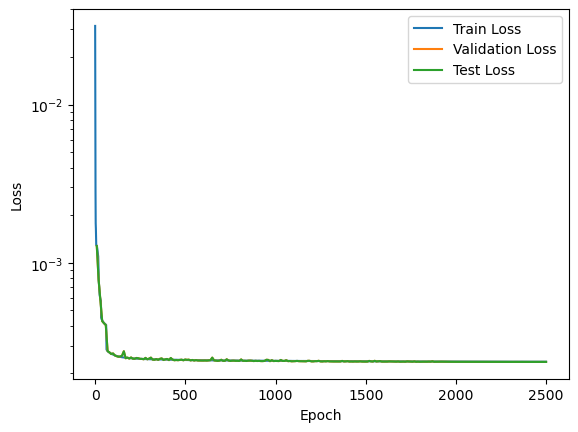

In [37]:
# Plotting
plt.plot(train_losses.numpy(), label='Train Loss')
plt.plot( np.arange(val_freq-1, num_epochs, val_freq),val_losses.numpy(), label='Validation Loss')
plt.plot(np.arange(test_freq-1, num_epochs, test_freq),test_losses.numpy(), label='Test Loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

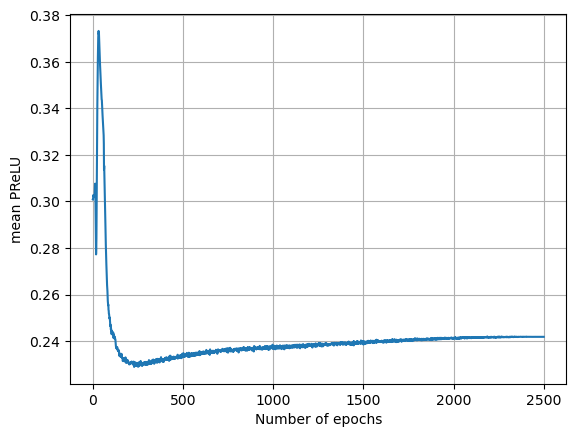

In [38]:
plt.plot(alphas.detach().numpy())
plt.xlabel('Number of epochs')
plt.ylabel('mean PReLU')    
plt.grid(True)
plt.show()

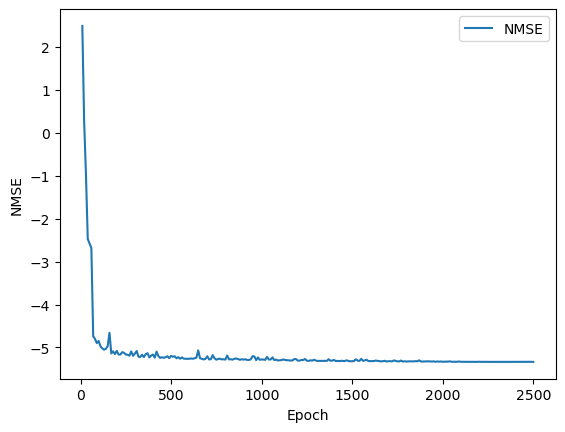

In [39]:
plt.plot(np.arange(test_freq-1, num_epochs, test_freq), test_nmses, label='NMSE')
plt.xlabel('Epoch')
plt.ylabel('NMSE')
plt.legend()
plt.show()

In [40]:
test_losses

tensor([0.0013, 0.0008, 0.0006, 0.0004, 0.0004, 0.0004, 0.0003, 0.0003, 0.0003,
        0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0003,
        0.0002, 0.0003, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0003, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 

In [41]:
train_losses

tensor([0.0314, 0.0065, 0.0028,  ..., 0.0002, 0.0002, 0.0002])

In [42]:
val_losses

tensor([0.0013, 0.0008, 0.0006, 0.0004, 0.0004, 0.0004, 0.0003, 0.0003, 0.0003,
        0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0003,
        0.0002, 0.0003, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0003, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 